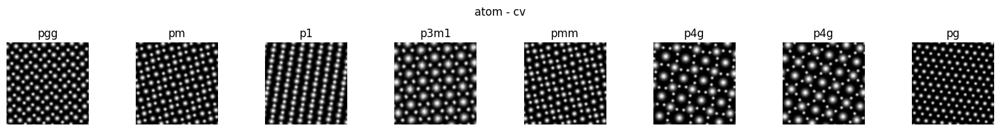

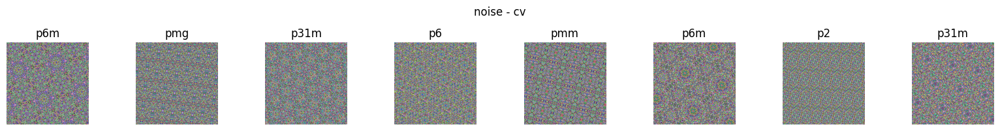

In [1]:
%load_ext autoreload
%autoreload 2
import numpy as np
from IPython.display import display
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
from torchvision import transforms
from torch.utils.data import DataLoader
import wandb

import sys
sys.path.append('../../src/benchmark/')
sys.path.append('../../src/utils/')
from build_model import fpn_resnet50_classification
from utils import split_train_valid, list_to_dict, viz_dataloader, hdf5_dataset
from trainer import Trainer, accuracy

symmetry_classes = ['p1', 'p2', 'pm', 'pg', 'cm', 'pmm', 'pmg', 'pgg', 'cmm', 'p4', 'p4m', 'p4g', 'p3', 'p3m1', 'p31m', 'p6', 'p6m']
label_converter = list_to_dict(symmetry_classes)
bs = 3600
n_cpus = 12

# # atom
atom_ds = hdf5_dataset('../../datasets/atom_v5_rot_200k.h5', folder='test', transform=transforms.ToTensor())
atom_dl = DataLoader(atom_ds, batch_size=bs, shuffle=False, num_workers=n_cpus)
viz_dataloader(atom_dl, label_converter=label_converter, title='atom - cv')

# # noise
noise_ds = hdf5_dataset('../../datasets/imagenet_atom_noise_v4_rot_10m_100k_subset.h5', folder='noise', transform=transforms.ToTensor())
noise_dl = DataLoader(noise_ds, batch_size=bs, shuffle=False, num_workers=n_cpus)
viz_dataloader(noise_dl, label_converter=label_converter, title='noise - cv')

### 1K training dataset size 

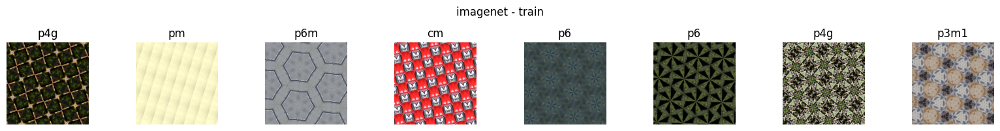

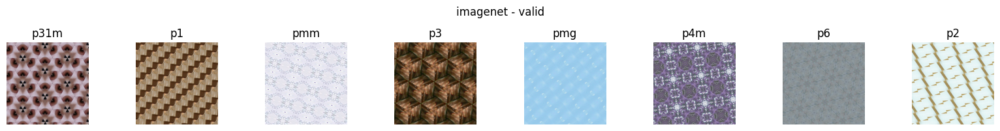

In [3]:
# imagenet
imagenet_ds = hdf5_dataset('../../datasets/imagenet_v5_rot_10m.h5', folder='train', transform=transforms.ToTensor())
_, imagenet_ds = split_train_valid(imagenet_ds, 0.9999, seed=42)
train_ds, valid_ds = split_train_valid(imagenet_ds, 0.8, seed=42)
train_dl = DataLoader(train_ds, batch_size=bs, shuffle=True, num_workers=n_cpus)
viz_dataloader(train_dl, label_converter=label_converter, title='imagenet - train')
valid_dl = DataLoader(valid_ds, batch_size=bs, shuffle=False, num_workers=n_cpus)
viz_dataloader(valid_dl, label_converter=label_converter, title='imagenet - valid')

In [4]:
model = fpn_resnet50_classification(in_channels=3, n_classes=17)
outputs = model(torch.randn(2,3,256,256))
print(outputs.shape)
model = torch.nn.DataParallel(model, device_ids=[3,5,6,8])
device = torch.device('cuda:3')
# model

/home/yichen/anaconda3/envs/symmetry/lib/python3.10/site-packages/torch/nn/functional.py:3769: UserWarning: nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.")


torch.Size([2, 17])


In [5]:
config = {'dataset': '1k datasets',
          'loss_func': 'CrossEntropyLoss', # nn.MSELoss()
          'optimizer': 'Adam',
          'scheduler': 'OneCycleLR'}
NAME = '09232024-FPN-dataset_v5_size-1k'
wandb.login()
proj_name = 'Understanding-Experimental-Images-by-Identifying-Symmetries-with-Deep-Learning'
wandb.init(project=proj_name, entity='yig319', name=NAME, id=NAME, group='dataset_v5_size_vs_records-FPN', save_code=True, config=config, resume='allow')
config = wandb.config

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: yig319. Use `wandb login --relogin` to force relogin


In [6]:
lr = 1e-3
per_epoch = 100
epoch_start = 0
epochs = 10000
loss_func = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, epochs=epochs, max_lr=lr, steps_per_epoch=len(train_dl))
metrics = [accuracy]  # You can add more metrics if needed
trainer = Trainer(model=model, loss_func=loss_func, optimizer=optimizer, metrics=metrics, scheduler=scheduler, 
                  device=device, save_per_epochs=per_epoch, model_path=f'../../saved_models/{NAME}/', early_stopping_patience=None)

history = trainer.train(train_dl=train_dl, epochs=epochs, epoch_start=epoch_start, valid_per_epochs=per_epoch,
                        valid_dl_list=[valid_dl, atom_dl, noise_dl], valid_dl_names=['', 'atom', 'noise'], tracking=True)

Epoch 1/10000


  0%|          | 0/1 [00:00<?, ?it/s]/home/yichen/anaconda3/envs/symmetry/lib/python3.10/site-packages/torch/nn/functional.py:3769: UserWarning: nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.")
100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 3.0949, train_accuracy: 5.48%
Epoch 2/10000


100%|██████████| 1/1 [00:02<00:00,  2.06s/it]


train_loss: 3.0665, train_accuracy: 7.93%
Epoch 3/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 3.0605, train_accuracy: 5.83%
Epoch 4/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 2.9846, train_accuracy: 8.63%
Epoch 5/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 3.0415, train_accuracy: 5.02%
Epoch 6/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 3.0124, train_accuracy: 7.12%
Epoch 7/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 2.9683, train_accuracy: 7.23%
Epoch 8/10000


100%|██████████| 1/1 [00:02<00:00,  2.06s/it]


train_loss: 2.9383, train_accuracy: 7.23%
Epoch 9/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 2.9216, train_accuracy: 7.70%
Epoch 10/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 2.9269, train_accuracy: 9.10%
Epoch 11/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 2.8967, train_accuracy: 8.87%
Epoch 12/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 2.9179, train_accuracy: 8.98%
Epoch 13/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 2.8968, train_accuracy: 9.33%
Epoch 14/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 2.9313, train_accuracy: 7.70%
Epoch 15/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 2.8688, train_accuracy: 8.52%
Epoch 16/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 2.8716, train_accuracy: 8.63%
Epoch 17/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 2.8904, train_accuracy: 8.28%
Epoch 18/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 2.8553, train_accuracy: 8.28%
Epoch 19/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 2.8443, train_accuracy: 10.39%
Epoch 20/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 2.8526, train_accuracy: 9.45%
Epoch 21/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 2.8022, train_accuracy: 11.09%
Epoch 22/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 2.8124, train_accuracy: 10.62%
Epoch 23/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 2.8375, train_accuracy: 10.74%
Epoch 24/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 2.8034, train_accuracy: 11.20%
Epoch 25/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 2.8463, train_accuracy: 10.50%
Epoch 26/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 2.7974, train_accuracy: 12.14%
Epoch 27/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 2.7861, train_accuracy: 11.90%
Epoch 28/10000


100%|██████████| 1/1 [00:02<00:00,  2.62s/it]


train_loss: 2.7725, train_accuracy: 12.49%
Epoch 29/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 2.7609, train_accuracy: 12.49%
Epoch 30/10000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 2.7685, train_accuracy: 13.42%
Epoch 31/10000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 2.7701, train_accuracy: 13.54%
Epoch 32/10000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 2.7223, train_accuracy: 14.82%
Epoch 33/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 2.7063, train_accuracy: 13.77%
Epoch 34/10000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 2.6651, train_accuracy: 14.94%
Epoch 35/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 2.7021, train_accuracy: 14.35%
Epoch 36/10000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 2.6985, train_accuracy: 15.40%
Epoch 37/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 2.6829, train_accuracy: 17.62%
Epoch 38/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 2.6945, train_accuracy: 13.89%
Epoch 39/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 2.6393, train_accuracy: 15.52%
Epoch 40/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 2.6705, train_accuracy: 16.80%
Epoch 41/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 2.6495, train_accuracy: 17.85%
Epoch 42/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 2.5936, train_accuracy: 17.97%
Epoch 43/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 2.5792, train_accuracy: 19.25%
Epoch 44/10000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 2.5651, train_accuracy: 19.60%
Epoch 45/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 2.5526, train_accuracy: 17.97%
Epoch 46/10000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 2.5245, train_accuracy: 20.42%
Epoch 47/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 2.5399, train_accuracy: 20.07%
Epoch 48/10000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 2.5613, train_accuracy: 20.07%
Epoch 49/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 2.5277, train_accuracy: 20.89%
Epoch 50/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 2.4860, train_accuracy: 21.94%
Epoch 51/10000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 2.5369, train_accuracy: 20.07%
Epoch 52/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 2.4829, train_accuracy: 22.75%
Epoch 53/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 2.4666, train_accuracy: 22.52%
Epoch 54/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 2.4699, train_accuracy: 21.70%
Epoch 55/10000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 2.4297, train_accuracy: 24.74%
Epoch 56/10000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 2.4595, train_accuracy: 24.62%
Epoch 57/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 2.4331, train_accuracy: 25.20%
Epoch 58/10000


100%|██████████| 1/1 [00:02<00:00,  2.07s/it]


train_loss: 2.3629, train_accuracy: 25.79%
Epoch 59/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 2.3702, train_accuracy: 25.90%
Epoch 60/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 2.2977, train_accuracy: 31.39%
Epoch 61/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 2.2986, train_accuracy: 30.69%
Epoch 62/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 2.2840, train_accuracy: 30.22%
Epoch 63/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 2.2998, train_accuracy: 29.40%
Epoch 64/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 2.2716, train_accuracy: 31.39%
Epoch 65/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 2.1870, train_accuracy: 35.82%
Epoch 66/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 2.2516, train_accuracy: 28.94%
Epoch 67/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 2.1881, train_accuracy: 34.54%
Epoch 68/10000


100%|██████████| 1/1 [00:02<00:00,  2.46s/it]


train_loss: 2.1616, train_accuracy: 35.24%
Epoch 69/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 2.2145, train_accuracy: 34.19%
Epoch 70/10000


100%|██████████| 1/1 [00:02<00:00,  2.07s/it]


train_loss: 2.1397, train_accuracy: 35.94%
Epoch 71/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 2.1464, train_accuracy: 36.87%
Epoch 72/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 2.1486, train_accuracy: 36.87%
Epoch 73/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 2.0913, train_accuracy: 39.44%
Epoch 74/10000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 2.0900, train_accuracy: 38.51%
Epoch 75/10000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 2.0829, train_accuracy: 38.74%
Epoch 76/10000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 2.0652, train_accuracy: 40.84%
Epoch 77/10000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 2.0283, train_accuracy: 41.42%
Epoch 78/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 2.0066, train_accuracy: 41.31%
Epoch 79/10000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 1.9776, train_accuracy: 44.81%
Epoch 80/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 1.9830, train_accuracy: 44.69%
Epoch 81/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 1.9364, train_accuracy: 44.57%
Epoch 82/10000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 1.9481, train_accuracy: 44.69%
Epoch 83/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 1.9667, train_accuracy: 43.29%
Epoch 84/10000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 1.9521, train_accuracy: 45.16%
Epoch 85/10000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 1.8796, train_accuracy: 50.06%
Epoch 86/10000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 1.8845, train_accuracy: 49.82%
Epoch 87/10000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 1.7911, train_accuracy: 55.66%
Epoch 88/10000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 1.8480, train_accuracy: 48.89%
Epoch 89/10000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 1.8241, train_accuracy: 52.28%
Epoch 90/10000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 1.7660, train_accuracy: 55.19%
Epoch 91/10000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 1.7887, train_accuracy: 52.98%
Epoch 92/10000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 1.7143, train_accuracy: 56.13%
Epoch 93/10000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 1.7672, train_accuracy: 56.71%
Epoch 94/10000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 1.6564, train_accuracy: 59.86%
Epoch 95/10000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 1.6865, train_accuracy: 57.41%
Epoch 96/10000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 1.6207, train_accuracy: 58.93%
Epoch 97/10000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 1.6209, train_accuracy: 61.61%
Epoch 98/10000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 1.6957, train_accuracy: 57.88%
Epoch 99/10000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 1.6433, train_accuracy: 59.86%
Epoch 100/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 1.5398, train_accuracy: 66.04%


100%|██████████| 1/1 [00:00<00:00,  1.21it/s]


valid_loss: 3.0921, valid_accuracy: 5.12%


100%|██████████| 85/85 [01:40<00:00,  1.19s/it]


valid_atom_loss: 2.9275, valid_atom_accuracy: 8.09%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 3.1756, valid_noise_accuracy: 5.84%
Model saved at epoch 100
Epoch 101/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 1.5390, train_accuracy: 63.94%
Epoch 102/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 1.5086, train_accuracy: 66.98%
Epoch 103/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 1.5153, train_accuracy: 67.68%
Epoch 104/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 1.5228, train_accuracy: 65.46%
Epoch 105/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 1.4745, train_accuracy: 70.25%
Epoch 106/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 1.4434, train_accuracy: 69.31%
Epoch 107/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 1.3941, train_accuracy: 74.80%
Epoch 108/10000


100%|██████████| 1/1 [00:02<00:00,  2.11s/it]


train_loss: 1.4745, train_accuracy: 68.61%
Epoch 109/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 1.3525, train_accuracy: 74.68%
Epoch 110/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 1.4182, train_accuracy: 70.25%
Epoch 111/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 1.4029, train_accuracy: 72.11%
Epoch 112/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 1.3186, train_accuracy: 76.55%
Epoch 113/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 1.2783, train_accuracy: 78.41%
Epoch 114/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 1.3062, train_accuracy: 77.01%
Epoch 115/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 1.3223, train_accuracy: 75.03%
Epoch 116/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 1.2868, train_accuracy: 76.55%
Epoch 117/10000


100%|██████████| 1/1 [00:02<00:00,  2.12s/it]


train_loss: 1.2603, train_accuracy: 79.23%
Epoch 118/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 1.2413, train_accuracy: 80.16%
Epoch 119/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 1.2088, train_accuracy: 80.86%
Epoch 120/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 1.2027, train_accuracy: 82.03%
Epoch 121/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 1.1701, train_accuracy: 81.91%
Epoch 122/10000


100%|██████████| 1/1 [00:02<00:00,  2.49s/it]


train_loss: 1.1674, train_accuracy: 81.91%
Epoch 123/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 1.2024, train_accuracy: 81.91%
Epoch 124/10000


100%|██████████| 1/1 [00:02<00:00,  2.11s/it]


train_loss: 1.1256, train_accuracy: 84.25%
Epoch 125/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 1.1382, train_accuracy: 83.43%
Epoch 126/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 1.1214, train_accuracy: 83.55%
Epoch 127/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 1.2797, train_accuracy: 76.31%
Epoch 128/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 1.1467, train_accuracy: 84.60%
Epoch 129/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 1.0562, train_accuracy: 87.75%
Epoch 130/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 1.0992, train_accuracy: 85.18%
Epoch 131/10000


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


train_loss: 1.1581, train_accuracy: 82.03%
Epoch 132/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 1.0290, train_accuracy: 88.56%
Epoch 133/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 1.0505, train_accuracy: 86.93%
Epoch 134/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 1.0834, train_accuracy: 85.88%
Epoch 135/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 1.1492, train_accuracy: 80.98%
Epoch 136/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 1.1064, train_accuracy: 83.78%
Epoch 137/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 1.0065, train_accuracy: 90.32%
Epoch 138/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 1.0098, train_accuracy: 88.80%
Epoch 139/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.9804, train_accuracy: 87.63%
Epoch 140/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.9698, train_accuracy: 89.85%
Epoch 141/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.9659, train_accuracy: 91.25%
Epoch 142/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.9758, train_accuracy: 88.33%
Epoch 143/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.9497, train_accuracy: 89.26%
Epoch 144/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.9328, train_accuracy: 92.07%
Epoch 145/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.9175, train_accuracy: 90.55%
Epoch 146/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.9291, train_accuracy: 90.43%
Epoch 147/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.8859, train_accuracy: 93.35%
Epoch 148/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.9357, train_accuracy: 90.32%
Epoch 149/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.8573, train_accuracy: 91.37%
Epoch 150/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.8484, train_accuracy: 92.77%
Epoch 151/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.8499, train_accuracy: 94.40%
Epoch 152/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.8363, train_accuracy: 93.23%
Epoch 153/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.7950, train_accuracy: 94.40%
Epoch 154/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.8824, train_accuracy: 92.53%
Epoch 155/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.9006, train_accuracy: 91.60%
Epoch 156/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.7975, train_accuracy: 94.75%
Epoch 157/10000


100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


train_loss: 0.8217, train_accuracy: 93.70%
Epoch 158/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.8255, train_accuracy: 93.70%
Epoch 159/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.7665, train_accuracy: 95.57%
Epoch 160/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.7639, train_accuracy: 95.10%
Epoch 161/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.7408, train_accuracy: 94.98%
Epoch 162/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.7334, train_accuracy: 96.15%
Epoch 163/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.9321, train_accuracy: 87.75%
Epoch 164/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.7032, train_accuracy: 96.73%
Epoch 165/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.7359, train_accuracy: 96.27%
Epoch 166/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.7658, train_accuracy: 95.80%
Epoch 167/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.7415, train_accuracy: 96.03%
Epoch 168/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.7410, train_accuracy: 94.98%
Epoch 169/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.7497, train_accuracy: 96.50%
Epoch 170/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.7653, train_accuracy: 94.28%
Epoch 171/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.6994, train_accuracy: 96.38%
Epoch 172/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.7771, train_accuracy: 94.63%
Epoch 173/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.6921, train_accuracy: 96.73%
Epoch 174/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.6846, train_accuracy: 96.15%
Epoch 175/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.6987, train_accuracy: 96.62%
Epoch 176/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.6302, train_accuracy: 97.67%
Epoch 177/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.7099, train_accuracy: 96.62%
Epoch 178/10000


100%|██████████| 1/1 [00:02<00:00,  2.49s/it]


train_loss: 0.6680, train_accuracy: 97.20%
Epoch 179/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.6546, train_accuracy: 97.08%
Epoch 180/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.6726, train_accuracy: 97.08%
Epoch 181/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.6814, train_accuracy: 96.50%
Epoch 182/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.7101, train_accuracy: 96.38%
Epoch 183/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.7084, train_accuracy: 95.33%
Epoch 184/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.6401, train_accuracy: 97.43%
Epoch 185/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.6039, train_accuracy: 97.43%
Epoch 186/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.6348, train_accuracy: 96.62%
Epoch 187/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.7313, train_accuracy: 94.75%
Epoch 188/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.6374, train_accuracy: 97.32%
Epoch 189/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.6441, train_accuracy: 96.85%
Epoch 190/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.6304, train_accuracy: 96.85%
Epoch 191/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.6272, train_accuracy: 97.78%
Epoch 192/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.6611, train_accuracy: 96.97%
Epoch 193/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.6120, train_accuracy: 97.43%
Epoch 194/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.5501, train_accuracy: 98.37%
Epoch 195/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.6323, train_accuracy: 97.20%
Epoch 196/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.5922, train_accuracy: 98.13%
Epoch 197/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.6056, train_accuracy: 97.32%
Epoch 198/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.6954, train_accuracy: 94.98%
Epoch 199/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.6052, train_accuracy: 97.90%
Epoch 200/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.6046, train_accuracy: 97.78%


100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


valid_loss: 3.0790, valid_accuracy: 6.98%


100%|██████████| 85/85 [01:41<00:00,  1.20s/it]


valid_atom_loss: 2.9535, valid_atom_accuracy: 7.03%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 2.9385, valid_noise_accuracy: 7.24%
Model saved at epoch 200
Epoch 201/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.5946, train_accuracy: 98.02%
Epoch 202/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.5491, train_accuracy: 98.95%
Epoch 203/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.6224, train_accuracy: 96.73%
Epoch 204/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.5740, train_accuracy: 97.78%
Epoch 205/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.6409, train_accuracy: 96.38%
Epoch 206/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.5579, train_accuracy: 98.37%
Epoch 207/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.5641, train_accuracy: 98.02%
Epoch 208/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.5388, train_accuracy: 97.90%
Epoch 209/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.5361, train_accuracy: 98.13%
Epoch 210/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.5810, train_accuracy: 97.78%
Epoch 211/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.5553, train_accuracy: 97.78%
Epoch 212/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.5996, train_accuracy: 97.08%
Epoch 213/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.5341, train_accuracy: 98.02%
Epoch 214/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.5732, train_accuracy: 97.32%
Epoch 215/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.5452, train_accuracy: 97.20%
Epoch 216/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.4881, train_accuracy: 98.60%
Epoch 217/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.5674, train_accuracy: 97.32%
Epoch 218/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.5325, train_accuracy: 98.13%
Epoch 219/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.5174, train_accuracy: 98.25%
Epoch 220/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.5273, train_accuracy: 97.20%
Epoch 221/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.5106, train_accuracy: 97.78%
Epoch 222/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.5208, train_accuracy: 98.02%
Epoch 223/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.4972, train_accuracy: 97.78%
Epoch 224/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.5474, train_accuracy: 97.67%
Epoch 225/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.4945, train_accuracy: 98.37%
Epoch 226/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.5243, train_accuracy: 97.32%
Epoch 227/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.5079, train_accuracy: 98.60%
Epoch 228/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.5166, train_accuracy: 98.02%
Epoch 229/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.4649, train_accuracy: 98.72%
Epoch 230/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.5311, train_accuracy: 97.32%
Epoch 231/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.5028, train_accuracy: 97.67%
Epoch 232/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.5139, train_accuracy: 97.67%
Epoch 233/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.4771, train_accuracy: 98.48%
Epoch 234/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.4899, train_accuracy: 98.37%
Epoch 235/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.4880, train_accuracy: 98.25%
Epoch 236/10000


100%|██████████| 1/1 [00:02<00:00,  2.50s/it]


train_loss: 0.4853, train_accuracy: 98.48%
Epoch 237/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.4803, train_accuracy: 98.13%
Epoch 238/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.4977, train_accuracy: 97.78%
Epoch 239/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.4403, train_accuracy: 99.30%
Epoch 240/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.4999, train_accuracy: 97.90%
Epoch 241/10000


100%|██████████| 1/1 [00:02<00:00,  2.11s/it]


train_loss: 0.4589, train_accuracy: 98.25%
Epoch 242/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.4726, train_accuracy: 98.37%
Epoch 243/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.4859, train_accuracy: 98.13%
Epoch 244/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.4798, train_accuracy: 98.13%
Epoch 245/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.4825, train_accuracy: 98.72%
Epoch 246/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.4420, train_accuracy: 98.48%
Epoch 247/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.4432, train_accuracy: 98.48%
Epoch 248/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.4549, train_accuracy: 98.72%
Epoch 249/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.4974, train_accuracy: 97.32%
Epoch 250/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.4357, train_accuracy: 98.60%
Epoch 251/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.4332, train_accuracy: 98.60%
Epoch 252/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.4400, train_accuracy: 98.83%
Epoch 253/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.4319, train_accuracy: 98.72%
Epoch 254/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.4427, train_accuracy: 98.95%
Epoch 255/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.4300, train_accuracy: 98.60%
Epoch 256/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.4675, train_accuracy: 98.02%
Epoch 257/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.4423, train_accuracy: 98.60%
Epoch 258/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.4383, train_accuracy: 98.95%
Epoch 259/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.4430, train_accuracy: 99.07%
Epoch 260/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.4128, train_accuracy: 99.18%
Epoch 261/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.4479, train_accuracy: 98.37%
Epoch 262/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.4151, train_accuracy: 98.60%
Epoch 263/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.4518, train_accuracy: 98.37%
Epoch 264/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.4159, train_accuracy: 98.60%
Epoch 265/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.4400, train_accuracy: 98.60%
Epoch 266/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.4048, train_accuracy: 98.60%
Epoch 267/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.4104, train_accuracy: 98.37%
Epoch 268/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.4542, train_accuracy: 98.02%
Epoch 269/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.4224, train_accuracy: 98.37%
Epoch 270/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.3890, train_accuracy: 99.18%
Epoch 271/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.4323, train_accuracy: 98.83%
Epoch 272/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.4014, train_accuracy: 99.42%
Epoch 273/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.4241, train_accuracy: 98.72%
Epoch 274/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.3884, train_accuracy: 99.65%
Epoch 275/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.4431, train_accuracy: 98.13%
Epoch 276/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.4157, train_accuracy: 98.25%
Epoch 277/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.3905, train_accuracy: 99.07%
Epoch 278/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.4013, train_accuracy: 98.95%
Epoch 279/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.4228, train_accuracy: 98.13%
Epoch 280/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.3793, train_accuracy: 99.07%
Epoch 281/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.3849, train_accuracy: 98.72%
Epoch 282/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.3948, train_accuracy: 99.30%
Epoch 283/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.4288, train_accuracy: 98.25%
Epoch 284/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.3751, train_accuracy: 98.83%
Epoch 285/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.3853, train_accuracy: 98.60%
Epoch 286/10000


100%|██████████| 1/1 [00:02<00:00,  2.70s/it]


train_loss: 0.3919, train_accuracy: 98.72%
Epoch 287/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.3901, train_accuracy: 99.18%
Epoch 288/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.3790, train_accuracy: 98.95%
Epoch 289/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.3848, train_accuracy: 98.83%
Epoch 290/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.4057, train_accuracy: 98.95%
Epoch 291/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.3933, train_accuracy: 98.95%
Epoch 292/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.3640, train_accuracy: 98.95%
Epoch 293/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.4287, train_accuracy: 97.90%
Epoch 294/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.3941, train_accuracy: 98.95%
Epoch 295/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.3587, train_accuracy: 99.18%
Epoch 296/10000


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


train_loss: 0.4008, train_accuracy: 98.48%
Epoch 297/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.3793, train_accuracy: 99.07%
Epoch 298/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.3828, train_accuracy: 98.72%
Epoch 299/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.3598, train_accuracy: 98.83%
Epoch 300/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.3835, train_accuracy: 98.95%


100%|██████████| 1/1 [00:00<00:00,  1.21it/s]


valid_loss: 3.1214, valid_accuracy: 6.98%


100%|██████████| 85/85 [01:41<00:00,  1.19s/it]


valid_atom_loss: 2.9956, valid_atom_accuracy: 7.30%


100%|██████████| 43/43 [00:52<00:00,  1.21s/it]


valid_noise_loss: 2.9776, valid_noise_accuracy: 6.11%
Model saved at epoch 300
Epoch 301/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.3915, train_accuracy: 98.13%
Epoch 302/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.3425, train_accuracy: 98.83%
Epoch 303/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.3432, train_accuracy: 99.07%
Epoch 304/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.3809, train_accuracy: 98.48%
Epoch 305/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.3646, train_accuracy: 98.48%
Epoch 306/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.3521, train_accuracy: 99.07%
Epoch 307/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.3442, train_accuracy: 99.18%
Epoch 308/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.3433, train_accuracy: 99.42%
Epoch 309/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.4034, train_accuracy: 99.07%
Epoch 310/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.3605, train_accuracy: 99.42%
Epoch 311/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.3340, train_accuracy: 99.30%
Epoch 312/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.3418, train_accuracy: 99.30%
Epoch 313/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.3631, train_accuracy: 99.18%
Epoch 314/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.3290, train_accuracy: 99.07%
Epoch 315/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.3482, train_accuracy: 99.42%
Epoch 316/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.3521, train_accuracy: 99.42%
Epoch 317/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.3499, train_accuracy: 99.42%
Epoch 318/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.3595, train_accuracy: 98.95%
Epoch 319/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.3337, train_accuracy: 99.30%
Epoch 320/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.3424, train_accuracy: 99.65%
Epoch 321/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.3432, train_accuracy: 99.53%
Epoch 322/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.3266, train_accuracy: 99.42%
Epoch 323/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.3167, train_accuracy: 99.18%
Epoch 324/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.3246, train_accuracy: 99.07%
Epoch 325/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.3550, train_accuracy: 99.30%
Epoch 326/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.3256, train_accuracy: 99.30%
Epoch 327/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.3361, train_accuracy: 99.18%
Epoch 328/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.3102, train_accuracy: 99.18%
Epoch 329/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.3298, train_accuracy: 99.42%
Epoch 330/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.3096, train_accuracy: 99.53%
Epoch 331/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.3192, train_accuracy: 99.53%
Epoch 332/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.3073, train_accuracy: 99.53%
Epoch 333/10000


100%|██████████| 1/1 [00:02<00:00,  2.11s/it]


train_loss: 0.3032, train_accuracy: 99.65%
Epoch 334/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.3243, train_accuracy: 99.30%
Epoch 335/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.3151, train_accuracy: 99.18%
Epoch 336/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.3263, train_accuracy: 99.42%
Epoch 337/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.3312, train_accuracy: 99.18%
Epoch 338/10000


100%|██████████| 1/1 [00:02<00:00,  2.51s/it]


train_loss: 0.3051, train_accuracy: 99.30%
Epoch 339/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.3531, train_accuracy: 98.60%
Epoch 340/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.3141, train_accuracy: 99.30%
Epoch 341/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.3073, train_accuracy: 99.07%
Epoch 342/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.3419, train_accuracy: 98.95%
Epoch 343/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.3167, train_accuracy: 98.95%
Epoch 344/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.3412, train_accuracy: 98.83%
Epoch 345/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.3269, train_accuracy: 99.07%
Epoch 346/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.3228, train_accuracy: 98.95%
Epoch 347/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.3213, train_accuracy: 98.95%
Epoch 348/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.3221, train_accuracy: 98.60%
Epoch 349/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.3104, train_accuracy: 99.42%
Epoch 350/10000


100%|██████████| 1/1 [00:02<00:00,  2.11s/it]


train_loss: 0.3015, train_accuracy: 99.30%
Epoch 351/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.3271, train_accuracy: 99.42%
Epoch 352/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.3050, train_accuracy: 99.30%
Epoch 353/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.2966, train_accuracy: 99.53%
Epoch 354/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.2802, train_accuracy: 99.18%
Epoch 355/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.2883, train_accuracy: 99.18%
Epoch 356/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.3026, train_accuracy: 99.18%
Epoch 357/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.3188, train_accuracy: 98.95%
Epoch 358/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.2972, train_accuracy: 98.95%
Epoch 359/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2985, train_accuracy: 99.65%
Epoch 360/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.3103, train_accuracy: 99.18%
Epoch 361/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.3354, train_accuracy: 98.37%
Epoch 362/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.2747, train_accuracy: 99.42%
Epoch 363/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2997, train_accuracy: 99.18%
Epoch 364/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.3153, train_accuracy: 98.83%
Epoch 365/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.3006, train_accuracy: 99.18%
Epoch 366/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.2797, train_accuracy: 99.53%
Epoch 367/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.3011, train_accuracy: 99.07%
Epoch 368/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.2813, train_accuracy: 99.18%
Epoch 369/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.3436, train_accuracy: 98.60%
Epoch 370/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.2845, train_accuracy: 99.30%
Epoch 371/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.2821, train_accuracy: 99.65%
Epoch 372/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.2773, train_accuracy: 99.88%
Epoch 373/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.3270, train_accuracy: 98.95%
Epoch 374/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2840, train_accuracy: 99.42%
Epoch 375/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2857, train_accuracy: 99.30%
Epoch 376/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.2755, train_accuracy: 99.18%
Epoch 377/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.2632, train_accuracy: 99.30%
Epoch 378/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.2741, train_accuracy: 99.18%
Epoch 379/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.2981, train_accuracy: 99.30%
Epoch 380/10000


100%|██████████| 1/1 [00:02<00:00,  2.08s/it]


train_loss: 0.2836, train_accuracy: 98.95%
Epoch 381/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2937, train_accuracy: 98.95%
Epoch 382/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2872, train_accuracy: 98.95%
Epoch 383/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.3369, train_accuracy: 98.37%
Epoch 384/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2740, train_accuracy: 99.53%
Epoch 385/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.2773, train_accuracy: 99.42%
Epoch 386/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2923, train_accuracy: 98.95%
Epoch 387/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2784, train_accuracy: 99.18%
Epoch 388/10000


100%|██████████| 1/1 [00:02<00:00,  2.69s/it]


train_loss: 0.2762, train_accuracy: 99.18%
Epoch 389/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.2762, train_accuracy: 99.18%
Epoch 390/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.2796, train_accuracy: 99.30%
Epoch 391/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.2670, train_accuracy: 99.53%
Epoch 392/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.2683, train_accuracy: 99.42%
Epoch 393/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.2879, train_accuracy: 98.95%
Epoch 394/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.2613, train_accuracy: 99.18%
Epoch 395/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.2644, train_accuracy: 99.42%
Epoch 396/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.2801, train_accuracy: 99.30%
Epoch 397/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.2915, train_accuracy: 98.72%
Epoch 398/10000


100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


train_loss: 0.2530, train_accuracy: 99.65%
Epoch 399/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.3175, train_accuracy: 98.60%
Epoch 400/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.2609, train_accuracy: 99.65%


100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


valid_loss: 3.2214, valid_accuracy: 7.91%


100%|██████████| 85/85 [01:41<00:00,  1.20s/it]


valid_atom_loss: 3.0488, valid_atom_accuracy: 6.84%


100%|██████████| 43/43 [00:53<00:00,  1.24s/it]


valid_noise_loss: 3.2747, valid_noise_accuracy: 5.89%
Model saved at epoch 400
Epoch 401/10000


100%|██████████| 1/1 [00:02<00:00,  2.12s/it]


train_loss: 0.2559, train_accuracy: 99.65%
Epoch 402/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.2580, train_accuracy: 99.77%
Epoch 403/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.2758, train_accuracy: 99.18%
Epoch 404/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.2583, train_accuracy: 99.53%
Epoch 405/10000


100%|██████████| 1/1 [00:02<00:00,  2.11s/it]


train_loss: 0.2501, train_accuracy: 99.42%
Epoch 406/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.2636, train_accuracy: 99.07%
Epoch 407/10000


100%|██████████| 1/1 [00:02<00:00,  2.08s/it]


train_loss: 0.2475, train_accuracy: 99.65%
Epoch 408/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2496, train_accuracy: 99.07%
Epoch 409/10000


100%|██████████| 1/1 [00:02<00:00,  2.08s/it]


train_loss: 0.2429, train_accuracy: 99.42%
Epoch 410/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2551, train_accuracy: 99.53%
Epoch 411/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2573, train_accuracy: 98.95%
Epoch 412/10000


100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


train_loss: 0.2912, train_accuracy: 99.30%
Epoch 413/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.2527, train_accuracy: 99.53%
Epoch 414/10000


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


train_loss: 0.2637, train_accuracy: 98.72%
Epoch 415/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.2567, train_accuracy: 99.42%
Epoch 416/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2540, train_accuracy: 99.18%
Epoch 417/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.2475, train_accuracy: 99.18%
Epoch 418/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.2554, train_accuracy: 99.07%
Epoch 419/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.2510, train_accuracy: 99.42%
Epoch 420/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.2480, train_accuracy: 98.95%
Epoch 421/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.2375, train_accuracy: 99.18%
Epoch 422/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2309, train_accuracy: 99.42%
Epoch 423/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.2288, train_accuracy: 99.53%
Epoch 424/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.2744, train_accuracy: 98.72%
Epoch 425/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.2412, train_accuracy: 99.65%
Epoch 426/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.2375, train_accuracy: 99.65%
Epoch 427/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.2277, train_accuracy: 99.42%
Epoch 428/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2421, train_accuracy: 99.42%
Epoch 429/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2246, train_accuracy: 99.30%
Epoch 430/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.2325, train_accuracy: 99.65%
Epoch 431/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2267, train_accuracy: 99.53%
Epoch 432/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.2362, train_accuracy: 99.30%
Epoch 433/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.2310, train_accuracy: 99.53%
Epoch 434/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2598, train_accuracy: 99.07%
Epoch 435/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.2228, train_accuracy: 99.53%
Epoch 436/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.2279, train_accuracy: 99.53%
Epoch 437/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.2610, train_accuracy: 98.72%
Epoch 438/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2293, train_accuracy: 99.42%
Epoch 439/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.2075, train_accuracy: 99.65%
Epoch 440/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.2252, train_accuracy: 99.30%
Epoch 441/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2340, train_accuracy: 99.18%
Epoch 442/10000


100%|██████████| 1/1 [00:02<00:00,  2.73s/it]


train_loss: 0.2360, train_accuracy: 99.18%
Epoch 443/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.2327, train_accuracy: 99.42%
Epoch 444/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.2113, train_accuracy: 99.65%
Epoch 445/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.2184, train_accuracy: 99.53%
Epoch 446/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.2329, train_accuracy: 99.18%
Epoch 447/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.2260, train_accuracy: 99.42%
Epoch 448/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.2351, train_accuracy: 99.30%
Epoch 449/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2165, train_accuracy: 99.42%
Epoch 450/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.2501, train_accuracy: 98.95%
Epoch 451/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.2223, train_accuracy: 99.07%
Epoch 452/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2248, train_accuracy: 99.07%
Epoch 453/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.2388, train_accuracy: 99.42%
Epoch 454/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2118, train_accuracy: 99.30%
Epoch 455/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2233, train_accuracy: 99.65%
Epoch 456/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.2124, train_accuracy: 99.30%
Epoch 457/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2115, train_accuracy: 99.42%
Epoch 458/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.2096, train_accuracy: 99.42%
Epoch 459/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.2168, train_accuracy: 99.07%
Epoch 460/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.2088, train_accuracy: 99.53%
Epoch 461/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2335, train_accuracy: 99.07%
Epoch 462/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.2354, train_accuracy: 99.42%
Epoch 463/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.2144, train_accuracy: 99.30%
Epoch 464/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.2162, train_accuracy: 99.42%
Epoch 465/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.2219, train_accuracy: 99.42%
Epoch 466/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.2017, train_accuracy: 99.30%
Epoch 467/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1971, train_accuracy: 99.65%
Epoch 468/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2073, train_accuracy: 99.42%
Epoch 469/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.2139, train_accuracy: 99.30%
Epoch 470/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2117, train_accuracy: 99.18%
Epoch 471/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1922, train_accuracy: 99.65%
Epoch 472/10000


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


train_loss: 0.2068, train_accuracy: 99.77%
Epoch 473/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2333, train_accuracy: 99.18%
Epoch 474/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.1971, train_accuracy: 99.42%
Epoch 475/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.2011, train_accuracy: 99.42%
Epoch 476/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2264, train_accuracy: 98.95%
Epoch 477/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.2204, train_accuracy: 99.07%
Epoch 478/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.2118, train_accuracy: 99.42%
Epoch 479/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1982, train_accuracy: 99.53%
Epoch 480/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1862, train_accuracy: 99.77%
Epoch 481/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.1842, train_accuracy: 99.77%
Epoch 482/10000


100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


train_loss: 0.2046, train_accuracy: 99.53%
Epoch 483/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2038, train_accuracy: 99.53%
Epoch 484/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2022, train_accuracy: 99.30%
Epoch 485/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.2082, train_accuracy: 99.18%
Epoch 486/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.2097, train_accuracy: 99.30%
Epoch 487/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1968, train_accuracy: 99.53%
Epoch 488/10000


100%|██████████| 1/1 [00:02<00:00,  2.48s/it]


train_loss: 0.1887, train_accuracy: 99.53%
Epoch 489/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2029, train_accuracy: 99.30%
Epoch 490/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.2175, train_accuracy: 99.07%
Epoch 491/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1946, train_accuracy: 99.53%
Epoch 492/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1816, train_accuracy: 99.65%
Epoch 493/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1963, train_accuracy: 99.53%
Epoch 494/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.2025, train_accuracy: 99.30%
Epoch 495/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1988, train_accuracy: 99.18%
Epoch 496/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1956, train_accuracy: 99.07%
Epoch 497/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.2047, train_accuracy: 99.30%
Epoch 498/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.2190, train_accuracy: 98.95%
Epoch 499/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.2087, train_accuracy: 99.30%
Epoch 500/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1877, train_accuracy: 99.30%


100%|██████████| 1/1 [00:00<00:00,  1.22it/s]


valid_loss: 3.2993, valid_accuracy: 6.51%


100%|██████████| 85/85 [01:43<00:00,  1.22s/it]


valid_atom_loss: 3.1118, valid_atom_accuracy: 7.24%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 3.1222, valid_noise_accuracy: 5.71%
Model saved at epoch 500
Epoch 501/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1932, train_accuracy: 99.18%
Epoch 502/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.1773, train_accuracy: 99.30%
Epoch 503/10000


100%|██████████| 1/1 [00:02<00:00,  2.11s/it]


train_loss: 0.1919, train_accuracy: 98.95%
Epoch 504/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.1777, train_accuracy: 99.53%
Epoch 505/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.2081, train_accuracy: 99.07%
Epoch 506/10000


100%|██████████| 1/1 [00:02<00:00,  2.12s/it]


train_loss: 0.1912, train_accuracy: 99.30%
Epoch 507/10000


100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


train_loss: 0.1829, train_accuracy: 99.65%
Epoch 508/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1930, train_accuracy: 99.53%
Epoch 509/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1783, train_accuracy: 99.65%
Epoch 510/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.1958, train_accuracy: 99.18%
Epoch 511/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1851, train_accuracy: 99.18%
Epoch 512/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1804, train_accuracy: 99.07%
Epoch 513/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1924, train_accuracy: 99.30%
Epoch 514/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1899, train_accuracy: 99.07%
Epoch 515/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1797, train_accuracy: 99.42%
Epoch 516/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.1888, train_accuracy: 99.53%
Epoch 517/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1781, train_accuracy: 99.30%
Epoch 518/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1834, train_accuracy: 99.53%
Epoch 519/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1967, train_accuracy: 99.07%
Epoch 520/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1808, train_accuracy: 99.53%
Epoch 521/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1911, train_accuracy: 99.30%
Epoch 522/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.1743, train_accuracy: 99.53%
Epoch 523/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.1661, train_accuracy: 99.42%
Epoch 524/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1762, train_accuracy: 99.42%
Epoch 525/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1895, train_accuracy: 99.53%
Epoch 526/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1682, train_accuracy: 99.42%
Epoch 527/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1875, train_accuracy: 99.42%
Epoch 528/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.1946, train_accuracy: 98.83%
Epoch 529/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1624, train_accuracy: 99.65%
Epoch 530/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1877, train_accuracy: 99.07%
Epoch 531/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1762, train_accuracy: 99.30%
Epoch 532/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1737, train_accuracy: 99.30%
Epoch 533/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1704, train_accuracy: 99.53%
Epoch 534/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1903, train_accuracy: 99.65%
Epoch 535/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1619, train_accuracy: 99.65%
Epoch 536/10000


100%|██████████| 1/1 [00:02<00:00,  2.12s/it]


train_loss: 0.1638, train_accuracy: 99.42%
Epoch 537/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1573, train_accuracy: 99.77%
Epoch 538/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1607, train_accuracy: 99.77%
Epoch 539/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1536, train_accuracy: 99.42%
Epoch 540/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1656, train_accuracy: 99.30%
Epoch 541/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1698, train_accuracy: 99.53%
Epoch 542/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1673, train_accuracy: 99.42%
Epoch 543/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.1683, train_accuracy: 99.30%
Epoch 544/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.2119, train_accuracy: 98.83%
Epoch 545/10000


100%|██████████| 1/1 [00:02<00:00,  2.74s/it]


train_loss: 0.1604, train_accuracy: 99.42%
Epoch 546/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1776, train_accuracy: 99.18%
Epoch 547/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1797, train_accuracy: 99.18%
Epoch 548/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1723, train_accuracy: 99.30%
Epoch 549/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1636, train_accuracy: 99.53%
Epoch 550/10000


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


train_loss: 0.1609, train_accuracy: 99.42%
Epoch 551/10000


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


train_loss: 0.1716, train_accuracy: 99.30%
Epoch 552/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.1698, train_accuracy: 99.18%
Epoch 553/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.1699, train_accuracy: 99.30%
Epoch 554/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1675, train_accuracy: 99.18%
Epoch 555/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1611, train_accuracy: 99.30%
Epoch 556/10000


100%|██████████| 1/1 [00:02<00:00,  2.11s/it]


train_loss: 0.1634, train_accuracy: 99.53%
Epoch 557/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1762, train_accuracy: 99.30%
Epoch 558/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1551, train_accuracy: 99.53%
Epoch 559/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1753, train_accuracy: 99.30%
Epoch 560/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1671, train_accuracy: 99.30%
Epoch 561/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1877, train_accuracy: 98.83%
Epoch 562/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1927, train_accuracy: 98.83%
Epoch 563/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1546, train_accuracy: 99.65%
Epoch 564/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1775, train_accuracy: 99.30%
Epoch 565/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1596, train_accuracy: 99.07%
Epoch 566/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1576, train_accuracy: 99.30%
Epoch 567/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1717, train_accuracy: 99.30%
Epoch 568/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1498, train_accuracy: 99.65%
Epoch 569/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1533, train_accuracy: 99.18%
Epoch 570/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2335, train_accuracy: 98.48%
Epoch 571/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1634, train_accuracy: 99.07%
Epoch 572/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1720, train_accuracy: 99.18%
Epoch 573/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.1725, train_accuracy: 99.18%
Epoch 574/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1585, train_accuracy: 99.30%
Epoch 575/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1582, train_accuracy: 99.53%
Epoch 576/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1518, train_accuracy: 99.53%
Epoch 577/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1601, train_accuracy: 99.30%
Epoch 578/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1503, train_accuracy: 99.30%
Epoch 579/10000


100%|██████████| 1/1 [00:02<00:00,  2.08s/it]


train_loss: 0.1610, train_accuracy: 99.18%
Epoch 580/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1489, train_accuracy: 99.42%
Epoch 581/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1632, train_accuracy: 99.07%
Epoch 582/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1620, train_accuracy: 99.42%
Epoch 583/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1381, train_accuracy: 99.53%
Epoch 584/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1516, train_accuracy: 99.53%
Epoch 585/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1646, train_accuracy: 99.18%
Epoch 586/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1550, train_accuracy: 99.77%
Epoch 587/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1529, train_accuracy: 99.42%
Epoch 588/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1426, train_accuracy: 99.77%
Epoch 589/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1586, train_accuracy: 99.30%
Epoch 590/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.1569, train_accuracy: 99.18%
Epoch 591/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1434, train_accuracy: 99.42%
Epoch 592/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1508, train_accuracy: 99.53%
Epoch 593/10000


100%|██████████| 1/1 [00:02<00:00,  2.68s/it]


train_loss: 0.1543, train_accuracy: 99.18%
Epoch 594/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1671, train_accuracy: 98.48%
Epoch 595/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1865, train_accuracy: 98.72%
Epoch 596/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1524, train_accuracy: 99.53%
Epoch 597/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1495, train_accuracy: 99.53%
Epoch 598/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1584, train_accuracy: 99.30%
Epoch 599/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1741, train_accuracy: 98.72%
Epoch 600/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.1451, train_accuracy: 99.18%


100%|██████████| 1/1 [00:00<00:00,  1.21it/s]


valid_loss: 3.6191, valid_accuracy: 6.05%


100%|██████████| 85/85 [01:41<00:00,  1.19s/it]


valid_atom_loss: 3.1643, valid_atom_accuracy: 7.09%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 3.6206, valid_noise_accuracy: 6.48%
Model saved at epoch 600
Epoch 601/10000


100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


train_loss: 0.1504, train_accuracy: 99.30%
Epoch 602/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1473, train_accuracy: 99.53%
Epoch 603/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.1650, train_accuracy: 98.83%
Epoch 604/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.1560, train_accuracy: 99.18%
Epoch 605/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1357, train_accuracy: 99.42%
Epoch 606/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1520, train_accuracy: 99.07%
Epoch 607/10000


100%|██████████| 1/1 [00:02<00:00,  2.11s/it]


train_loss: 0.1620, train_accuracy: 98.72%
Epoch 608/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1418, train_accuracy: 99.65%
Epoch 609/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.1492, train_accuracy: 99.42%
Epoch 610/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1499, train_accuracy: 99.30%
Epoch 611/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1423, train_accuracy: 99.30%
Epoch 612/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1582, train_accuracy: 98.95%
Epoch 613/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.1441, train_accuracy: 99.42%
Epoch 614/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1469, train_accuracy: 99.42%
Epoch 615/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1370, train_accuracy: 98.95%
Epoch 616/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1360, train_accuracy: 99.30%
Epoch 617/10000


100%|██████████| 1/1 [00:02<00:00,  2.11s/it]


train_loss: 0.1573, train_accuracy: 98.60%
Epoch 618/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1453, train_accuracy: 99.18%
Epoch 619/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1511, train_accuracy: 98.83%
Epoch 620/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1418, train_accuracy: 99.30%
Epoch 621/10000


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


train_loss: 0.1528, train_accuracy: 99.30%
Epoch 622/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1348, train_accuracy: 99.77%
Epoch 623/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1270, train_accuracy: 99.65%
Epoch 624/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1424, train_accuracy: 99.07%
Epoch 625/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1694, train_accuracy: 98.83%
Epoch 626/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1250, train_accuracy: 99.65%
Epoch 627/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1250, train_accuracy: 99.53%
Epoch 628/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1586, train_accuracy: 98.72%
Epoch 629/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.1408, train_accuracy: 99.42%
Epoch 630/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1330, train_accuracy: 99.65%
Epoch 631/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1375, train_accuracy: 99.30%
Epoch 632/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1509, train_accuracy: 99.07%
Epoch 633/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1485, train_accuracy: 99.18%
Epoch 634/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1509, train_accuracy: 98.95%
Epoch 635/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1391, train_accuracy: 99.42%
Epoch 636/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1495, train_accuracy: 98.60%
Epoch 637/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1492, train_accuracy: 99.18%
Epoch 638/10000


100%|██████████| 1/1 [00:02<00:00,  2.11s/it]


train_loss: 0.1458, train_accuracy: 99.18%
Epoch 639/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1437, train_accuracy: 99.18%
Epoch 640/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1499, train_accuracy: 99.07%
Epoch 641/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1338, train_accuracy: 99.30%
Epoch 642/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1400, train_accuracy: 99.07%
Epoch 643/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1604, train_accuracy: 98.95%
Epoch 644/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1504, train_accuracy: 98.95%
Epoch 645/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1429, train_accuracy: 99.30%
Epoch 646/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1398, train_accuracy: 99.07%
Epoch 647/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1310, train_accuracy: 99.30%
Epoch 648/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.1417, train_accuracy: 99.18%
Epoch 649/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1643, train_accuracy: 98.60%
Epoch 650/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1250, train_accuracy: 99.65%
Epoch 651/10000


100%|██████████| 1/1 [00:02<00:00,  2.73s/it]


train_loss: 0.1422, train_accuracy: 99.07%
Epoch 652/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.1562, train_accuracy: 98.48%
Epoch 653/10000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.1372, train_accuracy: 98.83%
Epoch 654/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1293, train_accuracy: 99.30%
Epoch 655/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.1592, train_accuracy: 98.83%
Epoch 656/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1509, train_accuracy: 99.18%
Epoch 657/10000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.1376, train_accuracy: 99.07%
Epoch 658/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1553, train_accuracy: 98.83%
Epoch 659/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1318, train_accuracy: 99.30%
Epoch 660/10000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.1327, train_accuracy: 99.18%
Epoch 661/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.1313, train_accuracy: 99.30%
Epoch 662/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.1148, train_accuracy: 99.42%
Epoch 663/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1350, train_accuracy: 99.07%
Epoch 664/10000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.1380, train_accuracy: 99.30%
Epoch 665/10000


100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


train_loss: 0.1300, train_accuracy: 99.18%
Epoch 666/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1374, train_accuracy: 99.07%
Epoch 667/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1279, train_accuracy: 99.42%
Epoch 668/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1347, train_accuracy: 99.30%
Epoch 669/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1183, train_accuracy: 99.53%
Epoch 670/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1631, train_accuracy: 98.72%
Epoch 671/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1195, train_accuracy: 99.30%
Epoch 672/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1611, train_accuracy: 98.83%
Epoch 673/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1178, train_accuracy: 99.65%
Epoch 674/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1429, train_accuracy: 98.95%
Epoch 675/10000


100%|██████████| 1/1 [00:02<00:00,  2.11s/it]


train_loss: 0.1146, train_accuracy: 99.53%
Epoch 676/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.1440, train_accuracy: 98.95%
Epoch 677/10000


100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


train_loss: 0.1149, train_accuracy: 99.53%
Epoch 678/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1295, train_accuracy: 99.30%
Epoch 679/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1301, train_accuracy: 99.18%
Epoch 680/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1117, train_accuracy: 99.77%
Epoch 681/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1287, train_accuracy: 99.30%
Epoch 682/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1412, train_accuracy: 99.07%
Epoch 683/10000


100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


train_loss: 0.1221, train_accuracy: 99.30%
Epoch 684/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1287, train_accuracy: 98.95%
Epoch 685/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1365, train_accuracy: 98.95%
Epoch 686/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1379, train_accuracy: 98.95%
Epoch 687/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1246, train_accuracy: 99.42%
Epoch 688/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1832, train_accuracy: 97.90%
Epoch 689/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1108, train_accuracy: 99.42%
Epoch 690/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1252, train_accuracy: 98.60%
Epoch 691/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.1198, train_accuracy: 99.65%
Epoch 692/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1433, train_accuracy: 98.83%
Epoch 693/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1336, train_accuracy: 99.18%
Epoch 694/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1432, train_accuracy: 99.07%
Epoch 695/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1149, train_accuracy: 99.53%
Epoch 696/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1319, train_accuracy: 99.07%
Epoch 697/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1583, train_accuracy: 98.72%
Epoch 698/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.1187, train_accuracy: 99.30%
Epoch 699/10000


100%|██████████| 1/1 [00:02<00:00,  2.49s/it]


train_loss: 0.1205, train_accuracy: 99.18%
Epoch 700/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1577, train_accuracy: 98.37%


100%|██████████| 1/1 [00:00<00:00,  1.22it/s]


valid_loss: 3.7466, valid_accuracy: 7.44%


100%|██████████| 85/85 [01:41<00:00,  1.19s/it]


valid_atom_loss: 3.6008, valid_atom_accuracy: 6.76%


100%|██████████| 43/43 [00:52<00:00,  1.21s/it]


valid_noise_loss: 5.0250, valid_noise_accuracy: 5.88%
Model saved at epoch 700
Epoch 701/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1257, train_accuracy: 98.83%
Epoch 702/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1469, train_accuracy: 98.72%
Epoch 703/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.1350, train_accuracy: 99.30%
Epoch 704/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1331, train_accuracy: 99.18%
Epoch 705/10000


100%|██████████| 1/1 [00:02<00:00,  2.70s/it]


train_loss: 0.1517, train_accuracy: 98.72%
Epoch 706/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1326, train_accuracy: 99.42%
Epoch 707/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1275, train_accuracy: 98.95%
Epoch 708/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1287, train_accuracy: 98.95%
Epoch 709/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.1339, train_accuracy: 98.60%
Epoch 710/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1262, train_accuracy: 99.18%
Epoch 711/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1136, train_accuracy: 99.42%
Epoch 712/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1509, train_accuracy: 98.48%
Epoch 713/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1164, train_accuracy: 99.18%
Epoch 714/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1178, train_accuracy: 99.07%
Epoch 715/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1448, train_accuracy: 98.95%
Epoch 716/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1411, train_accuracy: 99.07%
Epoch 717/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1058, train_accuracy: 99.42%
Epoch 718/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1463, train_accuracy: 98.48%
Epoch 719/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.1269, train_accuracy: 99.18%
Epoch 720/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1156, train_accuracy: 99.30%
Epoch 721/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1469, train_accuracy: 98.02%
Epoch 722/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.1394, train_accuracy: 98.72%
Epoch 723/10000


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


train_loss: 0.1087, train_accuracy: 99.42%
Epoch 724/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1236, train_accuracy: 99.07%
Epoch 725/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.2462, train_accuracy: 96.03%
Epoch 726/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1146, train_accuracy: 99.18%
Epoch 727/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1500, train_accuracy: 98.48%
Epoch 728/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1707, train_accuracy: 97.67%
Epoch 729/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1272, train_accuracy: 99.18%
Epoch 730/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1250, train_accuracy: 99.07%
Epoch 731/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1443, train_accuracy: 98.72%
Epoch 732/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1272, train_accuracy: 99.07%
Epoch 733/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1185, train_accuracy: 99.07%
Epoch 734/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1267, train_accuracy: 98.83%
Epoch 735/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1346, train_accuracy: 98.95%
Epoch 736/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1444, train_accuracy: 98.83%
Epoch 737/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1300, train_accuracy: 98.95%
Epoch 738/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.1253, train_accuracy: 99.18%
Epoch 739/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1317, train_accuracy: 99.07%
Epoch 740/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1279, train_accuracy: 99.07%
Epoch 741/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1396, train_accuracy: 98.95%
Epoch 742/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1502, train_accuracy: 98.72%
Epoch 743/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1141, train_accuracy: 99.30%
Epoch 744/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1609, train_accuracy: 98.02%
Epoch 745/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1873, train_accuracy: 97.78%
Epoch 746/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1494, train_accuracy: 98.48%
Epoch 747/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1579, train_accuracy: 98.25%
Epoch 748/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1722, train_accuracy: 97.32%
Epoch 749/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1528, train_accuracy: 98.02%
Epoch 750/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1264, train_accuracy: 98.95%
Epoch 751/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1773, train_accuracy: 98.13%
Epoch 752/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1370, train_accuracy: 98.48%
Epoch 753/10000


100%|██████████| 1/1 [00:02<00:00,  2.46s/it]


train_loss: 0.1394, train_accuracy: 98.95%
Epoch 754/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1238, train_accuracy: 98.83%
Epoch 755/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1425, train_accuracy: 98.60%
Epoch 756/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.1340, train_accuracy: 98.72%
Epoch 757/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1485, train_accuracy: 98.13%
Epoch 758/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.1411, train_accuracy: 98.72%
Epoch 759/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1192, train_accuracy: 99.65%
Epoch 760/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.1262, train_accuracy: 98.83%
Epoch 761/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1474, train_accuracy: 98.25%
Epoch 762/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1254, train_accuracy: 98.83%
Epoch 763/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1126, train_accuracy: 99.18%
Epoch 764/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1649, train_accuracy: 97.78%
Epoch 765/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1126, train_accuracy: 99.30%
Epoch 766/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1127, train_accuracy: 99.30%
Epoch 767/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1131, train_accuracy: 99.07%
Epoch 768/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1056, train_accuracy: 99.30%
Epoch 769/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1568, train_accuracy: 98.02%
Epoch 770/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1075, train_accuracy: 99.30%
Epoch 771/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1159, train_accuracy: 98.83%
Epoch 772/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1153, train_accuracy: 98.95%
Epoch 773/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1084, train_accuracy: 98.83%
Epoch 774/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1012, train_accuracy: 99.07%
Epoch 775/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1125, train_accuracy: 98.83%
Epoch 776/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1118, train_accuracy: 99.30%
Epoch 777/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1189, train_accuracy: 98.72%
Epoch 778/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1352, train_accuracy: 98.60%
Epoch 779/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1261, train_accuracy: 98.95%
Epoch 780/10000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.1351, train_accuracy: 98.72%
Epoch 781/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1141, train_accuracy: 99.07%
Epoch 782/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1319, train_accuracy: 98.60%
Epoch 783/10000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0991, train_accuracy: 99.07%
Epoch 784/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1330, train_accuracy: 98.37%
Epoch 785/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1147, train_accuracy: 98.83%
Epoch 786/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1250, train_accuracy: 98.72%
Epoch 787/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1410, train_accuracy: 98.25%
Epoch 788/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1282, train_accuracy: 98.72%
Epoch 789/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1197, train_accuracy: 98.95%
Epoch 790/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1172, train_accuracy: 98.72%
Epoch 791/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1130, train_accuracy: 99.07%
Epoch 792/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1019, train_accuracy: 98.83%
Epoch 793/10000


100%|██████████| 1/1 [00:02<00:00,  2.46s/it]


train_loss: 0.1023, train_accuracy: 99.18%
Epoch 794/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1207, train_accuracy: 99.07%
Epoch 795/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1887, train_accuracy: 98.13%
Epoch 796/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.1969, train_accuracy: 96.62%
Epoch 797/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1173, train_accuracy: 99.18%
Epoch 798/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1174, train_accuracy: 99.07%
Epoch 799/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1177, train_accuracy: 99.30%
Epoch 800/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1165, train_accuracy: 99.18%


100%|██████████| 1/1 [00:00<00:00,  1.22it/s]


valid_loss: 3.9768, valid_accuracy: 7.44%


100%|██████████| 85/85 [01:41<00:00,  1.20s/it]


valid_atom_loss: 4.3456, valid_atom_accuracy: 7.00%


100%|██████████| 43/43 [00:52<00:00,  1.21s/it]


valid_noise_loss: 4.8313, valid_noise_accuracy: 5.87%
Model saved at epoch 800
Epoch 801/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1344, train_accuracy: 98.48%
Epoch 802/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1065, train_accuracy: 99.07%
Epoch 803/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0984, train_accuracy: 99.30%
Epoch 804/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1103, train_accuracy: 99.30%
Epoch 805/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.1233, train_accuracy: 98.60%
Epoch 806/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1083, train_accuracy: 99.42%
Epoch 807/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1065, train_accuracy: 99.18%
Epoch 808/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1069, train_accuracy: 99.18%
Epoch 809/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1090, train_accuracy: 98.83%
Epoch 810/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1054, train_accuracy: 98.95%
Epoch 811/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0899, train_accuracy: 99.07%
Epoch 812/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.1089, train_accuracy: 99.18%
Epoch 813/10000


100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


train_loss: 0.1097, train_accuracy: 98.83%
Epoch 814/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0991, train_accuracy: 99.07%
Epoch 815/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1030, train_accuracy: 98.72%
Epoch 816/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0862, train_accuracy: 99.42%
Epoch 817/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0874, train_accuracy: 99.53%
Epoch 818/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0899, train_accuracy: 99.30%
Epoch 819/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0959, train_accuracy: 99.30%
Epoch 820/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0993, train_accuracy: 98.95%
Epoch 821/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1024, train_accuracy: 99.30%
Epoch 822/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0964, train_accuracy: 99.30%
Epoch 823/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0973, train_accuracy: 99.18%
Epoch 824/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1115, train_accuracy: 98.95%
Epoch 825/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1159, train_accuracy: 98.37%
Epoch 826/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0964, train_accuracy: 98.95%
Epoch 827/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1043, train_accuracy: 98.83%
Epoch 828/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0860, train_accuracy: 99.65%
Epoch 829/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0919, train_accuracy: 99.53%
Epoch 830/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0919, train_accuracy: 99.18%
Epoch 831/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0957, train_accuracy: 98.95%
Epoch 832/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0934, train_accuracy: 99.18%
Epoch 833/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0792, train_accuracy: 99.53%
Epoch 834/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1157, train_accuracy: 98.37%
Epoch 835/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0954, train_accuracy: 99.07%
Epoch 836/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0998, train_accuracy: 98.95%
Epoch 837/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0962, train_accuracy: 98.95%
Epoch 838/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0794, train_accuracy: 99.07%
Epoch 839/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0726, train_accuracy: 99.53%
Epoch 840/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0853, train_accuracy: 99.30%
Epoch 841/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1029, train_accuracy: 98.83%
Epoch 842/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1029, train_accuracy: 99.30%
Epoch 843/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0940, train_accuracy: 99.07%
Epoch 844/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1178, train_accuracy: 98.60%
Epoch 845/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0928, train_accuracy: 99.18%
Epoch 846/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0796, train_accuracy: 99.65%
Epoch 847/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1016, train_accuracy: 99.07%
Epoch 848/10000


100%|██████████| 1/1 [00:02<00:00,  2.49s/it]


train_loss: 0.0858, train_accuracy: 99.30%
Epoch 849/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0889, train_accuracy: 99.07%
Epoch 850/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0890, train_accuracy: 99.18%
Epoch 851/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0839, train_accuracy: 99.42%
Epoch 852/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0792, train_accuracy: 98.95%
Epoch 853/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0913, train_accuracy: 99.42%
Epoch 854/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0907, train_accuracy: 99.07%
Epoch 855/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1014, train_accuracy: 99.07%
Epoch 856/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1212, train_accuracy: 98.13%
Epoch 857/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0814, train_accuracy: 99.53%
Epoch 858/10000


100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


train_loss: 0.1162, train_accuracy: 98.48%
Epoch 859/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0964, train_accuracy: 99.30%
Epoch 860/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1059, train_accuracy: 98.83%
Epoch 861/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0928, train_accuracy: 98.83%
Epoch 862/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0932, train_accuracy: 98.83%
Epoch 863/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1064, train_accuracy: 98.60%
Epoch 864/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0775, train_accuracy: 99.42%
Epoch 865/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0832, train_accuracy: 99.18%
Epoch 866/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0994, train_accuracy: 98.72%
Epoch 867/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1069, train_accuracy: 98.60%
Epoch 868/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0854, train_accuracy: 99.18%
Epoch 869/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1018, train_accuracy: 98.25%
Epoch 870/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0901, train_accuracy: 99.07%
Epoch 871/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1075, train_accuracy: 98.60%
Epoch 872/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0846, train_accuracy: 99.07%
Epoch 873/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0946, train_accuracy: 98.95%
Epoch 874/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0831, train_accuracy: 99.07%
Epoch 875/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0789, train_accuracy: 99.07%
Epoch 876/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0760, train_accuracy: 99.42%
Epoch 877/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0735, train_accuracy: 99.42%
Epoch 878/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0750, train_accuracy: 99.53%
Epoch 879/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0829, train_accuracy: 99.30%
Epoch 880/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0822, train_accuracy: 99.18%
Epoch 881/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0779, train_accuracy: 99.18%
Epoch 882/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0747, train_accuracy: 99.30%
Epoch 883/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1041, train_accuracy: 98.48%
Epoch 884/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0770, train_accuracy: 99.30%
Epoch 885/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0785, train_accuracy: 99.07%
Epoch 886/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0754, train_accuracy: 99.65%
Epoch 887/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0715, train_accuracy: 99.53%
Epoch 888/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0778, train_accuracy: 99.30%
Epoch 889/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0697, train_accuracy: 99.88%
Epoch 890/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0706, train_accuracy: 99.07%
Epoch 891/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0724, train_accuracy: 99.42%
Epoch 892/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0866, train_accuracy: 99.07%
Epoch 893/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0940, train_accuracy: 98.83%
Epoch 894/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0853, train_accuracy: 98.95%
Epoch 895/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0692, train_accuracy: 99.53%
Epoch 896/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0754, train_accuracy: 98.83%
Epoch 897/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0786, train_accuracy: 99.07%
Epoch 898/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0787, train_accuracy: 98.95%
Epoch 899/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0841, train_accuracy: 99.18%
Epoch 900/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0727, train_accuracy: 99.18%


100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


valid_loss: 4.0545, valid_accuracy: 5.58%


100%|██████████| 85/85 [01:41<00:00,  1.20s/it]


valid_atom_loss: 3.6386, valid_atom_accuracy: 7.43%


100%|██████████| 43/43 [00:53<00:00,  1.24s/it]


valid_noise_loss: 5.3343, valid_noise_accuracy: 5.94%
Model saved at epoch 900
Epoch 901/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0627, train_accuracy: 99.53%
Epoch 902/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0772, train_accuracy: 99.07%
Epoch 903/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0811, train_accuracy: 98.95%
Epoch 904/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0687, train_accuracy: 99.88%
Epoch 905/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0835, train_accuracy: 98.72%
Epoch 906/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0801, train_accuracy: 99.18%
Epoch 907/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0873, train_accuracy: 99.07%
Epoch 908/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0851, train_accuracy: 98.72%
Epoch 909/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0660, train_accuracy: 99.53%
Epoch 910/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.1096, train_accuracy: 98.48%
Epoch 911/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0878, train_accuracy: 98.95%
Epoch 912/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0861, train_accuracy: 99.18%
Epoch 913/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0935, train_accuracy: 98.83%
Epoch 914/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0986, train_accuracy: 98.95%
Epoch 915/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0853, train_accuracy: 98.95%
Epoch 916/10000


100%|██████████| 1/1 [00:02<00:00,  2.11s/it]


train_loss: 0.0877, train_accuracy: 99.18%
Epoch 917/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0735, train_accuracy: 99.53%
Epoch 918/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0755, train_accuracy: 99.53%
Epoch 919/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0840, train_accuracy: 99.07%
Epoch 920/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0902, train_accuracy: 98.95%
Epoch 921/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.1012, train_accuracy: 98.60%
Epoch 922/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0743, train_accuracy: 99.18%
Epoch 923/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0862, train_accuracy: 98.95%
Epoch 924/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0800, train_accuracy: 98.95%
Epoch 925/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0775, train_accuracy: 99.42%
Epoch 926/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0847, train_accuracy: 99.07%
Epoch 927/10000


100%|██████████| 1/1 [00:02<00:00,  2.11s/it]


train_loss: 0.0760, train_accuracy: 98.83%
Epoch 928/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0801, train_accuracy: 98.95%
Epoch 929/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0945, train_accuracy: 98.72%
Epoch 930/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0877, train_accuracy: 99.30%
Epoch 931/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0778, train_accuracy: 99.18%
Epoch 932/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0728, train_accuracy: 99.42%
Epoch 933/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1287, train_accuracy: 97.90%
Epoch 934/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.1059, train_accuracy: 98.48%
Epoch 935/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.1439, train_accuracy: 97.67%
Epoch 936/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.1000, train_accuracy: 98.02%
Epoch 937/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0868, train_accuracy: 98.83%
Epoch 938/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.1107, train_accuracy: 98.48%
Epoch 939/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0992, train_accuracy: 98.48%
Epoch 940/10000


100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


train_loss: 0.1546, train_accuracy: 96.73%
Epoch 941/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0840, train_accuracy: 99.30%
Epoch 942/10000


100%|██████████| 1/1 [00:02<00:00,  2.50s/it]


train_loss: 0.0929, train_accuracy: 98.48%
Epoch 943/10000


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


train_loss: 0.1037, train_accuracy: 98.60%
Epoch 944/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1003, train_accuracy: 98.72%
Epoch 945/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1416, train_accuracy: 98.02%
Epoch 946/10000


100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


train_loss: 0.1012, train_accuracy: 98.60%
Epoch 947/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0902, train_accuracy: 98.48%
Epoch 948/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1279, train_accuracy: 97.55%
Epoch 949/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.0863, train_accuracy: 98.95%
Epoch 950/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1178, train_accuracy: 98.13%
Epoch 951/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0887, train_accuracy: 98.72%
Epoch 952/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0843, train_accuracy: 99.18%
Epoch 953/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0854, train_accuracy: 99.07%
Epoch 954/10000


100%|██████████| 1/1 [00:02<00:00,  2.11s/it]


train_loss: 0.1299, train_accuracy: 97.08%
Epoch 955/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0954, train_accuracy: 99.07%
Epoch 956/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1065, train_accuracy: 98.72%
Epoch 957/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0931, train_accuracy: 99.07%
Epoch 958/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1127, train_accuracy: 97.78%
Epoch 959/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0886, train_accuracy: 99.07%
Epoch 960/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0855, train_accuracy: 98.72%
Epoch 961/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0861, train_accuracy: 99.07%
Epoch 962/10000


100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


train_loss: 0.0898, train_accuracy: 99.07%
Epoch 963/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0748, train_accuracy: 99.53%
Epoch 964/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1046, train_accuracy: 98.25%
Epoch 965/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0864, train_accuracy: 98.95%
Epoch 966/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0754, train_accuracy: 99.18%
Epoch 967/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0971, train_accuracy: 98.48%
Epoch 968/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0918, train_accuracy: 99.07%
Epoch 969/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1189, train_accuracy: 98.13%
Epoch 970/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0894, train_accuracy: 98.72%
Epoch 971/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0932, train_accuracy: 98.83%
Epoch 972/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0968, train_accuracy: 98.83%
Epoch 973/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1419, train_accuracy: 97.55%
Epoch 974/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0976, train_accuracy: 98.60%
Epoch 975/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0861, train_accuracy: 99.07%
Epoch 976/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0926, train_accuracy: 99.30%
Epoch 977/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1028, train_accuracy: 98.72%
Epoch 978/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0945, train_accuracy: 98.83%
Epoch 979/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1203, train_accuracy: 97.90%
Epoch 980/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1013, train_accuracy: 98.48%
Epoch 981/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1015, train_accuracy: 98.48%
Epoch 982/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.1007, train_accuracy: 98.60%
Epoch 983/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1167, train_accuracy: 98.13%
Epoch 984/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1680, train_accuracy: 96.15%
Epoch 985/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0753, train_accuracy: 98.95%
Epoch 986/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1202, train_accuracy: 97.78%
Epoch 987/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0917, train_accuracy: 98.83%
Epoch 988/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0914, train_accuracy: 98.48%
Epoch 989/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1052, train_accuracy: 98.48%
Epoch 990/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1123, train_accuracy: 98.25%
Epoch 991/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0994, train_accuracy: 98.25%
Epoch 992/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0946, train_accuracy: 98.37%
Epoch 993/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1012, train_accuracy: 98.72%
Epoch 994/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1082, train_accuracy: 98.13%
Epoch 995/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1229, train_accuracy: 98.37%
Epoch 996/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1073, train_accuracy: 98.72%
Epoch 997/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1081, train_accuracy: 98.60%
Epoch 998/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1071, train_accuracy: 97.90%
Epoch 999/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0943, train_accuracy: 98.72%
Epoch 1000/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1071, train_accuracy: 97.90%


100%|██████████| 1/1 [00:00<00:00,  1.21it/s]


valid_loss: 4.7688, valid_accuracy: 8.84%


100%|██████████| 85/85 [01:41<00:00,  1.20s/it]


valid_atom_loss: 4.3962, valid_atom_accuracy: 7.39%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 5.5982, valid_noise_accuracy: 5.94%
Model saved at epoch 1000
Epoch 1001/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1348, train_accuracy: 97.78%
Epoch 1002/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0997, train_accuracy: 98.25%
Epoch 1003/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1014, train_accuracy: 98.60%
Epoch 1004/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1082, train_accuracy: 98.48%
Epoch 1005/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1351, train_accuracy: 97.55%
Epoch 1006/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1403, train_accuracy: 97.78%
Epoch 1007/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0867, train_accuracy: 98.83%
Epoch 1008/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0980, train_accuracy: 98.25%
Epoch 1009/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0850, train_accuracy: 98.83%
Epoch 1010/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0657, train_accuracy: 99.42%
Epoch 1011/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0610, train_accuracy: 99.53%
Epoch 1012/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1045, train_accuracy: 97.90%
Epoch 1013/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0639, train_accuracy: 99.42%
Epoch 1014/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0679, train_accuracy: 99.42%
Epoch 1015/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0835, train_accuracy: 98.83%
Epoch 1016/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0875, train_accuracy: 98.95%
Epoch 1017/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0768, train_accuracy: 99.30%
Epoch 1018/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0656, train_accuracy: 99.07%
Epoch 1019/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0660, train_accuracy: 99.18%
Epoch 1020/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0754, train_accuracy: 98.83%
Epoch 1021/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0752, train_accuracy: 99.07%
Epoch 1022/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0709, train_accuracy: 99.30%
Epoch 1023/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0807, train_accuracy: 99.18%
Epoch 1024/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0963, train_accuracy: 98.37%
Epoch 1025/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0799, train_accuracy: 98.72%
Epoch 1026/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0786, train_accuracy: 99.07%
Epoch 1027/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0869, train_accuracy: 98.83%
Epoch 1028/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1035, train_accuracy: 97.78%
Epoch 1029/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1097, train_accuracy: 98.02%
Epoch 1030/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0823, train_accuracy: 98.95%
Epoch 1031/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0871, train_accuracy: 98.72%
Epoch 1032/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1012, train_accuracy: 98.13%
Epoch 1033/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1048, train_accuracy: 98.13%
Epoch 1034/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0904, train_accuracy: 98.37%
Epoch 1035/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0902, train_accuracy: 98.37%
Epoch 1036/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0840, train_accuracy: 98.60%
Epoch 1037/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0877, train_accuracy: 98.48%
Epoch 1038/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0759, train_accuracy: 99.18%
Epoch 1039/10000


100%|██████████| 1/1 [00:02<00:00,  2.51s/it]


train_loss: 0.0804, train_accuracy: 98.95%
Epoch 1040/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0775, train_accuracy: 98.83%
Epoch 1041/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0782, train_accuracy: 99.07%
Epoch 1042/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0703, train_accuracy: 99.18%
Epoch 1043/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0626, train_accuracy: 99.42%
Epoch 1044/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0549, train_accuracy: 99.42%
Epoch 1045/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0735, train_accuracy: 99.30%
Epoch 1046/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0749, train_accuracy: 98.60%
Epoch 1047/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0618, train_accuracy: 99.30%
Epoch 1048/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0486, train_accuracy: 99.53%
Epoch 1049/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0802, train_accuracy: 98.72%
Epoch 1050/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0812, train_accuracy: 98.72%
Epoch 1051/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0552, train_accuracy: 99.65%
Epoch 1052/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0769, train_accuracy: 98.72%
Epoch 1053/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0702, train_accuracy: 99.30%
Epoch 1054/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0713, train_accuracy: 98.95%
Epoch 1055/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0614, train_accuracy: 99.30%
Epoch 1056/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0561, train_accuracy: 99.30%
Epoch 1057/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0744, train_accuracy: 98.95%
Epoch 1058/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0514, train_accuracy: 99.42%
Epoch 1059/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0502, train_accuracy: 99.42%
Epoch 1060/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0510, train_accuracy: 99.53%
Epoch 1061/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0412, train_accuracy: 99.53%
Epoch 1062/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0464, train_accuracy: 99.65%
Epoch 1063/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0505, train_accuracy: 99.42%
Epoch 1064/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0656, train_accuracy: 99.07%
Epoch 1065/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0560, train_accuracy: 99.30%
Epoch 1066/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0574, train_accuracy: 99.42%
Epoch 1067/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0520, train_accuracy: 99.53%
Epoch 1068/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0534, train_accuracy: 99.53%
Epoch 1069/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0505, train_accuracy: 99.42%
Epoch 1070/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0420, train_accuracy: 99.65%
Epoch 1071/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0714, train_accuracy: 98.95%
Epoch 1072/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0489, train_accuracy: 99.53%
Epoch 1073/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0509, train_accuracy: 99.65%
Epoch 1074/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0711, train_accuracy: 98.95%
Epoch 1075/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0489, train_accuracy: 99.53%
Epoch 1076/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0446, train_accuracy: 99.42%
Epoch 1077/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0738, train_accuracy: 98.60%
Epoch 1078/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0398, train_accuracy: 99.65%
Epoch 1079/10000


100%|██████████| 1/1 [00:02<00:00,  2.48s/it]


train_loss: 0.0474, train_accuracy: 99.42%
Epoch 1080/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0383, train_accuracy: 99.88%
Epoch 1081/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0462, train_accuracy: 99.53%
Epoch 1082/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0530, train_accuracy: 99.53%
Epoch 1083/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0563, train_accuracy: 99.30%
Epoch 1084/10000


100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


train_loss: 0.0412, train_accuracy: 99.65%
Epoch 1085/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0638, train_accuracy: 99.18%
Epoch 1086/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0456, train_accuracy: 99.53%
Epoch 1087/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0556, train_accuracy: 99.30%
Epoch 1088/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0479, train_accuracy: 99.53%
Epoch 1089/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0558, train_accuracy: 99.18%
Epoch 1090/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0357, train_accuracy: 99.65%
Epoch 1091/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0416, train_accuracy: 99.65%
Epoch 1092/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0483, train_accuracy: 99.65%
Epoch 1093/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0745, train_accuracy: 98.72%
Epoch 1094/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0414, train_accuracy: 99.53%
Epoch 1095/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0622, train_accuracy: 99.42%
Epoch 1096/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0717, train_accuracy: 98.60%
Epoch 1097/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0499, train_accuracy: 99.30%
Epoch 1098/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0404, train_accuracy: 99.65%
Epoch 1099/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0346, train_accuracy: 99.65%
Epoch 1100/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0410, train_accuracy: 99.65%


100%|██████████| 1/1 [00:00<00:00,  1.22it/s]


valid_loss: 4.2802, valid_accuracy: 9.30%


100%|██████████| 85/85 [01:39<00:00,  1.18s/it]


valid_atom_loss: 3.8634, valid_atom_accuracy: 5.78%


100%|██████████| 43/43 [00:52<00:00,  1.21s/it]


valid_noise_loss: 4.4682, valid_noise_accuracy: 5.88%
Model saved at epoch 1100
Epoch 1101/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0527, train_accuracy: 99.53%
Epoch 1102/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0374, train_accuracy: 99.77%
Epoch 1103/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0346, train_accuracy: 99.77%
Epoch 1104/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0499, train_accuracy: 99.42%
Epoch 1105/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0470, train_accuracy: 99.65%
Epoch 1106/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0481, train_accuracy: 99.42%
Epoch 1107/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0504, train_accuracy: 99.18%
Epoch 1108/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0344, train_accuracy: 99.65%
Epoch 1109/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0450, train_accuracy: 99.30%
Epoch 1110/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0323, train_accuracy: 99.77%
Epoch 1111/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0486, train_accuracy: 99.42%
Epoch 1112/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0315, train_accuracy: 99.88%
Epoch 1113/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0423, train_accuracy: 99.42%
Epoch 1114/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0323, train_accuracy: 99.77%
Epoch 1115/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0314, train_accuracy: 99.77%
Epoch 1116/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0440, train_accuracy: 99.42%
Epoch 1117/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0252, train_accuracy: 100.00%
Epoch 1118/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0318, train_accuracy: 99.77%
Epoch 1119/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0364, train_accuracy: 99.65%
Epoch 1120/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0335, train_accuracy: 99.65%
Epoch 1121/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0449, train_accuracy: 99.42%
Epoch 1122/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0566, train_accuracy: 99.30%
Epoch 1123/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0405, train_accuracy: 99.65%
Epoch 1124/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0653, train_accuracy: 99.07%
Epoch 1125/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0337, train_accuracy: 99.65%
Epoch 1126/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0435, train_accuracy: 99.42%
Epoch 1127/10000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0384, train_accuracy: 99.53%
Epoch 1128/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0399, train_accuracy: 99.53%
Epoch 1129/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0460, train_accuracy: 99.30%
Epoch 1130/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0446, train_accuracy: 99.18%
Epoch 1131/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0508, train_accuracy: 99.18%
Epoch 1132/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0383, train_accuracy: 99.65%
Epoch 1133/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0633, train_accuracy: 98.83%
Epoch 1134/10000


100%|██████████| 1/1 [00:02<00:00,  2.46s/it]


train_loss: 0.0323, train_accuracy: 99.65%
Epoch 1135/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0417, train_accuracy: 99.53%
Epoch 1136/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0466, train_accuracy: 99.42%
Epoch 1137/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0366, train_accuracy: 99.53%
Epoch 1138/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0434, train_accuracy: 99.30%
Epoch 1139/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0403, train_accuracy: 99.42%
Epoch 1140/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0365, train_accuracy: 99.53%
Epoch 1141/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0368, train_accuracy: 99.65%
Epoch 1142/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0386, train_accuracy: 99.42%
Epoch 1143/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0443, train_accuracy: 99.30%
Epoch 1144/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0293, train_accuracy: 99.65%
Epoch 1145/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0416, train_accuracy: 99.53%
Epoch 1146/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0527, train_accuracy: 99.07%
Epoch 1147/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0438, train_accuracy: 99.30%
Epoch 1148/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0391, train_accuracy: 99.42%
Epoch 1149/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0551, train_accuracy: 99.18%
Epoch 1150/10000


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


train_loss: 0.0390, train_accuracy: 99.42%
Epoch 1151/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0310, train_accuracy: 99.88%
Epoch 1152/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0425, train_accuracy: 99.42%
Epoch 1153/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0347, train_accuracy: 99.53%
Epoch 1154/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0408, train_accuracy: 99.53%
Epoch 1155/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0481, train_accuracy: 99.18%
Epoch 1156/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0315, train_accuracy: 99.77%
Epoch 1157/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0363, train_accuracy: 99.42%
Epoch 1158/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0306, train_accuracy: 99.77%
Epoch 1159/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0403, train_accuracy: 99.53%
Epoch 1160/10000


100%|██████████| 1/1 [00:02<00:00,  2.12s/it]


train_loss: 0.0429, train_accuracy: 99.53%
Epoch 1161/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0396, train_accuracy: 99.53%
Epoch 1162/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0464, train_accuracy: 99.65%
Epoch 1163/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0328, train_accuracy: 99.65%
Epoch 1164/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0549, train_accuracy: 99.53%
Epoch 1165/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0574, train_accuracy: 99.07%
Epoch 1166/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0328, train_accuracy: 99.65%
Epoch 1167/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0399, train_accuracy: 99.53%
Epoch 1168/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0375, train_accuracy: 99.42%
Epoch 1169/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0349, train_accuracy: 99.77%
Epoch 1170/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0345, train_accuracy: 99.65%
Epoch 1171/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0577, train_accuracy: 99.30%
Epoch 1172/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0381, train_accuracy: 99.42%
Epoch 1173/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0386, train_accuracy: 99.65%
Epoch 1174/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0376, train_accuracy: 99.65%
Epoch 1175/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0350, train_accuracy: 99.88%
Epoch 1176/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0424, train_accuracy: 99.53%
Epoch 1177/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0409, train_accuracy: 99.65%
Epoch 1178/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0356, train_accuracy: 99.77%
Epoch 1179/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0307, train_accuracy: 99.77%
Epoch 1180/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0322, train_accuracy: 99.77%
Epoch 1181/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0351, train_accuracy: 99.53%
Epoch 1182/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0551, train_accuracy: 98.83%
Epoch 1183/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0317, train_accuracy: 99.65%
Epoch 1184/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0453, train_accuracy: 99.42%
Epoch 1185/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0485, train_accuracy: 99.42%
Epoch 1186/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0518, train_accuracy: 99.30%
Epoch 1187/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0449, train_accuracy: 99.65%
Epoch 1188/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0681, train_accuracy: 99.07%
Epoch 1189/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0569, train_accuracy: 98.83%
Epoch 1190/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0563, train_accuracy: 99.07%
Epoch 1191/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0370, train_accuracy: 99.53%
Epoch 1192/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0453, train_accuracy: 99.42%
Epoch 1193/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0808, train_accuracy: 98.60%
Epoch 1194/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0630, train_accuracy: 98.60%
Epoch 1195/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0337, train_accuracy: 99.65%
Epoch 1196/10000


100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


train_loss: 0.0405, train_accuracy: 99.30%
Epoch 1197/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0368, train_accuracy: 99.42%
Epoch 1198/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0490, train_accuracy: 99.30%
Epoch 1199/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0377, train_accuracy: 99.77%
Epoch 1200/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0519, train_accuracy: 98.95%


100%|██████████| 1/1 [00:00<00:00,  1.22it/s]


valid_loss: 4.5859, valid_accuracy: 6.05%


100%|██████████| 85/85 [01:41<00:00,  1.19s/it]


valid_atom_loss: 4.0658, valid_atom_accuracy: 6.91%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 4.6482, valid_noise_accuracy: 5.92%
Model saved at epoch 1200
Epoch 1201/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0312, train_accuracy: 99.88%
Epoch 1202/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0386, train_accuracy: 99.53%
Epoch 1203/10000


100%|██████████| 1/1 [00:02<00:00,  2.12s/it]


train_loss: 0.0319, train_accuracy: 99.65%
Epoch 1204/10000


100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


train_loss: 0.0411, train_accuracy: 99.53%
Epoch 1205/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0332, train_accuracy: 99.53%
Epoch 1206/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0458, train_accuracy: 99.30%
Epoch 1207/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0315, train_accuracy: 99.88%
Epoch 1208/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0688, train_accuracy: 98.72%
Epoch 1209/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0604, train_accuracy: 98.95%
Epoch 1210/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0566, train_accuracy: 99.18%
Epoch 1211/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0657, train_accuracy: 99.07%
Epoch 1212/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0620, train_accuracy: 99.18%
Epoch 1213/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0806, train_accuracy: 98.72%
Epoch 1214/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0501, train_accuracy: 99.18%
Epoch 1215/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0677, train_accuracy: 98.60%
Epoch 1216/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0610, train_accuracy: 98.83%
Epoch 1217/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0474, train_accuracy: 99.42%
Epoch 1218/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0511, train_accuracy: 98.95%
Epoch 1219/10000


100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


train_loss: 0.0482, train_accuracy: 99.30%
Epoch 1220/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0411, train_accuracy: 99.42%
Epoch 1221/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0505, train_accuracy: 99.18%
Epoch 1222/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0400, train_accuracy: 99.77%
Epoch 1223/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0395, train_accuracy: 99.53%
Epoch 1224/10000


100%|██████████| 1/1 [00:02<00:00,  2.41s/it]


train_loss: 0.0400, train_accuracy: 99.42%
Epoch 1225/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0490, train_accuracy: 99.18%
Epoch 1226/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0580, train_accuracy: 99.18%
Epoch 1227/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0362, train_accuracy: 99.65%
Epoch 1228/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0478, train_accuracy: 99.30%
Epoch 1229/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0332, train_accuracy: 99.77%
Epoch 1230/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0371, train_accuracy: 99.53%
Epoch 1231/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0451, train_accuracy: 99.18%
Epoch 1232/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0689, train_accuracy: 98.95%
Epoch 1233/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0506, train_accuracy: 99.30%
Epoch 1234/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0411, train_accuracy: 99.42%
Epoch 1235/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0317, train_accuracy: 99.77%
Epoch 1236/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0479, train_accuracy: 99.42%
Epoch 1237/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0365, train_accuracy: 99.53%
Epoch 1238/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0321, train_accuracy: 99.65%
Epoch 1239/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0300, train_accuracy: 99.77%
Epoch 1240/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0602, train_accuracy: 98.60%
Epoch 1241/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0326, train_accuracy: 99.77%
Epoch 1242/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0335, train_accuracy: 99.65%
Epoch 1243/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0478, train_accuracy: 99.07%
Epoch 1244/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0494, train_accuracy: 98.95%
Epoch 1245/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0422, train_accuracy: 99.42%
Epoch 1246/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0488, train_accuracy: 99.30%
Epoch 1247/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0421, train_accuracy: 99.42%
Epoch 1248/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0615, train_accuracy: 98.95%
Epoch 1249/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0563, train_accuracy: 99.18%
Epoch 1250/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0511, train_accuracy: 98.72%
Epoch 1251/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0547, train_accuracy: 99.30%
Epoch 1252/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0427, train_accuracy: 99.30%
Epoch 1253/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0658, train_accuracy: 99.07%
Epoch 1254/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0537, train_accuracy: 99.18%
Epoch 1255/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0675, train_accuracy: 98.95%
Epoch 1256/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0548, train_accuracy: 98.72%
Epoch 1257/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0584, train_accuracy: 98.95%
Epoch 1258/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0453, train_accuracy: 99.42%
Epoch 1259/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0415, train_accuracy: 99.65%
Epoch 1260/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0473, train_accuracy: 99.18%
Epoch 1261/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0326, train_accuracy: 99.65%
Epoch 1262/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0315, train_accuracy: 99.77%
Epoch 1263/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0567, train_accuracy: 98.72%
Epoch 1264/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0405, train_accuracy: 99.77%
Epoch 1265/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0754, train_accuracy: 98.95%
Epoch 1266/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0393, train_accuracy: 99.42%
Epoch 1267/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0328, train_accuracy: 99.30%
Epoch 1268/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0432, train_accuracy: 99.53%
Epoch 1269/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0366, train_accuracy: 99.53%
Epoch 1270/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0477, train_accuracy: 99.30%
Epoch 1271/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0273, train_accuracy: 100.00%
Epoch 1272/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0592, train_accuracy: 99.30%
Epoch 1273/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0403, train_accuracy: 99.53%
Epoch 1274/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0418, train_accuracy: 99.30%
Epoch 1275/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0346, train_accuracy: 99.53%
Epoch 1276/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0460, train_accuracy: 99.07%
Epoch 1277/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0520, train_accuracy: 99.07%
Epoch 1278/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0645, train_accuracy: 98.60%
Epoch 1279/10000


100%|██████████| 1/1 [00:02<00:00,  2.45s/it]


train_loss: 0.0695, train_accuracy: 98.60%
Epoch 1280/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0641, train_accuracy: 98.83%
Epoch 1281/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0786, train_accuracy: 98.83%
Epoch 1282/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0556, train_accuracy: 98.95%
Epoch 1283/10000


100%|██████████| 1/1 [00:02<00:00,  2.08s/it]


train_loss: 0.0724, train_accuracy: 98.83%
Epoch 1284/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0771, train_accuracy: 98.25%
Epoch 1285/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0646, train_accuracy: 99.07%
Epoch 1286/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0766, train_accuracy: 98.37%
Epoch 1287/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0508, train_accuracy: 99.18%
Epoch 1288/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0559, train_accuracy: 98.83%
Epoch 1289/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0778, train_accuracy: 98.95%
Epoch 1290/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0723, train_accuracy: 98.72%
Epoch 1291/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0563, train_accuracy: 99.18%
Epoch 1292/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0611, train_accuracy: 99.07%
Epoch 1293/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0566, train_accuracy: 99.07%
Epoch 1294/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0403, train_accuracy: 99.30%
Epoch 1295/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0694, train_accuracy: 99.07%
Epoch 1296/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0991, train_accuracy: 98.25%
Epoch 1297/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0585, train_accuracy: 98.60%
Epoch 1298/10000


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


train_loss: 0.0548, train_accuracy: 99.07%
Epoch 1299/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0414, train_accuracy: 99.42%
Epoch 1300/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0984, train_accuracy: 97.90%


100%|██████████| 1/1 [00:00<00:00,  1.25it/s]


valid_loss: 5.0022, valid_accuracy: 4.19%


100%|██████████| 85/85 [01:39<00:00,  1.17s/it]


valid_atom_loss: 4.7139, valid_atom_accuracy: 6.19%


100%|██████████| 43/43 [00:52<00:00,  1.21s/it]


valid_noise_loss: 4.6341, valid_noise_accuracy: 7.34%
Model saved at epoch 1300
Epoch 1301/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0514, train_accuracy: 98.60%
Epoch 1302/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0521, train_accuracy: 98.95%
Epoch 1303/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0540, train_accuracy: 98.83%
Epoch 1304/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0624, train_accuracy: 98.83%
Epoch 1305/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0569, train_accuracy: 99.30%
Epoch 1306/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0799, train_accuracy: 98.60%
Epoch 1307/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0425, train_accuracy: 99.42%
Epoch 1308/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0529, train_accuracy: 99.30%
Epoch 1309/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0426, train_accuracy: 99.18%
Epoch 1310/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0390, train_accuracy: 99.65%
Epoch 1311/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0373, train_accuracy: 99.65%
Epoch 1312/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0369, train_accuracy: 99.30%
Epoch 1313/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0373, train_accuracy: 99.53%
Epoch 1314/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0431, train_accuracy: 99.30%
Epoch 1315/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0334, train_accuracy: 99.65%
Epoch 1316/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0292, train_accuracy: 99.77%
Epoch 1317/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0361, train_accuracy: 99.53%
Epoch 1318/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0374, train_accuracy: 99.42%
Epoch 1319/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0413, train_accuracy: 99.07%
Epoch 1320/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0377, train_accuracy: 99.30%
Epoch 1321/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0561, train_accuracy: 98.72%
Epoch 1322/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0530, train_accuracy: 99.18%
Epoch 1323/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0308, train_accuracy: 99.30%
Epoch 1324/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0498, train_accuracy: 98.95%
Epoch 1325/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0441, train_accuracy: 99.42%
Epoch 1326/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.0329, train_accuracy: 99.65%
Epoch 1327/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0314, train_accuracy: 99.42%
Epoch 1328/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0449, train_accuracy: 99.30%
Epoch 1329/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0342, train_accuracy: 99.30%
Epoch 1330/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0989, train_accuracy: 98.37%
Epoch 1331/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0349, train_accuracy: 99.42%
Epoch 1332/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0541, train_accuracy: 99.18%
Epoch 1333/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0415, train_accuracy: 99.18%
Epoch 1334/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0517, train_accuracy: 99.18%
Epoch 1335/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0479, train_accuracy: 99.07%
Epoch 1336/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0598, train_accuracy: 98.95%
Epoch 1337/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0523, train_accuracy: 99.07%
Epoch 1338/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0509, train_accuracy: 99.18%
Epoch 1339/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0469, train_accuracy: 98.72%
Epoch 1340/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0340, train_accuracy: 99.65%
Epoch 1341/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0456, train_accuracy: 99.42%
Epoch 1342/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0402, train_accuracy: 99.30%
Epoch 1343/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0512, train_accuracy: 99.18%
Epoch 1344/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0323, train_accuracy: 99.65%
Epoch 1345/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0356, train_accuracy: 99.18%
Epoch 1346/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0374, train_accuracy: 99.42%
Epoch 1347/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0441, train_accuracy: 99.07%
Epoch 1348/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0317, train_accuracy: 99.53%
Epoch 1349/10000


100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


train_loss: 0.0354, train_accuracy: 99.53%
Epoch 1350/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0394, train_accuracy: 99.30%
Epoch 1351/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0475, train_accuracy: 99.30%
Epoch 1352/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0559, train_accuracy: 99.30%
Epoch 1353/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0455, train_accuracy: 99.07%
Epoch 1354/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0377, train_accuracy: 99.18%
Epoch 1355/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0721, train_accuracy: 98.48%
Epoch 1356/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0448, train_accuracy: 99.30%
Epoch 1357/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0646, train_accuracy: 98.72%
Epoch 1358/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0653, train_accuracy: 98.48%
Epoch 1359/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0423, train_accuracy: 99.18%
Epoch 1360/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0580, train_accuracy: 98.72%
Epoch 1361/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0614, train_accuracy: 98.72%
Epoch 1362/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0551, train_accuracy: 99.30%
Epoch 1363/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0503, train_accuracy: 98.95%
Epoch 1364/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0375, train_accuracy: 99.30%
Epoch 1365/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0422, train_accuracy: 99.07%
Epoch 1366/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0508, train_accuracy: 99.07%
Epoch 1367/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0463, train_accuracy: 99.07%
Epoch 1368/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0506, train_accuracy: 99.07%
Epoch 1369/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0327, train_accuracy: 99.77%
Epoch 1370/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0343, train_accuracy: 99.65%
Epoch 1371/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0281, train_accuracy: 100.00%
Epoch 1372/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0607, train_accuracy: 98.13%
Epoch 1373/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0376, train_accuracy: 99.42%
Epoch 1374/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0400, train_accuracy: 99.42%
Epoch 1375/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0458, train_accuracy: 99.42%
Epoch 1376/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0324, train_accuracy: 99.65%
Epoch 1377/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0367, train_accuracy: 99.18%
Epoch 1378/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0287, train_accuracy: 99.65%
Epoch 1379/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0335, train_accuracy: 99.65%
Epoch 1380/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0439, train_accuracy: 99.18%
Epoch 1381/10000


100%|██████████| 1/1 [00:02<00:00,  2.49s/it]


train_loss: 0.0386, train_accuracy: 99.77%
Epoch 1382/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0435, train_accuracy: 99.42%
Epoch 1383/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0374, train_accuracy: 99.42%
Epoch 1384/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0303, train_accuracy: 99.77%
Epoch 1385/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0215, train_accuracy: 99.88%
Epoch 1386/10000


100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


train_loss: 0.0385, train_accuracy: 99.42%
Epoch 1387/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0435, train_accuracy: 99.42%
Epoch 1388/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0432, train_accuracy: 99.07%
Epoch 1389/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0271, train_accuracy: 99.77%
Epoch 1390/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0392, train_accuracy: 99.42%
Epoch 1391/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0335, train_accuracy: 99.30%
Epoch 1392/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0384, train_accuracy: 99.30%
Epoch 1393/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0240, train_accuracy: 99.77%
Epoch 1394/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0220, train_accuracy: 99.88%
Epoch 1395/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0258, train_accuracy: 99.65%
Epoch 1396/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0225, train_accuracy: 99.77%
Epoch 1397/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0316, train_accuracy: 99.77%
Epoch 1398/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0289, train_accuracy: 99.88%
Epoch 1399/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0334, train_accuracy: 99.42%
Epoch 1400/10000


100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


train_loss: 0.0243, train_accuracy: 99.77%


100%|██████████| 1/1 [00:00<00:00,  1.22it/s]


valid_loss: 4.5992, valid_accuracy: 10.23%


100%|██████████| 85/85 [01:39<00:00,  1.17s/it]


valid_atom_loss: 4.5072, valid_atom_accuracy: 6.99%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 5.7735, valid_noise_accuracy: 6.22%
Model saved at epoch 1400
Epoch 1401/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0232, train_accuracy: 99.77%
Epoch 1402/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0256, train_accuracy: 99.53%
Epoch 1403/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0206, train_accuracy: 99.77%
Epoch 1404/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0230, train_accuracy: 99.88%
Epoch 1405/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0229, train_accuracy: 99.53%
Epoch 1406/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0221, train_accuracy: 99.77%
Epoch 1407/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0289, train_accuracy: 99.53%
Epoch 1408/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0355, train_accuracy: 99.53%
Epoch 1409/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0395, train_accuracy: 99.53%
Epoch 1410/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0249, train_accuracy: 99.65%
Epoch 1411/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0298, train_accuracy: 99.42%
Epoch 1412/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0325, train_accuracy: 99.30%
Epoch 1413/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0246, train_accuracy: 99.88%
Epoch 1414/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0325, train_accuracy: 99.42%
Epoch 1415/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0185, train_accuracy: 99.88%
Epoch 1416/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0324, train_accuracy: 99.53%
Epoch 1417/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0204, train_accuracy: 99.77%
Epoch 1418/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0223, train_accuracy: 99.65%
Epoch 1419/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0180, train_accuracy: 99.88%
Epoch 1420/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0204, train_accuracy: 99.77%
Epoch 1421/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0172, train_accuracy: 99.88%
Epoch 1422/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0380, train_accuracy: 99.18%
Epoch 1423/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0168, train_accuracy: 99.88%
Epoch 1424/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0253, train_accuracy: 99.65%
Epoch 1425/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0193, train_accuracy: 99.88%
Epoch 1426/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0190, train_accuracy: 99.77%
Epoch 1427/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0209, train_accuracy: 99.77%
Epoch 1428/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.0366, train_accuracy: 99.07%
Epoch 1429/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0213, train_accuracy: 99.77%
Epoch 1430/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0153, train_accuracy: 100.00%
Epoch 1431/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0285, train_accuracy: 99.42%
Epoch 1432/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0240, train_accuracy: 99.53%
Epoch 1433/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0321, train_accuracy: 99.53%
Epoch 1434/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0253, train_accuracy: 99.65%
Epoch 1435/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0275, train_accuracy: 99.65%
Epoch 1436/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0286, train_accuracy: 99.77%
Epoch 1437/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0373, train_accuracy: 99.07%
Epoch 1438/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0348, train_accuracy: 99.65%
Epoch 1439/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0258, train_accuracy: 99.42%
Epoch 1440/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0208, train_accuracy: 99.88%
Epoch 1441/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0234, train_accuracy: 99.88%
Epoch 1442/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0236, train_accuracy: 99.77%
Epoch 1443/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0262, train_accuracy: 99.77%
Epoch 1444/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0138, train_accuracy: 100.00%
Epoch 1445/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0320, train_accuracy: 99.77%
Epoch 1446/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0181, train_accuracy: 99.65%
Epoch 1447/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0171, train_accuracy: 99.77%
Epoch 1448/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0236, train_accuracy: 99.65%
Epoch 1449/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0356, train_accuracy: 99.65%
Epoch 1450/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0466, train_accuracy: 98.83%
Epoch 1451/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0398, train_accuracy: 99.42%
Epoch 1452/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0434, train_accuracy: 99.18%
Epoch 1453/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0441, train_accuracy: 99.07%
Epoch 1454/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0474, train_accuracy: 98.95%
Epoch 1455/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0352, train_accuracy: 99.30%
Epoch 1456/10000


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


train_loss: 0.0332, train_accuracy: 99.30%
Epoch 1457/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0415, train_accuracy: 99.53%
Epoch 1458/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0530, train_accuracy: 98.95%
Epoch 1459/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0251, train_accuracy: 99.53%
Epoch 1460/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0402, train_accuracy: 99.07%
Epoch 1461/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0414, train_accuracy: 99.30%
Epoch 1462/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0366, train_accuracy: 99.42%
Epoch 1463/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0352, train_accuracy: 99.42%
Epoch 1464/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0446, train_accuracy: 99.30%
Epoch 1465/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0315, train_accuracy: 99.42%
Epoch 1466/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0350, train_accuracy: 99.18%
Epoch 1467/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0290, train_accuracy: 99.42%
Epoch 1468/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0311, train_accuracy: 99.77%
Epoch 1469/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0471, train_accuracy: 99.30%
Epoch 1470/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0313, train_accuracy: 99.65%
Epoch 1471/10000


100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


train_loss: 0.0346, train_accuracy: 99.30%
Epoch 1472/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0364, train_accuracy: 99.53%
Epoch 1473/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0439, train_accuracy: 99.18%
Epoch 1474/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0633, train_accuracy: 98.83%
Epoch 1475/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0433, train_accuracy: 98.95%
Epoch 1476/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0235, train_accuracy: 99.77%
Epoch 1477/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0458, train_accuracy: 99.18%
Epoch 1478/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0340, train_accuracy: 99.65%
Epoch 1479/10000


100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


train_loss: 0.0635, train_accuracy: 99.07%
Epoch 1480/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0337, train_accuracy: 99.65%
Epoch 1481/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0882, train_accuracy: 98.72%
Epoch 1482/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0481, train_accuracy: 99.42%
Epoch 1483/10000


100%|██████████| 1/1 [00:02<00:00,  2.48s/it]


train_loss: 0.0553, train_accuracy: 98.95%
Epoch 1484/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0527, train_accuracy: 99.07%
Epoch 1485/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0368, train_accuracy: 99.53%
Epoch 1486/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0518, train_accuracy: 99.18%
Epoch 1487/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0560, train_accuracy: 99.07%
Epoch 1488/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0502, train_accuracy: 99.18%
Epoch 1489/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0284, train_accuracy: 99.65%
Epoch 1490/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0383, train_accuracy: 99.42%
Epoch 1491/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0520, train_accuracy: 99.18%
Epoch 1492/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0385, train_accuracy: 99.18%
Epoch 1493/10000


100%|██████████| 1/1 [00:02<00:00,  2.08s/it]


train_loss: 0.0491, train_accuracy: 98.72%
Epoch 1494/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0375, train_accuracy: 99.18%
Epoch 1495/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0699, train_accuracy: 98.37%
Epoch 1496/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0617, train_accuracy: 98.72%
Epoch 1497/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0518, train_accuracy: 98.83%
Epoch 1498/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0707, train_accuracy: 98.60%
Epoch 1499/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0566, train_accuracy: 98.83%
Epoch 1500/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0429, train_accuracy: 98.95%


100%|██████████| 1/1 [00:00<00:00,  1.22it/s]


valid_loss: 5.2012, valid_accuracy: 7.91%


100%|██████████| 85/85 [01:39<00:00,  1.17s/it]


valid_atom_loss: 4.9486, valid_atom_accuracy: 6.55%


100%|██████████| 43/43 [00:52<00:00,  1.21s/it]


valid_noise_loss: 6.8381, valid_noise_accuracy: 5.95%
Model saved at epoch 1500
Epoch 1501/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0511, train_accuracy: 99.18%
Epoch 1502/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0477, train_accuracy: 99.30%
Epoch 1503/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0654, train_accuracy: 98.37%
Epoch 1504/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0404, train_accuracy: 99.30%
Epoch 1505/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0594, train_accuracy: 98.72%
Epoch 1506/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0506, train_accuracy: 99.07%
Epoch 1507/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0370, train_accuracy: 99.30%
Epoch 1508/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0490, train_accuracy: 98.48%
Epoch 1509/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0436, train_accuracy: 99.18%
Epoch 1510/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0464, train_accuracy: 99.07%
Epoch 1511/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 0.0506, train_accuracy: 99.30%
Epoch 1512/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0578, train_accuracy: 99.07%
Epoch 1513/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0267, train_accuracy: 99.65%
Epoch 1514/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0422, train_accuracy: 99.30%
Epoch 1515/10000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0356, train_accuracy: 99.53%
Epoch 1516/10000


100%|██████████| 1/1 [00:02<00:00,  2.08s/it]


train_loss: 0.0334, train_accuracy: 99.42%
Epoch 1517/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0543, train_accuracy: 98.60%
Epoch 1518/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0474, train_accuracy: 99.18%
Epoch 1519/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0305, train_accuracy: 99.77%
Epoch 1520/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0551, train_accuracy: 98.83%
Epoch 1521/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0294, train_accuracy: 99.77%
Epoch 1522/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0287, train_accuracy: 99.77%
Epoch 1523/10000


100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


train_loss: 0.0233, train_accuracy: 100.00%
Epoch 1524/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0278, train_accuracy: 99.88%
Epoch 1525/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0578, train_accuracy: 98.37%
Epoch 1526/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0527, train_accuracy: 99.07%
Epoch 1527/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0286, train_accuracy: 99.77%
Epoch 1528/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0308, train_accuracy: 99.65%
Epoch 1529/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0272, train_accuracy: 99.65%
Epoch 1530/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0311, train_accuracy: 99.42%
Epoch 1531/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0249, train_accuracy: 99.65%
Epoch 1532/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0204, train_accuracy: 99.77%
Epoch 1533/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0370, train_accuracy: 99.07%
Epoch 1534/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0243, train_accuracy: 99.53%
Epoch 1535/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0211, train_accuracy: 99.88%
Epoch 1536/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0713, train_accuracy: 98.72%
Epoch 1537/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0393, train_accuracy: 99.30%
Epoch 1538/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0213, train_accuracy: 99.65%
Epoch 1539/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0219, train_accuracy: 99.88%
Epoch 1540/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0516, train_accuracy: 98.95%
Epoch 1541/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0201, train_accuracy: 100.00%
Epoch 1542/10000


100%|██████████| 1/1 [00:02<00:00,  2.08s/it]


train_loss: 0.0555, train_accuracy: 98.95%
Epoch 1543/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0278, train_accuracy: 99.53%
Epoch 1544/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0306, train_accuracy: 99.53%
Epoch 1545/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0413, train_accuracy: 99.30%
Epoch 1546/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0280, train_accuracy: 99.30%
Epoch 1547/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0222, train_accuracy: 99.65%
Epoch 1548/10000


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


train_loss: 0.0217, train_accuracy: 99.88%
Epoch 1549/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0320, train_accuracy: 99.65%
Epoch 1550/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0329, train_accuracy: 99.53%
Epoch 1551/10000


100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


train_loss: 0.0310, train_accuracy: 99.77%
Epoch 1552/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0408, train_accuracy: 99.07%
Epoch 1553/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0623, train_accuracy: 99.07%
Epoch 1554/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0392, train_accuracy: 99.30%
Epoch 1555/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0451, train_accuracy: 99.18%
Epoch 1556/10000


100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


train_loss: 0.0285, train_accuracy: 99.42%
Epoch 1557/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0420, train_accuracy: 99.07%
Epoch 1558/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0292, train_accuracy: 99.53%
Epoch 1559/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0374, train_accuracy: 99.18%
Epoch 1560/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0342, train_accuracy: 99.18%
Epoch 1561/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0515, train_accuracy: 99.18%
Epoch 1562/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0268, train_accuracy: 99.53%
Epoch 1563/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0414, train_accuracy: 99.42%
Epoch 1564/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0458, train_accuracy: 98.95%
Epoch 1565/10000


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


train_loss: 0.0310, train_accuracy: 99.77%
Epoch 1566/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0508, train_accuracy: 98.83%
Epoch 1567/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0366, train_accuracy: 99.07%
Epoch 1568/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0393, train_accuracy: 99.18%
Epoch 1569/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0454, train_accuracy: 98.95%
Epoch 1570/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0354, train_accuracy: 99.07%
Epoch 1571/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0294, train_accuracy: 99.53%
Epoch 1572/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0344, train_accuracy: 99.65%
Epoch 1573/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0428, train_accuracy: 99.42%
Epoch 1574/10000


100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


train_loss: 0.0320, train_accuracy: 99.53%
Epoch 1575/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0309, train_accuracy: 99.77%
Epoch 1576/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0253, train_accuracy: 99.53%
Epoch 1577/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0257, train_accuracy: 99.77%
Epoch 1578/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0274, train_accuracy: 99.65%
Epoch 1579/10000


100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


train_loss: 0.0324, train_accuracy: 99.18%
Epoch 1580/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0224, train_accuracy: 99.65%
Epoch 1581/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0273, train_accuracy: 99.53%
Epoch 1582/10000


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


train_loss: 0.0326, train_accuracy: 99.18%
Epoch 1583/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0178, train_accuracy: 99.77%
Epoch 1584/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0224, train_accuracy: 99.65%
Epoch 1585/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0232, train_accuracy: 99.42%
Epoch 1586/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0252, train_accuracy: 99.77%
Epoch 1587/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0393, train_accuracy: 99.30%
Epoch 1588/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0360, train_accuracy: 99.42%
Epoch 1589/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0258, train_accuracy: 99.53%
Epoch 1590/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0267, train_accuracy: 99.77%
Epoch 1591/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0263, train_accuracy: 99.42%
Epoch 1592/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0392, train_accuracy: 99.53%
Epoch 1593/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0233, train_accuracy: 99.53%
Epoch 1594/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0205, train_accuracy: 99.77%
Epoch 1595/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0207, train_accuracy: 99.77%
Epoch 1596/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0659, train_accuracy: 98.48%
Epoch 1597/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0310, train_accuracy: 99.65%
Epoch 1598/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0618, train_accuracy: 98.95%
Epoch 1599/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0398, train_accuracy: 99.42%
Epoch 1600/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.0433, train_accuracy: 99.07%


100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


valid_loss: 5.4011, valid_accuracy: 6.98%


100%|██████████| 85/85 [01:45<00:00,  1.24s/it]


valid_atom_loss: 5.6026, valid_atom_accuracy: 7.51%


100%|██████████| 43/43 [00:55<00:00,  1.28s/it]


valid_noise_loss: 5.3902, valid_noise_accuracy: 7.22%
Model saved at epoch 1600
Epoch 1601/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0579, train_accuracy: 98.25%
Epoch 1602/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0507, train_accuracy: 99.07%
Epoch 1603/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0650, train_accuracy: 98.83%
Epoch 1604/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0443, train_accuracy: 99.18%
Epoch 1605/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0337, train_accuracy: 99.18%
Epoch 1606/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0440, train_accuracy: 99.30%
Epoch 1607/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0482, train_accuracy: 98.95%
Epoch 1608/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0346, train_accuracy: 99.18%
Epoch 1609/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0280, train_accuracy: 99.53%
Epoch 1610/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0276, train_accuracy: 99.53%
Epoch 1611/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0274, train_accuracy: 99.77%
Epoch 1612/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0249, train_accuracy: 99.53%
Epoch 1613/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0270, train_accuracy: 99.53%
Epoch 1614/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0275, train_accuracy: 99.65%
Epoch 1615/10000


100%|██████████| 1/1 [00:02<00:00,  2.11s/it]


train_loss: 0.0343, train_accuracy: 99.65%
Epoch 1616/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0272, train_accuracy: 99.65%
Epoch 1617/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0306, train_accuracy: 99.30%
Epoch 1618/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0286, train_accuracy: 99.53%
Epoch 1619/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0323, train_accuracy: 99.18%
Epoch 1620/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0381, train_accuracy: 99.30%
Epoch 1621/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0340, train_accuracy: 99.53%
Epoch 1622/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0386, train_accuracy: 99.42%
Epoch 1623/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0336, train_accuracy: 99.18%
Epoch 1624/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0298, train_accuracy: 99.30%
Epoch 1625/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0325, train_accuracy: 99.65%
Epoch 1626/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0286, train_accuracy: 99.18%
Epoch 1627/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0522, train_accuracy: 99.07%
Epoch 1628/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0225, train_accuracy: 99.77%
Epoch 1629/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0323, train_accuracy: 99.18%
Epoch 1630/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0238, train_accuracy: 99.53%
Epoch 1631/10000


100%|██████████| 1/1 [00:02<00:00,  2.51s/it]


train_loss: 0.0228, train_accuracy: 99.65%
Epoch 1632/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0264, train_accuracy: 99.77%
Epoch 1633/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0338, train_accuracy: 99.53%
Epoch 1634/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0251, train_accuracy: 99.65%
Epoch 1635/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0172, train_accuracy: 99.88%
Epoch 1636/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0343, train_accuracy: 99.65%
Epoch 1637/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0350, train_accuracy: 99.53%
Epoch 1638/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0319, train_accuracy: 99.30%
Epoch 1639/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0306, train_accuracy: 99.42%
Epoch 1640/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0227, train_accuracy: 99.65%
Epoch 1641/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0172, train_accuracy: 99.88%
Epoch 1642/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0443, train_accuracy: 99.42%
Epoch 1643/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0155, train_accuracy: 100.00%
Epoch 1644/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0299, train_accuracy: 99.07%
Epoch 1645/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0258, train_accuracy: 99.53%
Epoch 1646/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0257, train_accuracy: 99.65%
Epoch 1647/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0274, train_accuracy: 99.53%
Epoch 1648/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0387, train_accuracy: 99.07%
Epoch 1649/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0178, train_accuracy: 99.65%
Epoch 1650/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0224, train_accuracy: 99.77%
Epoch 1651/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0281, train_accuracy: 99.42%
Epoch 1652/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0246, train_accuracy: 99.53%
Epoch 1653/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0164, train_accuracy: 99.65%
Epoch 1654/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0140, train_accuracy: 100.00%
Epoch 1655/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0188, train_accuracy: 99.65%
Epoch 1656/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0357, train_accuracy: 98.83%
Epoch 1657/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0220, train_accuracy: 99.77%
Epoch 1658/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0321, train_accuracy: 99.65%
Epoch 1659/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0273, train_accuracy: 99.42%
Epoch 1660/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0289, train_accuracy: 99.42%
Epoch 1661/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0203, train_accuracy: 99.53%
Epoch 1662/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0290, train_accuracy: 99.42%
Epoch 1663/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0508, train_accuracy: 98.37%
Epoch 1664/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0218, train_accuracy: 99.42%
Epoch 1665/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0440, train_accuracy: 99.18%
Epoch 1666/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0460, train_accuracy: 98.83%
Epoch 1667/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0313, train_accuracy: 99.42%
Epoch 1668/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0337, train_accuracy: 99.65%
Epoch 1669/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0378, train_accuracy: 99.42%
Epoch 1670/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0308, train_accuracy: 99.30%
Epoch 1671/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0214, train_accuracy: 99.77%
Epoch 1672/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0243, train_accuracy: 99.77%
Epoch 1673/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0326, train_accuracy: 99.53%
Epoch 1674/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0275, train_accuracy: 99.65%
Epoch 1675/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0664, train_accuracy: 98.25%
Epoch 1676/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0437, train_accuracy: 98.95%
Epoch 1677/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0441, train_accuracy: 99.18%
Epoch 1678/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0391, train_accuracy: 99.42%
Epoch 1679/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0208, train_accuracy: 99.77%
Epoch 1680/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0522, train_accuracy: 98.83%
Epoch 1681/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0402, train_accuracy: 98.83%
Epoch 1682/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0489, train_accuracy: 98.60%
Epoch 1683/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0439, train_accuracy: 99.18%
Epoch 1684/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0608, train_accuracy: 98.48%
Epoch 1685/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0472, train_accuracy: 99.30%
Epoch 1686/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0309, train_accuracy: 99.53%
Epoch 1687/10000


100%|██████████| 1/1 [00:02<00:00,  2.46s/it]


train_loss: 0.0515, train_accuracy: 98.60%
Epoch 1688/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0492, train_accuracy: 99.30%
Epoch 1689/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0209, train_accuracy: 99.88%
Epoch 1690/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0376, train_accuracy: 99.07%
Epoch 1691/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0375, train_accuracy: 99.53%
Epoch 1692/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0486, train_accuracy: 98.72%
Epoch 1693/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0180, train_accuracy: 99.88%
Epoch 1694/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0470, train_accuracy: 98.95%
Epoch 1695/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0299, train_accuracy: 99.65%
Epoch 1696/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0265, train_accuracy: 99.53%
Epoch 1697/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0354, train_accuracy: 99.07%
Epoch 1698/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0260, train_accuracy: 99.30%
Epoch 1699/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0328, train_accuracy: 99.18%
Epoch 1700/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0317, train_accuracy: 99.77%


100%|██████████| 1/1 [00:00<00:00,  1.22it/s]


valid_loss: 5.9898, valid_accuracy: 5.58%


100%|██████████| 85/85 [01:40<00:00,  1.19s/it]


valid_atom_loss: 5.3745, valid_atom_accuracy: 7.37%


100%|██████████| 43/43 [00:53<00:00,  1.24s/it]


valid_noise_loss: 7.5702, valid_noise_accuracy: 6.16%
Model saved at epoch 1700
Epoch 1701/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0195, train_accuracy: 99.65%
Epoch 1702/10000


100%|██████████| 1/1 [00:02<00:00,  2.11s/it]


train_loss: 0.0230, train_accuracy: 99.53%
Epoch 1703/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0175, train_accuracy: 99.88%
Epoch 1704/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0149, train_accuracy: 99.88%
Epoch 1705/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0295, train_accuracy: 99.88%
Epoch 1706/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0200, train_accuracy: 99.88%
Epoch 1707/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0176, train_accuracy: 99.77%
Epoch 1708/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0174, train_accuracy: 99.88%
Epoch 1709/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0174, train_accuracy: 99.65%
Epoch 1710/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0309, train_accuracy: 99.30%
Epoch 1711/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0163, train_accuracy: 99.77%
Epoch 1712/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0133, train_accuracy: 100.00%
Epoch 1713/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0157, train_accuracy: 99.77%
Epoch 1714/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0312, train_accuracy: 99.30%
Epoch 1715/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0159, train_accuracy: 99.65%
Epoch 1716/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0239, train_accuracy: 99.53%
Epoch 1717/10000


100%|██████████| 1/1 [00:02<00:00,  2.11s/it]


train_loss: 0.0146, train_accuracy: 99.88%
Epoch 1718/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0175, train_accuracy: 99.88%
Epoch 1719/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0089, train_accuracy: 100.00%
Epoch 1720/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0257, train_accuracy: 99.65%
Epoch 1721/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0213, train_accuracy: 99.53%
Epoch 1722/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0143, train_accuracy: 99.65%
Epoch 1723/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0341, train_accuracy: 99.53%
Epoch 1724/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0343, train_accuracy: 99.42%
Epoch 1725/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0217, train_accuracy: 99.65%
Epoch 1726/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0129, train_accuracy: 100.00%
Epoch 1727/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0258, train_accuracy: 99.65%
Epoch 1728/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0126, train_accuracy: 100.00%
Epoch 1729/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0187, train_accuracy: 99.53%
Epoch 1730/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0208, train_accuracy: 99.53%
Epoch 1731/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0295, train_accuracy: 99.77%
Epoch 1732/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0366, train_accuracy: 99.30%
Epoch 1733/10000


100%|██████████| 1/1 [00:02<00:00,  2.55s/it]


train_loss: 0.0187, train_accuracy: 99.65%
Epoch 1734/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0232, train_accuracy: 99.65%
Epoch 1735/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0229, train_accuracy: 99.65%
Epoch 1736/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0200, train_accuracy: 99.77%
Epoch 1737/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0140, train_accuracy: 99.77%
Epoch 1738/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0209, train_accuracy: 99.53%
Epoch 1739/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0121, train_accuracy: 100.00%
Epoch 1740/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0169, train_accuracy: 99.88%
Epoch 1741/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0131, train_accuracy: 99.88%
Epoch 1742/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0146, train_accuracy: 99.88%
Epoch 1743/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0101, train_accuracy: 99.88%
Epoch 1744/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0136, train_accuracy: 99.77%
Epoch 1745/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0199, train_accuracy: 99.65%
Epoch 1746/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0173, train_accuracy: 99.65%
Epoch 1747/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0099, train_accuracy: 100.00%
Epoch 1748/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0161, train_accuracy: 99.65%
Epoch 1749/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0100, train_accuracy: 100.00%
Epoch 1750/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0139, train_accuracy: 99.65%
Epoch 1751/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0220, train_accuracy: 99.65%
Epoch 1752/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0100, train_accuracy: 99.88%
Epoch 1753/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0184, train_accuracy: 99.77%
Epoch 1754/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0244, train_accuracy: 99.88%
Epoch 1755/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0080, train_accuracy: 100.00%
Epoch 1756/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0101, train_accuracy: 99.88%
Epoch 1757/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0364, train_accuracy: 99.42%
Epoch 1758/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0101, train_accuracy: 99.77%
Epoch 1759/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0119, train_accuracy: 99.77%
Epoch 1760/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0211, train_accuracy: 99.77%
Epoch 1761/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0237, train_accuracy: 99.65%
Epoch 1762/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0167, train_accuracy: 99.88%
Epoch 1763/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0174, train_accuracy: 99.88%
Epoch 1764/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0126, train_accuracy: 99.88%
Epoch 1765/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0228, train_accuracy: 99.65%
Epoch 1766/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0070, train_accuracy: 100.00%
Epoch 1767/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0089, train_accuracy: 99.88%
Epoch 1768/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0125, train_accuracy: 99.77%
Epoch 1769/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0072, train_accuracy: 100.00%
Epoch 1770/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0117, train_accuracy: 99.77%
Epoch 1771/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0078, train_accuracy: 100.00%
Epoch 1772/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0077, train_accuracy: 100.00%
Epoch 1773/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0066, train_accuracy: 100.00%
Epoch 1774/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0101, train_accuracy: 99.88%
Epoch 1775/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0122, train_accuracy: 99.77%
Epoch 1776/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0114, train_accuracy: 99.77%
Epoch 1777/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0108, train_accuracy: 99.88%
Epoch 1778/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0114, train_accuracy: 99.88%
Epoch 1779/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0055, train_accuracy: 100.00%
Epoch 1780/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0192, train_accuracy: 99.65%
Epoch 1781/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0110, train_accuracy: 99.88%
Epoch 1782/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0097, train_accuracy: 99.88%
Epoch 1783/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0111, train_accuracy: 99.88%
Epoch 1784/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0086, train_accuracy: 100.00%
Epoch 1785/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0092, train_accuracy: 100.00%
Epoch 1786/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0099, train_accuracy: 99.88%
Epoch 1787/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0230, train_accuracy: 99.65%
Epoch 1788/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0110, train_accuracy: 99.77%
Epoch 1789/10000


100%|██████████| 1/1 [00:02<00:00,  2.52s/it]


train_loss: 0.0197, train_accuracy: 99.77%
Epoch 1790/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0201, train_accuracy: 99.77%
Epoch 1791/10000


100%|██████████| 1/1 [00:02<00:00,  2.08s/it]


train_loss: 0.0152, train_accuracy: 99.77%
Epoch 1792/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0202, train_accuracy: 99.53%
Epoch 1793/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0176, train_accuracy: 99.77%
Epoch 1794/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0236, train_accuracy: 99.53%
Epoch 1795/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0218, train_accuracy: 99.65%
Epoch 1796/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0096, train_accuracy: 99.88%
Epoch 1797/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0185, train_accuracy: 99.77%
Epoch 1798/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0133, train_accuracy: 99.77%
Epoch 1799/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0128, train_accuracy: 99.77%
Epoch 1800/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0107, train_accuracy: 99.88%


100%|██████████| 1/1 [00:00<00:00,  1.21it/s]


valid_loss: 5.8963, valid_accuracy: 3.72%


100%|██████████| 85/85 [01:39<00:00,  1.17s/it]


valid_atom_loss: 5.4286, valid_atom_accuracy: 7.00%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 5.4681, valid_noise_accuracy: 6.50%
Model saved at epoch 1800
Epoch 1801/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0076, train_accuracy: 100.00%
Epoch 1802/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0164, train_accuracy: 99.88%
Epoch 1803/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0067, train_accuracy: 99.88%
Epoch 1804/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0107, train_accuracy: 99.88%
Epoch 1805/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0066, train_accuracy: 100.00%
Epoch 1806/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0082, train_accuracy: 100.00%
Epoch 1807/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0078, train_accuracy: 100.00%
Epoch 1808/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0088, train_accuracy: 99.88%
Epoch 1809/10000


100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


train_loss: 0.0085, train_accuracy: 99.88%
Epoch 1810/10000


100%|██████████| 1/1 [00:02<00:00,  2.11s/it]


train_loss: 0.0072, train_accuracy: 100.00%
Epoch 1811/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0084, train_accuracy: 99.88%
Epoch 1812/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0065, train_accuracy: 100.00%
Epoch 1813/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0112, train_accuracy: 99.88%
Epoch 1814/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0103, train_accuracy: 99.77%
Epoch 1815/10000


100%|██████████| 1/1 [00:02<00:00,  2.13s/it]


train_loss: 0.0074, train_accuracy: 100.00%
Epoch 1816/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0059, train_accuracy: 100.00%
Epoch 1817/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0062, train_accuracy: 100.00%
Epoch 1818/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0069, train_accuracy: 100.00%
Epoch 1819/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0074, train_accuracy: 99.88%
Epoch 1820/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0063, train_accuracy: 100.00%
Epoch 1821/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0055, train_accuracy: 100.00%
Epoch 1822/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0057, train_accuracy: 100.00%
Epoch 1823/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0055, train_accuracy: 100.00%
Epoch 1824/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0051, train_accuracy: 100.00%
Epoch 1825/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0057, train_accuracy: 100.00%
Epoch 1826/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0081, train_accuracy: 99.77%
Epoch 1827/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0046, train_accuracy: 100.00%
Epoch 1828/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0057, train_accuracy: 99.88%
Epoch 1829/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0064, train_accuracy: 100.00%
Epoch 1830/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0048, train_accuracy: 100.00%
Epoch 1831/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0057, train_accuracy: 100.00%
Epoch 1832/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0039, train_accuracy: 100.00%
Epoch 1833/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0069, train_accuracy: 99.88%
Epoch 1834/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0045, train_accuracy: 100.00%
Epoch 1835/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0054, train_accuracy: 100.00%
Epoch 1836/10000


100%|██████████| 1/1 [00:02<00:00,  2.46s/it]


train_loss: 0.0053, train_accuracy: 100.00%
Epoch 1837/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0041, train_accuracy: 100.00%
Epoch 1838/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0046, train_accuracy: 100.00%
Epoch 1839/10000


100%|██████████| 1/1 [00:02<00:00,  2.11s/it]


train_loss: 0.0046, train_accuracy: 100.00%
Epoch 1840/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0052, train_accuracy: 100.00%
Epoch 1841/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0037, train_accuracy: 100.00%
Epoch 1842/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0049, train_accuracy: 100.00%
Epoch 1843/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0038, train_accuracy: 100.00%
Epoch 1844/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0041, train_accuracy: 100.00%
Epoch 1845/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0045, train_accuracy: 100.00%
Epoch 1846/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0041, train_accuracy: 100.00%
Epoch 1847/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0036, train_accuracy: 100.00%
Epoch 1848/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0035, train_accuracy: 100.00%
Epoch 1849/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0042, train_accuracy: 100.00%
Epoch 1850/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0041, train_accuracy: 100.00%
Epoch 1851/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0035, train_accuracy: 100.00%
Epoch 1852/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0039, train_accuracy: 100.00%
Epoch 1853/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0034, train_accuracy: 100.00%
Epoch 1854/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0034, train_accuracy: 100.00%
Epoch 1855/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0034, train_accuracy: 100.00%
Epoch 1856/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0037, train_accuracy: 100.00%
Epoch 1857/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0040, train_accuracy: 100.00%
Epoch 1858/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0040, train_accuracy: 100.00%
Epoch 1859/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0041, train_accuracy: 100.00%
Epoch 1860/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0029, train_accuracy: 100.00%
Epoch 1861/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0033, train_accuracy: 100.00%
Epoch 1862/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0032, train_accuracy: 100.00%
Epoch 1863/10000


100%|██████████| 1/1 [00:02<00:00,  2.12s/it]


train_loss: 0.0029, train_accuracy: 100.00%
Epoch 1864/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0032, train_accuracy: 100.00%
Epoch 1865/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0030, train_accuracy: 100.00%
Epoch 1866/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0044, train_accuracy: 100.00%
Epoch 1867/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0033, train_accuracy: 100.00%
Epoch 1868/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0033, train_accuracy: 100.00%
Epoch 1869/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0034, train_accuracy: 100.00%
Epoch 1870/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0038, train_accuracy: 100.00%
Epoch 1871/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0028, train_accuracy: 100.00%
Epoch 1872/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0036, train_accuracy: 100.00%
Epoch 1873/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0033, train_accuracy: 100.00%
Epoch 1874/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0028, train_accuracy: 100.00%
Epoch 1875/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0030, train_accuracy: 100.00%
Epoch 1876/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0029, train_accuracy: 100.00%
Epoch 1877/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 1878/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0029, train_accuracy: 100.00%
Epoch 1879/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 1880/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0029, train_accuracy: 100.00%
Epoch 1881/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0031, train_accuracy: 100.00%
Epoch 1882/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0030, train_accuracy: 100.00%
Epoch 1883/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0029, train_accuracy: 100.00%
Epoch 1884/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 1885/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0028, train_accuracy: 100.00%
Epoch 1886/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0033, train_accuracy: 100.00%
Epoch 1887/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0031, train_accuracy: 100.00%
Epoch 1888/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0037, train_accuracy: 100.00%
Epoch 1889/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0030, train_accuracy: 100.00%
Epoch 1890/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 1891/10000


100%|██████████| 1/1 [00:02<00:00,  2.49s/it]


train_loss: 0.0034, train_accuracy: 100.00%
Epoch 1892/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0030, train_accuracy: 100.00%
Epoch 1893/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 1894/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0028, train_accuracy: 100.00%
Epoch 1895/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 1896/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 1897/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 1898/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 1899/10000


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


train_loss: 0.0033, train_accuracy: 100.00%
Epoch 1900/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0030, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.21it/s]


valid_loss: 5.4089, valid_accuracy: 6.51%


100%|██████████| 85/85 [01:39<00:00,  1.18s/it]


valid_atom_loss: 4.9996, valid_atom_accuracy: 7.09%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 5.9417, valid_noise_accuracy: 5.81%
Model saved at epoch 1900
Epoch 1901/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 1902/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0028, train_accuracy: 100.00%
Epoch 1903/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0031, train_accuracy: 100.00%
Epoch 1904/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0030, train_accuracy: 100.00%
Epoch 1905/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0029, train_accuracy: 100.00%
Epoch 1906/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 1907/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0031, train_accuracy: 100.00%
Epoch 1908/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0031, train_accuracy: 100.00%
Epoch 1909/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0035, train_accuracy: 100.00%
Epoch 1910/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0028, train_accuracy: 100.00%
Epoch 1911/10000


100%|██████████| 1/1 [00:02<00:00,  2.11s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 1912/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.0030, train_accuracy: 100.00%
Epoch 1913/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 1914/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 1915/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 1916/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0034, train_accuracy: 100.00%
Epoch 1917/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 1918/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 1919/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 1920/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0029, train_accuracy: 100.00%
Epoch 1921/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 1922/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 1923/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0028, train_accuracy: 100.00%
Epoch 1924/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 1925/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 1926/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0028, train_accuracy: 100.00%
Epoch 1927/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 1928/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 1929/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 1930/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 1931/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 1932/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 1933/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 1934/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0032, train_accuracy: 100.00%
Epoch 1935/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0031, train_accuracy: 100.00%
Epoch 1936/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 1937/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0029, train_accuracy: 100.00%
Epoch 1938/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 1939/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 1940/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0029, train_accuracy: 100.00%
Epoch 1941/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 1942/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0028, train_accuracy: 100.00%
Epoch 1943/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0034, train_accuracy: 100.00%
Epoch 1944/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0028, train_accuracy: 100.00%
Epoch 1945/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 1946/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0033, train_accuracy: 100.00%
Epoch 1947/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0029, train_accuracy: 100.00%
Epoch 1948/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 1949/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 1950/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 1951/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0028, train_accuracy: 100.00%
Epoch 1952/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0028, train_accuracy: 100.00%
Epoch 1953/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 1954/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 1955/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 1956/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 1957/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 1958/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 1959/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 1960/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 1961/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 1962/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 1963/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 1964/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 1965/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0030, train_accuracy: 100.00%
Epoch 1966/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 1967/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 1968/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0020, train_accuracy: 100.00%
Epoch 1969/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0042, train_accuracy: 99.88%
Epoch 1970/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 1971/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0032, train_accuracy: 100.00%
Epoch 1972/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 1973/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 1974/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 1975/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0029, train_accuracy: 100.00%
Epoch 1976/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 1977/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 1978/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 1979/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 1980/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 1981/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 1982/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0033, train_accuracy: 99.88%
Epoch 1983/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0030, train_accuracy: 100.00%
Epoch 1984/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 1985/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0029, train_accuracy: 100.00%
Epoch 1986/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0028, train_accuracy: 100.00%
Epoch 1987/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 1988/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 1989/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0079, train_accuracy: 99.88%
Epoch 1990/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 1991/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0038, train_accuracy: 100.00%
Epoch 1992/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0031, train_accuracy: 100.00%
Epoch 1993/10000


100%|██████████| 1/1 [00:02<00:00,  2.48s/it]


train_loss: 0.0102, train_accuracy: 99.77%
Epoch 1994/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0034, train_accuracy: 99.88%
Epoch 1995/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 1996/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0036, train_accuracy: 100.00%
Epoch 1997/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0102, train_accuracy: 99.88%
Epoch 1998/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0089, train_accuracy: 99.88%
Epoch 1999/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0054, train_accuracy: 99.88%
Epoch 2000/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0032, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.22it/s]


valid_loss: 5.3681, valid_accuracy: 7.91%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 5.1749, valid_atom_accuracy: 6.76%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 6.6807, valid_noise_accuracy: 5.95%
Model saved at epoch 2000
Epoch 2001/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0069, train_accuracy: 99.77%
Epoch 2002/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0101, train_accuracy: 99.77%
Epoch 2003/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0069, train_accuracy: 99.88%
Epoch 2004/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0604, train_accuracy: 98.72%
Epoch 2005/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0275, train_accuracy: 99.42%
Epoch 2006/10000


100%|██████████| 1/1 [00:02<00:00,  2.12s/it]


train_loss: 0.0407, train_accuracy: 98.95%
Epoch 2007/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0207, train_accuracy: 99.42%
Epoch 2008/10000


100%|██████████| 1/1 [00:02<00:00,  2.14s/it]


train_loss: 0.0395, train_accuracy: 98.83%
Epoch 2009/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0297, train_accuracy: 99.18%
Epoch 2010/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0254, train_accuracy: 99.53%
Epoch 2011/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0628, train_accuracy: 98.60%
Epoch 2012/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0464, train_accuracy: 99.07%
Epoch 2013/10000


100%|██████████| 1/1 [00:02<00:00,  2.12s/it]


train_loss: 0.0735, train_accuracy: 98.25%
Epoch 2014/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1594, train_accuracy: 97.08%
Epoch 2015/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1053, train_accuracy: 96.97%
Epoch 2016/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1531, train_accuracy: 95.45%
Epoch 2017/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.1892, train_accuracy: 94.75%
Epoch 2018/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1742, train_accuracy: 96.03%
Epoch 2019/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.1089, train_accuracy: 97.32%
Epoch 2020/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1244, train_accuracy: 96.97%
Epoch 2021/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.1244, train_accuracy: 96.85%
Epoch 2022/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.1017, train_accuracy: 97.43%
Epoch 2023/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.1437, train_accuracy: 95.80%
Epoch 2024/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.2416, train_accuracy: 95.45%
Epoch 2025/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1567, train_accuracy: 96.50%
Epoch 2026/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1623, train_accuracy: 95.92%
Epoch 2027/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.1092, train_accuracy: 96.50%
Epoch 2028/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.1186, train_accuracy: 96.85%
Epoch 2029/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1054, train_accuracy: 97.55%
Epoch 2030/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1157, train_accuracy: 97.55%
Epoch 2031/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1211, train_accuracy: 97.32%
Epoch 2032/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0956, train_accuracy: 97.55%
Epoch 2033/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0994, train_accuracy: 96.85%
Epoch 2034/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0609, train_accuracy: 98.60%
Epoch 2035/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0728, train_accuracy: 98.48%
Epoch 2036/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0782, train_accuracy: 98.48%
Epoch 2037/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0899, train_accuracy: 98.37%
Epoch 2038/10000


100%|██████████| 1/1 [00:02<00:00,  2.75s/it]


train_loss: 0.0747, train_accuracy: 98.13%
Epoch 2039/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0706, train_accuracy: 97.67%
Epoch 2040/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0500, train_accuracy: 98.95%
Epoch 2041/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0649, train_accuracy: 98.48%
Epoch 2042/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0591, train_accuracy: 98.72%
Epoch 2043/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0574, train_accuracy: 99.18%
Epoch 2044/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0546, train_accuracy: 98.83%
Epoch 2045/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0394, train_accuracy: 98.83%
Epoch 2046/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0457, train_accuracy: 98.95%
Epoch 2047/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0375, train_accuracy: 99.30%
Epoch 2048/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0640, train_accuracy: 98.60%
Epoch 2049/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0345, train_accuracy: 99.07%
Epoch 2050/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0730, train_accuracy: 98.48%
Epoch 2051/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0478, train_accuracy: 99.07%
Epoch 2052/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0525, train_accuracy: 99.07%
Epoch 2053/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0625, train_accuracy: 98.72%
Epoch 2054/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0658, train_accuracy: 99.07%
Epoch 2055/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0375, train_accuracy: 99.07%
Epoch 2056/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0553, train_accuracy: 98.60%
Epoch 2057/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0407, train_accuracy: 99.42%
Epoch 2058/10000


100%|██████████| 1/1 [00:02<00:00,  2.08s/it]


train_loss: 0.0962, train_accuracy: 97.78%
Epoch 2059/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0588, train_accuracy: 98.60%
Epoch 2060/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0845, train_accuracy: 97.90%
Epoch 2061/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0755, train_accuracy: 98.37%
Epoch 2062/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0487, train_accuracy: 98.95%
Epoch 2063/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0668, train_accuracy: 98.48%
Epoch 2064/10000


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


train_loss: 0.0679, train_accuracy: 98.13%
Epoch 2065/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0446, train_accuracy: 98.95%
Epoch 2066/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0649, train_accuracy: 98.37%
Epoch 2067/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0575, train_accuracy: 99.07%
Epoch 2068/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0570, train_accuracy: 98.83%
Epoch 2069/10000


100%|██████████| 1/1 [00:02<00:00,  2.07s/it]


train_loss: 0.0513, train_accuracy: 98.37%
Epoch 2070/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0604, train_accuracy: 98.48%
Epoch 2071/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0389, train_accuracy: 99.42%
Epoch 2072/10000


100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


train_loss: 0.0544, train_accuracy: 99.07%
Epoch 2073/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0392, train_accuracy: 99.07%
Epoch 2074/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0277, train_accuracy: 99.30%
Epoch 2075/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0417, train_accuracy: 98.95%
Epoch 2076/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0332, train_accuracy: 99.30%
Epoch 2077/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0346, train_accuracy: 99.30%
Epoch 2078/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0244, train_accuracy: 99.53%
Epoch 2079/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0372, train_accuracy: 99.18%
Epoch 2080/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0343, train_accuracy: 99.53%
Epoch 2081/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0471, train_accuracy: 98.95%
Epoch 2082/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0400, train_accuracy: 98.95%
Epoch 2083/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0236, train_accuracy: 99.53%
Epoch 2084/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0248, train_accuracy: 99.42%
Epoch 2085/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0218, train_accuracy: 99.88%
Epoch 2086/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0206, train_accuracy: 99.65%
Epoch 2087/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0297, train_accuracy: 99.42%
Epoch 2088/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0253, train_accuracy: 99.53%
Epoch 2089/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0109, train_accuracy: 100.00%
Epoch 2090/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0310, train_accuracy: 99.30%
Epoch 2091/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0143, train_accuracy: 100.00%
Epoch 2092/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0245, train_accuracy: 99.53%
Epoch 2093/10000


100%|██████████| 1/1 [00:02<00:00,  2.72s/it]


train_loss: 0.0395, train_accuracy: 99.42%
Epoch 2094/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0144, train_accuracy: 99.77%
Epoch 2095/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0211, train_accuracy: 99.65%
Epoch 2096/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0103, train_accuracy: 100.00%
Epoch 2097/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0243, train_accuracy: 99.53%
Epoch 2098/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0302, train_accuracy: 99.42%
Epoch 2099/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0160, train_accuracy: 99.88%
Epoch 2100/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0187, train_accuracy: 99.77%


100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


valid_loss: 6.1803, valid_accuracy: 7.44%


100%|██████████| 85/85 [01:39<00:00,  1.18s/it]


valid_atom_loss: 5.7301, valid_atom_accuracy: 6.31%


100%|██████████| 43/43 [00:53<00:00,  1.24s/it]


valid_noise_loss: 5.7809, valid_noise_accuracy: 5.94%
Model saved at epoch 2100
Epoch 2101/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0180, train_accuracy: 99.42%
Epoch 2102/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0264, train_accuracy: 99.42%
Epoch 2103/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0141, train_accuracy: 99.65%
Epoch 2104/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0256, train_accuracy: 99.65%
Epoch 2105/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0104, train_accuracy: 100.00%
Epoch 2106/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0130, train_accuracy: 99.77%
Epoch 2107/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0174, train_accuracy: 99.65%
Epoch 2108/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0137, train_accuracy: 99.88%
Epoch 2109/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0218, train_accuracy: 99.65%
Epoch 2110/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0084, train_accuracy: 100.00%
Epoch 2111/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0157, train_accuracy: 99.53%
Epoch 2112/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0466, train_accuracy: 99.07%
Epoch 2113/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0211, train_accuracy: 99.53%
Epoch 2114/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0339, train_accuracy: 99.18%
Epoch 2115/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0302, train_accuracy: 99.30%
Epoch 2116/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0118, train_accuracy: 99.77%
Epoch 2117/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0218, train_accuracy: 99.53%
Epoch 2118/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0195, train_accuracy: 99.42%
Epoch 2119/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0150, train_accuracy: 99.77%
Epoch 2120/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0152, train_accuracy: 99.65%
Epoch 2121/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0080, train_accuracy: 100.00%
Epoch 2122/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0249, train_accuracy: 99.30%
Epoch 2123/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0069, train_accuracy: 100.00%
Epoch 2124/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0053, train_accuracy: 100.00%
Epoch 2125/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0144, train_accuracy: 99.53%
Epoch 2126/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0161, train_accuracy: 99.65%
Epoch 2127/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0124, train_accuracy: 99.77%
Epoch 2128/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0122, train_accuracy: 99.88%
Epoch 2129/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0190, train_accuracy: 99.77%
Epoch 2130/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0136, train_accuracy: 99.88%
Epoch 2131/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0101, train_accuracy: 99.88%
Epoch 2132/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0086, train_accuracy: 100.00%
Epoch 2133/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0254, train_accuracy: 99.42%
Epoch 2134/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0072, train_accuracy: 100.00%
Epoch 2135/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0085, train_accuracy: 99.88%
Epoch 2136/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0134, train_accuracy: 99.77%
Epoch 2137/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0092, train_accuracy: 99.77%
Epoch 2138/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 0.0091, train_accuracy: 99.88%
Epoch 2139/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0122, train_accuracy: 99.65%
Epoch 2140/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0089, train_accuracy: 99.88%
Epoch 2141/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0138, train_accuracy: 99.88%
Epoch 2142/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0104, train_accuracy: 99.88%
Epoch 2143/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0162, train_accuracy: 99.53%
Epoch 2144/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0088, train_accuracy: 99.77%
Epoch 2145/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0118, train_accuracy: 99.77%
Epoch 2146/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0163, train_accuracy: 99.65%
Epoch 2147/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0048, train_accuracy: 100.00%
Epoch 2148/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0070, train_accuracy: 99.88%
Epoch 2149/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0078, train_accuracy: 99.88%
Epoch 2150/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0149, train_accuracy: 99.88%
Epoch 2151/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0091, train_accuracy: 99.77%
Epoch 2152/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0055, train_accuracy: 100.00%
Epoch 2153/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0039, train_accuracy: 100.00%
Epoch 2154/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0051, train_accuracy: 100.00%
Epoch 2155/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0059, train_accuracy: 100.00%
Epoch 2156/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0037, train_accuracy: 100.00%
Epoch 2157/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0058, train_accuracy: 100.00%
Epoch 2158/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0053, train_accuracy: 100.00%
Epoch 2159/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0039, train_accuracy: 100.00%
Epoch 2160/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0058, train_accuracy: 99.88%
Epoch 2161/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0051, train_accuracy: 99.88%
Epoch 2162/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0041, train_accuracy: 100.00%
Epoch 2163/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0052, train_accuracy: 100.00%
Epoch 2164/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0035, train_accuracy: 100.00%
Epoch 2165/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0029, train_accuracy: 100.00%
Epoch 2166/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0055, train_accuracy: 99.88%
Epoch 2167/10000


100%|██████████| 1/1 [00:02<00:00,  2.11s/it]


train_loss: 0.0036, train_accuracy: 100.00%
Epoch 2168/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0039, train_accuracy: 100.00%
Epoch 2169/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0064, train_accuracy: 99.88%
Epoch 2170/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0098, train_accuracy: 99.88%
Epoch 2171/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0157, train_accuracy: 99.88%
Epoch 2172/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0142, train_accuracy: 99.88%
Epoch 2173/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0153, train_accuracy: 99.88%
Epoch 2174/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0130, train_accuracy: 99.88%
Epoch 2175/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0117, train_accuracy: 99.88%
Epoch 2176/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0138, train_accuracy: 99.77%
Epoch 2177/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0040, train_accuracy: 99.88%
Epoch 2178/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0082, train_accuracy: 99.88%
Epoch 2179/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0112, train_accuracy: 99.77%
Epoch 2180/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0053, train_accuracy: 100.00%
Epoch 2181/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 2182/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 2183/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0050, train_accuracy: 99.88%
Epoch 2184/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0034, train_accuracy: 100.00%
Epoch 2185/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0085, train_accuracy: 99.88%
Epoch 2186/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0045, train_accuracy: 99.88%
Epoch 2187/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0029, train_accuracy: 100.00%
Epoch 2188/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0035, train_accuracy: 100.00%
Epoch 2189/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0073, train_accuracy: 99.88%
Epoch 2190/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0032, train_accuracy: 100.00%
Epoch 2191/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0046, train_accuracy: 99.88%
Epoch 2192/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0034, train_accuracy: 100.00%
Epoch 2193/10000


100%|██████████| 1/1 [00:02<00:00,  2.49s/it]


train_loss: 0.0069, train_accuracy: 99.88%
Epoch 2194/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0029, train_accuracy: 100.00%
Epoch 2195/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0033, train_accuracy: 100.00%
Epoch 2196/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0030, train_accuracy: 100.00%
Epoch 2197/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0036, train_accuracy: 99.88%
Epoch 2198/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 2199/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 2200/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0027, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


valid_loss: 5.8793, valid_accuracy: 8.37%


100%|██████████| 85/85 [01:39<00:00,  1.18s/it]


valid_atom_loss: 5.5239, valid_atom_accuracy: 6.86%


100%|██████████| 43/43 [00:53<00:00,  1.24s/it]


valid_noise_loss: 6.9308, valid_noise_accuracy: 6.23%
Model saved at epoch 2200
Epoch 2201/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 2202/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 2203/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 2204/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0033, train_accuracy: 100.00%
Epoch 2205/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0068, train_accuracy: 99.88%
Epoch 2206/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 2207/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0028, train_accuracy: 100.00%
Epoch 2208/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 2209/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0046, train_accuracy: 99.88%
Epoch 2210/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 2211/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 2212/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 2213/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 2214/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 2215/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 2216/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0031, train_accuracy: 100.00%
Epoch 2217/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 2218/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 2219/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 2220/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 2221/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 2222/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 2223/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 2224/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 2225/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 2226/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 2227/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 2228/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 2229/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 2230/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 2231/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 2232/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 2233/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0020, train_accuracy: 100.00%
Epoch 2234/10000


100%|██████████| 1/1 [00:02<00:00,  2.08s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 2235/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 2236/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 2237/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 2238/10000


100%|██████████| 1/1 [00:02<00:00,  2.74s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 2239/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 2240/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 2241/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 2242/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 2243/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 2244/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 2245/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 2246/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 2247/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 2248/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 2249/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 2250/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 2251/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 2252/10000


100%|██████████| 1/1 [00:02<00:00,  2.44s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 2253/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 2254/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 2255/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 2256/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 2257/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 2258/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 2259/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 2260/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 2261/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 2262/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 2263/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 2264/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 2265/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 2266/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 2267/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 2268/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 2269/10000


100%|██████████| 1/1 [00:02<00:00,  2.49s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 2270/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 2271/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 2272/10000


100%|██████████| 1/1 [00:02<00:00,  2.62s/it]


train_loss: 0.0020, train_accuracy: 100.00%
Epoch 2273/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 2274/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 2275/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 2276/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 2277/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 2278/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 2279/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 2280/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 2281/10000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 2282/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 2283/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 2284/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 2285/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 2286/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 2287/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 2288/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 2289/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 2290/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 2291/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 2292/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 2293/10000


100%|██████████| 1/1 [00:02<00:00,  2.86s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 2294/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2295/10000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 2296/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 2297/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 2298/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 2299/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 2300/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0015, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


valid_loss: 5.9412, valid_accuracy: 9.77%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 5.5282, valid_atom_accuracy: 7.16%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 6.5468, valid_noise_accuracy: 6.25%
Model saved at epoch 2300
Epoch 2301/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 2302/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 2303/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 2304/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 2305/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 2306/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 2307/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 2308/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2309/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 2310/10000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2311/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 2312/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 2313/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 2314/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 2315/10000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 2316/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 2317/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 2318/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 2319/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 2320/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 2321/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 2322/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 2323/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 2324/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 2325/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 2326/10000


100%|██████████| 1/1 [00:02<00:00,  2.47s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 2327/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 2328/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 2329/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 2330/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 2331/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 2332/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 2333/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 2334/10000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 2335/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 2336/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 2337/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 2338/10000


100%|██████████| 1/1 [00:02<00:00,  2.48s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 2339/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 2340/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2341/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 2342/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2343/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 2344/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 2345/10000


100%|██████████| 1/1 [00:02<00:00,  2.41s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 2346/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 2347/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2348/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 2349/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2350/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 2351/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 2352/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 2353/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 2354/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 2355/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 2356/10000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2357/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 2358/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 2359/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 2360/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 2361/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 2362/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 2363/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 2364/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2365/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 2366/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 2367/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 2368/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2369/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 2370/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 2371/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 2372/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2373/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 2374/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 2375/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 2376/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 2377/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 2378/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2379/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2380/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2381/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 2382/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2383/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 2384/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 2385/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 2386/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 2387/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2388/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 2389/10000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 2390/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2391/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 2392/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2393/10000


100%|██████████| 1/1 [00:02<00:00,  2.62s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 2394/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2395/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 2396/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 2397/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 2398/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 2399/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 2400/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0014, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


valid_loss: 5.9404, valid_accuracy: 9.77%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 5.4768, valid_atom_accuracy: 7.04%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 6.5564, valid_noise_accuracy: 6.28%
Model saved at epoch 2400
Epoch 2401/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2402/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 2403/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 2404/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2405/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 2406/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 9.1185e-04, train_accuracy: 100.00%
Epoch 2407/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 2408/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 2409/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2410/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 2411/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 2412/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2413/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2414/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 2415/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2416/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 2417/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 2418/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 2419/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2420/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2421/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 2422/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2423/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2424/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 2425/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2426/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 9.8891e-04, train_accuracy: 100.00%
Epoch 2427/10000


100%|██████████| 1/1 [00:02<00:00,  2.41s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 2428/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2429/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 2430/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2431/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2432/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2433/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 2434/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 2435/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 2436/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2437/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 2438/10000


100%|██████████| 1/1 [00:03<00:00,  3.10s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2439/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 2440/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 2441/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 2442/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 9.6778e-04, train_accuracy: 100.00%
Epoch 2443/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 2444/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2445/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 2446/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 2447/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 9.7478e-04, train_accuracy: 100.00%
Epoch 2448/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 2449/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2450/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 2451/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2452/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 2453/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 2454/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 2455/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 2456/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2457/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2458/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2459/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2460/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 2461/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 2462/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2463/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2464/10000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2465/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 2466/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 2467/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2468/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2469/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 9.8792e-04, train_accuracy: 100.00%
Epoch 2470/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 2471/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2472/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 2473/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 9.1528e-04, train_accuracy: 100.00%
Epoch 2474/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2475/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2476/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2477/10000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 2478/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 2479/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2480/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2481/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 2482/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 2483/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2484/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 2485/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2486/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2487/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2488/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2489/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 2490/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 2491/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2492/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 2493/10000


100%|██████████| 1/1 [00:02<00:00,  2.84s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2494/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2495/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2496/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2497/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2498/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 9.5479e-04, train_accuracy: 100.00%
Epoch 2499/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2500/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 8.8895e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


valid_loss: 6.0240, valid_accuracy: 10.70%


100%|██████████| 85/85 [01:41<00:00,  1.20s/it]


valid_atom_loss: 5.5651, valid_atom_accuracy: 7.02%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 6.5647, valid_noise_accuracy: 6.26%
Model saved at epoch 2500
Epoch 2501/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 2502/10000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 2503/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2504/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 8.0580e-04, train_accuracy: 100.00%
Epoch 2505/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 2506/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2507/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2508/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 2509/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 2510/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 2511/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 2512/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2513/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2514/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2515/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2516/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 2517/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2518/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2519/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 2520/10000


100%|██████████| 1/1 [00:02<00:00,  2.41s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2521/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2522/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2523/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 2524/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2525/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 8.1400e-04, train_accuracy: 100.00%
Epoch 2526/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 2527/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2528/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 2529/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2530/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2531/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 9.9819e-04, train_accuracy: 100.00%
Epoch 2532/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2533/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 2534/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 2535/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 8.6398e-04, train_accuracy: 100.00%
Epoch 2536/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 2537/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 2538/10000


100%|██████████| 1/1 [00:02<00:00,  2.44s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 2539/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2540/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2541/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 2542/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 2543/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2544/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2545/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2546/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2547/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 2548/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2549/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 9.5990e-04, train_accuracy: 100.00%
Epoch 2550/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 9.9929e-04, train_accuracy: 100.00%
Epoch 2551/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 2552/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 2553/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 2554/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 9.9605e-04, train_accuracy: 100.00%
Epoch 2555/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 9.8801e-04, train_accuracy: 100.00%
Epoch 2556/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2557/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2558/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2559/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 2560/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2561/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2562/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 2563/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 9.3772e-04, train_accuracy: 100.00%
Epoch 2564/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 9.9135e-04, train_accuracy: 100.00%
Epoch 2565/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 2566/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2567/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2568/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2569/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 2570/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 9.3392e-04, train_accuracy: 100.00%
Epoch 2571/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2572/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2573/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 9.8045e-04, train_accuracy: 100.00%
Epoch 2574/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 8.9550e-04, train_accuracy: 100.00%
Epoch 2575/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2576/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 2577/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 8.4771e-04, train_accuracy: 100.00%
Epoch 2578/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 9.5957e-04, train_accuracy: 100.00%
Epoch 2579/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2580/10000


100%|██████████| 1/1 [00:02<00:00,  2.41s/it]


train_loss: 9.5800e-04, train_accuracy: 100.00%
Epoch 2581/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2582/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2583/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 8.4510e-04, train_accuracy: 100.00%
Epoch 2584/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2585/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2586/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 8.7604e-04, train_accuracy: 100.00%
Epoch 2587/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2588/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2589/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 2590/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2591/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 9.6876e-04, train_accuracy: 100.00%
Epoch 2592/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 9.0926e-04, train_accuracy: 100.00%
Epoch 2593/10000


100%|██████████| 1/1 [00:02<00:00,  2.61s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 2594/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2595/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2596/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2597/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2598/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2599/10000


100%|██████████| 1/1 [00:02<00:00,  2.42s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 2600/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 8.4403e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


valid_loss: 5.9540, valid_accuracy: 11.16%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 5.5037, valid_atom_accuracy: 7.01%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 6.5522, valid_noise_accuracy: 6.25%
Model saved at epoch 2600
Epoch 2601/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 8.6085e-04, train_accuracy: 100.00%
Epoch 2602/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 8.5256e-04, train_accuracy: 100.00%
Epoch 2603/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2604/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2605/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 2606/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 9.4631e-04, train_accuracy: 100.00%
Epoch 2607/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 9.0291e-04, train_accuracy: 100.00%
Epoch 2608/10000


100%|██████████| 1/1 [00:02<00:00,  2.41s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 2609/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 9.7342e-04, train_accuracy: 100.00%
Epoch 2610/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2611/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2612/10000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2613/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2614/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 9.4958e-04, train_accuracy: 100.00%
Epoch 2615/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 9.8669e-04, train_accuracy: 100.00%
Epoch 2616/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2617/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 9.4032e-04, train_accuracy: 100.00%
Epoch 2618/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2619/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 9.4393e-04, train_accuracy: 100.00%
Epoch 2620/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 2621/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 9.3639e-04, train_accuracy: 100.00%
Epoch 2622/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2623/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2624/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2625/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 9.7788e-04, train_accuracy: 100.00%
Epoch 2626/10000


100%|██████████| 1/1 [00:02<00:00,  2.41s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2627/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 9.1781e-04, train_accuracy: 100.00%
Epoch 2628/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2629/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 8.4436e-04, train_accuracy: 100.00%
Epoch 2630/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 2631/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 9.6576e-04, train_accuracy: 100.00%
Epoch 2632/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2633/10000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2634/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 9.3555e-04, train_accuracy: 100.00%
Epoch 2635/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 8.9609e-04, train_accuracy: 100.00%
Epoch 2636/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 9.6158e-04, train_accuracy: 100.00%
Epoch 2637/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 9.5041e-04, train_accuracy: 100.00%
Epoch 2638/10000


100%|██████████| 1/1 [00:02<00:00,  2.86s/it]


train_loss: 9.6839e-04, train_accuracy: 100.00%
Epoch 2639/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 2640/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 9.4615e-04, train_accuracy: 100.00%
Epoch 2641/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2642/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2643/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 2644/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 8.8606e-04, train_accuracy: 100.00%
Epoch 2645/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 8.5616e-04, train_accuracy: 100.00%
Epoch 2646/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 2647/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 9.0186e-04, train_accuracy: 100.00%
Epoch 2648/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 9.0737e-04, train_accuracy: 100.00%
Epoch 2649/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2650/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 9.1154e-04, train_accuracy: 100.00%
Epoch 2651/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 9.1909e-04, train_accuracy: 100.00%
Epoch 2652/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 8.9048e-04, train_accuracy: 100.00%
Epoch 2653/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 9.6229e-04, train_accuracy: 100.00%
Epoch 2654/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 9.2231e-04, train_accuracy: 100.00%
Epoch 2655/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2656/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 8.6181e-04, train_accuracy: 100.00%
Epoch 2657/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 9.1516e-04, train_accuracy: 100.00%
Epoch 2658/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 9.8674e-04, train_accuracy: 100.00%
Epoch 2659/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 8.5537e-04, train_accuracy: 100.00%
Epoch 2660/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 9.5775e-04, train_accuracy: 100.00%
Epoch 2661/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 7.8336e-04, train_accuracy: 100.00%
Epoch 2662/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2663/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 9.5649e-04, train_accuracy: 100.00%
Epoch 2664/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 8.5306e-04, train_accuracy: 100.00%
Epoch 2665/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2666/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2667/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 9.6082e-04, train_accuracy: 100.00%
Epoch 2668/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2669/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2670/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 9.2713e-04, train_accuracy: 100.00%
Epoch 2671/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2672/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 9.4698e-04, train_accuracy: 100.00%
Epoch 2673/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 9.7310e-04, train_accuracy: 100.00%
Epoch 2674/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2675/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 2676/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 9.1381e-04, train_accuracy: 100.00%
Epoch 2677/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 7.5174e-04, train_accuracy: 100.00%
Epoch 2678/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 7.7961e-04, train_accuracy: 100.00%
Epoch 2679/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2680/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 8.6552e-04, train_accuracy: 100.00%
Epoch 2681/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 8.9503e-04, train_accuracy: 100.00%
Epoch 2682/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 8.5213e-04, train_accuracy: 100.00%
Epoch 2683/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 8.4598e-04, train_accuracy: 100.00%
Epoch 2684/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 7.9919e-04, train_accuracy: 100.00%
Epoch 2685/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 9.9351e-04, train_accuracy: 100.00%
Epoch 2686/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 8.9359e-04, train_accuracy: 100.00%
Epoch 2687/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2688/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 8.6305e-04, train_accuracy: 100.00%
Epoch 2689/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 2690/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 8.3513e-04, train_accuracy: 100.00%
Epoch 2691/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2692/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2693/10000


100%|██████████| 1/1 [00:02<00:00,  2.86s/it]


train_loss: 7.9819e-04, train_accuracy: 100.00%
Epoch 2694/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 2695/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2696/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2697/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 2698/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 6.7404e-04, train_accuracy: 100.00%
Epoch 2699/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 7.3743e-04, train_accuracy: 100.00%
Epoch 2700/10000


100%|██████████| 1/1 [00:02<00:00,  2.41s/it]


train_loss: 9.1895e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


valid_loss: 6.0245, valid_accuracy: 10.70%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 5.5771, valid_atom_accuracy: 7.14%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 6.4755, valid_noise_accuracy: 6.31%
Model saved at epoch 2700
Epoch 2701/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 8.9426e-04, train_accuracy: 100.00%
Epoch 2702/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 9.1708e-04, train_accuracy: 100.00%
Epoch 2703/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2704/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2705/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 2706/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 2707/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 9.1532e-04, train_accuracy: 100.00%
Epoch 2708/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 2709/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 9.4896e-04, train_accuracy: 100.00%
Epoch 2710/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 9.6991e-04, train_accuracy: 100.00%
Epoch 2711/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 8.8963e-04, train_accuracy: 100.00%
Epoch 2712/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2713/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 7.8486e-04, train_accuracy: 100.00%
Epoch 2714/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 9.0920e-04, train_accuracy: 100.00%
Epoch 2715/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 2716/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2717/10000


100%|██████████| 1/1 [00:02<00:00,  2.43s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2718/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 8.4316e-04, train_accuracy: 100.00%
Epoch 2719/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 8.3379e-04, train_accuracy: 100.00%
Epoch 2720/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 9.9847e-04, train_accuracy: 100.00%
Epoch 2721/10000


100%|██████████| 1/1 [00:02<00:00,  2.41s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 2722/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 9.1944e-04, train_accuracy: 100.00%
Epoch 2723/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 9.9052e-04, train_accuracy: 100.00%
Epoch 2724/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 2725/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 9.2463e-04, train_accuracy: 100.00%
Epoch 2726/10000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 9.1398e-04, train_accuracy: 100.00%
Epoch 2727/10000


100%|██████████| 1/1 [00:02<00:00,  2.41s/it]


train_loss: 8.6932e-04, train_accuracy: 100.00%
Epoch 2728/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 9.5430e-04, train_accuracy: 100.00%
Epoch 2729/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 2730/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2731/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 9.1868e-04, train_accuracy: 100.00%
Epoch 2732/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 9.0203e-04, train_accuracy: 100.00%
Epoch 2733/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 9.1145e-04, train_accuracy: 100.00%
Epoch 2734/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2735/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 8.7544e-04, train_accuracy: 100.00%
Epoch 2736/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 8.5181e-04, train_accuracy: 100.00%
Epoch 2737/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 9.7707e-04, train_accuracy: 100.00%
Epoch 2738/10000


100%|██████████| 1/1 [00:02<00:00,  2.45s/it]


train_loss: 9.3853e-04, train_accuracy: 100.00%
Epoch 2739/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 7.6516e-04, train_accuracy: 100.00%
Epoch 2740/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 8.9242e-04, train_accuracy: 100.00%
Epoch 2741/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 9.5747e-04, train_accuracy: 100.00%
Epoch 2742/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 8.6535e-04, train_accuracy: 100.00%
Epoch 2743/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 9.9486e-04, train_accuracy: 100.00%
Epoch 2744/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 9.0779e-04, train_accuracy: 100.00%
Epoch 2745/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 9.4905e-04, train_accuracy: 100.00%
Epoch 2746/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2747/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 9.5426e-04, train_accuracy: 100.00%
Epoch 2748/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 8.9870e-04, train_accuracy: 100.00%
Epoch 2749/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 7.8803e-04, train_accuracy: 100.00%
Epoch 2750/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 8.7000e-04, train_accuracy: 100.00%
Epoch 2751/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 9.4935e-04, train_accuracy: 100.00%
Epoch 2752/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 7.2584e-04, train_accuracy: 100.00%
Epoch 2753/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 2754/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 9.1900e-04, train_accuracy: 100.00%
Epoch 2755/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 8.7919e-04, train_accuracy: 100.00%
Epoch 2756/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 9.7532e-04, train_accuracy: 100.00%
Epoch 2757/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 7.3010e-04, train_accuracy: 100.00%
Epoch 2758/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2759/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 9.2508e-04, train_accuracy: 100.00%
Epoch 2760/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 9.2394e-04, train_accuracy: 100.00%
Epoch 2761/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 8.2212e-04, train_accuracy: 100.00%
Epoch 2762/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 8.9344e-04, train_accuracy: 100.00%
Epoch 2763/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2764/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 8.1095e-04, train_accuracy: 100.00%
Epoch 2765/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 2766/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 7.7025e-04, train_accuracy: 100.00%
Epoch 2767/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 8.8163e-04, train_accuracy: 100.00%
Epoch 2768/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 9.6818e-04, train_accuracy: 100.00%
Epoch 2769/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 9.8034e-04, train_accuracy: 100.00%
Epoch 2770/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 9.3366e-04, train_accuracy: 100.00%
Epoch 2771/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 9.3530e-04, train_accuracy: 100.00%
Epoch 2772/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 7.1011e-04, train_accuracy: 100.00%
Epoch 2773/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2774/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 2775/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 9.4155e-04, train_accuracy: 100.00%
Epoch 2776/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 8.0167e-04, train_accuracy: 100.00%
Epoch 2777/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 8.4427e-04, train_accuracy: 100.00%
Epoch 2778/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 9.9484e-04, train_accuracy: 100.00%
Epoch 2779/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 7.4947e-04, train_accuracy: 100.00%
Epoch 2780/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 9.0302e-04, train_accuracy: 100.00%
Epoch 2781/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 9.0088e-04, train_accuracy: 100.00%
Epoch 2782/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 7.2659e-04, train_accuracy: 100.00%
Epoch 2783/10000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 2784/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 9.0394e-04, train_accuracy: 100.00%
Epoch 2785/10000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 8.1003e-04, train_accuracy: 100.00%
Epoch 2786/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 8.5220e-04, train_accuracy: 100.00%
Epoch 2787/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 8.4980e-04, train_accuracy: 100.00%
Epoch 2788/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 7.7869e-04, train_accuracy: 100.00%
Epoch 2789/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 7.7158e-04, train_accuracy: 100.00%
Epoch 2790/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 8.9076e-04, train_accuracy: 100.00%
Epoch 2791/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 9.7470e-04, train_accuracy: 100.00%
Epoch 2792/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 6.5640e-04, train_accuracy: 100.00%
Epoch 2793/10000


100%|██████████| 1/1 [00:02<00:00,  2.62s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 2794/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 8.8573e-04, train_accuracy: 100.00%
Epoch 2795/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 8.4509e-04, train_accuracy: 100.00%
Epoch 2796/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 7.3837e-04, train_accuracy: 100.00%
Epoch 2797/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 8.6430e-04, train_accuracy: 100.00%
Epoch 2798/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 9.0043e-04, train_accuracy: 100.00%
Epoch 2799/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 7.6524e-04, train_accuracy: 100.00%
Epoch 2800/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 8.9935e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


valid_loss: 5.9310, valid_accuracy: 11.16%


100%|██████████| 85/85 [01:41<00:00,  1.20s/it]


valid_atom_loss: 5.5764, valid_atom_accuracy: 7.04%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 6.4046, valid_noise_accuracy: 6.28%
Model saved at epoch 2800
Epoch 2801/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 9.4392e-04, train_accuracy: 100.00%
Epoch 2802/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 8.4989e-04, train_accuracy: 100.00%
Epoch 2803/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 7.9253e-04, train_accuracy: 100.00%
Epoch 2804/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 7.6859e-04, train_accuracy: 100.00%
Epoch 2805/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 2806/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 7.8928e-04, train_accuracy: 100.00%
Epoch 2807/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 8.0275e-04, train_accuracy: 100.00%
Epoch 2808/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 8.1641e-04, train_accuracy: 100.00%
Epoch 2809/10000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 7.6720e-04, train_accuracy: 100.00%
Epoch 2810/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 9.9411e-04, train_accuracy: 100.00%
Epoch 2811/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 7.2153e-04, train_accuracy: 100.00%
Epoch 2812/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 7.8128e-04, train_accuracy: 100.00%
Epoch 2813/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 8.7696e-04, train_accuracy: 100.00%
Epoch 2814/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 8.6413e-04, train_accuracy: 100.00%
Epoch 2815/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 8.5639e-04, train_accuracy: 100.00%
Epoch 2816/10000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 7.4380e-04, train_accuracy: 100.00%
Epoch 2817/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 9.7431e-04, train_accuracy: 100.00%
Epoch 2818/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 9.1869e-04, train_accuracy: 100.00%
Epoch 2819/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 7.8789e-04, train_accuracy: 100.00%
Epoch 2820/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 8.3346e-04, train_accuracy: 100.00%
Epoch 2821/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 7.3413e-04, train_accuracy: 100.00%
Epoch 2822/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 2823/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 9.4121e-04, train_accuracy: 100.00%
Epoch 2824/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2825/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 9.0357e-04, train_accuracy: 100.00%
Epoch 2826/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 7.4693e-04, train_accuracy: 100.00%
Epoch 2827/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 8.9449e-04, train_accuracy: 100.00%
Epoch 2828/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 9.2776e-04, train_accuracy: 100.00%
Epoch 2829/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 2830/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 8.4980e-04, train_accuracy: 100.00%
Epoch 2831/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2832/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 7.8387e-04, train_accuracy: 100.00%
Epoch 2833/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 7.7486e-04, train_accuracy: 100.00%
Epoch 2834/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 9.2606e-04, train_accuracy: 100.00%
Epoch 2835/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 8.5748e-04, train_accuracy: 100.00%
Epoch 2836/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 8.6091e-04, train_accuracy: 100.00%
Epoch 2837/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 9.7606e-04, train_accuracy: 100.00%
Epoch 2838/10000


100%|██████████| 1/1 [00:02<00:00,  2.92s/it]


train_loss: 8.2007e-04, train_accuracy: 100.00%
Epoch 2839/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 7.4259e-04, train_accuracy: 100.00%
Epoch 2840/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 7.0549e-04, train_accuracy: 100.00%
Epoch 2841/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 8.7772e-04, train_accuracy: 100.00%
Epoch 2842/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 2843/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 7.0515e-04, train_accuracy: 100.00%
Epoch 2844/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 8.8262e-04, train_accuracy: 100.00%
Epoch 2845/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 7.0536e-04, train_accuracy: 100.00%
Epoch 2846/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 9.7612e-04, train_accuracy: 100.00%
Epoch 2847/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 8.6192e-04, train_accuracy: 100.00%
Epoch 2848/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 6.7243e-04, train_accuracy: 100.00%
Epoch 2849/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 7.7980e-04, train_accuracy: 100.00%
Epoch 2850/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 6.6630e-04, train_accuracy: 100.00%
Epoch 2851/10000


100%|██████████| 1/1 [00:02<00:00,  2.42s/it]


train_loss: 8.1452e-04, train_accuracy: 100.00%
Epoch 2852/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 8.2705e-04, train_accuracy: 100.00%
Epoch 2853/10000


100%|██████████| 1/1 [00:02<00:00,  2.42s/it]


train_loss: 9.3691e-04, train_accuracy: 100.00%
Epoch 2854/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 8.8687e-04, train_accuracy: 100.00%
Epoch 2855/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 9.1602e-04, train_accuracy: 100.00%
Epoch 2856/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 6.9319e-04, train_accuracy: 100.00%
Epoch 2857/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 7.6531e-04, train_accuracy: 100.00%
Epoch 2858/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 8.5491e-04, train_accuracy: 100.00%
Epoch 2859/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 7.3345e-04, train_accuracy: 100.00%
Epoch 2860/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 9.8005e-04, train_accuracy: 100.00%
Epoch 2861/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 8.8548e-04, train_accuracy: 100.00%
Epoch 2862/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 8.9642e-04, train_accuracy: 100.00%
Epoch 2863/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 6.3632e-04, train_accuracy: 100.00%
Epoch 2864/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 8.0117e-04, train_accuracy: 100.00%
Epoch 2865/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 6.6900e-04, train_accuracy: 100.00%
Epoch 2866/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 8.0127e-04, train_accuracy: 100.00%
Epoch 2867/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 8.4768e-04, train_accuracy: 100.00%
Epoch 2868/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 6.2315e-04, train_accuracy: 100.00%
Epoch 2869/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 6.8259e-04, train_accuracy: 100.00%
Epoch 2870/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 8.0166e-04, train_accuracy: 100.00%
Epoch 2871/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 8.1999e-04, train_accuracy: 100.00%
Epoch 2872/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 7.3291e-04, train_accuracy: 100.00%
Epoch 2873/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 8.0956e-04, train_accuracy: 100.00%
Epoch 2874/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 6.8568e-04, train_accuracy: 100.00%
Epoch 2875/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 7.4924e-04, train_accuracy: 100.00%
Epoch 2876/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 8.1417e-04, train_accuracy: 100.00%
Epoch 2877/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 6.6543e-04, train_accuracy: 100.00%
Epoch 2878/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 7.3685e-04, train_accuracy: 100.00%
Epoch 2879/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 8.0177e-04, train_accuracy: 100.00%
Epoch 2880/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 7.4980e-04, train_accuracy: 100.00%
Epoch 2881/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 8.6603e-04, train_accuracy: 100.00%
Epoch 2882/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 8.2683e-04, train_accuracy: 100.00%
Epoch 2883/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 6.6813e-04, train_accuracy: 100.00%
Epoch 2884/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 7.0203e-04, train_accuracy: 100.00%
Epoch 2885/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 6.6368e-04, train_accuracy: 100.00%
Epoch 2886/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 6.8000e-04, train_accuracy: 100.00%
Epoch 2887/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 8.1960e-04, train_accuracy: 100.00%
Epoch 2888/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 7.5499e-04, train_accuracy: 100.00%
Epoch 2889/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 8.7467e-04, train_accuracy: 100.00%
Epoch 2890/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 7.8662e-04, train_accuracy: 100.00%
Epoch 2891/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 6.4797e-04, train_accuracy: 100.00%
Epoch 2892/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 6.6991e-04, train_accuracy: 100.00%
Epoch 2893/10000


100%|██████████| 1/1 [00:02<00:00,  2.86s/it]


train_loss: 7.4437e-04, train_accuracy: 100.00%
Epoch 2894/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 8.8812e-04, train_accuracy: 100.00%
Epoch 2895/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 6.9852e-04, train_accuracy: 100.00%
Epoch 2896/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 7.2855e-04, train_accuracy: 100.00%
Epoch 2897/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 7.0376e-04, train_accuracy: 100.00%
Epoch 2898/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 7.3719e-04, train_accuracy: 100.00%
Epoch 2899/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 8.4771e-04, train_accuracy: 100.00%
Epoch 2900/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 7.1421e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


valid_loss: 6.0091, valid_accuracy: 10.70%


100%|██████████| 85/85 [01:41<00:00,  1.19s/it]


valid_atom_loss: 5.5791, valid_atom_accuracy: 7.11%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 6.5043, valid_noise_accuracy: 6.26%
Model saved at epoch 2900
Epoch 2901/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 6.5670e-04, train_accuracy: 100.00%
Epoch 2902/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 8.2801e-04, train_accuracy: 100.00%
Epoch 2903/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 6.9394e-04, train_accuracy: 100.00%
Epoch 2904/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 6.7802e-04, train_accuracy: 100.00%
Epoch 2905/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 6.3594e-04, train_accuracy: 100.00%
Epoch 2906/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 2907/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 8.5960e-04, train_accuracy: 100.00%
Epoch 2908/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 6.4449e-04, train_accuracy: 100.00%
Epoch 2909/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 7.5639e-04, train_accuracy: 100.00%
Epoch 2910/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 7.0679e-04, train_accuracy: 100.00%
Epoch 2911/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 9.2964e-04, train_accuracy: 100.00%
Epoch 2912/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 6.6666e-04, train_accuracy: 100.00%
Epoch 2913/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 7.9317e-04, train_accuracy: 100.00%
Epoch 2914/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 6.8493e-04, train_accuracy: 100.00%
Epoch 2915/10000


100%|██████████| 1/1 [00:02<00:00,  2.41s/it]


train_loss: 8.1124e-04, train_accuracy: 100.00%
Epoch 2916/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 7.0739e-04, train_accuracy: 100.00%
Epoch 2917/10000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 8.3828e-04, train_accuracy: 100.00%
Epoch 2918/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 7.3751e-04, train_accuracy: 100.00%
Epoch 2919/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 8.0797e-04, train_accuracy: 100.00%
Epoch 2920/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 9.3517e-04, train_accuracy: 100.00%
Epoch 2921/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 9.5314e-04, train_accuracy: 100.00%
Epoch 2922/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 6.7678e-04, train_accuracy: 100.00%
Epoch 2923/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 8.0851e-04, train_accuracy: 100.00%
Epoch 2924/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 7.1739e-04, train_accuracy: 100.00%
Epoch 2925/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 7.6126e-04, train_accuracy: 100.00%
Epoch 2926/10000


100%|██████████| 1/1 [00:02<00:00,  2.41s/it]


train_loss: 7.2731e-04, train_accuracy: 100.00%
Epoch 2927/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 6.7822e-04, train_accuracy: 100.00%
Epoch 2928/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 7.8981e-04, train_accuracy: 100.00%
Epoch 2929/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 8.5037e-04, train_accuracy: 100.00%
Epoch 2930/10000


100%|██████████| 1/1 [00:02<00:00,  2.42s/it]


train_loss: 7.4049e-04, train_accuracy: 100.00%
Epoch 2931/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 8.0097e-04, train_accuracy: 100.00%
Epoch 2932/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 8.7613e-04, train_accuracy: 100.00%
Epoch 2933/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 6.6749e-04, train_accuracy: 100.00%
Epoch 2934/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 7.8035e-04, train_accuracy: 100.00%
Epoch 2935/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 8.4667e-04, train_accuracy: 100.00%
Epoch 2936/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 7.4199e-04, train_accuracy: 100.00%
Epoch 2937/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 7.8848e-04, train_accuracy: 100.00%
Epoch 2938/10000


100%|██████████| 1/1 [00:02<00:00,  2.43s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2939/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 7.1361e-04, train_accuracy: 100.00%
Epoch 2940/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 7.3313e-04, train_accuracy: 100.00%
Epoch 2941/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 7.8680e-04, train_accuracy: 100.00%
Epoch 2942/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 6.8800e-04, train_accuracy: 100.00%
Epoch 2943/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 8.6598e-04, train_accuracy: 100.00%
Epoch 2944/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 7.8342e-04, train_accuracy: 100.00%
Epoch 2945/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 6.2851e-04, train_accuracy: 100.00%
Epoch 2946/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 6.3813e-04, train_accuracy: 100.00%
Epoch 2947/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 6.2966e-04, train_accuracy: 100.00%
Epoch 2948/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 8.3969e-04, train_accuracy: 100.00%
Epoch 2949/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 7.7466e-04, train_accuracy: 100.00%
Epoch 2950/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 7.3552e-04, train_accuracy: 100.00%
Epoch 2951/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 8.4266e-04, train_accuracy: 100.00%
Epoch 2952/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 2953/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.0036, train_accuracy: 99.88%
Epoch 2954/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 6.6513e-04, train_accuracy: 100.00%
Epoch 2955/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 2956/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 7.2027e-04, train_accuracy: 100.00%
Epoch 2957/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 8.2858e-04, train_accuracy: 100.00%
Epoch 2958/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 2959/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 7.1269e-04, train_accuracy: 100.00%
Epoch 2960/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 9.0710e-04, train_accuracy: 100.00%
Epoch 2961/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 7.2827e-04, train_accuracy: 100.00%
Epoch 2962/10000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 8.3715e-04, train_accuracy: 100.00%
Epoch 2963/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 7.5889e-04, train_accuracy: 100.00%
Epoch 2964/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 9.7479e-04, train_accuracy: 100.00%
Epoch 2965/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 7.6256e-04, train_accuracy: 100.00%
Epoch 2966/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2967/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 7.6153e-04, train_accuracy: 100.00%
Epoch 2968/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 7.4570e-04, train_accuracy: 100.00%
Epoch 2969/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 7.5267e-04, train_accuracy: 100.00%
Epoch 2970/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 8.2429e-04, train_accuracy: 100.00%
Epoch 2971/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 7.5899e-04, train_accuracy: 100.00%
Epoch 2972/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 9.5030e-04, train_accuracy: 100.00%
Epoch 2973/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 9.2615e-04, train_accuracy: 100.00%
Epoch 2974/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 8.1721e-04, train_accuracy: 100.00%
Epoch 2975/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 9.1720e-04, train_accuracy: 100.00%
Epoch 2976/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 8.7949e-04, train_accuracy: 100.00%
Epoch 2977/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 8.8514e-04, train_accuracy: 100.00%
Epoch 2978/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 8.4360e-04, train_accuracy: 100.00%
Epoch 2979/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 8.1542e-04, train_accuracy: 100.00%
Epoch 2980/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 6.6035e-04, train_accuracy: 100.00%
Epoch 2981/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 8.0533e-04, train_accuracy: 100.00%
Epoch 2982/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 8.7827e-04, train_accuracy: 100.00%
Epoch 2983/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 7.6650e-04, train_accuracy: 100.00%
Epoch 2984/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 8.1288e-04, train_accuracy: 100.00%
Epoch 2985/10000


100%|██████████| 1/1 [00:02<00:00,  2.41s/it]


train_loss: 7.9751e-04, train_accuracy: 100.00%
Epoch 2986/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 7.4674e-04, train_accuracy: 100.00%
Epoch 2987/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 7.1013e-04, train_accuracy: 100.00%
Epoch 2988/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 7.4197e-04, train_accuracy: 100.00%
Epoch 2989/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 6.5250e-04, train_accuracy: 100.00%
Epoch 2990/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 8.2410e-04, train_accuracy: 100.00%
Epoch 2991/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 9.1377e-04, train_accuracy: 100.00%
Epoch 2992/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 6.4180e-04, train_accuracy: 100.00%
Epoch 2993/10000


100%|██████████| 1/1 [00:02<00:00,  2.66s/it]


train_loss: 8.6930e-04, train_accuracy: 100.00%
Epoch 2994/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 2995/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 2996/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 8.2463e-04, train_accuracy: 100.00%
Epoch 2997/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 6.3670e-04, train_accuracy: 100.00%
Epoch 2998/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 7.9287e-04, train_accuracy: 100.00%
Epoch 2999/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 7.8162e-04, train_accuracy: 100.00%
Epoch 3000/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 7.5512e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


valid_loss: 6.1043, valid_accuracy: 10.23%


100%|██████████| 85/85 [01:39<00:00,  1.18s/it]


valid_atom_loss: 5.7178, valid_atom_accuracy: 6.91%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 6.3811, valid_noise_accuracy: 6.36%
Model saved at epoch 3000
Epoch 3001/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 7.8802e-04, train_accuracy: 100.00%
Epoch 3002/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 7.6497e-04, train_accuracy: 100.00%
Epoch 3003/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 7.9954e-04, train_accuracy: 100.00%
Epoch 3004/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 9.8808e-04, train_accuracy: 100.00%
Epoch 3005/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 6.9999e-04, train_accuracy: 100.00%
Epoch 3006/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 7.9727e-04, train_accuracy: 100.00%
Epoch 3007/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 7.3675e-04, train_accuracy: 100.00%
Epoch 3008/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 7.1613e-04, train_accuracy: 100.00%
Epoch 3009/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 8.0888e-04, train_accuracy: 100.00%
Epoch 3010/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 6.7636e-04, train_accuracy: 100.00%
Epoch 3011/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 6.3773e-04, train_accuracy: 100.00%
Epoch 3012/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 7.4045e-04, train_accuracy: 100.00%
Epoch 3013/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 8.8690e-04, train_accuracy: 100.00%
Epoch 3014/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 7.6423e-04, train_accuracy: 100.00%
Epoch 3015/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 7.3820e-04, train_accuracy: 100.00%
Epoch 3016/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 7.2288e-04, train_accuracy: 100.00%
Epoch 3017/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 6.7519e-04, train_accuracy: 100.00%
Epoch 3018/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 7.8293e-04, train_accuracy: 100.00%
Epoch 3019/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 7.4629e-04, train_accuracy: 100.00%
Epoch 3020/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 8.3298e-04, train_accuracy: 100.00%
Epoch 3021/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 6.8144e-04, train_accuracy: 100.00%
Epoch 3022/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 7.6335e-04, train_accuracy: 100.00%
Epoch 3023/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 7.3745e-04, train_accuracy: 100.00%
Epoch 3024/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 7.2775e-04, train_accuracy: 100.00%
Epoch 3025/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 6.4950e-04, train_accuracy: 100.00%
Epoch 3026/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 6.9317e-04, train_accuracy: 100.00%
Epoch 3027/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 7.0099e-04, train_accuracy: 100.00%
Epoch 3028/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 7.5536e-04, train_accuracy: 100.00%
Epoch 3029/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 8.3519e-04, train_accuracy: 100.00%
Epoch 3030/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 6.3642e-04, train_accuracy: 100.00%
Epoch 3031/10000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 6.7694e-04, train_accuracy: 100.00%
Epoch 3032/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 7.6315e-04, train_accuracy: 100.00%
Epoch 3033/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 6.8879e-04, train_accuracy: 100.00%
Epoch 3034/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 6.3556e-04, train_accuracy: 100.00%
Epoch 3035/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 7.3531e-04, train_accuracy: 100.00%
Epoch 3036/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 8.5224e-04, train_accuracy: 100.00%
Epoch 3037/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 6.8267e-04, train_accuracy: 100.00%
Epoch 3038/10000


100%|██████████| 1/1 [00:02<00:00,  2.88s/it]


train_loss: 6.0225e-04, train_accuracy: 100.00%
Epoch 3039/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 7.4079e-04, train_accuracy: 100.00%
Epoch 3040/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 7.6688e-04, train_accuracy: 100.00%
Epoch 3041/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 8.0424e-04, train_accuracy: 100.00%
Epoch 3042/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 8.0650e-04, train_accuracy: 100.00%
Epoch 3043/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 5.9917e-04, train_accuracy: 100.00%
Epoch 3044/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 6.9525e-04, train_accuracy: 100.00%
Epoch 3045/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 8.0998e-04, train_accuracy: 100.00%
Epoch 3046/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 5.6078e-04, train_accuracy: 100.00%
Epoch 3047/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 7.6021e-04, train_accuracy: 100.00%
Epoch 3048/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 5.9185e-04, train_accuracy: 100.00%
Epoch 3049/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 3050/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 6.7902e-04, train_accuracy: 100.00%
Epoch 3051/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 6.4574e-04, train_accuracy: 100.00%
Epoch 3052/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 7.7494e-04, train_accuracy: 100.00%
Epoch 3053/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 7.0631e-04, train_accuracy: 100.00%
Epoch 3054/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.8073e-04, train_accuracy: 100.00%
Epoch 3055/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 6.1049e-04, train_accuracy: 100.00%
Epoch 3056/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 8.3662e-04, train_accuracy: 100.00%
Epoch 3057/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 7.2131e-04, train_accuracy: 100.00%
Epoch 3058/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 9.8383e-04, train_accuracy: 100.00%
Epoch 3059/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 6.6972e-04, train_accuracy: 100.00%
Epoch 3060/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 7.6082e-04, train_accuracy: 100.00%
Epoch 3061/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 6.8413e-04, train_accuracy: 100.00%
Epoch 3062/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 6.0105e-04, train_accuracy: 100.00%
Epoch 3063/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 6.9367e-04, train_accuracy: 100.00%
Epoch 3064/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 7.0863e-04, train_accuracy: 100.00%
Epoch 3065/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 6.2689e-04, train_accuracy: 100.00%
Epoch 3066/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 7.2137e-04, train_accuracy: 100.00%
Epoch 3067/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 7.5408e-04, train_accuracy: 100.00%
Epoch 3068/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 9.4151e-04, train_accuracy: 100.00%
Epoch 3069/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 6.5050e-04, train_accuracy: 100.00%
Epoch 3070/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 8.2780e-04, train_accuracy: 100.00%
Epoch 3071/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 7.2282e-04, train_accuracy: 100.00%
Epoch 3072/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 6.7931e-04, train_accuracy: 100.00%
Epoch 3073/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 6.0016e-04, train_accuracy: 100.00%
Epoch 3074/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 6.4450e-04, train_accuracy: 100.00%
Epoch 3075/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 6.5446e-04, train_accuracy: 100.00%
Epoch 3076/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 5.3795e-04, train_accuracy: 100.00%
Epoch 3077/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 6.3885e-04, train_accuracy: 100.00%
Epoch 3078/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 5.3862e-04, train_accuracy: 100.00%
Epoch 3079/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 7.7605e-04, train_accuracy: 100.00%
Epoch 3080/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 6.7751e-04, train_accuracy: 100.00%
Epoch 3081/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 5.7540e-04, train_accuracy: 100.00%
Epoch 3082/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 7.4073e-04, train_accuracy: 100.00%
Epoch 3083/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 6.2139e-04, train_accuracy: 100.00%
Epoch 3084/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 7.4924e-04, train_accuracy: 100.00%
Epoch 3085/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 6.3570e-04, train_accuracy: 100.00%
Epoch 3086/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 7.0725e-04, train_accuracy: 100.00%
Epoch 3087/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 7.3653e-04, train_accuracy: 100.00%
Epoch 3088/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 5.5522e-04, train_accuracy: 100.00%
Epoch 3089/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 6.5475e-04, train_accuracy: 100.00%
Epoch 3090/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 6.0790e-04, train_accuracy: 100.00%
Epoch 3091/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 7.9191e-04, train_accuracy: 100.00%
Epoch 3092/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 6.8914e-04, train_accuracy: 100.00%
Epoch 3093/10000


100%|██████████| 1/1 [00:02<00:00,  2.89s/it]


train_loss: 6.4977e-04, train_accuracy: 100.00%
Epoch 3094/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 6.6809e-04, train_accuracy: 100.00%
Epoch 3095/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 5.6507e-04, train_accuracy: 100.00%
Epoch 3096/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 6.4942e-04, train_accuracy: 100.00%
Epoch 3097/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 8.8945e-04, train_accuracy: 100.00%
Epoch 3098/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 5.9498e-04, train_accuracy: 100.00%
Epoch 3099/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 5.4610e-04, train_accuracy: 100.00%
Epoch 3100/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 6.4835e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


valid_loss: 6.1796, valid_accuracy: 11.16%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 5.7349, valid_atom_accuracy: 7.13%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 6.4649, valid_noise_accuracy: 6.37%
Model saved at epoch 3100
Epoch 3101/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 8.7040e-04, train_accuracy: 100.00%
Epoch 3102/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 5.3320e-04, train_accuracy: 100.00%
Epoch 3103/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 7.1985e-04, train_accuracy: 100.00%
Epoch 3104/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 6.2403e-04, train_accuracy: 100.00%
Epoch 3105/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 7.4562e-04, train_accuracy: 100.00%
Epoch 3106/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 5.4665e-04, train_accuracy: 100.00%
Epoch 3107/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 7.4536e-04, train_accuracy: 100.00%
Epoch 3108/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 7.0951e-04, train_accuracy: 100.00%
Epoch 3109/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 6.7801e-04, train_accuracy: 100.00%
Epoch 3110/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 6.0816e-04, train_accuracy: 100.00%
Epoch 3111/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 5.9672e-04, train_accuracy: 100.00%
Epoch 3112/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 6.4065e-04, train_accuracy: 100.00%
Epoch 3113/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 5.9663e-04, train_accuracy: 100.00%
Epoch 3114/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 7.6957e-04, train_accuracy: 100.00%
Epoch 3115/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 5.6516e-04, train_accuracy: 100.00%
Epoch 3116/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 6.6529e-04, train_accuracy: 100.00%
Epoch 3117/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 6.9822e-04, train_accuracy: 100.00%
Epoch 3118/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 6.7499e-04, train_accuracy: 100.00%
Epoch 3119/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 5.3057e-04, train_accuracy: 100.00%
Epoch 3120/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 6.1017e-04, train_accuracy: 100.00%
Epoch 3121/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 6.6209e-04, train_accuracy: 100.00%
Epoch 3122/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 5.5237e-04, train_accuracy: 100.00%
Epoch 3123/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 6.3108e-04, train_accuracy: 100.00%
Epoch 3124/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.8938e-04, train_accuracy: 100.00%
Epoch 3125/10000


100%|██████████| 1/1 [00:02<00:00,  2.41s/it]


train_loss: 4.6339e-04, train_accuracy: 100.00%
Epoch 3126/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 8.0399e-04, train_accuracy: 100.00%
Epoch 3127/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 6.0976e-04, train_accuracy: 100.00%
Epoch 3128/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 6.1764e-04, train_accuracy: 100.00%
Epoch 3129/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 6.3732e-04, train_accuracy: 100.00%
Epoch 3130/10000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 5.8706e-04, train_accuracy: 100.00%
Epoch 3131/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 5.6036e-04, train_accuracy: 100.00%
Epoch 3132/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 8.1229e-04, train_accuracy: 100.00%
Epoch 3133/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 8.3396e-04, train_accuracy: 100.00%
Epoch 3134/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 7.5655e-04, train_accuracy: 100.00%
Epoch 3135/10000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 6.9300e-04, train_accuracy: 100.00%
Epoch 3136/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 7.5143e-04, train_accuracy: 100.00%
Epoch 3137/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 6.2325e-04, train_accuracy: 100.00%
Epoch 3138/10000


100%|██████████| 1/1 [00:02<00:00,  2.45s/it]


train_loss: 7.0153e-04, train_accuracy: 100.00%
Epoch 3139/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 7.6892e-04, train_accuracy: 100.00%
Epoch 3140/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 5.5601e-04, train_accuracy: 100.00%
Epoch 3141/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 6.8125e-04, train_accuracy: 100.00%
Epoch 3142/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 5.5252e-04, train_accuracy: 100.00%
Epoch 3143/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 6.2932e-04, train_accuracy: 100.00%
Epoch 3144/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 6.1841e-04, train_accuracy: 100.00%
Epoch 3145/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 5.8571e-04, train_accuracy: 100.00%
Epoch 3146/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 5.5589e-04, train_accuracy: 100.00%
Epoch 3147/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 6.8405e-04, train_accuracy: 100.00%
Epoch 3148/10000


100%|██████████| 1/1 [00:02<00:00,  2.42s/it]


train_loss: 7.0937e-04, train_accuracy: 100.00%
Epoch 3149/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 5.4722e-04, train_accuracy: 100.00%
Epoch 3150/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 5.3547e-04, train_accuracy: 100.00%
Epoch 3151/10000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 5.3821e-04, train_accuracy: 100.00%
Epoch 3152/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 4.5759e-04, train_accuracy: 100.00%
Epoch 3153/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 6.2361e-04, train_accuracy: 100.00%
Epoch 3154/10000


100%|██████████| 1/1 [00:02<00:00,  2.41s/it]


train_loss: 6.8092e-04, train_accuracy: 100.00%
Epoch 3155/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 5.5268e-04, train_accuracy: 100.00%
Epoch 3156/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 5.4688e-04, train_accuracy: 100.00%
Epoch 3157/10000


100%|██████████| 1/1 [00:02<00:00,  2.43s/it]


train_loss: 6.2803e-04, train_accuracy: 100.00%
Epoch 3158/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 5.3358e-04, train_accuracy: 100.00%
Epoch 3159/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 6.7854e-04, train_accuracy: 100.00%
Epoch 3160/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 6.1323e-04, train_accuracy: 100.00%
Epoch 3161/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 7.1611e-04, train_accuracy: 100.00%
Epoch 3162/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.7453e-04, train_accuracy: 100.00%
Epoch 3163/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 6.9273e-04, train_accuracy: 100.00%
Epoch 3164/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 7.7040e-04, train_accuracy: 100.00%
Epoch 3165/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 6.7873e-04, train_accuracy: 100.00%
Epoch 3166/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 7.0732e-04, train_accuracy: 100.00%
Epoch 3167/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 7.6672e-04, train_accuracy: 100.00%
Epoch 3168/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 7.1254e-04, train_accuracy: 100.00%
Epoch 3169/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 5.7617e-04, train_accuracy: 100.00%
Epoch 3170/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.8767e-04, train_accuracy: 100.00%
Epoch 3171/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 5.3122e-04, train_accuracy: 100.00%
Epoch 3172/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 6.1900e-04, train_accuracy: 100.00%
Epoch 3173/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 6.5711e-04, train_accuracy: 100.00%
Epoch 3174/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 7.0726e-04, train_accuracy: 100.00%
Epoch 3175/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 6.2400e-04, train_accuracy: 100.00%
Epoch 3176/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 6.7186e-04, train_accuracy: 100.00%
Epoch 3177/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 6.8942e-04, train_accuracy: 100.00%
Epoch 3178/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 7.1436e-04, train_accuracy: 100.00%
Epoch 3179/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 5.9250e-04, train_accuracy: 100.00%
Epoch 3180/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 6.5986e-04, train_accuracy: 100.00%
Epoch 3181/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 4.8873e-04, train_accuracy: 100.00%
Epoch 3182/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 5.2243e-04, train_accuracy: 100.00%
Epoch 3183/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 6.8136e-04, train_accuracy: 100.00%
Epoch 3184/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 5.9632e-04, train_accuracy: 100.00%
Epoch 3185/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 5.5269e-04, train_accuracy: 100.00%
Epoch 3186/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 5.9965e-04, train_accuracy: 100.00%
Epoch 3187/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 5.2233e-04, train_accuracy: 100.00%
Epoch 3188/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 8.9742e-04, train_accuracy: 100.00%
Epoch 3189/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 7.9462e-04, train_accuracy: 100.00%
Epoch 3190/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 5.1071e-04, train_accuracy: 100.00%
Epoch 3191/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 5.6341e-04, train_accuracy: 100.00%
Epoch 3192/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 5.4366e-04, train_accuracy: 100.00%
Epoch 3193/10000


100%|██████████| 1/1 [00:02<00:00,  2.62s/it]


train_loss: 6.2861e-04, train_accuracy: 100.00%
Epoch 3194/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 6.2416e-04, train_accuracy: 100.00%
Epoch 3195/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.8558e-04, train_accuracy: 100.00%
Epoch 3196/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 6.9613e-04, train_accuracy: 100.00%
Epoch 3197/10000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 7.4162e-04, train_accuracy: 100.00%
Epoch 3198/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 7.3644e-04, train_accuracy: 100.00%
Epoch 3199/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 4.4411e-04, train_accuracy: 100.00%
Epoch 3200/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 7.0708e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


valid_loss: 6.1173, valid_accuracy: 10.23%


100%|██████████| 85/85 [01:39<00:00,  1.18s/it]


valid_atom_loss: 5.7610, valid_atom_accuracy: 7.07%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 6.6564, valid_noise_accuracy: 6.30%
Model saved at epoch 3200
Epoch 3201/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 5.6684e-04, train_accuracy: 100.00%
Epoch 3202/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 5.4837e-04, train_accuracy: 100.00%
Epoch 3203/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 6.5019e-04, train_accuracy: 100.00%
Epoch 3204/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 7.2765e-04, train_accuracy: 100.00%
Epoch 3205/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 8.3767e-04, train_accuracy: 100.00%
Epoch 3206/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 7.4655e-04, train_accuracy: 100.00%
Epoch 3207/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 5.8730e-04, train_accuracy: 100.00%
Epoch 3208/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 6.5200e-04, train_accuracy: 100.00%
Epoch 3209/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 5.8213e-04, train_accuracy: 100.00%
Epoch 3210/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 6.7955e-04, train_accuracy: 100.00%
Epoch 3211/10000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 4.9363e-04, train_accuracy: 100.00%
Epoch 3212/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 5.6827e-04, train_accuracy: 100.00%
Epoch 3213/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 6.3083e-04, train_accuracy: 100.00%
Epoch 3214/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 6.8352e-04, train_accuracy: 100.00%
Epoch 3215/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 5.9161e-04, train_accuracy: 100.00%
Epoch 3216/10000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 6.9240e-04, train_accuracy: 100.00%
Epoch 3217/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 5.3711e-04, train_accuracy: 100.00%
Epoch 3218/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 5.5461e-04, train_accuracy: 100.00%
Epoch 3219/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 7.1578e-04, train_accuracy: 100.00%
Epoch 3220/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 7.1875e-04, train_accuracy: 100.00%
Epoch 3221/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 6.7945e-04, train_accuracy: 100.00%
Epoch 3222/10000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 7.5338e-04, train_accuracy: 100.00%
Epoch 3223/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 4.5010e-04, train_accuracy: 100.00%
Epoch 3224/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 5.6145e-04, train_accuracy: 100.00%
Epoch 3225/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.9861e-04, train_accuracy: 100.00%
Epoch 3226/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 6.2580e-04, train_accuracy: 100.00%
Epoch 3227/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 8.8674e-04, train_accuracy: 100.00%
Epoch 3228/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 7.2885e-04, train_accuracy: 100.00%
Epoch 3229/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 6.2114e-04, train_accuracy: 100.00%
Epoch 3230/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 5.6522e-04, train_accuracy: 100.00%
Epoch 3231/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 5.3015e-04, train_accuracy: 100.00%
Epoch 3232/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 6.2902e-04, train_accuracy: 100.00%
Epoch 3233/10000


100%|██████████| 1/1 [00:02<00:00,  2.41s/it]


train_loss: 7.0855e-04, train_accuracy: 100.00%
Epoch 3234/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 6.7772e-04, train_accuracy: 100.00%
Epoch 3235/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 6.2882e-04, train_accuracy: 100.00%
Epoch 3236/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 6.0648e-04, train_accuracy: 100.00%
Epoch 3237/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 5.5212e-04, train_accuracy: 100.00%
Epoch 3238/10000


100%|██████████| 1/1 [00:02<00:00,  2.84s/it]


train_loss: 5.5540e-04, train_accuracy: 100.00%
Epoch 3239/10000


100%|██████████| 1/1 [00:02<00:00,  2.41s/it]


train_loss: 5.9135e-04, train_accuracy: 100.00%
Epoch 3240/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 7.0423e-04, train_accuracy: 100.00%
Epoch 3241/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 5.4361e-04, train_accuracy: 100.00%
Epoch 3242/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 5.9799e-04, train_accuracy: 100.00%
Epoch 3243/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 5.6123e-04, train_accuracy: 100.00%
Epoch 3244/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 4.8715e-04, train_accuracy: 100.00%
Epoch 3245/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 6.0025e-04, train_accuracy: 100.00%
Epoch 3246/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 7.2025e-04, train_accuracy: 100.00%
Epoch 3247/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 7.4689e-04, train_accuracy: 100.00%
Epoch 3248/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 5.7344e-04, train_accuracy: 100.00%
Epoch 3249/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 5.3960e-04, train_accuracy: 100.00%
Epoch 3250/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.7995e-04, train_accuracy: 100.00%
Epoch 3251/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 6.9878e-04, train_accuracy: 100.00%
Epoch 3252/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 5.9590e-04, train_accuracy: 100.00%
Epoch 3253/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 5.4487e-04, train_accuracy: 100.00%
Epoch 3254/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 5.1877e-04, train_accuracy: 100.00%
Epoch 3255/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 6.7149e-04, train_accuracy: 100.00%
Epoch 3256/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 5.7346e-04, train_accuracy: 100.00%
Epoch 3257/10000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 6.4759e-04, train_accuracy: 100.00%
Epoch 3258/10000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 6.2418e-04, train_accuracy: 100.00%
Epoch 3259/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 6.0275e-04, train_accuracy: 100.00%
Epoch 3260/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 7.6902e-04, train_accuracy: 100.00%
Epoch 3261/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 5.7834e-04, train_accuracy: 100.00%
Epoch 3262/10000


100%|██████████| 1/1 [00:02<00:00,  2.41s/it]


train_loss: 5.4380e-04, train_accuracy: 100.00%
Epoch 3263/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 5.2621e-04, train_accuracy: 100.00%
Epoch 3264/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 5.5412e-04, train_accuracy: 100.00%
Epoch 3265/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 6.2344e-04, train_accuracy: 100.00%
Epoch 3266/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 6.1204e-04, train_accuracy: 100.00%
Epoch 3267/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 7.6690e-04, train_accuracy: 100.00%
Epoch 3268/10000


100%|██████████| 1/1 [00:02<00:00,  2.41s/it]


train_loss: 6.0684e-04, train_accuracy: 100.00%
Epoch 3269/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 5.9266e-04, train_accuracy: 100.00%
Epoch 3270/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 6.7505e-04, train_accuracy: 100.00%
Epoch 3271/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 6.3606e-04, train_accuracy: 100.00%
Epoch 3272/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 7.4499e-04, train_accuracy: 100.00%
Epoch 3273/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 6.3928e-04, train_accuracy: 100.00%
Epoch 3274/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 6.4264e-04, train_accuracy: 100.00%
Epoch 3275/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.8041e-04, train_accuracy: 100.00%
Epoch 3276/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 5.0728e-04, train_accuracy: 100.00%
Epoch 3277/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 5.1005e-04, train_accuracy: 100.00%
Epoch 3278/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 5.7212e-04, train_accuracy: 100.00%
Epoch 3279/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 7.2891e-04, train_accuracy: 100.00%
Epoch 3280/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 6.8472e-04, train_accuracy: 100.00%
Epoch 3281/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 5.9458e-04, train_accuracy: 100.00%
Epoch 3282/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 8.0387e-04, train_accuracy: 100.00%
Epoch 3283/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 7.6338e-04, train_accuracy: 100.00%
Epoch 3284/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 5.4283e-04, train_accuracy: 100.00%
Epoch 3285/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 5.1546e-04, train_accuracy: 100.00%
Epoch 3286/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 5.4091e-04, train_accuracy: 100.00%
Epoch 3287/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.9831e-04, train_accuracy: 100.00%
Epoch 3288/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 6.2276e-04, train_accuracy: 100.00%
Epoch 3289/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 6.0204e-04, train_accuracy: 100.00%
Epoch 3290/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.7458e-04, train_accuracy: 100.00%
Epoch 3291/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 5.6902e-04, train_accuracy: 100.00%
Epoch 3292/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 5.2565e-04, train_accuracy: 100.00%
Epoch 3293/10000


100%|██████████| 1/1 [00:02<00:00,  2.86s/it]


train_loss: 4.9489e-04, train_accuracy: 100.00%
Epoch 3294/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 5.1562e-04, train_accuracy: 100.00%
Epoch 3295/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 6.2614e-04, train_accuracy: 100.00%
Epoch 3296/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 6.1054e-04, train_accuracy: 100.00%
Epoch 3297/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 5.0219e-04, train_accuracy: 100.00%
Epoch 3298/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 6.3957e-04, train_accuracy: 100.00%
Epoch 3299/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 5.5430e-04, train_accuracy: 100.00%
Epoch 3300/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 8.1258e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


valid_loss: 6.1698, valid_accuracy: 11.16%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 5.7896, valid_atom_accuracy: 7.10%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 6.5489, valid_noise_accuracy: 6.37%
Model saved at epoch 3300
Epoch 3301/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 5.3989e-04, train_accuracy: 100.00%
Epoch 3302/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.7093e-04, train_accuracy: 100.00%
Epoch 3303/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 6.4884e-04, train_accuracy: 100.00%
Epoch 3304/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 5.9348e-04, train_accuracy: 100.00%
Epoch 3305/10000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 7.0464e-04, train_accuracy: 100.00%
Epoch 3306/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.5350e-04, train_accuracy: 100.00%
Epoch 3307/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 7.7801e-04, train_accuracy: 100.00%
Epoch 3308/10000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 6.4552e-04, train_accuracy: 100.00%
Epoch 3309/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.0047e-04, train_accuracy: 100.00%
Epoch 3310/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 6.7160e-04, train_accuracy: 100.00%
Epoch 3311/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 5.2261e-04, train_accuracy: 100.00%
Epoch 3312/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 6.3018e-04, train_accuracy: 100.00%
Epoch 3313/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 6.8416e-04, train_accuracy: 100.00%
Epoch 3314/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 4.9278e-04, train_accuracy: 100.00%
Epoch 3315/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 5.8622e-04, train_accuracy: 100.00%
Epoch 3316/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 5.7647e-04, train_accuracy: 100.00%
Epoch 3317/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 6.5885e-04, train_accuracy: 100.00%
Epoch 3318/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 4.0545e-04, train_accuracy: 100.00%
Epoch 3319/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.6918e-04, train_accuracy: 100.00%
Epoch 3320/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 5.5381e-04, train_accuracy: 100.00%
Epoch 3321/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 7.1934e-04, train_accuracy: 100.00%
Epoch 3322/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.8489e-04, train_accuracy: 100.00%
Epoch 3323/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 6.0600e-04, train_accuracy: 100.00%
Epoch 3324/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 6.6024e-04, train_accuracy: 100.00%
Epoch 3325/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 3.9148e-04, train_accuracy: 100.00%
Epoch 3326/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 5.2960e-04, train_accuracy: 100.00%
Epoch 3327/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 5.1102e-04, train_accuracy: 100.00%
Epoch 3328/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 5.3527e-04, train_accuracy: 100.00%
Epoch 3329/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 6.6487e-04, train_accuracy: 100.00%
Epoch 3330/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 6.4034e-04, train_accuracy: 100.00%
Epoch 3331/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 5.9372e-04, train_accuracy: 100.00%
Epoch 3332/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 5.3353e-04, train_accuracy: 100.00%
Epoch 3333/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.9499e-04, train_accuracy: 100.00%
Epoch 3334/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 5.7357e-04, train_accuracy: 100.00%
Epoch 3335/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 5.2754e-04, train_accuracy: 100.00%
Epoch 3336/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 6.1114e-04, train_accuracy: 100.00%
Epoch 3337/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 6.5520e-04, train_accuracy: 100.00%
Epoch 3338/10000


100%|██████████| 1/1 [00:02<00:00,  2.45s/it]


train_loss: 6.7978e-04, train_accuracy: 100.00%
Epoch 3339/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 5.7631e-04, train_accuracy: 100.00%
Epoch 3340/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.0376e-04, train_accuracy: 100.00%
Epoch 3341/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 6.7461e-04, train_accuracy: 100.00%
Epoch 3342/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 6.0031e-04, train_accuracy: 100.00%
Epoch 3343/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 6.1519e-04, train_accuracy: 100.00%
Epoch 3344/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 7.0769e-04, train_accuracy: 100.00%
Epoch 3345/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 5.5942e-04, train_accuracy: 100.00%
Epoch 3346/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 4.8873e-04, train_accuracy: 100.00%
Epoch 3347/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 5.1352e-04, train_accuracy: 100.00%
Epoch 3348/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 5.8911e-04, train_accuracy: 100.00%
Epoch 3349/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 4.0827e-04, train_accuracy: 100.00%
Epoch 3350/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 5.4083e-04, train_accuracy: 100.00%
Epoch 3351/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 4.9636e-04, train_accuracy: 100.00%
Epoch 3352/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 4.6862e-04, train_accuracy: 100.00%
Epoch 3353/10000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 5.0376e-04, train_accuracy: 100.00%
Epoch 3354/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 7.2669e-04, train_accuracy: 100.00%
Epoch 3355/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.6539e-04, train_accuracy: 100.00%
Epoch 3356/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 5.2391e-04, train_accuracy: 100.00%
Epoch 3357/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 5.2902e-04, train_accuracy: 100.00%
Epoch 3358/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 7.2616e-04, train_accuracy: 100.00%
Epoch 3359/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 5.8992e-04, train_accuracy: 100.00%
Epoch 3360/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 4.5650e-04, train_accuracy: 100.00%
Epoch 3361/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 5.8137e-04, train_accuracy: 100.00%
Epoch 3362/10000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 6.8599e-04, train_accuracy: 100.00%
Epoch 3363/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 5.8295e-04, train_accuracy: 100.00%
Epoch 3364/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 6.2492e-04, train_accuracy: 100.00%
Epoch 3365/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 7.7928e-04, train_accuracy: 100.00%
Epoch 3366/10000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 5.2405e-04, train_accuracy: 100.00%
Epoch 3367/10000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 5.4437e-04, train_accuracy: 100.00%
Epoch 3368/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 5.6001e-04, train_accuracy: 100.00%
Epoch 3369/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 5.4320e-04, train_accuracy: 100.00%
Epoch 3370/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 3.9560e-04, train_accuracy: 100.00%
Epoch 3371/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 5.3719e-04, train_accuracy: 100.00%
Epoch 3372/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 4.7124e-04, train_accuracy: 100.00%
Epoch 3373/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 5.9083e-04, train_accuracy: 100.00%
Epoch 3374/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 5.0707e-04, train_accuracy: 100.00%
Epoch 3375/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 6.2712e-04, train_accuracy: 100.00%
Epoch 3376/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.9571e-04, train_accuracy: 100.00%
Epoch 3377/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.9423e-04, train_accuracy: 100.00%
Epoch 3378/10000


100%|██████████| 1/1 [00:02<00:00,  2.48s/it]


train_loss: 6.1940e-04, train_accuracy: 100.00%
Epoch 3379/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 5.7170e-04, train_accuracy: 100.00%
Epoch 3380/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.8197e-04, train_accuracy: 100.00%
Epoch 3381/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 5.0908e-04, train_accuracy: 100.00%
Epoch 3382/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 5.7661e-04, train_accuracy: 100.00%
Epoch 3383/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 6.3756e-04, train_accuracy: 100.00%
Epoch 3384/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.8936e-04, train_accuracy: 100.00%
Epoch 3385/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 4.7263e-04, train_accuracy: 100.00%
Epoch 3386/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.0693e-04, train_accuracy: 100.00%
Epoch 3387/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.9802e-04, train_accuracy: 100.00%
Epoch 3388/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 4.5447e-04, train_accuracy: 100.00%
Epoch 3389/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 5.0352e-04, train_accuracy: 100.00%
Epoch 3390/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 5.0488e-04, train_accuracy: 100.00%
Epoch 3391/10000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 5.0880e-04, train_accuracy: 100.00%
Epoch 3392/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.7980e-04, train_accuracy: 100.00%
Epoch 3393/10000


100%|██████████| 1/1 [00:02<00:00,  2.64s/it]


train_loss: 5.3453e-04, train_accuracy: 100.00%
Epoch 3394/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 5.5167e-04, train_accuracy: 100.00%
Epoch 3395/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.3931e-04, train_accuracy: 100.00%
Epoch 3396/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.5427e-04, train_accuracy: 100.00%
Epoch 3397/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 6.4500e-04, train_accuracy: 100.00%
Epoch 3398/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 4.9912e-04, train_accuracy: 100.00%
Epoch 3399/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.8186e-04, train_accuracy: 100.00%
Epoch 3400/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 5.0074e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


valid_loss: 6.2604, valid_accuracy: 11.63%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 5.7894, valid_atom_accuracy: 7.10%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 6.7111, valid_noise_accuracy: 6.34%
Model saved at epoch 3400
Epoch 3401/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 6.4366e-04, train_accuracy: 100.00%
Epoch 3402/10000


100%|██████████| 1/1 [00:02<00:00,  2.42s/it]


train_loss: 5.2109e-04, train_accuracy: 100.00%
Epoch 3403/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 5.3173e-04, train_accuracy: 100.00%
Epoch 3404/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 6.6620e-04, train_accuracy: 100.00%
Epoch 3405/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 5.7848e-04, train_accuracy: 100.00%
Epoch 3406/10000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 4.7353e-04, train_accuracy: 100.00%
Epoch 3407/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 5.9363e-04, train_accuracy: 100.00%
Epoch 3408/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 4.5173e-04, train_accuracy: 100.00%
Epoch 3409/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 5.2353e-04, train_accuracy: 100.00%
Epoch 3410/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 4.5388e-04, train_accuracy: 100.00%
Epoch 3411/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 5.7238e-04, train_accuracy: 100.00%
Epoch 3412/10000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 5.4068e-04, train_accuracy: 100.00%
Epoch 3413/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.3336e-04, train_accuracy: 100.00%
Epoch 3414/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 5.4403e-04, train_accuracy: 100.00%
Epoch 3415/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 6.4002e-04, train_accuracy: 100.00%
Epoch 3416/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 4.5774e-04, train_accuracy: 100.00%
Epoch 3417/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 5.2472e-04, train_accuracy: 100.00%
Epoch 3418/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.6829e-04, train_accuracy: 100.00%
Epoch 3419/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 6.4061e-04, train_accuracy: 100.00%
Epoch 3420/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.3418e-04, train_accuracy: 100.00%
Epoch 3421/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.5892e-04, train_accuracy: 100.00%
Epoch 3422/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 4.5017e-04, train_accuracy: 100.00%
Epoch 3423/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 5.0128e-04, train_accuracy: 100.00%
Epoch 3424/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 6.4622e-04, train_accuracy: 100.00%
Epoch 3425/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 7.4601e-04, train_accuracy: 100.00%
Epoch 3426/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.2301e-04, train_accuracy: 100.00%
Epoch 3427/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 6.0851e-04, train_accuracy: 100.00%
Epoch 3428/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 6.1317e-04, train_accuracy: 100.00%
Epoch 3429/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 6.4261e-04, train_accuracy: 100.00%
Epoch 3430/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 3.7227e-04, train_accuracy: 100.00%
Epoch 3431/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 5.4585e-04, train_accuracy: 100.00%
Epoch 3432/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 6.9727e-04, train_accuracy: 100.00%
Epoch 3433/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.1989e-04, train_accuracy: 100.00%
Epoch 3434/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 6.1091e-04, train_accuracy: 100.00%
Epoch 3435/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.6789e-04, train_accuracy: 100.00%
Epoch 3436/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 5.1209e-04, train_accuracy: 100.00%
Epoch 3437/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 5.5836e-04, train_accuracy: 100.00%
Epoch 3438/10000


100%|██████████| 1/1 [00:02<00:00,  2.93s/it]


train_loss: 4.5469e-04, train_accuracy: 100.00%
Epoch 3439/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 6.2626e-04, train_accuracy: 100.00%
Epoch 3440/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 8.7480e-04, train_accuracy: 100.00%
Epoch 3441/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 5.2433e-04, train_accuracy: 100.00%
Epoch 3442/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 7.1143e-04, train_accuracy: 100.00%
Epoch 3443/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 5.3157e-04, train_accuracy: 100.00%
Epoch 3444/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 7.0712e-04, train_accuracy: 100.00%
Epoch 3445/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 6.6768e-04, train_accuracy: 100.00%
Epoch 3446/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 4.7309e-04, train_accuracy: 100.00%
Epoch 3447/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.9014e-04, train_accuracy: 100.00%
Epoch 3448/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.2170e-04, train_accuracy: 100.00%
Epoch 3449/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 4.4607e-04, train_accuracy: 100.00%
Epoch 3450/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 5.2208e-04, train_accuracy: 100.00%
Epoch 3451/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 5.8552e-04, train_accuracy: 100.00%
Epoch 3452/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 6.0019e-04, train_accuracy: 100.00%
Epoch 3453/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 7.2340e-04, train_accuracy: 100.00%
Epoch 3454/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 5.0628e-04, train_accuracy: 100.00%
Epoch 3455/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 5.8938e-04, train_accuracy: 100.00%
Epoch 3456/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.5744e-04, train_accuracy: 100.00%
Epoch 3457/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.6172e-04, train_accuracy: 100.00%
Epoch 3458/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 6.1276e-04, train_accuracy: 100.00%
Epoch 3459/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 4.6086e-04, train_accuracy: 100.00%
Epoch 3460/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 6.2956e-04, train_accuracy: 100.00%
Epoch 3461/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 6.4192e-04, train_accuracy: 100.00%
Epoch 3462/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.7868e-04, train_accuracy: 100.00%
Epoch 3463/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.1991e-04, train_accuracy: 100.00%
Epoch 3464/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.9939e-04, train_accuracy: 100.00%
Epoch 3465/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 6.5907e-04, train_accuracy: 100.00%
Epoch 3466/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.4439e-04, train_accuracy: 100.00%
Epoch 3467/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 4.8904e-04, train_accuracy: 100.00%
Epoch 3468/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 6.2781e-04, train_accuracy: 100.00%
Epoch 3469/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 4.2245e-04, train_accuracy: 100.00%
Epoch 3470/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 5.0486e-04, train_accuracy: 100.00%
Epoch 3471/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 6.8713e-04, train_accuracy: 100.00%
Epoch 3472/10000


100%|██████████| 1/1 [00:02<00:00,  2.41s/it]


train_loss: 4.8445e-04, train_accuracy: 100.00%
Epoch 3473/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 4.7286e-04, train_accuracy: 100.00%
Epoch 3474/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.8190e-04, train_accuracy: 100.00%
Epoch 3475/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 4.8171e-04, train_accuracy: 100.00%
Epoch 3476/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 5.3413e-04, train_accuracy: 100.00%
Epoch 3477/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 5.3550e-04, train_accuracy: 100.00%
Epoch 3478/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 4.7877e-04, train_accuracy: 100.00%
Epoch 3479/10000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 4.2626e-04, train_accuracy: 100.00%
Epoch 3480/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.9948e-04, train_accuracy: 100.00%
Epoch 3481/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 4.8903e-04, train_accuracy: 100.00%
Epoch 3482/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 5.1652e-04, train_accuracy: 100.00%
Epoch 3483/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 4.5331e-04, train_accuracy: 100.00%
Epoch 3484/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.8585e-04, train_accuracy: 100.00%
Epoch 3485/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 4.8664e-04, train_accuracy: 100.00%
Epoch 3486/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 4.3620e-04, train_accuracy: 100.00%
Epoch 3487/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 5.0290e-04, train_accuracy: 100.00%
Epoch 3488/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 5.6964e-04, train_accuracy: 100.00%
Epoch 3489/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 5.7152e-04, train_accuracy: 100.00%
Epoch 3490/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 4.8140e-04, train_accuracy: 100.00%
Epoch 3491/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 4.5870e-04, train_accuracy: 100.00%
Epoch 3492/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.7023e-04, train_accuracy: 100.00%
Epoch 3493/10000


100%|██████████| 1/1 [00:02<00:00,  2.92s/it]


train_loss: 5.7614e-04, train_accuracy: 100.00%
Epoch 3494/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 4.4999e-04, train_accuracy: 100.00%
Epoch 3495/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.9638e-04, train_accuracy: 100.00%
Epoch 3496/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.3915e-04, train_accuracy: 100.00%
Epoch 3497/10000


100%|██████████| 1/1 [00:02<00:00,  2.46s/it]


train_loss: 7.5214e-04, train_accuracy: 100.00%
Epoch 3498/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.5011e-04, train_accuracy: 100.00%
Epoch 3499/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.2917e-04, train_accuracy: 100.00%
Epoch 3500/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 5.2080e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


valid_loss: 6.2162, valid_accuracy: 11.16%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 5.7826, valid_atom_accuracy: 7.06%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 6.6962, valid_noise_accuracy: 6.28%
Model saved at epoch 3500
Epoch 3501/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.0672e-04, train_accuracy: 100.00%
Epoch 3502/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.8112e-04, train_accuracy: 100.00%
Epoch 3503/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 4.2407e-04, train_accuracy: 100.00%
Epoch 3504/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.4572e-04, train_accuracy: 100.00%
Epoch 3505/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 5.8356e-04, train_accuracy: 100.00%
Epoch 3506/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 4.3237e-04, train_accuracy: 100.00%
Epoch 3507/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.6610e-04, train_accuracy: 100.00%
Epoch 3508/10000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 3.8197e-04, train_accuracy: 100.00%
Epoch 3509/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 5.1917e-04, train_accuracy: 100.00%
Epoch 3510/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 4.5423e-04, train_accuracy: 100.00%
Epoch 3511/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 5.6690e-04, train_accuracy: 100.00%
Epoch 3512/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 4.5645e-04, train_accuracy: 100.00%
Epoch 3513/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 5.8537e-04, train_accuracy: 100.00%
Epoch 3514/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 4.4103e-04, train_accuracy: 100.00%
Epoch 3515/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 4.6348e-04, train_accuracy: 100.00%
Epoch 3516/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 5.4020e-04, train_accuracy: 100.00%
Epoch 3517/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 4.6154e-04, train_accuracy: 100.00%
Epoch 3518/10000


100%|██████████| 1/1 [00:02<00:00,  2.41s/it]


train_loss: 4.7508e-04, train_accuracy: 100.00%
Epoch 3519/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 4.2082e-04, train_accuracy: 100.00%
Epoch 3520/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.3128e-04, train_accuracy: 100.00%
Epoch 3521/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.9184e-04, train_accuracy: 100.00%
Epoch 3522/10000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 4.4172e-04, train_accuracy: 100.00%
Epoch 3523/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 4.6294e-04, train_accuracy: 100.00%
Epoch 3524/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 5.0779e-04, train_accuracy: 100.00%
Epoch 3525/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 6.5340e-04, train_accuracy: 100.00%
Epoch 3526/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 5.0561e-04, train_accuracy: 100.00%
Epoch 3527/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 4.4303e-04, train_accuracy: 100.00%
Epoch 3528/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 4.2863e-04, train_accuracy: 100.00%
Epoch 3529/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 5.3429e-04, train_accuracy: 100.00%
Epoch 3530/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 5.3834e-04, train_accuracy: 100.00%
Epoch 3531/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.1071e-04, train_accuracy: 100.00%
Epoch 3532/10000


100%|██████████| 1/1 [00:02<00:00,  2.42s/it]


train_loss: 5.2126e-04, train_accuracy: 100.00%
Epoch 3533/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 8.3774e-04, train_accuracy: 100.00%
Epoch 3534/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 5.1456e-04, train_accuracy: 100.00%
Epoch 3535/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 7.2662e-04, train_accuracy: 100.00%
Epoch 3536/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 4.8646e-04, train_accuracy: 100.00%
Epoch 3537/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.9634e-04, train_accuracy: 100.00%
Epoch 3538/10000


100%|██████████| 1/1 [00:02<00:00,  2.47s/it]


train_loss: 4.8663e-04, train_accuracy: 100.00%
Epoch 3539/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 5.4541e-04, train_accuracy: 100.00%
Epoch 3540/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.9352e-04, train_accuracy: 100.00%
Epoch 3541/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 5.7692e-04, train_accuracy: 100.00%
Epoch 3542/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.6573e-04, train_accuracy: 100.00%
Epoch 3543/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 5.2187e-04, train_accuracy: 100.00%
Epoch 3544/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 4.6542e-04, train_accuracy: 100.00%
Epoch 3545/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 6.2537e-04, train_accuracy: 100.00%
Epoch 3546/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 5.6731e-04, train_accuracy: 100.00%
Epoch 3547/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.6849e-04, train_accuracy: 100.00%
Epoch 3548/10000


100%|██████████| 1/1 [00:02<00:00,  2.42s/it]


train_loss: 5.3743e-04, train_accuracy: 100.00%
Epoch 3549/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 5.8324e-04, train_accuracy: 100.00%
Epoch 3550/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 5.3182e-04, train_accuracy: 100.00%
Epoch 3551/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 5.3993e-04, train_accuracy: 100.00%
Epoch 3552/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 4.1132e-04, train_accuracy: 100.00%
Epoch 3553/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.9345e-04, train_accuracy: 100.00%
Epoch 3554/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 5.6165e-04, train_accuracy: 100.00%
Epoch 3555/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 4.1819e-04, train_accuracy: 100.00%
Epoch 3556/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 4.3793e-04, train_accuracy: 100.00%
Epoch 3557/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 4.4106e-04, train_accuracy: 100.00%
Epoch 3558/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 5.7927e-04, train_accuracy: 100.00%
Epoch 3559/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.7948e-04, train_accuracy: 100.00%
Epoch 3560/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 3.9057e-04, train_accuracy: 100.00%
Epoch 3561/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 5.0777e-04, train_accuracy: 100.00%
Epoch 3562/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.7587e-04, train_accuracy: 100.00%
Epoch 3563/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 5.0018e-04, train_accuracy: 100.00%
Epoch 3564/10000


100%|██████████| 1/1 [00:02<00:00,  2.42s/it]


train_loss: 4.4713e-04, train_accuracy: 100.00%
Epoch 3565/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.8961e-04, train_accuracy: 100.00%
Epoch 3566/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 5.1868e-04, train_accuracy: 100.00%
Epoch 3567/10000


100%|██████████| 1/1 [00:02<00:00,  2.48s/it]


train_loss: 4.8455e-04, train_accuracy: 100.00%
Epoch 3568/10000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 4.0607e-04, train_accuracy: 100.00%
Epoch 3569/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 4.3545e-04, train_accuracy: 100.00%
Epoch 3570/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 6.2399e-04, train_accuracy: 100.00%
Epoch 3571/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 4.1069e-04, train_accuracy: 100.00%
Epoch 3572/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 4.2271e-04, train_accuracy: 100.00%
Epoch 3573/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 4.3429e-04, train_accuracy: 100.00%
Epoch 3574/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.1436e-04, train_accuracy: 100.00%
Epoch 3575/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 5.1320e-04, train_accuracy: 100.00%
Epoch 3576/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.0952e-04, train_accuracy: 100.00%
Epoch 3577/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 5.6179e-04, train_accuracy: 100.00%
Epoch 3578/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 6.7741e-04, train_accuracy: 100.00%
Epoch 3579/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 3.6057e-04, train_accuracy: 100.00%
Epoch 3580/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.7286e-04, train_accuracy: 100.00%
Epoch 3581/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 5.1277e-04, train_accuracy: 100.00%
Epoch 3582/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 5.1776e-04, train_accuracy: 100.00%
Epoch 3583/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.4280e-04, train_accuracy: 100.00%
Epoch 3584/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.5208e-04, train_accuracy: 100.00%
Epoch 3585/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 5.1436e-04, train_accuracy: 100.00%
Epoch 3586/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.7400e-04, train_accuracy: 100.00%
Epoch 3587/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.6669e-04, train_accuracy: 100.00%
Epoch 3588/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.8731e-04, train_accuracy: 100.00%
Epoch 3589/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.8422e-04, train_accuracy: 100.00%
Epoch 3590/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.3195e-04, train_accuracy: 100.00%
Epoch 3591/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 4.3033e-04, train_accuracy: 100.00%
Epoch 3592/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.6988e-04, train_accuracy: 100.00%
Epoch 3593/10000


100%|██████████| 1/1 [00:02<00:00,  2.64s/it]


train_loss: 4.8012e-04, train_accuracy: 100.00%
Epoch 3594/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.5779e-04, train_accuracy: 100.00%
Epoch 3595/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.1548e-04, train_accuracy: 100.00%
Epoch 3596/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 4.8201e-04, train_accuracy: 100.00%
Epoch 3597/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.4607e-04, train_accuracy: 100.00%
Epoch 3598/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 3.8285e-04, train_accuracy: 100.00%
Epoch 3599/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 5.0830e-04, train_accuracy: 100.00%
Epoch 3600/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 6.7369e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


valid_loss: 6.2114, valid_accuracy: 11.63%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 5.8037, valid_atom_accuracy: 6.98%


100%|██████████| 43/43 [00:53<00:00,  1.23s/it]


valid_noise_loss: 6.8186, valid_noise_accuracy: 6.31%
Model saved at epoch 3600
Epoch 3601/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 4.4835e-04, train_accuracy: 100.00%
Epoch 3602/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.5251e-04, train_accuracy: 100.00%
Epoch 3603/10000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 4.3165e-04, train_accuracy: 100.00%
Epoch 3604/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 5.1086e-04, train_accuracy: 100.00%
Epoch 3605/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.5935e-04, train_accuracy: 100.00%
Epoch 3606/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.7199e-04, train_accuracy: 100.00%
Epoch 3607/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 3.9989e-04, train_accuracy: 100.00%
Epoch 3608/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 4.3185e-04, train_accuracy: 100.00%
Epoch 3609/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 5.2074e-04, train_accuracy: 100.00%
Epoch 3610/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 6.5920e-04, train_accuracy: 100.00%
Epoch 3611/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.6745e-04, train_accuracy: 100.00%
Epoch 3612/10000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 4.6522e-04, train_accuracy: 100.00%
Epoch 3613/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.1528e-04, train_accuracy: 100.00%
Epoch 3614/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 4.3961e-04, train_accuracy: 100.00%
Epoch 3615/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.4770e-04, train_accuracy: 100.00%
Epoch 3616/10000


100%|██████████| 1/1 [00:02<00:00,  2.41s/it]


train_loss: 4.9117e-04, train_accuracy: 100.00%
Epoch 3617/10000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 4.1112e-04, train_accuracy: 100.00%
Epoch 3618/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.2172e-04, train_accuracy: 100.00%
Epoch 3619/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 5.2821e-04, train_accuracy: 100.00%
Epoch 3620/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 4.5171e-04, train_accuracy: 100.00%
Epoch 3621/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 3.7680e-04, train_accuracy: 100.00%
Epoch 3622/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.2814e-04, train_accuracy: 100.00%
Epoch 3623/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 6.1416e-04, train_accuracy: 100.00%
Epoch 3624/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 5.3738e-04, train_accuracy: 100.00%
Epoch 3625/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 4.6860e-04, train_accuracy: 100.00%
Epoch 3626/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 3.9565e-04, train_accuracy: 100.00%
Epoch 3627/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.7390e-04, train_accuracy: 100.00%
Epoch 3628/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 3.4914e-04, train_accuracy: 100.00%
Epoch 3629/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 4.3361e-04, train_accuracy: 100.00%
Epoch 3630/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 5.0522e-04, train_accuracy: 100.00%
Epoch 3631/10000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 4.3403e-04, train_accuracy: 100.00%
Epoch 3632/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 4.1989e-04, train_accuracy: 100.00%
Epoch 3633/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.9050e-04, train_accuracy: 100.00%
Epoch 3634/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 2.9445e-04, train_accuracy: 100.00%
Epoch 3635/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 4.4122e-04, train_accuracy: 100.00%
Epoch 3636/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 5.1235e-04, train_accuracy: 100.00%
Epoch 3637/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 4.7142e-04, train_accuracy: 100.00%
Epoch 3638/10000


100%|██████████| 1/1 [00:02<00:00,  2.94s/it]


train_loss: 4.5431e-04, train_accuracy: 100.00%
Epoch 3639/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.0848e-04, train_accuracy: 100.00%
Epoch 3640/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.3789e-04, train_accuracy: 100.00%
Epoch 3641/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 4.3844e-04, train_accuracy: 100.00%
Epoch 3642/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 5.6000e-04, train_accuracy: 100.00%
Epoch 3643/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 5.8197e-04, train_accuracy: 100.00%
Epoch 3644/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 4.8916e-04, train_accuracy: 100.00%
Epoch 3645/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 4.9207e-04, train_accuracy: 100.00%
Epoch 3646/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 5.3911e-04, train_accuracy: 100.00%
Epoch 3647/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 3.7948e-04, train_accuracy: 100.00%
Epoch 3648/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 4.9369e-04, train_accuracy: 100.00%
Epoch 3649/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.8604e-04, train_accuracy: 100.00%
Epoch 3650/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.0911e-04, train_accuracy: 100.00%
Epoch 3651/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.4691e-04, train_accuracy: 100.00%
Epoch 3652/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 3.9268e-04, train_accuracy: 100.00%
Epoch 3653/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 3.8972e-04, train_accuracy: 100.00%
Epoch 3654/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 5.0792e-04, train_accuracy: 100.00%
Epoch 3655/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.0182e-04, train_accuracy: 100.00%
Epoch 3656/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.8340e-04, train_accuracy: 100.00%
Epoch 3657/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.9075e-04, train_accuracy: 100.00%
Epoch 3658/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 5.8421e-04, train_accuracy: 100.00%
Epoch 3659/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.9562e-04, train_accuracy: 100.00%
Epoch 3660/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 5.2297e-04, train_accuracy: 100.00%
Epoch 3661/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 4.7553e-04, train_accuracy: 100.00%
Epoch 3662/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 3.9073e-04, train_accuracy: 100.00%
Epoch 3663/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 4.3612e-04, train_accuracy: 100.00%
Epoch 3664/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 4.6433e-04, train_accuracy: 100.00%
Epoch 3665/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.5988e-04, train_accuracy: 100.00%
Epoch 3666/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.4564e-04, train_accuracy: 100.00%
Epoch 3667/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 5.1855e-04, train_accuracy: 100.00%
Epoch 3668/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.0492e-04, train_accuracy: 100.00%
Epoch 3669/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 4.7339e-04, train_accuracy: 100.00%
Epoch 3670/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.5935e-04, train_accuracy: 100.00%
Epoch 3671/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 3.8232e-04, train_accuracy: 100.00%
Epoch 3672/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 6.1290e-04, train_accuracy: 100.00%
Epoch 3673/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 5.0514e-04, train_accuracy: 100.00%
Epoch 3674/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.9333e-04, train_accuracy: 100.00%
Epoch 3675/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.9851e-04, train_accuracy: 100.00%
Epoch 3676/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 4.4141e-04, train_accuracy: 100.00%
Epoch 3677/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 4.4391e-04, train_accuracy: 100.00%
Epoch 3678/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 5.1797e-04, train_accuracy: 100.00%
Epoch 3679/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.2498e-04, train_accuracy: 100.00%
Epoch 3680/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.1955e-04, train_accuracy: 100.00%
Epoch 3681/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 4.3806e-04, train_accuracy: 100.00%
Epoch 3682/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.5776e-04, train_accuracy: 100.00%
Epoch 3683/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.1782e-04, train_accuracy: 100.00%
Epoch 3684/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.2972e-04, train_accuracy: 100.00%
Epoch 3685/10000


100%|██████████| 1/1 [00:02<00:00,  2.46s/it]


train_loss: 6.4859e-04, train_accuracy: 100.00%
Epoch 3686/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.6391e-04, train_accuracy: 100.00%
Epoch 3687/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.8083e-04, train_accuracy: 100.00%
Epoch 3688/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.6680e-04, train_accuracy: 100.00%
Epoch 3689/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 3.9651e-04, train_accuracy: 100.00%
Epoch 3690/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 4.2582e-04, train_accuracy: 100.00%
Epoch 3691/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.4665e-04, train_accuracy: 100.00%
Epoch 3692/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 5.4867e-04, train_accuracy: 100.00%
Epoch 3693/10000


100%|██████████| 1/1 [00:02<00:00,  2.92s/it]


train_loss: 4.0771e-04, train_accuracy: 100.00%
Epoch 3694/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.5747e-04, train_accuracy: 100.00%
Epoch 3695/10000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 4.0347e-04, train_accuracy: 100.00%
Epoch 3696/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 3.8837e-04, train_accuracy: 100.00%
Epoch 3697/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.5809e-04, train_accuracy: 100.00%
Epoch 3698/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.4035e-04, train_accuracy: 100.00%
Epoch 3699/10000


100%|██████████| 1/1 [00:02<00:00,  2.46s/it]


train_loss: 3.4310e-04, train_accuracy: 100.00%
Epoch 3700/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 4.7167e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.21it/s]


valid_loss: 6.2574, valid_accuracy: 11.63%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 5.8204, valid_atom_accuracy: 7.05%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 6.7686, valid_noise_accuracy: 6.33%
Model saved at epoch 3700
Epoch 3701/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.8287e-04, train_accuracy: 100.00%
Epoch 3702/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 3.5029e-04, train_accuracy: 100.00%
Epoch 3703/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 4.4733e-04, train_accuracy: 100.00%
Epoch 3704/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 4.0354e-04, train_accuracy: 100.00%
Epoch 3705/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 2.9671e-04, train_accuracy: 100.00%
Epoch 3706/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 5.2077e-04, train_accuracy: 100.00%
Epoch 3707/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 4.2576e-04, train_accuracy: 100.00%
Epoch 3708/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 4.4412e-04, train_accuracy: 100.00%
Epoch 3709/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 3.7847e-04, train_accuracy: 100.00%
Epoch 3710/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.4293e-04, train_accuracy: 100.00%
Epoch 3711/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 4.5587e-04, train_accuracy: 100.00%
Epoch 3712/10000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 4.5601e-04, train_accuracy: 100.00%
Epoch 3713/10000


100%|██████████| 1/1 [00:02<00:00,  2.41s/it]


train_loss: 5.6669e-04, train_accuracy: 100.00%
Epoch 3714/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 4.7033e-04, train_accuracy: 100.00%
Epoch 3715/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 4.0141e-04, train_accuracy: 100.00%
Epoch 3716/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 4.0862e-04, train_accuracy: 100.00%
Epoch 3717/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.1151e-04, train_accuracy: 100.00%
Epoch 3718/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 3.4173e-04, train_accuracy: 100.00%
Epoch 3719/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.9098e-04, train_accuracy: 100.00%
Epoch 3720/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.5462e-04, train_accuracy: 100.00%
Epoch 3721/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 3.9755e-04, train_accuracy: 100.00%
Epoch 3722/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 3.9338e-04, train_accuracy: 100.00%
Epoch 3723/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 5.0628e-04, train_accuracy: 100.00%
Epoch 3724/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 5.3428e-04, train_accuracy: 100.00%
Epoch 3725/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 4.7019e-04, train_accuracy: 100.00%
Epoch 3726/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.1815e-04, train_accuracy: 100.00%
Epoch 3727/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 4.0344e-04, train_accuracy: 100.00%
Epoch 3728/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 3.9712e-04, train_accuracy: 100.00%
Epoch 3729/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 4.1704e-04, train_accuracy: 100.00%
Epoch 3730/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.3565e-04, train_accuracy: 100.00%
Epoch 3731/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.1907e-04, train_accuracy: 100.00%
Epoch 3732/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.6462e-04, train_accuracy: 100.00%
Epoch 3733/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.5334e-04, train_accuracy: 100.00%
Epoch 3734/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 5.1989e-04, train_accuracy: 100.00%
Epoch 3735/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 5.4016e-04, train_accuracy: 100.00%
Epoch 3736/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.4330e-04, train_accuracy: 100.00%
Epoch 3737/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 5.1217e-04, train_accuracy: 100.00%
Epoch 3738/10000


100%|██████████| 1/1 [00:02<00:00,  2.47s/it]


train_loss: 3.8714e-04, train_accuracy: 100.00%
Epoch 3739/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 5.0993e-04, train_accuracy: 100.00%
Epoch 3740/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.8896e-04, train_accuracy: 100.00%
Epoch 3741/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.3520e-04, train_accuracy: 100.00%
Epoch 3742/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.7312e-04, train_accuracy: 100.00%
Epoch 3743/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 4.8404e-04, train_accuracy: 100.00%
Epoch 3744/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 5.7101e-04, train_accuracy: 100.00%
Epoch 3745/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 3.3610e-04, train_accuracy: 100.00%
Epoch 3746/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.2839e-04, train_accuracy: 100.00%
Epoch 3747/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.0033e-04, train_accuracy: 100.00%
Epoch 3748/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 3.3468e-04, train_accuracy: 100.00%
Epoch 3749/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 2.5095e-04, train_accuracy: 100.00%
Epoch 3750/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.6738e-04, train_accuracy: 100.00%
Epoch 3751/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 3.3274e-04, train_accuracy: 100.00%
Epoch 3752/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.9689e-04, train_accuracy: 100.00%
Epoch 3753/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 3.7230e-04, train_accuracy: 100.00%
Epoch 3754/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 5.7171e-04, train_accuracy: 100.00%
Epoch 3755/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.1052e-04, train_accuracy: 100.00%
Epoch 3756/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.7795e-04, train_accuracy: 100.00%
Epoch 3757/10000


100%|██████████| 1/1 [00:02<00:00,  2.41s/it]


train_loss: 4.4577e-04, train_accuracy: 100.00%
Epoch 3758/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.2280e-04, train_accuracy: 100.00%
Epoch 3759/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.0777e-04, train_accuracy: 100.00%
Epoch 3760/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 3.5622e-04, train_accuracy: 100.00%
Epoch 3761/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.1513e-04, train_accuracy: 100.00%
Epoch 3762/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.9402e-04, train_accuracy: 100.00%
Epoch 3763/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.7218e-04, train_accuracy: 100.00%
Epoch 3764/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 3.8613e-04, train_accuracy: 100.00%
Epoch 3765/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 3.6369e-04, train_accuracy: 100.00%
Epoch 3766/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.8127e-04, train_accuracy: 100.00%
Epoch 3767/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.9852e-04, train_accuracy: 100.00%
Epoch 3768/10000


100%|██████████| 1/1 [00:02<00:00,  2.44s/it]


train_loss: 3.5107e-04, train_accuracy: 100.00%
Epoch 3769/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 4.4662e-04, train_accuracy: 100.00%
Epoch 3770/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 3.9990e-04, train_accuracy: 100.00%
Epoch 3771/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 4.1440e-04, train_accuracy: 100.00%
Epoch 3772/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 4.3953e-04, train_accuracy: 100.00%
Epoch 3773/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.0304e-04, train_accuracy: 100.00%
Epoch 3774/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.6507e-04, train_accuracy: 100.00%
Epoch 3775/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 4.3046e-04, train_accuracy: 100.00%
Epoch 3776/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 3.3782e-04, train_accuracy: 100.00%
Epoch 3777/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.1792e-04, train_accuracy: 100.00%
Epoch 3778/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.5726e-04, train_accuracy: 100.00%
Epoch 3779/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.8841e-04, train_accuracy: 100.00%
Epoch 3780/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 5.5330e-04, train_accuracy: 100.00%
Epoch 3781/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 2.8557e-04, train_accuracy: 100.00%
Epoch 3782/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.3377e-04, train_accuracy: 100.00%
Epoch 3783/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 2.9948e-04, train_accuracy: 100.00%
Epoch 3784/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 3.7184e-04, train_accuracy: 100.00%
Epoch 3785/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 3.4171e-04, train_accuracy: 100.00%
Epoch 3786/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 5.6076e-04, train_accuracy: 100.00%
Epoch 3787/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 2.9985e-04, train_accuracy: 100.00%
Epoch 3788/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.1735e-04, train_accuracy: 100.00%
Epoch 3789/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.1207e-04, train_accuracy: 100.00%
Epoch 3790/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.5536e-04, train_accuracy: 100.00%
Epoch 3791/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 3.5071e-04, train_accuracy: 100.00%
Epoch 3792/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 3.5623e-04, train_accuracy: 100.00%
Epoch 3793/10000


100%|██████████| 1/1 [00:02<00:00,  2.65s/it]


train_loss: 3.8403e-04, train_accuracy: 100.00%
Epoch 3794/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 5.4202e-04, train_accuracy: 100.00%
Epoch 3795/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 3.5696e-04, train_accuracy: 100.00%
Epoch 3796/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 3.5025e-04, train_accuracy: 100.00%
Epoch 3797/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 6.0111e-04, train_accuracy: 100.00%
Epoch 3798/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 4.7297e-04, train_accuracy: 100.00%
Epoch 3799/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 4.0352e-04, train_accuracy: 100.00%
Epoch 3800/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.0414e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


valid_loss: 6.2324, valid_accuracy: 10.23%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 5.8323, valid_atom_accuracy: 7.21%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 6.6589, valid_noise_accuracy: 6.29%
Model saved at epoch 3800
Epoch 3801/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.7799e-04, train_accuracy: 100.00%
Epoch 3802/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 3.1048e-04, train_accuracy: 100.00%
Epoch 3803/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 3.7249e-04, train_accuracy: 100.00%
Epoch 3804/10000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 4.3335e-04, train_accuracy: 100.00%
Epoch 3805/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 3.7780e-04, train_accuracy: 100.00%
Epoch 3806/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 3.1751e-04, train_accuracy: 100.00%
Epoch 3807/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.7320e-04, train_accuracy: 100.00%
Epoch 3808/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.8229e-04, train_accuracy: 100.00%
Epoch 3809/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.8626e-04, train_accuracy: 100.00%
Epoch 3810/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.5528e-04, train_accuracy: 100.00%
Epoch 3811/10000


100%|██████████| 1/1 [00:02<00:00,  2.41s/it]


train_loss: 4.2755e-04, train_accuracy: 100.00%
Epoch 3812/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 4.6422e-04, train_accuracy: 100.00%
Epoch 3813/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 3.0827e-04, train_accuracy: 100.00%
Epoch 3814/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.3669e-04, train_accuracy: 100.00%
Epoch 3815/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.2859e-04, train_accuracy: 100.00%
Epoch 3816/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.4032e-04, train_accuracy: 100.00%
Epoch 3817/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 3.9425e-04, train_accuracy: 100.00%
Epoch 3818/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 3.1212e-04, train_accuracy: 100.00%
Epoch 3819/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 3.1230e-04, train_accuracy: 100.00%
Epoch 3820/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 5.0351e-04, train_accuracy: 100.00%
Epoch 3821/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 5.4023e-04, train_accuracy: 100.00%
Epoch 3822/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.3024e-04, train_accuracy: 100.00%
Epoch 3823/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.8938e-04, train_accuracy: 100.00%
Epoch 3824/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.8342e-04, train_accuracy: 100.00%
Epoch 3825/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 3.8314e-04, train_accuracy: 100.00%
Epoch 3826/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 5.5780e-04, train_accuracy: 100.00%
Epoch 3827/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 3.7343e-04, train_accuracy: 100.00%
Epoch 3828/10000


100%|██████████| 1/1 [00:02<00:00,  2.41s/it]


train_loss: 4.2938e-04, train_accuracy: 100.00%
Epoch 3829/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 4.7289e-04, train_accuracy: 100.00%
Epoch 3830/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 2.8577e-04, train_accuracy: 100.00%
Epoch 3831/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.7894e-04, train_accuracy: 100.00%
Epoch 3832/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 3.0173e-04, train_accuracy: 100.00%
Epoch 3833/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 3.3500e-04, train_accuracy: 100.00%
Epoch 3834/10000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 3.1484e-04, train_accuracy: 100.00%
Epoch 3835/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 3.4954e-04, train_accuracy: 100.00%
Epoch 3836/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 3.3071e-04, train_accuracy: 100.00%
Epoch 3837/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.4630e-04, train_accuracy: 100.00%
Epoch 3838/10000


100%|██████████| 1/1 [00:02<00:00,  2.89s/it]


train_loss: 4.3933e-04, train_accuracy: 100.00%
Epoch 3839/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.5158e-04, train_accuracy: 100.00%
Epoch 3840/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 4.4779e-04, train_accuracy: 100.00%
Epoch 3841/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.2426e-04, train_accuracy: 100.00%
Epoch 3842/10000


100%|██████████| 1/1 [00:02<00:00,  2.41s/it]


train_loss: 3.5239e-04, train_accuracy: 100.00%
Epoch 3843/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.2105e-04, train_accuracy: 100.00%
Epoch 3844/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 3.6965e-04, train_accuracy: 100.00%
Epoch 3845/10000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 4.0705e-04, train_accuracy: 100.00%
Epoch 3846/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 3.6699e-04, train_accuracy: 100.00%
Epoch 3847/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.5902e-04, train_accuracy: 100.00%
Epoch 3848/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.6970e-04, train_accuracy: 100.00%
Epoch 3849/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.7617e-04, train_accuracy: 100.00%
Epoch 3850/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.8358e-04, train_accuracy: 100.00%
Epoch 3851/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 5.0034e-04, train_accuracy: 100.00%
Epoch 3852/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 3.9257e-04, train_accuracy: 100.00%
Epoch 3853/10000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 3.2216e-04, train_accuracy: 100.00%
Epoch 3854/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 3.7949e-04, train_accuracy: 100.00%
Epoch 3855/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.3361e-04, train_accuracy: 100.00%
Epoch 3856/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.8693e-04, train_accuracy: 100.00%
Epoch 3857/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.6132e-04, train_accuracy: 100.00%
Epoch 3858/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.7160e-04, train_accuracy: 100.00%
Epoch 3859/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 2.8910e-04, train_accuracy: 100.00%
Epoch 3860/10000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 3.2785e-04, train_accuracy: 100.00%
Epoch 3861/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 3.5982e-04, train_accuracy: 100.00%
Epoch 3862/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.8247e-04, train_accuracy: 100.00%
Epoch 3863/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 4.4001e-04, train_accuracy: 100.00%
Epoch 3864/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.0233e-04, train_accuracy: 100.00%
Epoch 3865/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 4.2369e-04, train_accuracy: 100.00%
Epoch 3866/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 3.1731e-04, train_accuracy: 100.00%
Epoch 3867/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 4.6956e-04, train_accuracy: 100.00%
Epoch 3868/10000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 6.3970e-04, train_accuracy: 100.00%
Epoch 3869/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 2.7504e-04, train_accuracy: 100.00%
Epoch 3870/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 2.8908e-04, train_accuracy: 100.00%
Epoch 3871/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 3.5648e-04, train_accuracy: 100.00%
Epoch 3872/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 3.2648e-04, train_accuracy: 100.00%
Epoch 3873/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 3.8606e-04, train_accuracy: 100.00%
Epoch 3874/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.9802e-04, train_accuracy: 100.00%
Epoch 3875/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 3.8448e-04, train_accuracy: 100.00%
Epoch 3876/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.7679e-04, train_accuracy: 100.00%
Epoch 3877/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.8722e-04, train_accuracy: 100.00%
Epoch 3878/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.4136e-04, train_accuracy: 100.00%
Epoch 3879/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.0980e-04, train_accuracy: 100.00%
Epoch 3880/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.3977e-04, train_accuracy: 100.00%
Epoch 3881/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 3.1432e-04, train_accuracy: 100.00%
Epoch 3882/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 6.6271e-04, train_accuracy: 100.00%
Epoch 3883/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 5.0946e-04, train_accuracy: 100.00%
Epoch 3884/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.6985e-04, train_accuracy: 100.00%
Epoch 3885/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 4.8964e-04, train_accuracy: 100.00%
Epoch 3886/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.7325e-04, train_accuracy: 100.00%
Epoch 3887/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.4825e-04, train_accuracy: 100.00%
Epoch 3888/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.3307e-04, train_accuracy: 100.00%
Epoch 3889/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.4105e-04, train_accuracy: 100.00%
Epoch 3890/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 4.0461e-04, train_accuracy: 100.00%
Epoch 3891/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 3.6541e-04, train_accuracy: 100.00%
Epoch 3892/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 3.8273e-04, train_accuracy: 100.00%
Epoch 3893/10000


100%|██████████| 1/1 [00:02<00:00,  2.92s/it]


train_loss: 2.8657e-04, train_accuracy: 100.00%
Epoch 3894/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 2.8847e-04, train_accuracy: 100.00%
Epoch 3895/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 5.3771e-04, train_accuracy: 100.00%
Epoch 3896/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 3.7117e-04, train_accuracy: 100.00%
Epoch 3897/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.5804e-04, train_accuracy: 100.00%
Epoch 3898/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 3.5991e-04, train_accuracy: 100.00%
Epoch 3899/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.8820e-04, train_accuracy: 100.00%
Epoch 3900/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 3.3839e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


valid_loss: 6.2304, valid_accuracy: 10.23%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 5.8290, valid_atom_accuracy: 7.15%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 6.6223, valid_noise_accuracy: 6.23%
Model saved at epoch 3900
Epoch 3901/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 3.8292e-04, train_accuracy: 100.00%
Epoch 3902/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 3.8750e-04, train_accuracy: 100.00%
Epoch 3903/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.5058e-04, train_accuracy: 100.00%
Epoch 3904/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 5.1067e-04, train_accuracy: 100.00%
Epoch 3905/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.7126e-04, train_accuracy: 100.00%
Epoch 3906/10000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 3.6581e-04, train_accuracy: 100.00%
Epoch 3907/10000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 3.7281e-04, train_accuracy: 100.00%
Epoch 3908/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.4896e-04, train_accuracy: 100.00%
Epoch 3909/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 5.1184e-04, train_accuracy: 100.00%
Epoch 3910/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.6720e-04, train_accuracy: 100.00%
Epoch 3911/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 5.5433e-04, train_accuracy: 100.00%
Epoch 3912/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.9183e-04, train_accuracy: 100.00%
Epoch 3913/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.7699e-04, train_accuracy: 100.00%
Epoch 3914/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 3.3492e-04, train_accuracy: 100.00%
Epoch 3915/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 3.7855e-04, train_accuracy: 100.00%
Epoch 3916/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 5.1584e-04, train_accuracy: 100.00%
Epoch 3917/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.2173e-04, train_accuracy: 100.00%
Epoch 3918/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 3.0356e-04, train_accuracy: 100.00%
Epoch 3919/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.4725e-04, train_accuracy: 100.00%
Epoch 3920/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 3.8024e-04, train_accuracy: 100.00%
Epoch 3921/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 4.1477e-04, train_accuracy: 100.00%
Epoch 3922/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 4.0459e-04, train_accuracy: 100.00%
Epoch 3923/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.3173e-04, train_accuracy: 100.00%
Epoch 3924/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 3.7294e-04, train_accuracy: 100.00%
Epoch 3925/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.4233e-04, train_accuracy: 100.00%
Epoch 3926/10000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 3.0020e-04, train_accuracy: 100.00%
Epoch 3927/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.3203e-04, train_accuracy: 100.00%
Epoch 3928/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.0066e-04, train_accuracy: 100.00%
Epoch 3929/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.0836e-04, train_accuracy: 100.00%
Epoch 3930/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 3.5552e-04, train_accuracy: 100.00%
Epoch 3931/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.1742e-04, train_accuracy: 100.00%
Epoch 3932/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 4.5310e-04, train_accuracy: 100.00%
Epoch 3933/10000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 3.7087e-04, train_accuracy: 100.00%
Epoch 3934/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.7214e-04, train_accuracy: 100.00%
Epoch 3935/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 3.7295e-04, train_accuracy: 100.00%
Epoch 3936/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.1232e-04, train_accuracy: 100.00%
Epoch 3937/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.7881e-04, train_accuracy: 100.00%
Epoch 3938/10000


100%|██████████| 1/1 [00:02<00:00,  2.43s/it]


train_loss: 3.9553e-04, train_accuracy: 100.00%
Epoch 3939/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.4434e-04, train_accuracy: 100.00%
Epoch 3940/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.2283e-04, train_accuracy: 100.00%
Epoch 3941/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.1396e-04, train_accuracy: 100.00%
Epoch 3942/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 2.6084e-04, train_accuracy: 100.00%
Epoch 3943/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.0829e-04, train_accuracy: 100.00%
Epoch 3944/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.5658e-04, train_accuracy: 100.00%
Epoch 3945/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 3.4347e-04, train_accuracy: 100.00%
Epoch 3946/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 5.4613e-04, train_accuracy: 100.00%
Epoch 3947/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.6382e-04, train_accuracy: 100.00%
Epoch 3948/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 2.8381e-04, train_accuracy: 100.00%
Epoch 3949/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 3.6801e-04, train_accuracy: 100.00%
Epoch 3950/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 3.1026e-04, train_accuracy: 100.00%
Epoch 3951/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 3.8508e-04, train_accuracy: 100.00%
Epoch 3952/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.6331e-04, train_accuracy: 100.00%
Epoch 3953/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 5.3620e-04, train_accuracy: 100.00%
Epoch 3954/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.4545e-04, train_accuracy: 100.00%
Epoch 3955/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 5.4233e-04, train_accuracy: 100.00%
Epoch 3956/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 5.1355e-04, train_accuracy: 100.00%
Epoch 3957/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.1580e-04, train_accuracy: 100.00%
Epoch 3958/10000


100%|██████████| 1/1 [00:02<00:00,  2.41s/it]


train_loss: 3.8141e-04, train_accuracy: 100.00%
Epoch 3959/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.9962e-04, train_accuracy: 100.00%
Epoch 3960/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 5.0253e-04, train_accuracy: 100.00%
Epoch 3961/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.0726e-04, train_accuracy: 100.00%
Epoch 3962/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 3.0450e-04, train_accuracy: 100.00%
Epoch 3963/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.8343e-04, train_accuracy: 100.00%
Epoch 3964/10000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 2.9889e-04, train_accuracy: 100.00%
Epoch 3965/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 3.7181e-04, train_accuracy: 100.00%
Epoch 3966/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 2.6999e-04, train_accuracy: 100.00%
Epoch 3967/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 3.8335e-04, train_accuracy: 100.00%
Epoch 3968/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.8670e-04, train_accuracy: 100.00%
Epoch 3969/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.3345e-04, train_accuracy: 100.00%
Epoch 3970/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 3.0729e-04, train_accuracy: 100.00%
Epoch 3971/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 3.1585e-04, train_accuracy: 100.00%
Epoch 3972/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.3362e-04, train_accuracy: 100.00%
Epoch 3973/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.7149e-04, train_accuracy: 100.00%
Epoch 3974/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 3.8342e-04, train_accuracy: 100.00%
Epoch 3975/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 5.3881e-04, train_accuracy: 100.00%
Epoch 3976/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.8451e-04, train_accuracy: 100.00%
Epoch 3977/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.8181e-04, train_accuracy: 100.00%
Epoch 3978/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.4786e-04, train_accuracy: 100.00%
Epoch 3979/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.7597e-04, train_accuracy: 100.00%
Epoch 3980/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 3.1763e-04, train_accuracy: 100.00%
Epoch 3981/10000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 2.7619e-04, train_accuracy: 100.00%
Epoch 3982/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.6390e-04, train_accuracy: 100.00%
Epoch 3983/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.7692e-04, train_accuracy: 100.00%
Epoch 3984/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.4668e-04, train_accuracy: 100.00%
Epoch 3985/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.0967e-04, train_accuracy: 100.00%
Epoch 3986/10000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 3.1459e-04, train_accuracy: 100.00%
Epoch 3987/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.5505e-04, train_accuracy: 100.00%
Epoch 3988/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 3.9115e-04, train_accuracy: 100.00%
Epoch 3989/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 3.8978e-04, train_accuracy: 100.00%
Epoch 3990/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 4.4077e-04, train_accuracy: 100.00%
Epoch 3991/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 2.8618e-04, train_accuracy: 100.00%
Epoch 3992/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 2.9800e-04, train_accuracy: 100.00%
Epoch 3993/10000


100%|██████████| 1/1 [00:02<00:00,  2.57s/it]


train_loss: 3.3523e-04, train_accuracy: 100.00%
Epoch 3994/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 6.3167e-04, train_accuracy: 100.00%
Epoch 3995/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 2.7355e-04, train_accuracy: 100.00%
Epoch 3996/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.7953e-04, train_accuracy: 100.00%
Epoch 3997/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 3.4471e-04, train_accuracy: 100.00%
Epoch 3998/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.1883e-04, train_accuracy: 100.00%
Epoch 3999/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 3.1651e-04, train_accuracy: 100.00%
Epoch 4000/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.0436e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


valid_loss: 6.2835, valid_accuracy: 10.70%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 5.8861, valid_atom_accuracy: 7.19%


100%|██████████| 43/43 [00:53<00:00,  1.24s/it]


valid_noise_loss: 6.6909, valid_noise_accuracy: 6.29%
Model saved at epoch 4000
Epoch 4001/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 3.2988e-04, train_accuracy: 100.00%
Epoch 4002/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 3.3892e-04, train_accuracy: 100.00%
Epoch 4003/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 3.2061e-04, train_accuracy: 100.00%
Epoch 4004/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.9326e-04, train_accuracy: 100.00%
Epoch 4005/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 7.6233e-04, train_accuracy: 100.00%
Epoch 4006/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 3.1879e-04, train_accuracy: 100.00%
Epoch 4007/10000


100%|██████████| 1/1 [00:02<00:00,  2.41s/it]


train_loss: 3.3493e-04, train_accuracy: 100.00%
Epoch 4008/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 2.7764e-04, train_accuracy: 100.00%
Epoch 4009/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.2888e-04, train_accuracy: 100.00%
Epoch 4010/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 3.3874e-04, train_accuracy: 100.00%
Epoch 4011/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.0698e-04, train_accuracy: 100.00%
Epoch 4012/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 2.8431e-04, train_accuracy: 100.00%
Epoch 4013/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.9742e-04, train_accuracy: 100.00%
Epoch 4014/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.3134e-04, train_accuracy: 100.00%
Epoch 4015/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 3.4913e-04, train_accuracy: 100.00%
Epoch 4016/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 3.0016e-04, train_accuracy: 100.00%
Epoch 4017/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.3155e-04, train_accuracy: 100.00%
Epoch 4018/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 3.1927e-04, train_accuracy: 100.00%
Epoch 4019/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 4.8873e-04, train_accuracy: 100.00%
Epoch 4020/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 2.7891e-04, train_accuracy: 100.00%
Epoch 4021/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 4.3388e-04, train_accuracy: 100.00%
Epoch 4022/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.4202e-04, train_accuracy: 100.00%
Epoch 4023/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 4.0403e-04, train_accuracy: 100.00%
Epoch 4024/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.6287e-04, train_accuracy: 100.00%
Epoch 4025/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.9001e-04, train_accuracy: 100.00%
Epoch 4026/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.1363e-04, train_accuracy: 100.00%
Epoch 4027/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 3.4022e-04, train_accuracy: 100.00%
Epoch 4028/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.4234e-04, train_accuracy: 100.00%
Epoch 4029/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.4690e-04, train_accuracy: 100.00%
Epoch 4030/10000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 2.9238e-04, train_accuracy: 100.00%
Epoch 4031/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.1083e-04, train_accuracy: 100.00%
Epoch 4032/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 4.4671e-04, train_accuracy: 100.00%
Epoch 4033/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.2452e-04, train_accuracy: 100.00%
Epoch 4034/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 2.9348e-04, train_accuracy: 100.00%
Epoch 4035/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 3.1427e-04, train_accuracy: 100.00%
Epoch 4036/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.1077e-04, train_accuracy: 100.00%
Epoch 4037/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 2.7803e-04, train_accuracy: 100.00%
Epoch 4038/10000


100%|██████████| 1/1 [00:02<00:00,  2.87s/it]


train_loss: 2.5794e-04, train_accuracy: 100.00%
Epoch 4039/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.3918e-04, train_accuracy: 100.00%
Epoch 4040/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 3.8356e-04, train_accuracy: 100.00%
Epoch 4041/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.7388e-04, train_accuracy: 100.00%
Epoch 4042/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 3.1095e-04, train_accuracy: 100.00%
Epoch 4043/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.2865e-04, train_accuracy: 100.00%
Epoch 4044/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 3.3273e-04, train_accuracy: 100.00%
Epoch 4045/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 2.8683e-04, train_accuracy: 100.00%
Epoch 4046/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.5604e-04, train_accuracy: 100.00%
Epoch 4047/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.5062e-04, train_accuracy: 100.00%
Epoch 4048/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.0710e-04, train_accuracy: 100.00%
Epoch 4049/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 3.2700e-04, train_accuracy: 100.00%
Epoch 4050/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.2224e-04, train_accuracy: 100.00%
Epoch 4051/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 4.1164e-04, train_accuracy: 100.00%
Epoch 4052/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 4.0409e-04, train_accuracy: 100.00%
Epoch 4053/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 2.6692e-04, train_accuracy: 100.00%
Epoch 4054/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.1515e-04, train_accuracy: 100.00%
Epoch 4055/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.3464e-04, train_accuracy: 100.00%
Epoch 4056/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 3.7902e-04, train_accuracy: 100.00%
Epoch 4057/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.9364e-04, train_accuracy: 100.00%
Epoch 4058/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.0137e-04, train_accuracy: 100.00%
Epoch 4059/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 3.3277e-04, train_accuracy: 100.00%
Epoch 4060/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 2.8925e-04, train_accuracy: 100.00%
Epoch 4061/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 3.5713e-04, train_accuracy: 100.00%
Epoch 4062/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.5933e-04, train_accuracy: 100.00%
Epoch 4063/10000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 2.7858e-04, train_accuracy: 100.00%
Epoch 4064/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 2.9407e-04, train_accuracy: 100.00%
Epoch 4065/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 2.8563e-04, train_accuracy: 100.00%
Epoch 4066/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 2.6950e-04, train_accuracy: 100.00%
Epoch 4067/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.2791e-04, train_accuracy: 100.00%
Epoch 4068/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 2.7269e-04, train_accuracy: 100.00%
Epoch 4069/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 2.7917e-04, train_accuracy: 100.00%
Epoch 4070/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 2.8143e-04, train_accuracy: 100.00%
Epoch 4071/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.1673e-04, train_accuracy: 100.00%
Epoch 4072/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 3.7955e-04, train_accuracy: 100.00%
Epoch 4073/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.2675e-04, train_accuracy: 100.00%
Epoch 4074/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.9836e-04, train_accuracy: 100.00%
Epoch 4075/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.7715e-04, train_accuracy: 100.00%
Epoch 4076/10000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 4.1110e-04, train_accuracy: 100.00%
Epoch 4077/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.3236e-04, train_accuracy: 100.00%
Epoch 4078/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 2.2655e-04, train_accuracy: 100.00%
Epoch 4079/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.3477e-04, train_accuracy: 100.00%
Epoch 4080/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.7137e-04, train_accuracy: 100.00%
Epoch 4081/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 2.7792e-04, train_accuracy: 100.00%
Epoch 4082/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 2.6377e-04, train_accuracy: 100.00%
Epoch 4083/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 2.8832e-04, train_accuracy: 100.00%
Epoch 4084/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.0170e-04, train_accuracy: 100.00%
Epoch 4085/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 3.2180e-04, train_accuracy: 100.00%
Epoch 4086/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.1347e-04, train_accuracy: 100.00%
Epoch 4087/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 2.3626e-04, train_accuracy: 100.00%
Epoch 4088/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 2.3100e-04, train_accuracy: 100.00%
Epoch 4089/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 3.1598e-04, train_accuracy: 100.00%
Epoch 4090/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.4387e-04, train_accuracy: 100.00%
Epoch 4091/10000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 4.4954e-04, train_accuracy: 100.00%
Epoch 4092/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 3.8898e-04, train_accuracy: 100.00%
Epoch 4093/10000


100%|██████████| 1/1 [00:02<00:00,  2.91s/it]


train_loss: 4.1403e-04, train_accuracy: 100.00%
Epoch 4094/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.8360e-04, train_accuracy: 100.00%
Epoch 4095/10000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 3.3465e-04, train_accuracy: 100.00%
Epoch 4096/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 2.9877e-04, train_accuracy: 100.00%
Epoch 4097/10000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 3.0962e-04, train_accuracy: 100.00%
Epoch 4098/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 2.6200e-04, train_accuracy: 100.00%
Epoch 4099/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 4.2145e-04, train_accuracy: 100.00%
Epoch 4100/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.4524e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


valid_loss: 6.3636, valid_accuracy: 11.16%


100%|██████████| 85/85 [01:39<00:00,  1.18s/it]


valid_atom_loss: 5.9305, valid_atom_accuracy: 7.07%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 6.8591, valid_noise_accuracy: 6.28%
Model saved at epoch 4100
Epoch 4101/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.3130e-04, train_accuracy: 100.00%
Epoch 4102/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.0893e-04, train_accuracy: 100.00%
Epoch 4103/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 2.9628e-04, train_accuracy: 100.00%
Epoch 4104/10000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 3.0947e-04, train_accuracy: 100.00%
Epoch 4105/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 3.0804e-04, train_accuracy: 100.00%
Epoch 4106/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.2718e-04, train_accuracy: 100.00%
Epoch 4107/10000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 3.1741e-04, train_accuracy: 100.00%
Epoch 4108/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 2.8068e-04, train_accuracy: 100.00%
Epoch 4109/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.2543e-04, train_accuracy: 100.00%
Epoch 4110/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.2039e-04, train_accuracy: 100.00%
Epoch 4111/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 3.5226e-04, train_accuracy: 100.00%
Epoch 4112/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.2046e-04, train_accuracy: 100.00%
Epoch 4113/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.3412e-04, train_accuracy: 100.00%
Epoch 4114/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.5462e-04, train_accuracy: 100.00%
Epoch 4115/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 2.8877e-04, train_accuracy: 100.00%
Epoch 4116/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.7142e-04, train_accuracy: 100.00%
Epoch 4117/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.7071e-04, train_accuracy: 100.00%
Epoch 4118/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 3.2210e-04, train_accuracy: 100.00%
Epoch 4119/10000


100%|██████████| 1/1 [00:02<00:00,  2.41s/it]


train_loss: 3.4091e-04, train_accuracy: 100.00%
Epoch 4120/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 2.7120e-04, train_accuracy: 100.00%
Epoch 4121/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 2.8989e-04, train_accuracy: 100.00%
Epoch 4122/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 3.1721e-04, train_accuracy: 100.00%
Epoch 4123/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 2.9690e-04, train_accuracy: 100.00%
Epoch 4124/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.2025e-04, train_accuracy: 100.00%
Epoch 4125/10000


100%|██████████| 1/1 [00:02<00:00,  2.42s/it]


train_loss: 3.5775e-04, train_accuracy: 100.00%
Epoch 4126/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.0159e-04, train_accuracy: 100.00%
Epoch 4127/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 2.7555e-04, train_accuracy: 100.00%
Epoch 4128/10000


100%|██████████| 1/1 [00:02<00:00,  2.43s/it]


train_loss: 4.0759e-04, train_accuracy: 100.00%
Epoch 4129/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 3.1050e-04, train_accuracy: 100.00%
Epoch 4130/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 5.5460e-04, train_accuracy: 100.00%
Epoch 4131/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 6.2727e-04, train_accuracy: 100.00%
Epoch 4132/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 3.4877e-04, train_accuracy: 100.00%
Epoch 4133/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.2497e-04, train_accuracy: 100.00%
Epoch 4134/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 6.3125e-04, train_accuracy: 100.00%
Epoch 4135/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.4009e-04, train_accuracy: 100.00%
Epoch 4136/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 5.1042e-04, train_accuracy: 100.00%
Epoch 4137/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 5.2024e-04, train_accuracy: 100.00%
Epoch 4138/10000


100%|██████████| 1/1 [00:02<00:00,  2.45s/it]


train_loss: 0.0027, train_accuracy: 99.88%
Epoch 4139/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0025, train_accuracy: 99.77%
Epoch 4140/10000


100%|██████████| 1/1 [00:02<00:00,  2.42s/it]


train_loss: 0.0052, train_accuracy: 99.88%
Epoch 4141/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 0.1027, train_accuracy: 97.90%
Epoch 4142/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.3839, train_accuracy: 93.23%
Epoch 4143/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.8525, train_accuracy: 84.71%
Epoch 4144/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.9932, train_accuracy: 40.02%
Epoch 4145/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 6.5608, train_accuracy: 13.54%
Epoch 4146/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 4.7211, train_accuracy: 10.50%
Epoch 4147/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.7111, train_accuracy: 8.63%
Epoch 4148/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.4248, train_accuracy: 6.42%
Epoch 4149/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.3622, train_accuracy: 6.77%
Epoch 4150/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.1713, train_accuracy: 9.10%
Epoch 4151/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 3.1222, train_accuracy: 6.88%
Epoch 4152/10000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 3.0069, train_accuracy: 8.52%
Epoch 4153/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.0164, train_accuracy: 7.70%
Epoch 4154/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.0222, train_accuracy: 7.35%
Epoch 4155/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 3.0657, train_accuracy: 8.28%
Epoch 4156/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 2.9824, train_accuracy: 9.57%
Epoch 4157/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 2.9869, train_accuracy: 7.23%
Epoch 4158/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 2.9286, train_accuracy: 8.28%
Epoch 4159/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 2.9779, train_accuracy: 6.53%
Epoch 4160/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 2.8729, train_accuracy: 9.45%
Epoch 4161/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 2.8625, train_accuracy: 8.63%
Epoch 4162/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 2.9553, train_accuracy: 9.10%
Epoch 4163/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 2.8299, train_accuracy: 9.45%
Epoch 4164/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 2.8211, train_accuracy: 8.75%
Epoch 4165/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 2.8815, train_accuracy: 10.15%
Epoch 4166/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 2.8809, train_accuracy: 10.04%
Epoch 4167/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 2.9130, train_accuracy: 9.57%
Epoch 4168/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 2.9082, train_accuracy: 10.62%
Epoch 4169/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 2.8021, train_accuracy: 10.50%
Epoch 4170/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 2.8347, train_accuracy: 11.44%
Epoch 4171/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 2.8183, train_accuracy: 12.84%
Epoch 4172/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 2.7981, train_accuracy: 13.65%
Epoch 4173/10000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 2.8094, train_accuracy: 14.24%
Epoch 4174/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 2.7939, train_accuracy: 13.42%
Epoch 4175/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 2.7642, train_accuracy: 12.49%
Epoch 4176/10000


100%|██████████| 1/1 [00:02<00:00,  2.45s/it]


train_loss: 2.7441, train_accuracy: 15.17%
Epoch 4177/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 2.7473, train_accuracy: 13.65%
Epoch 4178/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 2.6649, train_accuracy: 15.52%
Epoch 4179/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 2.6876, train_accuracy: 16.69%
Epoch 4180/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 2.7688, train_accuracy: 17.85%
Epoch 4181/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 2.7325, train_accuracy: 15.87%
Epoch 4182/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 2.7431, train_accuracy: 15.87%
Epoch 4183/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 2.8650, train_accuracy: 13.19%
Epoch 4184/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.0137, train_accuracy: 14.94%
Epoch 4185/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 2.8688, train_accuracy: 16.34%
Epoch 4186/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 2.6993, train_accuracy: 17.15%
Epoch 4187/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 2.7852, train_accuracy: 15.75%
Epoch 4188/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 2.9148, train_accuracy: 15.75%
Epoch 4189/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 2.8872, train_accuracy: 16.10%
Epoch 4190/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 2.8197, train_accuracy: 15.29%
Epoch 4191/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 2.7120, train_accuracy: 17.27%
Epoch 4192/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 2.7738, train_accuracy: 18.20%
Epoch 4193/10000


100%|██████████| 1/1 [00:02<00:00,  2.60s/it]


train_loss: 2.5784, train_accuracy: 18.67%
Epoch 4194/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 2.5718, train_accuracy: 21.00%
Epoch 4195/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 2.6382, train_accuracy: 19.60%
Epoch 4196/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 2.5762, train_accuracy: 20.77%
Epoch 4197/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 2.6125, train_accuracy: 21.94%
Epoch 4198/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 2.5367, train_accuracy: 21.47%
Epoch 4199/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 2.4352, train_accuracy: 21.82%
Epoch 4200/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 2.4065, train_accuracy: 23.22%


100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


valid_loss: 5.1635, valid_accuracy: 6.98%


100%|██████████| 85/85 [01:39<00:00,  1.17s/it]


valid_atom_loss: 2.9254, valid_atom_accuracy: 6.58%


100%|██████████| 43/43 [00:52<00:00,  1.21s/it]


valid_noise_loss: 3.0439, valid_noise_accuracy: 7.03%
Model saved at epoch 4200
Epoch 4201/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 2.4019, train_accuracy: 23.45%
Epoch 4202/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 2.3836, train_accuracy: 26.49%
Epoch 4203/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 2.4173, train_accuracy: 24.74%
Epoch 4204/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 2.2742, train_accuracy: 25.90%
Epoch 4205/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 2.2745, train_accuracy: 28.24%
Epoch 4206/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 2.2580, train_accuracy: 26.14%
Epoch 4207/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 2.3585, train_accuracy: 26.60%
Epoch 4208/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 2.3591, train_accuracy: 26.14%
Epoch 4209/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 2.2895, train_accuracy: 27.42%
Epoch 4210/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 2.2131, train_accuracy: 30.34%
Epoch 4211/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 2.1826, train_accuracy: 32.09%
Epoch 4212/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 2.2248, train_accuracy: 29.87%
Epoch 4213/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 2.0745, train_accuracy: 31.04%
Epoch 4214/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 2.0911, train_accuracy: 32.67%
Epoch 4215/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 2.0375, train_accuracy: 31.51%
Epoch 4216/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 2.0840, train_accuracy: 31.51%
Epoch 4217/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 1.9951, train_accuracy: 34.66%
Epoch 4218/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 1.9234, train_accuracy: 35.94%
Epoch 4219/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 1.9157, train_accuracy: 37.57%
Epoch 4220/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 1.9414, train_accuracy: 36.87%
Epoch 4221/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 1.8174, train_accuracy: 40.02%
Epoch 4222/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 1.7475, train_accuracy: 38.51%
Epoch 4223/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 1.8548, train_accuracy: 40.37%
Epoch 4224/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 1.8380, train_accuracy: 40.96%
Epoch 4225/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 1.7339, train_accuracy: 38.97%
Epoch 4226/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 1.7032, train_accuracy: 42.94%
Epoch 4227/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 1.7603, train_accuracy: 41.31%
Epoch 4228/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 1.6746, train_accuracy: 45.86%
Epoch 4229/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 1.7541, train_accuracy: 44.57%
Epoch 4230/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 1.5802, train_accuracy: 45.97%
Epoch 4231/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 1.7172, train_accuracy: 42.24%
Epoch 4232/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 1.7444, train_accuracy: 41.19%
Epoch 4233/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 1.7130, train_accuracy: 42.94%
Epoch 4234/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 1.7757, train_accuracy: 43.17%
Epoch 4235/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 1.6531, train_accuracy: 46.21%
Epoch 4236/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 1.6822, train_accuracy: 47.84%
Epoch 4237/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 1.6385, train_accuracy: 47.02%
Epoch 4238/10000


100%|██████████| 1/1 [00:02<00:00,  2.80s/it]


train_loss: 1.5331, train_accuracy: 51.34%
Epoch 4239/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 1.4775, train_accuracy: 50.18%
Epoch 4240/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 1.4942, train_accuracy: 48.89%
Epoch 4241/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 1.3810, train_accuracy: 54.26%
Epoch 4242/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 1.4363, train_accuracy: 54.73%
Epoch 4243/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 1.3517, train_accuracy: 55.19%
Epoch 4244/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 1.2721, train_accuracy: 58.93%
Epoch 4245/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 1.4380, train_accuracy: 56.94%
Epoch 4246/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 1.2879, train_accuracy: 56.94%
Epoch 4247/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 1.3318, train_accuracy: 61.73%
Epoch 4248/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 1.1502, train_accuracy: 62.43%
Epoch 4249/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 1.2372, train_accuracy: 61.03%
Epoch 4250/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 1.1856, train_accuracy: 62.08%
Epoch 4251/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 1.1664, train_accuracy: 61.73%
Epoch 4252/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 1.2024, train_accuracy: 61.26%
Epoch 4253/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 1.1179, train_accuracy: 63.71%
Epoch 4254/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 1.0668, train_accuracy: 67.79%
Epoch 4255/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 1.0293, train_accuracy: 66.16%
Epoch 4256/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 1.0907, train_accuracy: 66.04%
Epoch 4257/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.9625, train_accuracy: 67.91%
Epoch 4258/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.9936, train_accuracy: 68.84%
Epoch 4259/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.9274, train_accuracy: 70.83%
Epoch 4260/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.8862, train_accuracy: 72.70%
Epoch 4261/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.9309, train_accuracy: 70.13%
Epoch 4262/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.9260, train_accuracy: 69.19%
Epoch 4263/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.9225, train_accuracy: 70.48%
Epoch 4264/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.8954, train_accuracy: 72.58%
Epoch 4265/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.8722, train_accuracy: 71.18%
Epoch 4266/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.7944, train_accuracy: 73.86%
Epoch 4267/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.8145, train_accuracy: 73.40%
Epoch 4268/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.8036, train_accuracy: 75.85%
Epoch 4269/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.7539, train_accuracy: 76.66%
Epoch 4270/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.7809, train_accuracy: 76.55%
Epoch 4271/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.7254, train_accuracy: 80.40%
Epoch 4272/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.7708, train_accuracy: 75.03%
Epoch 4273/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.6670, train_accuracy: 81.56%
Epoch 4274/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.6725, train_accuracy: 80.28%
Epoch 4275/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.6543, train_accuracy: 81.33%
Epoch 4276/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.6499, train_accuracy: 80.86%
Epoch 4277/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.6355, train_accuracy: 81.33%
Epoch 4278/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.6714, train_accuracy: 78.88%
Epoch 4279/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.6425, train_accuracy: 82.03%
Epoch 4280/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.6835, train_accuracy: 79.23%
Epoch 4281/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.6703, train_accuracy: 81.45%
Epoch 4282/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.6896, train_accuracy: 79.93%
Epoch 4283/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.6556, train_accuracy: 79.70%
Epoch 4284/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.6205, train_accuracy: 81.80%
Epoch 4285/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.5987, train_accuracy: 83.78%
Epoch 4286/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.6400, train_accuracy: 80.28%
Epoch 4287/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.6481, train_accuracy: 83.90%
Epoch 4288/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.6187, train_accuracy: 82.96%
Epoch 4289/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.5600, train_accuracy: 84.13%
Epoch 4290/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.5578, train_accuracy: 82.96%
Epoch 4291/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.5241, train_accuracy: 84.25%
Epoch 4292/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.5191, train_accuracy: 84.13%
Epoch 4293/10000


100%|██████████| 1/1 [00:02<00:00,  2.96s/it]


train_loss: 0.5604, train_accuracy: 84.01%
Epoch 4294/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.4957, train_accuracy: 85.88%
Epoch 4295/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.5569, train_accuracy: 83.78%
Epoch 4296/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.5068, train_accuracy: 86.81%
Epoch 4297/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.5158, train_accuracy: 84.71%
Epoch 4298/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.4623, train_accuracy: 87.28%
Epoch 4299/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.4752, train_accuracy: 87.05%
Epoch 4300/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.4543, train_accuracy: 86.93%


100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


valid_loss: 5.2157, valid_accuracy: 6.51%


100%|██████████| 85/85 [01:39<00:00,  1.17s/it]


valid_atom_loss: 6.2793, valid_atom_accuracy: 6.18%


100%|██████████| 43/43 [00:52<00:00,  1.21s/it]


valid_noise_loss: 6.0538, valid_noise_accuracy: 6.45%
Model saved at epoch 4300
Epoch 4301/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.4947, train_accuracy: 86.00%
Epoch 4302/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.4316, train_accuracy: 89.61%
Epoch 4303/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 0.4573, train_accuracy: 88.45%
Epoch 4304/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.4119, train_accuracy: 88.80%
Epoch 4305/10000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.4111, train_accuracy: 88.91%
Epoch 4306/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.4645, train_accuracy: 86.58%
Epoch 4307/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.3448, train_accuracy: 91.02%
Epoch 4308/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.3062, train_accuracy: 91.83%
Epoch 4309/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.4061, train_accuracy: 89.73%
Epoch 4310/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.3595, train_accuracy: 91.83%
Epoch 4311/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.4667, train_accuracy: 88.56%
Epoch 4312/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.3475, train_accuracy: 91.37%
Epoch 4313/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.3237, train_accuracy: 92.65%
Epoch 4314/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.3244, train_accuracy: 91.95%
Epoch 4315/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.3601, train_accuracy: 89.61%
Epoch 4316/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.3427, train_accuracy: 91.72%
Epoch 4317/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.3000, train_accuracy: 93.12%
Epoch 4318/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.2771, train_accuracy: 93.47%
Epoch 4319/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.3394, train_accuracy: 91.72%
Epoch 4320/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.3224, train_accuracy: 91.60%
Epoch 4321/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.2887, train_accuracy: 92.53%
Epoch 4322/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 0.3391, train_accuracy: 92.30%
Epoch 4323/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.3152, train_accuracy: 92.65%
Epoch 4324/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.2990, train_accuracy: 93.70%
Epoch 4325/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.2897, train_accuracy: 93.35%
Epoch 4326/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.3501, train_accuracy: 91.60%
Epoch 4327/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.2853, train_accuracy: 92.65%
Epoch 4328/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.2425, train_accuracy: 93.82%
Epoch 4329/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.2976, train_accuracy: 92.88%
Epoch 4330/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.2309, train_accuracy: 94.05%
Epoch 4331/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.2632, train_accuracy: 93.82%
Epoch 4332/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.2367, train_accuracy: 94.75%
Epoch 4333/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.2613, train_accuracy: 92.42%
Epoch 4334/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.2107, train_accuracy: 95.22%
Epoch 4335/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.2450, train_accuracy: 94.63%
Epoch 4336/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.2051, train_accuracy: 95.10%
Epoch 4337/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.2029, train_accuracy: 95.92%
Epoch 4338/10000


100%|██████████| 1/1 [00:02<00:00,  2.45s/it]


train_loss: 0.1622, train_accuracy: 96.97%
Epoch 4339/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.2067, train_accuracy: 95.68%
Epoch 4340/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.2005, train_accuracy: 96.27%
Epoch 4341/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.2192, train_accuracy: 93.58%
Epoch 4342/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.1867, train_accuracy: 96.27%
Epoch 4343/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.2073, train_accuracy: 95.22%
Epoch 4344/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.1649, train_accuracy: 96.50%
Epoch 4345/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.2482, train_accuracy: 94.63%
Epoch 4346/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.1829, train_accuracy: 96.15%
Epoch 4347/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.1710, train_accuracy: 96.03%
Epoch 4348/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.2419, train_accuracy: 94.05%
Epoch 4349/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.1710, train_accuracy: 96.03%
Epoch 4350/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.2121, train_accuracy: 93.82%
Epoch 4351/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.1712, train_accuracy: 95.80%
Epoch 4352/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.1652, train_accuracy: 96.38%
Epoch 4353/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.2327, train_accuracy: 94.87%
Epoch 4354/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.1663, train_accuracy: 96.15%
Epoch 4355/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.2003, train_accuracy: 95.45%
Epoch 4356/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.1699, train_accuracy: 96.85%
Epoch 4357/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.1801, train_accuracy: 96.27%
Epoch 4358/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.2009, train_accuracy: 95.33%
Epoch 4359/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.1944, train_accuracy: 95.33%
Epoch 4360/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.1430, train_accuracy: 97.20%
Epoch 4361/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.2087, train_accuracy: 94.52%
Epoch 4362/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.2102, train_accuracy: 95.22%
Epoch 4363/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.2121, train_accuracy: 94.63%
Epoch 4364/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.1841, train_accuracy: 96.50%
Epoch 4365/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.1683, train_accuracy: 96.27%
Epoch 4366/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.2023, train_accuracy: 95.57%
Epoch 4367/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.1637, train_accuracy: 96.97%
Epoch 4368/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.1868, train_accuracy: 95.92%
Epoch 4369/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.1763, train_accuracy: 96.50%
Epoch 4370/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.1557, train_accuracy: 96.85%
Epoch 4371/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.1363, train_accuracy: 97.08%
Epoch 4372/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.1680, train_accuracy: 96.15%
Epoch 4373/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.1747, train_accuracy: 95.80%
Epoch 4374/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.1475, train_accuracy: 97.43%
Epoch 4375/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.1543, train_accuracy: 96.85%
Epoch 4376/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.1790, train_accuracy: 96.38%
Epoch 4377/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.1664, train_accuracy: 96.62%
Epoch 4378/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.1409, train_accuracy: 96.62%
Epoch 4379/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.1315, train_accuracy: 96.62%
Epoch 4380/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.1097, train_accuracy: 97.43%
Epoch 4381/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.1426, train_accuracy: 97.08%
Epoch 4382/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.1668, train_accuracy: 96.27%
Epoch 4383/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.1587, train_accuracy: 96.38%
Epoch 4384/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.1469, train_accuracy: 97.32%
Epoch 4385/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.1515, train_accuracy: 97.78%
Epoch 4386/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.1683, train_accuracy: 96.50%
Epoch 4387/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.1176, train_accuracy: 98.13%
Epoch 4388/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.1148, train_accuracy: 98.02%
Epoch 4389/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.1682, train_accuracy: 96.50%
Epoch 4390/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.1310, train_accuracy: 97.67%
Epoch 4391/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.1372, train_accuracy: 97.55%
Epoch 4392/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.1238, train_accuracy: 97.78%
Epoch 4393/10000


100%|██████████| 1/1 [00:02<00:00,  2.55s/it]


train_loss: 0.1295, train_accuracy: 97.90%
Epoch 4394/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.1427, train_accuracy: 97.43%
Epoch 4395/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.1572, train_accuracy: 97.20%
Epoch 4396/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.1252, train_accuracy: 97.78%
Epoch 4397/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.1511, train_accuracy: 97.20%
Epoch 4398/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.1181, train_accuracy: 97.20%
Epoch 4399/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.1409, train_accuracy: 97.32%
Epoch 4400/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.1076, train_accuracy: 97.78%


100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


valid_loss: 6.7103, valid_accuracy: 7.91%


100%|██████████| 85/85 [01:41<00:00,  1.19s/it]


valid_atom_loss: 7.3051, valid_atom_accuracy: 6.52%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 7.1656, valid_noise_accuracy: 6.30%
Model saved at epoch 4400
Epoch 4401/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0974, train_accuracy: 98.37%
Epoch 4402/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.1184, train_accuracy: 98.13%
Epoch 4403/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0977, train_accuracy: 98.37%
Epoch 4404/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.1151, train_accuracy: 98.72%
Epoch 4405/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.1117, train_accuracy: 98.25%
Epoch 4406/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.1025, train_accuracy: 98.13%
Epoch 4407/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.1005, train_accuracy: 98.48%
Epoch 4408/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0988, train_accuracy: 98.72%
Epoch 4409/10000


100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


train_loss: 0.0904, train_accuracy: 98.37%
Epoch 4410/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0925, train_accuracy: 98.13%
Epoch 4411/10000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0732, train_accuracy: 98.60%
Epoch 4412/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0939, train_accuracy: 98.37%
Epoch 4413/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.1104, train_accuracy: 97.90%
Epoch 4414/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0747, train_accuracy: 98.72%
Epoch 4415/10000


100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


train_loss: 0.0989, train_accuracy: 98.13%
Epoch 4416/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0872, train_accuracy: 98.02%
Epoch 4417/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0861, train_accuracy: 98.72%
Epoch 4418/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0790, train_accuracy: 98.48%
Epoch 4419/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0915, train_accuracy: 98.95%
Epoch 4420/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0804, train_accuracy: 98.95%
Epoch 4421/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.1010, train_accuracy: 97.67%
Epoch 4422/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 0.1149, train_accuracy: 98.25%
Epoch 4423/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0886, train_accuracy: 98.72%
Epoch 4424/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0860, train_accuracy: 98.72%
Epoch 4425/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.0850, train_accuracy: 98.95%
Epoch 4426/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0755, train_accuracy: 98.37%
Epoch 4427/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0886, train_accuracy: 98.83%
Epoch 4428/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.1190, train_accuracy: 97.90%
Epoch 4429/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0728, train_accuracy: 99.42%
Epoch 4430/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.1137, train_accuracy: 98.02%
Epoch 4431/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.1624, train_accuracy: 97.90%
Epoch 4432/10000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0880, train_accuracy: 98.83%
Epoch 4433/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0857, train_accuracy: 98.60%
Epoch 4434/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0924, train_accuracy: 98.25%
Epoch 4435/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0787, train_accuracy: 98.60%
Epoch 4436/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0775, train_accuracy: 98.60%
Epoch 4437/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0910, train_accuracy: 98.25%
Epoch 4438/10000


100%|██████████| 1/1 [00:02<00:00,  2.96s/it]


train_loss: 0.1237, train_accuracy: 97.90%
Epoch 4439/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0866, train_accuracy: 98.60%
Epoch 4440/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0905, train_accuracy: 98.60%
Epoch 4441/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.0690, train_accuracy: 98.95%
Epoch 4442/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0908, train_accuracy: 98.25%
Epoch 4443/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.0810, train_accuracy: 98.37%
Epoch 4444/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0878, train_accuracy: 98.48%
Epoch 4445/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0990, train_accuracy: 98.48%
Epoch 4446/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0842, train_accuracy: 98.72%
Epoch 4447/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0842, train_accuracy: 98.72%
Epoch 4448/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.1041, train_accuracy: 98.13%
Epoch 4449/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0624, train_accuracy: 98.95%
Epoch 4450/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.1193, train_accuracy: 98.13%
Epoch 4451/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0808, train_accuracy: 98.72%
Epoch 4452/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0972, train_accuracy: 98.83%
Epoch 4453/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0728, train_accuracy: 98.83%
Epoch 4454/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 0.0946, train_accuracy: 97.67%
Epoch 4455/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.1037, train_accuracy: 98.48%
Epoch 4456/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0737, train_accuracy: 99.18%
Epoch 4457/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0865, train_accuracy: 98.83%
Epoch 4458/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0908, train_accuracy: 98.60%
Epoch 4459/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0876, train_accuracy: 98.60%
Epoch 4460/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0740, train_accuracy: 98.83%
Epoch 4461/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0736, train_accuracy: 98.83%
Epoch 4462/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0820, train_accuracy: 98.72%
Epoch 4463/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.1401, train_accuracy: 97.20%
Epoch 4464/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0913, train_accuracy: 98.37%
Epoch 4465/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0770, train_accuracy: 98.48%
Epoch 4466/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0849, train_accuracy: 98.25%
Epoch 4467/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.1193, train_accuracy: 97.55%
Epoch 4468/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0726, train_accuracy: 98.60%
Epoch 4469/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0878, train_accuracy: 98.60%
Epoch 4470/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0837, train_accuracy: 98.37%
Epoch 4471/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.1018, train_accuracy: 97.67%
Epoch 4472/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0900, train_accuracy: 98.48%
Epoch 4473/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0733, train_accuracy: 98.72%
Epoch 4474/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.1038, train_accuracy: 97.67%
Epoch 4475/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0922, train_accuracy: 98.37%
Epoch 4476/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0968, train_accuracy: 98.13%
Epoch 4477/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0861, train_accuracy: 98.13%
Epoch 4478/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0770, train_accuracy: 98.37%
Epoch 4479/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.1039, train_accuracy: 97.78%
Epoch 4480/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0948, train_accuracy: 98.25%
Epoch 4481/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0811, train_accuracy: 98.02%
Epoch 4482/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0785, train_accuracy: 98.72%
Epoch 4483/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0730, train_accuracy: 98.60%
Epoch 4484/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0975, train_accuracy: 98.13%
Epoch 4485/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0748, train_accuracy: 98.72%
Epoch 4486/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0814, train_accuracy: 98.72%
Epoch 4487/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0665, train_accuracy: 98.83%
Epoch 4488/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0901, train_accuracy: 98.37%
Epoch 4489/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0761, train_accuracy: 98.25%
Epoch 4490/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0754, train_accuracy: 98.48%
Epoch 4491/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0759, train_accuracy: 98.48%
Epoch 4492/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0879, train_accuracy: 98.37%
Epoch 4493/10000


100%|██████████| 1/1 [00:02<00:00,  2.83s/it]


train_loss: 0.0666, train_accuracy: 98.48%
Epoch 4494/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0696, train_accuracy: 98.95%
Epoch 4495/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0822, train_accuracy: 98.83%
Epoch 4496/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0878, train_accuracy: 98.25%
Epoch 4497/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0956, train_accuracy: 98.13%
Epoch 4498/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0843, train_accuracy: 98.37%
Epoch 4499/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0639, train_accuracy: 98.95%
Epoch 4500/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0845, train_accuracy: 98.13%


100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


valid_loss: 7.3656, valid_accuracy: 8.37%


100%|██████████| 85/85 [01:39<00:00,  1.17s/it]


valid_atom_loss: 7.4032, valid_atom_accuracy: 6.80%


100%|██████████| 43/43 [00:52<00:00,  1.21s/it]


valid_noise_loss: 7.3988, valid_noise_accuracy: 6.10%
Model saved at epoch 4500
Epoch 4501/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0709, train_accuracy: 98.60%
Epoch 4502/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.1213, train_accuracy: 98.13%
Epoch 4503/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.0648, train_accuracy: 99.07%
Epoch 4504/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0927, train_accuracy: 98.60%
Epoch 4505/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0785, train_accuracy: 98.48%
Epoch 4506/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0848, train_accuracy: 98.02%
Epoch 4507/10000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0601, train_accuracy: 98.72%
Epoch 4508/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0677, train_accuracy: 98.83%
Epoch 4509/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0739, train_accuracy: 98.72%
Epoch 4510/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0680, train_accuracy: 99.07%
Epoch 4511/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0605, train_accuracy: 98.95%
Epoch 4512/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.1125, train_accuracy: 98.25%
Epoch 4513/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.0734, train_accuracy: 98.25%
Epoch 4514/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0783, train_accuracy: 98.02%
Epoch 4515/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0739, train_accuracy: 98.72%
Epoch 4516/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0958, train_accuracy: 98.02%
Epoch 4517/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0810, train_accuracy: 98.13%
Epoch 4518/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0882, train_accuracy: 98.13%
Epoch 4519/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0758, train_accuracy: 98.60%
Epoch 4520/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0884, train_accuracy: 98.37%
Epoch 4521/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.1158, train_accuracy: 97.32%
Epoch 4522/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0935, train_accuracy: 97.55%
Epoch 4523/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0915, train_accuracy: 98.48%
Epoch 4524/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.1175, train_accuracy: 98.13%
Epoch 4525/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.1102, train_accuracy: 97.32%
Epoch 4526/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0911, train_accuracy: 98.02%
Epoch 4527/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0975, train_accuracy: 97.90%
Epoch 4528/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0785, train_accuracy: 98.60%
Epoch 4529/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.1004, train_accuracy: 97.78%
Epoch 4530/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0735, train_accuracy: 98.25%
Epoch 4531/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0979, train_accuracy: 98.02%
Epoch 4532/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0762, train_accuracy: 98.48%
Epoch 4533/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.0935, train_accuracy: 97.78%
Epoch 4534/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0607, train_accuracy: 98.72%
Epoch 4535/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0928, train_accuracy: 98.13%
Epoch 4536/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0954, train_accuracy: 97.67%
Epoch 4537/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0875, train_accuracy: 97.78%
Epoch 4538/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 0.0742, train_accuracy: 98.72%
Epoch 4539/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.1011, train_accuracy: 98.48%
Epoch 4540/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.1031, train_accuracy: 98.72%
Epoch 4541/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 0.0989, train_accuracy: 98.25%
Epoch 4542/10000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0691, train_accuracy: 99.07%
Epoch 4543/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0926, train_accuracy: 98.13%
Epoch 4544/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0856, train_accuracy: 98.60%
Epoch 4545/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0855, train_accuracy: 98.13%
Epoch 4546/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0590, train_accuracy: 99.30%
Epoch 4547/10000


100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


train_loss: 0.0682, train_accuracy: 99.07%
Epoch 4548/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0822, train_accuracy: 98.13%
Epoch 4549/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0751, train_accuracy: 99.18%
Epoch 4550/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0685, train_accuracy: 98.83%
Epoch 4551/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0533, train_accuracy: 99.30%
Epoch 4552/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0623, train_accuracy: 98.95%
Epoch 4553/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0636, train_accuracy: 98.95%
Epoch 4554/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0630, train_accuracy: 98.72%
Epoch 4555/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0597, train_accuracy: 98.72%
Epoch 4556/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0652, train_accuracy: 98.95%
Epoch 4557/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 0.0607, train_accuracy: 98.83%
Epoch 4558/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0633, train_accuracy: 98.83%
Epoch 4559/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0839, train_accuracy: 98.48%
Epoch 4560/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0699, train_accuracy: 98.95%
Epoch 4561/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0539, train_accuracy: 98.83%
Epoch 4562/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.1039, train_accuracy: 98.02%
Epoch 4563/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0681, train_accuracy: 98.95%
Epoch 4564/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0758, train_accuracy: 98.25%
Epoch 4565/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.1077, train_accuracy: 98.02%
Epoch 4566/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0898, train_accuracy: 97.90%
Epoch 4567/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0666, train_accuracy: 98.95%
Epoch 4568/10000


100%|██████████| 1/1 [00:02<00:00,  2.13s/it]


train_loss: 0.1031, train_accuracy: 98.02%
Epoch 4569/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0608, train_accuracy: 98.95%
Epoch 4570/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.1037, train_accuracy: 98.02%
Epoch 4571/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0826, train_accuracy: 98.13%
Epoch 4572/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0860, train_accuracy: 97.78%
Epoch 4573/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0614, train_accuracy: 99.30%
Epoch 4574/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0552, train_accuracy: 99.30%
Epoch 4575/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0615, train_accuracy: 98.83%
Epoch 4576/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0771, train_accuracy: 98.25%
Epoch 4577/10000


100%|██████████| 1/1 [00:02<00:00,  2.13s/it]


train_loss: 0.0773, train_accuracy: 98.25%
Epoch 4578/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0699, train_accuracy: 98.25%
Epoch 4579/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0684, train_accuracy: 98.95%
Epoch 4580/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0837, train_accuracy: 98.83%
Epoch 4581/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0715, train_accuracy: 98.13%
Epoch 4582/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0552, train_accuracy: 98.95%
Epoch 4583/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0845, train_accuracy: 98.37%
Epoch 4584/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0614, train_accuracy: 98.60%
Epoch 4585/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0495, train_accuracy: 98.83%
Epoch 4586/10000


100%|██████████| 1/1 [00:02<00:00,  2.14s/it]


train_loss: 0.0762, train_accuracy: 98.37%
Epoch 4587/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0404, train_accuracy: 99.42%
Epoch 4588/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0647, train_accuracy: 99.07%
Epoch 4589/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0733, train_accuracy: 98.72%
Epoch 4590/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0854, train_accuracy: 98.72%
Epoch 4591/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0453, train_accuracy: 99.18%
Epoch 4592/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0712, train_accuracy: 98.13%
Epoch 4593/10000


100%|██████████| 1/1 [00:02<00:00,  2.52s/it]


train_loss: 0.0549, train_accuracy: 98.83%
Epoch 4594/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0534, train_accuracy: 98.60%
Epoch 4595/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0712, train_accuracy: 98.83%
Epoch 4596/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0555, train_accuracy: 99.42%
Epoch 4597/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0470, train_accuracy: 99.42%
Epoch 4598/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0496, train_accuracy: 98.95%
Epoch 4599/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0605, train_accuracy: 98.72%
Epoch 4600/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0344, train_accuracy: 99.65%


100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


valid_loss: 7.6732, valid_accuracy: 7.91%


100%|██████████| 85/85 [01:39<00:00,  1.18s/it]


valid_atom_loss: 8.1650, valid_atom_accuracy: 7.28%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 7.7020, valid_noise_accuracy: 6.75%
Model saved at epoch 4600
Epoch 4601/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0462, train_accuracy: 99.30%
Epoch 4602/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0579, train_accuracy: 99.30%
Epoch 4603/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0423, train_accuracy: 98.83%
Epoch 4604/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0445, train_accuracy: 98.95%
Epoch 4605/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.0488, train_accuracy: 99.18%
Epoch 4606/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0400, train_accuracy: 99.42%
Epoch 4607/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0472, train_accuracy: 99.53%
Epoch 4608/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0511, train_accuracy: 99.18%
Epoch 4609/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0469, train_accuracy: 98.72%
Epoch 4610/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0377, train_accuracy: 99.18%
Epoch 4611/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0500, train_accuracy: 99.18%
Epoch 4612/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0605, train_accuracy: 98.83%
Epoch 4613/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0332, train_accuracy: 99.42%
Epoch 4614/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0338, train_accuracy: 99.53%
Epoch 4615/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0418, train_accuracy: 99.07%
Epoch 4616/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0372, train_accuracy: 99.42%
Epoch 4617/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0470, train_accuracy: 99.42%
Epoch 4618/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0444, train_accuracy: 99.18%
Epoch 4619/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0354, train_accuracy: 99.65%
Epoch 4620/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0436, train_accuracy: 99.53%
Epoch 4621/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0444, train_accuracy: 98.83%
Epoch 4622/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0492, train_accuracy: 99.07%
Epoch 4623/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0448, train_accuracy: 99.30%
Epoch 4624/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0616, train_accuracy: 99.18%
Epoch 4625/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0518, train_accuracy: 99.42%
Epoch 4626/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0802, train_accuracy: 98.60%
Epoch 4627/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0342, train_accuracy: 99.42%
Epoch 4628/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0457, train_accuracy: 99.18%
Epoch 4629/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0368, train_accuracy: 99.53%
Epoch 4630/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0507, train_accuracy: 99.07%
Epoch 4631/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0299, train_accuracy: 99.30%
Epoch 4632/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0322, train_accuracy: 99.53%
Epoch 4633/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0370, train_accuracy: 99.53%
Epoch 4634/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0276, train_accuracy: 99.53%
Epoch 4635/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0378, train_accuracy: 99.30%
Epoch 4636/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0328, train_accuracy: 99.53%
Epoch 4637/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0362, train_accuracy: 99.65%
Epoch 4638/10000


100%|██████████| 1/1 [00:02<00:00,  2.76s/it]


train_loss: 0.0241, train_accuracy: 99.77%
Epoch 4639/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0727, train_accuracy: 98.83%
Epoch 4640/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0261, train_accuracy: 99.42%
Epoch 4641/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0556, train_accuracy: 99.07%
Epoch 4642/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0393, train_accuracy: 99.18%
Epoch 4643/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0969, train_accuracy: 98.48%
Epoch 4644/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0488, train_accuracy: 99.30%
Epoch 4645/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0268, train_accuracy: 99.42%
Epoch 4646/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0408, train_accuracy: 99.42%
Epoch 4647/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0404, train_accuracy: 99.53%
Epoch 4648/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0497, train_accuracy: 99.18%
Epoch 4649/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0414, train_accuracy: 99.42%
Epoch 4650/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0423, train_accuracy: 99.18%
Epoch 4651/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0457, train_accuracy: 99.07%
Epoch 4652/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0405, train_accuracy: 99.42%
Epoch 4653/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0293, train_accuracy: 99.30%
Epoch 4654/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0411, train_accuracy: 99.42%
Epoch 4655/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0525, train_accuracy: 99.18%
Epoch 4656/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0259, train_accuracy: 99.53%
Epoch 4657/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0353, train_accuracy: 99.30%
Epoch 4658/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0627, train_accuracy: 98.72%
Epoch 4659/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0393, train_accuracy: 99.53%
Epoch 4660/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0471, train_accuracy: 99.42%
Epoch 4661/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0358, train_accuracy: 99.07%
Epoch 4662/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0539, train_accuracy: 99.07%
Epoch 4663/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0273, train_accuracy: 99.53%
Epoch 4664/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0354, train_accuracy: 99.30%
Epoch 4665/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0400, train_accuracy: 99.18%
Epoch 4666/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0528, train_accuracy: 98.95%
Epoch 4667/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0282, train_accuracy: 99.53%
Epoch 4668/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0542, train_accuracy: 99.18%
Epoch 4669/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0332, train_accuracy: 99.53%
Epoch 4670/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0920, train_accuracy: 97.90%
Epoch 4671/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0851, train_accuracy: 98.48%
Epoch 4672/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0784, train_accuracy: 98.25%
Epoch 4673/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0519, train_accuracy: 99.07%
Epoch 4674/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0796, train_accuracy: 98.60%
Epoch 4675/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0737, train_accuracy: 98.13%
Epoch 4676/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0562, train_accuracy: 98.95%
Epoch 4677/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0824, train_accuracy: 97.78%
Epoch 4678/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0763, train_accuracy: 97.78%
Epoch 4679/10000


100%|██████████| 1/1 [00:02<00:00,  2.12s/it]


train_loss: 0.1048, train_accuracy: 97.43%
Epoch 4680/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0750, train_accuracy: 98.95%
Epoch 4681/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0797, train_accuracy: 98.72%
Epoch 4682/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0659, train_accuracy: 98.83%
Epoch 4683/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0707, train_accuracy: 98.48%
Epoch 4684/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0749, train_accuracy: 98.60%
Epoch 4685/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 0.0609, train_accuracy: 98.83%
Epoch 4686/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0673, train_accuracy: 98.72%
Epoch 4687/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0781, train_accuracy: 99.07%
Epoch 4688/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0675, train_accuracy: 99.07%
Epoch 4689/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0843, train_accuracy: 98.72%
Epoch 4690/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0566, train_accuracy: 99.30%
Epoch 4691/10000


100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


train_loss: 0.0596, train_accuracy: 98.83%
Epoch 4692/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0427, train_accuracy: 99.07%
Epoch 4693/10000


100%|██████████| 1/1 [00:02<00:00,  2.77s/it]


train_loss: 0.0560, train_accuracy: 99.18%
Epoch 4694/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0538, train_accuracy: 98.83%
Epoch 4695/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0487, train_accuracy: 99.30%
Epoch 4696/10000


100%|██████████| 1/1 [00:02<00:00,  2.13s/it]


train_loss: 0.0511, train_accuracy: 98.95%
Epoch 4697/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0640, train_accuracy: 99.07%
Epoch 4698/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0373, train_accuracy: 99.53%
Epoch 4699/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0589, train_accuracy: 98.60%
Epoch 4700/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0581, train_accuracy: 98.95%


100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


valid_loss: 7.2517, valid_accuracy: 6.98%


100%|██████████| 85/85 [01:39<00:00,  1.17s/it]


valid_atom_loss: 8.1651, valid_atom_accuracy: 7.76%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 8.0267, valid_noise_accuracy: 6.27%
Model saved at epoch 4700
Epoch 4701/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0319, train_accuracy: 99.42%
Epoch 4702/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0475, train_accuracy: 98.83%
Epoch 4703/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0500, train_accuracy: 99.18%
Epoch 4704/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0907, train_accuracy: 97.78%
Epoch 4705/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0859, train_accuracy: 98.25%
Epoch 4706/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0492, train_accuracy: 98.60%
Epoch 4707/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0730, train_accuracy: 98.25%
Epoch 4708/10000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0564, train_accuracy: 98.83%
Epoch 4709/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0576, train_accuracy: 99.07%
Epoch 4710/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0481, train_accuracy: 99.07%
Epoch 4711/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0429, train_accuracy: 99.07%
Epoch 4712/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0453, train_accuracy: 98.83%
Epoch 4713/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0517, train_accuracy: 99.18%
Epoch 4714/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0410, train_accuracy: 99.65%
Epoch 4715/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0411, train_accuracy: 99.42%
Epoch 4716/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0338, train_accuracy: 99.18%
Epoch 4717/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0393, train_accuracy: 99.30%
Epoch 4718/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0439, train_accuracy: 99.42%
Epoch 4719/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0335, train_accuracy: 99.42%
Epoch 4720/10000


100%|██████████| 1/1 [00:02<00:00,  2.14s/it]


train_loss: 0.0303, train_accuracy: 99.53%
Epoch 4721/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0518, train_accuracy: 99.30%
Epoch 4722/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0357, train_accuracy: 99.53%
Epoch 4723/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0480, train_accuracy: 99.42%
Epoch 4724/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0460, train_accuracy: 99.30%
Epoch 4725/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0218, train_accuracy: 99.65%
Epoch 4726/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0270, train_accuracy: 99.53%
Epoch 4727/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0349, train_accuracy: 99.42%
Epoch 4728/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0258, train_accuracy: 99.65%
Epoch 4729/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0308, train_accuracy: 99.65%
Epoch 4730/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0327, train_accuracy: 99.65%
Epoch 4731/10000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0157, train_accuracy: 99.88%
Epoch 4732/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0228, train_accuracy: 99.53%
Epoch 4733/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0257, train_accuracy: 99.65%
Epoch 4734/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0225, train_accuracy: 99.30%
Epoch 4735/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0159, train_accuracy: 99.88%
Epoch 4736/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0196, train_accuracy: 99.77%
Epoch 4737/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0135, train_accuracy: 100.00%
Epoch 4738/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0219, train_accuracy: 99.65%
Epoch 4739/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0472, train_accuracy: 99.07%
Epoch 4740/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0165, train_accuracy: 99.77%
Epoch 4741/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0151, train_accuracy: 99.77%
Epoch 4742/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0214, train_accuracy: 99.65%
Epoch 4743/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0127, train_accuracy: 99.88%
Epoch 4744/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.0200, train_accuracy: 99.77%
Epoch 4745/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0228, train_accuracy: 99.77%
Epoch 4746/10000


100%|██████████| 1/1 [00:02<00:00,  2.12s/it]


train_loss: 0.0141, train_accuracy: 100.00%
Epoch 4747/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0134, train_accuracy: 99.88%
Epoch 4748/10000


100%|██████████| 1/1 [00:02<00:00,  2.11s/it]


train_loss: 0.0154, train_accuracy: 99.77%
Epoch 4749/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0154, train_accuracy: 99.77%
Epoch 4750/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0205, train_accuracy: 99.77%
Epoch 4751/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0162, train_accuracy: 99.77%
Epoch 4752/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0101, train_accuracy: 99.88%
Epoch 4753/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0234, train_accuracy: 99.88%
Epoch 4754/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0142, train_accuracy: 99.88%
Epoch 4755/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0261, train_accuracy: 99.88%
Epoch 4756/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0249, train_accuracy: 99.88%
Epoch 4757/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0227, train_accuracy: 99.53%
Epoch 4758/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0184, train_accuracy: 99.88%
Epoch 4759/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0165, train_accuracy: 99.77%
Epoch 4760/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0206, train_accuracy: 99.53%
Epoch 4761/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0147, train_accuracy: 99.88%
Epoch 4762/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0145, train_accuracy: 99.88%
Epoch 4763/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0102, train_accuracy: 100.00%
Epoch 4764/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0097, train_accuracy: 100.00%
Epoch 4765/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0124, train_accuracy: 100.00%
Epoch 4766/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0171, train_accuracy: 99.77%
Epoch 4767/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0179, train_accuracy: 99.53%
Epoch 4768/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0161, train_accuracy: 99.77%
Epoch 4769/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0116, train_accuracy: 99.88%
Epoch 4770/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0174, train_accuracy: 99.77%
Epoch 4771/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0123, train_accuracy: 100.00%
Epoch 4772/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0194, train_accuracy: 99.65%
Epoch 4773/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0127, train_accuracy: 99.88%
Epoch 4774/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.0179, train_accuracy: 99.77%
Epoch 4775/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0140, train_accuracy: 99.77%
Epoch 4776/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0174, train_accuracy: 99.77%
Epoch 4777/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0142, train_accuracy: 99.77%
Epoch 4778/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0135, train_accuracy: 100.00%
Epoch 4779/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0120, train_accuracy: 100.00%
Epoch 4780/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0112, train_accuracy: 100.00%
Epoch 4781/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0165, train_accuracy: 99.77%
Epoch 4782/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0169, train_accuracy: 99.65%
Epoch 4783/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0137, train_accuracy: 99.77%
Epoch 4784/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0148, train_accuracy: 99.65%
Epoch 4785/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0180, train_accuracy: 99.88%
Epoch 4786/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0173, train_accuracy: 99.65%
Epoch 4787/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0150, train_accuracy: 100.00%
Epoch 4788/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0187, train_accuracy: 99.65%
Epoch 4789/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0183, train_accuracy: 99.77%
Epoch 4790/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0191, train_accuracy: 99.65%
Epoch 4791/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0122, train_accuracy: 99.88%
Epoch 4792/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0209, train_accuracy: 99.65%
Epoch 4793/10000


100%|██████████| 1/1 [00:02<00:00,  2.55s/it]


train_loss: 0.0132, train_accuracy: 100.00%
Epoch 4794/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0218, train_accuracy: 99.53%
Epoch 4795/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0294, train_accuracy: 99.42%
Epoch 4796/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0251, train_accuracy: 99.53%
Epoch 4797/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0232, train_accuracy: 99.65%
Epoch 4798/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0141, train_accuracy: 100.00%
Epoch 4799/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0282, train_accuracy: 99.42%
Epoch 4800/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0202, train_accuracy: 99.53%


100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


valid_loss: 7.6468, valid_accuracy: 9.30%


100%|██████████| 85/85 [01:39<00:00,  1.17s/it]


valid_atom_loss: 7.9750, valid_atom_accuracy: 7.36%


100%|██████████| 43/43 [00:52<00:00,  1.21s/it]


valid_noise_loss: 7.8684, valid_noise_accuracy: 6.17%
Model saved at epoch 4800
Epoch 4801/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0193, train_accuracy: 99.65%
Epoch 4802/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0326, train_accuracy: 99.65%
Epoch 4803/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0232, train_accuracy: 99.53%
Epoch 4804/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0176, train_accuracy: 99.77%
Epoch 4805/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0298, train_accuracy: 99.42%
Epoch 4806/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0180, train_accuracy: 99.77%
Epoch 4807/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0224, train_accuracy: 99.30%
Epoch 4808/10000


100%|██████████| 1/1 [00:02<00:00,  2.14s/it]


train_loss: 0.0323, train_accuracy: 99.53%
Epoch 4809/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0198, train_accuracy: 99.77%
Epoch 4810/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0248, train_accuracy: 99.88%
Epoch 4811/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0305, train_accuracy: 99.65%
Epoch 4812/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0171, train_accuracy: 99.77%
Epoch 4813/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0196, train_accuracy: 99.53%
Epoch 4814/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.0157, train_accuracy: 99.65%
Epoch 4815/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0113, train_accuracy: 100.00%
Epoch 4816/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0165, train_accuracy: 99.88%
Epoch 4817/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0172, train_accuracy: 99.77%
Epoch 4818/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0140, train_accuracy: 100.00%
Epoch 4819/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0146, train_accuracy: 99.88%
Epoch 4820/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0134, train_accuracy: 99.88%
Epoch 4821/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0167, train_accuracy: 99.88%
Epoch 4822/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0224, train_accuracy: 99.53%
Epoch 4823/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0178, train_accuracy: 99.53%
Epoch 4824/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0110, train_accuracy: 99.77%
Epoch 4825/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0204, train_accuracy: 99.53%
Epoch 4826/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0116, train_accuracy: 100.00%
Epoch 4827/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0440, train_accuracy: 99.18%
Epoch 4828/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0268, train_accuracy: 99.65%
Epoch 4829/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.0235, train_accuracy: 99.30%
Epoch 4830/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0319, train_accuracy: 99.42%
Epoch 4831/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0254, train_accuracy: 99.42%
Epoch 4832/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0248, train_accuracy: 99.18%
Epoch 4833/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0243, train_accuracy: 99.30%
Epoch 4834/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0156, train_accuracy: 99.77%
Epoch 4835/10000


100%|██████████| 1/1 [00:02<00:00,  2.14s/it]


train_loss: 0.0199, train_accuracy: 99.77%
Epoch 4836/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0177, train_accuracy: 99.88%
Epoch 4837/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0305, train_accuracy: 99.30%
Epoch 4838/10000


100%|██████████| 1/1 [00:02<00:00,  2.61s/it]


train_loss: 0.0169, train_accuracy: 99.65%
Epoch 4839/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0131, train_accuracy: 99.77%
Epoch 4840/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0103, train_accuracy: 100.00%
Epoch 4841/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0150, train_accuracy: 99.77%
Epoch 4842/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0152, train_accuracy: 99.77%
Epoch 4843/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0185, train_accuracy: 99.77%
Epoch 4844/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0212, train_accuracy: 99.65%
Epoch 4845/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0150, train_accuracy: 99.88%
Epoch 4846/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0193, train_accuracy: 99.65%
Epoch 4847/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0170, train_accuracy: 99.77%
Epoch 4848/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0104, train_accuracy: 100.00%
Epoch 4849/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0124, train_accuracy: 99.88%
Epoch 4850/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0159, train_accuracy: 99.77%
Epoch 4851/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0241, train_accuracy: 99.53%
Epoch 4852/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0097, train_accuracy: 99.88%
Epoch 4853/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0120, train_accuracy: 99.88%
Epoch 4854/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0177, train_accuracy: 99.77%
Epoch 4855/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0259, train_accuracy: 99.53%
Epoch 4856/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0175, train_accuracy: 99.77%
Epoch 4857/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0135, train_accuracy: 100.00%
Epoch 4858/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0142, train_accuracy: 99.88%
Epoch 4859/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0176, train_accuracy: 99.53%
Epoch 4860/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0133, train_accuracy: 99.88%
Epoch 4861/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0145, train_accuracy: 99.77%
Epoch 4862/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0118, train_accuracy: 100.00%
Epoch 4863/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0112, train_accuracy: 99.88%
Epoch 4864/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0136, train_accuracy: 99.77%
Epoch 4865/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0194, train_accuracy: 99.65%
Epoch 4866/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0117, train_accuracy: 99.77%
Epoch 4867/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0103, train_accuracy: 100.00%
Epoch 4868/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0194, train_accuracy: 99.77%
Epoch 4869/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0130, train_accuracy: 99.88%
Epoch 4870/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0322, train_accuracy: 99.18%
Epoch 4871/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0160, train_accuracy: 99.88%
Epoch 4872/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0186, train_accuracy: 99.65%
Epoch 4873/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0243, train_accuracy: 99.77%
Epoch 4874/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0202, train_accuracy: 99.65%
Epoch 4875/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0169, train_accuracy: 99.88%
Epoch 4876/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0186, train_accuracy: 99.77%
Epoch 4877/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0174, train_accuracy: 99.88%
Epoch 4878/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0155, train_accuracy: 99.77%
Epoch 4879/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0191, train_accuracy: 99.65%
Epoch 4880/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0180, train_accuracy: 99.65%
Epoch 4881/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0109, train_accuracy: 99.88%
Epoch 4882/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0093, train_accuracy: 100.00%
Epoch 4883/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0112, train_accuracy: 100.00%
Epoch 4884/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0249, train_accuracy: 99.77%
Epoch 4885/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0161, train_accuracy: 99.88%
Epoch 4886/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0135, train_accuracy: 99.77%
Epoch 4887/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0125, train_accuracy: 99.77%
Epoch 4888/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0145, train_accuracy: 100.00%
Epoch 4889/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0097, train_accuracy: 100.00%
Epoch 4890/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0183, train_accuracy: 99.53%
Epoch 4891/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0133, train_accuracy: 99.88%
Epoch 4892/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0144, train_accuracy: 100.00%
Epoch 4893/10000


100%|██████████| 1/1 [00:02<00:00,  2.78s/it]


train_loss: 0.0266, train_accuracy: 99.53%
Epoch 4894/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0155, train_accuracy: 99.77%
Epoch 4895/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0148, train_accuracy: 99.88%
Epoch 4896/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0122, train_accuracy: 99.88%
Epoch 4897/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0131, train_accuracy: 99.88%
Epoch 4898/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0485, train_accuracy: 98.72%
Epoch 4899/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0102, train_accuracy: 100.00%
Epoch 4900/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0151, train_accuracy: 99.65%


100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


valid_loss: 7.8115, valid_accuracy: 6.51%


100%|██████████| 85/85 [01:41<00:00,  1.19s/it]


valid_atom_loss: 8.2404, valid_atom_accuracy: 6.34%


100%|██████████| 43/43 [00:53<00:00,  1.24s/it]


valid_noise_loss: 8.0390, valid_noise_accuracy: 6.30%
Model saved at epoch 4900
Epoch 4901/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0170, train_accuracy: 99.53%
Epoch 4902/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0323, train_accuracy: 99.30%
Epoch 4903/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0163, train_accuracy: 99.88%
Epoch 4904/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0270, train_accuracy: 99.53%
Epoch 4905/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0186, train_accuracy: 99.88%
Epoch 4906/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0162, train_accuracy: 99.77%
Epoch 4907/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0193, train_accuracy: 99.77%
Epoch 4908/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0093, train_accuracy: 100.00%
Epoch 4909/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0126, train_accuracy: 100.00%
Epoch 4910/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0130, train_accuracy: 100.00%
Epoch 4911/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0176, train_accuracy: 99.53%
Epoch 4912/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0206, train_accuracy: 99.77%
Epoch 4913/10000


100%|██████████| 1/1 [00:02<00:00,  2.14s/it]


train_loss: 0.0162, train_accuracy: 99.77%
Epoch 4914/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0153, train_accuracy: 99.88%
Epoch 4915/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0151, train_accuracy: 99.88%
Epoch 4916/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.0117, train_accuracy: 100.00%
Epoch 4917/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0155, train_accuracy: 99.77%
Epoch 4918/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0115, train_accuracy: 99.88%
Epoch 4919/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0092, train_accuracy: 99.88%
Epoch 4920/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0162, train_accuracy: 99.77%
Epoch 4921/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0138, train_accuracy: 99.88%
Epoch 4922/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0183, train_accuracy: 99.30%
Epoch 4923/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0183, train_accuracy: 99.65%
Epoch 4924/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0146, train_accuracy: 99.77%
Epoch 4925/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0161, train_accuracy: 99.88%
Epoch 4926/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0112, train_accuracy: 99.88%
Epoch 4927/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0106, train_accuracy: 100.00%
Epoch 4928/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0104, train_accuracy: 99.77%
Epoch 4929/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0150, train_accuracy: 99.88%
Epoch 4930/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0137, train_accuracy: 99.77%
Epoch 4931/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0182, train_accuracy: 99.53%
Epoch 4932/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0166, train_accuracy: 99.88%
Epoch 4933/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0086, train_accuracy: 100.00%
Epoch 4934/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0122, train_accuracy: 99.88%
Epoch 4935/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0118, train_accuracy: 99.77%
Epoch 4936/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0080, train_accuracy: 100.00%
Epoch 4937/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0254, train_accuracy: 99.88%
Epoch 4938/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0086, train_accuracy: 99.88%
Epoch 4939/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0180, train_accuracy: 99.65%
Epoch 4940/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0149, train_accuracy: 99.77%
Epoch 4941/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0102, train_accuracy: 100.00%
Epoch 4942/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0146, train_accuracy: 99.88%
Epoch 4943/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0153, train_accuracy: 99.88%
Epoch 4944/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0244, train_accuracy: 99.77%
Epoch 4945/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0112, train_accuracy: 99.88%
Epoch 4946/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0103, train_accuracy: 100.00%
Epoch 4947/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0291, train_accuracy: 99.53%
Epoch 4948/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0249, train_accuracy: 99.53%
Epoch 4949/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0154, train_accuracy: 99.77%
Epoch 4950/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0098, train_accuracy: 99.88%
Epoch 4951/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0109, train_accuracy: 99.88%
Epoch 4952/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0123, train_accuracy: 99.77%
Epoch 4953/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0146, train_accuracy: 100.00%
Epoch 4954/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0104, train_accuracy: 99.88%
Epoch 4955/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0171, train_accuracy: 99.65%
Epoch 4956/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0118, train_accuracy: 99.88%
Epoch 4957/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0083, train_accuracy: 100.00%
Epoch 4958/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0122, train_accuracy: 100.00%
Epoch 4959/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0100, train_accuracy: 100.00%
Epoch 4960/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0096, train_accuracy: 100.00%
Epoch 4961/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0099, train_accuracy: 99.88%
Epoch 4962/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0175, train_accuracy: 99.65%
Epoch 4963/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0137, train_accuracy: 99.65%
Epoch 4964/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0163, train_accuracy: 99.77%
Epoch 4965/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0094, train_accuracy: 99.77%
Epoch 4966/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0224, train_accuracy: 99.65%
Epoch 4967/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0102, train_accuracy: 99.88%
Epoch 4968/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0085, train_accuracy: 99.88%
Epoch 4969/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0112, train_accuracy: 99.77%
Epoch 4970/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0112, train_accuracy: 99.88%
Epoch 4971/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 0.0066, train_accuracy: 100.00%
Epoch 4972/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0082, train_accuracy: 100.00%
Epoch 4973/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0133, train_accuracy: 99.77%
Epoch 4974/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0111, train_accuracy: 99.88%
Epoch 4975/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0069, train_accuracy: 100.00%
Epoch 4976/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.0124, train_accuracy: 99.65%
Epoch 4977/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0199, train_accuracy: 99.65%
Epoch 4978/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0136, train_accuracy: 99.65%
Epoch 4979/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0097, train_accuracy: 100.00%
Epoch 4980/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0195, train_accuracy: 99.53%
Epoch 4981/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0129, train_accuracy: 99.88%
Epoch 4982/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0133, train_accuracy: 99.88%
Epoch 4983/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0193, train_accuracy: 99.53%
Epoch 4984/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0236, train_accuracy: 99.18%
Epoch 4985/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0126, train_accuracy: 99.88%
Epoch 4986/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0135, train_accuracy: 99.77%
Epoch 4987/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0124, train_accuracy: 99.53%
Epoch 4988/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0108, train_accuracy: 100.00%
Epoch 4989/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0147, train_accuracy: 99.77%
Epoch 4990/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0176, train_accuracy: 99.77%
Epoch 4991/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0091, train_accuracy: 100.00%
Epoch 4992/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0121, train_accuracy: 99.88%
Epoch 4993/10000


100%|██████████| 1/1 [00:02<00:00,  2.51s/it]


train_loss: 0.0118, train_accuracy: 99.88%
Epoch 4994/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0271, train_accuracy: 99.65%
Epoch 4995/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0175, train_accuracy: 99.53%
Epoch 4996/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0106, train_accuracy: 100.00%
Epoch 4997/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0114, train_accuracy: 99.77%
Epoch 4998/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0254, train_accuracy: 99.42%
Epoch 4999/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0241, train_accuracy: 99.07%
Epoch 5000/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0159, train_accuracy: 99.88%


100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


valid_loss: 8.0246, valid_accuracy: 6.05%


100%|██████████| 85/85 [01:39<00:00,  1.17s/it]


valid_atom_loss: 7.9972, valid_atom_accuracy: 6.73%


100%|██████████| 43/43 [00:52<00:00,  1.21s/it]


valid_noise_loss: 8.0788, valid_noise_accuracy: 6.35%
Model saved at epoch 5000
Epoch 5001/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0130, train_accuracy: 99.88%
Epoch 5002/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0158, train_accuracy: 99.65%
Epoch 5003/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0212, train_accuracy: 99.53%
Epoch 5004/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0163, train_accuracy: 99.53%
Epoch 5005/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0151, train_accuracy: 99.77%
Epoch 5006/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0322, train_accuracy: 99.42%
Epoch 5007/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0395, train_accuracy: 99.65%
Epoch 5008/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0329, train_accuracy: 99.30%
Epoch 5009/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0177, train_accuracy: 99.65%
Epoch 5010/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0151, train_accuracy: 99.77%
Epoch 5011/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0227, train_accuracy: 99.53%
Epoch 5012/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0187, train_accuracy: 99.42%
Epoch 5013/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0222, train_accuracy: 99.77%
Epoch 5014/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0183, train_accuracy: 99.77%
Epoch 5015/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0277, train_accuracy: 99.42%
Epoch 5016/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0328, train_accuracy: 99.53%
Epoch 5017/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0240, train_accuracy: 99.42%
Epoch 5018/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0176, train_accuracy: 99.77%
Epoch 5019/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0337, train_accuracy: 99.07%
Epoch 5020/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0388, train_accuracy: 98.83%
Epoch 5021/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0200, train_accuracy: 99.65%
Epoch 5022/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0403, train_accuracy: 98.95%
Epoch 5023/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0151, train_accuracy: 99.53%
Epoch 5024/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0467, train_accuracy: 98.72%
Epoch 5025/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0207, train_accuracy: 99.53%
Epoch 5026/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0244, train_accuracy: 99.42%
Epoch 5027/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0349, train_accuracy: 99.07%
Epoch 5028/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0236, train_accuracy: 99.30%
Epoch 5029/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0239, train_accuracy: 99.42%
Epoch 5030/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0211, train_accuracy: 99.53%
Epoch 5031/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0203, train_accuracy: 99.65%
Epoch 5032/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0358, train_accuracy: 98.95%
Epoch 5033/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0266, train_accuracy: 99.42%
Epoch 5034/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0182, train_accuracy: 99.65%
Epoch 5035/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0154, train_accuracy: 99.77%
Epoch 5036/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0265, train_accuracy: 99.42%
Epoch 5037/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0272, train_accuracy: 99.53%
Epoch 5038/10000


100%|██████████| 1/1 [00:02<00:00,  2.77s/it]


train_loss: 0.0132, train_accuracy: 100.00%
Epoch 5039/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0188, train_accuracy: 99.88%
Epoch 5040/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0231, train_accuracy: 99.53%
Epoch 5041/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0211, train_accuracy: 99.53%
Epoch 5042/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0254, train_accuracy: 99.18%
Epoch 5043/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0242, train_accuracy: 99.18%
Epoch 5044/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0167, train_accuracy: 99.88%
Epoch 5045/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0284, train_accuracy: 99.42%
Epoch 5046/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0160, train_accuracy: 99.77%
Epoch 5047/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0245, train_accuracy: 99.42%
Epoch 5048/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0216, train_accuracy: 99.53%
Epoch 5049/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0154, train_accuracy: 99.88%
Epoch 5050/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0244, train_accuracy: 99.30%
Epoch 5051/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0113, train_accuracy: 99.88%
Epoch 5052/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0191, train_accuracy: 99.77%
Epoch 5053/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0208, train_accuracy: 99.77%
Epoch 5054/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0372, train_accuracy: 98.95%
Epoch 5055/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0163, train_accuracy: 99.65%
Epoch 5056/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0169, train_accuracy: 99.65%
Epoch 5057/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0313, train_accuracy: 99.42%
Epoch 5058/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 0.0146, train_accuracy: 99.65%
Epoch 5059/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0171, train_accuracy: 99.65%
Epoch 5060/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0156, train_accuracy: 99.77%
Epoch 5061/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0259, train_accuracy: 99.53%
Epoch 5062/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0147, train_accuracy: 99.77%
Epoch 5063/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0207, train_accuracy: 99.42%
Epoch 5064/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0176, train_accuracy: 99.88%
Epoch 5065/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0269, train_accuracy: 99.30%
Epoch 5066/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0150, train_accuracy: 99.77%
Epoch 5067/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0151, train_accuracy: 99.77%
Epoch 5068/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0141, train_accuracy: 99.77%
Epoch 5069/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0265, train_accuracy: 99.53%
Epoch 5070/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0309, train_accuracy: 99.07%
Epoch 5071/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0244, train_accuracy: 99.42%
Epoch 5072/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0200, train_accuracy: 99.53%
Epoch 5073/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0301, train_accuracy: 99.42%
Epoch 5074/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0254, train_accuracy: 99.42%
Epoch 5075/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0297, train_accuracy: 99.65%
Epoch 5076/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0306, train_accuracy: 99.30%
Epoch 5077/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0308, train_accuracy: 99.07%
Epoch 5078/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0256, train_accuracy: 99.42%
Epoch 5079/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0265, train_accuracy: 99.42%
Epoch 5080/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0285, train_accuracy: 99.42%
Epoch 5081/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0240, train_accuracy: 99.65%
Epoch 5082/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0255, train_accuracy: 99.65%
Epoch 5083/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0226, train_accuracy: 99.65%
Epoch 5084/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0175, train_accuracy: 99.77%
Epoch 5085/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0181, train_accuracy: 99.65%
Epoch 5086/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0240, train_accuracy: 99.42%
Epoch 5087/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0321, train_accuracy: 98.83%
Epoch 5088/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0289, train_accuracy: 99.07%
Epoch 5089/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0213, train_accuracy: 99.77%
Epoch 5090/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0285, train_accuracy: 99.30%
Epoch 5091/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0404, train_accuracy: 99.18%
Epoch 5092/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0138, train_accuracy: 99.88%
Epoch 5093/10000


100%|██████████| 1/1 [00:02<00:00,  2.74s/it]


train_loss: 0.0206, train_accuracy: 99.53%
Epoch 5094/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0169, train_accuracy: 99.53%
Epoch 5095/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0278, train_accuracy: 99.30%
Epoch 5096/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0215, train_accuracy: 99.18%
Epoch 5097/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0226, train_accuracy: 99.42%
Epoch 5098/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0335, train_accuracy: 99.18%
Epoch 5099/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0151, train_accuracy: 99.53%
Epoch 5100/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0232, train_accuracy: 99.77%


100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


valid_loss: 7.7859, valid_accuracy: 6.98%


100%|██████████| 85/85 [01:39<00:00,  1.17s/it]


valid_atom_loss: 8.1962, valid_atom_accuracy: 6.24%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 8.5051, valid_noise_accuracy: 6.25%
Model saved at epoch 5100
Epoch 5101/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0159, train_accuracy: 99.88%
Epoch 5102/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0138, train_accuracy: 99.77%
Epoch 5103/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0198, train_accuracy: 99.65%
Epoch 5104/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0230, train_accuracy: 99.53%
Epoch 5105/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0149, train_accuracy: 99.88%
Epoch 5106/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0181, train_accuracy: 99.53%
Epoch 5107/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 0.0239, train_accuracy: 99.30%
Epoch 5108/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0233, train_accuracy: 99.53%
Epoch 5109/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0128, train_accuracy: 99.88%
Epoch 5110/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0341, train_accuracy: 99.53%
Epoch 5111/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0233, train_accuracy: 99.42%
Epoch 5112/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0214, train_accuracy: 99.30%
Epoch 5113/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0206, train_accuracy: 99.77%
Epoch 5114/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0128, train_accuracy: 99.88%
Epoch 5115/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0192, train_accuracy: 99.42%
Epoch 5116/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0104, train_accuracy: 100.00%
Epoch 5117/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0230, train_accuracy: 99.42%
Epoch 5118/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0149, train_accuracy: 99.77%
Epoch 5119/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0200, train_accuracy: 99.42%
Epoch 5120/10000


100%|██████████| 1/1 [00:02<00:00,  2.47s/it]


train_loss: 0.0171, train_accuracy: 99.65%
Epoch 5121/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0268, train_accuracy: 99.53%
Epoch 5122/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.0091, train_accuracy: 100.00%
Epoch 5123/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0294, train_accuracy: 99.53%
Epoch 5124/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0176, train_accuracy: 99.88%
Epoch 5125/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0195, train_accuracy: 99.77%
Epoch 5126/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0257, train_accuracy: 99.42%
Epoch 5127/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0163, train_accuracy: 99.77%
Epoch 5128/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0150, train_accuracy: 99.77%
Epoch 5129/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0162, train_accuracy: 99.77%
Epoch 5130/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0184, train_accuracy: 99.65%
Epoch 5131/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0120, train_accuracy: 99.77%
Epoch 5132/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0097, train_accuracy: 99.88%
Epoch 5133/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0100, train_accuracy: 100.00%
Epoch 5134/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0139, train_accuracy: 99.65%
Epoch 5135/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0153, train_accuracy: 99.65%
Epoch 5136/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0207, train_accuracy: 99.30%
Epoch 5137/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0091, train_accuracy: 100.00%
Epoch 5138/10000


100%|██████████| 1/1 [00:02<00:00,  2.42s/it]


train_loss: 0.0137, train_accuracy: 99.77%
Epoch 5139/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0091, train_accuracy: 99.88%
Epoch 5140/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0160, train_accuracy: 99.77%
Epoch 5141/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0132, train_accuracy: 100.00%
Epoch 5142/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0116, train_accuracy: 99.88%
Epoch 5143/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0091, train_accuracy: 99.88%
Epoch 5144/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0103, train_accuracy: 100.00%
Epoch 5145/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0157, train_accuracy: 99.53%
Epoch 5146/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0173, train_accuracy: 99.77%
Epoch 5147/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0206, train_accuracy: 99.77%
Epoch 5148/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0212, train_accuracy: 99.65%
Epoch 5149/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0126, train_accuracy: 99.77%
Epoch 5150/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0208, train_accuracy: 99.42%
Epoch 5151/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0259, train_accuracy: 99.42%
Epoch 5152/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0183, train_accuracy: 99.65%
Epoch 5153/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0162, train_accuracy: 99.65%
Epoch 5154/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0121, train_accuracy: 99.77%
Epoch 5155/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0338, train_accuracy: 99.30%
Epoch 5156/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0254, train_accuracy: 99.53%
Epoch 5157/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0148, train_accuracy: 99.77%
Epoch 5158/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0131, train_accuracy: 99.88%
Epoch 5159/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0141, train_accuracy: 99.65%
Epoch 5160/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0213, train_accuracy: 99.53%
Epoch 5161/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0143, train_accuracy: 99.88%
Epoch 5162/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0278, train_accuracy: 99.30%
Epoch 5163/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0177, train_accuracy: 99.53%
Epoch 5164/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0137, train_accuracy: 99.77%
Epoch 5165/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0116, train_accuracy: 99.88%
Epoch 5166/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0187, train_accuracy: 99.65%
Epoch 5167/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0104, train_accuracy: 100.00%
Epoch 5168/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0166, train_accuracy: 99.42%
Epoch 5169/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0088, train_accuracy: 99.88%
Epoch 5170/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0141, train_accuracy: 99.77%
Epoch 5171/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0131, train_accuracy: 99.88%
Epoch 5172/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0105, train_accuracy: 99.88%
Epoch 5173/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0128, train_accuracy: 99.77%
Epoch 5174/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0093, train_accuracy: 99.88%
Epoch 5175/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0230, train_accuracy: 99.42%
Epoch 5176/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0103, train_accuracy: 99.88%
Epoch 5177/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0084, train_accuracy: 99.88%
Epoch 5178/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0124, train_accuracy: 99.88%
Epoch 5179/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0146, train_accuracy: 99.65%
Epoch 5180/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.0089, train_accuracy: 100.00%
Epoch 5181/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0080, train_accuracy: 100.00%
Epoch 5182/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0167, train_accuracy: 99.77%
Epoch 5183/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0140, train_accuracy: 99.65%
Epoch 5184/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0120, train_accuracy: 99.88%
Epoch 5185/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0265, train_accuracy: 99.18%
Epoch 5186/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0151, train_accuracy: 99.65%
Epoch 5187/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0071, train_accuracy: 100.00%
Epoch 5188/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0078, train_accuracy: 100.00%
Epoch 5189/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0183, train_accuracy: 99.65%
Epoch 5190/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0114, train_accuracy: 99.65%
Epoch 5191/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0099, train_accuracy: 99.77%
Epoch 5192/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0097, train_accuracy: 99.88%
Epoch 5193/10000


100%|██████████| 1/1 [00:02<00:00,  2.49s/it]


train_loss: 0.0070, train_accuracy: 99.88%
Epoch 5194/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0087, train_accuracy: 100.00%
Epoch 5195/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0089, train_accuracy: 99.77%
Epoch 5196/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0120, train_accuracy: 99.88%
Epoch 5197/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0100, train_accuracy: 100.00%
Epoch 5198/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0107, train_accuracy: 99.88%
Epoch 5199/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0236, train_accuracy: 99.65%
Epoch 5200/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0082, train_accuracy: 99.88%


100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


valid_loss: 8.0466, valid_accuracy: 8.84%


100%|██████████| 85/85 [01:39<00:00,  1.18s/it]


valid_atom_loss: 9.0173, valid_atom_accuracy: 6.75%


100%|██████████| 43/43 [00:52<00:00,  1.21s/it]


valid_noise_loss: 8.7183, valid_noise_accuracy: 6.32%
Model saved at epoch 5200
Epoch 5201/10000


100%|██████████| 1/1 [00:02<00:00,  2.12s/it]


train_loss: 0.0071, train_accuracy: 100.00%
Epoch 5202/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0064, train_accuracy: 100.00%
Epoch 5203/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0216, train_accuracy: 99.65%
Epoch 5204/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0084, train_accuracy: 99.88%
Epoch 5205/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0122, train_accuracy: 99.88%
Epoch 5206/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0291, train_accuracy: 99.88%
Epoch 5207/10000


100%|██████████| 1/1 [00:02<00:00,  2.14s/it]


train_loss: 0.0107, train_accuracy: 99.65%
Epoch 5208/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0110, train_accuracy: 99.88%
Epoch 5209/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0113, train_accuracy: 99.77%
Epoch 5210/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0153, train_accuracy: 99.65%
Epoch 5211/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0169, train_accuracy: 99.88%
Epoch 5212/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0153, train_accuracy: 99.88%
Epoch 5213/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0108, train_accuracy: 99.77%
Epoch 5214/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0075, train_accuracy: 100.00%
Epoch 5215/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0127, train_accuracy: 99.65%
Epoch 5216/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0124, train_accuracy: 99.77%
Epoch 5217/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0062, train_accuracy: 100.00%
Epoch 5218/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0104, train_accuracy: 99.77%
Epoch 5219/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0084, train_accuracy: 99.88%
Epoch 5220/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0077, train_accuracy: 100.00%
Epoch 5221/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0065, train_accuracy: 100.00%
Epoch 5222/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0067, train_accuracy: 100.00%
Epoch 5223/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0103, train_accuracy: 99.88%
Epoch 5224/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0067, train_accuracy: 100.00%
Epoch 5225/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0073, train_accuracy: 99.88%
Epoch 5226/10000


100%|██████████| 1/1 [00:02<00:00,  2.14s/it]


train_loss: 0.0064, train_accuracy: 100.00%
Epoch 5227/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0067, train_accuracy: 99.88%
Epoch 5228/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0057, train_accuracy: 100.00%
Epoch 5229/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0066, train_accuracy: 99.88%
Epoch 5230/10000


100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


train_loss: 0.0179, train_accuracy: 99.88%
Epoch 5231/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0059, train_accuracy: 100.00%
Epoch 5232/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0086, train_accuracy: 100.00%
Epoch 5233/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0055, train_accuracy: 100.00%
Epoch 5234/10000


100%|██████████| 1/1 [00:02<00:00,  2.12s/it]


train_loss: 0.0096, train_accuracy: 99.88%
Epoch 5235/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0046, train_accuracy: 99.88%
Epoch 5236/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0058, train_accuracy: 100.00%
Epoch 5237/10000


100%|██████████| 1/1 [00:02<00:00,  2.12s/it]


train_loss: 0.0056, train_accuracy: 99.88%
Epoch 5238/10000


100%|██████████| 1/1 [00:02<00:00,  2.77s/it]


train_loss: 0.0041, train_accuracy: 100.00%
Epoch 5239/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0087, train_accuracy: 99.88%
Epoch 5240/10000


100%|██████████| 1/1 [00:02<00:00,  2.12s/it]


train_loss: 0.0033, train_accuracy: 100.00%
Epoch 5241/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0059, train_accuracy: 99.88%
Epoch 5242/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0046, train_accuracy: 100.00%
Epoch 5243/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0080, train_accuracy: 99.88%
Epoch 5244/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0051, train_accuracy: 100.00%
Epoch 5245/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0053, train_accuracy: 100.00%
Epoch 5246/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0060, train_accuracy: 100.00%
Epoch 5247/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0047, train_accuracy: 100.00%
Epoch 5248/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0039, train_accuracy: 100.00%
Epoch 5249/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0058, train_accuracy: 100.00%
Epoch 5250/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0048, train_accuracy: 100.00%
Epoch 5251/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0059, train_accuracy: 100.00%
Epoch 5252/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0046, train_accuracy: 100.00%
Epoch 5253/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0043, train_accuracy: 100.00%
Epoch 5254/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0033, train_accuracy: 100.00%
Epoch 5255/10000


100%|██████████| 1/1 [00:02<00:00,  2.13s/it]


train_loss: 0.0053, train_accuracy: 100.00%
Epoch 5256/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0035, train_accuracy: 100.00%
Epoch 5257/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0036, train_accuracy: 100.00%
Epoch 5258/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0030, train_accuracy: 100.00%
Epoch 5259/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0072, train_accuracy: 99.88%
Epoch 5260/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0042, train_accuracy: 100.00%
Epoch 5261/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0038, train_accuracy: 100.00%
Epoch 5262/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0061, train_accuracy: 100.00%
Epoch 5263/10000


100%|██████████| 1/1 [00:02<00:00,  2.12s/it]


train_loss: 0.0059, train_accuracy: 100.00%
Epoch 5264/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0038, train_accuracy: 100.00%
Epoch 5265/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0044, train_accuracy: 100.00%
Epoch 5266/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0050, train_accuracy: 100.00%
Epoch 5267/10000


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


train_loss: 0.0035, train_accuracy: 100.00%
Epoch 5268/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0049, train_accuracy: 99.88%
Epoch 5269/10000


100%|██████████| 1/1 [00:02<00:00,  2.11s/it]


train_loss: 0.0053, train_accuracy: 99.88%
Epoch 5270/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0042, train_accuracy: 100.00%
Epoch 5271/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0038, train_accuracy: 100.00%
Epoch 5272/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0033, train_accuracy: 100.00%
Epoch 5273/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0032, train_accuracy: 100.00%
Epoch 5274/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0034, train_accuracy: 100.00%
Epoch 5275/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0033, train_accuracy: 100.00%
Epoch 5276/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0028, train_accuracy: 100.00%
Epoch 5277/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0035, train_accuracy: 100.00%
Epoch 5278/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 5279/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 5280/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0043, train_accuracy: 99.88%
Epoch 5281/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0042, train_accuracy: 100.00%
Epoch 5282/10000


100%|██████████| 1/1 [00:02<00:00,  2.11s/it]


train_loss: 0.0029, train_accuracy: 100.00%
Epoch 5283/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 5284/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0036, train_accuracy: 100.00%
Epoch 5285/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0033, train_accuracy: 100.00%
Epoch 5286/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0032, train_accuracy: 100.00%
Epoch 5287/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0035, train_accuracy: 100.00%
Epoch 5288/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0031, train_accuracy: 100.00%
Epoch 5289/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0035, train_accuracy: 100.00%
Epoch 5290/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0036, train_accuracy: 100.00%
Epoch 5291/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 5292/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0048, train_accuracy: 99.88%
Epoch 5293/10000


100%|██████████| 1/1 [00:02<00:00,  2.74s/it]


train_loss: 0.0035, train_accuracy: 100.00%
Epoch 5294/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0030, train_accuracy: 100.00%
Epoch 5295/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0053, train_accuracy: 100.00%
Epoch 5296/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 5297/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0031, train_accuracy: 100.00%
Epoch 5298/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0030, train_accuracy: 100.00%
Epoch 5299/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0041, train_accuracy: 100.00%
Epoch 5300/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0024, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


valid_loss: 8.0400, valid_accuracy: 7.91%


100%|██████████| 85/85 [01:39<00:00,  1.17s/it]


valid_atom_loss: 8.6512, valid_atom_accuracy: 6.35%


100%|██████████| 43/43 [00:52<00:00,  1.21s/it]


valid_noise_loss: 8.6583, valid_noise_accuracy: 6.40%
Model saved at epoch 5300
Epoch 5301/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0038, train_accuracy: 100.00%
Epoch 5302/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0044, train_accuracy: 100.00%
Epoch 5303/10000


100%|██████████| 1/1 [00:02<00:00,  2.13s/it]


train_loss: 0.0036, train_accuracy: 100.00%
Epoch 5304/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0042, train_accuracy: 99.88%
Epoch 5305/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0033, train_accuracy: 100.00%
Epoch 5306/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0039, train_accuracy: 99.88%
Epoch 5307/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0029, train_accuracy: 100.00%
Epoch 5308/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 5309/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0036, train_accuracy: 100.00%
Epoch 5310/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0034, train_accuracy: 100.00%
Epoch 5311/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0033, train_accuracy: 100.00%
Epoch 5312/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 5313/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 5314/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 5315/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0029, train_accuracy: 100.00%
Epoch 5316/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0038, train_accuracy: 100.00%
Epoch 5317/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0029, train_accuracy: 100.00%
Epoch 5318/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 5319/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0037, train_accuracy: 100.00%
Epoch 5320/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0030, train_accuracy: 100.00%
Epoch 5321/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0033, train_accuracy: 100.00%
Epoch 5322/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 5323/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 5324/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 5325/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0032, train_accuracy: 100.00%
Epoch 5326/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0040, train_accuracy: 99.88%
Epoch 5327/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0055, train_accuracy: 99.88%
Epoch 5328/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 5329/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0032, train_accuracy: 100.00%
Epoch 5330/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0028, train_accuracy: 100.00%
Epoch 5331/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 5332/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0029, train_accuracy: 100.00%
Epoch 5333/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0030, train_accuracy: 100.00%
Epoch 5334/10000


100%|██████████| 1/1 [00:02<00:00,  2.12s/it]


train_loss: 0.0050, train_accuracy: 99.88%
Epoch 5335/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 5336/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 5337/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0029, train_accuracy: 100.00%
Epoch 5338/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.0028, train_accuracy: 100.00%
Epoch 5339/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0035, train_accuracy: 100.00%
Epoch 5340/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0032, train_accuracy: 100.00%
Epoch 5341/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 5342/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0030, train_accuracy: 100.00%
Epoch 5343/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 5344/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0036, train_accuracy: 100.00%
Epoch 5345/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 5346/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0034, train_accuracy: 100.00%
Epoch 5347/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0028, train_accuracy: 100.00%
Epoch 5348/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0028, train_accuracy: 100.00%
Epoch 5349/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 5350/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0034, train_accuracy: 100.00%
Epoch 5351/10000


100%|██████████| 1/1 [00:02<00:00,  2.11s/it]


train_loss: 0.0042, train_accuracy: 100.00%
Epoch 5352/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0034, train_accuracy: 100.00%
Epoch 5353/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0034, train_accuracy: 100.00%
Epoch 5354/10000


100%|██████████| 1/1 [00:02<00:00,  2.12s/it]


train_loss: 0.0030, train_accuracy: 100.00%
Epoch 5355/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0031, train_accuracy: 100.00%
Epoch 5356/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 5357/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 5358/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0030, train_accuracy: 100.00%
Epoch 5359/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 5360/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 5361/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 5362/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 5363/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 5364/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 5365/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0035, train_accuracy: 100.00%
Epoch 5366/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 5367/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0036, train_accuracy: 99.88%
Epoch 5368/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 5369/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0036, train_accuracy: 100.00%
Epoch 5370/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 5371/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0035, train_accuracy: 100.00%
Epoch 5372/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0034, train_accuracy: 99.88%
Epoch 5373/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 5374/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 5375/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 5376/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 5377/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 5378/10000


100%|██████████| 1/1 [00:02<00:00,  2.11s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 5379/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0030, train_accuracy: 100.00%
Epoch 5380/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0031, train_accuracy: 100.00%
Epoch 5381/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 5382/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0035, train_accuracy: 100.00%
Epoch 5383/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0040, train_accuracy: 100.00%
Epoch 5384/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 5385/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0029, train_accuracy: 100.00%
Epoch 5386/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0031, train_accuracy: 99.88%
Epoch 5387/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0040, train_accuracy: 99.88%
Epoch 5388/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 5389/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 5390/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0030, train_accuracy: 100.00%
Epoch 5391/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 5392/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 5393/10000


100%|██████████| 1/1 [00:02<00:00,  2.49s/it]


train_loss: 0.0044, train_accuracy: 100.00%
Epoch 5394/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0020, train_accuracy: 100.00%
Epoch 5395/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0034, train_accuracy: 100.00%
Epoch 5396/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 5397/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 5398/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 5399/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0029, train_accuracy: 100.00%
Epoch 5400/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0023, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


valid_loss: 8.0515, valid_accuracy: 7.44%


100%|██████████| 85/85 [01:39<00:00,  1.18s/it]


valid_atom_loss: 8.6817, valid_atom_accuracy: 6.41%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 8.7780, valid_noise_accuracy: 6.49%
Model saved at epoch 5400
Epoch 5401/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0020, train_accuracy: 100.00%
Epoch 5402/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0031, train_accuracy: 100.00%
Epoch 5403/10000


100%|██████████| 1/1 [00:02<00:00,  2.13s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 5404/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 5405/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0032, train_accuracy: 100.00%
Epoch 5406/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 5407/10000


100%|██████████| 1/1 [00:02<00:00,  2.13s/it]


train_loss: 0.0028, train_accuracy: 100.00%
Epoch 5408/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 5409/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 5410/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 5411/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 5412/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 5413/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0031, train_accuracy: 100.00%
Epoch 5414/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 5415/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 5416/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0039, train_accuracy: 100.00%
Epoch 5417/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 5418/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0020, train_accuracy: 100.00%
Epoch 5419/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0032, train_accuracy: 100.00%
Epoch 5420/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0020, train_accuracy: 100.00%
Epoch 5421/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 5422/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 5423/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 5424/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 5425/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 5426/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0020, train_accuracy: 100.00%
Epoch 5427/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 5428/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 5429/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 5430/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 5431/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0029, train_accuracy: 100.00%
Epoch 5432/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 5433/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 5434/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 5435/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 5436/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0031, train_accuracy: 100.00%
Epoch 5437/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 5438/10000


100%|██████████| 1/1 [00:02<00:00,  2.77s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 5439/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0040, train_accuracy: 99.88%
Epoch 5440/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 5441/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0020, train_accuracy: 100.00%
Epoch 5442/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 5443/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 5444/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 5445/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 5446/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 5447/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 5448/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 5449/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 5450/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 5451/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0028, train_accuracy: 100.00%
Epoch 5452/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 5453/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 5454/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 5455/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 5456/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 5457/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 5458/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 5459/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 5460/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 5461/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 5462/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0032, train_accuracy: 99.88%
Epoch 5463/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 5464/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 5465/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 5466/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 5467/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 5468/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 5469/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 5470/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 5471/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 5472/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0030, train_accuracy: 100.00%
Epoch 5473/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0032, train_accuracy: 100.00%
Epoch 5474/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0037, train_accuracy: 100.00%
Epoch 5475/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 5476/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 5477/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0026, train_accuracy: 99.88%
Epoch 5478/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 5479/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 5480/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0031, train_accuracy: 100.00%
Epoch 5481/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 5482/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 5483/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 5484/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0020, train_accuracy: 100.00%
Epoch 5485/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0039, train_accuracy: 100.00%
Epoch 5486/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0020, train_accuracy: 100.00%
Epoch 5487/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 5488/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 5489/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 5490/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 5491/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 5492/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 5493/10000


100%|██████████| 1/1 [00:02<00:00,  2.74s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 5494/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 5495/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 5496/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 5497/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 5498/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 5499/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 5500/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0025, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


valid_loss: 8.0710, valid_accuracy: 6.51%


100%|██████████| 85/85 [01:39<00:00,  1.17s/it]


valid_atom_loss: 8.5518, valid_atom_accuracy: 6.53%


100%|██████████| 43/43 [00:52<00:00,  1.21s/it]


valid_noise_loss: 8.6852, valid_noise_accuracy: 6.49%
Model saved at epoch 5500
Epoch 5501/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0031, train_accuracy: 100.00%
Epoch 5502/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 5503/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 5504/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 5505/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 5506/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0030, train_accuracy: 99.88%
Epoch 5507/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0030, train_accuracy: 100.00%
Epoch 5508/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 5509/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 5510/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 5511/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0031, train_accuracy: 100.00%
Epoch 5512/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 5513/10000


100%|██████████| 1/1 [00:02<00:00,  2.11s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 5514/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 5515/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 5516/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0030, train_accuracy: 99.88%
Epoch 5517/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 5518/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 5519/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 5520/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0032, train_accuracy: 100.00%
Epoch 5521/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 5522/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0028, train_accuracy: 100.00%
Epoch 5523/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0020, train_accuracy: 100.00%
Epoch 5524/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 5525/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0034, train_accuracy: 100.00%
Epoch 5526/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 5527/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 5528/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 5529/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0029, train_accuracy: 100.00%
Epoch 5530/10000


100%|██████████| 1/1 [00:02<00:00,  2.14s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 5531/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 5532/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 5533/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 5534/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 5535/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 5536/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 5537/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 5538/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0032, train_accuracy: 99.88%
Epoch 5539/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0028, train_accuracy: 100.00%
Epoch 5540/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 5541/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 5542/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 5543/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 5544/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0029, train_accuracy: 100.00%
Epoch 5545/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 5546/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 5547/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 5548/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 5549/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 5550/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0020, train_accuracy: 100.00%
Epoch 5551/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 5552/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 5553/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 5554/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 5555/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0020, train_accuracy: 100.00%
Epoch 5556/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 5557/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 5558/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 5559/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0039, train_accuracy: 99.88%
Epoch 5560/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 5561/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 5562/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 5563/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 5564/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 5565/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 5566/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0029, train_accuracy: 100.00%
Epoch 5567/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0043, train_accuracy: 99.88%
Epoch 5568/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0029, train_accuracy: 100.00%
Epoch 5569/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 5570/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 5571/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0052, train_accuracy: 99.77%
Epoch 5572/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 5573/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 5574/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0066, train_accuracy: 99.88%
Epoch 5575/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0030, train_accuracy: 100.00%
Epoch 5576/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 5577/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0033, train_accuracy: 100.00%
Epoch 5578/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0032, train_accuracy: 100.00%
Epoch 5579/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 5580/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 5581/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0034, train_accuracy: 100.00%
Epoch 5582/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 5583/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0086, train_accuracy: 99.88%
Epoch 5584/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 5585/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0060, train_accuracy: 99.77%
Epoch 5586/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0057, train_accuracy: 100.00%
Epoch 5587/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 5588/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 5589/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0020, train_accuracy: 100.00%
Epoch 5590/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0035, train_accuracy: 100.00%
Epoch 5591/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0049, train_accuracy: 99.88%
Epoch 5592/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0041, train_accuracy: 100.00%
Epoch 5593/10000


100%|██████████| 1/1 [00:02<00:00,  2.49s/it]


train_loss: 0.0054, train_accuracy: 99.88%
Epoch 5594/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0044, train_accuracy: 100.00%
Epoch 5595/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 5596/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0041, train_accuracy: 100.00%
Epoch 5597/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0032, train_accuracy: 100.00%
Epoch 5598/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0032, train_accuracy: 100.00%
Epoch 5599/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0028, train_accuracy: 100.00%
Epoch 5600/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0031, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


valid_loss: 8.0674, valid_accuracy: 6.05%


100%|██████████| 85/85 [01:41<00:00,  1.19s/it]


valid_atom_loss: 8.7907, valid_atom_accuracy: 6.55%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 8.6965, valid_noise_accuracy: 6.37%
Model saved at epoch 5600
Epoch 5601/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0035, train_accuracy: 100.00%
Epoch 5602/10000


100%|██████████| 1/1 [00:02<00:00,  2.13s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 5603/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 5604/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0036, train_accuracy: 100.00%
Epoch 5605/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 5606/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 5607/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 5608/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 5609/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0030, train_accuracy: 100.00%
Epoch 5610/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0056, train_accuracy: 99.88%
Epoch 5611/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0033, train_accuracy: 100.00%
Epoch 5612/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 5613/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0066, train_accuracy: 99.88%
Epoch 5614/10000


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 5615/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 5616/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0038, train_accuracy: 100.00%
Epoch 5617/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 5618/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 5619/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0029, train_accuracy: 100.00%
Epoch 5620/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0030, train_accuracy: 100.00%
Epoch 5621/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0056, train_accuracy: 99.88%
Epoch 5622/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 5623/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0032, train_accuracy: 100.00%
Epoch 5624/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0033, train_accuracy: 100.00%
Epoch 5625/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0032, train_accuracy: 100.00%
Epoch 5626/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0040, train_accuracy: 100.00%
Epoch 5627/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0065, train_accuracy: 99.77%
Epoch 5628/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0068, train_accuracy: 99.88%
Epoch 5629/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 5630/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 5631/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0040, train_accuracy: 100.00%
Epoch 5632/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0036, train_accuracy: 100.00%
Epoch 5633/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0125, train_accuracy: 99.88%
Epoch 5634/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0028, train_accuracy: 100.00%
Epoch 5635/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0086, train_accuracy: 99.77%
Epoch 5636/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0085, train_accuracy: 99.77%
Epoch 5637/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0087, train_accuracy: 99.65%
Epoch 5638/10000


100%|██████████| 1/1 [00:02<00:00,  2.76s/it]


train_loss: 0.0066, train_accuracy: 99.65%
Epoch 5639/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0040, train_accuracy: 100.00%
Epoch 5640/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0114, train_accuracy: 99.77%
Epoch 5641/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0142, train_accuracy: 99.65%
Epoch 5642/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0139, train_accuracy: 99.65%
Epoch 5643/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0049, train_accuracy: 99.88%
Epoch 5644/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0098, train_accuracy: 99.77%
Epoch 5645/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0101, train_accuracy: 99.88%
Epoch 5646/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0385, train_accuracy: 99.30%
Epoch 5647/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0184, train_accuracy: 99.65%
Epoch 5648/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0154, train_accuracy: 99.77%
Epoch 5649/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0248, train_accuracy: 99.30%
Epoch 5650/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0326, train_accuracy: 99.53%
Epoch 5651/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0100, train_accuracy: 99.88%
Epoch 5652/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0149, train_accuracy: 99.77%
Epoch 5653/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0185, train_accuracy: 99.53%
Epoch 5654/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0160, train_accuracy: 99.53%
Epoch 5655/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0230, train_accuracy: 99.53%
Epoch 5656/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0211, train_accuracy: 99.42%
Epoch 5657/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0173, train_accuracy: 99.42%
Epoch 5658/10000


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


train_loss: 0.0115, train_accuracy: 99.77%
Epoch 5659/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0275, train_accuracy: 99.18%
Epoch 5660/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0126, train_accuracy: 99.77%
Epoch 5661/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0220, train_accuracy: 99.65%
Epoch 5662/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0279, train_accuracy: 99.42%
Epoch 5663/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0343, train_accuracy: 98.95%
Epoch 5664/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0259, train_accuracy: 99.30%
Epoch 5665/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0470, train_accuracy: 98.72%
Epoch 5666/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0401, train_accuracy: 98.72%
Epoch 5667/10000


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


train_loss: 0.0418, train_accuracy: 98.72%
Epoch 5668/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0199, train_accuracy: 99.53%
Epoch 5669/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0500, train_accuracy: 98.60%
Epoch 5670/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0312, train_accuracy: 99.07%
Epoch 5671/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0269, train_accuracy: 99.30%
Epoch 5672/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0295, train_accuracy: 99.42%
Epoch 5673/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0410, train_accuracy: 98.48%
Epoch 5674/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0399, train_accuracy: 98.83%
Epoch 5675/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0563, train_accuracy: 98.60%
Epoch 5676/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0370, train_accuracy: 98.83%
Epoch 5677/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0397, train_accuracy: 98.72%
Epoch 5678/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0290, train_accuracy: 99.30%
Epoch 5679/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0308, train_accuracy: 98.95%
Epoch 5680/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0341, train_accuracy: 98.72%
Epoch 5681/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0325, train_accuracy: 99.18%
Epoch 5682/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0206, train_accuracy: 99.42%
Epoch 5683/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0655, train_accuracy: 98.72%
Epoch 5684/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0312, train_accuracy: 99.30%
Epoch 5685/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0310, train_accuracy: 99.07%
Epoch 5686/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0269, train_accuracy: 99.18%
Epoch 5687/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0582, train_accuracy: 98.48%
Epoch 5688/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0250, train_accuracy: 99.65%
Epoch 5689/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0457, train_accuracy: 98.72%
Epoch 5690/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0463, train_accuracy: 98.48%
Epoch 5691/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0462, train_accuracy: 98.60%
Epoch 5692/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0593, train_accuracy: 98.25%
Epoch 5693/10000


100%|██████████| 1/1 [00:02<00:00,  2.73s/it]


train_loss: 0.0444, train_accuracy: 98.60%
Epoch 5694/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0555, train_accuracy: 98.60%
Epoch 5695/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0407, train_accuracy: 98.83%
Epoch 5696/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0586, train_accuracy: 98.72%
Epoch 5697/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0549, train_accuracy: 98.37%
Epoch 5698/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0320, train_accuracy: 99.30%
Epoch 5699/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0275, train_accuracy: 99.30%
Epoch 5700/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0248, train_accuracy: 99.07%


100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


valid_loss: 8.9881, valid_accuracy: 8.37%


100%|██████████| 85/85 [01:41<00:00,  1.19s/it]


valid_atom_loss: 9.3347, valid_atom_accuracy: 7.02%


100%|██████████| 43/43 [00:53<00:00,  1.24s/it]


valid_noise_loss: 9.4334, valid_noise_accuracy: 6.23%
Model saved at epoch 5700
Epoch 5701/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0543, train_accuracy: 98.25%
Epoch 5702/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0627, train_accuracy: 98.60%
Epoch 5703/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0545, train_accuracy: 99.18%
Epoch 5704/10000


100%|██████████| 1/1 [00:02<00:00,  2.12s/it]


train_loss: 0.0227, train_accuracy: 99.30%
Epoch 5705/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0368, train_accuracy: 99.30%
Epoch 5706/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0560, train_accuracy: 98.37%
Epoch 5707/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0387, train_accuracy: 99.07%
Epoch 5708/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0299, train_accuracy: 99.07%
Epoch 5709/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0521, train_accuracy: 98.83%
Epoch 5710/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0512, train_accuracy: 98.48%
Epoch 5711/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0286, train_accuracy: 99.42%
Epoch 5712/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0495, train_accuracy: 98.48%
Epoch 5713/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0533, train_accuracy: 98.48%
Epoch 5714/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0382, train_accuracy: 99.18%
Epoch 5715/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0351, train_accuracy: 99.30%
Epoch 5716/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0392, train_accuracy: 98.60%
Epoch 5717/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0271, train_accuracy: 99.65%
Epoch 5718/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0312, train_accuracy: 99.18%
Epoch 5719/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0286, train_accuracy: 99.42%
Epoch 5720/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0338, train_accuracy: 98.60%
Epoch 5721/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0206, train_accuracy: 99.65%
Epoch 5722/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0249, train_accuracy: 99.18%
Epoch 5723/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0230, train_accuracy: 99.18%
Epoch 5724/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0227, train_accuracy: 99.65%
Epoch 5725/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0301, train_accuracy: 99.30%
Epoch 5726/10000


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


train_loss: 0.0204, train_accuracy: 99.65%
Epoch 5727/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0214, train_accuracy: 99.65%
Epoch 5728/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0145, train_accuracy: 99.77%
Epoch 5729/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0314, train_accuracy: 98.83%
Epoch 5730/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0251, train_accuracy: 99.07%
Epoch 5731/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0152, train_accuracy: 99.77%
Epoch 5732/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0361, train_accuracy: 99.07%
Epoch 5733/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0218, train_accuracy: 99.53%
Epoch 5734/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0202, train_accuracy: 99.53%
Epoch 5735/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0389, train_accuracy: 99.07%
Epoch 5736/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0157, train_accuracy: 99.65%
Epoch 5737/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0343, train_accuracy: 99.30%
Epoch 5738/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0204, train_accuracy: 99.77%
Epoch 5739/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0192, train_accuracy: 99.42%
Epoch 5740/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0162, train_accuracy: 99.65%
Epoch 5741/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0142, train_accuracy: 99.65%
Epoch 5742/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0132, train_accuracy: 100.00%
Epoch 5743/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0199, train_accuracy: 99.42%
Epoch 5744/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0177, train_accuracy: 99.65%
Epoch 5745/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0192, train_accuracy: 99.53%
Epoch 5746/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0340, train_accuracy: 99.07%
Epoch 5747/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0157, train_accuracy: 99.65%
Epoch 5748/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0105, train_accuracy: 99.65%
Epoch 5749/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0116, train_accuracy: 99.88%
Epoch 5750/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0175, train_accuracy: 99.65%
Epoch 5751/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0203, train_accuracy: 99.53%
Epoch 5752/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0253, train_accuracy: 99.65%
Epoch 5753/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0275, train_accuracy: 99.30%
Epoch 5754/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0267, train_accuracy: 99.53%
Epoch 5755/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0245, train_accuracy: 99.30%
Epoch 5756/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0153, train_accuracy: 99.77%
Epoch 5757/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0236, train_accuracy: 99.18%
Epoch 5758/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0126, train_accuracy: 99.88%
Epoch 5759/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0508, train_accuracy: 98.95%
Epoch 5760/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0294, train_accuracy: 98.95%
Epoch 5761/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0253, train_accuracy: 99.18%
Epoch 5762/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0280, train_accuracy: 99.42%
Epoch 5763/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0097, train_accuracy: 99.77%
Epoch 5764/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0285, train_accuracy: 99.18%
Epoch 5765/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0177, train_accuracy: 99.53%
Epoch 5766/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0226, train_accuracy: 99.53%
Epoch 5767/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0145, train_accuracy: 99.77%
Epoch 5768/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0218, train_accuracy: 99.42%
Epoch 5769/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0294, train_accuracy: 99.30%
Epoch 5770/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0167, train_accuracy: 99.65%
Epoch 5771/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0191, train_accuracy: 99.65%
Epoch 5772/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0121, train_accuracy: 100.00%
Epoch 5773/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0150, train_accuracy: 99.65%
Epoch 5774/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0135, train_accuracy: 99.77%
Epoch 5775/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0127, train_accuracy: 100.00%
Epoch 5776/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0380, train_accuracy: 99.07%
Epoch 5777/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0167, train_accuracy: 99.77%
Epoch 5778/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0298, train_accuracy: 99.18%
Epoch 5779/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0194, train_accuracy: 99.42%
Epoch 5780/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0200, train_accuracy: 99.53%
Epoch 5781/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0127, train_accuracy: 99.65%
Epoch 5782/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0170, train_accuracy: 99.42%
Epoch 5783/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0177, train_accuracy: 99.77%
Epoch 5784/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0166, train_accuracy: 99.65%
Epoch 5785/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0066, train_accuracy: 100.00%
Epoch 5786/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0141, train_accuracy: 99.88%
Epoch 5787/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0092, train_accuracy: 99.88%
Epoch 5788/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0088, train_accuracy: 99.77%
Epoch 5789/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0096, train_accuracy: 99.77%
Epoch 5790/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0078, train_accuracy: 100.00%
Epoch 5791/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0240, train_accuracy: 99.65%
Epoch 5792/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0081, train_accuracy: 99.88%
Epoch 5793/10000


100%|██████████| 1/1 [00:02<00:00,  2.52s/it]


train_loss: 0.0073, train_accuracy: 100.00%
Epoch 5794/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0105, train_accuracy: 99.77%
Epoch 5795/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0109, train_accuracy: 99.88%
Epoch 5796/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0059, train_accuracy: 100.00%
Epoch 5797/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0141, train_accuracy: 99.65%
Epoch 5798/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0043, train_accuracy: 100.00%
Epoch 5799/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0051, train_accuracy: 100.00%
Epoch 5800/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0052, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.21it/s]


valid_loss: 8.5891, valid_accuracy: 8.84%


100%|██████████| 85/85 [01:39<00:00,  1.17s/it]


valid_atom_loss: 9.1165, valid_atom_accuracy: 6.87%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 9.5815, valid_noise_accuracy: 6.08%
Model saved at epoch 5800
Epoch 5801/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0075, train_accuracy: 99.77%
Epoch 5802/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0080, train_accuracy: 99.88%
Epoch 5803/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0043, train_accuracy: 100.00%
Epoch 5804/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0050, train_accuracy: 100.00%
Epoch 5805/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0063, train_accuracy: 99.88%
Epoch 5806/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0116, train_accuracy: 99.88%
Epoch 5807/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0061, train_accuracy: 99.88%
Epoch 5808/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0054, train_accuracy: 99.88%
Epoch 5809/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0057, train_accuracy: 99.88%
Epoch 5810/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0069, train_accuracy: 99.88%
Epoch 5811/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0066, train_accuracy: 99.88%
Epoch 5812/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0120, train_accuracy: 99.53%
Epoch 5813/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0038, train_accuracy: 100.00%
Epoch 5814/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0049, train_accuracy: 100.00%
Epoch 5815/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0095, train_accuracy: 99.88%
Epoch 5816/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0056, train_accuracy: 100.00%
Epoch 5817/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0054, train_accuracy: 100.00%
Epoch 5818/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0043, train_accuracy: 100.00%
Epoch 5819/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0051, train_accuracy: 100.00%
Epoch 5820/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0060, train_accuracy: 99.88%
Epoch 5821/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0044, train_accuracy: 99.88%
Epoch 5822/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0035, train_accuracy: 100.00%
Epoch 5823/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0042, train_accuracy: 100.00%
Epoch 5824/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0071, train_accuracy: 99.77%
Epoch 5825/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0044, train_accuracy: 100.00%
Epoch 5826/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0037, train_accuracy: 100.00%
Epoch 5827/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0048, train_accuracy: 99.88%
Epoch 5828/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0038, train_accuracy: 100.00%
Epoch 5829/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0035, train_accuracy: 100.00%
Epoch 5830/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0040, train_accuracy: 100.00%
Epoch 5831/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0044, train_accuracy: 100.00%
Epoch 5832/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0039, train_accuracy: 100.00%
Epoch 5833/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0037, train_accuracy: 100.00%
Epoch 5834/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0086, train_accuracy: 99.77%
Epoch 5835/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0043, train_accuracy: 99.88%
Epoch 5836/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0037, train_accuracy: 100.00%
Epoch 5837/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0031, train_accuracy: 100.00%
Epoch 5838/10000


100%|██████████| 1/1 [00:02<00:00,  2.78s/it]


train_loss: 0.0043, train_accuracy: 100.00%
Epoch 5839/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0050, train_accuracy: 100.00%
Epoch 5840/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0055, train_accuracy: 100.00%
Epoch 5841/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0032, train_accuracy: 100.00%
Epoch 5842/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0029, train_accuracy: 100.00%
Epoch 5843/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0045, train_accuracy: 100.00%
Epoch 5844/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0041, train_accuracy: 100.00%
Epoch 5845/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0090, train_accuracy: 99.88%
Epoch 5846/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 5847/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0068, train_accuracy: 99.88%
Epoch 5848/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0045, train_accuracy: 99.88%
Epoch 5849/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0036, train_accuracy: 100.00%
Epoch 5850/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0035, train_accuracy: 100.00%
Epoch 5851/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0047, train_accuracy: 100.00%
Epoch 5852/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0041, train_accuracy: 100.00%
Epoch 5853/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0034, train_accuracy: 100.00%
Epoch 5854/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0035, train_accuracy: 100.00%
Epoch 5855/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0029, train_accuracy: 100.00%
Epoch 5856/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 5857/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0033, train_accuracy: 100.00%
Epoch 5858/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 5859/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 5860/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 5861/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0038, train_accuracy: 99.88%
Epoch 5862/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 5863/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 5864/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 5865/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 5866/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 5867/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0038, train_accuracy: 100.00%
Epoch 5868/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 5869/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 5870/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0043, train_accuracy: 100.00%
Epoch 5871/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0028, train_accuracy: 100.00%
Epoch 5872/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 5873/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0034, train_accuracy: 99.88%
Epoch 5874/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0030, train_accuracy: 100.00%
Epoch 5875/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0032, train_accuracy: 100.00%
Epoch 5876/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0031, train_accuracy: 100.00%
Epoch 5877/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 5878/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 5879/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0030, train_accuracy: 100.00%
Epoch 5880/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0032, train_accuracy: 100.00%
Epoch 5881/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0030, train_accuracy: 100.00%
Epoch 5882/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 5883/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 5884/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0020, train_accuracy: 100.00%
Epoch 5885/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0028, train_accuracy: 99.88%
Epoch 5886/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 5887/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 5888/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 5889/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0020, train_accuracy: 100.00%
Epoch 5890/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 5891/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0031, train_accuracy: 100.00%
Epoch 5892/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 5893/10000


100%|██████████| 1/1 [00:02<00:00,  2.79s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 5894/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 5895/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0033, train_accuracy: 100.00%
Epoch 5896/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0020, train_accuracy: 100.00%
Epoch 5897/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0029, train_accuracy: 100.00%
Epoch 5898/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 5899/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0034, train_accuracy: 100.00%
Epoch 5900/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0015, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


valid_loss: 8.3984, valid_accuracy: 8.84%


100%|██████████| 85/85 [01:39<00:00,  1.17s/it]


valid_atom_loss: 8.8298, valid_atom_accuracy: 6.69%


100%|██████████| 43/43 [00:54<00:00,  1.26s/it]


valid_noise_loss: 9.0152, valid_noise_accuracy: 6.33%
Model saved at epoch 5900
Epoch 5901/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 5902/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 5903/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 5904/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 5905/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0020, train_accuracy: 100.00%
Epoch 5906/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 5907/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 5908/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 5909/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 5910/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 5911/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 5912/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 5913/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 5914/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0031, train_accuracy: 100.00%
Epoch 5915/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 5916/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 5917/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 5918/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 5919/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 5920/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 5921/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 5922/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 5923/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 5924/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0020, train_accuracy: 100.00%
Epoch 5925/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 5926/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 5927/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 5928/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0035, train_accuracy: 100.00%
Epoch 5929/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 5930/10000


100%|██████████| 1/1 [00:02<00:00,  2.12s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 5931/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 5932/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 5933/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 5934/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0031, train_accuracy: 100.00%
Epoch 5935/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 5936/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 5937/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0043, train_accuracy: 99.88%
Epoch 5938/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0028, train_accuracy: 99.88%
Epoch 5939/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 5940/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 5941/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 5942/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 5943/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 5944/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0051, train_accuracy: 99.88%
Epoch 5945/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 5946/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 5947/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0034, train_accuracy: 100.00%
Epoch 5948/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 5949/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 5950/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 5951/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0028, train_accuracy: 99.88%
Epoch 5952/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 5953/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 5954/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0032, train_accuracy: 100.00%
Epoch 5955/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 5956/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0036, train_accuracy: 100.00%
Epoch 5957/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0037, train_accuracy: 99.88%
Epoch 5958/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 5959/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0037, train_accuracy: 99.88%
Epoch 5960/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 5961/10000


100%|██████████| 1/1 [00:02<00:00,  2.11s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 5962/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0020, train_accuracy: 100.00%
Epoch 5963/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0020, train_accuracy: 100.00%
Epoch 5964/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0039, train_accuracy: 99.88%
Epoch 5965/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 5966/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 5967/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0020, train_accuracy: 100.00%
Epoch 5968/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 5969/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 5970/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 5971/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0032, train_accuracy: 100.00%
Epoch 5972/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 5973/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 5974/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 5975/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 5976/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0054, train_accuracy: 99.88%
Epoch 5977/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 5978/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0020, train_accuracy: 100.00%
Epoch 5979/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 5980/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0033, train_accuracy: 99.88%
Epoch 5981/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 5982/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0028, train_accuracy: 100.00%
Epoch 5983/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0059, train_accuracy: 99.88%
Epoch 5984/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 5985/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 5986/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0031, train_accuracy: 100.00%
Epoch 5987/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0117, train_accuracy: 99.77%
Epoch 5988/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0031, train_accuracy: 100.00%
Epoch 5989/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 5990/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 5991/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0066, train_accuracy: 99.88%
Epoch 5992/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 5993/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 5994/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0054, train_accuracy: 99.88%
Epoch 5995/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 5996/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0221, train_accuracy: 99.42%
Epoch 5997/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0036, train_accuracy: 99.88%
Epoch 5998/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0059, train_accuracy: 99.77%
Epoch 5999/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0077, train_accuracy: 99.88%
Epoch 6000/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0058, train_accuracy: 99.88%


100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


valid_loss: 8.2843, valid_accuracy: 13.02%


100%|██████████| 85/85 [01:43<00:00,  1.21s/it]


valid_atom_loss: 8.8515, valid_atom_accuracy: 6.97%


100%|██████████| 43/43 [00:52<00:00,  1.21s/it]


valid_noise_loss: 9.6023, valid_noise_accuracy: 6.34%
Model saved at epoch 6000
Epoch 6001/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0073, train_accuracy: 99.88%
Epoch 6002/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0059, train_accuracy: 99.88%
Epoch 6003/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0150, train_accuracy: 99.42%
Epoch 6004/10000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0068, train_accuracy: 99.88%
Epoch 6005/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0066, train_accuracy: 99.88%
Epoch 6006/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0051, train_accuracy: 99.88%
Epoch 6007/10000


100%|██████████| 1/1 [00:02<00:00,  2.14s/it]


train_loss: 0.0039, train_accuracy: 100.00%
Epoch 6008/10000


100%|██████████| 1/1 [00:02<00:00,  2.12s/it]


train_loss: 0.0036, train_accuracy: 100.00%
Epoch 6009/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.0035, train_accuracy: 100.00%
Epoch 6010/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0054, train_accuracy: 99.88%
Epoch 6011/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0049, train_accuracy: 100.00%
Epoch 6012/10000


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


train_loss: 0.0048, train_accuracy: 99.88%
Epoch 6013/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0092, train_accuracy: 99.88%
Epoch 6014/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0039, train_accuracy: 100.00%
Epoch 6015/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0046, train_accuracy: 100.00%
Epoch 6016/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 6017/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0047, train_accuracy: 100.00%
Epoch 6018/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0108, train_accuracy: 99.88%
Epoch 6019/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0045, train_accuracy: 99.88%
Epoch 6020/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0039, train_accuracy: 100.00%
Epoch 6021/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0042, train_accuracy: 99.88%
Epoch 6022/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0035, train_accuracy: 100.00%
Epoch 6023/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0032, train_accuracy: 100.00%
Epoch 6024/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0196, train_accuracy: 99.53%
Epoch 6025/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0045, train_accuracy: 100.00%
Epoch 6026/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 6027/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0055, train_accuracy: 100.00%
Epoch 6028/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0108, train_accuracy: 99.77%
Epoch 6029/10000


100%|██████████| 1/1 [00:02<00:00,  2.12s/it]


train_loss: 0.0029, train_accuracy: 100.00%
Epoch 6030/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0032, train_accuracy: 100.00%
Epoch 6031/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0096, train_accuracy: 99.77%
Epoch 6032/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0190, train_accuracy: 99.77%
Epoch 6033/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0101, train_accuracy: 99.88%
Epoch 6034/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0048, train_accuracy: 99.88%
Epoch 6035/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0075, train_accuracy: 99.77%
Epoch 6036/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0035, train_accuracy: 100.00%
Epoch 6037/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0202, train_accuracy: 99.53%
Epoch 6038/10000


100%|██████████| 1/1 [00:02<00:00,  2.75s/it]


train_loss: 0.0052, train_accuracy: 99.88%
Epoch 6039/10000


100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


train_loss: 0.0051, train_accuracy: 99.88%
Epoch 6040/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0036, train_accuracy: 100.00%
Epoch 6041/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0068, train_accuracy: 99.88%
Epoch 6042/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0065, train_accuracy: 99.88%
Epoch 6043/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0089, train_accuracy: 99.77%
Epoch 6044/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0073, train_accuracy: 99.77%
Epoch 6045/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0046, train_accuracy: 99.88%
Epoch 6046/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0038, train_accuracy: 100.00%
Epoch 6047/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0047, train_accuracy: 99.88%
Epoch 6048/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0054, train_accuracy: 100.00%
Epoch 6049/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0071, train_accuracy: 99.88%
Epoch 6050/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0109, train_accuracy: 99.88%
Epoch 6051/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0132, train_accuracy: 99.65%
Epoch 6052/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0073, train_accuracy: 100.00%
Epoch 6053/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0101, train_accuracy: 99.77%
Epoch 6054/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0061, train_accuracy: 100.00%
Epoch 6055/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0045, train_accuracy: 100.00%
Epoch 6056/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0057, train_accuracy: 100.00%
Epoch 6057/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0056, train_accuracy: 100.00%
Epoch 6058/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0031, train_accuracy: 100.00%
Epoch 6059/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0031, train_accuracy: 100.00%
Epoch 6060/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 6061/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0066, train_accuracy: 99.88%
Epoch 6062/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0056, train_accuracy: 99.88%
Epoch 6063/10000


100%|██████████| 1/1 [00:02<00:00,  2.11s/it]


train_loss: 0.0042, train_accuracy: 100.00%
Epoch 6064/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0037, train_accuracy: 100.00%
Epoch 6065/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0041, train_accuracy: 100.00%
Epoch 6066/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0037, train_accuracy: 99.88%
Epoch 6067/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0059, train_accuracy: 99.88%
Epoch 6068/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0039, train_accuracy: 100.00%
Epoch 6069/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0032, train_accuracy: 100.00%
Epoch 6070/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0065, train_accuracy: 99.77%
Epoch 6071/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0045, train_accuracy: 100.00%
Epoch 6072/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 6073/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0042, train_accuracy: 99.88%
Epoch 6074/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0040, train_accuracy: 100.00%
Epoch 6075/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0041, train_accuracy: 100.00%
Epoch 6076/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0066, train_accuracy: 99.88%
Epoch 6077/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 6078/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0032, train_accuracy: 100.00%
Epoch 6079/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0061, train_accuracy: 99.88%
Epoch 6080/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 6081/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 6082/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0033, train_accuracy: 100.00%
Epoch 6083/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0029, train_accuracy: 100.00%
Epoch 6084/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0065, train_accuracy: 99.88%
Epoch 6085/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0046, train_accuracy: 99.88%
Epoch 6086/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0034, train_accuracy: 99.88%
Epoch 6087/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0039, train_accuracy: 99.88%
Epoch 6088/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0048, train_accuracy: 100.00%
Epoch 6089/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 6090/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0043, train_accuracy: 100.00%
Epoch 6091/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 6092/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 6093/10000


100%|██████████| 1/1 [00:02<00:00,  2.72s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 6094/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0031, train_accuracy: 100.00%
Epoch 6095/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0039, train_accuracy: 99.88%
Epoch 6096/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0033, train_accuracy: 100.00%
Epoch 6097/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0047, train_accuracy: 99.88%
Epoch 6098/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0035, train_accuracy: 100.00%
Epoch 6099/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 6100/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0054, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.21it/s]


valid_loss: 8.4029, valid_accuracy: 10.23%


100%|██████████| 85/85 [01:39<00:00,  1.18s/it]


valid_atom_loss: 9.1665, valid_atom_accuracy: 7.14%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 9.3299, valid_noise_accuracy: 6.15%
Model saved at epoch 6100
Epoch 6101/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0029, train_accuracy: 100.00%
Epoch 6102/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 6103/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0032, train_accuracy: 100.00%
Epoch 6104/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 6105/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0037, train_accuracy: 100.00%
Epoch 6106/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 6107/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0029, train_accuracy: 100.00%
Epoch 6108/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0024, train_accuracy: 99.88%
Epoch 6109/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 6110/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0034, train_accuracy: 100.00%
Epoch 6111/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 6112/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6113/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0035, train_accuracy: 99.88%
Epoch 6114/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 6115/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 6116/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 6117/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 6118/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 6119/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 6120/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 6121/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 6122/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0038, train_accuracy: 100.00%
Epoch 6123/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 6124/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0071, train_accuracy: 99.88%
Epoch 6125/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0040, train_accuracy: 99.88%
Epoch 6126/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 6127/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 6128/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 6129/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 6130/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 6131/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 6132/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 6133/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6134/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 6135/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0032, train_accuracy: 100.00%
Epoch 6136/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 6137/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0030, train_accuracy: 100.00%
Epoch 6138/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 6139/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 6140/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 6141/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0026, train_accuracy: 99.88%
Epoch 6142/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 6143/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 6144/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 6145/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 6146/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0042, train_accuracy: 99.88%
Epoch 6147/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 6148/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0020, train_accuracy: 100.00%
Epoch 6149/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 6150/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 6151/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 6152/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0036, train_accuracy: 99.88%
Epoch 6153/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 6154/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0028, train_accuracy: 100.00%
Epoch 6155/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 6156/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 6157/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0048, train_accuracy: 100.00%
Epoch 6158/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 6159/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0020, train_accuracy: 100.00%
Epoch 6160/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 6161/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 6162/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0031, train_accuracy: 100.00%
Epoch 6163/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 6164/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 6165/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 6166/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 6167/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 6168/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0034, train_accuracy: 99.88%
Epoch 6169/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 6170/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6171/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 6172/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6173/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0028, train_accuracy: 100.00%
Epoch 6174/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 6175/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6176/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 6177/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 6178/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 6179/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 6180/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6181/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6182/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0040, train_accuracy: 99.88%
Epoch 6183/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0028, train_accuracy: 100.00%
Epoch 6184/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.5486e-04, train_accuracy: 100.00%
Epoch 6185/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0030, train_accuracy: 100.00%
Epoch 6186/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 6187/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 6188/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 6189/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 6190/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 6191/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 6192/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 6193/10000


100%|██████████| 1/1 [00:02<00:00,  2.47s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 6194/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6195/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 6196/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 6197/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6198/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 6199/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 6200/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0020, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


valid_loss: 8.3837, valid_accuracy: 11.16%


100%|██████████| 85/85 [01:39<00:00,  1.18s/it]


valid_atom_loss: 8.9591, valid_atom_accuracy: 6.74%


100%|██████████| 43/43 [00:53<00:00,  1.24s/it]


valid_noise_loss: 9.2530, valid_noise_accuracy: 6.11%
Model saved at epoch 6200
Epoch 6201/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 6202/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 6203/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0020, train_accuracy: 100.00%
Epoch 6204/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 6205/10000


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 6206/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6207/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6208/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0028, train_accuracy: 99.88%
Epoch 6209/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6210/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6211/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 6212/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 9.4914e-04, train_accuracy: 100.00%
Epoch 6213/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6214/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 6215/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0020, train_accuracy: 100.00%
Epoch 6216/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 6217/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6218/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 6219/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6220/10000


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6221/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6222/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 6223/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 6224/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 6225/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 6226/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6227/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 6228/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6229/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6230/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6231/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 6232/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6233/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0028, train_accuracy: 100.00%
Epoch 6234/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6235/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 6236/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 6237/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6238/10000


100%|██████████| 1/1 [00:02<00:00,  2.77s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6239/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.8998e-04, train_accuracy: 100.00%
Epoch 6240/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6241/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0026, train_accuracy: 99.88%
Epoch 6242/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 6243/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6244/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 6245/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 9.6780e-04, train_accuracy: 100.00%
Epoch 6246/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6247/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6248/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 6249/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6250/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 6251/10000


100%|██████████| 1/1 [00:02<00:00,  2.11s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6252/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 6253/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6254/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6255/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6256/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0023, train_accuracy: 99.88%
Epoch 6257/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 7.5348e-04, train_accuracy: 100.00%
Epoch 6258/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6259/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 6260/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6261/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6262/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6263/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6264/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6265/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6266/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 6267/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 6268/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 6269/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6270/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.6255e-04, train_accuracy: 100.00%
Epoch 6271/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6272/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 9.9611e-04, train_accuracy: 100.00%
Epoch 6273/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 6274/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 6275/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6276/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6277/10000


100%|██████████| 1/1 [00:02<00:00,  2.11s/it]


train_loss: 7.9169e-04, train_accuracy: 100.00%
Epoch 6278/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 6279/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6280/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 6281/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6282/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6283/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 6284/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6285/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6286/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.0314e-04, train_accuracy: 100.00%
Epoch 6287/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0035, train_accuracy: 99.88%
Epoch 6288/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6289/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6290/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 9.8969e-04, train_accuracy: 100.00%
Epoch 6291/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6292/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 6293/10000


100%|██████████| 1/1 [00:02<00:00,  2.73s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6294/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6295/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 6296/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6297/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0032, train_accuracy: 100.00%
Epoch 6298/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6299/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 6300/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0011, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.21it/s]


valid_loss: 8.3112, valid_accuracy: 12.09%


100%|██████████| 85/85 [01:39<00:00,  1.17s/it]


valid_atom_loss: 8.9531, valid_atom_accuracy: 6.80%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 9.3781, valid_noise_accuracy: 6.18%
Model saved at epoch 6300
Epoch 6301/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 6302/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6303/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6304/10000


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6305/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 6306/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6307/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 6308/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 6309/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 9.1405e-04, train_accuracy: 100.00%
Epoch 6310/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6311/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0020, train_accuracy: 100.00%
Epoch 6312/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6313/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.2159e-04, train_accuracy: 100.00%
Epoch 6314/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6315/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 6316/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6317/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6318/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 6319/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6320/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6321/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6322/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6323/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.4558e-04, train_accuracy: 100.00%
Epoch 6324/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0035, train_accuracy: 99.88%
Epoch 6325/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 6326/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 6327/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.7058e-04, train_accuracy: 100.00%
Epoch 6328/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6329/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6330/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6331/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6332/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 9.4227e-04, train_accuracy: 100.00%
Epoch 6333/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 9.7874e-04, train_accuracy: 100.00%
Epoch 6334/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6335/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6336/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0024, train_accuracy: 99.88%
Epoch 6337/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 9.4573e-04, train_accuracy: 100.00%
Epoch 6338/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6339/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6340/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.7134e-04, train_accuracy: 100.00%
Epoch 6341/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6342/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 6343/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6344/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6345/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6346/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6347/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 6348/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6349/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6350/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6351/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6352/10000


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 6353/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6354/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6355/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6356/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6357/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 9.4964e-04, train_accuracy: 100.00%
Epoch 6358/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 9.8900e-04, train_accuracy: 100.00%
Epoch 6359/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6360/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 6361/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6362/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6363/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 6364/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6365/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0020, train_accuracy: 100.00%
Epoch 6366/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6367/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 6368/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 6369/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0023, train_accuracy: 99.88%
Epoch 6370/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 6371/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 9.0013e-04, train_accuracy: 100.00%
Epoch 6372/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6373/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6374/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 6375/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6376/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6377/10000


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


train_loss: 0.0029, train_accuracy: 99.88%
Epoch 6378/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 9.4248e-04, train_accuracy: 100.00%
Epoch 6379/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 9.9917e-04, train_accuracy: 100.00%
Epoch 6380/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 8.6064e-04, train_accuracy: 100.00%
Epoch 6381/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 6382/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.3854e-04, train_accuracy: 100.00%
Epoch 6383/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 6384/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6385/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 9.5651e-04, train_accuracy: 100.00%
Epoch 6386/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.3379e-04, train_accuracy: 100.00%
Epoch 6387/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6388/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6389/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6390/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 6391/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.8326e-04, train_accuracy: 100.00%
Epoch 6392/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 6393/10000


100%|██████████| 1/1 [00:02<00:00,  2.48s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6394/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 7.3958e-04, train_accuracy: 100.00%
Epoch 6395/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6396/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6397/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6398/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6399/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 6400/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.9310e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


valid_loss: 8.3580, valid_accuracy: 13.49%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 8.9767, valid_atom_accuracy: 6.92%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 9.5261, valid_noise_accuracy: 6.23%
Model saved at epoch 6400
Epoch 6401/10000


100%|██████████| 1/1 [00:02<00:00,  2.12s/it]


train_loss: 9.9448e-04, train_accuracy: 100.00%
Epoch 6402/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 6.1861e-04, train_accuracy: 100.00%
Epoch 6403/10000


100%|██████████| 1/1 [00:02<00:00,  2.14s/it]


train_loss: 9.5220e-04, train_accuracy: 100.00%
Epoch 6404/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0048, train_accuracy: 99.88%
Epoch 6405/10000


100%|██████████| 1/1 [00:02<00:00,  2.14s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 6406/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 8.6977e-04, train_accuracy: 100.00%
Epoch 6407/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0055, train_accuracy: 99.88%
Epoch 6408/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0049, train_accuracy: 99.88%
Epoch 6409/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 7.3865e-04, train_accuracy: 100.00%
Epoch 6410/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0030, train_accuracy: 99.88%
Epoch 6411/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 6412/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 6413/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6414/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0030, train_accuracy: 99.88%
Epoch 6415/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0088, train_accuracy: 99.77%
Epoch 6416/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0030, train_accuracy: 99.88%
Epoch 6417/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6418/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6419/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 6420/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6421/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0029, train_accuracy: 100.00%
Epoch 6422/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0020, train_accuracy: 100.00%
Epoch 6423/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6424/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 6425/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6426/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0085, train_accuracy: 99.88%
Epoch 6427/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0034, train_accuracy: 99.88%
Epoch 6428/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6429/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0071, train_accuracy: 99.88%
Epoch 6430/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0037, train_accuracy: 99.88%
Epoch 6431/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0037, train_accuracy: 100.00%
Epoch 6432/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 6433/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0027, train_accuracy: 99.88%
Epoch 6434/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 6435/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 6436/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 6437/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 6438/10000


100%|██████████| 1/1 [00:02<00:00,  2.75s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 6439/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 6440/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 6441/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 6442/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 6443/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6444/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 6445/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 6446/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 6447/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 6448/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 6449/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 6450/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 6451/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 6452/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 6453/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 6454/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 6455/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 6456/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6457/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6458/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6459/10000


100%|██████████| 1/1 [00:02<00:00,  2.12s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 6460/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0020, train_accuracy: 100.00%
Epoch 6461/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6462/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6463/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6464/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6465/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6466/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6467/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6468/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6469/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6470/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6471/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.3079e-04, train_accuracy: 100.00%
Epoch 6472/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 6473/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 6474/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 6475/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 6476/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6477/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 6478/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 6479/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6480/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 9.5654e-04, train_accuracy: 100.00%
Epoch 6481/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6482/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6483/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.6314e-04, train_accuracy: 100.00%
Epoch 6484/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6485/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6486/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6487/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 6488/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 9.1107e-04, train_accuracy: 100.00%
Epoch 6489/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 6490/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 6491/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0065, train_accuracy: 99.77%
Epoch 6492/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6493/10000


100%|██████████| 1/1 [00:02<00:00,  2.72s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6494/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 9.9679e-04, train_accuracy: 100.00%
Epoch 6495/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 6496/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 6497/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6498/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 6499/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0054, train_accuracy: 99.88%
Epoch 6500/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0017, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


valid_loss: 8.6287, valid_accuracy: 13.02%


100%|██████████| 85/85 [01:41<00:00,  1.20s/it]


valid_atom_loss: 9.1629, valid_atom_accuracy: 6.64%


100%|██████████| 43/43 [00:52<00:00,  1.21s/it]


valid_noise_loss: 9.1438, valid_noise_accuracy: 6.42%
Model saved at epoch 6500
Epoch 6501/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 6502/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0020, train_accuracy: 100.00%
Epoch 6503/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0028, train_accuracy: 100.00%
Epoch 6504/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0027, train_accuracy: 99.88%
Epoch 6505/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 6506/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 6507/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6508/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 6509/10000


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6510/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 6511/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 8.6827e-04, train_accuracy: 100.00%
Epoch 6512/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 6513/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 6514/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6515/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 6516/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 6517/10000


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


train_loss: 0.0020, train_accuracy: 100.00%
Epoch 6518/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6519/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 6520/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6521/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 6522/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6523/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6524/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 6525/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0020, train_accuracy: 100.00%
Epoch 6526/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 9.6055e-04, train_accuracy: 100.00%
Epoch 6527/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6528/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6529/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 9.0654e-04, train_accuracy: 100.00%
Epoch 6530/10000


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6531/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6532/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 6533/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 8.8759e-04, train_accuracy: 100.00%
Epoch 6534/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6535/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 6536/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6537/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6538/10000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 6539/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 6540/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6541/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 6542/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 6543/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0020, train_accuracy: 100.00%
Epoch 6544/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6545/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.6409e-04, train_accuracy: 100.00%
Epoch 6546/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.4452e-04, train_accuracy: 100.00%
Epoch 6547/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 6548/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 6549/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 9.8039e-04, train_accuracy: 100.00%
Epoch 6550/10000


100%|██████████| 1/1 [00:02<00:00,  2.12s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 6551/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 6552/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 6553/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6554/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6555/10000


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


train_loss: 9.7897e-04, train_accuracy: 100.00%
Epoch 6556/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6557/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 9.3502e-04, train_accuracy: 100.00%
Epoch 6558/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 7.8947e-04, train_accuracy: 100.00%
Epoch 6559/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.2965e-04, train_accuracy: 100.00%
Epoch 6560/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 9.6101e-04, train_accuracy: 100.00%
Epoch 6561/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 6562/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.5851e-04, train_accuracy: 100.00%
Epoch 6563/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6564/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 9.4960e-04, train_accuracy: 100.00%
Epoch 6565/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6566/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.1609e-04, train_accuracy: 100.00%
Epoch 6567/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6568/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 6569/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6570/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6571/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6572/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.8064e-04, train_accuracy: 100.00%
Epoch 6573/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 6574/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6575/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6576/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6577/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6578/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.3649e-04, train_accuracy: 100.00%
Epoch 6579/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6580/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 6581/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6582/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.0401e-04, train_accuracy: 100.00%
Epoch 6583/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6584/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 7.6581e-04, train_accuracy: 100.00%
Epoch 6585/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6586/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6587/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6588/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6589/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 6590/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 6591/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6592/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.5600e-04, train_accuracy: 100.00%
Epoch 6593/10000


100%|██████████| 1/1 [00:02<00:00,  2.57s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6594/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6595/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6596/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6597/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 7.8970e-04, train_accuracy: 100.00%
Epoch 6598/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.1194e-04, train_accuracy: 100.00%
Epoch 6599/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6600/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0021, train_accuracy: 99.88%


100%|██████████| 1/1 [00:00<00:00,  1.23it/s]


valid_loss: 8.4847, valid_accuracy: 13.02%


100%|██████████| 85/85 [01:39<00:00,  1.17s/it]


valid_atom_loss: 8.9359, valid_atom_accuracy: 6.95%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 9.2594, valid_noise_accuracy: 6.44%
Model saved at epoch 6600
Epoch 6601/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6602/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6603/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6604/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 8.8576e-04, train_accuracy: 100.00%
Epoch 6605/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6606/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 6607/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 8.4635e-04, train_accuracy: 100.00%
Epoch 6608/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6609/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6610/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6611/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 7.2535e-04, train_accuracy: 100.00%
Epoch 6612/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6613/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 6614/10000


100%|██████████| 1/1 [00:02<00:00,  2.11s/it]


train_loss: 7.8719e-04, train_accuracy: 100.00%
Epoch 6615/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.8377e-04, train_accuracy: 100.00%
Epoch 6616/10000


100%|██████████| 1/1 [00:02<00:00,  2.11s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 6617/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6618/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 6619/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6620/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6621/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 8.1134e-04, train_accuracy: 100.00%
Epoch 6622/10000


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6623/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6624/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.8568e-04, train_accuracy: 100.00%
Epoch 6625/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 7.9315e-04, train_accuracy: 100.00%
Epoch 6626/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.0364e-04, train_accuracy: 100.00%
Epoch 6627/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.2988e-04, train_accuracy: 100.00%
Epoch 6628/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.8856e-04, train_accuracy: 100.00%
Epoch 6629/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6630/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 8.3553e-04, train_accuracy: 100.00%
Epoch 6631/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6632/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 7.9048e-04, train_accuracy: 100.00%
Epoch 6633/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 7.3863e-04, train_accuracy: 100.00%
Epoch 6634/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 8.6437e-04, train_accuracy: 100.00%
Epoch 6635/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 9.0617e-04, train_accuracy: 100.00%
Epoch 6636/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6637/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 6638/10000


100%|██████████| 1/1 [00:02<00:00,  2.74s/it]


train_loss: 9.6627e-04, train_accuracy: 100.00%
Epoch 6639/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 8.5190e-04, train_accuracy: 100.00%
Epoch 6640/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.9638e-04, train_accuracy: 100.00%
Epoch 6641/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 6642/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6643/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.5731e-04, train_accuracy: 100.00%
Epoch 6644/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6645/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6646/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 8.9227e-04, train_accuracy: 100.00%
Epoch 6647/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 9.0467e-04, train_accuracy: 100.00%
Epoch 6648/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6649/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6650/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6651/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.0167e-04, train_accuracy: 100.00%
Epoch 6652/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.1831e-04, train_accuracy: 100.00%
Epoch 6653/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 9.4072e-04, train_accuracy: 100.00%
Epoch 6654/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6655/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 6656/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6657/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.5265e-04, train_accuracy: 100.00%
Epoch 6658/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.4010e-04, train_accuracy: 100.00%
Epoch 6659/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6660/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 9.2100e-04, train_accuracy: 100.00%
Epoch 6661/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6662/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.9988e-04, train_accuracy: 100.00%
Epoch 6663/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 6.4395e-04, train_accuracy: 100.00%
Epoch 6664/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 8.8937e-04, train_accuracy: 100.00%
Epoch 6665/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0021, train_accuracy: 99.88%
Epoch 6666/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.2374e-04, train_accuracy: 100.00%
Epoch 6667/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 7.1411e-04, train_accuracy: 100.00%
Epoch 6668/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 6669/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 9.2320e-04, train_accuracy: 100.00%
Epoch 6670/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6671/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6672/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 6.4154e-04, train_accuracy: 100.00%
Epoch 6673/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.2494e-04, train_accuracy: 100.00%
Epoch 6674/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.8890e-04, train_accuracy: 100.00%
Epoch 6675/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0021, train_accuracy: 99.88%
Epoch 6676/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.4413e-04, train_accuracy: 100.00%
Epoch 6677/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6678/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.5196e-04, train_accuracy: 100.00%
Epoch 6679/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 9.0542e-04, train_accuracy: 100.00%
Epoch 6680/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6681/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6682/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6683/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6684/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 6685/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.2092e-04, train_accuracy: 100.00%
Epoch 6686/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.0360e-04, train_accuracy: 100.00%
Epoch 6687/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.3763e-04, train_accuracy: 100.00%
Epoch 6688/10000


100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6689/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 9.6000e-04, train_accuracy: 100.00%
Epoch 6690/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.8282e-04, train_accuracy: 100.00%
Epoch 6691/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6692/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6693/10000


100%|██████████| 1/1 [00:02<00:00,  2.89s/it]


train_loss: 8.2772e-04, train_accuracy: 100.00%
Epoch 6694/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 9.1792e-04, train_accuracy: 100.00%
Epoch 6695/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6696/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 8.7079e-04, train_accuracy: 100.00%
Epoch 6697/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.3664e-04, train_accuracy: 100.00%
Epoch 6698/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 7.0290e-04, train_accuracy: 100.00%
Epoch 6699/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6700/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.9829e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.21it/s]


valid_loss: 8.4437, valid_accuracy: 11.16%


100%|██████████| 85/85 [01:39<00:00,  1.17s/it]


valid_atom_loss: 8.9798, valid_atom_accuracy: 6.96%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 9.3406, valid_noise_accuracy: 6.40%
Model saved at epoch 6700
Epoch 6701/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 9.8925e-04, train_accuracy: 100.00%
Epoch 6702/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 9.6098e-04, train_accuracy: 100.00%
Epoch 6703/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 9.0073e-04, train_accuracy: 100.00%
Epoch 6704/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6705/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 6706/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 9.2107e-04, train_accuracy: 100.00%
Epoch 6707/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.0865e-04, train_accuracy: 100.00%
Epoch 6708/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6709/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6710/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.8125e-04, train_accuracy: 100.00%
Epoch 6711/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 8.2400e-04, train_accuracy: 100.00%
Epoch 6712/10000


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6713/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.0472e-04, train_accuracy: 100.00%
Epoch 6714/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 6715/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6716/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.6219e-04, train_accuracy: 100.00%
Epoch 6717/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6718/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.9066e-04, train_accuracy: 100.00%
Epoch 6719/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 6720/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.9894e-04, train_accuracy: 100.00%
Epoch 6721/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 6722/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6723/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.9679e-04, train_accuracy: 100.00%
Epoch 6724/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 8.8819e-04, train_accuracy: 100.00%
Epoch 6725/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 6726/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0017, train_accuracy: 99.88%
Epoch 6727/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 6728/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 9.9904e-04, train_accuracy: 100.00%
Epoch 6729/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.9422e-04, train_accuracy: 100.00%
Epoch 6730/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6731/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6732/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 6733/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.8060e-04, train_accuracy: 100.00%
Epoch 6734/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 6735/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.7984e-04, train_accuracy: 100.00%
Epoch 6736/10000


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


train_loss: 9.8674e-04, train_accuracy: 100.00%
Epoch 6737/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.3411e-04, train_accuracy: 100.00%
Epoch 6738/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 7.7925e-04, train_accuracy: 100.00%
Epoch 6739/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6740/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6741/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 8.9867e-04, train_accuracy: 100.00%
Epoch 6742/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.5031e-04, train_accuracy: 100.00%
Epoch 6743/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.5268e-04, train_accuracy: 100.00%
Epoch 6744/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.7023e-04, train_accuracy: 100.00%
Epoch 6745/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.3905e-04, train_accuracy: 100.00%
Epoch 6746/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 6747/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 7.9202e-04, train_accuracy: 100.00%
Epoch 6748/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 9.8461e-04, train_accuracy: 100.00%
Epoch 6749/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 8.0915e-04, train_accuracy: 100.00%
Epoch 6750/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.8079e-04, train_accuracy: 100.00%
Epoch 6751/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 9.3668e-04, train_accuracy: 100.00%
Epoch 6752/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.7706e-04, train_accuracy: 100.00%
Epoch 6753/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6754/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 6755/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6756/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6757/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6758/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.5444e-04, train_accuracy: 100.00%
Epoch 6759/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.1037e-04, train_accuracy: 100.00%
Epoch 6760/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 7.6992e-04, train_accuracy: 100.00%
Epoch 6761/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0028, train_accuracy: 99.88%
Epoch 6762/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6763/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 8.8958e-04, train_accuracy: 100.00%
Epoch 6764/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 7.4810e-04, train_accuracy: 100.00%
Epoch 6765/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.1752e-04, train_accuracy: 100.00%
Epoch 6766/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 7.7789e-04, train_accuracy: 100.00%
Epoch 6767/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6768/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.9239e-04, train_accuracy: 100.00%
Epoch 6769/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6770/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.7830e-04, train_accuracy: 100.00%
Epoch 6771/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6772/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.1659e-04, train_accuracy: 100.00%
Epoch 6773/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.4957e-04, train_accuracy: 100.00%
Epoch 6774/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6775/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.6647e-04, train_accuracy: 100.00%
Epoch 6776/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6777/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6778/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.5635e-04, train_accuracy: 100.00%
Epoch 6779/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6780/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.2087e-04, train_accuracy: 100.00%
Epoch 6781/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.4114e-04, train_accuracy: 100.00%
Epoch 6782/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 6783/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 6784/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.8534e-04, train_accuracy: 100.00%
Epoch 6785/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.5042e-04, train_accuracy: 100.00%
Epoch 6786/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.3999e-04, train_accuracy: 100.00%
Epoch 6787/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.7994e-04, train_accuracy: 100.00%
Epoch 6788/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6789/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6790/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6791/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.4851e-04, train_accuracy: 100.00%
Epoch 6792/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.9299e-04, train_accuracy: 100.00%
Epoch 6793/10000


100%|██████████| 1/1 [00:02<00:00,  2.49s/it]


train_loss: 8.2533e-04, train_accuracy: 100.00%
Epoch 6794/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 6795/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 6796/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.3979e-04, train_accuracy: 100.00%
Epoch 6797/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.2383e-04, train_accuracy: 100.00%
Epoch 6798/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 9.3705e-04, train_accuracy: 100.00%
Epoch 6799/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6800/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0011, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.22it/s]


valid_loss: 8.4270, valid_accuracy: 11.16%


100%|██████████| 85/85 [01:39<00:00,  1.18s/it]


valid_atom_loss: 9.0175, valid_atom_accuracy: 7.12%


100%|██████████| 43/43 [00:52<00:00,  1.21s/it]


valid_noise_loss: 9.3447, valid_noise_accuracy: 6.36%
Model saved at epoch 6800
Epoch 6801/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.8874e-04, train_accuracy: 100.00%
Epoch 6802/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 6803/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6804/10000


100%|██████████| 1/1 [00:02<00:00,  2.11s/it]


train_loss: 7.4099e-04, train_accuracy: 100.00%
Epoch 6805/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 6806/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0025, train_accuracy: 99.88%
Epoch 6807/10000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 8.8907e-04, train_accuracy: 100.00%
Epoch 6808/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6809/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6810/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 6.5483e-04, train_accuracy: 100.00%
Epoch 6811/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.8626e-04, train_accuracy: 100.00%
Epoch 6812/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 7.7580e-04, train_accuracy: 100.00%
Epoch 6813/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.3715e-04, train_accuracy: 100.00%
Epoch 6814/10000


100%|██████████| 1/1 [00:02<00:00,  2.12s/it]


train_loss: 9.4205e-04, train_accuracy: 100.00%
Epoch 6815/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 8.1149e-04, train_accuracy: 100.00%
Epoch 6816/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 7.5218e-04, train_accuracy: 100.00%
Epoch 6817/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 6.3782e-04, train_accuracy: 100.00%
Epoch 6818/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0015, train_accuracy: 99.88%
Epoch 6819/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.8486e-04, train_accuracy: 100.00%
Epoch 6820/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6821/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.5507e-04, train_accuracy: 100.00%
Epoch 6822/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.9554e-04, train_accuracy: 100.00%
Epoch 6823/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.7922e-04, train_accuracy: 100.00%
Epoch 6824/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6825/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6826/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0020, train_accuracy: 100.00%
Epoch 6827/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.6905e-04, train_accuracy: 100.00%
Epoch 6828/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 9.8601e-04, train_accuracy: 100.00%
Epoch 6829/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.1112e-04, train_accuracy: 100.00%
Epoch 6830/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0017, train_accuracy: 99.88%
Epoch 6831/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.4086e-04, train_accuracy: 100.00%
Epoch 6832/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6833/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6834/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 7.3756e-04, train_accuracy: 100.00%
Epoch 6835/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 6.8083e-04, train_accuracy: 100.00%
Epoch 6836/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6837/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6838/10000


100%|██████████| 1/1 [00:02<00:00,  2.75s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6839/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 8.8936e-04, train_accuracy: 100.00%
Epoch 6840/10000


100%|██████████| 1/1 [00:02<00:00,  2.11s/it]


train_loss: 5.6793e-04, train_accuracy: 100.00%
Epoch 6841/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6842/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.5770e-04, train_accuracy: 100.00%
Epoch 6843/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.9411e-04, train_accuracy: 100.00%
Epoch 6844/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.5794e-04, train_accuracy: 100.00%
Epoch 6845/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.8756e-04, train_accuracy: 100.00%
Epoch 6846/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.0277e-04, train_accuracy: 100.00%
Epoch 6847/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.9116e-04, train_accuracy: 100.00%
Epoch 6848/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.4380e-04, train_accuracy: 100.00%
Epoch 6849/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6850/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 9.1167e-04, train_accuracy: 100.00%
Epoch 6851/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.4130e-04, train_accuracy: 100.00%
Epoch 6852/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 6853/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.8892e-04, train_accuracy: 100.00%
Epoch 6854/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 9.6378e-04, train_accuracy: 100.00%
Epoch 6855/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.3011e-04, train_accuracy: 100.00%
Epoch 6856/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.6732e-04, train_accuracy: 100.00%
Epoch 6857/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.9468e-04, train_accuracy: 100.00%
Epoch 6858/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 6859/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6860/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 9.1388e-04, train_accuracy: 100.00%
Epoch 6861/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.3858e-04, train_accuracy: 100.00%
Epoch 6862/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.8926e-04, train_accuracy: 100.00%
Epoch 6863/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.5318e-04, train_accuracy: 100.00%
Epoch 6864/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.1269e-04, train_accuracy: 100.00%
Epoch 6865/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 9.0376e-04, train_accuracy: 100.00%
Epoch 6866/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6867/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6868/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.6267e-04, train_accuracy: 100.00%
Epoch 6869/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.9881e-04, train_accuracy: 100.00%
Epoch 6870/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6871/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.8181e-04, train_accuracy: 100.00%
Epoch 6872/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.6182e-04, train_accuracy: 100.00%
Epoch 6873/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.0386e-04, train_accuracy: 100.00%
Epoch 6874/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.0679e-04, train_accuracy: 100.00%
Epoch 6875/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.9895e-04, train_accuracy: 100.00%
Epoch 6876/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.7246e-04, train_accuracy: 100.00%
Epoch 6877/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.4834e-04, train_accuracy: 100.00%
Epoch 6878/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.9477e-04, train_accuracy: 100.00%
Epoch 6879/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6880/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6881/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.7558e-04, train_accuracy: 100.00%
Epoch 6882/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 6883/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.1632e-04, train_accuracy: 100.00%
Epoch 6884/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 6885/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.6665e-04, train_accuracy: 100.00%
Epoch 6886/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6887/10000


100%|██████████| 1/1 [00:02<00:00,  2.12s/it]


train_loss: 9.3909e-04, train_accuracy: 100.00%
Epoch 6888/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.8296e-04, train_accuracy: 100.00%
Epoch 6889/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6890/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.9179e-04, train_accuracy: 100.00%
Epoch 6891/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.8425e-04, train_accuracy: 100.00%
Epoch 6892/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.5246e-04, train_accuracy: 100.00%
Epoch 6893/10000


100%|██████████| 1/1 [00:02<00:00,  2.75s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6894/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6895/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6896/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6897/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.5847e-04, train_accuracy: 100.00%
Epoch 6898/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.8711e-04, train_accuracy: 100.00%
Epoch 6899/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 9.8081e-04, train_accuracy: 100.00%
Epoch 6900/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.3858e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.22it/s]


valid_loss: 8.5730, valid_accuracy: 11.63%


100%|██████████| 85/85 [01:39<00:00,  1.17s/it]


valid_atom_loss: 9.0329, valid_atom_accuracy: 6.99%


100%|██████████| 43/43 [00:52<00:00,  1.21s/it]


valid_noise_loss: 9.4595, valid_noise_accuracy: 6.40%
Model saved at epoch 6900
Epoch 6901/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6902/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.8641e-04, train_accuracy: 100.00%
Epoch 6903/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 8.7040e-04, train_accuracy: 100.00%
Epoch 6904/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 9.6729e-04, train_accuracy: 100.00%
Epoch 6905/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 6906/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.0078e-04, train_accuracy: 100.00%
Epoch 6907/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 6.7362e-04, train_accuracy: 100.00%
Epoch 6908/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.9447e-04, train_accuracy: 100.00%
Epoch 6909/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 6910/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.6089e-04, train_accuracy: 100.00%
Epoch 6911/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.4423e-04, train_accuracy: 100.00%
Epoch 6912/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.7645e-04, train_accuracy: 100.00%
Epoch 6913/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 6.9110e-04, train_accuracy: 100.00%
Epoch 6914/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 8.3858e-04, train_accuracy: 100.00%
Epoch 6915/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.6938e-04, train_accuracy: 100.00%
Epoch 6916/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 6.1812e-04, train_accuracy: 100.00%
Epoch 6917/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 7.2159e-04, train_accuracy: 100.00%
Epoch 6918/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 6919/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6920/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.7960e-04, train_accuracy: 100.00%
Epoch 6921/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 8.2722e-04, train_accuracy: 100.00%
Epoch 6922/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 9.3004e-04, train_accuracy: 100.00%
Epoch 6923/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 9.6112e-04, train_accuracy: 100.00%
Epoch 6924/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6925/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6926/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.9488e-04, train_accuracy: 100.00%
Epoch 6927/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.0358e-04, train_accuracy: 100.00%
Epoch 6928/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 8.2124e-04, train_accuracy: 100.00%
Epoch 6929/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 9.3970e-04, train_accuracy: 100.00%
Epoch 6930/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 6931/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.6682e-04, train_accuracy: 100.00%
Epoch 6932/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6933/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6934/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6935/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.4643e-04, train_accuracy: 100.00%
Epoch 6936/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 9.8493e-04, train_accuracy: 100.00%
Epoch 6937/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 9.6855e-04, train_accuracy: 100.00%
Epoch 6938/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 7.7454e-04, train_accuracy: 100.00%
Epoch 6939/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.7228e-04, train_accuracy: 100.00%
Epoch 6940/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.6635e-04, train_accuracy: 100.00%
Epoch 6941/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.8383e-04, train_accuracy: 100.00%
Epoch 6942/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 7.5063e-04, train_accuracy: 100.00%
Epoch 6943/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6944/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.5710e-04, train_accuracy: 100.00%
Epoch 6945/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6946/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 7.6243e-04, train_accuracy: 100.00%
Epoch 6947/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 7.8229e-04, train_accuracy: 100.00%
Epoch 6948/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.1967e-04, train_accuracy: 100.00%
Epoch 6949/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.2664e-04, train_accuracy: 100.00%
Epoch 6950/10000


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


train_loss: 7.6518e-04, train_accuracy: 100.00%
Epoch 6951/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 9.9264e-04, train_accuracy: 100.00%
Epoch 6952/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6953/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.4082e-04, train_accuracy: 100.00%
Epoch 6954/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 6.5461e-04, train_accuracy: 100.00%
Epoch 6955/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.6406e-04, train_accuracy: 100.00%
Epoch 6956/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 6.8475e-04, train_accuracy: 100.00%
Epoch 6957/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 9.7219e-04, train_accuracy: 100.00%
Epoch 6958/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6959/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.7950e-04, train_accuracy: 100.00%
Epoch 6960/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6961/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 9.6451e-04, train_accuracy: 100.00%
Epoch 6962/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.9501e-04, train_accuracy: 100.00%
Epoch 6963/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.8246e-04, train_accuracy: 100.00%
Epoch 6964/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.5501e-04, train_accuracy: 100.00%
Epoch 6965/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 7.1741e-04, train_accuracy: 100.00%
Epoch 6966/10000


100%|██████████| 1/1 [00:02<00:00,  2.08s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 6967/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 6.5994e-04, train_accuracy: 100.00%
Epoch 6968/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.7316e-04, train_accuracy: 100.00%
Epoch 6969/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.8221e-04, train_accuracy: 100.00%
Epoch 6970/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.4694e-04, train_accuracy: 100.00%
Epoch 6971/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 6972/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6973/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.2461e-04, train_accuracy: 100.00%
Epoch 6974/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 9.8649e-04, train_accuracy: 100.00%
Epoch 6975/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.8846e-04, train_accuracy: 100.00%
Epoch 6976/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.5652e-04, train_accuracy: 100.00%
Epoch 6977/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.6158e-04, train_accuracy: 100.00%
Epoch 6978/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.6436e-04, train_accuracy: 100.00%
Epoch 6979/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.9805e-04, train_accuracy: 100.00%
Epoch 6980/10000


100%|██████████| 1/1 [00:02<00:00,  2.08s/it]


train_loss: 8.1597e-04, train_accuracy: 100.00%
Epoch 6981/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.7554e-04, train_accuracy: 100.00%
Epoch 6982/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0017, train_accuracy: 99.88%
Epoch 6983/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 6984/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.0345e-04, train_accuracy: 100.00%
Epoch 6985/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.1126e-04, train_accuracy: 100.00%
Epoch 6986/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.8903e-04, train_accuracy: 100.00%
Epoch 6987/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.3838e-04, train_accuracy: 100.00%
Epoch 6988/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.6866e-04, train_accuracy: 100.00%
Epoch 6989/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0022, train_accuracy: 99.88%
Epoch 6990/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.2087e-04, train_accuracy: 100.00%
Epoch 6991/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6992/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.6618e-04, train_accuracy: 100.00%
Epoch 6993/10000


100%|██████████| 1/1 [00:02<00:00,  2.48s/it]


train_loss: 6.1632e-04, train_accuracy: 100.00%
Epoch 6994/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.6133e-04, train_accuracy: 100.00%
Epoch 6995/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 6.6342e-04, train_accuracy: 100.00%
Epoch 6996/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6997/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 6998/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.7111e-04, train_accuracy: 100.00%
Epoch 6999/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 9.2822e-04, train_accuracy: 100.00%
Epoch 7000/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0010, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


valid_loss: 8.5248, valid_accuracy: 11.16%


100%|██████████| 85/85 [01:39<00:00,  1.18s/it]


valid_atom_loss: 9.0367, valid_atom_accuracy: 7.14%


100%|██████████| 43/43 [00:53<00:00,  1.24s/it]


valid_noise_loss: 9.6356, valid_noise_accuracy: 6.34%
Model saved at epoch 7000
Epoch 7001/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 7002/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 7.4311e-04, train_accuracy: 100.00%
Epoch 7003/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.7754e-04, train_accuracy: 100.00%
Epoch 7004/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 5.6017e-04, train_accuracy: 100.00%
Epoch 7005/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.0330e-04, train_accuracy: 100.00%
Epoch 7006/10000


100%|██████████| 1/1 [00:02<00:00,  2.11s/it]


train_loss: 5.4181e-04, train_accuracy: 100.00%
Epoch 7007/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.1320e-04, train_accuracy: 100.00%
Epoch 7008/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.6397e-04, train_accuracy: 100.00%
Epoch 7009/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 7010/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.6886e-04, train_accuracy: 100.00%
Epoch 7011/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.1986e-04, train_accuracy: 100.00%
Epoch 7012/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 7013/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 7014/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.9146e-04, train_accuracy: 100.00%
Epoch 7015/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.2184e-04, train_accuracy: 100.00%
Epoch 7016/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 7017/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 7018/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.9934e-04, train_accuracy: 100.00%
Epoch 7019/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.9120e-04, train_accuracy: 100.00%
Epoch 7020/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 7021/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0023, train_accuracy: 99.88%
Epoch 7022/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 8.2085e-04, train_accuracy: 100.00%
Epoch 7023/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.9837e-04, train_accuracy: 100.00%
Epoch 7024/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 9.6604e-04, train_accuracy: 100.00%
Epoch 7025/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 9.1022e-04, train_accuracy: 100.00%
Epoch 7026/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.3766e-04, train_accuracy: 100.00%
Epoch 7027/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 4.8688e-04, train_accuracy: 100.00%
Epoch 7028/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.3040e-04, train_accuracy: 100.00%
Epoch 7029/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.1744e-04, train_accuracy: 100.00%
Epoch 7030/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 7031/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 7.3093e-04, train_accuracy: 100.00%
Epoch 7032/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 9.2872e-04, train_accuracy: 100.00%
Epoch 7033/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.5530e-04, train_accuracy: 100.00%
Epoch 7034/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 7035/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.0862e-04, train_accuracy: 100.00%
Epoch 7036/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 7037/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.7145e-04, train_accuracy: 100.00%
Epoch 7038/10000


100%|██████████| 1/1 [00:02<00:00,  2.82s/it]


train_loss: 6.6145e-04, train_accuracy: 100.00%
Epoch 7039/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 7040/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.3975e-04, train_accuracy: 100.00%
Epoch 7041/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0017, train_accuracy: 99.88%
Epoch 7042/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 8.1479e-04, train_accuracy: 100.00%
Epoch 7043/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 7044/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 7045/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.7537e-04, train_accuracy: 100.00%
Epoch 7046/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.9616e-04, train_accuracy: 100.00%
Epoch 7047/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 7048/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 9.0883e-04, train_accuracy: 100.00%
Epoch 7049/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.0701e-04, train_accuracy: 100.00%
Epoch 7050/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 7051/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.4569e-04, train_accuracy: 100.00%
Epoch 7052/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 9.7370e-04, train_accuracy: 100.00%
Epoch 7053/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.2423e-04, train_accuracy: 100.00%
Epoch 7054/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 7055/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.5072e-04, train_accuracy: 100.00%
Epoch 7056/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.4610e-04, train_accuracy: 100.00%
Epoch 7057/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.3978e-04, train_accuracy: 100.00%
Epoch 7058/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 7059/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.6345e-04, train_accuracy: 100.00%
Epoch 7060/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 6.2654e-04, train_accuracy: 100.00%
Epoch 7061/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 7062/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.8808e-04, train_accuracy: 100.00%
Epoch 7063/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 9.6113e-04, train_accuracy: 100.00%
Epoch 7064/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.9183e-04, train_accuracy: 100.00%
Epoch 7065/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 7066/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 7067/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 9.2860e-04, train_accuracy: 100.00%
Epoch 7068/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.2654e-04, train_accuracy: 100.00%
Epoch 7069/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 7070/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 8.0699e-04, train_accuracy: 100.00%
Epoch 7071/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 7072/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 7073/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.1411e-04, train_accuracy: 100.00%
Epoch 7074/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 5.7713e-04, train_accuracy: 100.00%
Epoch 7075/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.6498e-04, train_accuracy: 100.00%
Epoch 7076/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 9.0790e-04, train_accuracy: 100.00%
Epoch 7077/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.7447e-04, train_accuracy: 100.00%
Epoch 7078/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.3856e-04, train_accuracy: 100.00%
Epoch 7079/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 7080/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 7081/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 5.1465e-04, train_accuracy: 100.00%
Epoch 7082/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 9.7137e-04, train_accuracy: 100.00%
Epoch 7083/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 8.2917e-04, train_accuracy: 100.00%
Epoch 7084/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 9.4005e-04, train_accuracy: 100.00%
Epoch 7085/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 7086/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 7087/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.6653e-04, train_accuracy: 100.00%
Epoch 7088/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 7089/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 7090/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.4106e-04, train_accuracy: 100.00%
Epoch 7091/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.1981e-04, train_accuracy: 100.00%
Epoch 7092/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.4738e-04, train_accuracy: 100.00%
Epoch 7093/10000


100%|██████████| 1/1 [00:02<00:00,  2.73s/it]


train_loss: 9.3893e-04, train_accuracy: 100.00%
Epoch 7094/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 9.7068e-04, train_accuracy: 100.00%
Epoch 7095/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 7096/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.8273e-04, train_accuracy: 100.00%
Epoch 7097/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 7.0678e-04, train_accuracy: 100.00%
Epoch 7098/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0020, train_accuracy: 99.88%
Epoch 7099/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 7100/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 5.7199e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


valid_loss: 8.6114, valid_accuracy: 13.02%


100%|██████████| 85/85 [01:39<00:00,  1.17s/it]


valid_atom_loss: 9.0440, valid_atom_accuracy: 7.03%


100%|██████████| 43/43 [00:52<00:00,  1.21s/it]


valid_noise_loss: 9.7093, valid_noise_accuracy: 6.30%
Model saved at epoch 7100
Epoch 7101/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.1090e-04, train_accuracy: 100.00%
Epoch 7102/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 7103/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 8.0813e-04, train_accuracy: 100.00%
Epoch 7104/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 7105/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 7106/10000


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


train_loss: 9.5639e-04, train_accuracy: 100.00%
Epoch 7107/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.3263e-04, train_accuracy: 100.00%
Epoch 7108/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 7109/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 7110/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.5796e-04, train_accuracy: 100.00%
Epoch 7111/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.1247e-04, train_accuracy: 100.00%
Epoch 7112/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 9.3435e-04, train_accuracy: 100.00%
Epoch 7113/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.3234e-04, train_accuracy: 100.00%
Epoch 7114/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.2082e-04, train_accuracy: 100.00%
Epoch 7115/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 8.0011e-04, train_accuracy: 100.00%
Epoch 7116/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 8.9903e-04, train_accuracy: 100.00%
Epoch 7117/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 7118/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0016, train_accuracy: 99.88%
Epoch 7119/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.0717e-04, train_accuracy: 100.00%
Epoch 7120/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.6270e-04, train_accuracy: 100.00%
Epoch 7121/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.4786e-04, train_accuracy: 100.00%
Epoch 7122/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 6.5311e-04, train_accuracy: 100.00%
Epoch 7123/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 7.6689e-04, train_accuracy: 100.00%
Epoch 7124/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 7.4730e-04, train_accuracy: 100.00%
Epoch 7125/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.6181e-04, train_accuracy: 100.00%
Epoch 7126/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 7.0450e-04, train_accuracy: 100.00%
Epoch 7127/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 7.9367e-04, train_accuracy: 100.00%
Epoch 7128/10000


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


train_loss: 4.9794e-04, train_accuracy: 100.00%
Epoch 7129/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 7130/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 6.2456e-04, train_accuracy: 100.00%
Epoch 7131/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 7132/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.2350e-04, train_accuracy: 100.00%
Epoch 7133/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 8.5753e-04, train_accuracy: 100.00%
Epoch 7134/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0017, train_accuracy: 99.88%
Epoch 7135/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.6900e-04, train_accuracy: 100.00%
Epoch 7136/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.1344e-04, train_accuracy: 100.00%
Epoch 7137/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.3298e-04, train_accuracy: 100.00%
Epoch 7138/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 5.4906e-04, train_accuracy: 100.00%
Epoch 7139/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 7140/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.4807e-04, train_accuracy: 100.00%
Epoch 7141/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 8.0057e-04, train_accuracy: 100.00%
Epoch 7142/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 9.1085e-04, train_accuracy: 100.00%
Epoch 7143/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 7144/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.6069e-04, train_accuracy: 100.00%
Epoch 7145/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 8.8125e-04, train_accuracy: 100.00%
Epoch 7146/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.9162e-04, train_accuracy: 100.00%
Epoch 7147/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 9.8098e-04, train_accuracy: 100.00%
Epoch 7148/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 8.2184e-04, train_accuracy: 100.00%
Epoch 7149/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.1628e-04, train_accuracy: 100.00%
Epoch 7150/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 7151/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 7152/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.5948e-04, train_accuracy: 100.00%
Epoch 7153/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 9.2577e-04, train_accuracy: 100.00%
Epoch 7154/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 7155/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.9918e-04, train_accuracy: 100.00%
Epoch 7156/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 7157/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 7158/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.8471e-04, train_accuracy: 100.00%
Epoch 7159/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.8937e-04, train_accuracy: 100.00%
Epoch 7160/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.7863e-04, train_accuracy: 100.00%
Epoch 7161/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.3678e-04, train_accuracy: 100.00%
Epoch 7162/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.4003e-04, train_accuracy: 100.00%
Epoch 7163/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.1959e-04, train_accuracy: 100.00%
Epoch 7164/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.9283e-04, train_accuracy: 100.00%
Epoch 7165/10000


100%|██████████| 1/1 [00:02<00:00,  2.07s/it]


train_loss: 8.3731e-04, train_accuracy: 100.00%
Epoch 7166/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.4400e-04, train_accuracy: 100.00%
Epoch 7167/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.3777e-04, train_accuracy: 100.00%
Epoch 7168/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.3045e-04, train_accuracy: 100.00%
Epoch 7169/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.8880e-04, train_accuracy: 100.00%
Epoch 7170/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 7171/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.8617e-04, train_accuracy: 100.00%
Epoch 7172/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.7636e-04, train_accuracy: 100.00%
Epoch 7173/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0021, train_accuracy: 99.88%
Epoch 7174/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 7175/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.0114e-04, train_accuracy: 100.00%
Epoch 7176/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.4051e-04, train_accuracy: 100.00%
Epoch 7177/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.9432e-04, train_accuracy: 100.00%
Epoch 7178/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 9.0172e-04, train_accuracy: 100.00%
Epoch 7179/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.7466e-04, train_accuracy: 100.00%
Epoch 7180/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 7181/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 8.3951e-04, train_accuracy: 100.00%
Epoch 7182/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.6546e-04, train_accuracy: 100.00%
Epoch 7183/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 7184/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.3268e-04, train_accuracy: 100.00%
Epoch 7185/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 8.9407e-04, train_accuracy: 100.00%
Epoch 7186/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.9645e-04, train_accuracy: 100.00%
Epoch 7187/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.5510e-04, train_accuracy: 100.00%
Epoch 7188/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 7189/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.0400e-04, train_accuracy: 100.00%
Epoch 7190/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 7191/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 7192/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 7193/10000


100%|██████████| 1/1 [00:02<00:00,  2.47s/it]


train_loss: 6.8395e-04, train_accuracy: 100.00%
Epoch 7194/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 7195/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.7371e-04, train_accuracy: 100.00%
Epoch 7196/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.4088e-04, train_accuracy: 100.00%
Epoch 7197/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.0550e-04, train_accuracy: 100.00%
Epoch 7198/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 8.8577e-04, train_accuracy: 100.00%
Epoch 7199/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.0870e-04, train_accuracy: 100.00%
Epoch 7200/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0013, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.22it/s]


valid_loss: 8.5946, valid_accuracy: 12.56%


100%|██████████| 85/85 [01:39<00:00,  1.17s/it]


valid_atom_loss: 9.0504, valid_atom_accuracy: 7.04%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 9.5724, valid_noise_accuracy: 6.30%
Model saved at epoch 7200
Epoch 7201/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.5540e-04, train_accuracy: 100.00%
Epoch 7202/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.6484e-04, train_accuracy: 100.00%
Epoch 7203/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 6.3694e-04, train_accuracy: 100.00%
Epoch 7204/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.8274e-04, train_accuracy: 100.00%
Epoch 7205/10000


100%|██████████| 1/1 [00:02<00:00,  2.11s/it]


train_loss: 9.2856e-04, train_accuracy: 100.00%
Epoch 7206/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.5304e-04, train_accuracy: 100.00%
Epoch 7207/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 7208/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.9399e-04, train_accuracy: 100.00%
Epoch 7209/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.6617e-04, train_accuracy: 100.00%
Epoch 7210/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.5902e-04, train_accuracy: 100.00%
Epoch 7211/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 5.1843e-04, train_accuracy: 100.00%
Epoch 7212/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.3046e-04, train_accuracy: 100.00%
Epoch 7213/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 7214/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 7215/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.4749e-04, train_accuracy: 100.00%
Epoch 7216/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.3238e-04, train_accuracy: 100.00%
Epoch 7217/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 7218/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.9455e-04, train_accuracy: 100.00%
Epoch 7219/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 7220/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.0592e-04, train_accuracy: 100.00%
Epoch 7221/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 7.9385e-04, train_accuracy: 100.00%
Epoch 7222/10000


100%|██████████| 1/1 [00:02<00:00,  2.11s/it]


train_loss: 6.9652e-04, train_accuracy: 100.00%
Epoch 7223/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.9592e-04, train_accuracy: 100.00%
Epoch 7224/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 5.8393e-04, train_accuracy: 100.00%
Epoch 7225/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 7226/10000


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 7227/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.2606e-04, train_accuracy: 100.00%
Epoch 7228/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.8813e-04, train_accuracy: 100.00%
Epoch 7229/10000


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


train_loss: 6.0230e-04, train_accuracy: 100.00%
Epoch 7230/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 7231/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 5.3318e-04, train_accuracy: 100.00%
Epoch 7232/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 7233/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 7234/10000


100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


train_loss: 6.1925e-04, train_accuracy: 100.00%
Epoch 7235/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.8788e-04, train_accuracy: 100.00%
Epoch 7236/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.0959e-04, train_accuracy: 100.00%
Epoch 7237/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 7238/10000


100%|██████████| 1/1 [00:02<00:00,  2.75s/it]


train_loss: 7.4037e-04, train_accuracy: 100.00%
Epoch 7239/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.9270e-04, train_accuracy: 100.00%
Epoch 7240/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.0475e-04, train_accuracy: 100.00%
Epoch 7241/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 7242/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.1117e-04, train_accuracy: 100.00%
Epoch 7243/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.4576e-04, train_accuracy: 100.00%
Epoch 7244/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.1936e-04, train_accuracy: 100.00%
Epoch 7245/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 7246/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 7247/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.2968e-04, train_accuracy: 100.00%
Epoch 7248/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 7.4807e-04, train_accuracy: 100.00%
Epoch 7249/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.8709e-04, train_accuracy: 100.00%
Epoch 7250/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.2421e-04, train_accuracy: 100.00%
Epoch 7251/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.6661e-04, train_accuracy: 100.00%
Epoch 7252/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 7.6816e-04, train_accuracy: 100.00%
Epoch 7253/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.0707e-04, train_accuracy: 100.00%
Epoch 7254/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.9352e-04, train_accuracy: 100.00%
Epoch 7255/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.1840e-04, train_accuracy: 100.00%
Epoch 7256/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.5652e-04, train_accuracy: 100.00%
Epoch 7257/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 7258/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 8.8212e-04, train_accuracy: 100.00%
Epoch 7259/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.7524e-04, train_accuracy: 100.00%
Epoch 7260/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 8.4992e-04, train_accuracy: 100.00%
Epoch 7261/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 7262/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.4733e-04, train_accuracy: 100.00%
Epoch 7263/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 7264/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 7265/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.3180e-04, train_accuracy: 100.00%
Epoch 7266/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 9.0706e-04, train_accuracy: 100.00%
Epoch 7267/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.8708e-04, train_accuracy: 100.00%
Epoch 7268/10000


100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


train_loss: 7.0100e-04, train_accuracy: 100.00%
Epoch 7269/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.2016e-04, train_accuracy: 100.00%
Epoch 7270/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.4334e-04, train_accuracy: 100.00%
Epoch 7271/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.0849e-04, train_accuracy: 100.00%
Epoch 7272/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.0369e-04, train_accuracy: 100.00%
Epoch 7273/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.1338e-04, train_accuracy: 100.00%
Epoch 7274/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.8984e-04, train_accuracy: 100.00%
Epoch 7275/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 7276/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 5.1832e-04, train_accuracy: 100.00%
Epoch 7277/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.2943e-04, train_accuracy: 100.00%
Epoch 7278/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.3416e-04, train_accuracy: 100.00%
Epoch 7279/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 7280/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.0261e-04, train_accuracy: 100.00%
Epoch 7281/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 7282/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 9.1913e-04, train_accuracy: 100.00%
Epoch 7283/10000


100%|██████████| 1/1 [00:02<00:00,  2.08s/it]


train_loss: 7.6215e-04, train_accuracy: 100.00%
Epoch 7284/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.2989e-04, train_accuracy: 100.00%
Epoch 7285/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.3702e-04, train_accuracy: 100.00%
Epoch 7286/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.7522e-04, train_accuracy: 100.00%
Epoch 7287/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.4572e-04, train_accuracy: 100.00%
Epoch 7288/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.4141e-04, train_accuracy: 100.00%
Epoch 7289/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.5654e-04, train_accuracy: 100.00%
Epoch 7290/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0013, train_accuracy: 99.88%
Epoch 7291/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 6.1210e-04, train_accuracy: 100.00%
Epoch 7292/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.0215e-04, train_accuracy: 100.00%
Epoch 7293/10000


100%|██████████| 1/1 [00:02<00:00,  2.71s/it]


train_loss: 8.0444e-04, train_accuracy: 100.00%
Epoch 7294/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.4545e-04, train_accuracy: 100.00%
Epoch 7295/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.6716e-04, train_accuracy: 100.00%
Epoch 7296/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.3780e-04, train_accuracy: 100.00%
Epoch 7297/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.9287e-04, train_accuracy: 100.00%
Epoch 7298/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.6057e-04, train_accuracy: 100.00%
Epoch 7299/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.7113e-04, train_accuracy: 100.00%
Epoch 7300/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0016, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


valid_loss: 8.5922, valid_accuracy: 12.56%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 9.0777, valid_atom_accuracy: 7.00%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 9.5975, valid_noise_accuracy: 6.27%
Model saved at epoch 7300
Epoch 7301/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.8908e-04, train_accuracy: 100.00%
Epoch 7302/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.3823e-04, train_accuracy: 100.00%
Epoch 7303/10000


100%|██████████| 1/1 [00:02<00:00,  2.11s/it]


train_loss: 5.4787e-04, train_accuracy: 100.00%
Epoch 7304/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.4810e-04, train_accuracy: 100.00%
Epoch 7305/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 8.3882e-04, train_accuracy: 100.00%
Epoch 7306/10000


100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


train_loss: 0.0015, train_accuracy: 99.88%
Epoch 7307/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.9315e-04, train_accuracy: 100.00%
Epoch 7308/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 7.6429e-04, train_accuracy: 100.00%
Epoch 7309/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.1825e-04, train_accuracy: 100.00%
Epoch 7310/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.4480e-04, train_accuracy: 100.00%
Epoch 7311/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 7312/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.9366e-04, train_accuracy: 100.00%
Epoch 7313/10000


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


train_loss: 6.4608e-04, train_accuracy: 100.00%
Epoch 7314/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.3858e-04, train_accuracy: 100.00%
Epoch 7315/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.2828e-04, train_accuracy: 100.00%
Epoch 7316/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 7317/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.6591e-04, train_accuracy: 100.00%
Epoch 7318/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.6507e-04, train_accuracy: 100.00%
Epoch 7319/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.0854e-04, train_accuracy: 100.00%
Epoch 7320/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 7321/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.9129e-04, train_accuracy: 100.00%
Epoch 7322/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 7323/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.6617e-04, train_accuracy: 100.00%
Epoch 7324/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.7518e-04, train_accuracy: 100.00%
Epoch 7325/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 7326/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 7327/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.6014e-04, train_accuracy: 100.00%
Epoch 7328/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.5183e-04, train_accuracy: 100.00%
Epoch 7329/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.2780e-04, train_accuracy: 100.00%
Epoch 7330/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.1923e-04, train_accuracy: 100.00%
Epoch 7331/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.2403e-04, train_accuracy: 100.00%
Epoch 7332/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.9089e-04, train_accuracy: 100.00%
Epoch 7333/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.4219e-04, train_accuracy: 100.00%
Epoch 7334/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 7335/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.4192e-04, train_accuracy: 100.00%
Epoch 7336/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.4543e-04, train_accuracy: 100.00%
Epoch 7337/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 7338/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 4.3904e-04, train_accuracy: 100.00%
Epoch 7339/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.5491e-04, train_accuracy: 100.00%
Epoch 7340/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.4853e-04, train_accuracy: 100.00%
Epoch 7341/10000


100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


train_loss: 4.5922e-04, train_accuracy: 100.00%
Epoch 7342/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 9.4290e-04, train_accuracy: 100.00%
Epoch 7343/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.8466e-04, train_accuracy: 100.00%
Epoch 7344/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.9000e-04, train_accuracy: 100.00%
Epoch 7345/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 9.9083e-04, train_accuracy: 100.00%
Epoch 7346/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.1060e-04, train_accuracy: 100.00%
Epoch 7347/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.9526e-04, train_accuracy: 100.00%
Epoch 7348/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.0842e-04, train_accuracy: 100.00%
Epoch 7349/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.7348e-04, train_accuracy: 100.00%
Epoch 7350/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 5.4581e-04, train_accuracy: 100.00%
Epoch 7351/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 7352/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 7353/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 5.3283e-04, train_accuracy: 100.00%
Epoch 7354/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 8.2272e-04, train_accuracy: 100.00%
Epoch 7355/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.1818e-04, train_accuracy: 100.00%
Epoch 7356/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 8.7116e-04, train_accuracy: 100.00%
Epoch 7357/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.2242e-04, train_accuracy: 100.00%
Epoch 7358/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.1197e-04, train_accuracy: 100.00%
Epoch 7359/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.3750e-04, train_accuracy: 100.00%
Epoch 7360/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 8.5632e-04, train_accuracy: 100.00%
Epoch 7361/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.3328e-04, train_accuracy: 100.00%
Epoch 7362/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.3061e-04, train_accuracy: 100.00%
Epoch 7363/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.1721e-04, train_accuracy: 100.00%
Epoch 7364/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.6903e-04, train_accuracy: 100.00%
Epoch 7365/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 7366/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.5900e-04, train_accuracy: 100.00%
Epoch 7367/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.3737e-04, train_accuracy: 100.00%
Epoch 7368/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 9.2843e-04, train_accuracy: 100.00%
Epoch 7369/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.7466e-04, train_accuracy: 100.00%
Epoch 7370/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 7.8382e-04, train_accuracy: 100.00%
Epoch 7371/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.3198e-04, train_accuracy: 100.00%
Epoch 7372/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 4.8225e-04, train_accuracy: 100.00%
Epoch 7373/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 6.3843e-04, train_accuracy: 100.00%
Epoch 7374/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 9.1378e-04, train_accuracy: 100.00%
Epoch 7375/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.1538e-04, train_accuracy: 100.00%
Epoch 7376/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.1952e-04, train_accuracy: 100.00%
Epoch 7377/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.2284e-04, train_accuracy: 100.00%
Epoch 7378/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.4287e-04, train_accuracy: 100.00%
Epoch 7379/10000


100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


train_loss: 9.1447e-04, train_accuracy: 100.00%
Epoch 7380/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0017, train_accuracy: 99.88%
Epoch 7381/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.1710e-04, train_accuracy: 100.00%
Epoch 7382/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 3.4403e-04, train_accuracy: 100.00%
Epoch 7383/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 9.3661e-04, train_accuracy: 100.00%
Epoch 7384/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.1111e-04, train_accuracy: 100.00%
Epoch 7385/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 7386/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 7387/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.3108e-04, train_accuracy: 100.00%
Epoch 7388/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 5.1736e-04, train_accuracy: 100.00%
Epoch 7389/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.2880e-04, train_accuracy: 100.00%
Epoch 7390/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.4813e-04, train_accuracy: 100.00%
Epoch 7391/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.6533e-04, train_accuracy: 100.00%
Epoch 7392/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.7897e-04, train_accuracy: 100.00%
Epoch 7393/10000


100%|██████████| 1/1 [00:02<00:00,  2.47s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 7394/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.9546e-04, train_accuracy: 100.00%
Epoch 7395/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.3453e-04, train_accuracy: 100.00%
Epoch 7396/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.9267e-04, train_accuracy: 100.00%
Epoch 7397/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.1915e-04, train_accuracy: 100.00%
Epoch 7398/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.3793e-04, train_accuracy: 100.00%
Epoch 7399/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.1252e-04, train_accuracy: 100.00%
Epoch 7400/10000


100%|██████████| 1/1 [00:02<00:00,  2.07s/it]


train_loss: 5.3916e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.22it/s]


valid_loss: 8.6752, valid_accuracy: 13.02%


100%|██████████| 85/85 [01:42<00:00,  1.20s/it]


valid_atom_loss: 9.1134, valid_atom_accuracy: 7.00%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 9.6933, valid_noise_accuracy: 6.26%
Model saved at epoch 7400
Epoch 7401/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0016, train_accuracy: 99.88%
Epoch 7402/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 7.6149e-04, train_accuracy: 100.00%
Epoch 7403/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.3943e-04, train_accuracy: 100.00%
Epoch 7404/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.0802e-04, train_accuracy: 100.00%
Epoch 7405/10000


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 7406/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.1710e-04, train_accuracy: 100.00%
Epoch 7407/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.3568e-04, train_accuracy: 100.00%
Epoch 7408/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.8013e-04, train_accuracy: 100.00%
Epoch 7409/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.2789e-04, train_accuracy: 100.00%
Epoch 7410/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.7598e-04, train_accuracy: 100.00%
Epoch 7411/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.6966e-04, train_accuracy: 100.00%
Epoch 7412/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.3321e-04, train_accuracy: 100.00%
Epoch 7413/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 8.2646e-04, train_accuracy: 100.00%
Epoch 7414/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 9.1068e-04, train_accuracy: 100.00%
Epoch 7415/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 7.4406e-04, train_accuracy: 100.00%
Epoch 7416/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.7313e-04, train_accuracy: 100.00%
Epoch 7417/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.8904e-04, train_accuracy: 100.00%
Epoch 7418/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.7178e-04, train_accuracy: 100.00%
Epoch 7419/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 9.1284e-04, train_accuracy: 100.00%
Epoch 7420/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 6.0026e-04, train_accuracy: 100.00%
Epoch 7421/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 8.7845e-04, train_accuracy: 100.00%
Epoch 7422/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.6285e-04, train_accuracy: 100.00%
Epoch 7423/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 5.6030e-04, train_accuracy: 100.00%
Epoch 7424/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0015, train_accuracy: 99.88%
Epoch 7425/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.6967e-04, train_accuracy: 100.00%
Epoch 7426/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.9749e-04, train_accuracy: 100.00%
Epoch 7427/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 7.1747e-04, train_accuracy: 100.00%
Epoch 7428/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.8870e-04, train_accuracy: 100.00%
Epoch 7429/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.8627e-04, train_accuracy: 100.00%
Epoch 7430/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.2283e-04, train_accuracy: 100.00%
Epoch 7431/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.0693e-04, train_accuracy: 100.00%
Epoch 7432/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.8287e-04, train_accuracy: 100.00%
Epoch 7433/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.4218e-04, train_accuracy: 100.00%
Epoch 7434/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 9.5830e-04, train_accuracy: 100.00%
Epoch 7435/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.8019e-04, train_accuracy: 100.00%
Epoch 7436/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.7451e-04, train_accuracy: 100.00%
Epoch 7437/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 7438/10000


100%|██████████| 1/1 [00:02<00:00,  2.74s/it]


train_loss: 7.7824e-04, train_accuracy: 100.00%
Epoch 7439/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.5133e-04, train_accuracy: 100.00%
Epoch 7440/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.9824e-04, train_accuracy: 100.00%
Epoch 7441/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.9539e-04, train_accuracy: 100.00%
Epoch 7442/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 3.3338e-04, train_accuracy: 100.00%
Epoch 7443/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 6.4443e-04, train_accuracy: 100.00%
Epoch 7444/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.6463e-04, train_accuracy: 100.00%
Epoch 7445/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 4.7984e-04, train_accuracy: 100.00%
Epoch 7446/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.0967e-04, train_accuracy: 100.00%
Epoch 7447/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.2048e-04, train_accuracy: 100.00%
Epoch 7448/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0017, train_accuracy: 99.88%
Epoch 7449/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.2831e-04, train_accuracy: 100.00%
Epoch 7450/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.0454e-04, train_accuracy: 100.00%
Epoch 7451/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.4494e-04, train_accuracy: 100.00%
Epoch 7452/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 9.4306e-04, train_accuracy: 100.00%
Epoch 7453/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 9.3704e-04, train_accuracy: 100.00%
Epoch 7454/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.5099e-04, train_accuracy: 100.00%
Epoch 7455/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 8.7096e-04, train_accuracy: 100.00%
Epoch 7456/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.7862e-04, train_accuracy: 100.00%
Epoch 7457/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.8293e-04, train_accuracy: 100.00%
Epoch 7458/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 7.3157e-04, train_accuracy: 100.00%
Epoch 7459/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 5.9944e-04, train_accuracy: 100.00%
Epoch 7460/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.6943e-04, train_accuracy: 100.00%
Epoch 7461/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.4657e-04, train_accuracy: 100.00%
Epoch 7462/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.4737e-04, train_accuracy: 100.00%
Epoch 7463/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.9581e-04, train_accuracy: 100.00%
Epoch 7464/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.4871e-04, train_accuracy: 100.00%
Epoch 7465/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.4797e-04, train_accuracy: 100.00%
Epoch 7466/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.2411e-04, train_accuracy: 100.00%
Epoch 7467/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.1825e-04, train_accuracy: 100.00%
Epoch 7468/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.5008e-04, train_accuracy: 100.00%
Epoch 7469/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 7470/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.6698e-04, train_accuracy: 100.00%
Epoch 7471/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.2117e-04, train_accuracy: 100.00%
Epoch 7472/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 8.6050e-04, train_accuracy: 100.00%
Epoch 7473/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.5309e-04, train_accuracy: 100.00%
Epoch 7474/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.3163e-04, train_accuracy: 100.00%
Epoch 7475/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.4558e-04, train_accuracy: 100.00%
Epoch 7476/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.1864e-04, train_accuracy: 100.00%
Epoch 7477/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 8.5492e-04, train_accuracy: 100.00%
Epoch 7478/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.4728e-04, train_accuracy: 100.00%
Epoch 7479/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.8689e-04, train_accuracy: 100.00%
Epoch 7480/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.1911e-04, train_accuracy: 100.00%
Epoch 7481/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 6.2811e-04, train_accuracy: 100.00%
Epoch 7482/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 4.2912e-04, train_accuracy: 100.00%
Epoch 7483/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.9322e-04, train_accuracy: 100.00%
Epoch 7484/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.6716e-04, train_accuracy: 100.00%
Epoch 7485/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.8748e-04, train_accuracy: 100.00%
Epoch 7486/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.3282e-04, train_accuracy: 100.00%
Epoch 7487/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.1628e-04, train_accuracy: 100.00%
Epoch 7488/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 8.8900e-04, train_accuracy: 100.00%
Epoch 7489/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 7490/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.6883e-04, train_accuracy: 100.00%
Epoch 7491/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 9.2815e-04, train_accuracy: 100.00%
Epoch 7492/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 5.3705e-04, train_accuracy: 100.00%
Epoch 7493/10000


100%|██████████| 1/1 [00:02<00:00,  2.77s/it]


train_loss: 8.1013e-04, train_accuracy: 100.00%
Epoch 7494/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.6691e-04, train_accuracy: 100.00%
Epoch 7495/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.7567e-04, train_accuracy: 100.00%
Epoch 7496/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 7497/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 7498/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.9397e-04, train_accuracy: 100.00%
Epoch 7499/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 8.4710e-04, train_accuracy: 100.00%
Epoch 7500/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0013, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


valid_loss: 8.6610, valid_accuracy: 12.09%


100%|██████████| 85/85 [01:39<00:00,  1.17s/it]


valid_atom_loss: 9.1019, valid_atom_accuracy: 6.86%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 9.7055, valid_noise_accuracy: 6.22%
Model saved at epoch 7500
Epoch 7501/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 7502/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.0358e-04, train_accuracy: 100.00%
Epoch 7503/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0016, train_accuracy: 99.88%
Epoch 7504/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 9.8965e-04, train_accuracy: 100.00%
Epoch 7505/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.3641e-04, train_accuracy: 100.00%
Epoch 7506/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 7507/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.2221e-04, train_accuracy: 100.00%
Epoch 7508/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 8.2788e-04, train_accuracy: 100.00%
Epoch 7509/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 7510/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 5.2628e-04, train_accuracy: 100.00%
Epoch 7511/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.4509e-04, train_accuracy: 100.00%
Epoch 7512/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.6980e-04, train_accuracy: 100.00%
Epoch 7513/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.8751e-04, train_accuracy: 100.00%
Epoch 7514/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.1955e-04, train_accuracy: 100.00%
Epoch 7515/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.4419e-04, train_accuracy: 100.00%
Epoch 7516/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.1521e-04, train_accuracy: 100.00%
Epoch 7517/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 9.1723e-04, train_accuracy: 100.00%
Epoch 7518/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.1203e-04, train_accuracy: 100.00%
Epoch 7519/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.1814e-04, train_accuracy: 100.00%
Epoch 7520/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 7.7761e-04, train_accuracy: 100.00%
Epoch 7521/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 6.0827e-04, train_accuracy: 100.00%
Epoch 7522/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 8.6385e-04, train_accuracy: 100.00%
Epoch 7523/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.9408e-04, train_accuracy: 100.00%
Epoch 7524/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.1809e-04, train_accuracy: 100.00%
Epoch 7525/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 5.6741e-04, train_accuracy: 100.00%
Epoch 7526/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.2115e-04, train_accuracy: 100.00%
Epoch 7527/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 8.2379e-04, train_accuracy: 100.00%
Epoch 7528/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 9.3156e-04, train_accuracy: 100.00%
Epoch 7529/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.3422e-04, train_accuracy: 100.00%
Epoch 7530/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 9.2230e-04, train_accuracy: 100.00%
Epoch 7531/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 6.7226e-04, train_accuracy: 100.00%
Epoch 7532/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.6381e-04, train_accuracy: 100.00%
Epoch 7533/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 7534/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.1286e-04, train_accuracy: 100.00%
Epoch 7535/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.1103e-04, train_accuracy: 100.00%
Epoch 7536/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.9772e-04, train_accuracy: 100.00%
Epoch 7537/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.2454e-04, train_accuracy: 100.00%
Epoch 7538/10000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 9.9604e-04, train_accuracy: 100.00%
Epoch 7539/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.3833e-04, train_accuracy: 100.00%
Epoch 7540/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 7541/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.0153e-04, train_accuracy: 100.00%
Epoch 7542/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.0361e-04, train_accuracy: 100.00%
Epoch 7543/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.4109e-04, train_accuracy: 100.00%
Epoch 7544/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 9.6077e-04, train_accuracy: 100.00%
Epoch 7545/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.5148e-04, train_accuracy: 100.00%
Epoch 7546/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 4.7064e-04, train_accuracy: 100.00%
Epoch 7547/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.4353e-04, train_accuracy: 100.00%
Epoch 7548/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.7934e-04, train_accuracy: 100.00%
Epoch 7549/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.3231e-04, train_accuracy: 100.00%
Epoch 7550/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 5.4198e-04, train_accuracy: 100.00%
Epoch 7551/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.9945e-04, train_accuracy: 100.00%
Epoch 7552/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 7553/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.6358e-04, train_accuracy: 100.00%
Epoch 7554/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 8.7217e-04, train_accuracy: 100.00%
Epoch 7555/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.6880e-04, train_accuracy: 100.00%
Epoch 7556/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 7557/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.7232e-04, train_accuracy: 100.00%
Epoch 7558/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.4176e-04, train_accuracy: 100.00%
Epoch 7559/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.7588e-04, train_accuracy: 100.00%
Epoch 7560/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.5100e-04, train_accuracy: 100.00%
Epoch 7561/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.6754e-04, train_accuracy: 100.00%
Epoch 7562/10000


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


train_loss: 5.7954e-04, train_accuracy: 100.00%
Epoch 7563/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.8402e-04, train_accuracy: 100.00%
Epoch 7564/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 7565/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.3798e-04, train_accuracy: 100.00%
Epoch 7566/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.4193e-04, train_accuracy: 100.00%
Epoch 7567/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.3876e-04, train_accuracy: 100.00%
Epoch 7568/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.4008e-04, train_accuracy: 100.00%
Epoch 7569/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 9.0028e-04, train_accuracy: 100.00%
Epoch 7570/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 9.7467e-04, train_accuracy: 100.00%
Epoch 7571/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.2132e-04, train_accuracy: 100.00%
Epoch 7572/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.7999e-04, train_accuracy: 100.00%
Epoch 7573/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.4888e-04, train_accuracy: 100.00%
Epoch 7574/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.9437e-04, train_accuracy: 100.00%
Epoch 7575/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 9.7550e-04, train_accuracy: 100.00%
Epoch 7576/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.0308e-04, train_accuracy: 100.00%
Epoch 7577/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.4209e-04, train_accuracy: 100.00%
Epoch 7578/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 7579/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 6.7753e-04, train_accuracy: 100.00%
Epoch 7580/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.3395e-04, train_accuracy: 100.00%
Epoch 7581/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.6146e-04, train_accuracy: 100.00%
Epoch 7582/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.7076e-04, train_accuracy: 100.00%
Epoch 7583/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.9299e-04, train_accuracy: 100.00%
Epoch 7584/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.2850e-04, train_accuracy: 100.00%
Epoch 7585/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.7064e-04, train_accuracy: 100.00%
Epoch 7586/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.2005e-04, train_accuracy: 100.00%
Epoch 7587/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.2313e-04, train_accuracy: 100.00%
Epoch 7588/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.0508e-04, train_accuracy: 100.00%
Epoch 7589/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.4406e-04, train_accuracy: 100.00%
Epoch 7590/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 4.7737e-04, train_accuracy: 100.00%
Epoch 7591/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 9.3509e-04, train_accuracy: 100.00%
Epoch 7592/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.7647e-04, train_accuracy: 100.00%
Epoch 7593/10000


100%|██████████| 1/1 [00:02<00:00,  2.50s/it]


train_loss: 7.4973e-04, train_accuracy: 100.00%
Epoch 7594/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.2726e-04, train_accuracy: 100.00%
Epoch 7595/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.5221e-04, train_accuracy: 100.00%
Epoch 7596/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 8.2164e-04, train_accuracy: 100.00%
Epoch 7597/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.7516e-04, train_accuracy: 100.00%
Epoch 7598/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.2127e-04, train_accuracy: 100.00%
Epoch 7599/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 7600/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0012, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.23it/s]


valid_loss: 8.7973, valid_accuracy: 12.56%


100%|██████████| 85/85 [01:41<00:00,  1.20s/it]


valid_atom_loss: 9.2024, valid_atom_accuracy: 6.85%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 9.7624, valid_noise_accuracy: 6.18%
Model saved at epoch 7600
Epoch 7601/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.9778e-04, train_accuracy: 100.00%
Epoch 7602/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.5866e-04, train_accuracy: 100.00%
Epoch 7603/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 7604/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0019, train_accuracy: 99.88%
Epoch 7605/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 7606/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.3799e-04, train_accuracy: 100.00%
Epoch 7607/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.1033e-04, train_accuracy: 100.00%
Epoch 7608/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.3838e-04, train_accuracy: 100.00%
Epoch 7609/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 8.9214e-04, train_accuracy: 100.00%
Epoch 7610/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.9271e-04, train_accuracy: 100.00%
Epoch 7611/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.6654e-04, train_accuracy: 100.00%
Epoch 7612/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0020, train_accuracy: 100.00%
Epoch 7613/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.6863e-04, train_accuracy: 100.00%
Epoch 7614/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.1145e-04, train_accuracy: 100.00%
Epoch 7615/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.1057e-04, train_accuracy: 100.00%
Epoch 7616/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 4.2797e-04, train_accuracy: 100.00%
Epoch 7617/10000


100%|██████████| 1/1 [00:02<00:00,  2.12s/it]


train_loss: 5.5325e-04, train_accuracy: 100.00%
Epoch 7618/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 7619/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 6.0179e-04, train_accuracy: 100.00%
Epoch 7620/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 4.2340e-04, train_accuracy: 100.00%
Epoch 7621/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 8.5101e-04, train_accuracy: 100.00%
Epoch 7622/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 7623/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.8576e-04, train_accuracy: 100.00%
Epoch 7624/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 7625/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.1663e-04, train_accuracy: 100.00%
Epoch 7626/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 5.3568e-04, train_accuracy: 100.00%
Epoch 7627/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 7628/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.5278e-04, train_accuracy: 100.00%
Epoch 7629/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 7630/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 5.1070e-04, train_accuracy: 100.00%
Epoch 7631/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 5.8631e-04, train_accuracy: 100.00%
Epoch 7632/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.8742e-04, train_accuracy: 100.00%
Epoch 7633/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 7634/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 5.0206e-04, train_accuracy: 100.00%
Epoch 7635/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.1006e-04, train_accuracy: 100.00%
Epoch 7636/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 4.2753e-04, train_accuracy: 100.00%
Epoch 7637/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0018, train_accuracy: 99.88%
Epoch 7638/10000


100%|██████████| 1/1 [00:02<00:00,  2.77s/it]


train_loss: 6.4734e-04, train_accuracy: 100.00%
Epoch 7639/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.0383e-04, train_accuracy: 100.00%
Epoch 7640/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.7716e-04, train_accuracy: 100.00%
Epoch 7641/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 4.4252e-04, train_accuracy: 100.00%
Epoch 7642/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 7643/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 7.9277e-04, train_accuracy: 100.00%
Epoch 7644/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.1751e-04, train_accuracy: 100.00%
Epoch 7645/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 5.1154e-04, train_accuracy: 100.00%
Epoch 7646/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 6.6156e-04, train_accuracy: 100.00%
Epoch 7647/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0020, train_accuracy: 99.88%
Epoch 7648/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0017, train_accuracy: 99.88%
Epoch 7649/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 6.4009e-04, train_accuracy: 100.00%
Epoch 7650/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.3845e-04, train_accuracy: 100.00%
Epoch 7651/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.4622e-04, train_accuracy: 100.00%
Epoch 7652/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.1799e-04, train_accuracy: 100.00%
Epoch 7653/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 5.6716e-04, train_accuracy: 100.00%
Epoch 7654/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.0278e-04, train_accuracy: 100.00%
Epoch 7655/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 4.5464e-04, train_accuracy: 100.00%
Epoch 7656/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 7657/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 9.7353e-04, train_accuracy: 100.00%
Epoch 7658/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.0125e-04, train_accuracy: 100.00%
Epoch 7659/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 9.3125e-04, train_accuracy: 100.00%
Epoch 7660/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.2746e-04, train_accuracy: 100.00%
Epoch 7661/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.2284e-04, train_accuracy: 100.00%
Epoch 7662/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 3.5448e-04, train_accuracy: 100.00%
Epoch 7663/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 7664/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.9754e-04, train_accuracy: 100.00%
Epoch 7665/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 9.3703e-04, train_accuracy: 100.00%
Epoch 7666/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.8114e-04, train_accuracy: 100.00%
Epoch 7667/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 7668/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 7.2786e-04, train_accuracy: 100.00%
Epoch 7669/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.8630e-04, train_accuracy: 100.00%
Epoch 7670/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 7671/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 7672/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 7673/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.3667e-04, train_accuracy: 100.00%
Epoch 7674/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.9998e-04, train_accuracy: 100.00%
Epoch 7675/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.8595e-04, train_accuracy: 100.00%
Epoch 7676/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.7868e-04, train_accuracy: 100.00%
Epoch 7677/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.8769e-04, train_accuracy: 100.00%
Epoch 7678/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.7906e-04, train_accuracy: 100.00%
Epoch 7679/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.2908e-04, train_accuracy: 100.00%
Epoch 7680/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.6312e-04, train_accuracy: 100.00%
Epoch 7681/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.1367e-04, train_accuracy: 100.00%
Epoch 7682/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.7310e-04, train_accuracy: 100.00%
Epoch 7683/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.5474e-04, train_accuracy: 100.00%
Epoch 7684/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.7931e-04, train_accuracy: 100.00%
Epoch 7685/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 7686/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.4325e-04, train_accuracy: 100.00%
Epoch 7687/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 7688/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.2221e-04, train_accuracy: 100.00%
Epoch 7689/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.6650e-04, train_accuracy: 100.00%
Epoch 7690/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.5947e-04, train_accuracy: 100.00%
Epoch 7691/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.1130e-04, train_accuracy: 100.00%
Epoch 7692/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.6472e-04, train_accuracy: 100.00%
Epoch 7693/10000


100%|██████████| 1/1 [00:02<00:00,  2.71s/it]


train_loss: 5.5193e-04, train_accuracy: 100.00%
Epoch 7694/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 8.9462e-04, train_accuracy: 100.00%
Epoch 7695/10000


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


train_loss: 8.3400e-04, train_accuracy: 100.00%
Epoch 7696/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.5116e-04, train_accuracy: 100.00%
Epoch 7697/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 7698/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.4499e-04, train_accuracy: 100.00%
Epoch 7699/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.9704e-04, train_accuracy: 100.00%
Epoch 7700/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 8.8398e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


valid_loss: 8.6971, valid_accuracy: 11.16%


100%|██████████| 85/85 [01:39<00:00,  1.17s/it]


valid_atom_loss: 9.1799, valid_atom_accuracy: 7.11%


100%|██████████| 43/43 [00:52<00:00,  1.21s/it]


valid_noise_loss: 9.6719, valid_noise_accuracy: 6.13%
Model saved at epoch 7700
Epoch 7701/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.3615e-04, train_accuracy: 100.00%
Epoch 7702/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.0670e-04, train_accuracy: 100.00%
Epoch 7703/10000


100%|██████████| 1/1 [00:02<00:00,  2.11s/it]


train_loss: 4.1050e-04, train_accuracy: 100.00%
Epoch 7704/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 8.2447e-04, train_accuracy: 100.00%
Epoch 7705/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.9773e-04, train_accuracy: 100.00%
Epoch 7706/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 7707/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 5.0913e-04, train_accuracy: 100.00%
Epoch 7708/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.8146e-04, train_accuracy: 100.00%
Epoch 7709/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 5.6384e-04, train_accuracy: 100.00%
Epoch 7710/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 6.6745e-04, train_accuracy: 100.00%
Epoch 7711/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 6.0460e-04, train_accuracy: 100.00%
Epoch 7712/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.9809e-04, train_accuracy: 100.00%
Epoch 7713/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.8762e-04, train_accuracy: 100.00%
Epoch 7714/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.9717e-04, train_accuracy: 100.00%
Epoch 7715/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 6.3060e-04, train_accuracy: 100.00%
Epoch 7716/10000


100%|██████████| 1/1 [00:02<00:00,  2.14s/it]


train_loss: 6.3594e-04, train_accuracy: 100.00%
Epoch 7717/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.4085e-04, train_accuracy: 100.00%
Epoch 7718/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.5957e-04, train_accuracy: 100.00%
Epoch 7719/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 8.1317e-04, train_accuracy: 100.00%
Epoch 7720/10000


100%|██████████| 1/1 [00:02<00:00,  2.08s/it]


train_loss: 9.5395e-04, train_accuracy: 100.00%
Epoch 7721/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.0138e-04, train_accuracy: 100.00%
Epoch 7722/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.4205e-04, train_accuracy: 100.00%
Epoch 7723/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 8.1745e-04, train_accuracy: 100.00%
Epoch 7724/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0015, train_accuracy: 99.88%
Epoch 7725/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.2320e-04, train_accuracy: 100.00%
Epoch 7726/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.1069e-04, train_accuracy: 100.00%
Epoch 7727/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.4542e-04, train_accuracy: 100.00%
Epoch 7728/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.2323e-04, train_accuracy: 100.00%
Epoch 7729/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.4604e-04, train_accuracy: 100.00%
Epoch 7730/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.5627e-04, train_accuracy: 100.00%
Epoch 7731/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 6.0585e-04, train_accuracy: 100.00%
Epoch 7732/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.5388e-04, train_accuracy: 100.00%
Epoch 7733/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.8740e-04, train_accuracy: 100.00%
Epoch 7734/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.8540e-04, train_accuracy: 100.00%
Epoch 7735/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 7736/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.1681e-04, train_accuracy: 100.00%
Epoch 7737/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.5711e-04, train_accuracy: 100.00%
Epoch 7738/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 4.8817e-04, train_accuracy: 100.00%
Epoch 7739/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.4444e-04, train_accuracy: 100.00%
Epoch 7740/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.3015e-04, train_accuracy: 100.00%
Epoch 7741/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 7742/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.5692e-04, train_accuracy: 100.00%
Epoch 7743/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.4044e-04, train_accuracy: 100.00%
Epoch 7744/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.3496e-04, train_accuracy: 100.00%
Epoch 7745/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.4861e-04, train_accuracy: 100.00%
Epoch 7746/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.7288e-04, train_accuracy: 100.00%
Epoch 7747/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.2563e-04, train_accuracy: 100.00%
Epoch 7748/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.7908e-04, train_accuracy: 100.00%
Epoch 7749/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 5.2298e-04, train_accuracy: 100.00%
Epoch 7750/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 8.8816e-04, train_accuracy: 100.00%
Epoch 7751/10000


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


train_loss: 9.6854e-04, train_accuracy: 100.00%
Epoch 7752/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.7895e-04, train_accuracy: 100.00%
Epoch 7753/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 9.2034e-04, train_accuracy: 100.00%
Epoch 7754/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.2531e-04, train_accuracy: 100.00%
Epoch 7755/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 7756/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.0632e-04, train_accuracy: 100.00%
Epoch 7757/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.1165e-04, train_accuracy: 100.00%
Epoch 7758/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 4.9318e-04, train_accuracy: 100.00%
Epoch 7759/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.6359e-04, train_accuracy: 100.00%
Epoch 7760/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0014, train_accuracy: 99.88%
Epoch 7761/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.0151e-04, train_accuracy: 100.00%
Epoch 7762/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.9932e-04, train_accuracy: 100.00%
Epoch 7763/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.7268e-04, train_accuracy: 100.00%
Epoch 7764/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.9813e-04, train_accuracy: 100.00%
Epoch 7765/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.8999e-04, train_accuracy: 100.00%
Epoch 7766/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.1262e-04, train_accuracy: 100.00%
Epoch 7767/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.9844e-04, train_accuracy: 100.00%
Epoch 7768/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.3013e-04, train_accuracy: 100.00%
Epoch 7769/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 4.6127e-04, train_accuracy: 100.00%
Epoch 7770/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 7771/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.0750e-04, train_accuracy: 100.00%
Epoch 7772/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.4947e-04, train_accuracy: 100.00%
Epoch 7773/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.6741e-04, train_accuracy: 100.00%
Epoch 7774/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.3062e-04, train_accuracy: 100.00%
Epoch 7775/10000


100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


train_loss: 8.7526e-04, train_accuracy: 100.00%
Epoch 7776/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 8.6233e-04, train_accuracy: 100.00%
Epoch 7777/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.5155e-04, train_accuracy: 100.00%
Epoch 7778/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 7779/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.8165e-04, train_accuracy: 100.00%
Epoch 7780/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.0220e-04, train_accuracy: 100.00%
Epoch 7781/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.6166e-04, train_accuracy: 100.00%
Epoch 7782/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.0480e-04, train_accuracy: 100.00%
Epoch 7783/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.1896e-04, train_accuracy: 100.00%
Epoch 7784/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.9948e-04, train_accuracy: 100.00%
Epoch 7785/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.8650e-04, train_accuracy: 100.00%
Epoch 7786/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.5701e-04, train_accuracy: 100.00%
Epoch 7787/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 8.8868e-04, train_accuracy: 100.00%
Epoch 7788/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.4329e-04, train_accuracy: 100.00%
Epoch 7789/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.6217e-04, train_accuracy: 100.00%
Epoch 7790/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.3047e-04, train_accuracy: 100.00%
Epoch 7791/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 4.3605e-04, train_accuracy: 100.00%
Epoch 7792/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 7793/10000


100%|██████████| 1/1 [00:02<00:00,  2.54s/it]


train_loss: 5.1791e-04, train_accuracy: 100.00%
Epoch 7794/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 7795/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.6112e-04, train_accuracy: 100.00%
Epoch 7796/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.8293e-04, train_accuracy: 100.00%
Epoch 7797/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 8.1612e-04, train_accuracy: 100.00%
Epoch 7798/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 5.3224e-04, train_accuracy: 100.00%
Epoch 7799/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.8174e-04, train_accuracy: 100.00%
Epoch 7800/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.5282e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.21it/s]


valid_loss: 8.7020, valid_accuracy: 12.09%


100%|██████████| 85/85 [01:39<00:00,  1.17s/it]


valid_atom_loss: 9.1260, valid_atom_accuracy: 6.96%


100%|██████████| 43/43 [00:52<00:00,  1.21s/it]


valid_noise_loss: 9.6197, valid_noise_accuracy: 6.24%
Model saved at epoch 7800
Epoch 7801/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 6.8890e-04, train_accuracy: 100.00%
Epoch 7802/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 9.0541e-04, train_accuracy: 100.00%
Epoch 7803/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 5.4809e-04, train_accuracy: 100.00%
Epoch 7804/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 8.7632e-04, train_accuracy: 100.00%
Epoch 7805/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 5.3040e-04, train_accuracy: 100.00%
Epoch 7806/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.1838e-04, train_accuracy: 100.00%
Epoch 7807/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.2732e-04, train_accuracy: 100.00%
Epoch 7808/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.5239e-04, train_accuracy: 100.00%
Epoch 7809/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 4.6296e-04, train_accuracy: 100.00%
Epoch 7810/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.7464e-04, train_accuracy: 100.00%
Epoch 7811/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 7812/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 4.8788e-04, train_accuracy: 100.00%
Epoch 7813/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 7814/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 7815/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.1224e-04, train_accuracy: 100.00%
Epoch 7816/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.5992e-04, train_accuracy: 100.00%
Epoch 7817/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 3.4007e-04, train_accuracy: 100.00%
Epoch 7818/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.4684e-04, train_accuracy: 100.00%
Epoch 7819/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 7.2282e-04, train_accuracy: 100.00%
Epoch 7820/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.5743e-04, train_accuracy: 100.00%
Epoch 7821/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 4.7056e-04, train_accuracy: 100.00%
Epoch 7822/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 6.2947e-04, train_accuracy: 100.00%
Epoch 7823/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 4.8686e-04, train_accuracy: 100.00%
Epoch 7824/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 6.4193e-04, train_accuracy: 100.00%
Epoch 7825/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.4638e-04, train_accuracy: 100.00%
Epoch 7826/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.6146e-04, train_accuracy: 100.00%
Epoch 7827/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 4.3551e-04, train_accuracy: 100.00%
Epoch 7828/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 7829/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 7830/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 7.1371e-04, train_accuracy: 100.00%
Epoch 7831/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 7.0673e-04, train_accuracy: 100.00%
Epoch 7832/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 5.5658e-04, train_accuracy: 100.00%
Epoch 7833/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.7085e-04, train_accuracy: 100.00%
Epoch 7834/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.6545e-04, train_accuracy: 100.00%
Epoch 7835/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 4.8706e-04, train_accuracy: 100.00%
Epoch 7836/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.4580e-04, train_accuracy: 100.00%
Epoch 7837/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 5.6550e-04, train_accuracy: 100.00%
Epoch 7838/10000


100%|██████████| 1/1 [00:02<00:00,  2.74s/it]


train_loss: 8.7808e-04, train_accuracy: 100.00%
Epoch 7839/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.1588e-04, train_accuracy: 100.00%
Epoch 7840/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.3163e-04, train_accuracy: 100.00%
Epoch 7841/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.5716e-04, train_accuracy: 100.00%
Epoch 7842/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 7843/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 7.4610e-04, train_accuracy: 100.00%
Epoch 7844/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.3171e-04, train_accuracy: 100.00%
Epoch 7845/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.2653e-04, train_accuracy: 100.00%
Epoch 7846/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 9.8764e-04, train_accuracy: 100.00%
Epoch 7847/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.6111e-04, train_accuracy: 100.00%
Epoch 7848/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 7849/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.0283e-04, train_accuracy: 100.00%
Epoch 7850/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.4362e-04, train_accuracy: 100.00%
Epoch 7851/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.3421e-04, train_accuracy: 100.00%
Epoch 7852/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 7853/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 7.2977e-04, train_accuracy: 100.00%
Epoch 7854/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.8052e-04, train_accuracy: 100.00%
Epoch 7855/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.3828e-04, train_accuracy: 100.00%
Epoch 7856/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.5615e-04, train_accuracy: 100.00%
Epoch 7857/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 7858/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.8570e-04, train_accuracy: 100.00%
Epoch 7859/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.1865e-04, train_accuracy: 100.00%
Epoch 7860/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.0307e-04, train_accuracy: 100.00%
Epoch 7861/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 9.1825e-04, train_accuracy: 100.00%
Epoch 7862/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.5663e-04, train_accuracy: 100.00%
Epoch 7863/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.6369e-04, train_accuracy: 100.00%
Epoch 7864/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.8293e-04, train_accuracy: 100.00%
Epoch 7865/10000


100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


train_loss: 9.6425e-04, train_accuracy: 100.00%
Epoch 7866/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 6.2893e-04, train_accuracy: 100.00%
Epoch 7867/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.6014e-04, train_accuracy: 100.00%
Epoch 7868/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 3.4786e-04, train_accuracy: 100.00%
Epoch 7869/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.2267e-04, train_accuracy: 100.00%
Epoch 7870/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.1704e-04, train_accuracy: 100.00%
Epoch 7871/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.3516e-04, train_accuracy: 100.00%
Epoch 7872/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.4538e-04, train_accuracy: 100.00%
Epoch 7873/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.6572e-04, train_accuracy: 100.00%
Epoch 7874/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 6.6034e-04, train_accuracy: 100.00%
Epoch 7875/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.1684e-04, train_accuracy: 100.00%
Epoch 7876/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.7796e-04, train_accuracy: 100.00%
Epoch 7877/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.0788e-04, train_accuracy: 100.00%
Epoch 7878/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.7000e-04, train_accuracy: 100.00%
Epoch 7879/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.9975e-04, train_accuracy: 100.00%
Epoch 7880/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 4.9598e-04, train_accuracy: 100.00%
Epoch 7881/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.1394e-04, train_accuracy: 100.00%
Epoch 7882/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.7843e-04, train_accuracy: 100.00%
Epoch 7883/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.1104e-04, train_accuracy: 100.00%
Epoch 7884/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.3848e-04, train_accuracy: 100.00%
Epoch 7885/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.9253e-04, train_accuracy: 100.00%
Epoch 7886/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.9508e-04, train_accuracy: 100.00%
Epoch 7887/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.8574e-04, train_accuracy: 100.00%
Epoch 7888/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.6421e-04, train_accuracy: 100.00%
Epoch 7889/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.8816e-04, train_accuracy: 100.00%
Epoch 7890/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.2696e-04, train_accuracy: 100.00%
Epoch 7891/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 7892/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.7763e-04, train_accuracy: 100.00%
Epoch 7893/10000


100%|██████████| 1/1 [00:02<00:00,  2.82s/it]


train_loss: 4.9017e-04, train_accuracy: 100.00%
Epoch 7894/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0015, train_accuracy: 99.88%
Epoch 7895/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.7418e-04, train_accuracy: 100.00%
Epoch 7896/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 9.0976e-04, train_accuracy: 100.00%
Epoch 7897/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.7571e-04, train_accuracy: 100.00%
Epoch 7898/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 7899/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 4.8994e-04, train_accuracy: 100.00%
Epoch 7900/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.4333e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.21it/s]


valid_loss: 8.6889, valid_accuracy: 11.63%


100%|██████████| 85/85 [01:42<00:00,  1.20s/it]


valid_atom_loss: 9.1843, valid_atom_accuracy: 6.91%


100%|██████████| 43/43 [00:53<00:00,  1.24s/it]


valid_noise_loss: 9.5217, valid_noise_accuracy: 6.27%
Model saved at epoch 7900
Epoch 7901/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.5926e-04, train_accuracy: 100.00%
Epoch 7902/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.0413e-04, train_accuracy: 100.00%
Epoch 7903/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.0772e-04, train_accuracy: 100.00%
Epoch 7904/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.8083e-04, train_accuracy: 100.00%
Epoch 7905/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.4622e-04, train_accuracy: 100.00%
Epoch 7906/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.7584e-04, train_accuracy: 100.00%
Epoch 7907/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 7908/10000


100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


train_loss: 7.8837e-04, train_accuracy: 100.00%
Epoch 7909/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.3644e-04, train_accuracy: 100.00%
Epoch 7910/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.2040e-04, train_accuracy: 100.00%
Epoch 7911/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.5891e-04, train_accuracy: 100.00%
Epoch 7912/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.2991e-04, train_accuracy: 100.00%
Epoch 7913/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.3592e-04, train_accuracy: 100.00%
Epoch 7914/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.6378e-04, train_accuracy: 100.00%
Epoch 7915/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.1744e-04, train_accuracy: 100.00%
Epoch 7916/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.2446e-04, train_accuracy: 100.00%
Epoch 7917/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.4984e-04, train_accuracy: 100.00%
Epoch 7918/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.5906e-04, train_accuracy: 100.00%
Epoch 7919/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.9782e-04, train_accuracy: 100.00%
Epoch 7920/10000


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


train_loss: 4.9371e-04, train_accuracy: 100.00%
Epoch 7921/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.8256e-04, train_accuracy: 100.00%
Epoch 7922/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.7115e-04, train_accuracy: 100.00%
Epoch 7923/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.3261e-04, train_accuracy: 100.00%
Epoch 7924/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 6.4653e-04, train_accuracy: 100.00%
Epoch 7925/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 3.9182e-04, train_accuracy: 100.00%
Epoch 7926/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.1441e-04, train_accuracy: 100.00%
Epoch 7927/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.6757e-04, train_accuracy: 100.00%
Epoch 7928/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.3002e-04, train_accuracy: 100.00%
Epoch 7929/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.0780e-04, train_accuracy: 100.00%
Epoch 7930/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.1346e-04, train_accuracy: 100.00%
Epoch 7931/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.6631e-04, train_accuracy: 100.00%
Epoch 7932/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 6.9271e-04, train_accuracy: 100.00%
Epoch 7933/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 9.9122e-04, train_accuracy: 100.00%
Epoch 7934/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.3027e-04, train_accuracy: 100.00%
Epoch 7935/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 4.0117e-04, train_accuracy: 100.00%
Epoch 7936/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.0889e-04, train_accuracy: 100.00%
Epoch 7937/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 8.4639e-04, train_accuracy: 100.00%
Epoch 7938/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 4.9068e-04, train_accuracy: 100.00%
Epoch 7939/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.5021e-04, train_accuracy: 100.00%
Epoch 7940/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 9.5132e-04, train_accuracy: 100.00%
Epoch 7941/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.5134e-04, train_accuracy: 100.00%
Epoch 7942/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 5.9385e-04, train_accuracy: 100.00%
Epoch 7943/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.6591e-04, train_accuracy: 100.00%
Epoch 7944/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.0690e-04, train_accuracy: 100.00%
Epoch 7945/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.2355e-04, train_accuracy: 100.00%
Epoch 7946/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.8994e-04, train_accuracy: 100.00%
Epoch 7947/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 6.7028e-04, train_accuracy: 100.00%
Epoch 7948/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.4068e-04, train_accuracy: 100.00%
Epoch 7949/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 6.9346e-04, train_accuracy: 100.00%
Epoch 7950/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.9243e-04, train_accuracy: 100.00%
Epoch 7951/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.0997e-04, train_accuracy: 100.00%
Epoch 7952/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 9.4000e-04, train_accuracy: 100.00%
Epoch 7953/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.4388e-04, train_accuracy: 100.00%
Epoch 7954/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 9.2353e-04, train_accuracy: 100.00%
Epoch 7955/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.2518e-04, train_accuracy: 100.00%
Epoch 7956/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 5.9169e-04, train_accuracy: 100.00%
Epoch 7957/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 7958/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.6425e-04, train_accuracy: 100.00%
Epoch 7959/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.2116e-04, train_accuracy: 100.00%
Epoch 7960/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 7961/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.7346e-04, train_accuracy: 100.00%
Epoch 7962/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.0960e-04, train_accuracy: 100.00%
Epoch 7963/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 6.7004e-04, train_accuracy: 100.00%
Epoch 7964/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.8808e-04, train_accuracy: 100.00%
Epoch 7965/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.5579e-04, train_accuracy: 100.00%
Epoch 7966/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.0230e-04, train_accuracy: 100.00%
Epoch 7967/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.7097e-04, train_accuracy: 100.00%
Epoch 7968/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 8.2834e-04, train_accuracy: 100.00%
Epoch 7969/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 4.2275e-04, train_accuracy: 100.00%
Epoch 7970/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.4523e-04, train_accuracy: 100.00%
Epoch 7971/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.1348e-04, train_accuracy: 100.00%
Epoch 7972/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.8384e-04, train_accuracy: 100.00%
Epoch 7973/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.0476e-04, train_accuracy: 100.00%
Epoch 7974/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.3387e-04, train_accuracy: 100.00%
Epoch 7975/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.7729e-04, train_accuracy: 100.00%
Epoch 7976/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.7814e-04, train_accuracy: 100.00%
Epoch 7977/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.3074e-04, train_accuracy: 100.00%
Epoch 7978/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 5.8002e-04, train_accuracy: 100.00%
Epoch 7979/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 5.4299e-04, train_accuracy: 100.00%
Epoch 7980/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.4472e-04, train_accuracy: 100.00%
Epoch 7981/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.5788e-04, train_accuracy: 100.00%
Epoch 7982/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 9.2077e-04, train_accuracy: 100.00%
Epoch 7983/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 4.5498e-04, train_accuracy: 100.00%
Epoch 7984/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 4.2955e-04, train_accuracy: 100.00%
Epoch 7985/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.2430e-04, train_accuracy: 100.00%
Epoch 7986/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.9386e-04, train_accuracy: 100.00%
Epoch 7987/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.6013e-04, train_accuracy: 100.00%
Epoch 7988/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.3182e-04, train_accuracy: 100.00%
Epoch 7989/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.2285e-04, train_accuracy: 100.00%
Epoch 7990/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.1931e-04, train_accuracy: 100.00%
Epoch 7991/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.7064e-04, train_accuracy: 100.00%
Epoch 7992/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.4694e-04, train_accuracy: 100.00%
Epoch 7993/10000


100%|██████████| 1/1 [00:02<00:00,  2.49s/it]


train_loss: 7.2677e-04, train_accuracy: 100.00%
Epoch 7994/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.8679e-04, train_accuracy: 100.00%
Epoch 7995/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.2372e-04, train_accuracy: 100.00%
Epoch 7996/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.8855e-04, train_accuracy: 100.00%
Epoch 7997/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.0444e-04, train_accuracy: 100.00%
Epoch 7998/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.5113e-04, train_accuracy: 100.00%
Epoch 7999/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.6085e-04, train_accuracy: 100.00%
Epoch 8000/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.9393e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.21it/s]


valid_loss: 8.6978, valid_accuracy: 13.02%


100%|██████████| 85/85 [01:39<00:00,  1.17s/it]


valid_atom_loss: 9.2048, valid_atom_accuracy: 7.00%


100%|██████████| 43/43 [00:52<00:00,  1.21s/it]


valid_noise_loss: 9.5745, valid_noise_accuracy: 6.31%
Model saved at epoch 8000
Epoch 8001/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 5.3208e-04, train_accuracy: 100.00%
Epoch 8002/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 8.3075e-04, train_accuracy: 100.00%
Epoch 8003/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.2230e-04, train_accuracy: 100.00%
Epoch 8004/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 9.8384e-04, train_accuracy: 100.00%
Epoch 8005/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 4.4004e-04, train_accuracy: 100.00%
Epoch 8006/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.0099e-04, train_accuracy: 100.00%
Epoch 8007/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 7.4930e-04, train_accuracy: 100.00%
Epoch 8008/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.4183e-04, train_accuracy: 100.00%
Epoch 8009/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 4.4388e-04, train_accuracy: 100.00%
Epoch 8010/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.8588e-04, train_accuracy: 100.00%
Epoch 8011/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 3.8869e-04, train_accuracy: 100.00%
Epoch 8012/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.5499e-04, train_accuracy: 100.00%
Epoch 8013/10000


100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


train_loss: 6.5423e-04, train_accuracy: 100.00%
Epoch 8014/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.6293e-04, train_accuracy: 100.00%
Epoch 8015/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 6.2900e-04, train_accuracy: 100.00%
Epoch 8016/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.7071e-04, train_accuracy: 100.00%
Epoch 8017/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.6400e-04, train_accuracy: 100.00%
Epoch 8018/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.8541e-04, train_accuracy: 100.00%
Epoch 8019/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.4947e-04, train_accuracy: 100.00%
Epoch 8020/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.9561e-04, train_accuracy: 100.00%
Epoch 8021/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 5.4732e-04, train_accuracy: 100.00%
Epoch 8022/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.9710e-04, train_accuracy: 100.00%
Epoch 8023/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 8024/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.3116e-04, train_accuracy: 100.00%
Epoch 8025/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 6.9973e-04, train_accuracy: 100.00%
Epoch 8026/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 8027/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 8028/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 8029/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.9017e-04, train_accuracy: 100.00%
Epoch 8030/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.0064e-04, train_accuracy: 100.00%
Epoch 8031/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 3.9170e-04, train_accuracy: 100.00%
Epoch 8032/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 8.7848e-04, train_accuracy: 100.00%
Epoch 8033/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.2000e-04, train_accuracy: 100.00%
Epoch 8034/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 8035/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 7.6130e-04, train_accuracy: 100.00%
Epoch 8036/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 8037/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.9958e-04, train_accuracy: 100.00%
Epoch 8038/10000


100%|██████████| 1/1 [00:02<00:00,  2.76s/it]


train_loss: 5.5394e-04, train_accuracy: 100.00%
Epoch 8039/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.5415e-04, train_accuracy: 100.00%
Epoch 8040/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 8041/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 4.6976e-04, train_accuracy: 100.00%
Epoch 8042/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0015, train_accuracy: 99.88%
Epoch 8043/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.1893e-04, train_accuracy: 100.00%
Epoch 8044/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.8443e-04, train_accuracy: 100.00%
Epoch 8045/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.6730e-04, train_accuracy: 100.00%
Epoch 8046/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 8047/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.0807e-04, train_accuracy: 100.00%
Epoch 8048/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 4.6606e-04, train_accuracy: 100.00%
Epoch 8049/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.8168e-04, train_accuracy: 100.00%
Epoch 8050/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.6742e-04, train_accuracy: 100.00%
Epoch 8051/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 4.2201e-04, train_accuracy: 100.00%
Epoch 8052/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.1943e-04, train_accuracy: 100.00%
Epoch 8053/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.1807e-04, train_accuracy: 100.00%
Epoch 8054/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 8055/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 6.2396e-04, train_accuracy: 100.00%
Epoch 8056/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 7.2203e-04, train_accuracy: 100.00%
Epoch 8057/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.2730e-04, train_accuracy: 100.00%
Epoch 8058/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.4394e-04, train_accuracy: 100.00%
Epoch 8059/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.0667e-04, train_accuracy: 100.00%
Epoch 8060/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 6.4013e-04, train_accuracy: 100.00%
Epoch 8061/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.5894e-04, train_accuracy: 100.00%
Epoch 8062/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 2.9524e-04, train_accuracy: 100.00%
Epoch 8063/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 3.5932e-04, train_accuracy: 100.00%
Epoch 8064/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.6445e-04, train_accuracy: 100.00%
Epoch 8065/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.4677e-04, train_accuracy: 100.00%
Epoch 8066/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 8.1276e-04, train_accuracy: 100.00%
Epoch 8067/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 9.9521e-04, train_accuracy: 100.00%
Epoch 8068/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.7009e-04, train_accuracy: 100.00%
Epoch 8069/10000


100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


train_loss: 9.8670e-04, train_accuracy: 100.00%
Epoch 8070/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.9599e-04, train_accuracy: 100.00%
Epoch 8071/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.1697e-04, train_accuracy: 100.00%
Epoch 8072/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 8073/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 5.8702e-04, train_accuracy: 100.00%
Epoch 8074/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 8.1561e-04, train_accuracy: 100.00%
Epoch 8075/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.7949e-04, train_accuracy: 100.00%
Epoch 8076/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.1530e-04, train_accuracy: 100.00%
Epoch 8077/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.6615e-04, train_accuracy: 100.00%
Epoch 8078/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.5829e-04, train_accuracy: 100.00%
Epoch 8079/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.0015e-04, train_accuracy: 100.00%
Epoch 8080/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.5191e-04, train_accuracy: 100.00%
Epoch 8081/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.0798e-04, train_accuracy: 100.00%
Epoch 8082/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 9.2428e-04, train_accuracy: 100.00%
Epoch 8083/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.8376e-04, train_accuracy: 100.00%
Epoch 8084/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.3250e-04, train_accuracy: 100.00%
Epoch 8085/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 8.4907e-04, train_accuracy: 100.00%
Epoch 8086/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 3.6837e-04, train_accuracy: 100.00%
Epoch 8087/10000


100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


train_loss: 4.7008e-04, train_accuracy: 100.00%
Epoch 8088/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.2066e-04, train_accuracy: 100.00%
Epoch 8089/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.5925e-04, train_accuracy: 100.00%
Epoch 8090/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.1042e-04, train_accuracy: 100.00%
Epoch 8091/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.4174e-04, train_accuracy: 100.00%
Epoch 8092/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.2487e-04, train_accuracy: 100.00%
Epoch 8093/10000


100%|██████████| 1/1 [00:02<00:00,  2.71s/it]


train_loss: 6.7405e-04, train_accuracy: 100.00%
Epoch 8094/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.4546e-04, train_accuracy: 100.00%
Epoch 8095/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 4.4407e-04, train_accuracy: 100.00%
Epoch 8096/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.7796e-04, train_accuracy: 100.00%
Epoch 8097/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.7081e-04, train_accuracy: 100.00%
Epoch 8098/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 4.1738e-04, train_accuracy: 100.00%
Epoch 8099/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 9.5337e-04, train_accuracy: 100.00%
Epoch 8100/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.9738e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.21it/s]


valid_loss: 8.7330, valid_accuracy: 12.09%


100%|██████████| 85/85 [01:41<00:00,  1.20s/it]


valid_atom_loss: 9.2090, valid_atom_accuracy: 6.89%


100%|██████████| 43/43 [00:53<00:00,  1.24s/it]


valid_noise_loss: 9.6430, valid_noise_accuracy: 6.23%
Model saved at epoch 8100
Epoch 8101/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 6.1594e-04, train_accuracy: 100.00%
Epoch 8102/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.6025e-04, train_accuracy: 100.00%
Epoch 8103/10000


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


train_loss: 8.6132e-04, train_accuracy: 100.00%
Epoch 8104/10000


100%|██████████| 1/1 [00:02<00:00,  2.11s/it]


train_loss: 7.5348e-04, train_accuracy: 100.00%
Epoch 8105/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.4122e-04, train_accuracy: 100.00%
Epoch 8106/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.5084e-04, train_accuracy: 100.00%
Epoch 8107/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.5172e-04, train_accuracy: 100.00%
Epoch 8108/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 7.2144e-04, train_accuracy: 100.00%
Epoch 8109/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.5206e-04, train_accuracy: 100.00%
Epoch 8110/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 6.0496e-04, train_accuracy: 100.00%
Epoch 8111/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 8112/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 4.6133e-04, train_accuracy: 100.00%
Epoch 8113/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 3.1998e-04, train_accuracy: 100.00%
Epoch 8114/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.7816e-04, train_accuracy: 100.00%
Epoch 8115/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.8264e-04, train_accuracy: 100.00%
Epoch 8116/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.4186e-04, train_accuracy: 100.00%
Epoch 8117/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.9631e-04, train_accuracy: 100.00%
Epoch 8118/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.6204e-04, train_accuracy: 100.00%
Epoch 8119/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 3.9593e-04, train_accuracy: 100.00%
Epoch 8120/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.5226e-04, train_accuracy: 100.00%
Epoch 8121/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.7041e-04, train_accuracy: 100.00%
Epoch 8122/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 9.6257e-04, train_accuracy: 100.00%
Epoch 8123/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.7967e-04, train_accuracy: 100.00%
Epoch 8124/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.8907e-04, train_accuracy: 100.00%
Epoch 8125/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.3323e-04, train_accuracy: 100.00%
Epoch 8126/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.5967e-04, train_accuracy: 100.00%
Epoch 8127/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 3.2893e-04, train_accuracy: 100.00%
Epoch 8128/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.6779e-04, train_accuracy: 100.00%
Epoch 8129/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 6.6908e-04, train_accuracy: 100.00%
Epoch 8130/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 6.6771e-04, train_accuracy: 100.00%
Epoch 8131/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 5.2044e-04, train_accuracy: 100.00%
Epoch 8132/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 9.3309e-04, train_accuracy: 100.00%
Epoch 8133/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 4.3980e-04, train_accuracy: 100.00%
Epoch 8134/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.8588e-04, train_accuracy: 100.00%
Epoch 8135/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.9249e-04, train_accuracy: 100.00%
Epoch 8136/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 5.7781e-04, train_accuracy: 100.00%
Epoch 8137/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.3657e-04, train_accuracy: 100.00%
Epoch 8138/10000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 4.6883e-04, train_accuracy: 100.00%
Epoch 8139/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.6052e-04, train_accuracy: 100.00%
Epoch 8140/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.6252e-04, train_accuracy: 100.00%
Epoch 8141/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 8.2724e-04, train_accuracy: 100.00%
Epoch 8142/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.8297e-04, train_accuracy: 100.00%
Epoch 8143/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.6431e-04, train_accuracy: 100.00%
Epoch 8144/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.8345e-04, train_accuracy: 100.00%
Epoch 8145/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.8881e-04, train_accuracy: 100.00%
Epoch 8146/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 8147/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 4.1219e-04, train_accuracy: 100.00%
Epoch 8148/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.8291e-04, train_accuracy: 100.00%
Epoch 8149/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.9664e-04, train_accuracy: 100.00%
Epoch 8150/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.9690e-04, train_accuracy: 100.00%
Epoch 8151/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 6.0371e-04, train_accuracy: 100.00%
Epoch 8152/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 9.0208e-04, train_accuracy: 100.00%
Epoch 8153/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.6812e-04, train_accuracy: 100.00%
Epoch 8154/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.7258e-04, train_accuracy: 100.00%
Epoch 8155/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.5598e-04, train_accuracy: 100.00%
Epoch 8156/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.6721e-04, train_accuracy: 100.00%
Epoch 8157/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.7884e-04, train_accuracy: 100.00%
Epoch 8158/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 9.1541e-04, train_accuracy: 100.00%
Epoch 8159/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.8643e-04, train_accuracy: 100.00%
Epoch 8160/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.1524e-04, train_accuracy: 100.00%
Epoch 8161/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.5384e-04, train_accuracy: 100.00%
Epoch 8162/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.5395e-04, train_accuracy: 100.00%
Epoch 8163/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.7688e-04, train_accuracy: 100.00%
Epoch 8164/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.7401e-04, train_accuracy: 100.00%
Epoch 8165/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0024, train_accuracy: 99.88%
Epoch 8166/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 3.4992e-04, train_accuracy: 100.00%
Epoch 8167/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 8168/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.2418e-04, train_accuracy: 100.00%
Epoch 8169/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 4.5298e-04, train_accuracy: 100.00%
Epoch 8170/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.8583e-04, train_accuracy: 100.00%
Epoch 8171/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 5.1398e-04, train_accuracy: 100.00%
Epoch 8172/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.9401e-04, train_accuracy: 100.00%
Epoch 8173/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.7075e-04, train_accuracy: 100.00%
Epoch 8174/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.6447e-04, train_accuracy: 100.00%
Epoch 8175/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 8176/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 5.6295e-04, train_accuracy: 100.00%
Epoch 8177/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.5502e-04, train_accuracy: 100.00%
Epoch 8178/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.2829e-04, train_accuracy: 100.00%
Epoch 8179/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 8180/10000


100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


train_loss: 5.8694e-04, train_accuracy: 100.00%
Epoch 8181/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.4505e-04, train_accuracy: 100.00%
Epoch 8182/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.7028e-04, train_accuracy: 100.00%
Epoch 8183/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 6.0394e-04, train_accuracy: 100.00%
Epoch 8184/10000


100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


train_loss: 8.0611e-04, train_accuracy: 100.00%
Epoch 8185/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 8186/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.1984e-04, train_accuracy: 100.00%
Epoch 8187/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.4670e-04, train_accuracy: 100.00%
Epoch 8188/10000


100%|██████████| 1/1 [00:02<00:00,  2.12s/it]


train_loss: 5.4823e-04, train_accuracy: 100.00%
Epoch 8189/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 3.8952e-04, train_accuracy: 100.00%
Epoch 8190/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.4845e-04, train_accuracy: 100.00%
Epoch 8191/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.1389e-04, train_accuracy: 100.00%
Epoch 8192/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 6.3445e-04, train_accuracy: 100.00%
Epoch 8193/10000


100%|██████████| 1/1 [00:02<00:00,  2.51s/it]


train_loss: 3.8302e-04, train_accuracy: 100.00%
Epoch 8194/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.7654e-04, train_accuracy: 100.00%
Epoch 8195/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 9.4227e-04, train_accuracy: 100.00%
Epoch 8196/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.8745e-04, train_accuracy: 100.00%
Epoch 8197/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 8198/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.1336e-04, train_accuracy: 100.00%
Epoch 8199/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.8381e-04, train_accuracy: 100.00%
Epoch 8200/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.1076e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


valid_loss: 8.7717, valid_accuracy: 11.16%


100%|██████████| 85/85 [01:39<00:00,  1.17s/it]


valid_atom_loss: 9.1983, valid_atom_accuracy: 6.90%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 9.6438, valid_noise_accuracy: 6.25%
Model saved at epoch 8200
Epoch 8201/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.5955e-04, train_accuracy: 100.00%
Epoch 8202/10000


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


train_loss: 7.3484e-04, train_accuracy: 100.00%
Epoch 8203/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.4872e-04, train_accuracy: 100.00%
Epoch 8204/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.9067e-04, train_accuracy: 100.00%
Epoch 8205/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 4.9440e-04, train_accuracy: 100.00%
Epoch 8206/10000


100%|██████████| 1/1 [00:02<00:00,  2.12s/it]


train_loss: 4.8114e-04, train_accuracy: 100.00%
Epoch 8207/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.3174e-04, train_accuracy: 100.00%
Epoch 8208/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 5.2363e-04, train_accuracy: 100.00%
Epoch 8209/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 6.6110e-04, train_accuracy: 100.00%
Epoch 8210/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.0490e-04, train_accuracy: 100.00%
Epoch 8211/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.4527e-04, train_accuracy: 100.00%
Epoch 8212/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.1909e-04, train_accuracy: 100.00%
Epoch 8213/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 8214/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.6876e-04, train_accuracy: 100.00%
Epoch 8215/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.6550e-04, train_accuracy: 100.00%
Epoch 8216/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.1026e-04, train_accuracy: 100.00%
Epoch 8217/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.0146e-04, train_accuracy: 100.00%
Epoch 8218/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.0361e-04, train_accuracy: 100.00%
Epoch 8219/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.0132e-04, train_accuracy: 100.00%
Epoch 8220/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.1049e-04, train_accuracy: 100.00%
Epoch 8221/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.3720e-04, train_accuracy: 100.00%
Epoch 8222/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.8421e-04, train_accuracy: 100.00%
Epoch 8223/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.9611e-04, train_accuracy: 100.00%
Epoch 8224/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.6407e-04, train_accuracy: 100.00%
Epoch 8225/10000


100%|██████████| 1/1 [00:02<00:00,  2.12s/it]


train_loss: 5.5862e-04, train_accuracy: 100.00%
Epoch 8226/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.8485e-04, train_accuracy: 100.00%
Epoch 8227/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.1613e-04, train_accuracy: 100.00%
Epoch 8228/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 5.7619e-04, train_accuracy: 100.00%
Epoch 8229/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 5.5271e-04, train_accuracy: 100.00%
Epoch 8230/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 3.9210e-04, train_accuracy: 100.00%
Epoch 8231/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 3.5898e-04, train_accuracy: 100.00%
Epoch 8232/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0012, train_accuracy: 99.88%
Epoch 8233/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 3.3197e-04, train_accuracy: 100.00%
Epoch 8234/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0015, train_accuracy: 99.88%
Epoch 8235/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 5.4221e-04, train_accuracy: 100.00%
Epoch 8236/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0013, train_accuracy: 99.88%
Epoch 8237/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 6.0375e-04, train_accuracy: 100.00%
Epoch 8238/10000


100%|██████████| 1/1 [00:02<00:00,  2.84s/it]


train_loss: 5.0582e-04, train_accuracy: 100.00%
Epoch 8239/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 6.7483e-04, train_accuracy: 100.00%
Epoch 8240/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.8740e-04, train_accuracy: 100.00%
Epoch 8241/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 5.2923e-04, train_accuracy: 100.00%
Epoch 8242/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.1040e-04, train_accuracy: 100.00%
Epoch 8243/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.7018e-04, train_accuracy: 100.00%
Epoch 8244/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.2230e-04, train_accuracy: 100.00%
Epoch 8245/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.1354e-04, train_accuracy: 100.00%
Epoch 8246/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 4.0751e-04, train_accuracy: 100.00%
Epoch 8247/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 8248/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.6180e-04, train_accuracy: 100.00%
Epoch 8249/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.3116e-04, train_accuracy: 100.00%
Epoch 8250/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.3015e-04, train_accuracy: 100.00%
Epoch 8251/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.7225e-04, train_accuracy: 100.00%
Epoch 8252/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 4.6703e-04, train_accuracy: 100.00%
Epoch 8253/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 8254/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.0216e-04, train_accuracy: 100.00%
Epoch 8255/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.2484e-04, train_accuracy: 100.00%
Epoch 8256/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.2642e-04, train_accuracy: 100.00%
Epoch 8257/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.2636e-04, train_accuracy: 100.00%
Epoch 8258/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.9429e-04, train_accuracy: 100.00%
Epoch 8259/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 7.4513e-04, train_accuracy: 100.00%
Epoch 8260/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 8261/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.4056e-04, train_accuracy: 100.00%
Epoch 8262/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.7940e-04, train_accuracy: 100.00%
Epoch 8263/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.3641e-04, train_accuracy: 100.00%
Epoch 8264/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.4350e-04, train_accuracy: 100.00%
Epoch 8265/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.5039e-04, train_accuracy: 100.00%
Epoch 8266/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.0044e-04, train_accuracy: 100.00%
Epoch 8267/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.5881e-04, train_accuracy: 100.00%
Epoch 8268/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.0973e-04, train_accuracy: 100.00%
Epoch 8269/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.0572e-04, train_accuracy: 100.00%
Epoch 8270/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.2745e-04, train_accuracy: 100.00%
Epoch 8271/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 3.5010e-04, train_accuracy: 100.00%
Epoch 8272/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.8907e-04, train_accuracy: 100.00%
Epoch 8273/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.4363e-04, train_accuracy: 100.00%
Epoch 8274/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.2586e-04, train_accuracy: 100.00%
Epoch 8275/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.8772e-04, train_accuracy: 100.00%
Epoch 8276/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.6190e-04, train_accuracy: 100.00%
Epoch 8277/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 6.5311e-04, train_accuracy: 100.00%
Epoch 8278/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.5236e-04, train_accuracy: 100.00%
Epoch 8279/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.3565e-04, train_accuracy: 100.00%
Epoch 8280/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 3.8072e-04, train_accuracy: 100.00%
Epoch 8281/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.3593e-04, train_accuracy: 100.00%
Epoch 8282/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.6700e-04, train_accuracy: 100.00%
Epoch 8283/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.2273e-04, train_accuracy: 100.00%
Epoch 8284/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 7.0308e-04, train_accuracy: 100.00%
Epoch 8285/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 6.2064e-04, train_accuracy: 100.00%
Epoch 8286/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.3310e-04, train_accuracy: 100.00%
Epoch 8287/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.4465e-04, train_accuracy: 100.00%
Epoch 8288/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.9158e-04, train_accuracy: 100.00%
Epoch 8289/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.7640e-04, train_accuracy: 100.00%
Epoch 8290/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.8636e-04, train_accuracy: 100.00%
Epoch 8291/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 8292/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.3089e-04, train_accuracy: 100.00%
Epoch 8293/10000


100%|██████████| 1/1 [00:02<00:00,  2.75s/it]


train_loss: 3.3578e-04, train_accuracy: 100.00%
Epoch 8294/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 9.4134e-04, train_accuracy: 100.00%
Epoch 8295/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.1324e-04, train_accuracy: 100.00%
Epoch 8296/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.2702e-04, train_accuracy: 100.00%
Epoch 8297/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.9355e-04, train_accuracy: 100.00%
Epoch 8298/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 3.6361e-04, train_accuracy: 100.00%
Epoch 8299/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.2776e-04, train_accuracy: 100.00%
Epoch 8300/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 2.6799e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.21it/s]


valid_loss: 8.7186, valid_accuracy: 13.02%


100%|██████████| 85/85 [01:41<00:00,  1.19s/it]


valid_atom_loss: 9.2519, valid_atom_accuracy: 6.96%


100%|██████████| 43/43 [00:52<00:00,  1.21s/it]


valid_noise_loss: 9.6549, valid_noise_accuracy: 6.23%
Model saved at epoch 8300
Epoch 8301/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.4093e-04, train_accuracy: 100.00%
Epoch 8302/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0016, train_accuracy: 99.88%
Epoch 8303/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.6785e-04, train_accuracy: 100.00%
Epoch 8304/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 8305/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.3126e-04, train_accuracy: 100.00%
Epoch 8306/10000


100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


train_loss: 4.7456e-04, train_accuracy: 100.00%
Epoch 8307/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.8008e-04, train_accuracy: 100.00%
Epoch 8308/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.4587e-04, train_accuracy: 100.00%
Epoch 8309/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.0873e-04, train_accuracy: 100.00%
Epoch 8310/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 7.0677e-04, train_accuracy: 100.00%
Epoch 8311/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.4213e-04, train_accuracy: 100.00%
Epoch 8312/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.0753e-04, train_accuracy: 100.00%
Epoch 8313/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.9315e-04, train_accuracy: 100.00%
Epoch 8314/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.3502e-04, train_accuracy: 100.00%
Epoch 8315/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.8969e-04, train_accuracy: 100.00%
Epoch 8316/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.7519e-04, train_accuracy: 100.00%
Epoch 8317/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.8698e-04, train_accuracy: 100.00%
Epoch 8318/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.2136e-04, train_accuracy: 100.00%
Epoch 8319/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 8.2801e-04, train_accuracy: 100.00%
Epoch 8320/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.9037e-04, train_accuracy: 100.00%
Epoch 8321/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 8322/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 3.5761e-04, train_accuracy: 100.00%
Epoch 8323/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 7.7493e-04, train_accuracy: 100.00%
Epoch 8324/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.8267e-04, train_accuracy: 100.00%
Epoch 8325/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.4282e-04, train_accuracy: 100.00%
Epoch 8326/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.1393e-04, train_accuracy: 100.00%
Epoch 8327/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 4.5167e-04, train_accuracy: 100.00%
Epoch 8328/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.2233e-04, train_accuracy: 100.00%
Epoch 8329/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0045, train_accuracy: 99.88%
Epoch 8330/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.3116e-04, train_accuracy: 100.00%
Epoch 8331/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.0807e-04, train_accuracy: 100.00%
Epoch 8332/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.6522e-04, train_accuracy: 100.00%
Epoch 8333/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.5718e-04, train_accuracy: 100.00%
Epoch 8334/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.4432e-04, train_accuracy: 100.00%
Epoch 8335/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.5936e-04, train_accuracy: 100.00%
Epoch 8336/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.5439e-04, train_accuracy: 100.00%
Epoch 8337/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 9.0528e-04, train_accuracy: 100.00%
Epoch 8338/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 4.7354e-04, train_accuracy: 100.00%
Epoch 8339/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.7786e-04, train_accuracy: 100.00%
Epoch 8340/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 8341/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 9.8219e-04, train_accuracy: 100.00%
Epoch 8342/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.7247e-04, train_accuracy: 100.00%
Epoch 8343/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.2231e-04, train_accuracy: 100.00%
Epoch 8344/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.8665e-04, train_accuracy: 100.00%
Epoch 8345/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 7.6043e-04, train_accuracy: 100.00%
Epoch 8346/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 8347/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 8.3067e-04, train_accuracy: 100.00%
Epoch 8348/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 8349/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.8069e-04, train_accuracy: 100.00%
Epoch 8350/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.7178e-04, train_accuracy: 100.00%
Epoch 8351/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 6.6061e-04, train_accuracy: 100.00%
Epoch 8352/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.1165e-04, train_accuracy: 100.00%
Epoch 8353/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.9220e-04, train_accuracy: 100.00%
Epoch 8354/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0033, train_accuracy: 99.88%
Epoch 8355/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 6.2759e-04, train_accuracy: 100.00%
Epoch 8356/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 8357/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.9833e-04, train_accuracy: 100.00%
Epoch 8358/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 5.3237e-04, train_accuracy: 100.00%
Epoch 8359/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 7.2899e-04, train_accuracy: 100.00%
Epoch 8360/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 8361/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.2192e-04, train_accuracy: 100.00%
Epoch 8362/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 8363/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0045, train_accuracy: 99.88%
Epoch 8364/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 8365/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.2208e-04, train_accuracy: 100.00%
Epoch 8366/10000


100%|██████████| 1/1 [00:02<00:00,  2.08s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 8367/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 8368/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 5.2501e-04, train_accuracy: 100.00%
Epoch 8369/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 9.0121e-04, train_accuracy: 100.00%
Epoch 8370/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.9892e-04, train_accuracy: 100.00%
Epoch 8371/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.6359e-04, train_accuracy: 100.00%
Epoch 8372/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 9.1144e-04, train_accuracy: 100.00%
Epoch 8373/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 9.1388e-04, train_accuracy: 100.00%
Epoch 8374/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.6062e-04, train_accuracy: 100.00%
Epoch 8375/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.7082e-04, train_accuracy: 100.00%
Epoch 8376/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.9939e-04, train_accuracy: 100.00%
Epoch 8377/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.5401e-04, train_accuracy: 100.00%
Epoch 8378/10000


100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 8379/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 8380/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.7565e-04, train_accuracy: 100.00%
Epoch 8381/10000


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


train_loss: 8.1488e-04, train_accuracy: 100.00%
Epoch 8382/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 8383/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 8384/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.8174e-04, train_accuracy: 100.00%
Epoch 8385/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 5.5358e-04, train_accuracy: 100.00%
Epoch 8386/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 8.2904e-04, train_accuracy: 100.00%
Epoch 8387/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 6.6632e-04, train_accuracy: 100.00%
Epoch 8388/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.9870e-04, train_accuracy: 100.00%
Epoch 8389/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 9.5193e-04, train_accuracy: 100.00%
Epoch 8390/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.0220e-04, train_accuracy: 100.00%
Epoch 8391/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 9.1752e-04, train_accuracy: 100.00%
Epoch 8392/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.4639e-04, train_accuracy: 100.00%
Epoch 8393/10000


100%|██████████| 1/1 [00:02<00:00,  2.46s/it]


train_loss: 5.8651e-04, train_accuracy: 100.00%
Epoch 8394/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.5575e-04, train_accuracy: 100.00%
Epoch 8395/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 8.9313e-04, train_accuracy: 100.00%
Epoch 8396/10000


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


train_loss: 3.8471e-04, train_accuracy: 100.00%
Epoch 8397/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0017, train_accuracy: 99.88%
Epoch 8398/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 5.5893e-04, train_accuracy: 100.00%
Epoch 8399/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 8.9776e-04, train_accuracy: 100.00%
Epoch 8400/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.4683e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.21it/s]


valid_loss: 8.8761, valid_accuracy: 11.16%


100%|██████████| 85/85 [01:41<00:00,  1.20s/it]


valid_atom_loss: 9.1982, valid_atom_accuracy: 7.01%


100%|██████████| 43/43 [00:52<00:00,  1.21s/it]


valid_noise_loss: 9.7724, valid_noise_accuracy: 6.30%
Model saved at epoch 8400
Epoch 8401/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.1343e-04, train_accuracy: 100.00%
Epoch 8402/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.2521e-04, train_accuracy: 100.00%
Epoch 8403/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 8404/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.1230e-04, train_accuracy: 100.00%
Epoch 8405/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.1864e-04, train_accuracy: 100.00%
Epoch 8406/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 6.4926e-04, train_accuracy: 100.00%
Epoch 8407/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.3172e-04, train_accuracy: 100.00%
Epoch 8408/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 8409/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.7581e-04, train_accuracy: 100.00%
Epoch 8410/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.6899e-04, train_accuracy: 100.00%
Epoch 8411/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.3692e-04, train_accuracy: 100.00%
Epoch 8412/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 7.9140e-04, train_accuracy: 100.00%
Epoch 8413/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.8848e-04, train_accuracy: 100.00%
Epoch 8414/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.7917e-04, train_accuracy: 100.00%
Epoch 8415/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.1229e-04, train_accuracy: 100.00%
Epoch 8416/10000


100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


train_loss: 6.0892e-04, train_accuracy: 100.00%
Epoch 8417/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.0007e-04, train_accuracy: 100.00%
Epoch 8418/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.4029e-04, train_accuracy: 100.00%
Epoch 8419/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.9136e-04, train_accuracy: 100.00%
Epoch 8420/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.9660e-04, train_accuracy: 100.00%
Epoch 8421/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 8422/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 4.0924e-04, train_accuracy: 100.00%
Epoch 8423/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.6883e-04, train_accuracy: 100.00%
Epoch 8424/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.0492e-04, train_accuracy: 100.00%
Epoch 8425/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.1464e-04, train_accuracy: 100.00%
Epoch 8426/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.8165e-04, train_accuracy: 100.00%
Epoch 8427/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 6.4939e-04, train_accuracy: 100.00%
Epoch 8428/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.1114e-04, train_accuracy: 100.00%
Epoch 8429/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 8430/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.5299e-04, train_accuracy: 100.00%
Epoch 8431/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 4.4651e-04, train_accuracy: 100.00%
Epoch 8432/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.6253e-04, train_accuracy: 100.00%
Epoch 8433/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 8434/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 8435/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.2597e-04, train_accuracy: 100.00%
Epoch 8436/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.0460e-04, train_accuracy: 100.00%
Epoch 8437/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.4780e-04, train_accuracy: 100.00%
Epoch 8438/10000


100%|██████████| 1/1 [00:02<00:00,  2.73s/it]


train_loss: 7.5697e-04, train_accuracy: 100.00%
Epoch 8439/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.5282e-04, train_accuracy: 100.00%
Epoch 8440/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.1137e-04, train_accuracy: 100.00%
Epoch 8441/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0026, train_accuracy: 99.88%
Epoch 8442/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.0418e-04, train_accuracy: 100.00%
Epoch 8443/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.4197e-04, train_accuracy: 100.00%
Epoch 8444/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.0094e-04, train_accuracy: 100.00%
Epoch 8445/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.1273e-04, train_accuracy: 100.00%
Epoch 8446/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.1861e-04, train_accuracy: 100.00%
Epoch 8447/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 3.9654e-04, train_accuracy: 100.00%
Epoch 8448/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.6232e-04, train_accuracy: 100.00%
Epoch 8449/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 8450/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.0298e-04, train_accuracy: 100.00%
Epoch 8451/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.5448e-04, train_accuracy: 100.00%
Epoch 8452/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 8453/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.8653e-04, train_accuracy: 100.00%
Epoch 8454/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.1812e-04, train_accuracy: 100.00%
Epoch 8455/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.5195e-04, train_accuracy: 100.00%
Epoch 8456/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 8.6664e-04, train_accuracy: 100.00%
Epoch 8457/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.4775e-04, train_accuracy: 100.00%
Epoch 8458/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.5641e-04, train_accuracy: 100.00%
Epoch 8459/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.2980e-04, train_accuracy: 100.00%
Epoch 8460/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 8.8013e-04, train_accuracy: 100.00%
Epoch 8461/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.7399e-04, train_accuracy: 100.00%
Epoch 8462/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.2338e-04, train_accuracy: 100.00%
Epoch 8463/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.3957e-04, train_accuracy: 100.00%
Epoch 8464/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 7.2464e-04, train_accuracy: 100.00%
Epoch 8465/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 4.4002e-04, train_accuracy: 100.00%
Epoch 8466/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.4919e-04, train_accuracy: 100.00%
Epoch 8467/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 8468/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.2810e-04, train_accuracy: 100.00%
Epoch 8469/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.5918e-04, train_accuracy: 100.00%
Epoch 8470/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.9658e-04, train_accuracy: 100.00%
Epoch 8471/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 6.7625e-04, train_accuracy: 100.00%
Epoch 8472/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.5257e-04, train_accuracy: 100.00%
Epoch 8473/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.7918e-04, train_accuracy: 100.00%
Epoch 8474/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 8475/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 8476/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.6355e-04, train_accuracy: 100.00%
Epoch 8477/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.9787e-04, train_accuracy: 100.00%
Epoch 8478/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0018, train_accuracy: 99.88%
Epoch 8479/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.3088e-04, train_accuracy: 100.00%
Epoch 8480/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 9.0082e-04, train_accuracy: 100.00%
Epoch 8481/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 9.4532e-04, train_accuracy: 100.00%
Epoch 8482/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0019, train_accuracy: 99.88%
Epoch 8483/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.9542e-04, train_accuracy: 100.00%
Epoch 8484/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.9287e-04, train_accuracy: 100.00%
Epoch 8485/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 6.2691e-04, train_accuracy: 100.00%
Epoch 8486/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.0780e-04, train_accuracy: 100.00%
Epoch 8487/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.1810e-04, train_accuracy: 100.00%
Epoch 8488/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 5.1418e-04, train_accuracy: 100.00%
Epoch 8489/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 9.1778e-04, train_accuracy: 100.00%
Epoch 8490/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.8012e-04, train_accuracy: 100.00%
Epoch 8491/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.1252e-04, train_accuracy: 100.00%
Epoch 8492/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.5607e-04, train_accuracy: 100.00%
Epoch 8493/10000


100%|██████████| 1/1 [00:02<00:00,  2.71s/it]


train_loss: 4.3284e-04, train_accuracy: 100.00%
Epoch 8494/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 5.8454e-04, train_accuracy: 100.00%
Epoch 8495/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 8496/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 3.8880e-04, train_accuracy: 100.00%
Epoch 8497/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.9057e-04, train_accuracy: 100.00%
Epoch 8498/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 8499/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 4.7578e-04, train_accuracy: 100.00%
Epoch 8500/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 3.6110e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.22it/s]


valid_loss: 8.9250, valid_accuracy: 11.16%


100%|██████████| 85/85 [01:41<00:00,  1.20s/it]


valid_atom_loss: 9.1621, valid_atom_accuracy: 7.10%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 9.7966, valid_noise_accuracy: 6.23%
Model saved at epoch 8500
Epoch 8501/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 8.3858e-04, train_accuracy: 100.00%
Epoch 8502/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.3458e-04, train_accuracy: 100.00%
Epoch 8503/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.0877e-04, train_accuracy: 100.00%
Epoch 8504/10000


100%|██████████| 1/1 [00:02<00:00,  2.11s/it]


train_loss: 4.5507e-04, train_accuracy: 100.00%
Epoch 8505/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 4.0205e-04, train_accuracy: 100.00%
Epoch 8506/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.7088e-04, train_accuracy: 100.00%
Epoch 8507/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.3875e-04, train_accuracy: 100.00%
Epoch 8508/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 4.9968e-04, train_accuracy: 100.00%
Epoch 8509/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.0474e-04, train_accuracy: 100.00%
Epoch 8510/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.0318e-04, train_accuracy: 100.00%
Epoch 8511/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.2104e-04, train_accuracy: 100.00%
Epoch 8512/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 4.3051e-04, train_accuracy: 100.00%
Epoch 8513/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 8.3837e-04, train_accuracy: 100.00%
Epoch 8514/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 8515/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.3677e-04, train_accuracy: 100.00%
Epoch 8516/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 8517/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.8133e-04, train_accuracy: 100.00%
Epoch 8518/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.0815e-04, train_accuracy: 100.00%
Epoch 8519/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 3.7547e-04, train_accuracy: 100.00%
Epoch 8520/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.3382e-04, train_accuracy: 100.00%
Epoch 8521/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.6544e-04, train_accuracy: 100.00%
Epoch 8522/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.6381e-04, train_accuracy: 100.00%
Epoch 8523/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.2486e-04, train_accuracy: 100.00%
Epoch 8524/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.0462e-04, train_accuracy: 100.00%
Epoch 8525/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 5.0633e-04, train_accuracy: 100.00%
Epoch 8526/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.2152e-04, train_accuracy: 100.00%
Epoch 8527/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.9540e-04, train_accuracy: 100.00%
Epoch 8528/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.1857e-04, train_accuracy: 100.00%
Epoch 8529/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.2327e-04, train_accuracy: 100.00%
Epoch 8530/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 4.4419e-04, train_accuracy: 100.00%
Epoch 8531/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.4392e-04, train_accuracy: 100.00%
Epoch 8532/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 4.9282e-04, train_accuracy: 100.00%
Epoch 8533/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.9539e-04, train_accuracy: 100.00%
Epoch 8534/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.4738e-04, train_accuracy: 100.00%
Epoch 8535/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.1722e-04, train_accuracy: 100.00%
Epoch 8536/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 4.6788e-04, train_accuracy: 100.00%
Epoch 8537/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.9283e-04, train_accuracy: 100.00%
Epoch 8538/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 5.4936e-04, train_accuracy: 100.00%
Epoch 8539/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.6482e-04, train_accuracy: 100.00%
Epoch 8540/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.7064e-04, train_accuracy: 100.00%
Epoch 8541/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.8001e-04, train_accuracy: 100.00%
Epoch 8542/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 8543/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 4.6767e-04, train_accuracy: 100.00%
Epoch 8544/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.9022e-04, train_accuracy: 100.00%
Epoch 8545/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.6272e-04, train_accuracy: 100.00%
Epoch 8546/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 8547/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.7909e-04, train_accuracy: 100.00%
Epoch 8548/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.9582e-04, train_accuracy: 100.00%
Epoch 8549/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.4720e-04, train_accuracy: 100.00%
Epoch 8550/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.7891e-04, train_accuracy: 100.00%
Epoch 8551/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.5561e-04, train_accuracy: 100.00%
Epoch 8552/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.2704e-04, train_accuracy: 100.00%
Epoch 8553/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 8.5603e-04, train_accuracy: 100.00%
Epoch 8554/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.2752e-04, train_accuracy: 100.00%
Epoch 8555/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 8.4140e-04, train_accuracy: 100.00%
Epoch 8556/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.7933e-04, train_accuracy: 100.00%
Epoch 8557/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.8197e-04, train_accuracy: 100.00%
Epoch 8558/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.7802e-04, train_accuracy: 100.00%
Epoch 8559/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0017, train_accuracy: 99.88%
Epoch 8560/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 7.4097e-04, train_accuracy: 100.00%
Epoch 8561/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.9876e-04, train_accuracy: 100.00%
Epoch 8562/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 5.0805e-04, train_accuracy: 100.00%
Epoch 8563/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.7032e-04, train_accuracy: 100.00%
Epoch 8564/10000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 5.4128e-04, train_accuracy: 100.00%
Epoch 8565/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.5569e-04, train_accuracy: 100.00%
Epoch 8566/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.3090e-04, train_accuracy: 100.00%
Epoch 8567/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 3.9503e-04, train_accuracy: 100.00%
Epoch 8568/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 4.9230e-04, train_accuracy: 100.00%
Epoch 8569/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.8906e-04, train_accuracy: 100.00%
Epoch 8570/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 8571/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.1173e-04, train_accuracy: 100.00%
Epoch 8572/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.0819e-04, train_accuracy: 100.00%
Epoch 8573/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.2955e-04, train_accuracy: 100.00%
Epoch 8574/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.4344e-04, train_accuracy: 100.00%
Epoch 8575/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.6082e-04, train_accuracy: 100.00%
Epoch 8576/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.7668e-04, train_accuracy: 100.00%
Epoch 8577/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 5.6502e-04, train_accuracy: 100.00%
Epoch 8578/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.2357e-04, train_accuracy: 100.00%
Epoch 8579/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.4629e-04, train_accuracy: 100.00%
Epoch 8580/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.6496e-04, train_accuracy: 100.00%
Epoch 8581/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.2507e-04, train_accuracy: 100.00%
Epoch 8582/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.5808e-04, train_accuracy: 100.00%
Epoch 8583/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.4432e-04, train_accuracy: 100.00%
Epoch 8584/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.8719e-04, train_accuracy: 100.00%
Epoch 8585/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.8366e-04, train_accuracy: 100.00%
Epoch 8586/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.4044e-04, train_accuracy: 100.00%
Epoch 8587/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.8269e-04, train_accuracy: 100.00%
Epoch 8588/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.8346e-04, train_accuracy: 100.00%
Epoch 8589/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.3829e-04, train_accuracy: 100.00%
Epoch 8590/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 9.6907e-04, train_accuracy: 100.00%
Epoch 8591/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.7971e-04, train_accuracy: 100.00%
Epoch 8592/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.0361e-04, train_accuracy: 100.00%
Epoch 8593/10000


100%|██████████| 1/1 [00:02<00:00,  2.50s/it]


train_loss: 5.6245e-04, train_accuracy: 100.00%
Epoch 8594/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 8595/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.3800e-04, train_accuracy: 100.00%
Epoch 8596/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 8597/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 8598/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 8.2308e-04, train_accuracy: 100.00%
Epoch 8599/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.0832e-04, train_accuracy: 100.00%
Epoch 8600/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.1939e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.22it/s]


valid_loss: 8.9572, valid_accuracy: 11.63%


100%|██████████| 85/85 [01:39<00:00,  1.17s/it]


valid_atom_loss: 9.2192, valid_atom_accuracy: 7.01%


100%|██████████| 43/43 [00:52<00:00,  1.21s/it]


valid_noise_loss: 9.9235, valid_noise_accuracy: 6.19%
Model saved at epoch 8600
Epoch 8601/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.8197e-04, train_accuracy: 100.00%
Epoch 8602/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 6.4669e-04, train_accuracy: 100.00%
Epoch 8603/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 2.7738e-04, train_accuracy: 100.00%
Epoch 8604/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 9.4763e-04, train_accuracy: 100.00%
Epoch 8605/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 3.3076e-04, train_accuracy: 100.00%
Epoch 8606/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.8443e-04, train_accuracy: 100.00%
Epoch 8607/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.3075e-04, train_accuracy: 100.00%
Epoch 8608/10000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 9.3859e-04, train_accuracy: 100.00%
Epoch 8609/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.0986e-04, train_accuracy: 100.00%
Epoch 8610/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 3.9246e-04, train_accuracy: 100.00%
Epoch 8611/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.2574e-04, train_accuracy: 100.00%
Epoch 8612/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0020, train_accuracy: 99.88%
Epoch 8613/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.3342e-04, train_accuracy: 100.00%
Epoch 8614/10000


100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


train_loss: 5.0977e-04, train_accuracy: 100.00%
Epoch 8615/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 5.2378e-04, train_accuracy: 100.00%
Epoch 8616/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 5.2557e-04, train_accuracy: 100.00%
Epoch 8617/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.4596e-04, train_accuracy: 100.00%
Epoch 8618/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.9412e-04, train_accuracy: 100.00%
Epoch 8619/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.1000e-04, train_accuracy: 100.00%
Epoch 8620/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.5391e-04, train_accuracy: 100.00%
Epoch 8621/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0015, train_accuracy: 99.88%
Epoch 8622/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.4779e-04, train_accuracy: 100.00%
Epoch 8623/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.4867e-04, train_accuracy: 100.00%
Epoch 8624/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.8133e-04, train_accuracy: 100.00%
Epoch 8625/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.0993e-04, train_accuracy: 100.00%
Epoch 8626/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 8627/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.5864e-04, train_accuracy: 100.00%
Epoch 8628/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.4323e-04, train_accuracy: 100.00%
Epoch 8629/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.8191e-04, train_accuracy: 100.00%
Epoch 8630/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 8631/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.6362e-04, train_accuracy: 100.00%
Epoch 8632/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.5252e-04, train_accuracy: 100.00%
Epoch 8633/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 4.1070e-04, train_accuracy: 100.00%
Epoch 8634/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 6.9262e-04, train_accuracy: 100.00%
Epoch 8635/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.5966e-04, train_accuracy: 100.00%
Epoch 8636/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.6909e-04, train_accuracy: 100.00%
Epoch 8637/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.0352e-04, train_accuracy: 100.00%
Epoch 8638/10000


100%|██████████| 1/1 [00:02<00:00,  2.83s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 8639/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.1921e-04, train_accuracy: 100.00%
Epoch 8640/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.9127e-04, train_accuracy: 100.00%
Epoch 8641/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.8211e-04, train_accuracy: 100.00%
Epoch 8642/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.1219e-04, train_accuracy: 100.00%
Epoch 8643/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.9928e-04, train_accuracy: 100.00%
Epoch 8644/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.8552e-04, train_accuracy: 100.00%
Epoch 8645/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 9.6786e-04, train_accuracy: 100.00%
Epoch 8646/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.4878e-04, train_accuracy: 100.00%
Epoch 8647/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.2346e-04, train_accuracy: 100.00%
Epoch 8648/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.8866e-04, train_accuracy: 100.00%
Epoch 8649/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.2600e-04, train_accuracy: 100.00%
Epoch 8650/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0013, train_accuracy: 99.88%
Epoch 8651/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.8634e-04, train_accuracy: 100.00%
Epoch 8652/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.8745e-04, train_accuracy: 100.00%
Epoch 8653/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.6622e-04, train_accuracy: 100.00%
Epoch 8654/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.0521e-04, train_accuracy: 100.00%
Epoch 8655/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.5055e-04, train_accuracy: 100.00%
Epoch 8656/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.8952e-04, train_accuracy: 100.00%
Epoch 8657/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.6918e-04, train_accuracy: 100.00%
Epoch 8658/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.7569e-04, train_accuracy: 100.00%
Epoch 8659/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 4.2890e-04, train_accuracy: 100.00%
Epoch 8660/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 9.7690e-04, train_accuracy: 100.00%
Epoch 8661/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 5.2877e-04, train_accuracy: 100.00%
Epoch 8662/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.2695e-04, train_accuracy: 100.00%
Epoch 8663/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.6137e-04, train_accuracy: 100.00%
Epoch 8664/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.7865e-04, train_accuracy: 100.00%
Epoch 8665/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.4301e-04, train_accuracy: 100.00%
Epoch 8666/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.2565e-04, train_accuracy: 100.00%
Epoch 8667/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.7458e-04, train_accuracy: 100.00%
Epoch 8668/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.1329e-04, train_accuracy: 100.00%
Epoch 8669/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.2829e-04, train_accuracy: 100.00%
Epoch 8670/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.7005e-04, train_accuracy: 100.00%
Epoch 8671/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.9901e-04, train_accuracy: 100.00%
Epoch 8672/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.9498e-04, train_accuracy: 100.00%
Epoch 8673/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 6.9808e-04, train_accuracy: 100.00%
Epoch 8674/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 2.9557e-04, train_accuracy: 100.00%
Epoch 8675/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.0238e-04, train_accuracy: 100.00%
Epoch 8676/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.2836e-04, train_accuracy: 100.00%
Epoch 8677/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.5417e-04, train_accuracy: 100.00%
Epoch 8678/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 7.0483e-04, train_accuracy: 100.00%
Epoch 8679/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 7.6925e-04, train_accuracy: 100.00%
Epoch 8680/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 4.1751e-04, train_accuracy: 100.00%
Epoch 8681/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.2126e-04, train_accuracy: 100.00%
Epoch 8682/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 8683/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.6924e-04, train_accuracy: 100.00%
Epoch 8684/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.2383e-04, train_accuracy: 100.00%
Epoch 8685/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.0471e-04, train_accuracy: 100.00%
Epoch 8686/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 6.6223e-04, train_accuracy: 100.00%
Epoch 8687/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.2194e-04, train_accuracy: 100.00%
Epoch 8688/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 3.7744e-04, train_accuracy: 100.00%
Epoch 8689/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.4889e-04, train_accuracy: 100.00%
Epoch 8690/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 7.1913e-04, train_accuracy: 100.00%
Epoch 8691/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 4.3128e-04, train_accuracy: 100.00%
Epoch 8692/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.3128e-04, train_accuracy: 100.00%
Epoch 8693/10000


100%|██████████| 1/1 [00:02<00:00,  2.73s/it]


train_loss: 4.7678e-04, train_accuracy: 100.00%
Epoch 8694/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 4.4045e-04, train_accuracy: 100.00%
Epoch 8695/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.1797e-04, train_accuracy: 100.00%
Epoch 8696/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.8380e-04, train_accuracy: 100.00%
Epoch 8697/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.5609e-04, train_accuracy: 100.00%
Epoch 8698/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0018, train_accuracy: 99.88%
Epoch 8699/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.9482e-04, train_accuracy: 100.00%
Epoch 8700/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 9.1679e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


valid_loss: 8.9289, valid_accuracy: 13.02%


100%|██████████| 85/85 [01:39<00:00,  1.17s/it]


valid_atom_loss: 9.2294, valid_atom_accuracy: 6.94%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 9.8467, valid_noise_accuracy: 6.23%
Model saved at epoch 8700
Epoch 8701/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 8.1445e-04, train_accuracy: 100.00%
Epoch 8702/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 7.8069e-04, train_accuracy: 100.00%
Epoch 8703/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.4409e-04, train_accuracy: 100.00%
Epoch 8704/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.1415e-04, train_accuracy: 100.00%
Epoch 8705/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.2629e-04, train_accuracy: 100.00%
Epoch 8706/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 7.4514e-04, train_accuracy: 100.00%
Epoch 8707/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 3.1898e-04, train_accuracy: 100.00%
Epoch 8708/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 9.6925e-04, train_accuracy: 100.00%
Epoch 8709/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.2552e-04, train_accuracy: 100.00%
Epoch 8710/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.6135e-04, train_accuracy: 100.00%
Epoch 8711/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.2178e-04, train_accuracy: 100.00%
Epoch 8712/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.8963e-04, train_accuracy: 100.00%
Epoch 8713/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.8846e-04, train_accuracy: 100.00%
Epoch 8714/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.6777e-04, train_accuracy: 100.00%
Epoch 8715/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 8716/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.8686e-04, train_accuracy: 100.00%
Epoch 8717/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.5646e-04, train_accuracy: 100.00%
Epoch 8718/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 5.2745e-04, train_accuracy: 100.00%
Epoch 8719/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0016, train_accuracy: 99.88%
Epoch 8720/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.0973e-04, train_accuracy: 100.00%
Epoch 8721/10000


100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


train_loss: 5.7227e-04, train_accuracy: 100.00%
Epoch 8722/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.2635e-04, train_accuracy: 100.00%
Epoch 8723/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.5735e-04, train_accuracy: 100.00%
Epoch 8724/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 7.7205e-04, train_accuracy: 100.00%
Epoch 8725/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.9941e-04, train_accuracy: 100.00%
Epoch 8726/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.8059e-04, train_accuracy: 100.00%
Epoch 8727/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.9316e-04, train_accuracy: 100.00%
Epoch 8728/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.5080e-04, train_accuracy: 100.00%
Epoch 8729/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 4.1573e-04, train_accuracy: 100.00%
Epoch 8730/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.7573e-04, train_accuracy: 100.00%
Epoch 8731/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.0935e-04, train_accuracy: 100.00%
Epoch 8732/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.4307e-04, train_accuracy: 100.00%
Epoch 8733/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.0782e-04, train_accuracy: 100.00%
Epoch 8734/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.1900e-04, train_accuracy: 100.00%
Epoch 8735/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 4.4446e-04, train_accuracy: 100.00%
Epoch 8736/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.7467e-04, train_accuracy: 100.00%
Epoch 8737/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 5.3788e-04, train_accuracy: 100.00%
Epoch 8738/10000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 5.1957e-04, train_accuracy: 100.00%
Epoch 8739/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.7264e-04, train_accuracy: 100.00%
Epoch 8740/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.7599e-04, train_accuracy: 100.00%
Epoch 8741/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.7854e-04, train_accuracy: 100.00%
Epoch 8742/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.2014e-04, train_accuracy: 100.00%
Epoch 8743/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.5849e-04, train_accuracy: 100.00%
Epoch 8744/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 2.9307e-04, train_accuracy: 100.00%
Epoch 8745/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 8746/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.8636e-04, train_accuracy: 100.00%
Epoch 8747/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.3670e-04, train_accuracy: 100.00%
Epoch 8748/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0016, train_accuracy: 99.88%
Epoch 8749/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.4775e-04, train_accuracy: 100.00%
Epoch 8750/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 9.0107e-04, train_accuracy: 100.00%
Epoch 8751/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.6850e-04, train_accuracy: 100.00%
Epoch 8752/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.0139e-04, train_accuracy: 100.00%
Epoch 8753/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.5324e-04, train_accuracy: 100.00%
Epoch 8754/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.8438e-04, train_accuracy: 100.00%
Epoch 8755/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.8168e-04, train_accuracy: 100.00%
Epoch 8756/10000


100%|██████████| 1/1 [00:02<00:00,  2.08s/it]


train_loss: 3.1795e-04, train_accuracy: 100.00%
Epoch 8757/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.6281e-04, train_accuracy: 100.00%
Epoch 8758/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.9418e-04, train_accuracy: 100.00%
Epoch 8759/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.6054e-04, train_accuracy: 100.00%
Epoch 8760/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 4.6177e-04, train_accuracy: 100.00%
Epoch 8761/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.3676e-04, train_accuracy: 100.00%
Epoch 8762/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 4.7937e-04, train_accuracy: 100.00%
Epoch 8763/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.7487e-04, train_accuracy: 100.00%
Epoch 8764/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 6.0209e-04, train_accuracy: 100.00%
Epoch 8765/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 8766/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 4.6902e-04, train_accuracy: 100.00%
Epoch 8767/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.3719e-04, train_accuracy: 100.00%
Epoch 8768/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.3021e-04, train_accuracy: 100.00%
Epoch 8769/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.9509e-04, train_accuracy: 100.00%
Epoch 8770/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.7263e-04, train_accuracy: 100.00%
Epoch 8771/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 5.8000e-04, train_accuracy: 100.00%
Epoch 8772/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.0955e-04, train_accuracy: 100.00%
Epoch 8773/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.3761e-04, train_accuracy: 100.00%
Epoch 8774/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 8.9401e-04, train_accuracy: 100.00%
Epoch 8775/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0015, train_accuracy: 99.88%
Epoch 8776/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.3782e-04, train_accuracy: 100.00%
Epoch 8777/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 5.5331e-04, train_accuracy: 100.00%
Epoch 8778/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.1981e-04, train_accuracy: 100.00%
Epoch 8779/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.0681e-04, train_accuracy: 100.00%
Epoch 8780/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.3551e-04, train_accuracy: 100.00%
Epoch 8781/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.5827e-04, train_accuracy: 100.00%
Epoch 8782/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.5784e-04, train_accuracy: 100.00%
Epoch 8783/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.1486e-04, train_accuracy: 100.00%
Epoch 8784/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.2465e-04, train_accuracy: 100.00%
Epoch 8785/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 4.6051e-04, train_accuracy: 100.00%
Epoch 8786/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.1322e-04, train_accuracy: 100.00%
Epoch 8787/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.5139e-04, train_accuracy: 100.00%
Epoch 8788/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.7381e-04, train_accuracy: 100.00%
Epoch 8789/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.1579e-04, train_accuracy: 100.00%
Epoch 8790/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.0256e-04, train_accuracy: 100.00%
Epoch 8791/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.4815e-04, train_accuracy: 100.00%
Epoch 8792/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 6.8078e-04, train_accuracy: 100.00%
Epoch 8793/10000


100%|██████████| 1/1 [00:02<00:00,  2.50s/it]


train_loss: 8.3553e-04, train_accuracy: 100.00%
Epoch 8794/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.6482e-04, train_accuracy: 100.00%
Epoch 8795/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 5.3140e-04, train_accuracy: 100.00%
Epoch 8796/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.6828e-04, train_accuracy: 100.00%
Epoch 8797/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 4.6215e-04, train_accuracy: 100.00%
Epoch 8798/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 7.0972e-04, train_accuracy: 100.00%
Epoch 8799/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.2021e-04, train_accuracy: 100.00%
Epoch 8800/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 6.1471e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.21it/s]


valid_loss: 8.9601, valid_accuracy: 12.56%


100%|██████████| 85/85 [01:39<00:00,  1.17s/it]


valid_atom_loss: 9.2547, valid_atom_accuracy: 6.94%


100%|██████████| 43/43 [00:52<00:00,  1.21s/it]


valid_noise_loss: 9.9483, valid_noise_accuracy: 6.18%
Model saved at epoch 8800
Epoch 8801/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.5369e-04, train_accuracy: 100.00%
Epoch 8802/10000


100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


train_loss: 6.3791e-04, train_accuracy: 100.00%
Epoch 8803/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.8213e-04, train_accuracy: 100.00%
Epoch 8804/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.5810e-04, train_accuracy: 100.00%
Epoch 8805/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.6054e-04, train_accuracy: 100.00%
Epoch 8806/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.7127e-04, train_accuracy: 100.00%
Epoch 8807/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.8974e-04, train_accuracy: 100.00%
Epoch 8808/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.4330e-04, train_accuracy: 100.00%
Epoch 8809/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.4887e-04, train_accuracy: 100.00%
Epoch 8810/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.3883e-04, train_accuracy: 100.00%
Epoch 8811/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.9018e-04, train_accuracy: 100.00%
Epoch 8812/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 5.0412e-04, train_accuracy: 100.00%
Epoch 8813/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.0281e-04, train_accuracy: 100.00%
Epoch 8814/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.5328e-04, train_accuracy: 100.00%
Epoch 8815/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.6855e-04, train_accuracy: 100.00%
Epoch 8816/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.0763e-04, train_accuracy: 100.00%
Epoch 8817/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.5581e-04, train_accuracy: 100.00%
Epoch 8818/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.2738e-04, train_accuracy: 100.00%
Epoch 8819/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.1735e-04, train_accuracy: 100.00%
Epoch 8820/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.8401e-04, train_accuracy: 100.00%
Epoch 8821/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.4551e-04, train_accuracy: 100.00%
Epoch 8822/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.8135e-04, train_accuracy: 100.00%
Epoch 8823/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.3370e-04, train_accuracy: 100.00%
Epoch 8824/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 8825/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.2841e-04, train_accuracy: 100.00%
Epoch 8826/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 5.3683e-04, train_accuracy: 100.00%
Epoch 8827/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 4.2027e-04, train_accuracy: 100.00%
Epoch 8828/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.8131e-04, train_accuracy: 100.00%
Epoch 8829/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.1149e-04, train_accuracy: 100.00%
Epoch 8830/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.8793e-04, train_accuracy: 100.00%
Epoch 8831/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.7431e-04, train_accuracy: 100.00%
Epoch 8832/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.6988e-04, train_accuracy: 100.00%
Epoch 8833/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.2610e-04, train_accuracy: 100.00%
Epoch 8834/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 6.1347e-04, train_accuracy: 100.00%
Epoch 8835/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 3.8378e-04, train_accuracy: 100.00%
Epoch 8836/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.2929e-04, train_accuracy: 100.00%
Epoch 8837/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 8838/10000


100%|██████████| 1/1 [00:02<00:00,  2.76s/it]


train_loss: 7.4119e-04, train_accuracy: 100.00%
Epoch 8839/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 9.3712e-04, train_accuracy: 100.00%
Epoch 8840/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.0401e-04, train_accuracy: 100.00%
Epoch 8841/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 9.0380e-04, train_accuracy: 100.00%
Epoch 8842/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 3.4002e-04, train_accuracy: 100.00%
Epoch 8843/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.4208e-04, train_accuracy: 100.00%
Epoch 8844/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.7253e-04, train_accuracy: 100.00%
Epoch 8845/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.8574e-04, train_accuracy: 100.00%
Epoch 8846/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.2246e-04, train_accuracy: 100.00%
Epoch 8847/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.7845e-04, train_accuracy: 100.00%
Epoch 8848/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 8.5731e-04, train_accuracy: 100.00%
Epoch 8849/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 9.2976e-04, train_accuracy: 100.00%
Epoch 8850/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.8383e-04, train_accuracy: 100.00%
Epoch 8851/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.0483e-04, train_accuracy: 100.00%
Epoch 8852/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 5.3811e-04, train_accuracy: 100.00%
Epoch 8853/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.2649e-04, train_accuracy: 100.00%
Epoch 8854/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 8855/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 5.9598e-04, train_accuracy: 100.00%
Epoch 8856/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 8.8581e-04, train_accuracy: 100.00%
Epoch 8857/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.4783e-04, train_accuracy: 100.00%
Epoch 8858/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.3794e-04, train_accuracy: 100.00%
Epoch 8859/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.4334e-04, train_accuracy: 100.00%
Epoch 8860/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.1862e-04, train_accuracy: 100.00%
Epoch 8861/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 8.2596e-04, train_accuracy: 100.00%
Epoch 8862/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.9024e-04, train_accuracy: 100.00%
Epoch 8863/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.1889e-04, train_accuracy: 100.00%
Epoch 8864/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 8865/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 2.9649e-04, train_accuracy: 100.00%
Epoch 8866/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.1797e-04, train_accuracy: 100.00%
Epoch 8867/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.0574e-04, train_accuracy: 100.00%
Epoch 8868/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.9726e-04, train_accuracy: 100.00%
Epoch 8869/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.8984e-04, train_accuracy: 100.00%
Epoch 8870/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.3718e-04, train_accuracy: 100.00%
Epoch 8871/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.3344e-04, train_accuracy: 100.00%
Epoch 8872/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.9658e-04, train_accuracy: 100.00%
Epoch 8873/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.3822e-04, train_accuracy: 100.00%
Epoch 8874/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.0881e-04, train_accuracy: 100.00%
Epoch 8875/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.8366e-04, train_accuracy: 100.00%
Epoch 8876/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.8766e-04, train_accuracy: 100.00%
Epoch 8877/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.1417e-04, train_accuracy: 100.00%
Epoch 8878/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 7.5417e-04, train_accuracy: 100.00%
Epoch 8879/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 4.5631e-04, train_accuracy: 100.00%
Epoch 8880/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.0140e-04, train_accuracy: 100.00%
Epoch 8881/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.4937e-04, train_accuracy: 100.00%
Epoch 8882/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.2786e-04, train_accuracy: 100.00%
Epoch 8883/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 3.4746e-04, train_accuracy: 100.00%
Epoch 8884/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.2711e-04, train_accuracy: 100.00%
Epoch 8885/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 5.9571e-04, train_accuracy: 100.00%
Epoch 8886/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 6.0121e-04, train_accuracy: 100.00%
Epoch 8887/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 8.6894e-04, train_accuracy: 100.00%
Epoch 8888/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.3361e-04, train_accuracy: 100.00%
Epoch 8889/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 9.6415e-04, train_accuracy: 100.00%
Epoch 8890/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 5.4059e-04, train_accuracy: 100.00%
Epoch 8891/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 8.0069e-04, train_accuracy: 100.00%
Epoch 8892/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.6883e-04, train_accuracy: 100.00%
Epoch 8893/10000


100%|██████████| 1/1 [00:02<00:00,  2.71s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 8894/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 9.8203e-04, train_accuracy: 100.00%
Epoch 8895/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 4.9523e-04, train_accuracy: 100.00%
Epoch 8896/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.1627e-04, train_accuracy: 100.00%
Epoch 8897/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.7196e-04, train_accuracy: 100.00%
Epoch 8898/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.7210e-04, train_accuracy: 100.00%
Epoch 8899/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.3398e-04, train_accuracy: 100.00%
Epoch 8900/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.1843e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.23it/s]


valid_loss: 8.8224, valid_accuracy: 12.09%


100%|██████████| 85/85 [01:39<00:00,  1.17s/it]


valid_atom_loss: 9.2470, valid_atom_accuracy: 7.03%


100%|██████████| 43/43 [00:52<00:00,  1.21s/it]


valid_noise_loss: 9.8697, valid_noise_accuracy: 6.20%
Model saved at epoch 8900
Epoch 8901/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.0686e-04, train_accuracy: 100.00%
Epoch 8902/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 2.5586e-04, train_accuracy: 100.00%
Epoch 8903/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.1795e-04, train_accuracy: 100.00%
Epoch 8904/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 4.0385e-04, train_accuracy: 100.00%
Epoch 8905/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.2602e-04, train_accuracy: 100.00%
Epoch 8906/10000


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


train_loss: 3.1304e-04, train_accuracy: 100.00%
Epoch 8907/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.3408e-04, train_accuracy: 100.00%
Epoch 8908/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.2851e-04, train_accuracy: 100.00%
Epoch 8909/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.0580e-04, train_accuracy: 100.00%
Epoch 8910/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 8911/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 4.9557e-04, train_accuracy: 100.00%
Epoch 8912/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.9611e-04, train_accuracy: 100.00%
Epoch 8913/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 3.5156e-04, train_accuracy: 100.00%
Epoch 8914/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 3.8603e-04, train_accuracy: 100.00%
Epoch 8915/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 5.2350e-04, train_accuracy: 100.00%
Epoch 8916/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.9421e-04, train_accuracy: 100.00%
Epoch 8917/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 4.7963e-04, train_accuracy: 100.00%
Epoch 8918/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.5604e-04, train_accuracy: 100.00%
Epoch 8919/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.5759e-04, train_accuracy: 100.00%
Epoch 8920/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.7569e-04, train_accuracy: 100.00%
Epoch 8921/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.9478e-04, train_accuracy: 100.00%
Epoch 8922/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 2.4940e-04, train_accuracy: 100.00%
Epoch 8923/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.1747e-04, train_accuracy: 100.00%
Epoch 8924/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 3.8783e-04, train_accuracy: 100.00%
Epoch 8925/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.9287e-04, train_accuracy: 100.00%
Epoch 8926/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 6.8568e-04, train_accuracy: 100.00%
Epoch 8927/10000


100%|██████████| 1/1 [00:02<00:00,  2.11s/it]


train_loss: 4.2113e-04, train_accuracy: 100.00%
Epoch 8928/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 3.7658e-04, train_accuracy: 100.00%
Epoch 8929/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.4943e-04, train_accuracy: 100.00%
Epoch 8930/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.6950e-04, train_accuracy: 100.00%
Epoch 8931/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.2008e-04, train_accuracy: 100.00%
Epoch 8932/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 4.2416e-04, train_accuracy: 100.00%
Epoch 8933/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.8338e-04, train_accuracy: 100.00%
Epoch 8934/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.1809e-04, train_accuracy: 100.00%
Epoch 8935/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.4933e-04, train_accuracy: 100.00%
Epoch 8936/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.5460e-04, train_accuracy: 100.00%
Epoch 8937/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.2398e-04, train_accuracy: 100.00%
Epoch 8938/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 3.5510e-04, train_accuracy: 100.00%
Epoch 8939/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 4.3809e-04, train_accuracy: 100.00%
Epoch 8940/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.3899e-04, train_accuracy: 100.00%
Epoch 8941/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 8.0977e-04, train_accuracy: 100.00%
Epoch 8942/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.5161e-04, train_accuracy: 100.00%
Epoch 8943/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.0982e-04, train_accuracy: 100.00%
Epoch 8944/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.4077e-04, train_accuracy: 100.00%
Epoch 8945/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 8946/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.1347e-04, train_accuracy: 100.00%
Epoch 8947/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 4.8808e-04, train_accuracy: 100.00%
Epoch 8948/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 4.4519e-04, train_accuracy: 100.00%
Epoch 8949/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0031, train_accuracy: 99.88%
Epoch 8950/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.3129e-04, train_accuracy: 100.00%
Epoch 8951/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.4835e-04, train_accuracy: 100.00%
Epoch 8952/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.6081e-04, train_accuracy: 100.00%
Epoch 8953/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.6126e-04, train_accuracy: 100.00%
Epoch 8954/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.3552e-04, train_accuracy: 100.00%
Epoch 8955/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.2608e-04, train_accuracy: 100.00%
Epoch 8956/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.2881e-04, train_accuracy: 100.00%
Epoch 8957/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 3.7555e-04, train_accuracy: 100.00%
Epoch 8958/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.6109e-04, train_accuracy: 100.00%
Epoch 8959/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.4729e-04, train_accuracy: 100.00%
Epoch 8960/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.1483e-04, train_accuracy: 100.00%
Epoch 8961/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.1297e-04, train_accuracy: 100.00%
Epoch 8962/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.7988e-04, train_accuracy: 100.00%
Epoch 8963/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 2.2450e-04, train_accuracy: 100.00%
Epoch 8964/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 8.1466e-04, train_accuracy: 100.00%
Epoch 8965/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 8966/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 4.6598e-04, train_accuracy: 100.00%
Epoch 8967/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.9532e-04, train_accuracy: 100.00%
Epoch 8968/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.6693e-04, train_accuracy: 100.00%
Epoch 8969/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 4.6138e-04, train_accuracy: 100.00%
Epoch 8970/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.4409e-04, train_accuracy: 100.00%
Epoch 8971/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.9241e-04, train_accuracy: 100.00%
Epoch 8972/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.2660e-04, train_accuracy: 100.00%
Epoch 8973/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.3723e-04, train_accuracy: 100.00%
Epoch 8974/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.7919e-04, train_accuracy: 100.00%
Epoch 8975/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 3.2137e-04, train_accuracy: 100.00%
Epoch 8976/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.5120e-04, train_accuracy: 100.00%
Epoch 8977/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 4.8486e-04, train_accuracy: 100.00%
Epoch 8978/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 5.0855e-04, train_accuracy: 100.00%
Epoch 8979/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.1011e-04, train_accuracy: 100.00%
Epoch 8980/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.7569e-04, train_accuracy: 100.00%
Epoch 8981/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.7418e-04, train_accuracy: 100.00%
Epoch 8982/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.9505e-04, train_accuracy: 100.00%
Epoch 8983/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 7.0062e-04, train_accuracy: 100.00%
Epoch 8984/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.4958e-04, train_accuracy: 100.00%
Epoch 8985/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.2848e-04, train_accuracy: 100.00%
Epoch 8986/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.9690e-04, train_accuracy: 100.00%
Epoch 8987/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 8988/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.9476e-04, train_accuracy: 100.00%
Epoch 8989/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.9186e-04, train_accuracy: 100.00%
Epoch 8990/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.0428e-04, train_accuracy: 100.00%
Epoch 8991/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.5990e-04, train_accuracy: 100.00%
Epoch 8992/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.4875e-04, train_accuracy: 100.00%
Epoch 8993/10000


100%|██████████| 1/1 [00:02<00:00,  2.47s/it]


train_loss: 9.0175e-04, train_accuracy: 100.00%
Epoch 8994/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.6029e-04, train_accuracy: 100.00%
Epoch 8995/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.0510e-04, train_accuracy: 100.00%
Epoch 8996/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 5.3182e-04, train_accuracy: 100.00%
Epoch 8997/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.0940e-04, train_accuracy: 100.00%
Epoch 8998/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 6.5405e-04, train_accuracy: 100.00%
Epoch 8999/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.7667e-04, train_accuracy: 100.00%
Epoch 9000/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0017, train_accuracy: 99.88%


100%|██████████| 1/1 [00:00<00:00,  1.22it/s]


valid_loss: 8.8414, valid_accuracy: 13.02%


100%|██████████| 85/85 [01:42<00:00,  1.20s/it]


valid_atom_loss: 9.2264, valid_atom_accuracy: 6.92%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 9.9109, valid_noise_accuracy: 6.22%
Model saved at epoch 9000
Epoch 9001/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.4854e-04, train_accuracy: 100.00%
Epoch 9002/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0021, train_accuracy: 99.88%
Epoch 9003/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.2808e-04, train_accuracy: 100.00%
Epoch 9004/10000


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


train_loss: 2.7856e-04, train_accuracy: 100.00%
Epoch 9005/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.5717e-04, train_accuracy: 100.00%
Epoch 9006/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.7991e-04, train_accuracy: 100.00%
Epoch 9007/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 3.2129e-04, train_accuracy: 100.00%
Epoch 9008/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.1002e-04, train_accuracy: 100.00%
Epoch 9009/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.2299e-04, train_accuracy: 100.00%
Epoch 9010/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.1719e-04, train_accuracy: 100.00%
Epoch 9011/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 3.9256e-04, train_accuracy: 100.00%
Epoch 9012/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.8845e-04, train_accuracy: 100.00%
Epoch 9013/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 4.9017e-04, train_accuracy: 100.00%
Epoch 9014/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 4.6370e-04, train_accuracy: 100.00%
Epoch 9015/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.0334e-04, train_accuracy: 100.00%
Epoch 9016/10000


100%|██████████| 1/1 [00:02<00:00,  2.07s/it]


train_loss: 6.5433e-04, train_accuracy: 100.00%
Epoch 9017/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 9.0702e-04, train_accuracy: 100.00%
Epoch 9018/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.8443e-04, train_accuracy: 100.00%
Epoch 9019/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 9020/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 5.3445e-04, train_accuracy: 100.00%
Epoch 9021/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.5768e-04, train_accuracy: 100.00%
Epoch 9022/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 9023/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 2.6332e-04, train_accuracy: 100.00%
Epoch 9024/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.1900e-04, train_accuracy: 100.00%
Epoch 9025/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.5851e-04, train_accuracy: 100.00%
Epoch 9026/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 3.9724e-04, train_accuracy: 100.00%
Epoch 9027/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.5359e-04, train_accuracy: 100.00%
Epoch 9028/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.1254e-04, train_accuracy: 100.00%
Epoch 9029/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.7719e-04, train_accuracy: 100.00%
Epoch 9030/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.7923e-04, train_accuracy: 100.00%
Epoch 9031/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.3735e-04, train_accuracy: 100.00%
Epoch 9032/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.4252e-04, train_accuracy: 100.00%
Epoch 9033/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.6065e-04, train_accuracy: 100.00%
Epoch 9034/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.2772e-04, train_accuracy: 100.00%
Epoch 9035/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.0374e-04, train_accuracy: 100.00%
Epoch 9036/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 3.8122e-04, train_accuracy: 100.00%
Epoch 9037/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 2.6862e-04, train_accuracy: 100.00%
Epoch 9038/10000


100%|██████████| 1/1 [00:02<00:00,  2.74s/it]


train_loss: 6.6478e-04, train_accuracy: 100.00%
Epoch 9039/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.3471e-04, train_accuracy: 100.00%
Epoch 9040/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 6.2314e-04, train_accuracy: 100.00%
Epoch 9041/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 3.3437e-04, train_accuracy: 100.00%
Epoch 9042/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 3.7549e-04, train_accuracy: 100.00%
Epoch 9043/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 9044/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 2.7763e-04, train_accuracy: 100.00%
Epoch 9045/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.1971e-04, train_accuracy: 100.00%
Epoch 9046/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.4566e-04, train_accuracy: 100.00%
Epoch 9047/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.3226e-04, train_accuracy: 100.00%
Epoch 9048/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.6881e-04, train_accuracy: 100.00%
Epoch 9049/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 9050/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.6900e-04, train_accuracy: 100.00%
Epoch 9051/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.3227e-04, train_accuracy: 100.00%
Epoch 9052/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.1203e-04, train_accuracy: 100.00%
Epoch 9053/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 2.6576e-04, train_accuracy: 100.00%
Epoch 9054/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.7311e-04, train_accuracy: 100.00%
Epoch 9055/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.9750e-04, train_accuracy: 100.00%
Epoch 9056/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.0588e-04, train_accuracy: 100.00%
Epoch 9057/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.6246e-04, train_accuracy: 100.00%
Epoch 9058/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.7040e-04, train_accuracy: 100.00%
Epoch 9059/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.7001e-04, train_accuracy: 100.00%
Epoch 9060/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.4544e-04, train_accuracy: 100.00%
Epoch 9061/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 9062/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.5256e-04, train_accuracy: 100.00%
Epoch 9063/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 5.2788e-04, train_accuracy: 100.00%
Epoch 9064/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 5.6538e-04, train_accuracy: 100.00%
Epoch 9065/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.3809e-04, train_accuracy: 100.00%
Epoch 9066/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 9067/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.9714e-04, train_accuracy: 100.00%
Epoch 9068/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.0189e-04, train_accuracy: 100.00%
Epoch 9069/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.1775e-04, train_accuracy: 100.00%
Epoch 9070/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 4.2674e-04, train_accuracy: 100.00%
Epoch 9071/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.2055e-04, train_accuracy: 100.00%
Epoch 9072/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.1360e-04, train_accuracy: 100.00%
Epoch 9073/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.5242e-04, train_accuracy: 100.00%
Epoch 9074/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.8733e-04, train_accuracy: 100.00%
Epoch 9075/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.5244e-04, train_accuracy: 100.00%
Epoch 9076/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.8053e-04, train_accuracy: 100.00%
Epoch 9077/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.1856e-04, train_accuracy: 100.00%
Epoch 9078/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.3023e-04, train_accuracy: 100.00%
Epoch 9079/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.2011e-04, train_accuracy: 100.00%
Epoch 9080/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.4327e-04, train_accuracy: 100.00%
Epoch 9081/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 4.7111e-04, train_accuracy: 100.00%
Epoch 9082/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.1918e-04, train_accuracy: 100.00%
Epoch 9083/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.9672e-04, train_accuracy: 100.00%
Epoch 9084/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.9853e-04, train_accuracy: 100.00%
Epoch 9085/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.2086e-04, train_accuracy: 100.00%
Epoch 9086/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.2371e-04, train_accuracy: 100.00%
Epoch 9087/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 7.9821e-04, train_accuracy: 100.00%
Epoch 9088/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 6.1875e-04, train_accuracy: 100.00%
Epoch 9089/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 3.3303e-04, train_accuracy: 100.00%
Epoch 9090/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.7844e-04, train_accuracy: 100.00%
Epoch 9091/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 8.1297e-04, train_accuracy: 100.00%
Epoch 9092/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 2.7997e-04, train_accuracy: 100.00%
Epoch 9093/10000


100%|██████████| 1/1 [00:02<00:00,  2.78s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 9094/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 9.6881e-04, train_accuracy: 100.00%
Epoch 9095/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 9.5341e-04, train_accuracy: 100.00%
Epoch 9096/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 9.7454e-04, train_accuracy: 100.00%
Epoch 9097/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.2512e-04, train_accuracy: 100.00%
Epoch 9098/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.5084e-04, train_accuracy: 100.00%
Epoch 9099/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0013, train_accuracy: 99.88%
Epoch 9100/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 7.0422e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.21it/s]


valid_loss: 8.8590, valid_accuracy: 12.56%


100%|██████████| 85/85 [01:39<00:00,  1.17s/it]


valid_atom_loss: 9.2602, valid_atom_accuracy: 6.91%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 9.9715, valid_noise_accuracy: 6.20%
Model saved at epoch 9100
Epoch 9101/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.9548e-04, train_accuracy: 100.00%
Epoch 9102/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 9103/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 2.9270e-04, train_accuracy: 100.00%
Epoch 9104/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 5.3359e-04, train_accuracy: 100.00%
Epoch 9105/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 3.6598e-04, train_accuracy: 100.00%
Epoch 9106/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.4905e-04, train_accuracy: 100.00%
Epoch 9107/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 9108/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 4.4930e-04, train_accuracy: 100.00%
Epoch 9109/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.0874e-04, train_accuracy: 100.00%
Epoch 9110/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.1062e-04, train_accuracy: 100.00%
Epoch 9111/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.1475e-04, train_accuracy: 100.00%
Epoch 9112/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.1740e-04, train_accuracy: 100.00%
Epoch 9113/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.2035e-04, train_accuracy: 100.00%
Epoch 9114/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 5.0128e-04, train_accuracy: 100.00%
Epoch 9115/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.7224e-04, train_accuracy: 100.00%
Epoch 9116/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 3.8337e-04, train_accuracy: 100.00%
Epoch 9117/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 7.1105e-04, train_accuracy: 100.00%
Epoch 9118/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 7.8482e-04, train_accuracy: 100.00%
Epoch 9119/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 7.3819e-04, train_accuracy: 100.00%
Epoch 9120/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 4.4558e-04, train_accuracy: 100.00%
Epoch 9121/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.1115e-04, train_accuracy: 100.00%
Epoch 9122/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.1590e-04, train_accuracy: 100.00%
Epoch 9123/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.4478e-04, train_accuracy: 100.00%
Epoch 9124/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 5.8858e-04, train_accuracy: 100.00%
Epoch 9125/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.9091e-04, train_accuracy: 100.00%
Epoch 9126/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.2842e-04, train_accuracy: 100.00%
Epoch 9127/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.0332e-04, train_accuracy: 100.00%
Epoch 9128/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 2.8967e-04, train_accuracy: 100.00%
Epoch 9129/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.1152e-04, train_accuracy: 100.00%
Epoch 9130/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.9799e-04, train_accuracy: 100.00%
Epoch 9131/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 7.2685e-04, train_accuracy: 100.00%
Epoch 9132/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 5.1105e-04, train_accuracy: 100.00%
Epoch 9133/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 3.9301e-04, train_accuracy: 100.00%
Epoch 9134/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.6530e-04, train_accuracy: 100.00%
Epoch 9135/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.4957e-04, train_accuracy: 100.00%
Epoch 9136/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.6189e-04, train_accuracy: 100.00%
Epoch 9137/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.1416e-04, train_accuracy: 100.00%
Epoch 9138/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 5.0280e-04, train_accuracy: 100.00%
Epoch 9139/10000


100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


train_loss: 5.0510e-04, train_accuracy: 100.00%
Epoch 9140/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 4.9113e-04, train_accuracy: 100.00%
Epoch 9141/10000


100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


train_loss: 6.7369e-04, train_accuracy: 100.00%
Epoch 9142/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.1321e-04, train_accuracy: 100.00%
Epoch 9143/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.3915e-04, train_accuracy: 100.00%
Epoch 9144/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.7852e-04, train_accuracy: 100.00%
Epoch 9145/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.1961e-04, train_accuracy: 100.00%
Epoch 9146/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.5136e-04, train_accuracy: 100.00%
Epoch 9147/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 2.8053e-04, train_accuracy: 100.00%
Epoch 9148/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.4497e-04, train_accuracy: 100.00%
Epoch 9149/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.5230e-04, train_accuracy: 100.00%
Epoch 9150/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.0851e-04, train_accuracy: 100.00%
Epoch 9151/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.3844e-04, train_accuracy: 100.00%
Epoch 9152/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 5.5425e-04, train_accuracy: 100.00%
Epoch 9153/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.9154e-04, train_accuracy: 100.00%
Epoch 9154/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.3023e-04, train_accuracy: 100.00%
Epoch 9155/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 5.4689e-04, train_accuracy: 100.00%
Epoch 9156/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 8.2246e-04, train_accuracy: 100.00%
Epoch 9157/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 9158/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.2975e-04, train_accuracy: 100.00%
Epoch 9159/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 3.5050e-04, train_accuracy: 100.00%
Epoch 9160/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.3412e-04, train_accuracy: 100.00%
Epoch 9161/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.3322e-04, train_accuracy: 100.00%
Epoch 9162/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.3623e-04, train_accuracy: 100.00%
Epoch 9163/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.1054e-04, train_accuracy: 100.00%
Epoch 9164/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.8157e-04, train_accuracy: 100.00%
Epoch 9165/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.3853e-04, train_accuracy: 100.00%
Epoch 9166/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 3.3092e-04, train_accuracy: 100.00%
Epoch 9167/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.0401e-04, train_accuracy: 100.00%
Epoch 9168/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 4.9472e-04, train_accuracy: 100.00%
Epoch 9169/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 5.6646e-04, train_accuracy: 100.00%
Epoch 9170/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.4061e-04, train_accuracy: 100.00%
Epoch 9171/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 5.2022e-04, train_accuracy: 100.00%
Epoch 9172/10000


100%|██████████| 1/1 [00:02<00:00,  2.08s/it]


train_loss: 6.7039e-04, train_accuracy: 100.00%
Epoch 9173/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.7608e-04, train_accuracy: 100.00%
Epoch 9174/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.9125e-04, train_accuracy: 100.00%
Epoch 9175/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 3.2891e-04, train_accuracy: 100.00%
Epoch 9176/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 5.3196e-04, train_accuracy: 100.00%
Epoch 9177/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.8556e-04, train_accuracy: 100.00%
Epoch 9178/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 4.5935e-04, train_accuracy: 100.00%
Epoch 9179/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.0118e-04, train_accuracy: 100.00%
Epoch 9180/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 6.3868e-04, train_accuracy: 100.00%
Epoch 9181/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.5847e-04, train_accuracy: 100.00%
Epoch 9182/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.8919e-04, train_accuracy: 100.00%
Epoch 9183/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.5207e-04, train_accuracy: 100.00%
Epoch 9184/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 3.5334e-04, train_accuracy: 100.00%
Epoch 9185/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.5187e-04, train_accuracy: 100.00%
Epoch 9186/10000


100%|██████████| 1/1 [00:02<00:00,  2.08s/it]


train_loss: 6.4774e-04, train_accuracy: 100.00%
Epoch 9187/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.1120e-04, train_accuracy: 100.00%
Epoch 9188/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.0178e-04, train_accuracy: 100.00%
Epoch 9189/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 5.4591e-04, train_accuracy: 100.00%
Epoch 9190/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 4.7863e-04, train_accuracy: 100.00%
Epoch 9191/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.6536e-04, train_accuracy: 100.00%
Epoch 9192/10000


100%|██████████| 1/1 [00:02<00:00,  2.08s/it]


train_loss: 3.1868e-04, train_accuracy: 100.00%
Epoch 9193/10000


100%|██████████| 1/1 [00:02<00:00,  2.47s/it]


train_loss: 5.4636e-04, train_accuracy: 100.00%
Epoch 9194/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.6025e-04, train_accuracy: 100.00%
Epoch 9195/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 5.2466e-04, train_accuracy: 100.00%
Epoch 9196/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.6102e-04, train_accuracy: 100.00%
Epoch 9197/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.5685e-04, train_accuracy: 100.00%
Epoch 9198/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.6977e-04, train_accuracy: 100.00%
Epoch 9199/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.7770e-04, train_accuracy: 100.00%
Epoch 9200/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 3.8547e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


valid_loss: 8.9086, valid_accuracy: 11.63%


100%|██████████| 85/85 [01:40<00:00,  1.19s/it]


valid_atom_loss: 9.2802, valid_atom_accuracy: 6.95%


100%|██████████| 43/43 [00:52<00:00,  1.21s/it]


valid_noise_loss: 10.0866, valid_noise_accuracy: 6.16%
Model saved at epoch 9200
Epoch 9201/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 3.7993e-04, train_accuracy: 100.00%
Epoch 9202/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.3743e-04, train_accuracy: 100.00%
Epoch 9203/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.5214e-04, train_accuracy: 100.00%
Epoch 9204/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.5180e-04, train_accuracy: 100.00%
Epoch 9205/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.1164e-04, train_accuracy: 100.00%
Epoch 9206/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.2372e-04, train_accuracy: 100.00%
Epoch 9207/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 4.4003e-04, train_accuracy: 100.00%
Epoch 9208/10000


100%|██████████| 1/1 [00:02<00:00,  2.12s/it]


train_loss: 4.0689e-04, train_accuracy: 100.00%
Epoch 9209/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.0198e-04, train_accuracy: 100.00%
Epoch 9210/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.3197e-04, train_accuracy: 100.00%
Epoch 9211/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 4.2259e-04, train_accuracy: 100.00%
Epoch 9212/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 3.5689e-04, train_accuracy: 100.00%
Epoch 9213/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.3459e-04, train_accuracy: 100.00%
Epoch 9214/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.8622e-04, train_accuracy: 100.00%
Epoch 9215/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.0244e-04, train_accuracy: 100.00%
Epoch 9216/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.9560e-04, train_accuracy: 100.00%
Epoch 9217/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 4.9367e-04, train_accuracy: 100.00%
Epoch 9218/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.5602e-04, train_accuracy: 100.00%
Epoch 9219/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.7507e-04, train_accuracy: 100.00%
Epoch 9220/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.1106e-04, train_accuracy: 100.00%
Epoch 9221/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.8853e-04, train_accuracy: 100.00%
Epoch 9222/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 8.3403e-04, train_accuracy: 100.00%
Epoch 9223/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.5415e-04, train_accuracy: 100.00%
Epoch 9224/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 5.4018e-04, train_accuracy: 100.00%
Epoch 9225/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 5.0167e-04, train_accuracy: 100.00%
Epoch 9226/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.8752e-04, train_accuracy: 100.00%
Epoch 9227/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.8357e-04, train_accuracy: 100.00%
Epoch 9228/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.0220e-04, train_accuracy: 100.00%
Epoch 9229/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.2826e-04, train_accuracy: 100.00%
Epoch 9230/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.5940e-04, train_accuracy: 100.00%
Epoch 9231/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.6679e-04, train_accuracy: 100.00%
Epoch 9232/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.8501e-04, train_accuracy: 100.00%
Epoch 9233/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 3.4239e-04, train_accuracy: 100.00%
Epoch 9234/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 4.8393e-04, train_accuracy: 100.00%
Epoch 9235/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.2467e-04, train_accuracy: 100.00%
Epoch 9236/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.8143e-04, train_accuracy: 100.00%
Epoch 9237/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.9049e-04, train_accuracy: 100.00%
Epoch 9238/10000


100%|██████████| 1/1 [00:02<00:00,  2.75s/it]


train_loss: 5.6466e-04, train_accuracy: 100.00%
Epoch 9239/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.6643e-04, train_accuracy: 100.00%
Epoch 9240/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.7453e-04, train_accuracy: 100.00%
Epoch 9241/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.8008e-04, train_accuracy: 100.00%
Epoch 9242/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.7813e-04, train_accuracy: 100.00%
Epoch 9243/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.2254e-04, train_accuracy: 100.00%
Epoch 9244/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.9082e-04, train_accuracy: 100.00%
Epoch 9245/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.7625e-04, train_accuracy: 100.00%
Epoch 9246/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0018, train_accuracy: 99.88%
Epoch 9247/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 3.8211e-04, train_accuracy: 100.00%
Epoch 9248/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.9038e-04, train_accuracy: 100.00%
Epoch 9249/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.4346e-04, train_accuracy: 100.00%
Epoch 9250/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.0147e-04, train_accuracy: 100.00%
Epoch 9251/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.3292e-04, train_accuracy: 100.00%
Epoch 9252/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 9253/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.9286e-04, train_accuracy: 100.00%
Epoch 9254/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.9624e-04, train_accuracy: 100.00%
Epoch 9255/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.0840e-04, train_accuracy: 100.00%
Epoch 9256/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 5.2563e-04, train_accuracy: 100.00%
Epoch 9257/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.3325e-04, train_accuracy: 100.00%
Epoch 9258/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.8959e-04, train_accuracy: 100.00%
Epoch 9259/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.1514e-04, train_accuracy: 100.00%
Epoch 9260/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.6217e-04, train_accuracy: 100.00%
Epoch 9261/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.1109e-04, train_accuracy: 100.00%
Epoch 9262/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 4.4916e-04, train_accuracy: 100.00%
Epoch 9263/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.8549e-04, train_accuracy: 100.00%
Epoch 9264/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.5058e-04, train_accuracy: 100.00%
Epoch 9265/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.1240e-04, train_accuracy: 100.00%
Epoch 9266/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.6531e-04, train_accuracy: 100.00%
Epoch 9267/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 9268/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 7.3090e-04, train_accuracy: 100.00%
Epoch 9269/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.8016e-04, train_accuracy: 100.00%
Epoch 9270/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.0706e-04, train_accuracy: 100.00%
Epoch 9271/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.6013e-04, train_accuracy: 100.00%
Epoch 9272/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.7055e-04, train_accuracy: 100.00%
Epoch 9273/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.5256e-04, train_accuracy: 100.00%
Epoch 9274/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.1589e-04, train_accuracy: 100.00%
Epoch 9275/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 4.9311e-04, train_accuracy: 100.00%
Epoch 9276/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.5621e-04, train_accuracy: 100.00%
Epoch 9277/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.9692e-04, train_accuracy: 100.00%
Epoch 9278/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.8644e-04, train_accuracy: 100.00%
Epoch 9279/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.8478e-04, train_accuracy: 100.00%
Epoch 9280/10000


100%|██████████| 1/1 [00:02<00:00,  2.08s/it]


train_loss: 2.9704e-04, train_accuracy: 100.00%
Epoch 9281/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 6.2659e-04, train_accuracy: 100.00%
Epoch 9282/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 9283/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.6255e-04, train_accuracy: 100.00%
Epoch 9284/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 7.7581e-04, train_accuracy: 100.00%
Epoch 9285/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 4.5295e-04, train_accuracy: 100.00%
Epoch 9286/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.5827e-04, train_accuracy: 100.00%
Epoch 9287/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 9288/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.6593e-04, train_accuracy: 100.00%
Epoch 9289/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.0626e-04, train_accuracy: 100.00%
Epoch 9290/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 5.3644e-04, train_accuracy: 100.00%
Epoch 9291/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 5.8592e-04, train_accuracy: 100.00%
Epoch 9292/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 2.9353e-04, train_accuracy: 100.00%
Epoch 9293/10000


100%|██████████| 1/1 [00:02<00:00,  2.84s/it]


train_loss: 3.7890e-04, train_accuracy: 100.00%
Epoch 9294/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 9295/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.5263e-04, train_accuracy: 100.00%
Epoch 9296/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.4875e-04, train_accuracy: 100.00%
Epoch 9297/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.2739e-04, train_accuracy: 100.00%
Epoch 9298/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.4004e-04, train_accuracy: 100.00%
Epoch 9299/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.5074e-04, train_accuracy: 100.00%
Epoch 9300/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.5404e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.22it/s]


valid_loss: 8.8456, valid_accuracy: 11.63%


100%|██████████| 85/85 [01:39<00:00,  1.17s/it]


valid_atom_loss: 9.2917, valid_atom_accuracy: 6.90%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 10.0158, valid_noise_accuracy: 6.18%
Model saved at epoch 9300
Epoch 9301/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.4849e-04, train_accuracy: 100.00%
Epoch 9302/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 3.1791e-04, train_accuracy: 100.00%
Epoch 9303/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 7.3364e-04, train_accuracy: 100.00%
Epoch 9304/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 3.0340e-04, train_accuracy: 100.00%
Epoch 9305/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 6.5799e-04, train_accuracy: 100.00%
Epoch 9306/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.8806e-04, train_accuracy: 100.00%
Epoch 9307/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 6.4805e-04, train_accuracy: 100.00%
Epoch 9308/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 5.1642e-04, train_accuracy: 100.00%
Epoch 9309/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.0987e-04, train_accuracy: 100.00%
Epoch 9310/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.4042e-04, train_accuracy: 100.00%
Epoch 9311/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.9631e-04, train_accuracy: 100.00%
Epoch 9312/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 3.4535e-04, train_accuracy: 100.00%
Epoch 9313/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.9380e-04, train_accuracy: 100.00%
Epoch 9314/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.4242e-04, train_accuracy: 100.00%
Epoch 9315/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.5355e-04, train_accuracy: 100.00%
Epoch 9316/10000


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


train_loss: 5.4893e-04, train_accuracy: 100.00%
Epoch 9317/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.0288e-04, train_accuracy: 100.00%
Epoch 9318/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.2442e-04, train_accuracy: 100.00%
Epoch 9319/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 7.4245e-04, train_accuracy: 100.00%
Epoch 9320/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.3934e-04, train_accuracy: 100.00%
Epoch 9321/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.2267e-04, train_accuracy: 100.00%
Epoch 9322/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 3.8855e-04, train_accuracy: 100.00%
Epoch 9323/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 3.9317e-04, train_accuracy: 100.00%
Epoch 9324/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.7281e-04, train_accuracy: 100.00%
Epoch 9325/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 3.8414e-04, train_accuracy: 100.00%
Epoch 9326/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 3.8511e-04, train_accuracy: 100.00%
Epoch 9327/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.1994e-04, train_accuracy: 100.00%
Epoch 9328/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.2952e-04, train_accuracy: 100.00%
Epoch 9329/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.0892e-04, train_accuracy: 100.00%
Epoch 9330/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.0143e-04, train_accuracy: 100.00%
Epoch 9331/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 3.6210e-04, train_accuracy: 100.00%
Epoch 9332/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.5365e-04, train_accuracy: 100.00%
Epoch 9333/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.4025e-04, train_accuracy: 100.00%
Epoch 9334/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 9335/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.9878e-04, train_accuracy: 100.00%
Epoch 9336/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.6296e-04, train_accuracy: 100.00%
Epoch 9337/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.9053e-04, train_accuracy: 100.00%
Epoch 9338/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 6.3633e-04, train_accuracy: 100.00%
Epoch 9339/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.9351e-04, train_accuracy: 100.00%
Epoch 9340/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 3.1303e-04, train_accuracy: 100.00%
Epoch 9341/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.7036e-04, train_accuracy: 100.00%
Epoch 9342/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.7987e-04, train_accuracy: 100.00%
Epoch 9343/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 4.7150e-04, train_accuracy: 100.00%
Epoch 9344/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.8531e-04, train_accuracy: 100.00%
Epoch 9345/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.7612e-04, train_accuracy: 100.00%
Epoch 9346/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.5940e-04, train_accuracy: 100.00%
Epoch 9347/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 4.5722e-04, train_accuracy: 100.00%
Epoch 9348/10000


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


train_loss: 4.1671e-04, train_accuracy: 100.00%
Epoch 9349/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.2961e-04, train_accuracy: 100.00%
Epoch 9350/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 4.1575e-04, train_accuracy: 100.00%
Epoch 9351/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 2.9550e-04, train_accuracy: 100.00%
Epoch 9352/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 5.6913e-04, train_accuracy: 100.00%
Epoch 9353/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.0749e-04, train_accuracy: 100.00%
Epoch 9354/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.7419e-04, train_accuracy: 100.00%
Epoch 9355/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.8017e-04, train_accuracy: 100.00%
Epoch 9356/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.4201e-04, train_accuracy: 100.00%
Epoch 9357/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.9133e-04, train_accuracy: 100.00%
Epoch 9358/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 6.8335e-04, train_accuracy: 100.00%
Epoch 9359/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 9.9690e-04, train_accuracy: 100.00%
Epoch 9360/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 9.5687e-04, train_accuracy: 100.00%
Epoch 9361/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.0807e-04, train_accuracy: 100.00%
Epoch 9362/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 3.1447e-04, train_accuracy: 100.00%
Epoch 9363/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 3.1025e-04, train_accuracy: 100.00%
Epoch 9364/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 3.8337e-04, train_accuracy: 100.00%
Epoch 9365/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 3.4649e-04, train_accuracy: 100.00%
Epoch 9366/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.2842e-04, train_accuracy: 100.00%
Epoch 9367/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 4.3068e-04, train_accuracy: 100.00%
Epoch 9368/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 4.5263e-04, train_accuracy: 100.00%
Epoch 9369/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.6640e-04, train_accuracy: 100.00%
Epoch 9370/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.7523e-04, train_accuracy: 100.00%
Epoch 9371/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 7.9404e-04, train_accuracy: 100.00%
Epoch 9372/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.9668e-04, train_accuracy: 100.00%
Epoch 9373/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.8886e-04, train_accuracy: 100.00%
Epoch 9374/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 4.9610e-04, train_accuracy: 100.00%
Epoch 9375/10000


100%|██████████| 1/1 [00:02<00:00,  2.08s/it]


train_loss: 5.5971e-04, train_accuracy: 100.00%
Epoch 9376/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 5.3297e-04, train_accuracy: 100.00%
Epoch 9377/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.4471e-04, train_accuracy: 100.00%
Epoch 9378/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 4.6573e-04, train_accuracy: 100.00%
Epoch 9379/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 4.3623e-04, train_accuracy: 100.00%
Epoch 9380/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 9381/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 4.5843e-04, train_accuracy: 100.00%
Epoch 9382/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.2383e-04, train_accuracy: 100.00%
Epoch 9383/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 5.7065e-04, train_accuracy: 100.00%
Epoch 9384/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0018, train_accuracy: 99.88%
Epoch 9385/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.9502e-04, train_accuracy: 100.00%
Epoch 9386/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.3130e-04, train_accuracy: 100.00%
Epoch 9387/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.8621e-04, train_accuracy: 100.00%
Epoch 9388/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.6460e-04, train_accuracy: 100.00%
Epoch 9389/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 6.8209e-04, train_accuracy: 100.00%
Epoch 9390/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 3.9990e-04, train_accuracy: 100.00%
Epoch 9391/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.3369e-04, train_accuracy: 100.00%
Epoch 9392/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.3253e-04, train_accuracy: 100.00%
Epoch 9393/10000


100%|██████████| 1/1 [00:02<00:00,  2.47s/it]


train_loss: 6.6866e-04, train_accuracy: 100.00%
Epoch 9394/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.8842e-04, train_accuracy: 100.00%
Epoch 9395/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 4.1730e-04, train_accuracy: 100.00%
Epoch 9396/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 9.6916e-04, train_accuracy: 100.00%
Epoch 9397/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.7298e-04, train_accuracy: 100.00%
Epoch 9398/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 3.9285e-04, train_accuracy: 100.00%
Epoch 9399/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 3.8265e-04, train_accuracy: 100.00%
Epoch 9400/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.1190e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.23it/s]


valid_loss: 8.8207, valid_accuracy: 10.70%


100%|██████████| 85/85 [01:39<00:00,  1.17s/it]


valid_atom_loss: 9.2814, valid_atom_accuracy: 6.91%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 10.0467, valid_noise_accuracy: 6.18%
Model saved at epoch 9400
Epoch 9401/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.2057e-04, train_accuracy: 100.00%
Epoch 9402/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.9673e-04, train_accuracy: 100.00%
Epoch 9403/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 3.7033e-04, train_accuracy: 100.00%
Epoch 9404/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.2916e-04, train_accuracy: 100.00%
Epoch 9405/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 3.4837e-04, train_accuracy: 100.00%
Epoch 9406/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.1424e-04, train_accuracy: 100.00%
Epoch 9407/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 3.6622e-04, train_accuracy: 100.00%
Epoch 9408/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.6144e-04, train_accuracy: 100.00%
Epoch 9409/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.0893e-04, train_accuracy: 100.00%
Epoch 9410/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0017, train_accuracy: 99.88%
Epoch 9411/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.6375e-04, train_accuracy: 100.00%
Epoch 9412/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 5.3855e-04, train_accuracy: 100.00%
Epoch 9413/10000


100%|██████████| 1/1 [00:02<00:00,  2.11s/it]


train_loss: 3.6732e-04, train_accuracy: 100.00%
Epoch 9414/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.3905e-04, train_accuracy: 100.00%
Epoch 9415/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.6406e-04, train_accuracy: 100.00%
Epoch 9416/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 3.2303e-04, train_accuracy: 100.00%
Epoch 9417/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0015, train_accuracy: 99.88%
Epoch 9418/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.4137e-04, train_accuracy: 100.00%
Epoch 9419/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.5097e-04, train_accuracy: 100.00%
Epoch 9420/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.1049e-04, train_accuracy: 100.00%
Epoch 9421/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.5138e-04, train_accuracy: 100.00%
Epoch 9422/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.9553e-04, train_accuracy: 100.00%
Epoch 9423/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.4614e-04, train_accuracy: 100.00%
Epoch 9424/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.5295e-04, train_accuracy: 100.00%
Epoch 9425/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.9106e-04, train_accuracy: 100.00%
Epoch 9426/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.7739e-04, train_accuracy: 100.00%
Epoch 9427/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.4551e-04, train_accuracy: 100.00%
Epoch 9428/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.9049e-04, train_accuracy: 100.00%
Epoch 9429/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.9564e-04, train_accuracy: 100.00%
Epoch 9430/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.6338e-04, train_accuracy: 100.00%
Epoch 9431/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.5312e-04, train_accuracy: 100.00%
Epoch 9432/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.7549e-04, train_accuracy: 100.00%
Epoch 9433/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.3228e-04, train_accuracy: 100.00%
Epoch 9434/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.8468e-04, train_accuracy: 100.00%
Epoch 9435/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.8964e-04, train_accuracy: 100.00%
Epoch 9436/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 9437/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.6788e-04, train_accuracy: 100.00%
Epoch 9438/10000


100%|██████████| 1/1 [00:02<00:00,  2.77s/it]


train_loss: 3.6890e-04, train_accuracy: 100.00%
Epoch 9439/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 4.2061e-04, train_accuracy: 100.00%
Epoch 9440/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.1889e-04, train_accuracy: 100.00%
Epoch 9441/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 9442/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 6.9490e-04, train_accuracy: 100.00%
Epoch 9443/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 7.3602e-04, train_accuracy: 100.00%
Epoch 9444/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 9445/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.1239e-04, train_accuracy: 100.00%
Epoch 9446/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.1586e-04, train_accuracy: 100.00%
Epoch 9447/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.4436e-04, train_accuracy: 100.00%
Epoch 9448/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 9449/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0018, train_accuracy: 99.88%
Epoch 9450/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.3236e-04, train_accuracy: 100.00%
Epoch 9451/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.7152e-04, train_accuracy: 100.00%
Epoch 9452/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.3837e-04, train_accuracy: 100.00%
Epoch 9453/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.0450e-04, train_accuracy: 100.00%
Epoch 9454/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.9558e-04, train_accuracy: 100.00%
Epoch 9455/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 2.9532e-04, train_accuracy: 100.00%
Epoch 9456/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 4.9629e-04, train_accuracy: 100.00%
Epoch 9457/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.0297e-04, train_accuracy: 100.00%
Epoch 9458/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 2.7942e-04, train_accuracy: 100.00%
Epoch 9459/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 6.7307e-04, train_accuracy: 100.00%
Epoch 9460/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.1268e-04, train_accuracy: 100.00%
Epoch 9461/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 2.8071e-04, train_accuracy: 100.00%
Epoch 9462/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 5.1345e-04, train_accuracy: 100.00%
Epoch 9463/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 3.0932e-04, train_accuracy: 100.00%
Epoch 9464/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 7.2748e-04, train_accuracy: 100.00%
Epoch 9465/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.7769e-04, train_accuracy: 100.00%
Epoch 9466/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.0893e-04, train_accuracy: 100.00%
Epoch 9467/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.9765e-04, train_accuracy: 100.00%
Epoch 9468/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.3131e-04, train_accuracy: 100.00%
Epoch 9469/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.9705e-04, train_accuracy: 100.00%
Epoch 9470/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 9471/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.5466e-04, train_accuracy: 100.00%
Epoch 9472/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 6.8661e-04, train_accuracy: 100.00%
Epoch 9473/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.7249e-04, train_accuracy: 100.00%
Epoch 9474/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.7381e-04, train_accuracy: 100.00%
Epoch 9475/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.0067e-04, train_accuracy: 100.00%
Epoch 9476/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.3306e-04, train_accuracy: 100.00%
Epoch 9477/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.3653e-04, train_accuracy: 100.00%
Epoch 9478/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 9.7718e-04, train_accuracy: 100.00%
Epoch 9479/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 8.2562e-04, train_accuracy: 100.00%
Epoch 9480/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.3959e-04, train_accuracy: 100.00%
Epoch 9481/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 6.3491e-04, train_accuracy: 100.00%
Epoch 9482/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.8975e-04, train_accuracy: 100.00%
Epoch 9483/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.8044e-04, train_accuracy: 100.00%
Epoch 9484/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 4.7636e-04, train_accuracy: 100.00%
Epoch 9485/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.2541e-04, train_accuracy: 100.00%
Epoch 9486/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.3504e-04, train_accuracy: 100.00%
Epoch 9487/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.7347e-04, train_accuracy: 100.00%
Epoch 9488/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.9685e-04, train_accuracy: 100.00%
Epoch 9489/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.5360e-04, train_accuracy: 100.00%
Epoch 9490/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 6.1954e-04, train_accuracy: 100.00%
Epoch 9491/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.3046e-04, train_accuracy: 100.00%
Epoch 9492/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.1259e-04, train_accuracy: 100.00%
Epoch 9493/10000


100%|██████████| 1/1 [00:02<00:00,  2.53s/it]


train_loss: 6.6143e-04, train_accuracy: 100.00%
Epoch 9494/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.0954e-04, train_accuracy: 100.00%
Epoch 9495/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 7.3724e-04, train_accuracy: 100.00%
Epoch 9496/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 4.0785e-04, train_accuracy: 100.00%
Epoch 9497/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.7979e-04, train_accuracy: 100.00%
Epoch 9498/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.1643e-04, train_accuracy: 100.00%
Epoch 9499/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.1220e-04, train_accuracy: 100.00%
Epoch 9500/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.4181e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.23it/s]


valid_loss: 8.8789, valid_accuracy: 11.16%


100%|██████████| 85/85 [01:39<00:00,  1.17s/it]


valid_atom_loss: 9.2867, valid_atom_accuracy: 6.85%


100%|██████████| 43/43 [00:52<00:00,  1.21s/it]


valid_noise_loss: 9.9667, valid_noise_accuracy: 6.20%
Model saved at epoch 9500
Epoch 9501/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.6443e-04, train_accuracy: 100.00%
Epoch 9502/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.1312e-04, train_accuracy: 100.00%
Epoch 9503/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 4.0309e-04, train_accuracy: 100.00%
Epoch 9504/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.8502e-04, train_accuracy: 100.00%
Epoch 9505/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.8900e-04, train_accuracy: 100.00%
Epoch 9506/10000


100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


train_loss: 5.1541e-04, train_accuracy: 100.00%
Epoch 9507/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 2.8894e-04, train_accuracy: 100.00%
Epoch 9508/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.3579e-04, train_accuracy: 100.00%
Epoch 9509/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 6.2200e-04, train_accuracy: 100.00%
Epoch 9510/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.4516e-04, train_accuracy: 100.00%
Epoch 9511/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.2591e-04, train_accuracy: 100.00%
Epoch 9512/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0017, train_accuracy: 99.88%
Epoch 9513/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 3.2042e-04, train_accuracy: 100.00%
Epoch 9514/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.9718e-04, train_accuracy: 100.00%
Epoch 9515/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.8198e-04, train_accuracy: 100.00%
Epoch 9516/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.3107e-04, train_accuracy: 100.00%
Epoch 9517/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.8294e-04, train_accuracy: 100.00%
Epoch 9518/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.6757e-04, train_accuracy: 100.00%
Epoch 9519/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0015, train_accuracy: 99.88%
Epoch 9520/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.5676e-04, train_accuracy: 100.00%
Epoch 9521/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.6827e-04, train_accuracy: 100.00%
Epoch 9522/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 4.5181e-04, train_accuracy: 100.00%
Epoch 9523/10000


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


train_loss: 5.5744e-04, train_accuracy: 100.00%
Epoch 9524/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.8907e-04, train_accuracy: 100.00%
Epoch 9525/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.4811e-04, train_accuracy: 100.00%
Epoch 9526/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.3892e-04, train_accuracy: 100.00%
Epoch 9527/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.4236e-04, train_accuracy: 100.00%
Epoch 9528/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.8542e-04, train_accuracy: 100.00%
Epoch 9529/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 3.6150e-04, train_accuracy: 100.00%
Epoch 9530/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 8.5535e-04, train_accuracy: 100.00%
Epoch 9531/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0025, train_accuracy: 99.88%
Epoch 9532/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.7453e-04, train_accuracy: 100.00%
Epoch 9533/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.1127e-04, train_accuracy: 100.00%
Epoch 9534/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 3.6200e-04, train_accuracy: 100.00%
Epoch 9535/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.8284e-04, train_accuracy: 100.00%
Epoch 9536/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 8.7072e-04, train_accuracy: 100.00%
Epoch 9537/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.2248e-04, train_accuracy: 100.00%
Epoch 9538/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 4.5804e-04, train_accuracy: 100.00%
Epoch 9539/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.1559e-04, train_accuracy: 100.00%
Epoch 9540/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.4484e-04, train_accuracy: 100.00%
Epoch 9541/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.9567e-04, train_accuracy: 100.00%
Epoch 9542/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.7884e-04, train_accuracy: 100.00%
Epoch 9543/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.2299e-04, train_accuracy: 100.00%
Epoch 9544/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.0793e-04, train_accuracy: 100.00%
Epoch 9545/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.7517e-04, train_accuracy: 100.00%
Epoch 9546/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.4087e-04, train_accuracy: 100.00%
Epoch 9547/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.9140e-04, train_accuracy: 100.00%
Epoch 9548/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.3437e-04, train_accuracy: 100.00%
Epoch 9549/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.5409e-04, train_accuracy: 100.00%
Epoch 9550/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.1904e-04, train_accuracy: 100.00%
Epoch 9551/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.0694e-04, train_accuracy: 100.00%
Epoch 9552/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.2414e-04, train_accuracy: 100.00%
Epoch 9553/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.2358e-04, train_accuracy: 100.00%
Epoch 9554/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.9604e-04, train_accuracy: 100.00%
Epoch 9555/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.6894e-04, train_accuracy: 100.00%
Epoch 9556/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.4517e-04, train_accuracy: 100.00%
Epoch 9557/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 5.9055e-04, train_accuracy: 100.00%
Epoch 9558/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.8420e-04, train_accuracy: 100.00%
Epoch 9559/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 3.7757e-04, train_accuracy: 100.00%
Epoch 9560/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.9832e-04, train_accuracy: 100.00%
Epoch 9561/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 3.8911e-04, train_accuracy: 100.00%
Epoch 9562/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 8.3798e-04, train_accuracy: 100.00%
Epoch 9563/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.7496e-04, train_accuracy: 100.00%
Epoch 9564/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.4516e-04, train_accuracy: 100.00%
Epoch 9565/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 9.2518e-04, train_accuracy: 100.00%
Epoch 9566/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.3348e-04, train_accuracy: 100.00%
Epoch 9567/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.7024e-04, train_accuracy: 100.00%
Epoch 9568/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.3452e-04, train_accuracy: 100.00%
Epoch 9569/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.3528e-04, train_accuracy: 100.00%
Epoch 9570/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.5641e-04, train_accuracy: 100.00%
Epoch 9571/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.3629e-04, train_accuracy: 100.00%
Epoch 9572/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 3.6321e-04, train_accuracy: 100.00%
Epoch 9573/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 3.3464e-04, train_accuracy: 100.00%
Epoch 9574/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 9575/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.9000e-04, train_accuracy: 100.00%
Epoch 9576/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.4265e-04, train_accuracy: 100.00%
Epoch 9577/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 8.4964e-04, train_accuracy: 100.00%
Epoch 9578/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 5.5809e-04, train_accuracy: 100.00%
Epoch 9579/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.3411e-04, train_accuracy: 100.00%
Epoch 9580/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.4172e-04, train_accuracy: 100.00%
Epoch 9581/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.2563e-04, train_accuracy: 100.00%
Epoch 9582/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.4224e-04, train_accuracy: 100.00%
Epoch 9583/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.5934e-04, train_accuracy: 100.00%
Epoch 9584/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.2914e-04, train_accuracy: 100.00%
Epoch 9585/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 3.5718e-04, train_accuracy: 100.00%
Epoch 9586/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0012, train_accuracy: 99.88%
Epoch 9587/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.4337e-04, train_accuracy: 100.00%
Epoch 9588/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.5690e-04, train_accuracy: 100.00%
Epoch 9589/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.7266e-04, train_accuracy: 100.00%
Epoch 9590/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.8036e-04, train_accuracy: 100.00%
Epoch 9591/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.8183e-04, train_accuracy: 100.00%
Epoch 9592/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.1434e-04, train_accuracy: 100.00%
Epoch 9593/10000


100%|██████████| 1/1 [00:02<00:00,  2.46s/it]


train_loss: 4.9148e-04, train_accuracy: 100.00%
Epoch 9594/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.1551e-04, train_accuracy: 100.00%
Epoch 9595/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.4137e-04, train_accuracy: 100.00%
Epoch 9596/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.6768e-04, train_accuracy: 100.00%
Epoch 9597/10000


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


train_loss: 4.5137e-04, train_accuracy: 100.00%
Epoch 9598/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.3537e-04, train_accuracy: 100.00%
Epoch 9599/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.3497e-04, train_accuracy: 100.00%
Epoch 9600/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.7802e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.21it/s]


valid_loss: 8.8485, valid_accuracy: 11.16%


100%|██████████| 85/85 [01:39<00:00,  1.17s/it]


valid_atom_loss: 9.2638, valid_atom_accuracy: 6.94%


100%|██████████| 43/43 [00:53<00:00,  1.24s/it]


valid_noise_loss: 9.9341, valid_noise_accuracy: 6.18%
Model saved at epoch 9600
Epoch 9601/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.3721e-04, train_accuracy: 100.00%
Epoch 9602/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.8459e-04, train_accuracy: 100.00%
Epoch 9603/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.0124e-04, train_accuracy: 100.00%
Epoch 9604/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.1248e-04, train_accuracy: 100.00%
Epoch 9605/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 3.6712e-04, train_accuracy: 100.00%
Epoch 9606/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.2768e-04, train_accuracy: 100.00%
Epoch 9607/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 8.0638e-04, train_accuracy: 100.00%
Epoch 9608/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 3.5037e-04, train_accuracy: 100.00%
Epoch 9609/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.9473e-04, train_accuracy: 100.00%
Epoch 9610/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.3039e-04, train_accuracy: 100.00%
Epoch 9611/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.2298e-04, train_accuracy: 100.00%
Epoch 9612/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.1668e-04, train_accuracy: 100.00%
Epoch 9613/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 3.0439e-04, train_accuracy: 100.00%
Epoch 9614/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.7464e-04, train_accuracy: 100.00%
Epoch 9615/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.5160e-04, train_accuracy: 100.00%
Epoch 9616/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.8963e-04, train_accuracy: 100.00%
Epoch 9617/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.0317e-04, train_accuracy: 100.00%
Epoch 9618/10000


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


train_loss: 4.5450e-04, train_accuracy: 100.00%
Epoch 9619/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.3442e-04, train_accuracy: 100.00%
Epoch 9620/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.6358e-04, train_accuracy: 100.00%
Epoch 9621/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.4773e-04, train_accuracy: 100.00%
Epoch 9622/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.5524e-04, train_accuracy: 100.00%
Epoch 9623/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.5274e-04, train_accuracy: 100.00%
Epoch 9624/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.2362e-04, train_accuracy: 100.00%
Epoch 9625/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.5389e-04, train_accuracy: 100.00%
Epoch 9626/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.6204e-04, train_accuracy: 100.00%
Epoch 9627/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.3350e-04, train_accuracy: 100.00%
Epoch 9628/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.0305e-04, train_accuracy: 100.00%
Epoch 9629/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.1624e-04, train_accuracy: 100.00%
Epoch 9630/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.2032e-04, train_accuracy: 100.00%
Epoch 9631/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 4.0978e-04, train_accuracy: 100.00%
Epoch 9632/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 7.4459e-04, train_accuracy: 100.00%
Epoch 9633/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.0429e-04, train_accuracy: 100.00%
Epoch 9634/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.7549e-04, train_accuracy: 100.00%
Epoch 9635/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.5375e-04, train_accuracy: 100.00%
Epoch 9636/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.3961e-04, train_accuracy: 100.00%
Epoch 9637/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 4.4489e-04, train_accuracy: 100.00%
Epoch 9638/10000


100%|██████████| 1/1 [00:02<00:00,  2.81s/it]


train_loss: 3.6635e-04, train_accuracy: 100.00%
Epoch 9639/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.1961e-04, train_accuracy: 100.00%
Epoch 9640/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.3994e-04, train_accuracy: 100.00%
Epoch 9641/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.0601e-04, train_accuracy: 100.00%
Epoch 9642/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 4.9168e-04, train_accuracy: 100.00%
Epoch 9643/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.8576e-04, train_accuracy: 100.00%
Epoch 9644/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.7361e-04, train_accuracy: 100.00%
Epoch 9645/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.9631e-04, train_accuracy: 100.00%
Epoch 9646/10000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 9647/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.7920e-04, train_accuracy: 100.00%
Epoch 9648/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.8200e-04, train_accuracy: 100.00%
Epoch 9649/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.2795e-04, train_accuracy: 100.00%
Epoch 9650/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 3.6272e-04, train_accuracy: 100.00%
Epoch 9651/10000


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


train_loss: 5.4769e-04, train_accuracy: 100.00%
Epoch 9652/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.8343e-04, train_accuracy: 100.00%
Epoch 9653/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.4941e-04, train_accuracy: 100.00%
Epoch 9654/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.6677e-04, train_accuracy: 100.00%
Epoch 9655/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.9273e-04, train_accuracy: 100.00%
Epoch 9656/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.4936e-04, train_accuracy: 100.00%
Epoch 9657/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.0794e-04, train_accuracy: 100.00%
Epoch 9658/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 4.7364e-04, train_accuracy: 100.00%
Epoch 9659/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 8.4706e-04, train_accuracy: 100.00%
Epoch 9660/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.0746e-04, train_accuracy: 100.00%
Epoch 9661/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.1477e-04, train_accuracy: 100.00%
Epoch 9662/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.1273e-04, train_accuracy: 100.00%
Epoch 9663/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 4.9377e-04, train_accuracy: 100.00%
Epoch 9664/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 5.9606e-04, train_accuracy: 100.00%
Epoch 9665/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.3627e-04, train_accuracy: 100.00%
Epoch 9666/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.8752e-04, train_accuracy: 100.00%
Epoch 9667/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.4439e-04, train_accuracy: 100.00%
Epoch 9668/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.3323e-04, train_accuracy: 100.00%
Epoch 9669/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.2554e-04, train_accuracy: 100.00%
Epoch 9670/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 2.3617e-04, train_accuracy: 100.00%
Epoch 9671/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 9672/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.1031e-04, train_accuracy: 100.00%
Epoch 9673/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 4.0165e-04, train_accuracy: 100.00%
Epoch 9674/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 8.9605e-04, train_accuracy: 100.00%
Epoch 9675/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.1637e-04, train_accuracy: 100.00%
Epoch 9676/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.2342e-04, train_accuracy: 100.00%
Epoch 9677/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.6716e-04, train_accuracy: 100.00%
Epoch 9678/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.6152e-04, train_accuracy: 100.00%
Epoch 9679/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.4809e-04, train_accuracy: 100.00%
Epoch 9680/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.2923e-04, train_accuracy: 100.00%
Epoch 9681/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 5.9600e-04, train_accuracy: 100.00%
Epoch 9682/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 3.8634e-04, train_accuracy: 100.00%
Epoch 9683/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 4.6600e-04, train_accuracy: 100.00%
Epoch 9684/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.0621e-04, train_accuracy: 100.00%
Epoch 9685/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.3944e-04, train_accuracy: 100.00%
Epoch 9686/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 8.6099e-04, train_accuracy: 100.00%
Epoch 9687/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 3.5023e-04, train_accuracy: 100.00%
Epoch 9688/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.0083e-04, train_accuracy: 100.00%
Epoch 9689/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 9.2489e-04, train_accuracy: 100.00%
Epoch 9690/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.0963e-04, train_accuracy: 100.00%
Epoch 9691/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 3.9671e-04, train_accuracy: 100.00%
Epoch 9692/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.2469e-04, train_accuracy: 100.00%
Epoch 9693/10000


100%|██████████| 1/1 [00:02<00:00,  2.72s/it]


train_loss: 4.1428e-04, train_accuracy: 100.00%
Epoch 9694/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.6816e-04, train_accuracy: 100.00%
Epoch 9695/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.2724e-04, train_accuracy: 100.00%
Epoch 9696/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.3276e-04, train_accuracy: 100.00%
Epoch 9697/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.3611e-04, train_accuracy: 100.00%
Epoch 9698/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.0021e-04, train_accuracy: 100.00%
Epoch 9699/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.1057e-04, train_accuracy: 100.00%
Epoch 9700/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.6433e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.23it/s]


valid_loss: 8.8679, valid_accuracy: 10.23%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 9.2822, valid_atom_accuracy: 6.86%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 10.0543, valid_noise_accuracy: 6.19%
Model saved at epoch 9700
Epoch 9701/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.3024e-04, train_accuracy: 100.00%
Epoch 9702/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 9703/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.3569e-04, train_accuracy: 100.00%
Epoch 9704/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 7.1121e-04, train_accuracy: 100.00%
Epoch 9705/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.7617e-04, train_accuracy: 100.00%
Epoch 9706/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.9490e-04, train_accuracy: 100.00%
Epoch 9707/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.3162e-04, train_accuracy: 100.00%
Epoch 9708/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.9869e-04, train_accuracy: 100.00%
Epoch 9709/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.6804e-04, train_accuracy: 100.00%
Epoch 9710/10000


100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


train_loss: 5.1937e-04, train_accuracy: 100.00%
Epoch 9711/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.6896e-04, train_accuracy: 100.00%
Epoch 9712/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.0982e-04, train_accuracy: 100.00%
Epoch 9713/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.3373e-04, train_accuracy: 100.00%
Epoch 9714/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.5574e-04, train_accuracy: 100.00%
Epoch 9715/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 3.5517e-04, train_accuracy: 100.00%
Epoch 9716/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.4580e-04, train_accuracy: 100.00%
Epoch 9717/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 5.1118e-04, train_accuracy: 100.00%
Epoch 9718/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 3.9287e-04, train_accuracy: 100.00%
Epoch 9719/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.4906e-04, train_accuracy: 100.00%
Epoch 9720/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.9407e-04, train_accuracy: 100.00%
Epoch 9721/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 2.8198e-04, train_accuracy: 100.00%
Epoch 9722/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 3.7690e-04, train_accuracy: 100.00%
Epoch 9723/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.0230e-04, train_accuracy: 100.00%
Epoch 9724/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 9725/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 7.5866e-04, train_accuracy: 100.00%
Epoch 9726/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.2009e-04, train_accuracy: 100.00%
Epoch 9727/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.4252e-04, train_accuracy: 100.00%
Epoch 9728/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 8.4706e-04, train_accuracy: 100.00%
Epoch 9729/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 3.8263e-04, train_accuracy: 100.00%
Epoch 9730/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.7774e-04, train_accuracy: 100.00%
Epoch 9731/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.8847e-04, train_accuracy: 100.00%
Epoch 9732/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.8808e-04, train_accuracy: 100.00%
Epoch 9733/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.9918e-04, train_accuracy: 100.00%
Epoch 9734/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.0562e-04, train_accuracy: 100.00%
Epoch 9735/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 3.4696e-04, train_accuracy: 100.00%
Epoch 9736/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.1896e-04, train_accuracy: 100.00%
Epoch 9737/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.0169e-04, train_accuracy: 100.00%
Epoch 9738/10000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 4.4623e-04, train_accuracy: 100.00%
Epoch 9739/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 9740/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 7.2716e-04, train_accuracy: 100.00%
Epoch 9741/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 5.3795e-04, train_accuracy: 100.00%
Epoch 9742/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 6.1013e-04, train_accuracy: 100.00%
Epoch 9743/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.4625e-04, train_accuracy: 100.00%
Epoch 9744/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.6767e-04, train_accuracy: 100.00%
Epoch 9745/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.3393e-04, train_accuracy: 100.00%
Epoch 9746/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 9747/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.6236e-04, train_accuracy: 100.00%
Epoch 9748/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.9741e-04, train_accuracy: 100.00%
Epoch 9749/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 4.1989e-04, train_accuracy: 100.00%
Epoch 9750/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 3.6097e-04, train_accuracy: 100.00%
Epoch 9751/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.0868e-04, train_accuracy: 100.00%
Epoch 9752/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 4.4049e-04, train_accuracy: 100.00%
Epoch 9753/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.7252e-04, train_accuracy: 100.00%
Epoch 9754/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 3.6066e-04, train_accuracy: 100.00%
Epoch 9755/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.1622e-04, train_accuracy: 100.00%
Epoch 9756/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.5291e-04, train_accuracy: 100.00%
Epoch 9757/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 3.2879e-04, train_accuracy: 100.00%
Epoch 9758/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 3.8932e-04, train_accuracy: 100.00%
Epoch 9759/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 5.2888e-04, train_accuracy: 100.00%
Epoch 9760/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 5.2587e-04, train_accuracy: 100.00%
Epoch 9761/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.0987e-04, train_accuracy: 100.00%
Epoch 9762/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.3873e-04, train_accuracy: 100.00%
Epoch 9763/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.8791e-04, train_accuracy: 100.00%
Epoch 9764/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 3.6785e-04, train_accuracy: 100.00%
Epoch 9765/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 4.2746e-04, train_accuracy: 100.00%
Epoch 9766/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.8778e-04, train_accuracy: 100.00%
Epoch 9767/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.9848e-04, train_accuracy: 100.00%
Epoch 9768/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 4.7361e-04, train_accuracy: 100.00%
Epoch 9769/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 5.8415e-04, train_accuracy: 100.00%
Epoch 9770/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 7.9831e-04, train_accuracy: 100.00%
Epoch 9771/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 2.0955e-04, train_accuracy: 100.00%
Epoch 9772/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 8.0895e-04, train_accuracy: 100.00%
Epoch 9773/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 9774/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.4396e-04, train_accuracy: 100.00%
Epoch 9775/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 5.2038e-04, train_accuracy: 100.00%
Epoch 9776/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.1604e-04, train_accuracy: 100.00%
Epoch 9777/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.3507e-04, train_accuracy: 100.00%
Epoch 9778/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 7.9709e-04, train_accuracy: 100.00%
Epoch 9779/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 3.7966e-04, train_accuracy: 100.00%
Epoch 9780/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 3.9516e-04, train_accuracy: 100.00%
Epoch 9781/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.7018e-04, train_accuracy: 100.00%
Epoch 9782/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 8.1418e-04, train_accuracy: 100.00%
Epoch 9783/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 8.9832e-04, train_accuracy: 100.00%
Epoch 9784/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.5243e-04, train_accuracy: 100.00%
Epoch 9785/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.2132e-04, train_accuracy: 100.00%
Epoch 9786/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.9925e-04, train_accuracy: 100.00%
Epoch 9787/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.6672e-04, train_accuracy: 100.00%
Epoch 9788/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 5.6169e-04, train_accuracy: 100.00%
Epoch 9789/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.2553e-04, train_accuracy: 100.00%
Epoch 9790/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 8.3377e-04, train_accuracy: 100.00%
Epoch 9791/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.7681e-04, train_accuracy: 100.00%
Epoch 9792/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 4.3292e-04, train_accuracy: 100.00%
Epoch 9793/10000


100%|██████████| 1/1 [00:02<00:00,  2.49s/it]


train_loss: 4.7229e-04, train_accuracy: 100.00%
Epoch 9794/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 4.2580e-04, train_accuracy: 100.00%
Epoch 9795/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 3.8952e-04, train_accuracy: 100.00%
Epoch 9796/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 9797/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.8124e-04, train_accuracy: 100.00%
Epoch 9798/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.4809e-04, train_accuracy: 100.00%
Epoch 9799/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 4.3117e-04, train_accuracy: 100.00%
Epoch 9800/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 3.6332e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


valid_loss: 8.8508, valid_accuracy: 13.02%


100%|██████████| 85/85 [01:39<00:00,  1.17s/it]


valid_atom_loss: 9.2301, valid_atom_accuracy: 6.81%


100%|██████████| 43/43 [00:52<00:00,  1.21s/it]


valid_noise_loss: 9.9253, valid_noise_accuracy: 6.25%
Model saved at epoch 9800
Epoch 9801/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.7162e-04, train_accuracy: 100.00%
Epoch 9802/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.0976e-04, train_accuracy: 100.00%
Epoch 9803/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.5331e-04, train_accuracy: 100.00%
Epoch 9804/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.9399e-04, train_accuracy: 100.00%
Epoch 9805/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.2872e-04, train_accuracy: 100.00%
Epoch 9806/10000


100%|██████████| 1/1 [00:02<00:00,  2.11s/it]


train_loss: 4.1180e-04, train_accuracy: 100.00%
Epoch 9807/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.0302e-04, train_accuracy: 100.00%
Epoch 9808/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.1827e-04, train_accuracy: 100.00%
Epoch 9809/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.1420e-04, train_accuracy: 100.00%
Epoch 9810/10000


100%|██████████| 1/1 [00:02<00:00,  2.11s/it]


train_loss: 2.8757e-04, train_accuracy: 100.00%
Epoch 9811/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.0293e-04, train_accuracy: 100.00%
Epoch 9812/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 5.7560e-04, train_accuracy: 100.00%
Epoch 9813/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.5313e-04, train_accuracy: 100.00%
Epoch 9814/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.3128e-04, train_accuracy: 100.00%
Epoch 9815/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.7689e-04, train_accuracy: 100.00%
Epoch 9816/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.6749e-04, train_accuracy: 100.00%
Epoch 9817/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 2.7399e-04, train_accuracy: 100.00%
Epoch 9818/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 3.1508e-04, train_accuracy: 100.00%
Epoch 9819/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.4611e-04, train_accuracy: 100.00%
Epoch 9820/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 9821/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.8713e-04, train_accuracy: 100.00%
Epoch 9822/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.6253e-04, train_accuracy: 100.00%
Epoch 9823/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 4.3592e-04, train_accuracy: 100.00%
Epoch 9824/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.6211e-04, train_accuracy: 100.00%
Epoch 9825/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.4486e-04, train_accuracy: 100.00%
Epoch 9826/10000


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


train_loss: 3.7426e-04, train_accuracy: 100.00%
Epoch 9827/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 5.0828e-04, train_accuracy: 100.00%
Epoch 9828/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.6400e-04, train_accuracy: 100.00%
Epoch 9829/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.3288e-04, train_accuracy: 100.00%
Epoch 9830/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 8.4056e-04, train_accuracy: 100.00%
Epoch 9831/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.1170e-04, train_accuracy: 100.00%
Epoch 9832/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.4746e-04, train_accuracy: 100.00%
Epoch 9833/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 2.6472e-04, train_accuracy: 100.00%
Epoch 9834/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 3.1206e-04, train_accuracy: 100.00%
Epoch 9835/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.1297e-04, train_accuracy: 100.00%
Epoch 9836/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 4.8140e-04, train_accuracy: 100.00%
Epoch 9837/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 9838/10000


100%|██████████| 1/1 [00:02<00:00,  2.83s/it]


train_loss: 4.8087e-04, train_accuracy: 100.00%
Epoch 9839/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.9323e-04, train_accuracy: 100.00%
Epoch 9840/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.2314e-04, train_accuracy: 100.00%
Epoch 9841/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.1389e-04, train_accuracy: 100.00%
Epoch 9842/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.8469e-04, train_accuracy: 100.00%
Epoch 9843/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 2.7484e-04, train_accuracy: 100.00%
Epoch 9844/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 9845/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.4384e-04, train_accuracy: 100.00%
Epoch 9846/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.9315e-04, train_accuracy: 100.00%
Epoch 9847/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 5.6965e-04, train_accuracy: 100.00%
Epoch 9848/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.1493e-04, train_accuracy: 100.00%
Epoch 9849/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.1724e-04, train_accuracy: 100.00%
Epoch 9850/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 9851/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.6325e-04, train_accuracy: 100.00%
Epoch 9852/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 5.9941e-04, train_accuracy: 100.00%
Epoch 9853/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.4713e-04, train_accuracy: 100.00%
Epoch 9854/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.1282e-04, train_accuracy: 100.00%
Epoch 9855/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.0593e-04, train_accuracy: 100.00%
Epoch 9856/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.4916e-04, train_accuracy: 100.00%
Epoch 9857/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 4.9104e-04, train_accuracy: 100.00%
Epoch 9858/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.5235e-04, train_accuracy: 100.00%
Epoch 9859/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.5324e-04, train_accuracy: 100.00%
Epoch 9860/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.8782e-04, train_accuracy: 100.00%
Epoch 9861/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 9.1295e-04, train_accuracy: 100.00%
Epoch 9862/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.2694e-04, train_accuracy: 100.00%
Epoch 9863/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.8041e-04, train_accuracy: 100.00%
Epoch 9864/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 3.6563e-04, train_accuracy: 100.00%
Epoch 9865/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 4.0787e-04, train_accuracy: 100.00%
Epoch 9866/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.5665e-04, train_accuracy: 100.00%
Epoch 9867/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 5.2367e-04, train_accuracy: 100.00%
Epoch 9868/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 4.4773e-04, train_accuracy: 100.00%
Epoch 9869/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 9870/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.8753e-04, train_accuracy: 100.00%
Epoch 9871/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 3.7104e-04, train_accuracy: 100.00%
Epoch 9872/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.0637e-04, train_accuracy: 100.00%
Epoch 9873/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 5.5839e-04, train_accuracy: 100.00%
Epoch 9874/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.0877e-04, train_accuracy: 100.00%
Epoch 9875/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.5709e-04, train_accuracy: 100.00%
Epoch 9876/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.7884e-04, train_accuracy: 100.00%
Epoch 9877/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.8726e-04, train_accuracy: 100.00%
Epoch 9878/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.0993e-04, train_accuracy: 100.00%
Epoch 9879/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.6533e-04, train_accuracy: 100.00%
Epoch 9880/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 2.8685e-04, train_accuracy: 100.00%
Epoch 9881/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.1769e-04, train_accuracy: 100.00%
Epoch 9882/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 7.7462e-04, train_accuracy: 100.00%
Epoch 9883/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 5.4936e-04, train_accuracy: 100.00%
Epoch 9884/10000


100%|██████████| 1/1 [00:02<00:00,  2.08s/it]


train_loss: 6.6769e-04, train_accuracy: 100.00%
Epoch 9885/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 2.9949e-04, train_accuracy: 100.00%
Epoch 9886/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 8.5589e-04, train_accuracy: 100.00%
Epoch 9887/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 9888/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.0907e-04, train_accuracy: 100.00%
Epoch 9889/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.2776e-04, train_accuracy: 100.00%
Epoch 9890/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.0146e-04, train_accuracy: 100.00%
Epoch 9891/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.7354e-04, train_accuracy: 100.00%
Epoch 9892/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.5386e-04, train_accuracy: 100.00%
Epoch 9893/10000


100%|██████████| 1/1 [00:02<00:00,  2.72s/it]


train_loss: 0.0013, train_accuracy: 99.88%
Epoch 9894/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 4.7866e-04, train_accuracy: 100.00%
Epoch 9895/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.5288e-04, train_accuracy: 100.00%
Epoch 9896/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.1453e-04, train_accuracy: 100.00%
Epoch 9897/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.6616e-04, train_accuracy: 100.00%
Epoch 9898/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.7326e-04, train_accuracy: 100.00%
Epoch 9899/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0024, train_accuracy: 99.88%
Epoch 9900/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.1192e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.22it/s]


valid_loss: 8.8648, valid_accuracy: 10.70%


100%|██████████| 85/85 [01:39<00:00,  1.17s/it]


valid_atom_loss: 9.2417, valid_atom_accuracy: 6.86%


100%|██████████| 43/43 [00:52<00:00,  1.21s/it]


valid_noise_loss: 9.9203, valid_noise_accuracy: 6.21%
Model saved at epoch 9900
Epoch 9901/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.4462e-04, train_accuracy: 100.00%
Epoch 9902/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.5576e-04, train_accuracy: 100.00%
Epoch 9903/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 9904/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.1087e-04, train_accuracy: 100.00%
Epoch 9905/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.3446e-04, train_accuracy: 100.00%
Epoch 9906/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.0425e-04, train_accuracy: 100.00%
Epoch 9907/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.7883e-04, train_accuracy: 100.00%
Epoch 9908/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.2944e-04, train_accuracy: 100.00%
Epoch 9909/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.2977e-04, train_accuracy: 100.00%
Epoch 9910/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.9069e-04, train_accuracy: 100.00%
Epoch 9911/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.0013e-04, train_accuracy: 100.00%
Epoch 9912/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 9913/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 4.4040e-04, train_accuracy: 100.00%
Epoch 9914/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.0243e-04, train_accuracy: 100.00%
Epoch 9915/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 3.7695e-04, train_accuracy: 100.00%
Epoch 9916/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.6028e-04, train_accuracy: 100.00%
Epoch 9917/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 3.2254e-04, train_accuracy: 100.00%
Epoch 9918/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 4.9570e-04, train_accuracy: 100.00%
Epoch 9919/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.3975e-04, train_accuracy: 100.00%
Epoch 9920/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 4.2708e-04, train_accuracy: 100.00%
Epoch 9921/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 2.4456e-04, train_accuracy: 100.00%
Epoch 9922/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.2830e-04, train_accuracy: 100.00%
Epoch 9923/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.0197e-04, train_accuracy: 100.00%
Epoch 9924/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.5496e-04, train_accuracy: 100.00%
Epoch 9925/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 4.1323e-04, train_accuracy: 100.00%
Epoch 9926/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 3.5542e-04, train_accuracy: 100.00%
Epoch 9927/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.4018e-04, train_accuracy: 100.00%
Epoch 9928/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.4685e-04, train_accuracy: 100.00%
Epoch 9929/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.4740e-04, train_accuracy: 100.00%
Epoch 9930/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 5.1043e-04, train_accuracy: 100.00%
Epoch 9931/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.9266e-04, train_accuracy: 100.00%
Epoch 9932/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 2.5841e-04, train_accuracy: 100.00%
Epoch 9933/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.5477e-04, train_accuracy: 100.00%
Epoch 9934/10000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 5.4118e-04, train_accuracy: 100.00%
Epoch 9935/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.9122e-04, train_accuracy: 100.00%
Epoch 9936/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.8317e-04, train_accuracy: 100.00%
Epoch 9937/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 3.8720e-04, train_accuracy: 100.00%
Epoch 9938/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 3.5738e-04, train_accuracy: 100.00%
Epoch 9939/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.2643e-04, train_accuracy: 100.00%
Epoch 9940/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 2.9692e-04, train_accuracy: 100.00%
Epoch 9941/10000


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


train_loss: 5.0705e-04, train_accuracy: 100.00%
Epoch 9942/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 2.6645e-04, train_accuracy: 100.00%
Epoch 9943/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.7196e-04, train_accuracy: 100.00%
Epoch 9944/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.4152e-04, train_accuracy: 100.00%
Epoch 9945/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 3.9853e-04, train_accuracy: 100.00%
Epoch 9946/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.1850e-04, train_accuracy: 100.00%
Epoch 9947/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.7404e-04, train_accuracy: 100.00%
Epoch 9948/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.1824e-04, train_accuracy: 100.00%
Epoch 9949/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 9950/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.2116e-04, train_accuracy: 100.00%
Epoch 9951/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.9519e-04, train_accuracy: 100.00%
Epoch 9952/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.5238e-04, train_accuracy: 100.00%
Epoch 9953/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 9954/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.4842e-04, train_accuracy: 100.00%
Epoch 9955/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.6642e-04, train_accuracy: 100.00%
Epoch 9956/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 9.9684e-04, train_accuracy: 100.00%
Epoch 9957/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 4.5157e-04, train_accuracy: 100.00%
Epoch 9958/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 4.0644e-04, train_accuracy: 100.00%
Epoch 9959/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.5866e-04, train_accuracy: 100.00%
Epoch 9960/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.3170e-04, train_accuracy: 100.00%
Epoch 9961/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.3291e-04, train_accuracy: 100.00%
Epoch 9962/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 9.4868e-04, train_accuracy: 100.00%
Epoch 9963/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 9964/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 8.3396e-04, train_accuracy: 100.00%
Epoch 9965/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 9.6053e-04, train_accuracy: 100.00%
Epoch 9966/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.6955e-04, train_accuracy: 100.00%
Epoch 9967/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.7294e-04, train_accuracy: 100.00%
Epoch 9968/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 9969/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.1675e-04, train_accuracy: 100.00%
Epoch 9970/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.3017e-04, train_accuracy: 100.00%
Epoch 9971/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 7.6138e-04, train_accuracy: 100.00%
Epoch 9972/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.1152e-04, train_accuracy: 100.00%
Epoch 9973/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 6.6738e-04, train_accuracy: 100.00%
Epoch 9974/10000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 8.1006e-04, train_accuracy: 100.00%
Epoch 9975/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.8320e-04, train_accuracy: 100.00%
Epoch 9976/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 4.3548e-04, train_accuracy: 100.00%
Epoch 9977/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 5.1646e-04, train_accuracy: 100.00%
Epoch 9978/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0013, train_accuracy: 99.88%
Epoch 9979/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.0317e-04, train_accuracy: 100.00%
Epoch 9980/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 2.4441e-04, train_accuracy: 100.00%
Epoch 9981/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 3.8676e-04, train_accuracy: 100.00%
Epoch 9982/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 5.8720e-04, train_accuracy: 100.00%
Epoch 9983/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.1780e-04, train_accuracy: 100.00%
Epoch 9984/10000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 5.3115e-04, train_accuracy: 100.00%
Epoch 9985/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.9232e-04, train_accuracy: 100.00%
Epoch 9986/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 2.3782e-04, train_accuracy: 100.00%
Epoch 9987/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.3992e-04, train_accuracy: 100.00%
Epoch 9988/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 8.3911e-04, train_accuracy: 100.00%
Epoch 9989/10000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 8.0526e-04, train_accuracy: 100.00%
Epoch 9990/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.9237e-04, train_accuracy: 100.00%
Epoch 9991/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 4.9604e-04, train_accuracy: 100.00%
Epoch 9992/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.4452e-04, train_accuracy: 100.00%
Epoch 9993/10000


100%|██████████| 1/1 [00:02<00:00,  2.47s/it]


train_loss: 6.8273e-04, train_accuracy: 100.00%
Epoch 9994/10000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 9995/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 5.4443e-04, train_accuracy: 100.00%
Epoch 9996/10000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 3.6503e-04, train_accuracy: 100.00%
Epoch 9997/10000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 3.6807e-04, train_accuracy: 100.00%
Epoch 9998/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 3.9861e-04, train_accuracy: 100.00%
Epoch 9999/10000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 5.3082e-04, train_accuracy: 100.00%
Epoch 10000/10000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 8.4568e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:00<00:00,  1.21it/s]


valid_loss: 8.7952, valid_accuracy: 10.70%


100%|██████████| 85/85 [01:39<00:00,  1.17s/it]


valid_atom_loss: 9.2319, valid_atom_accuracy: 6.93%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 9.9427, valid_noise_accuracy: 6.23%
Model saved at epoch 10000


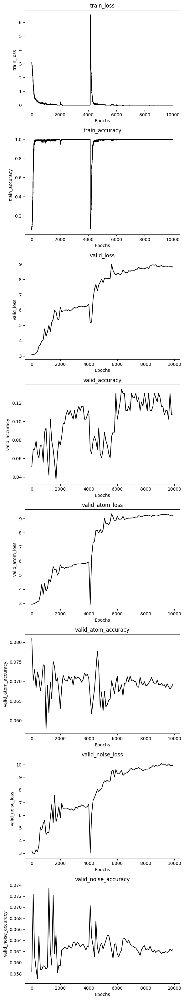

In [7]:
trainer.plot_training_metrics()

In [8]:
wandb.finish()

wandb: WARNING Ensure read and write access to run files dir: /scratch/home/yichen/Understanding-Experimental-Images-by-Identifying-Symmetries-with-Deep-Learning_root/notebooks/various_dataset_size/wandb/run-20240923_170854-09232024-FPN-dataset_v5_size-1k/files, control this via the WANDB_DIR env var. See https://docs.wandb.ai/guides/track/environment-variables


epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
records,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇████
train_accuracy,▁▇██▇▇▇█▇████████▆██████████████████████
train_loss,█▄▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
valid_accuracy,▂▃▃▄▅▁▃▁▄▅▆▆▆▇▇▆▆▄▄▃▃▄▃▅▆█▆▇▇█▆▇▆▆█▇▇▆▆▆
valid_atom_accuracy,█▆▅▆▁▆▅▆▃▅▅▅▄▄▅▆▄▄▆▆▃▅▆▃▅▅▆▆▅▄▆▅▅▅▅▅▄▅▄▇
valid_atom_loss,▁▁▁▂▂▃▄▄▄▄▄▄▄▄▄▄▁▆▇▆▇▇█▇▇███▇███████████
valid_loss,▁▁▂▂▂▃▄▄▅▄▄▄▅▅▅▅▅▅▆▇▇▇▇▇▇▇▇█████████████
valid_noise_accuracy,█▅▃▅▃▃▇▄▅▄▅▅▃▂▅▆▂▄▅▃▆▄▄▇▃▇▁▄▄▃▆▅▄▁▅▃▆▃▃▁
valid_noise_loss,▁▁▂▃▃▄▃▄▄▅▄▄▄▅▅▅▅▅▆▆▆▇▇▇▇▇▇▇███▇████████
epoch,10000


### 10K dataset

10711


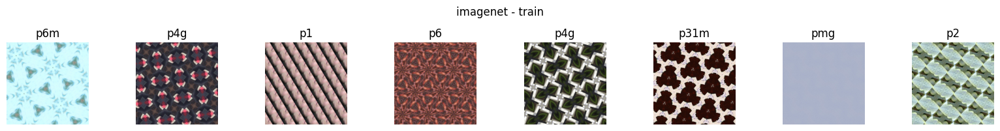

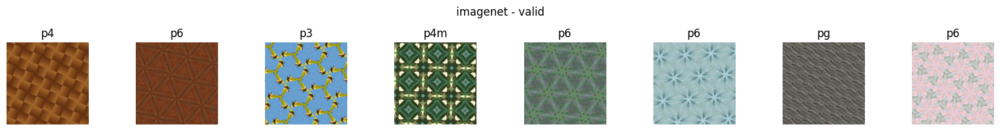

In [2]:
# imagenet
imagenet_ds = hdf5_dataset('../../datasets/imagenet_v5_rot_10m.h5', folder='train', transform=transforms.ToTensor())
_, imagenet_ds = split_train_valid(imagenet_ds, 0.999, seed=42)
print(len(imagenet_ds))
train_ds, valid_ds = split_train_valid(imagenet_ds, 0.8, seed=42)
train_dl = DataLoader(train_ds, batch_size=bs, shuffle=True, num_workers=n_cpus)
viz_dataloader(train_dl, label_converter=label_converter, title='imagenet - train')
valid_dl = DataLoader(valid_ds, batch_size=bs, shuffle=False, num_workers=n_cpus)
viz_dataloader(valid_dl, label_converter=label_converter, title='imagenet - valid')

In [3]:
model = fpn_resnet50_classification(in_channels=3, n_classes=17)
outputs = model(torch.randn(2,3,256,256))
print(outputs.shape)
model = torch.nn.DataParallel(model, device_ids=[3,5,6,8])
device = torch.device('cuda:3')
# model

/home/yichen/anaconda3/envs/symmetry/lib/python3.10/site-packages/torch/nn/functional.py:3769: UserWarning: nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.")


torch.Size([2, 17])


In [4]:
config = {'dataset': '10k datasets',
          'loss_func': 'CrossEntropyLoss', # nn.MSELoss()
          'optimizer': 'Adam',
          'scheduler': 'OneCycleLR'}
NAME = '09232024-FPN-dataset_v5_size-10k'
wandb.login()
proj_name = 'Understanding-Experimental-Images-by-Identifying-Symmetries-with-Deep-Learning'
wandb.init(project=proj_name, entity='yig319', name=NAME, id=NAME, group='dataset_v5_size_vs_records-FPN', save_code=True, config=config)
config = wandb.config

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: yig319. Use `wandb login --relogin` to force relogin


In [5]:
lr = 1e-3
per_epoch = 30
epoch_start = 0
epochs = 3000
loss_func = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, epochs=epochs, max_lr=lr, steps_per_epoch=len(train_dl))
metrics = [accuracy]  # You can add more metrics if needed
trainer = Trainer(model=model, loss_func=loss_func, optimizer=optimizer, metrics=metrics, scheduler=scheduler, 
                  device=device, save_per_epochs=per_epoch, model_path=f'../../saved_models/{NAME}/', early_stopping_patience=None)

history = trainer.train(train_dl=train_dl, epochs=epochs, epoch_start=epoch_start, valid_per_epochs=per_epoch,
                        valid_dl_list=[valid_dl, atom_dl, noise_dl], valid_dl_names=['', 'atom', 'noise'], tracking=True)

Epoch 1/3000


  0%|          | 0/4 [00:00<?, ?it/s]/home/yichen/anaconda3/envs/symmetry/lib/python3.10/site-packages/torch/nn/functional.py:3769: UserWarning: nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.")
100%|██████████| 4/4 [00:20<00:00,  5.20s/it]


train_loss: 3.0952, train_accuracy: 5.84%
Epoch 2/3000


100%|██████████| 4/4 [00:15<00:00,  3.92s/it]


train_loss: 3.0315, train_accuracy: 6.76%
Epoch 3/3000


100%|██████████| 4/4 [00:11<00:00,  2.88s/it]


train_loss: 3.0166, train_accuracy: 6.45%
Epoch 4/3000


100%|██████████| 4/4 [00:11<00:00,  2.85s/it]


train_loss: 2.9929, train_accuracy: 6.99%
Epoch 5/3000


100%|██████████| 4/4 [00:09<00:00,  2.49s/it]


train_loss: 2.9906, train_accuracy: 6.92%
Epoch 6/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 2.9771, train_accuracy: 6.49%
Epoch 7/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 2.9931, train_accuracy: 6.43%
Epoch 8/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 2.9674, train_accuracy: 6.76%
Epoch 9/3000


100%|██████████| 4/4 [00:10<00:00,  2.57s/it]


train_loss: 2.9588, train_accuracy: 6.63%
Epoch 10/3000


100%|██████████| 4/4 [00:09<00:00,  2.50s/it]


train_loss: 2.9542, train_accuracy: 7.29%
Epoch 11/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 2.9394, train_accuracy: 7.05%
Epoch 12/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 2.9444, train_accuracy: 7.07%
Epoch 13/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.9273, train_accuracy: 7.49%
Epoch 14/3000


100%|██████████| 4/4 [00:10<00:00,  2.67s/it]


train_loss: 2.9429, train_accuracy: 7.46%
Epoch 15/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 2.9333, train_accuracy: 7.53%
Epoch 16/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 2.9113, train_accuracy: 8.17%
Epoch 17/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.9187, train_accuracy: 7.43%
Epoch 18/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.9037, train_accuracy: 8.30%
Epoch 19/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 2.9063, train_accuracy: 8.24%
Epoch 20/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.8988, train_accuracy: 8.33%
Epoch 21/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 2.8902, train_accuracy: 8.22%
Epoch 22/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 2.8772, train_accuracy: 8.03%
Epoch 23/3000


100%|██████████| 4/4 [00:10<00:00,  2.65s/it]


train_loss: 2.8764, train_accuracy: 8.30%
Epoch 24/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 2.8752, train_accuracy: 8.77%
Epoch 25/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.8580, train_accuracy: 9.20%
Epoch 26/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.8588, train_accuracy: 9.02%
Epoch 27/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.8540, train_accuracy: 9.35%
Epoch 28/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 2.8390, train_accuracy: 10.18%
Epoch 29/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 2.8251, train_accuracy: 9.76%
Epoch 30/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 2.8135, train_accuracy: 10.32%


100%|██████████| 1/1 [00:04<00:00,  4.49s/it]


valid_loss: 2.8562, valid_accuracy: 7.93%


100%|██████████| 85/85 [01:41<00:00,  1.20s/it]


valid_atom_loss: 2.8652, valid_atom_accuracy: 8.69%


100%|██████████| 43/43 [00:54<00:00,  1.28s/it]


valid_noise_loss: 3.6349, valid_noise_accuracy: 6.35%
Model saved at epoch 30
Epoch 31/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 2.8052, train_accuracy: 10.68%
Epoch 32/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.8110, train_accuracy: 11.22%
Epoch 33/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 2.7906, train_accuracy: 11.41%
Epoch 34/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 2.7809, train_accuracy: 12.07%
Epoch 35/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 2.7808, train_accuracy: 11.61%
Epoch 36/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.7734, train_accuracy: 12.23%
Epoch 37/3000


100%|██████████| 4/4 [00:10<00:00,  2.57s/it]


train_loss: 2.7699, train_accuracy: 12.21%
Epoch 38/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 2.7603, train_accuracy: 12.51%
Epoch 39/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.7396, train_accuracy: 13.10%
Epoch 40/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 2.7131, train_accuracy: 13.91%
Epoch 41/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.7013, train_accuracy: 15.15%
Epoch 42/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 2.6806, train_accuracy: 15.09%
Epoch 43/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 2.6735, train_accuracy: 15.73%
Epoch 44/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 2.6477, train_accuracy: 16.20%
Epoch 45/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.5998, train_accuracy: 17.15%
Epoch 46/3000


100%|██████████| 4/4 [00:10<00:00,  2.64s/it]


train_loss: 2.5714, train_accuracy: 18.97%
Epoch 47/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 2.5485, train_accuracy: 18.81%
Epoch 48/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.5420, train_accuracy: 19.39%
Epoch 49/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 2.4897, train_accuracy: 21.14%
Epoch 50/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.4839, train_accuracy: 21.11%
Epoch 51/3000


100%|██████████| 4/4 [00:10<00:00,  2.51s/it]


train_loss: 2.4472, train_accuracy: 22.58%
Epoch 52/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.3892, train_accuracy: 24.29%
Epoch 53/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.3627, train_accuracy: 25.60%
Epoch 54/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 2.3308, train_accuracy: 26.09%
Epoch 55/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.2695, train_accuracy: 28.05%
Epoch 56/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.2415, train_accuracy: 29.05%
Epoch 57/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 2.1999, train_accuracy: 30.75%
Epoch 58/3000


100%|██████████| 4/4 [00:10<00:00,  2.70s/it]


train_loss: 2.1785, train_accuracy: 31.36%
Epoch 59/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.1292, train_accuracy: 33.43%
Epoch 60/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.0768, train_accuracy: 35.32%


100%|██████████| 1/1 [00:04<00:00,  4.50s/it]


valid_loss: 3.1211, valid_accuracy: 7.28%


100%|██████████| 85/85 [01:43<00:00,  1.22s/it]


valid_atom_loss: 3.2759, valid_atom_accuracy: 5.45%


100%|██████████| 43/43 [00:53<00:00,  1.24s/it]


valid_noise_loss: 2.9115, valid_noise_accuracy: 8.45%
Model saved at epoch 60
Epoch 61/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.0563, train_accuracy: 35.33%
Epoch 62/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 1.9883, train_accuracy: 38.34%
Epoch 63/3000


100%|██████████| 4/4 [00:10<00:00,  2.55s/it]


train_loss: 1.9275, train_accuracy: 41.44%
Epoch 64/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 1.9268, train_accuracy: 41.00%
Epoch 65/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 1.8644, train_accuracy: 43.93%
Epoch 66/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 1.8119, train_accuracy: 46.37%
Epoch 67/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 1.7991, train_accuracy: 46.80%
Epoch 68/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 1.7195, train_accuracy: 50.65%
Epoch 69/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 1.6740, train_accuracy: 53.12%
Epoch 70/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 1.6382, train_accuracy: 54.39%
Epoch 71/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 1.6066, train_accuracy: 55.59%
Epoch 72/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 1.5666, train_accuracy: 57.94%
Epoch 73/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 1.5085, train_accuracy: 60.62%
Epoch 74/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 1.4983, train_accuracy: 60.78%
Epoch 75/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 1.4403, train_accuracy: 63.73%
Epoch 76/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 1.3927, train_accuracy: 65.71%
Epoch 77/3000


100%|██████████| 4/4 [00:10<00:00,  2.51s/it]


train_loss: 1.3835, train_accuracy: 65.97%
Epoch 78/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 1.3156, train_accuracy: 69.37%
Epoch 79/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 1.2915, train_accuracy: 70.34%
Epoch 80/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 1.2406, train_accuracy: 73.82%
Epoch 81/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 1.2313, train_accuracy: 73.48%
Epoch 82/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 1.1903, train_accuracy: 75.56%
Epoch 83/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 1.1718, train_accuracy: 76.25%
Epoch 84/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 1.1283, train_accuracy: 77.51%
Epoch 85/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 1.0879, train_accuracy: 79.46%
Epoch 86/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 1.0776, train_accuracy: 79.31%
Epoch 87/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 1.0333, train_accuracy: 81.42%
Epoch 88/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.9921, train_accuracy: 82.49%
Epoch 89/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 0.9435, train_accuracy: 85.35%
Epoch 90/3000


100%|██████████| 4/4 [00:10<00:00,  2.71s/it]


train_loss: 0.9782, train_accuracy: 83.53%


100%|██████████| 1/1 [00:04<00:00,  4.48s/it]


valid_loss: 3.0964, valid_accuracy: 7.89%


100%|██████████| 85/85 [01:41<00:00,  1.19s/it]


valid_atom_loss: 3.2069, valid_atom_accuracy: 6.15%


100%|██████████| 43/43 [00:53<00:00,  1.23s/it]


valid_noise_loss: 2.8783, valid_noise_accuracy: 8.37%
Model saved at epoch 90
Epoch 91/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.8927, train_accuracy: 86.52%
Epoch 92/3000


100%|██████████| 4/4 [00:10<00:00,  2.57s/it]


train_loss: 0.8830, train_accuracy: 86.93%
Epoch 93/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.8584, train_accuracy: 87.79%
Epoch 94/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.7971, train_accuracy: 89.65%
Epoch 95/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.8173, train_accuracy: 88.96%
Epoch 96/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.7607, train_accuracy: 91.19%
Epoch 97/3000


100%|██████████| 4/4 [00:10<00:00,  2.65s/it]


train_loss: 0.7688, train_accuracy: 90.11%
Epoch 98/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.7678, train_accuracy: 89.73%
Epoch 99/3000


100%|██████████| 4/4 [00:10<00:00,  2.56s/it]


train_loss: 0.7144, train_accuracy: 91.78%
Epoch 100/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 0.7631, train_accuracy: 89.52%
Epoch 101/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.7157, train_accuracy: 91.22%
Epoch 102/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.6900, train_accuracy: 91.84%
Epoch 103/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.6597, train_accuracy: 92.97%
Epoch 104/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.6628, train_accuracy: 92.16%
Epoch 105/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.6921, train_accuracy: 90.94%
Epoch 106/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 0.6146, train_accuracy: 93.73%
Epoch 107/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.6257, train_accuracy: 93.11%
Epoch 108/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.6095, train_accuracy: 93.10%
Epoch 109/3000


100%|██████████| 4/4 [00:10<00:00,  2.68s/it]


train_loss: 0.5988, train_accuracy: 93.63%
Epoch 110/3000


100%|██████████| 4/4 [00:10<00:00,  2.69s/it]


train_loss: 0.5946, train_accuracy: 93.38%
Epoch 111/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.5622, train_accuracy: 94.39%
Epoch 112/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.5595, train_accuracy: 94.18%
Epoch 113/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.5394, train_accuracy: 94.60%
Epoch 114/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.5207, train_accuracy: 95.19%
Epoch 115/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.5364, train_accuracy: 94.15%
Epoch 116/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.5647, train_accuracy: 93.23%
Epoch 117/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.4961, train_accuracy: 95.13%
Epoch 118/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.5015, train_accuracy: 94.90%
Epoch 119/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 0.5284, train_accuracy: 93.97%
Epoch 120/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.5140, train_accuracy: 94.11%


100%|██████████| 1/1 [00:04<00:00,  4.71s/it]


valid_loss: 3.2072, valid_accuracy: 9.15%


100%|██████████| 85/85 [01:41<00:00,  1.19s/it]


valid_atom_loss: 3.3021, valid_atom_accuracy: 6.88%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 2.9986, valid_noise_accuracy: 6.55%
Model saved at epoch 120
Epoch 121/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.4570, train_accuracy: 95.80%
Epoch 122/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.4849, train_accuracy: 94.75%
Epoch 123/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 0.4530, train_accuracy: 95.61%
Epoch 124/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.4761, train_accuracy: 94.92%
Epoch 125/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.4545, train_accuracy: 95.37%
Epoch 126/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.4529, train_accuracy: 95.34%
Epoch 127/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.4365, train_accuracy: 95.76%
Epoch 128/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.4207, train_accuracy: 95.93%
Epoch 129/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.4040, train_accuracy: 96.14%
Epoch 130/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 0.4063, train_accuracy: 96.09%
Epoch 131/3000


100%|██████████| 4/4 [00:10<00:00,  2.52s/it]


train_loss: 0.3990, train_accuracy: 96.14%
Epoch 132/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.3814, train_accuracy: 96.58%
Epoch 133/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.3818, train_accuracy: 96.39%
Epoch 134/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.3858, train_accuracy: 96.04%
Epoch 135/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.3784, train_accuracy: 96.04%
Epoch 136/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.3730, train_accuracy: 96.30%
Epoch 137/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.3889, train_accuracy: 95.62%
Epoch 138/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.3801, train_accuracy: 95.82%
Epoch 139/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.3846, train_accuracy: 95.53%
Epoch 140/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 0.3723, train_accuracy: 95.86%
Epoch 141/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 0.3555, train_accuracy: 96.48%
Epoch 142/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.3570, train_accuracy: 96.39%
Epoch 143/3000


100%|██████████| 4/4 [00:10<00:00,  2.69s/it]


train_loss: 0.3850, train_accuracy: 95.19%
Epoch 144/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.3448, train_accuracy: 96.31%
Epoch 145/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.3621, train_accuracy: 95.70%
Epoch 146/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.3602, train_accuracy: 95.54%
Epoch 147/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.3967, train_accuracy: 94.47%
Epoch 148/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.3841, train_accuracy: 94.70%
Epoch 149/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.3487, train_accuracy: 95.76%
Epoch 150/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.3765, train_accuracy: 94.97%


100%|██████████| 1/1 [00:04<00:00,  4.05s/it]


valid_loss: 3.4318, valid_accuracy: 8.17%


100%|██████████| 85/85 [01:41<00:00,  1.19s/it]


valid_atom_loss: 3.3988, valid_atom_accuracy: 6.63%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 3.1250, valid_noise_accuracy: 6.66%
Model saved at epoch 150
Epoch 151/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.3563, train_accuracy: 95.37%
Epoch 152/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.3699, train_accuracy: 95.28%
Epoch 153/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.3452, train_accuracy: 95.34%
Epoch 154/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.3486, train_accuracy: 95.67%
Epoch 155/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.3448, train_accuracy: 95.20%
Epoch 156/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.3449, train_accuracy: 95.25%
Epoch 157/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.3552, train_accuracy: 94.83%
Epoch 158/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.3256, train_accuracy: 95.85%
Epoch 159/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.3512, train_accuracy: 94.82%
Epoch 160/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.3638, train_accuracy: 94.19%
Epoch 161/3000


100%|██████████| 4/4 [00:10<00:00,  2.70s/it]


train_loss: 0.3447, train_accuracy: 94.72%
Epoch 162/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.3487, train_accuracy: 94.90%
Epoch 163/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.3200, train_accuracy: 95.51%
Epoch 164/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.3400, train_accuracy: 94.82%
Epoch 165/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.3307, train_accuracy: 95.03%
Epoch 166/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.3261, train_accuracy: 95.12%
Epoch 167/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.3274, train_accuracy: 94.95%
Epoch 168/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.3394, train_accuracy: 94.78%
Epoch 169/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.3374, train_accuracy: 94.69%
Epoch 170/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.3173, train_accuracy: 94.84%
Epoch 171/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.3289, train_accuracy: 94.81%
Epoch 172/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.3033, train_accuracy: 95.40%
Epoch 173/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.3259, train_accuracy: 94.60%
Epoch 174/3000


100%|██████████| 4/4 [00:10<00:00,  2.64s/it]


train_loss: 0.3334, train_accuracy: 94.39%
Epoch 175/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.3065, train_accuracy: 95.06%
Epoch 176/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.3402, train_accuracy: 94.23%
Epoch 177/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.3094, train_accuracy: 94.95%
Epoch 178/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.3207, train_accuracy: 94.56%
Epoch 179/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.3331, train_accuracy: 94.08%
Epoch 180/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.3306, train_accuracy: 94.20%


100%|██████████| 1/1 [00:04<00:00,  4.49s/it]


valid_loss: 3.6804, valid_accuracy: 7.75%


100%|██████████| 85/85 [01:41<00:00,  1.19s/it]


valid_atom_loss: 3.8738, valid_atom_accuracy: 7.12%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 3.3553, valid_noise_accuracy: 6.17%
Model saved at epoch 180
Epoch 181/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.3162, train_accuracy: 94.61%
Epoch 182/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.3130, train_accuracy: 94.47%
Epoch 183/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.3331, train_accuracy: 93.99%
Epoch 184/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.3006, train_accuracy: 94.86%
Epoch 185/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.2963, train_accuracy: 95.05%
Epoch 186/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.3298, train_accuracy: 93.92%
Epoch 187/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.3209, train_accuracy: 94.23%
Epoch 188/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.3250, train_accuracy: 94.01%
Epoch 189/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.3320, train_accuracy: 93.73%
Epoch 190/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.3781, train_accuracy: 91.94%
Epoch 191/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.3533, train_accuracy: 93.04%
Epoch 192/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.3495, train_accuracy: 92.79%
Epoch 193/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.3397, train_accuracy: 93.27%
Epoch 194/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.3649, train_accuracy: 92.53%
Epoch 195/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.3506, train_accuracy: 92.80%
Epoch 196/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.3276, train_accuracy: 93.13%
Epoch 197/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.3282, train_accuracy: 93.43%
Epoch 198/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.3583, train_accuracy: 92.40%
Epoch 199/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.3101, train_accuracy: 93.83%
Epoch 200/3000


100%|██████████| 4/4 [00:10<00:00,  2.53s/it]


train_loss: 0.3412, train_accuracy: 92.73%
Epoch 201/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.3473, train_accuracy: 92.82%
Epoch 202/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 0.3270, train_accuracy: 93.28%
Epoch 203/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.3427, train_accuracy: 92.89%
Epoch 204/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.3124, train_accuracy: 93.67%
Epoch 205/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.3302, train_accuracy: 92.89%
Epoch 206/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.3023, train_accuracy: 94.01%
Epoch 207/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.3169, train_accuracy: 93.21%
Epoch 208/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.3172, train_accuracy: 93.27%
Epoch 209/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 0.2995, train_accuracy: 93.92%
Epoch 210/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.3023, train_accuracy: 93.55%


100%|██████████| 1/1 [00:04<00:00,  4.46s/it]


valid_loss: 3.8315, valid_accuracy: 9.10%


100%|██████████| 85/85 [01:43<00:00,  1.22s/it]


valid_atom_loss: 3.9503, valid_atom_accuracy: 7.60%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 3.3711, valid_noise_accuracy: 5.97%
Model saved at epoch 210
Epoch 211/3000


100%|██████████| 4/4 [00:10<00:00,  2.66s/it]


train_loss: 0.3086, train_accuracy: 93.36%
Epoch 212/3000


100%|██████████| 4/4 [00:10<00:00,  2.69s/it]


train_loss: 0.2880, train_accuracy: 93.94%
Epoch 213/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.2957, train_accuracy: 93.72%
Epoch 214/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.2926, train_accuracy: 93.97%
Epoch 215/3000


100%|██████████| 4/4 [00:09<00:00,  2.49s/it]


train_loss: 0.2922, train_accuracy: 94.04%
Epoch 216/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.3044, train_accuracy: 93.43%
Epoch 217/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.2834, train_accuracy: 94.02%
Epoch 218/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.2636, train_accuracy: 94.72%
Epoch 219/3000


100%|██████████| 4/4 [00:10<00:00,  2.56s/it]


train_loss: 0.2547, train_accuracy: 94.91%
Epoch 220/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.2622, train_accuracy: 94.78%
Epoch 221/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.2488, train_accuracy: 95.18%
Epoch 222/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.2479, train_accuracy: 95.05%
Epoch 223/3000


100%|██████████| 4/4 [00:10<00:00,  2.66s/it]


train_loss: 0.2296, train_accuracy: 95.53%
Epoch 224/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.2572, train_accuracy: 94.74%
Epoch 225/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.2392, train_accuracy: 95.17%
Epoch 226/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.2479, train_accuracy: 94.72%
Epoch 227/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 0.2329, train_accuracy: 95.17%
Epoch 228/3000


100%|██████████| 4/4 [00:10<00:00,  2.56s/it]


train_loss: 0.2631, train_accuracy: 94.51%
Epoch 229/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.2543, train_accuracy: 94.76%
Epoch 230/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.2429, train_accuracy: 94.90%
Epoch 231/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.2436, train_accuracy: 94.57%
Epoch 232/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.2607, train_accuracy: 94.67%
Epoch 233/3000


100%|██████████| 4/4 [00:10<00:00,  2.57s/it]


train_loss: 0.2708, train_accuracy: 94.01%
Epoch 234/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.2337, train_accuracy: 95.12%
Epoch 235/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.2571, train_accuracy: 94.47%
Epoch 236/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.2401, train_accuracy: 94.74%
Epoch 237/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.2401, train_accuracy: 94.96%
Epoch 238/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.2274, train_accuracy: 95.10%
Epoch 239/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.2296, train_accuracy: 95.07%
Epoch 240/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.2145, train_accuracy: 95.44%


100%|██████████| 1/1 [00:04<00:00,  4.46s/it]


valid_loss: 3.9158, valid_accuracy: 9.24%


100%|██████████| 85/85 [01:43<00:00,  1.22s/it]


valid_atom_loss: 4.0705, valid_atom_accuracy: 7.02%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 3.3373, valid_noise_accuracy: 6.01%
Model saved at epoch 240
Epoch 241/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.2101, train_accuracy: 95.55%
Epoch 242/3000


100%|██████████| 4/4 [00:10<00:00,  2.64s/it]


train_loss: 0.2086, train_accuracy: 95.49%
Epoch 243/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.2106, train_accuracy: 95.79%
Epoch 244/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.2166, train_accuracy: 95.21%
Epoch 245/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.2149, train_accuracy: 95.10%
Epoch 246/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.2254, train_accuracy: 95.11%
Epoch 247/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.2259, train_accuracy: 95.03%
Epoch 248/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.2295, train_accuracy: 94.70%
Epoch 249/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.2287, train_accuracy: 94.72%
Epoch 250/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.2338, train_accuracy: 94.82%
Epoch 251/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.2405, train_accuracy: 94.56%
Epoch 252/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.2195, train_accuracy: 95.14%
Epoch 253/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.2218, train_accuracy: 95.19%
Epoch 254/3000


100%|██████████| 4/4 [00:10<00:00,  2.71s/it]


train_loss: 0.2181, train_accuracy: 95.28%
Epoch 255/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.2256, train_accuracy: 94.91%
Epoch 256/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.2759, train_accuracy: 93.55%
Epoch 257/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.2334, train_accuracy: 94.54%
Epoch 258/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 0.2319, train_accuracy: 94.84%
Epoch 259/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.2446, train_accuracy: 94.29%
Epoch 260/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.2144, train_accuracy: 95.12%
Epoch 261/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.1960, train_accuracy: 95.54%
Epoch 262/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.2323, train_accuracy: 94.49%
Epoch 263/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.2080, train_accuracy: 95.24%
Epoch 264/3000


100%|██████████| 4/4 [00:09<00:00,  2.46s/it]


train_loss: 0.2020, train_accuracy: 95.47%
Epoch 265/3000


100%|██████████| 4/4 [00:10<00:00,  2.67s/it]


train_loss: 0.2076, train_accuracy: 95.37%
Epoch 266/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.1863, train_accuracy: 96.11%
Epoch 267/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.1736, train_accuracy: 96.18%
Epoch 268/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.1738, train_accuracy: 96.22%
Epoch 269/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.1726, train_accuracy: 96.44%
Epoch 270/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 0.1770, train_accuracy: 96.16%


100%|██████████| 1/1 [00:04<00:00,  4.43s/it]


valid_loss: 4.0153, valid_accuracy: 11.90%


100%|██████████| 85/85 [01:41<00:00,  1.19s/it]


valid_atom_loss: 4.0676, valid_atom_accuracy: 8.76%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 3.3272, valid_noise_accuracy: 6.74%
Model saved at epoch 270
Epoch 271/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 0.1680, train_accuracy: 96.39%
Epoch 272/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.1847, train_accuracy: 95.85%
Epoch 273/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.1850, train_accuracy: 95.96%
Epoch 274/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.1840, train_accuracy: 95.70%
Epoch 275/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 0.1609, train_accuracy: 96.38%
Epoch 276/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.1728, train_accuracy: 96.31%
Epoch 277/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.1928, train_accuracy: 95.48%
Epoch 278/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.1579, train_accuracy: 96.44%
Epoch 279/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.1669, train_accuracy: 96.23%
Epoch 280/3000


100%|██████████| 4/4 [00:10<00:00,  2.54s/it]


train_loss: 0.1703, train_accuracy: 96.04%
Epoch 281/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.1603, train_accuracy: 96.34%
Epoch 282/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.1450, train_accuracy: 96.93%
Epoch 283/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.1505, train_accuracy: 96.59%
Epoch 284/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.1467, train_accuracy: 96.66%
Epoch 285/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.1324, train_accuracy: 97.25%
Epoch 286/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.1354, train_accuracy: 97.09%
Epoch 287/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.1460, train_accuracy: 96.88%
Epoch 288/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.1377, train_accuracy: 97.11%
Epoch 289/3000


100%|██████████| 4/4 [00:10<00:00,  2.50s/it]


train_loss: 0.1390, train_accuracy: 97.01%
Epoch 290/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.1476, train_accuracy: 96.72%
Epoch 291/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.1423, train_accuracy: 96.88%
Epoch 292/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.1558, train_accuracy: 96.22%
Epoch 293/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.1501, train_accuracy: 96.81%
Epoch 294/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.1521, train_accuracy: 96.60%
Epoch 295/3000


100%|██████████| 4/4 [00:10<00:00,  2.64s/it]


train_loss: 0.1518, train_accuracy: 96.49%
Epoch 296/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.1537, train_accuracy: 96.29%
Epoch 297/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 0.1568, train_accuracy: 96.31%
Epoch 298/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.1559, train_accuracy: 96.36%
Epoch 299/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.1641, train_accuracy: 96.11%
Epoch 300/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.1527, train_accuracy: 96.57%


100%|██████████| 1/1 [00:04<00:00,  4.47s/it]


valid_loss: 4.0898, valid_accuracy: 12.60%


100%|██████████| 85/85 [01:43<00:00,  1.21s/it]


valid_atom_loss: 4.3712, valid_atom_accuracy: 8.25%


100%|██████████| 43/43 [00:53<00:00,  1.25s/it]


valid_noise_loss: 3.4509, valid_noise_accuracy: 6.05%
Model saved at epoch 300
Epoch 301/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.1549, train_accuracy: 96.36%
Epoch 302/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.1734, train_accuracy: 95.93%
Epoch 303/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.1650, train_accuracy: 96.14%
Epoch 304/3000


100%|██████████| 4/4 [00:10<00:00,  2.71s/it]


train_loss: 0.1794, train_accuracy: 95.54%
Epoch 305/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.1695, train_accuracy: 95.79%
Epoch 306/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.1864, train_accuracy: 95.66%
Epoch 307/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.1963, train_accuracy: 95.40%
Epoch 308/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.1969, train_accuracy: 95.39%
Epoch 309/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.1734, train_accuracy: 95.79%
Epoch 310/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.1847, train_accuracy: 95.67%
Epoch 311/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.1894, train_accuracy: 95.39%
Epoch 312/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.2177, train_accuracy: 94.62%
Epoch 313/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.2118, train_accuracy: 94.68%
Epoch 314/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.2240, train_accuracy: 94.28%
Epoch 315/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.1979, train_accuracy: 95.21%
Epoch 316/3000


100%|██████████| 4/4 [00:10<00:00,  2.70s/it]


train_loss: 0.2129, train_accuracy: 95.00%
Epoch 317/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.2042, train_accuracy: 94.63%
Epoch 318/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.2013, train_accuracy: 94.95%
Epoch 319/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.1877, train_accuracy: 95.33%
Epoch 320/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.1957, train_accuracy: 95.13%
Epoch 321/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.1667, train_accuracy: 95.89%
Epoch 322/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.1443, train_accuracy: 96.78%
Epoch 323/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.1563, train_accuracy: 96.32%
Epoch 324/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.1605, train_accuracy: 95.94%
Epoch 325/3000


100%|██████████| 4/4 [00:10<00:00,  2.64s/it]


train_loss: 0.1460, train_accuracy: 96.45%
Epoch 326/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.1344, train_accuracy: 96.86%
Epoch 327/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.1430, train_accuracy: 96.67%
Epoch 328/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 0.1373, train_accuracy: 96.78%
Epoch 329/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.1416, train_accuracy: 96.62%
Epoch 330/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.1255, train_accuracy: 97.18%


100%|██████████| 1/1 [00:04<00:00,  4.48s/it]


valid_loss: 3.7378, valid_accuracy: 19.65%


100%|██████████| 85/85 [01:43<00:00,  1.22s/it]


valid_atom_loss: 4.5601, valid_atom_accuracy: 11.52%


100%|██████████| 43/43 [00:53<00:00,  1.25s/it]


valid_noise_loss: 5.0962, valid_noise_accuracy: 7.33%
Model saved at epoch 330
Epoch 331/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.1363, train_accuracy: 96.83%
Epoch 332/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.1353, train_accuracy: 96.78%
Epoch 333/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.1282, train_accuracy: 96.73%
Epoch 334/3000


100%|██████████| 4/4 [00:10<00:00,  2.65s/it]


train_loss: 0.1326, train_accuracy: 96.73%
Epoch 335/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.1323, train_accuracy: 96.67%
Epoch 336/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 0.1331, train_accuracy: 96.71%
Epoch 337/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.1235, train_accuracy: 97.11%
Epoch 338/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.1175, train_accuracy: 97.33%
Epoch 339/3000


100%|██████████| 4/4 [00:10<00:00,  2.52s/it]


train_loss: 0.1215, train_accuracy: 97.22%
Epoch 340/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.1228, train_accuracy: 97.25%
Epoch 341/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 0.1158, train_accuracy: 97.42%
Epoch 342/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.1138, train_accuracy: 97.37%
Epoch 343/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.1031, train_accuracy: 97.42%
Epoch 344/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0967, train_accuracy: 97.64%
Epoch 345/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.1132, train_accuracy: 97.27%
Epoch 346/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.1000, train_accuracy: 97.72%
Epoch 347/3000


100%|██████████| 4/4 [00:10<00:00,  2.70s/it]


train_loss: 0.1000, train_accuracy: 97.82%
Epoch 348/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.1065, train_accuracy: 97.49%
Epoch 349/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0990, train_accuracy: 97.97%
Epoch 350/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.1117, train_accuracy: 97.20%
Epoch 351/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0943, train_accuracy: 97.89%
Epoch 352/3000


100%|██████████| 4/4 [00:10<00:00,  2.71s/it]


train_loss: 0.0946, train_accuracy: 97.79%
Epoch 353/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0847, train_accuracy: 98.14%
Epoch 354/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.1006, train_accuracy: 97.60%
Epoch 355/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 0.0884, train_accuracy: 97.95%
Epoch 356/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0989, train_accuracy: 97.68%
Epoch 357/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.1037, train_accuracy: 97.54%
Epoch 358/3000


100%|██████████| 4/4 [00:10<00:00,  2.68s/it]


train_loss: 0.0977, train_accuracy: 97.60%
Epoch 359/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0977, train_accuracy: 97.58%
Epoch 360/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 0.0948, train_accuracy: 97.62%


100%|██████████| 1/1 [00:04<00:00,  4.50s/it]


valid_loss: 3.9106, valid_accuracy: 22.59%


100%|██████████| 85/85 [01:41<00:00,  1.20s/it]


valid_atom_loss: 4.7865, valid_atom_accuracy: 15.65%


100%|██████████| 43/43 [00:53<00:00,  1.24s/it]


valid_noise_loss: 4.6809, valid_noise_accuracy: 9.14%
Model saved at epoch 360
Epoch 361/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0938, train_accuracy: 97.85%
Epoch 362/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0827, train_accuracy: 98.12%
Epoch 363/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0861, train_accuracy: 97.96%
Epoch 364/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0808, train_accuracy: 98.17%
Epoch 365/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0792, train_accuracy: 98.21%
Epoch 366/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0855, train_accuracy: 97.93%
Epoch 367/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0957, train_accuracy: 97.88%
Epoch 368/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0822, train_accuracy: 97.96%
Epoch 369/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0758, train_accuracy: 98.34%
Epoch 370/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0754, train_accuracy: 98.37%
Epoch 371/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0689, train_accuracy: 98.42%
Epoch 372/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0718, train_accuracy: 98.28%
Epoch 373/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0661, train_accuracy: 98.54%
Epoch 374/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0711, train_accuracy: 98.46%
Epoch 375/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0858, train_accuracy: 98.02%
Epoch 376/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0906, train_accuracy: 97.85%
Epoch 377/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.1041, train_accuracy: 97.30%
Epoch 378/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 0.0981, train_accuracy: 97.64%
Epoch 379/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0991, train_accuracy: 97.58%
Epoch 380/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 0.1022, train_accuracy: 97.50%
Epoch 381/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0969, train_accuracy: 97.69%
Epoch 382/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0880, train_accuracy: 97.95%
Epoch 383/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0946, train_accuracy: 97.65%
Epoch 384/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0824, train_accuracy: 98.06%
Epoch 385/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0743, train_accuracy: 98.23%
Epoch 386/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0857, train_accuracy: 98.10%
Epoch 387/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0874, train_accuracy: 97.86%
Epoch 388/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0787, train_accuracy: 98.14%
Epoch 389/3000


100%|██████████| 4/4 [00:10<00:00,  2.64s/it]


train_loss: 0.0806, train_accuracy: 98.00%
Epoch 390/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0734, train_accuracy: 98.39%


100%|██████████| 1/1 [00:04<00:00,  4.46s/it]


valid_loss: 3.6701, valid_accuracy: 28.04%


100%|██████████| 85/85 [01:44<00:00,  1.23s/it]


valid_atom_loss: 4.5825, valid_atom_accuracy: 17.22%


100%|██████████| 43/43 [00:54<00:00,  1.26s/it]


valid_noise_loss: 5.7616, valid_noise_accuracy: 8.36%
Model saved at epoch 390
Epoch 391/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0722, train_accuracy: 98.42%
Epoch 392/3000


100%|██████████| 4/4 [00:10<00:00,  2.54s/it]


train_loss: 0.0725, train_accuracy: 98.26%
Epoch 393/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0721, train_accuracy: 98.39%
Epoch 394/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0673, train_accuracy: 98.48%
Epoch 395/3000


100%|██████████| 4/4 [00:10<00:00,  2.68s/it]


train_loss: 0.0641, train_accuracy: 98.51%
Epoch 396/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0684, train_accuracy: 98.52%
Epoch 397/3000


100%|██████████| 4/4 [00:09<00:00,  2.49s/it]


train_loss: 0.0792, train_accuracy: 98.10%
Epoch 398/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0710, train_accuracy: 98.35%
Epoch 399/3000


100%|██████████| 4/4 [00:10<00:00,  2.68s/it]


train_loss: 0.0945, train_accuracy: 97.69%
Epoch 400/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.1016, train_accuracy: 97.55%
Epoch 401/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0888, train_accuracy: 97.86%
Epoch 402/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0799, train_accuracy: 97.92%
Epoch 403/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 0.0845, train_accuracy: 98.10%
Epoch 404/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0824, train_accuracy: 97.97%
Epoch 405/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0796, train_accuracy: 97.98%
Epoch 406/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0844, train_accuracy: 97.85%
Epoch 407/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0713, train_accuracy: 98.17%
Epoch 408/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0783, train_accuracy: 98.03%
Epoch 409/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 0.0802, train_accuracy: 97.99%
Epoch 410/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0825, train_accuracy: 97.97%
Epoch 411/3000


100%|██████████| 4/4 [00:10<00:00,  2.70s/it]


train_loss: 0.0724, train_accuracy: 98.21%
Epoch 412/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0896, train_accuracy: 97.85%
Epoch 413/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.1015, train_accuracy: 97.26%
Epoch 414/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0865, train_accuracy: 97.67%
Epoch 415/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0817, train_accuracy: 97.92%
Epoch 416/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0774, train_accuracy: 98.09%
Epoch 417/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0644, train_accuracy: 98.38%
Epoch 418/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0614, train_accuracy: 98.53%
Epoch 419/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0646, train_accuracy: 98.62%
Epoch 420/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 0.0556, train_accuracy: 98.79%


100%|██████████| 1/1 [00:04<00:00,  4.47s/it]


valid_loss: 3.4303, valid_accuracy: 30.94%


100%|██████████| 85/85 [01:40<00:00,  1.19s/it]


valid_atom_loss: 4.1234, valid_atom_accuracy: 21.68%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 4.7735, valid_noise_accuracy: 9.06%
Model saved at epoch 420
Epoch 421/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0471, train_accuracy: 98.95%
Epoch 422/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0486, train_accuracy: 98.87%
Epoch 423/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0418, train_accuracy: 99.11%
Epoch 424/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0444, train_accuracy: 98.95%
Epoch 425/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0475, train_accuracy: 99.02%
Epoch 426/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0406, train_accuracy: 99.15%
Epoch 427/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0421, train_accuracy: 99.08%
Epoch 428/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0398, train_accuracy: 99.11%
Epoch 429/3000


100%|██████████| 4/4 [00:10<00:00,  2.68s/it]


train_loss: 0.0449, train_accuracy: 99.01%
Epoch 430/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0524, train_accuracy: 98.83%
Epoch 431/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0579, train_accuracy: 98.63%
Epoch 432/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 0.0458, train_accuracy: 99.02%
Epoch 433/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0489, train_accuracy: 98.82%
Epoch 434/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0445, train_accuracy: 98.96%
Epoch 435/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0385, train_accuracy: 99.12%
Epoch 436/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0452, train_accuracy: 98.89%
Epoch 437/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0474, train_accuracy: 99.02%
Epoch 438/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0454, train_accuracy: 98.86%
Epoch 439/3000


100%|██████████| 4/4 [00:10<00:00,  2.54s/it]


train_loss: 0.0506, train_accuracy: 98.83%
Epoch 440/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0535, train_accuracy: 98.81%
Epoch 441/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 0.0481, train_accuracy: 99.00%
Epoch 442/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0476, train_accuracy: 98.84%
Epoch 443/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0418, train_accuracy: 99.08%
Epoch 444/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0353, train_accuracy: 99.31%
Epoch 445/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0395, train_accuracy: 99.11%
Epoch 446/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0441, train_accuracy: 99.04%
Epoch 447/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0386, train_accuracy: 99.10%
Epoch 448/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0460, train_accuracy: 98.84%
Epoch 449/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0565, train_accuracy: 98.56%
Epoch 450/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0589, train_accuracy: 98.41%


100%|██████████| 1/1 [00:04<00:00,  4.69s/it]


valid_loss: 3.6776, valid_accuracy: 31.31%


100%|██████████| 85/85 [01:43<00:00,  1.22s/it]


valid_atom_loss: 4.5540, valid_atom_accuracy: 22.27%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 5.5520, valid_noise_accuracy: 8.32%
Model saved at epoch 450
Epoch 451/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0645, train_accuracy: 98.45%
Epoch 452/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0616, train_accuracy: 98.35%
Epoch 453/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0557, train_accuracy: 98.58%
Epoch 454/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0494, train_accuracy: 98.94%
Epoch 455/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0582, train_accuracy: 98.51%
Epoch 456/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0526, train_accuracy: 98.62%
Epoch 457/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0572, train_accuracy: 98.51%
Epoch 458/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0484, train_accuracy: 98.80%
Epoch 459/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0564, train_accuracy: 98.66%
Epoch 460/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0516, train_accuracy: 98.74%
Epoch 461/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0421, train_accuracy: 98.96%
Epoch 462/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0489, train_accuracy: 98.76%
Epoch 463/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0507, train_accuracy: 98.81%
Epoch 464/3000


100%|██████████| 4/4 [00:09<00:00,  2.49s/it]


train_loss: 0.0497, train_accuracy: 98.75%
Epoch 465/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0491, train_accuracy: 98.65%
Epoch 466/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0539, train_accuracy: 98.53%
Epoch 467/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0544, train_accuracy: 98.56%
Epoch 468/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0628, train_accuracy: 98.42%
Epoch 469/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0764, train_accuracy: 97.96%
Epoch 470/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0693, train_accuracy: 98.07%
Epoch 471/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0754, train_accuracy: 98.04%
Epoch 472/3000


100%|██████████| 4/4 [00:10<00:00,  2.70s/it]


train_loss: 0.0619, train_accuracy: 98.27%
Epoch 473/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0682, train_accuracy: 98.16%
Epoch 474/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0668, train_accuracy: 98.38%
Epoch 475/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0623, train_accuracy: 98.33%
Epoch 476/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0633, train_accuracy: 98.35%
Epoch 477/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0524, train_accuracy: 98.81%
Epoch 478/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0538, train_accuracy: 98.60%
Epoch 479/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0519, train_accuracy: 98.60%
Epoch 480/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0415, train_accuracy: 99.05%


100%|██████████| 1/1 [00:04<00:00,  4.47s/it]


valid_loss: 3.4399, valid_accuracy: 37.38%


100%|██████████| 85/85 [01:43<00:00,  1.22s/it]


valid_atom_loss: 4.6446, valid_atom_accuracy: 23.94%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 5.8982, valid_noise_accuracy: 11.44%
Model saved at epoch 480
Epoch 481/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0458, train_accuracy: 98.86%
Epoch 482/3000


100%|██████████| 4/4 [00:10<00:00,  2.65s/it]


train_loss: 0.0474, train_accuracy: 98.93%
Epoch 483/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0449, train_accuracy: 98.89%
Epoch 484/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0371, train_accuracy: 99.15%
Epoch 485/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0434, train_accuracy: 98.94%
Epoch 486/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0554, train_accuracy: 98.53%
Epoch 487/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0564, train_accuracy: 98.51%
Epoch 488/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0501, train_accuracy: 98.68%
Epoch 489/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0518, train_accuracy: 98.62%
Epoch 490/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0487, train_accuracy: 98.74%
Epoch 491/3000


100%|██████████| 4/4 [00:09<00:00,  2.46s/it]


train_loss: 0.0484, train_accuracy: 98.76%
Epoch 492/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0462, train_accuracy: 98.86%
Epoch 493/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0460, train_accuracy: 98.83%
Epoch 494/3000


100%|██████████| 4/4 [00:10<00:00,  2.68s/it]


train_loss: 0.0475, train_accuracy: 98.84%
Epoch 495/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 0.0506, train_accuracy: 98.63%
Epoch 496/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0499, train_accuracy: 98.73%
Epoch 497/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 0.0594, train_accuracy: 98.38%
Epoch 498/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0564, train_accuracy: 98.63%
Epoch 499/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0523, train_accuracy: 98.60%
Epoch 500/3000


100%|██████████| 4/4 [00:10<00:00,  2.54s/it]


train_loss: 0.0446, train_accuracy: 98.98%
Epoch 501/3000


100%|██████████| 4/4 [00:10<00:00,  2.71s/it]


train_loss: 0.0481, train_accuracy: 98.80%
Epoch 502/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0383, train_accuracy: 99.08%
Epoch 503/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0380, train_accuracy: 99.10%
Epoch 504/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0335, train_accuracy: 99.23%
Epoch 505/3000


100%|██████████| 4/4 [00:10<00:00,  2.67s/it]


train_loss: 0.0329, train_accuracy: 99.15%
Epoch 506/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0382, train_accuracy: 99.04%
Epoch 507/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 0.0418, train_accuracy: 99.01%
Epoch 508/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0470, train_accuracy: 98.79%
Epoch 509/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0413, train_accuracy: 98.74%
Epoch 510/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0402, train_accuracy: 98.96%


100%|██████████| 1/1 [00:04<00:00,  4.45s/it]


valid_loss: 3.7298, valid_accuracy: 36.26%


100%|██████████| 85/85 [01:43<00:00,  1.22s/it]


valid_atom_loss: 4.1826, valid_atom_accuracy: 27.32%


100%|██████████| 43/43 [00:54<00:00,  1.26s/it]


valid_noise_loss: 5.7979, valid_noise_accuracy: 9.32%
Model saved at epoch 510
Epoch 511/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0443, train_accuracy: 98.86%
Epoch 512/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0462, train_accuracy: 98.88%
Epoch 513/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0458, train_accuracy: 98.93%
Epoch 514/3000


100%|██████████| 4/4 [00:09<00:00,  2.50s/it]


train_loss: 0.0414, train_accuracy: 98.93%
Epoch 515/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0420, train_accuracy: 98.94%
Epoch 516/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0446, train_accuracy: 98.89%
Epoch 517/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0448, train_accuracy: 98.84%
Epoch 518/3000


100%|██████████| 4/4 [00:10<00:00,  2.57s/it]


train_loss: 0.0423, train_accuracy: 98.94%
Epoch 519/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0498, train_accuracy: 98.68%
Epoch 520/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0597, train_accuracy: 98.46%
Epoch 521/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0547, train_accuracy: 98.51%
Epoch 522/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0492, train_accuracy: 98.62%
Epoch 523/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0506, train_accuracy: 98.52%
Epoch 524/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0602, train_accuracy: 98.28%
Epoch 525/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0464, train_accuracy: 98.83%
Epoch 526/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0564, train_accuracy: 98.55%
Epoch 527/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0620, train_accuracy: 98.30%
Epoch 528/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0587, train_accuracy: 98.39%
Epoch 529/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0523, train_accuracy: 98.56%
Epoch 530/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0565, train_accuracy: 98.58%
Epoch 531/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0494, train_accuracy: 98.66%
Epoch 532/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0528, train_accuracy: 98.52%
Epoch 533/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0576, train_accuracy: 98.46%
Epoch 534/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0493, train_accuracy: 98.62%
Epoch 535/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 0.0490, train_accuracy: 98.70%
Epoch 536/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0456, train_accuracy: 98.75%
Epoch 537/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0606, train_accuracy: 98.33%
Epoch 538/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0636, train_accuracy: 98.31%
Epoch 539/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0646, train_accuracy: 98.11%
Epoch 540/3000


100%|██████████| 4/4 [00:10<00:00,  2.55s/it]


train_loss: 0.0571, train_accuracy: 98.45%


100%|██████████| 1/1 [00:04<00:00,  4.50s/it]


valid_loss: 3.3998, valid_accuracy: 38.17%


100%|██████████| 85/85 [01:41<00:00,  1.19s/it]


valid_atom_loss: 3.9436, valid_atom_accuracy: 31.15%


100%|██████████| 43/43 [00:54<00:00,  1.26s/it]


valid_noise_loss: 5.0066, valid_noise_accuracy: 9.41%
Model saved at epoch 540
Epoch 541/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0508, train_accuracy: 98.74%
Epoch 542/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0458, train_accuracy: 98.79%
Epoch 543/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0419, train_accuracy: 98.90%
Epoch 544/3000


100%|██████████| 4/4 [00:10<00:00,  2.70s/it]


train_loss: 0.0435, train_accuracy: 98.83%
Epoch 545/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0486, train_accuracy: 98.76%
Epoch 546/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 0.0505, train_accuracy: 98.56%
Epoch 547/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0510, train_accuracy: 98.77%
Epoch 548/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0440, train_accuracy: 98.72%
Epoch 549/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0514, train_accuracy: 98.60%
Epoch 550/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0560, train_accuracy: 98.60%
Epoch 551/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0407, train_accuracy: 99.02%
Epoch 552/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0342, train_accuracy: 99.12%
Epoch 553/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0320, train_accuracy: 99.37%
Epoch 554/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0341, train_accuracy: 99.14%
Epoch 555/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0374, train_accuracy: 99.10%
Epoch 556/3000


100%|██████████| 4/4 [00:10<00:00,  2.57s/it]


train_loss: 0.0458, train_accuracy: 98.87%
Epoch 557/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0443, train_accuracy: 98.83%
Epoch 558/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0435, train_accuracy: 98.79%
Epoch 559/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0383, train_accuracy: 98.94%
Epoch 560/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0323, train_accuracy: 99.09%
Epoch 561/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0347, train_accuracy: 99.17%
Epoch 562/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0264, train_accuracy: 99.42%
Epoch 563/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 0.0382, train_accuracy: 98.94%
Epoch 564/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0316, train_accuracy: 99.14%
Epoch 565/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 0.0330, train_accuracy: 99.17%
Epoch 566/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0320, train_accuracy: 99.19%
Epoch 567/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0312, train_accuracy: 99.11%
Epoch 568/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0347, train_accuracy: 99.12%
Epoch 569/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0382, train_accuracy: 98.98%
Epoch 570/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0353, train_accuracy: 99.05%


100%|██████████| 1/1 [00:04<00:00,  4.48s/it]


valid_loss: 3.6668, valid_accuracy: 37.47%


100%|██████████| 85/85 [01:41<00:00,  1.19s/it]


valid_atom_loss: 4.6919, valid_atom_accuracy: 26.84%


100%|██████████| 43/43 [00:54<00:00,  1.28s/it]


valid_noise_loss: 5.2489, valid_noise_accuracy: 12.52%
Model saved at epoch 570
Epoch 571/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0317, train_accuracy: 99.10%
Epoch 572/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0313, train_accuracy: 99.17%
Epoch 573/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0295, train_accuracy: 99.22%
Epoch 574/3000


100%|██████████| 4/4 [00:10<00:00,  2.64s/it]


train_loss: 0.0308, train_accuracy: 99.15%
Epoch 575/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0272, train_accuracy: 99.23%
Epoch 576/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0363, train_accuracy: 99.02%
Epoch 577/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0300, train_accuracy: 99.22%
Epoch 578/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0329, train_accuracy: 99.16%
Epoch 579/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0424, train_accuracy: 98.95%
Epoch 580/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0470, train_accuracy: 98.81%
Epoch 581/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0493, train_accuracy: 98.61%
Epoch 582/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0365, train_accuracy: 98.95%
Epoch 583/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0375, train_accuracy: 99.02%
Epoch 584/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0338, train_accuracy: 99.14%
Epoch 585/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0280, train_accuracy: 99.31%
Epoch 586/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0254, train_accuracy: 99.24%
Epoch 587/3000


100%|██████████| 4/4 [00:10<00:00,  2.70s/it]


train_loss: 0.0240, train_accuracy: 99.30%
Epoch 588/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0248, train_accuracy: 99.36%
Epoch 589/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0282, train_accuracy: 99.32%
Epoch 590/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0282, train_accuracy: 99.25%
Epoch 591/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0296, train_accuracy: 99.25%
Epoch 592/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0221, train_accuracy: 99.39%
Epoch 593/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 0.0243, train_accuracy: 99.38%
Epoch 594/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0198, train_accuracy: 99.44%
Epoch 595/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0216, train_accuracy: 99.56%
Epoch 596/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0193, train_accuracy: 99.50%
Epoch 597/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0251, train_accuracy: 99.30%
Epoch 598/3000


100%|██████████| 4/4 [00:10<00:00,  2.67s/it]


train_loss: 0.0245, train_accuracy: 99.45%
Epoch 599/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0212, train_accuracy: 99.49%
Epoch 600/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0190, train_accuracy: 99.46%


100%|██████████| 1/1 [00:04<00:00,  4.47s/it]


valid_loss: 3.4938, valid_accuracy: 41.48%


100%|██████████| 85/85 [01:41<00:00,  1.19s/it]


valid_atom_loss: 4.1049, valid_atom_accuracy: 30.08%


100%|██████████| 43/43 [00:53<00:00,  1.24s/it]


valid_noise_loss: 5.9105, valid_noise_accuracy: 9.04%
Model saved at epoch 600
Epoch 601/3000


100%|██████████| 4/4 [00:10<00:00,  2.51s/it]


train_loss: 0.0148, train_accuracy: 99.74%
Epoch 602/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0131, train_accuracy: 99.73%
Epoch 603/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0134, train_accuracy: 99.66%
Epoch 604/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0169, train_accuracy: 99.59%
Epoch 605/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0137, train_accuracy: 99.71%
Epoch 606/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 0.0125, train_accuracy: 99.71%
Epoch 607/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0143, train_accuracy: 99.59%
Epoch 608/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0145, train_accuracy: 99.64%
Epoch 609/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0168, train_accuracy: 99.59%
Epoch 610/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0183, train_accuracy: 99.60%
Epoch 611/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0244, train_accuracy: 99.36%
Epoch 612/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0211, train_accuracy: 99.47%
Epoch 613/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0235, train_accuracy: 99.30%
Epoch 614/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0270, train_accuracy: 99.26%
Epoch 615/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0249, train_accuracy: 99.29%
Epoch 616/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0318, train_accuracy: 99.08%
Epoch 617/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 0.0292, train_accuracy: 99.18%
Epoch 618/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0392, train_accuracy: 98.98%
Epoch 619/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0462, train_accuracy: 98.69%
Epoch 620/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0523, train_accuracy: 98.45%
Epoch 621/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0365, train_accuracy: 98.97%
Epoch 622/3000


100%|██████████| 4/4 [00:09<00:00,  2.46s/it]


train_loss: 0.0363, train_accuracy: 98.97%
Epoch 623/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0368, train_accuracy: 98.93%
Epoch 624/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0308, train_accuracy: 99.12%
Epoch 625/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0399, train_accuracy: 98.88%
Epoch 626/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0367, train_accuracy: 98.98%
Epoch 627/3000


100%|██████████| 4/4 [00:10<00:00,  2.57s/it]


train_loss: 0.0385, train_accuracy: 98.94%
Epoch 628/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0479, train_accuracy: 98.74%
Epoch 629/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 0.0509, train_accuracy: 98.47%
Epoch 630/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0528, train_accuracy: 98.56%


100%|██████████| 1/1 [00:04<00:00,  4.45s/it]


valid_loss: 3.3889, valid_accuracy: 40.27%


100%|██████████| 85/85 [01:43<00:00,  1.22s/it]


valid_atom_loss: 4.4903, valid_atom_accuracy: 27.42%


100%|██████████| 43/43 [00:54<00:00,  1.26s/it]


valid_noise_loss: 5.3720, valid_noise_accuracy: 10.19%
Model saved at epoch 630
Epoch 631/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 0.0539, train_accuracy: 98.66%
Epoch 632/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0585, train_accuracy: 98.38%
Epoch 633/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0586, train_accuracy: 98.38%
Epoch 634/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 0.0649, train_accuracy: 98.26%
Epoch 635/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0491, train_accuracy: 98.63%
Epoch 636/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0443, train_accuracy: 98.87%
Epoch 637/3000


100%|██████████| 4/4 [00:10<00:00,  2.69s/it]


train_loss: 0.0361, train_accuracy: 99.16%
Epoch 638/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0338, train_accuracy: 98.94%
Epoch 639/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0339, train_accuracy: 98.97%
Epoch 640/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0273, train_accuracy: 99.33%
Epoch 641/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0233, train_accuracy: 99.39%
Epoch 642/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0209, train_accuracy: 99.46%
Epoch 643/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 0.0195, train_accuracy: 99.44%
Epoch 644/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0195, train_accuracy: 99.46%
Epoch 645/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0170, train_accuracy: 99.61%
Epoch 646/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 0.0154, train_accuracy: 99.68%
Epoch 647/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0141, train_accuracy: 99.65%
Epoch 648/3000


100%|██████████| 4/4 [00:09<00:00,  2.46s/it]


train_loss: 0.0107, train_accuracy: 99.74%
Epoch 649/3000


100%|██████████| 4/4 [00:10<00:00,  2.69s/it]


train_loss: 0.0090, train_accuracy: 99.81%
Epoch 650/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0089, train_accuracy: 99.82%
Epoch 651/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0086, train_accuracy: 99.84%
Epoch 652/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 0.0066, train_accuracy: 99.89%
Epoch 653/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0060, train_accuracy: 99.92%
Epoch 654/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0067, train_accuracy: 99.85%
Epoch 655/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0054, train_accuracy: 99.89%
Epoch 656/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0060, train_accuracy: 99.91%
Epoch 657/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0078, train_accuracy: 99.81%
Epoch 658/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0059, train_accuracy: 99.87%
Epoch 659/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0069, train_accuracy: 99.89%
Epoch 660/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0070, train_accuracy: 99.87%


100%|██████████| 1/1 [00:04<00:00,  4.43s/it]


valid_loss: 3.3379, valid_accuracy: 43.86%


100%|██████████| 85/85 [01:43<00:00,  1.22s/it]


valid_atom_loss: 4.5619, valid_atom_accuracy: 30.51%


100%|██████████| 43/43 [00:53<00:00,  1.25s/it]


valid_noise_loss: 5.3994, valid_noise_accuracy: 10.71%
Model saved at epoch 660
Epoch 661/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0059, train_accuracy: 99.86%
Epoch 662/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0052, train_accuracy: 99.89%
Epoch 663/3000


100%|██████████| 4/4 [00:10<00:00,  2.54s/it]


train_loss: 0.0151, train_accuracy: 99.65%
Epoch 664/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0186, train_accuracy: 99.57%
Epoch 665/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 0.0213, train_accuracy: 99.44%
Epoch 666/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0210, train_accuracy: 99.43%
Epoch 667/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0266, train_accuracy: 99.26%
Epoch 668/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0288, train_accuracy: 99.29%
Epoch 669/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0248, train_accuracy: 99.30%
Epoch 670/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0258, train_accuracy: 99.29%
Epoch 671/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0309, train_accuracy: 99.19%
Epoch 672/3000


100%|██████████| 4/4 [00:10<00:00,  2.64s/it]


train_loss: 0.0323, train_accuracy: 99.05%
Epoch 673/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0377, train_accuracy: 98.98%
Epoch 674/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0380, train_accuracy: 98.82%
Epoch 675/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0477, train_accuracy: 98.80%
Epoch 676/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0532, train_accuracy: 98.56%
Epoch 677/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0542, train_accuracy: 98.49%
Epoch 678/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0585, train_accuracy: 98.31%
Epoch 679/3000


100%|██████████| 4/4 [00:10<00:00,  2.57s/it]


train_loss: 0.0644, train_accuracy: 98.24%
Epoch 680/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0653, train_accuracy: 98.19%
Epoch 681/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 0.0545, train_accuracy: 98.38%
Epoch 682/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0608, train_accuracy: 98.33%
Epoch 683/3000


100%|██████████| 4/4 [00:10<00:00,  2.55s/it]


train_loss: 0.0484, train_accuracy: 98.68%
Epoch 684/3000


100%|██████████| 4/4 [00:10<00:00,  2.69s/it]


train_loss: 0.0525, train_accuracy: 98.63%
Epoch 685/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0384, train_accuracy: 98.91%
Epoch 686/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0316, train_accuracy: 99.09%
Epoch 687/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0299, train_accuracy: 99.16%
Epoch 688/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0334, train_accuracy: 99.04%
Epoch 689/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 0.0810, train_accuracy: 98.09%
Epoch 690/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0956, train_accuracy: 97.28%


100%|██████████| 1/1 [00:04<00:00,  4.45s/it]


valid_loss: 8.5327, valid_accuracy: 19.74%


100%|██████████| 85/85 [01:44<00:00,  1.23s/it]


valid_atom_loss: 10.4587, valid_atom_accuracy: 13.47%


100%|██████████| 43/43 [00:54<00:00,  1.27s/it]


valid_noise_loss: 13.4468, valid_noise_accuracy: 6.30%
Model saved at epoch 690
Epoch 691/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0504, train_accuracy: 98.56%
Epoch 692/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0372, train_accuracy: 99.09%
Epoch 693/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0394, train_accuracy: 99.09%
Epoch 694/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0306, train_accuracy: 99.35%
Epoch 695/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0234, train_accuracy: 99.50%
Epoch 696/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0183, train_accuracy: 99.58%
Epoch 697/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0147, train_accuracy: 99.68%
Epoch 698/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0152, train_accuracy: 99.63%
Epoch 699/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0123, train_accuracy: 99.65%
Epoch 700/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0116, train_accuracy: 99.72%
Epoch 701/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0117, train_accuracy: 99.77%
Epoch 702/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0140, train_accuracy: 99.64%
Epoch 703/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0124, train_accuracy: 99.70%
Epoch 704/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0106, train_accuracy: 99.78%
Epoch 705/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0223, train_accuracy: 99.44%
Epoch 706/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0187, train_accuracy: 99.47%
Epoch 707/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0221, train_accuracy: 99.42%
Epoch 708/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0283, train_accuracy: 99.26%
Epoch 709/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0249, train_accuracy: 99.33%
Epoch 710/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0331, train_accuracy: 99.08%
Epoch 711/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0229, train_accuracy: 99.40%
Epoch 712/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0248, train_accuracy: 99.32%
Epoch 713/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0205, train_accuracy: 99.49%
Epoch 714/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0267, train_accuracy: 99.35%
Epoch 715/3000


100%|██████████| 4/4 [00:10<00:00,  2.69s/it]


train_loss: 0.0288, train_accuracy: 99.18%
Epoch 716/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0277, train_accuracy: 99.25%
Epoch 717/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0211, train_accuracy: 99.38%
Epoch 718/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0171, train_accuracy: 99.54%
Epoch 719/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0172, train_accuracy: 99.46%
Epoch 720/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0152, train_accuracy: 99.66%


100%|██████████| 1/1 [00:04<00:00,  4.47s/it]


valid_loss: 3.5061, valid_accuracy: 42.60%


100%|██████████| 85/85 [01:41<00:00,  1.19s/it]


valid_atom_loss: 4.4705, valid_atom_accuracy: 31.59%


100%|██████████| 43/43 [00:54<00:00,  1.26s/it]


valid_noise_loss: 5.4481, valid_noise_accuracy: 11.24%
Model saved at epoch 720
Epoch 721/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0132, train_accuracy: 99.66%
Epoch 722/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0102, train_accuracy: 99.81%
Epoch 723/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0107, train_accuracy: 99.73%
Epoch 724/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0113, train_accuracy: 99.70%
Epoch 725/3000


100%|██████████| 4/4 [00:11<00:00,  2.75s/it]


train_loss: 0.0129, train_accuracy: 99.70%
Epoch 726/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0136, train_accuracy: 99.63%
Epoch 727/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0120, train_accuracy: 99.68%
Epoch 728/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0100, train_accuracy: 99.78%
Epoch 729/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0124, train_accuracy: 99.68%
Epoch 730/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0091, train_accuracy: 99.82%
Epoch 731/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0095, train_accuracy: 99.79%
Epoch 732/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0098, train_accuracy: 99.79%
Epoch 733/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 0.0110, train_accuracy: 99.78%
Epoch 734/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0107, train_accuracy: 99.74%
Epoch 735/3000


100%|██████████| 4/4 [00:10<00:00,  2.67s/it]


train_loss: 0.0089, train_accuracy: 99.73%
Epoch 736/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0119, train_accuracy: 99.71%
Epoch 737/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0154, train_accuracy: 99.56%
Epoch 738/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0310, train_accuracy: 99.25%
Epoch 739/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0239, train_accuracy: 99.31%
Epoch 740/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0273, train_accuracy: 99.25%
Epoch 741/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0255, train_accuracy: 99.36%
Epoch 742/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0209, train_accuracy: 99.32%
Epoch 743/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0307, train_accuracy: 99.30%
Epoch 744/3000


100%|██████████| 4/4 [00:10<00:00,  2.65s/it]


train_loss: 0.0246, train_accuracy: 99.23%
Epoch 745/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0265, train_accuracy: 99.35%
Epoch 746/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0296, train_accuracy: 99.31%
Epoch 747/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0218, train_accuracy: 99.40%
Epoch 748/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0248, train_accuracy: 99.36%
Epoch 749/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0316, train_accuracy: 99.16%
Epoch 750/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0335, train_accuracy: 99.01%


100%|██████████| 1/1 [00:04<00:00,  4.45s/it]


valid_loss: 3.5360, valid_accuracy: 45.78%


100%|██████████| 85/85 [01:44<00:00,  1.23s/it]


valid_atom_loss: 4.1761, valid_atom_accuracy: 38.28%


100%|██████████| 43/43 [00:53<00:00,  1.25s/it]


valid_noise_loss: 7.0821, valid_noise_accuracy: 8.98%
Model saved at epoch 750
Epoch 751/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0319, train_accuracy: 99.12%
Epoch 752/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0294, train_accuracy: 99.04%
Epoch 753/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0243, train_accuracy: 99.22%
Epoch 754/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0269, train_accuracy: 99.23%
Epoch 755/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0275, train_accuracy: 99.21%
Epoch 756/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0239, train_accuracy: 99.35%
Epoch 757/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0241, train_accuracy: 99.44%
Epoch 758/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0205, train_accuracy: 99.53%
Epoch 759/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0184, train_accuracy: 99.50%
Epoch 760/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0138, train_accuracy: 99.61%
Epoch 761/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0139, train_accuracy: 99.65%
Epoch 762/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0137, train_accuracy: 99.71%
Epoch 763/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0098, train_accuracy: 99.75%
Epoch 764/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0129, train_accuracy: 99.67%
Epoch 765/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0087, train_accuracy: 99.79%
Epoch 766/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 0.0062, train_accuracy: 99.82%
Epoch 767/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0059, train_accuracy: 99.84%
Epoch 768/3000


100%|██████████| 4/4 [00:10<00:00,  2.57s/it]


train_loss: 0.0053, train_accuracy: 99.91%
Epoch 769/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0043, train_accuracy: 99.94%
Epoch 770/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0051, train_accuracy: 99.91%
Epoch 771/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0057, train_accuracy: 99.85%
Epoch 772/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0097, train_accuracy: 99.77%
Epoch 773/3000


100%|██████████| 4/4 [00:10<00:00,  2.64s/it]


train_loss: 0.0115, train_accuracy: 99.70%
Epoch 774/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0144, train_accuracy: 99.65%
Epoch 775/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0139, train_accuracy: 99.66%
Epoch 776/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0249, train_accuracy: 99.31%
Epoch 777/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0230, train_accuracy: 99.35%
Epoch 778/3000


100%|██████████| 4/4 [00:10<00:00,  2.69s/it]


train_loss: 0.0237, train_accuracy: 99.26%
Epoch 779/3000


100%|██████████| 4/4 [00:10<00:00,  2.70s/it]


train_loss: 0.0272, train_accuracy: 99.11%
Epoch 780/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 0.0214, train_accuracy: 99.28%


100%|██████████| 1/1 [00:04<00:00,  4.45s/it]


valid_loss: 3.6976, valid_accuracy: 44.61%


100%|██████████| 85/85 [01:41<00:00,  1.19s/it]


valid_atom_loss: 4.5257, valid_atom_accuracy: 33.07%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 5.8286, valid_noise_accuracy: 12.19%
Model saved at epoch 780
Epoch 781/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 0.0235, train_accuracy: 99.46%
Epoch 782/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0245, train_accuracy: 99.43%
Epoch 783/3000


100%|██████████| 4/4 [00:09<00:00,  2.49s/it]


train_loss: 0.0281, train_accuracy: 99.12%
Epoch 784/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0311, train_accuracy: 99.12%
Epoch 785/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0397, train_accuracy: 98.87%
Epoch 786/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0529, train_accuracy: 98.69%
Epoch 787/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0470, train_accuracy: 98.63%
Epoch 788/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0441, train_accuracy: 98.81%
Epoch 789/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0421, train_accuracy: 98.72%
Epoch 790/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0485, train_accuracy: 98.58%
Epoch 791/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0429, train_accuracy: 98.83%
Epoch 792/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0375, train_accuracy: 98.95%
Epoch 793/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0279, train_accuracy: 99.28%
Epoch 794/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0385, train_accuracy: 99.01%
Epoch 795/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0324, train_accuracy: 99.10%
Epoch 796/3000


100%|██████████| 4/4 [00:10<00:00,  2.55s/it]


train_loss: 0.0344, train_accuracy: 99.14%
Epoch 797/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0189, train_accuracy: 99.49%
Epoch 798/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0243, train_accuracy: 99.28%
Epoch 799/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0134, train_accuracy: 99.59%
Epoch 800/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0157, train_accuracy: 99.58%
Epoch 801/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0109, train_accuracy: 99.74%
Epoch 802/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0108, train_accuracy: 99.68%
Epoch 803/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0063, train_accuracy: 99.87%
Epoch 804/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0100, train_accuracy: 99.73%
Epoch 805/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0086, train_accuracy: 99.79%
Epoch 806/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0156, train_accuracy: 99.56%
Epoch 807/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0202, train_accuracy: 99.36%
Epoch 808/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0152, train_accuracy: 99.60%
Epoch 809/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0134, train_accuracy: 99.60%
Epoch 810/3000


100%|██████████| 4/4 [00:10<00:00,  2.69s/it]


train_loss: 0.0132, train_accuracy: 99.66%


100%|██████████| 1/1 [00:04<00:00,  4.46s/it]


valid_loss: 3.5692, valid_accuracy: 44.28%


100%|██████████| 85/85 [01:44<00:00,  1.23s/it]


valid_atom_loss: 4.5275, valid_atom_accuracy: 32.04%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 5.9633, valid_noise_accuracy: 11.13%
Model saved at epoch 810
Epoch 811/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0139, train_accuracy: 99.64%
Epoch 812/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0144, train_accuracy: 99.58%
Epoch 813/3000


100%|██████████| 4/4 [00:09<00:00,  2.49s/it]


train_loss: 0.0173, train_accuracy: 99.65%
Epoch 814/3000


100%|██████████| 4/4 [00:10<00:00,  2.57s/it]


train_loss: 0.0142, train_accuracy: 99.58%
Epoch 815/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0193, train_accuracy: 99.51%
Epoch 816/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0204, train_accuracy: 99.39%
Epoch 817/3000


100%|██████████| 4/4 [00:10<00:00,  2.51s/it]


train_loss: 0.0247, train_accuracy: 99.39%
Epoch 818/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0243, train_accuracy: 99.21%
Epoch 819/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0492, train_accuracy: 98.56%
Epoch 820/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0591, train_accuracy: 98.42%
Epoch 821/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0527, train_accuracy: 98.54%
Epoch 822/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0444, train_accuracy: 98.79%
Epoch 823/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0516, train_accuracy: 98.47%
Epoch 824/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0417, train_accuracy: 98.87%
Epoch 825/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0441, train_accuracy: 98.82%
Epoch 826/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0514, train_accuracy: 98.52%
Epoch 827/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0488, train_accuracy: 98.59%
Epoch 828/3000


100%|██████████| 4/4 [00:10<00:00,  2.53s/it]


train_loss: 0.0438, train_accuracy: 98.77%
Epoch 829/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0407, train_accuracy: 98.79%
Epoch 830/3000


100%|██████████| 4/4 [00:10<00:00,  2.70s/it]


train_loss: 0.0412, train_accuracy: 98.77%
Epoch 831/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0495, train_accuracy: 98.56%
Epoch 832/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0497, train_accuracy: 98.58%
Epoch 833/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0356, train_accuracy: 98.89%
Epoch 834/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0441, train_accuracy: 98.69%
Epoch 835/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0265, train_accuracy: 99.24%
Epoch 836/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0270, train_accuracy: 99.31%
Epoch 837/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0205, train_accuracy: 99.46%
Epoch 838/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0185, train_accuracy: 99.56%
Epoch 839/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0153, train_accuracy: 99.64%
Epoch 840/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0129, train_accuracy: 99.63%


100%|██████████| 1/1 [00:04<00:00,  4.73s/it]


valid_loss: 3.2017, valid_accuracy: 46.90%


100%|██████████| 85/85 [01:46<00:00,  1.25s/it]


valid_atom_loss: 3.9507, valid_atom_accuracy: 34.10%


100%|██████████| 43/43 [00:54<00:00,  1.27s/it]


valid_noise_loss: 4.9349, valid_noise_accuracy: 12.72%
Model saved at epoch 840
Epoch 841/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0093, train_accuracy: 99.72%
Epoch 842/3000


100%|██████████| 4/4 [00:10<00:00,  2.50s/it]


train_loss: 0.0118, train_accuracy: 99.70%
Epoch 843/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0128, train_accuracy: 99.63%
Epoch 844/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0084, train_accuracy: 99.78%
Epoch 845/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0066, train_accuracy: 99.82%
Epoch 846/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0081, train_accuracy: 99.75%
Epoch 847/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0069, train_accuracy: 99.84%
Epoch 848/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0059, train_accuracy: 99.87%
Epoch 849/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0049, train_accuracy: 99.88%
Epoch 850/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0088, train_accuracy: 99.82%
Epoch 851/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 0.0045, train_accuracy: 99.89%
Epoch 852/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0039, train_accuracy: 99.92%
Epoch 853/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 0.0039, train_accuracy: 99.92%
Epoch 854/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0031, train_accuracy: 99.92%
Epoch 855/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0027, train_accuracy: 99.94%
Epoch 856/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0038, train_accuracy: 99.89%
Epoch 857/3000


100%|██████████| 4/4 [00:09<00:00,  2.49s/it]


train_loss: 0.0034, train_accuracy: 99.94%
Epoch 858/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0031, train_accuracy: 99.92%
Epoch 859/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0031, train_accuracy: 99.91%
Epoch 860/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0030, train_accuracy: 99.94%
Epoch 861/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0032, train_accuracy: 99.91%
Epoch 862/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 0.0038, train_accuracy: 99.93%
Epoch 863/3000


100%|██████████| 4/4 [00:10<00:00,  2.69s/it]


train_loss: 0.0037, train_accuracy: 99.92%
Epoch 864/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 0.0031, train_accuracy: 99.91%
Epoch 865/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0042, train_accuracy: 99.89%
Epoch 866/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0045, train_accuracy: 99.89%
Epoch 867/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0054, train_accuracy: 99.92%
Epoch 868/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0076, train_accuracy: 99.81%
Epoch 869/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0053, train_accuracy: 99.92%
Epoch 870/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0045, train_accuracy: 99.88%


100%|██████████| 1/1 [00:04<00:00,  4.08s/it]


valid_loss: 3.1594, valid_accuracy: 50.12%


100%|██████████| 85/85 [01:41<00:00,  1.19s/it]


valid_atom_loss: 4.1314, valid_atom_accuracy: 35.97%


100%|██████████| 43/43 [00:55<00:00,  1.29s/it]


valid_noise_loss: 5.1495, valid_noise_accuracy: 13.06%
Model saved at epoch 870
Epoch 871/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0044, train_accuracy: 99.92%
Epoch 872/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0077, train_accuracy: 99.82%
Epoch 873/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0045, train_accuracy: 99.88%
Epoch 874/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0049, train_accuracy: 99.88%
Epoch 875/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 0.0045, train_accuracy: 99.91%
Epoch 876/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 0.0029, train_accuracy: 99.93%
Epoch 877/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0039, train_accuracy: 99.94%
Epoch 878/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0021, train_accuracy: 99.98%
Epoch 879/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0035, train_accuracy: 99.93%
Epoch 880/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0047, train_accuracy: 99.88%
Epoch 881/3000


100%|██████████| 4/4 [00:10<00:00,  2.70s/it]


train_loss: 0.0044, train_accuracy: 99.87%
Epoch 882/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0062, train_accuracy: 99.77%
Epoch 883/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0063, train_accuracy: 99.82%
Epoch 884/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0094, train_accuracy: 99.75%
Epoch 885/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0089, train_accuracy: 99.78%
Epoch 886/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0085, train_accuracy: 99.77%
Epoch 887/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0166, train_accuracy: 99.61%
Epoch 888/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 0.0157, train_accuracy: 99.60%
Epoch 889/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0176, train_accuracy: 99.49%
Epoch 890/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0250, train_accuracy: 99.36%
Epoch 891/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0128, train_accuracy: 99.58%
Epoch 892/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0223, train_accuracy: 99.46%
Epoch 893/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0190, train_accuracy: 99.46%
Epoch 894/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 0.0211, train_accuracy: 99.26%
Epoch 895/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0218, train_accuracy: 99.42%
Epoch 896/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0314, train_accuracy: 99.04%
Epoch 897/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0392, train_accuracy: 98.86%
Epoch 898/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0373, train_accuracy: 98.90%
Epoch 899/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0349, train_accuracy: 99.03%
Epoch 900/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0332, train_accuracy: 99.02%


100%|██████████| 1/1 [00:04<00:00,  4.45s/it]


valid_loss: 3.7906, valid_accuracy: 45.87%


100%|██████████| 85/85 [01:42<00:00,  1.21s/it]


valid_atom_loss: 4.9330, valid_atom_accuracy: 34.22%


100%|██████████| 43/43 [00:55<00:00,  1.29s/it]


valid_noise_loss: 5.5929, valid_noise_accuracy: 13.01%
Model saved at epoch 900
Epoch 901/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0370, train_accuracy: 98.90%
Epoch 902/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0469, train_accuracy: 98.69%
Epoch 903/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0433, train_accuracy: 98.83%
Epoch 904/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0406, train_accuracy: 98.77%
Epoch 905/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 0.0384, train_accuracy: 98.94%
Epoch 906/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0517, train_accuracy: 98.70%
Epoch 907/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0419, train_accuracy: 98.88%
Epoch 908/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0404, train_accuracy: 98.95%
Epoch 909/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0438, train_accuracy: 98.72%
Epoch 910/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0300, train_accuracy: 99.11%
Epoch 911/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0328, train_accuracy: 99.05%
Epoch 912/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0252, train_accuracy: 99.26%
Epoch 913/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0270, train_accuracy: 99.22%
Epoch 914/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0230, train_accuracy: 99.37%
Epoch 915/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0142, train_accuracy: 99.56%
Epoch 916/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0104, train_accuracy: 99.67%
Epoch 917/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0104, train_accuracy: 99.74%
Epoch 918/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0087, train_accuracy: 99.77%
Epoch 919/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0102, train_accuracy: 99.70%
Epoch 920/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0214, train_accuracy: 99.49%
Epoch 921/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0289, train_accuracy: 99.24%
Epoch 922/3000


100%|██████████| 4/4 [00:10<00:00,  2.64s/it]


train_loss: 0.0272, train_accuracy: 99.42%
Epoch 923/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0197, train_accuracy: 99.42%
Epoch 924/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0154, train_accuracy: 99.61%
Epoch 925/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0118, train_accuracy: 99.61%
Epoch 926/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0109, train_accuracy: 99.71%
Epoch 927/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 0.0078, train_accuracy: 99.79%
Epoch 928/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0065, train_accuracy: 99.82%
Epoch 929/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0107, train_accuracy: 99.78%
Epoch 930/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0065, train_accuracy: 99.79%


100%|██████████| 1/1 [00:04<00:00,  4.47s/it]


valid_loss: 3.2132, valid_accuracy: 49.46%


100%|██████████| 85/85 [01:43<00:00,  1.21s/it]


valid_atom_loss: 4.0113, valid_atom_accuracy: 37.42%


100%|██████████| 43/43 [00:54<00:00,  1.28s/it]


valid_noise_loss: 5.7382, valid_noise_accuracy: 11.38%
Model saved at epoch 930
Epoch 931/3000


100%|██████████| 4/4 [00:10<00:00,  2.67s/it]


train_loss: 0.0104, train_accuracy: 99.78%
Epoch 932/3000


100%|██████████| 4/4 [00:10<00:00,  2.70s/it]


train_loss: 0.0102, train_accuracy: 99.72%
Epoch 933/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0071, train_accuracy: 99.79%
Epoch 934/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0097, train_accuracy: 99.74%
Epoch 935/3000


100%|██████████| 4/4 [00:10<00:00,  2.67s/it]


train_loss: 0.0085, train_accuracy: 99.77%
Epoch 936/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0104, train_accuracy: 99.73%
Epoch 937/3000


100%|██████████| 4/4 [00:09<00:00,  2.49s/it]


train_loss: 0.0120, train_accuracy: 99.65%
Epoch 938/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0127, train_accuracy: 99.63%
Epoch 939/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0104, train_accuracy: 99.68%
Epoch 940/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 0.0090, train_accuracy: 99.75%
Epoch 941/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0081, train_accuracy: 99.77%
Epoch 942/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0092, train_accuracy: 99.74%
Epoch 943/3000


100%|██████████| 4/4 [00:10<00:00,  2.66s/it]


train_loss: 0.0054, train_accuracy: 99.84%
Epoch 944/3000


100%|██████████| 4/4 [00:10<00:00,  2.57s/it]


train_loss: 0.0075, train_accuracy: 99.78%
Epoch 945/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0056, train_accuracy: 99.86%
Epoch 946/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0055, train_accuracy: 99.88%
Epoch 947/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 0.0041, train_accuracy: 99.92%
Epoch 948/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0055, train_accuracy: 99.82%
Epoch 949/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0031, train_accuracy: 99.94%
Epoch 950/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0026, train_accuracy: 99.95%
Epoch 951/3000


100%|██████████| 4/4 [00:10<00:00,  2.57s/it]


train_loss: 0.0021, train_accuracy: 99.98%
Epoch 952/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0025, train_accuracy: 99.95%
Epoch 953/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0020, train_accuracy: 99.96%
Epoch 954/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0017, train_accuracy: 99.98%
Epoch 955/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0013, train_accuracy: 99.98%
Epoch 956/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0014, train_accuracy: 99.98%
Epoch 957/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0014, train_accuracy: 99.99%
Epoch 958/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0014, train_accuracy: 99.96%
Epoch 959/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0013, train_accuracy: 99.96%
Epoch 960/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0011, train_accuracy: 99.98%


100%|██████████| 1/1 [00:04<00:00,  4.47s/it]


valid_loss: 3.2564, valid_accuracy: 50.40%


100%|██████████| 85/85 [01:41<00:00,  1.19s/it]


valid_atom_loss: 4.2834, valid_atom_accuracy: 36.22%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 5.0788, valid_noise_accuracy: 14.40%
Model saved at epoch 960
Epoch 961/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0012, train_accuracy: 99.98%
Epoch 962/3000


100%|██████████| 4/4 [00:10<00:00,  2.54s/it]


train_loss: 0.0011, train_accuracy: 99.96%
Epoch 963/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 8.6263e-04, train_accuracy: 99.99%
Epoch 964/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0011, train_accuracy: 99.98%
Epoch 965/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 7.3866e-04, train_accuracy: 99.99%
Epoch 966/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0012, train_accuracy: 99.95%
Epoch 967/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 0.0012, train_accuracy: 99.99%
Epoch 968/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 8.6141e-04, train_accuracy: 99.98%
Epoch 969/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0012, train_accuracy: 99.98%
Epoch 970/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0012, train_accuracy: 99.99%
Epoch 971/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0011, train_accuracy: 99.99%
Epoch 972/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 8.9772e-04, train_accuracy: 99.98%
Epoch 973/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0013, train_accuracy: 99.96%
Epoch 974/3000


100%|██████████| 4/4 [00:10<00:00,  2.71s/it]


train_loss: 9.4788e-04, train_accuracy: 99.96%
Epoch 975/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.9009e-04, train_accuracy: 100.00%
Epoch 976/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 8.1312e-04, train_accuracy: 99.98%
Epoch 977/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0010, train_accuracy: 99.98%
Epoch 978/3000


100%|██████████| 4/4 [00:10<00:00,  2.53s/it]


train_loss: 9.1570e-04, train_accuracy: 99.98%
Epoch 979/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 9.2040e-04, train_accuracy: 99.98%
Epoch 980/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 9.7128e-04, train_accuracy: 99.98%
Epoch 981/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0011, train_accuracy: 99.98%
Epoch 982/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0014, train_accuracy: 99.95%
Epoch 983/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 0.0012, train_accuracy: 99.95%
Epoch 984/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0010, train_accuracy: 99.98%
Epoch 985/3000


100%|██████████| 4/4 [00:10<00:00,  2.66s/it]


train_loss: 9.0031e-04, train_accuracy: 99.98%
Epoch 986/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0010, train_accuracy: 99.98%
Epoch 987/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 9.1704e-04, train_accuracy: 99.98%
Epoch 988/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 9.4518e-04, train_accuracy: 99.99%
Epoch 989/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0014, train_accuracy: 99.96%
Epoch 990/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 0.0013, train_accuracy: 99.96%


100%|██████████| 1/1 [00:04<00:00,  4.50s/it]


valid_loss: 3.2681, valid_accuracy: 49.88%


100%|██████████| 85/85 [01:41<00:00,  1.20s/it]


valid_atom_loss: 4.2928, valid_atom_accuracy: 36.97%


100%|██████████| 43/43 [00:53<00:00,  1.25s/it]


valid_noise_loss: 5.1302, valid_noise_accuracy: 14.42%
Model saved at epoch 990
Epoch 991/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.8198e-04, train_accuracy: 100.00%
Epoch 992/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 9.6519e-04, train_accuracy: 99.98%
Epoch 993/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 8.2388e-04, train_accuracy: 99.98%
Epoch 994/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0022, train_accuracy: 99.98%
Epoch 995/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 9.7614e-04, train_accuracy: 99.98%
Epoch 996/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 9.5499e-04, train_accuracy: 99.96%
Epoch 997/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 9.3018e-04, train_accuracy: 99.98%
Epoch 998/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 7.1407e-04, train_accuracy: 99.98%
Epoch 999/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0012, train_accuracy: 99.96%
Epoch 1000/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 9.5252e-04, train_accuracy: 99.98%
Epoch 1001/3000


100%|██████████| 4/4 [00:10<00:00,  2.50s/it]


train_loss: 8.5281e-04, train_accuracy: 99.96%
Epoch 1002/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.2856e-04, train_accuracy: 99.98%
Epoch 1003/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 7.2143e-04, train_accuracy: 99.96%
Epoch 1004/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 8.3843e-04, train_accuracy: 99.98%
Epoch 1005/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0012, train_accuracy: 99.98%
Epoch 1006/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 7.8717e-04, train_accuracy: 99.98%
Epoch 1007/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 9.5621e-04, train_accuracy: 99.95%
Epoch 1008/3000


100%|██████████| 4/4 [00:10<00:00,  2.52s/it]


train_loss: 9.4741e-04, train_accuracy: 99.99%
Epoch 1009/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0012, train_accuracy: 99.96%
Epoch 1010/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 7.1359e-04, train_accuracy: 99.98%
Epoch 1011/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 8.7283e-04, train_accuracy: 99.95%
Epoch 1012/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 8.6082e-04, train_accuracy: 99.96%
Epoch 1013/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0011, train_accuracy: 99.96%
Epoch 1014/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 8.9048e-04, train_accuracy: 99.98%
Epoch 1015/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 8.8354e-04, train_accuracy: 99.98%
Epoch 1016/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 9.1354e-04, train_accuracy: 99.96%
Epoch 1017/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 7.6693e-04, train_accuracy: 99.98%
Epoch 1018/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 9.0162e-04, train_accuracy: 99.96%
Epoch 1019/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0014, train_accuracy: 99.95%
Epoch 1020/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0010, train_accuracy: 99.98%


100%|██████████| 1/1 [00:04<00:00,  4.46s/it]


valid_loss: 3.2515, valid_accuracy: 51.47%


100%|██████████| 85/85 [01:41<00:00,  1.20s/it]


valid_atom_loss: 4.3553, valid_atom_accuracy: 37.26%


100%|██████████| 43/43 [00:53<00:00,  1.24s/it]


valid_noise_loss: 5.1597, valid_noise_accuracy: 14.28%
Model saved at epoch 1020
Epoch 1021/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 6.5281e-04, train_accuracy: 99.99%
Epoch 1022/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.5873e-04, train_accuracy: 99.98%
Epoch 1023/3000


100%|██████████| 4/4 [00:10<00:00,  2.54s/it]


train_loss: 8.2509e-04, train_accuracy: 99.98%
Epoch 1024/3000


100%|██████████| 4/4 [00:11<00:00,  2.77s/it]


train_loss: 0.0012, train_accuracy: 99.94%
Epoch 1025/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0012, train_accuracy: 99.98%
Epoch 1026/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 9.2086e-04, train_accuracy: 99.98%
Epoch 1027/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 8.2885e-04, train_accuracy: 99.96%
Epoch 1028/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 7.4271e-04, train_accuracy: 99.95%
Epoch 1029/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 8.9227e-04, train_accuracy: 99.96%
Epoch 1030/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.7454e-04, train_accuracy: 99.98%
Epoch 1031/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 7.8428e-04, train_accuracy: 99.96%
Epoch 1032/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.2375e-04, train_accuracy: 99.98%
Epoch 1033/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 8.7927e-04, train_accuracy: 99.96%
Epoch 1034/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 8.6995e-04, train_accuracy: 99.98%
Epoch 1035/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0010, train_accuracy: 99.96%
Epoch 1036/3000


100%|██████████| 4/4 [00:10<00:00,  2.68s/it]


train_loss: 8.0927e-04, train_accuracy: 99.98%
Epoch 1037/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 8.2105e-04, train_accuracy: 99.96%
Epoch 1038/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0010, train_accuracy: 99.96%
Epoch 1039/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.0453e-04, train_accuracy: 99.98%
Epoch 1040/3000


100%|██████████| 4/4 [00:09<00:00,  2.46s/it]


train_loss: 8.3681e-04, train_accuracy: 99.96%
Epoch 1041/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 8.2432e-04, train_accuracy: 99.98%
Epoch 1042/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0013, train_accuracy: 99.96%
Epoch 1043/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.3004e-04, train_accuracy: 99.98%
Epoch 1044/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 7.5642e-04, train_accuracy: 99.98%
Epoch 1045/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 8.9658e-04, train_accuracy: 99.98%
Epoch 1046/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 0.0010, train_accuracy: 99.98%
Epoch 1047/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 7.7289e-04, train_accuracy: 99.98%
Epoch 1048/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 7.0179e-04, train_accuracy: 99.99%
Epoch 1049/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 8.4620e-04, train_accuracy: 99.95%
Epoch 1050/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 9.6181e-04, train_accuracy: 99.98%


100%|██████████| 1/1 [00:04<00:00,  4.45s/it]


valid_loss: 3.2313, valid_accuracy: 51.00%


100%|██████████| 85/85 [01:41<00:00,  1.19s/it]


valid_atom_loss: 4.2730, valid_atom_accuracy: 37.61%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 5.1189, valid_noise_accuracy: 14.58%
Model saved at epoch 1050
Epoch 1051/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 6.4409e-04, train_accuracy: 99.99%
Epoch 1052/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.2117e-04, train_accuracy: 99.96%
Epoch 1053/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 8.5794e-04, train_accuracy: 99.96%
Epoch 1054/3000


100%|██████████| 4/4 [00:10<00:00,  2.64s/it]


train_loss: 9.7521e-04, train_accuracy: 99.96%
Epoch 1055/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 7.3696e-04, train_accuracy: 99.95%
Epoch 1056/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 7.2736e-04, train_accuracy: 99.98%
Epoch 1057/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 7.4624e-04, train_accuracy: 99.98%
Epoch 1058/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 7.4149e-04, train_accuracy: 99.96%
Epoch 1059/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0014, train_accuracy: 99.98%
Epoch 1060/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 7.5058e-04, train_accuracy: 99.96%
Epoch 1061/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 7.8581e-04, train_accuracy: 99.98%
Epoch 1062/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 7.8518e-04, train_accuracy: 99.98%
Epoch 1063/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.1728e-04, train_accuracy: 99.98%
Epoch 1064/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 7.6947e-04, train_accuracy: 99.96%
Epoch 1065/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 6.6361e-04, train_accuracy: 99.96%
Epoch 1066/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 7.0782e-04, train_accuracy: 99.98%
Epoch 1067/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.6526e-04, train_accuracy: 99.98%
Epoch 1068/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 5.7507e-04, train_accuracy: 99.98%
Epoch 1069/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 8.3792e-04, train_accuracy: 99.98%
Epoch 1070/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 7.8979e-04, train_accuracy: 99.98%
Epoch 1071/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 5.7839e-04, train_accuracy: 99.99%
Epoch 1072/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 9.0224e-04, train_accuracy: 99.96%
Epoch 1073/3000


100%|██████████| 4/4 [00:10<00:00,  2.57s/it]


train_loss: 8.2097e-04, train_accuracy: 99.98%
Epoch 1074/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0010, train_accuracy: 99.96%
Epoch 1075/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.0621e-04, train_accuracy: 99.99%
Epoch 1076/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 8.3257e-04, train_accuracy: 99.96%
Epoch 1077/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 9.0792e-04, train_accuracy: 99.98%
Epoch 1078/3000


100%|██████████| 4/4 [00:10<00:00,  2.66s/it]


train_loss: 8.7115e-04, train_accuracy: 99.98%
Epoch 1079/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 6.2299e-04, train_accuracy: 99.99%
Epoch 1080/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 5.7728e-04, train_accuracy: 99.98%


100%|██████████| 1/1 [00:04<00:00,  4.46s/it]


valid_loss: 3.2337, valid_accuracy: 51.75%


100%|██████████| 85/85 [01:41<00:00,  1.19s/it]


valid_atom_loss: 4.2695, valid_atom_accuracy: 38.13%


100%|██████████| 43/43 [00:53<00:00,  1.26s/it]


valid_noise_loss: 5.1004, valid_noise_accuracy: 14.86%
Model saved at epoch 1080
Epoch 1081/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 7.3219e-04, train_accuracy: 99.96%
Epoch 1082/3000


100%|██████████| 4/4 [00:10<00:00,  2.50s/it]


train_loss: 0.0011, train_accuracy: 99.96%
Epoch 1083/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.4871e-04, train_accuracy: 100.00%
Epoch 1084/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 8.0390e-04, train_accuracy: 99.98%
Epoch 1085/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 5.9384e-04, train_accuracy: 99.99%
Epoch 1086/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 6.0349e-04, train_accuracy: 99.99%
Epoch 1087/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 6.5415e-04, train_accuracy: 99.98%
Epoch 1088/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.6249e-04, train_accuracy: 99.99%
Epoch 1089/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0014, train_accuracy: 99.96%
Epoch 1090/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 5.5430e-04, train_accuracy: 99.98%
Epoch 1091/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.1054e-04, train_accuracy: 99.99%
Epoch 1092/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 8.4087e-04, train_accuracy: 99.98%
Epoch 1093/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 6.5421e-04, train_accuracy: 99.98%
Epoch 1094/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.8733e-04, train_accuracy: 99.98%
Epoch 1095/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0010, train_accuracy: 99.96%
Epoch 1096/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 8.1619e-04, train_accuracy: 99.96%
Epoch 1097/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.5370e-04, train_accuracy: 99.99%
Epoch 1098/3000


100%|██████████| 4/4 [00:10<00:00,  2.50s/it]


train_loss: 8.3902e-04, train_accuracy: 99.98%
Epoch 1099/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 2.9811e-04, train_accuracy: 100.00%
Epoch 1100/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 7.9482e-04, train_accuracy: 99.98%
Epoch 1101/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 7.6543e-04, train_accuracy: 99.99%
Epoch 1102/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.9165e-04, train_accuracy: 99.98%
Epoch 1103/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0011, train_accuracy: 99.98%
Epoch 1104/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 7.2719e-04, train_accuracy: 99.98%
Epoch 1105/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 7.8121e-04, train_accuracy: 99.96%
Epoch 1106/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.3664e-04, train_accuracy: 99.98%
Epoch 1107/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.7811e-04, train_accuracy: 99.99%
Epoch 1108/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.1247e-04, train_accuracy: 99.99%
Epoch 1109/3000


100%|██████████| 4/4 [00:10<00:00,  2.64s/it]


train_loss: 7.6258e-04, train_accuracy: 99.98%
Epoch 1110/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 9.3265e-04, train_accuracy: 99.96%


100%|██████████| 1/1 [00:04<00:00,  4.45s/it]


valid_loss: 3.2565, valid_accuracy: 51.94%


100%|██████████| 85/85 [01:42<00:00,  1.21s/it]


valid_atom_loss: 4.3285, valid_atom_accuracy: 38.38%


100%|██████████| 43/43 [00:53<00:00,  1.25s/it]


valid_noise_loss: 5.0388, valid_noise_accuracy: 15.05%
Model saved at epoch 1110
Epoch 1111/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.0071e-04, train_accuracy: 99.99%
Epoch 1112/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 8.3169e-04, train_accuracy: 99.96%
Epoch 1113/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.5176e-04, train_accuracy: 99.98%
Epoch 1114/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0012, train_accuracy: 99.96%
Epoch 1115/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0011, train_accuracy: 99.96%
Epoch 1116/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.9952e-04, train_accuracy: 100.00%
Epoch 1117/3000


100%|██████████| 4/4 [00:10<00:00,  2.70s/it]


train_loss: 6.9329e-04, train_accuracy: 99.96%
Epoch 1118/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 4.0167e-04, train_accuracy: 99.99%
Epoch 1119/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 6.1073e-04, train_accuracy: 99.98%
Epoch 1120/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.7796e-04, train_accuracy: 99.96%
Epoch 1121/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 7.0331e-04, train_accuracy: 99.98%
Epoch 1122/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 7.3071e-04, train_accuracy: 99.98%
Epoch 1123/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 9.4198e-04, train_accuracy: 99.98%
Epoch 1124/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 8.5733e-04, train_accuracy: 99.96%
Epoch 1125/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 9.7087e-04, train_accuracy: 99.98%
Epoch 1126/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 7.2235e-04, train_accuracy: 99.96%
Epoch 1127/3000


100%|██████████| 4/4 [00:09<00:00,  2.46s/it]


train_loss: 0.0011, train_accuracy: 99.98%
Epoch 1128/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 9.6035e-04, train_accuracy: 99.98%
Epoch 1129/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.8277e-04, train_accuracy: 99.98%
Epoch 1130/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 7.5489e-04, train_accuracy: 99.96%
Epoch 1131/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0011, train_accuracy: 99.95%
Epoch 1132/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.6104e-04, train_accuracy: 99.98%
Epoch 1133/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 4.1875e-04, train_accuracy: 100.00%
Epoch 1134/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 7.2322e-04, train_accuracy: 99.99%
Epoch 1135/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 7.6137e-04, train_accuracy: 99.99%
Epoch 1136/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 8.7693e-04, train_accuracy: 99.98%
Epoch 1137/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 7.2763e-04, train_accuracy: 99.98%
Epoch 1138/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 3.9526e-04, train_accuracy: 100.00%
Epoch 1139/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 8.5039e-04, train_accuracy: 99.98%
Epoch 1140/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 6.6768e-04, train_accuracy: 99.98%


100%|██████████| 1/1 [00:04<00:00,  4.53s/it]


valid_loss: 3.2429, valid_accuracy: 51.61%


100%|██████████| 85/85 [01:41<00:00,  1.20s/it]


valid_atom_loss: 4.2851, valid_atom_accuracy: 38.44%


100%|██████████| 43/43 [00:53<00:00,  1.24s/it]


valid_noise_loss: 5.0843, valid_noise_accuracy: 14.97%
Model saved at epoch 1140
Epoch 1141/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0012, train_accuracy: 99.95%
Epoch 1142/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 6.4461e-04, train_accuracy: 99.98%
Epoch 1143/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0011, train_accuracy: 99.96%
Epoch 1144/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0013, train_accuracy: 99.96%
Epoch 1145/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 7.6350e-04, train_accuracy: 99.98%
Epoch 1146/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 7.1990e-04, train_accuracy: 99.98%
Epoch 1147/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 9.9660e-04, train_accuracy: 99.98%
Epoch 1148/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0010, train_accuracy: 99.96%
Epoch 1149/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 9.2209e-04, train_accuracy: 99.99%
Epoch 1150/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.4973e-04, train_accuracy: 99.99%
Epoch 1151/3000


100%|██████████| 4/4 [00:10<00:00,  2.52s/it]


train_loss: 6.6494e-04, train_accuracy: 99.99%
Epoch 1152/3000


100%|██████████| 4/4 [00:10<00:00,  2.65s/it]


train_loss: 5.6121e-04, train_accuracy: 99.99%
Epoch 1153/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 8.0627e-04, train_accuracy: 99.98%
Epoch 1154/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0012, train_accuracy: 99.98%
Epoch 1155/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 7.6510e-04, train_accuracy: 99.98%
Epoch 1156/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 8.0957e-04, train_accuracy: 99.98%
Epoch 1157/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.0590e-04, train_accuracy: 99.99%
Epoch 1158/3000


100%|██████████| 4/4 [00:10<00:00,  2.55s/it]


train_loss: 6.9225e-04, train_accuracy: 99.98%
Epoch 1159/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0010, train_accuracy: 99.98%
Epoch 1160/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.8321e-04, train_accuracy: 99.98%
Epoch 1161/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 9.2003e-04, train_accuracy: 99.95%
Epoch 1162/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 6.9438e-04, train_accuracy: 99.99%
Epoch 1163/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 4.5300e-04, train_accuracy: 99.99%
Epoch 1164/3000


100%|██████████| 4/4 [00:10<00:00,  2.70s/it]


train_loss: 6.4887e-04, train_accuracy: 99.99%
Epoch 1165/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.6081e-04, train_accuracy: 99.99%
Epoch 1166/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 5.2521e-04, train_accuracy: 99.99%
Epoch 1167/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 9.2870e-04, train_accuracy: 99.98%
Epoch 1168/3000


100%|██████████| 4/4 [00:09<00:00,  2.46s/it]


train_loss: 8.7595e-04, train_accuracy: 99.99%
Epoch 1169/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 4.2474e-04, train_accuracy: 99.99%
Epoch 1170/3000


100%|██████████| 4/4 [00:10<00:00,  2.56s/it]


train_loss: 6.0492e-04, train_accuracy: 99.99%


100%|██████████| 1/1 [00:04<00:00,  4.46s/it]


valid_loss: 3.3357, valid_accuracy: 51.33%


100%|██████████| 85/85 [01:41<00:00,  1.20s/it]


valid_atom_loss: 4.5183, valid_atom_accuracy: 37.65%


100%|██████████| 43/43 [00:54<00:00,  1.28s/it]


valid_noise_loss: 5.1781, valid_noise_accuracy: 14.75%
Model saved at epoch 1170
Epoch 1171/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0010, train_accuracy: 99.96%
Epoch 1172/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 6.7071e-04, train_accuracy: 99.99%
Epoch 1173/3000


100%|██████████| 4/4 [00:10<00:00,  2.53s/it]


train_loss: 8.7771e-04, train_accuracy: 99.98%
Epoch 1174/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 7.2874e-04, train_accuracy: 99.98%
Epoch 1175/3000


100%|██████████| 4/4 [00:10<00:00,  2.67s/it]


train_loss: 7.0585e-04, train_accuracy: 99.98%
Epoch 1176/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 8.4285e-04, train_accuracy: 99.96%
Epoch 1177/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 6.9703e-04, train_accuracy: 99.98%
Epoch 1178/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.3862e-04, train_accuracy: 100.00%
Epoch 1179/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 5.4283e-04, train_accuracy: 99.99%
Epoch 1180/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0012, train_accuracy: 99.98%
Epoch 1181/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 7.2280e-04, train_accuracy: 99.98%
Epoch 1182/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 9.9784e-04, train_accuracy: 99.98%
Epoch 1183/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0012, train_accuracy: 99.96%
Epoch 1184/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 5.4945e-04, train_accuracy: 99.98%
Epoch 1185/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 9.4835e-04, train_accuracy: 99.98%
Epoch 1186/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 8.3790e-04, train_accuracy: 99.98%
Epoch 1187/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 6.2488e-04, train_accuracy: 99.98%
Epoch 1188/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.1376e-04, train_accuracy: 99.98%
Epoch 1189/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 9.0127e-04, train_accuracy: 99.96%
Epoch 1190/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 7.2756e-04, train_accuracy: 99.95%
Epoch 1191/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 9.5437e-04, train_accuracy: 99.98%
Epoch 1192/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 4.1182e-04, train_accuracy: 99.99%
Epoch 1193/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 7.3244e-04, train_accuracy: 99.98%
Epoch 1194/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 4.9808e-04, train_accuracy: 99.99%
Epoch 1195/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 7.0001e-04, train_accuracy: 99.99%
Epoch 1196/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 4.4981e-04, train_accuracy: 99.99%
Epoch 1197/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.7276e-04, train_accuracy: 99.96%
Epoch 1198/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 8.1206e-04, train_accuracy: 99.98%
Epoch 1199/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 9.4176e-04, train_accuracy: 99.96%
Epoch 1200/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.1734e-04, train_accuracy: 99.99%


100%|██████████| 1/1 [00:04<00:00,  4.47s/it]


valid_loss: 3.3208, valid_accuracy: 51.24%


100%|██████████| 85/85 [01:45<00:00,  1.24s/it]


valid_atom_loss: 4.3335, valid_atom_accuracy: 38.10%


100%|██████████| 43/43 [00:54<00:00,  1.26s/it]


valid_noise_loss: 5.0696, valid_noise_accuracy: 15.01%
Model saved at epoch 1200
Epoch 1201/3000


100%|██████████| 4/4 [00:10<00:00,  2.71s/it]


train_loss: 8.9944e-04, train_accuracy: 99.96%
Epoch 1202/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.8308e-04, train_accuracy: 99.99%
Epoch 1203/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0013, train_accuracy: 99.95%
Epoch 1204/3000


100%|██████████| 4/4 [00:10<00:00,  2.53s/it]


train_loss: 6.5398e-04, train_accuracy: 99.98%
Epoch 1205/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 4.7333e-04, train_accuracy: 99.99%
Epoch 1206/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 9.7594e-04, train_accuracy: 99.98%
Epoch 1207/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 8.1212e-04, train_accuracy: 99.96%
Epoch 1208/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.5238e-04, train_accuracy: 99.99%
Epoch 1209/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.2646e-04, train_accuracy: 99.99%
Epoch 1210/3000


100%|██████████| 4/4 [00:10<00:00,  2.65s/it]


train_loss: 8.3081e-04, train_accuracy: 99.98%
Epoch 1211/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0010, train_accuracy: 99.96%
Epoch 1212/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 8.0549e-04, train_accuracy: 99.96%
Epoch 1213/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.6379e-04, train_accuracy: 99.98%
Epoch 1214/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 6.2976e-04, train_accuracy: 99.99%
Epoch 1215/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 8.1663e-04, train_accuracy: 99.96%
Epoch 1216/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 5.3112e-04, train_accuracy: 99.98%
Epoch 1217/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 4.0447e-04, train_accuracy: 99.99%
Epoch 1218/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 7.8888e-04, train_accuracy: 99.98%
Epoch 1219/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 4.9365e-04, train_accuracy: 99.99%
Epoch 1220/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 9.8923e-04, train_accuracy: 99.96%
Epoch 1221/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 3.7212e-04, train_accuracy: 100.00%
Epoch 1222/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 7.9019e-04, train_accuracy: 99.99%
Epoch 1223/3000


100%|██████████| 4/4 [00:10<00:00,  2.69s/it]


train_loss: 4.4220e-04, train_accuracy: 99.99%
Epoch 1224/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.0356e-04, train_accuracy: 99.98%
Epoch 1225/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.8343e-04, train_accuracy: 99.98%
Epoch 1226/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 6.1378e-04, train_accuracy: 99.98%
Epoch 1227/3000


100%|██████████| 4/4 [00:09<00:00,  2.46s/it]


train_loss: 6.5981e-04, train_accuracy: 99.99%
Epoch 1228/3000


100%|██████████| 4/4 [00:10<00:00,  2.57s/it]


train_loss: 3.7751e-04, train_accuracy: 99.99%
Epoch 1229/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.2612e-04, train_accuracy: 99.98%
Epoch 1230/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 5.8267e-04, train_accuracy: 99.98%


100%|██████████| 1/1 [00:04<00:00,  4.46s/it]


valid_loss: 3.2749, valid_accuracy: 51.94%


100%|██████████| 85/85 [01:42<00:00,  1.20s/it]


valid_atom_loss: 4.3411, valid_atom_accuracy: 37.84%


100%|██████████| 43/43 [00:53<00:00,  1.24s/it]


valid_noise_loss: 5.0365, valid_noise_accuracy: 14.91%
Model saved at epoch 1230
Epoch 1231/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.2473e-04, train_accuracy: 99.96%
Epoch 1232/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.8401e-04, train_accuracy: 99.99%
Epoch 1233/3000


100%|██████████| 4/4 [00:10<00:00,  2.69s/it]


train_loss: 9.4932e-04, train_accuracy: 99.98%
Epoch 1234/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0011, train_accuracy: 99.98%
Epoch 1235/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0011, train_accuracy: 99.96%
Epoch 1236/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 4.0338e-04, train_accuracy: 99.99%
Epoch 1237/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.1792e-04, train_accuracy: 99.98%
Epoch 1238/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.0415e-04, train_accuracy: 99.98%
Epoch 1239/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 7.9844e-04, train_accuracy: 99.98%
Epoch 1240/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0010, train_accuracy: 99.96%
Epoch 1241/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 3.0077e-04, train_accuracy: 100.00%
Epoch 1242/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 5.8375e-04, train_accuracy: 99.96%
Epoch 1243/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0010, train_accuracy: 99.95%
Epoch 1244/3000


100%|██████████| 4/4 [00:10<00:00,  2.64s/it]


train_loss: 9.0202e-04, train_accuracy: 99.98%
Epoch 1245/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 5.4109e-04, train_accuracy: 99.99%
Epoch 1246/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.5351e-04, train_accuracy: 99.96%
Epoch 1247/3000


100%|██████████| 4/4 [00:10<00:00,  2.57s/it]


train_loss: 5.5437e-04, train_accuracy: 99.99%
Epoch 1248/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 4.8445e-04, train_accuracy: 99.99%
Epoch 1249/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 5.0961e-04, train_accuracy: 99.98%
Epoch 1250/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 5.7992e-04, train_accuracy: 99.99%
Epoch 1251/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 6.9786e-04, train_accuracy: 99.98%
Epoch 1252/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.8685e-04, train_accuracy: 100.00%
Epoch 1253/3000


100%|██████████| 4/4 [00:10<00:00,  2.55s/it]


train_loss: 6.3695e-04, train_accuracy: 99.96%
Epoch 1254/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0013, train_accuracy: 99.95%
Epoch 1255/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.3608e-04, train_accuracy: 99.98%
Epoch 1256/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 7.2670e-04, train_accuracy: 99.96%
Epoch 1257/3000


100%|██████████| 4/4 [00:10<00:00,  2.57s/it]


train_loss: 3.7439e-04, train_accuracy: 99.99%
Epoch 1258/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0010, train_accuracy: 99.95%
Epoch 1259/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 7.0007e-04, train_accuracy: 99.98%
Epoch 1260/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 5.8562e-04, train_accuracy: 99.99%


100%|██████████| 1/1 [00:04<00:00,  4.47s/it]


valid_loss: 3.3359, valid_accuracy: 51.56%


100%|██████████| 85/85 [01:42<00:00,  1.20s/it]


valid_atom_loss: 4.4464, valid_atom_accuracy: 37.71%


100%|██████████| 43/43 [00:54<00:00,  1.28s/it]


valid_noise_loss: 5.0588, valid_noise_accuracy: 15.02%
Model saved at epoch 1260
Epoch 1261/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0011, train_accuracy: 99.95%
Epoch 1262/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 6.4830e-04, train_accuracy: 99.98%
Epoch 1263/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 5.5154e-04, train_accuracy: 99.98%
Epoch 1264/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 7.3294e-04, train_accuracy: 99.98%
Epoch 1265/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 4.5340e-04, train_accuracy: 99.99%
Epoch 1266/3000


100%|██████████| 4/4 [00:10<00:00,  2.67s/it]


train_loss: 5.6668e-04, train_accuracy: 99.98%
Epoch 1267/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 7.4879e-04, train_accuracy: 99.98%
Epoch 1268/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 6.2113e-04, train_accuracy: 99.98%
Epoch 1269/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 9.7463e-04, train_accuracy: 99.95%
Epoch 1270/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 6.6330e-04, train_accuracy: 99.96%
Epoch 1271/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 7.7897e-04, train_accuracy: 99.96%
Epoch 1272/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 8.2073e-04, train_accuracy: 99.96%
Epoch 1273/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 4.4331e-04, train_accuracy: 100.00%
Epoch 1274/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 7.9874e-04, train_accuracy: 99.98%
Epoch 1275/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.2156e-04, train_accuracy: 99.98%
Epoch 1276/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 7.6540e-04, train_accuracy: 99.98%
Epoch 1277/3000


100%|██████████| 4/4 [00:10<00:00,  2.70s/it]


train_loss: 6.2631e-04, train_accuracy: 99.98%
Epoch 1278/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 5.6353e-04, train_accuracy: 99.98%
Epoch 1279/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 8.9502e-04, train_accuracy: 99.98%
Epoch 1280/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 5.7198e-04, train_accuracy: 99.98%
Epoch 1281/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 3.9671e-04, train_accuracy: 99.99%
Epoch 1282/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.2789e-04, train_accuracy: 99.98%
Epoch 1283/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 7.1274e-04, train_accuracy: 99.98%
Epoch 1284/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.0043e-04, train_accuracy: 99.99%
Epoch 1285/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 5.5030e-04, train_accuracy: 99.99%
Epoch 1286/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 8.9666e-04, train_accuracy: 99.95%
Epoch 1287/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 7.1543e-04, train_accuracy: 99.98%
Epoch 1288/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 4.7124e-04, train_accuracy: 99.99%
Epoch 1289/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0011, train_accuracy: 99.96%
Epoch 1290/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 4.6629e-04, train_accuracy: 99.98%


100%|██████████| 1/1 [00:04<00:00,  4.47s/it]


valid_loss: 3.3134, valid_accuracy: 51.80%


100%|██████████| 85/85 [01:43<00:00,  1.22s/it]


valid_atom_loss: 4.3098, valid_atom_accuracy: 38.44%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 4.9929, valid_noise_accuracy: 15.46%
Model saved at epoch 1290
Epoch 1291/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.6184e-04, train_accuracy: 99.98%
Epoch 1292/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 7.0078e-04, train_accuracy: 99.98%
Epoch 1293/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 7.0981e-04, train_accuracy: 99.98%
Epoch 1294/3000


100%|██████████| 4/4 [00:10<00:00,  2.57s/it]


train_loss: 6.3590e-04, train_accuracy: 99.99%
Epoch 1295/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 7.1096e-04, train_accuracy: 99.98%
Epoch 1296/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0018, train_accuracy: 99.95%
Epoch 1297/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0141, train_accuracy: 99.66%
Epoch 1298/3000


100%|██████████| 4/4 [00:10<00:00,  2.66s/it]


train_loss: 0.0527, train_accuracy: 98.81%
Epoch 1299/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.2165, train_accuracy: 94.84%
Epoch 1300/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.7702, train_accuracy: 82.91%
Epoch 1301/3000


100%|██████████| 4/4 [00:10<00:00,  2.65s/it]


train_loss: 1.3426, train_accuracy: 64.88%
Epoch 1302/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 1.8985, train_accuracy: 53.13%
Epoch 1303/3000


100%|██████████| 4/4 [00:09<00:00,  2.49s/it]


train_loss: 1.4681, train_accuracy: 56.28%
Epoch 1304/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 1.0424, train_accuracy: 66.37%
Epoch 1305/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.7525, train_accuracy: 75.82%
Epoch 1306/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.4855, train_accuracy: 84.93%
Epoch 1307/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.3094, train_accuracy: 90.34%
Epoch 1308/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.1974, train_accuracy: 94.48%
Epoch 1309/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.1363, train_accuracy: 96.45%
Epoch 1310/3000


100%|██████████| 4/4 [00:10<00:00,  2.70s/it]


train_loss: 0.1000, train_accuracy: 97.60%
Epoch 1311/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 0.0819, train_accuracy: 98.07%
Epoch 1312/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0667, train_accuracy: 98.53%
Epoch 1313/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0499, train_accuracy: 98.97%
Epoch 1314/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0408, train_accuracy: 99.22%
Epoch 1315/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 0.0334, train_accuracy: 99.36%
Epoch 1316/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0313, train_accuracy: 99.44%
Epoch 1317/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0223, train_accuracy: 99.58%
Epoch 1318/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0223, train_accuracy: 99.63%
Epoch 1319/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0179, train_accuracy: 99.78%
Epoch 1320/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0157, train_accuracy: 99.82%


100%|██████████| 1/1 [00:04<00:00,  4.70s/it]


valid_loss: 2.2092, valid_accuracy: 51.52%


100%|██████████| 85/85 [01:41<00:00,  1.19s/it]


valid_atom_loss: 2.9204, valid_atom_accuracy: 38.96%


100%|██████████| 43/43 [00:53<00:00,  1.23s/it]


valid_noise_loss: 3.9731, valid_noise_accuracy: 14.47%
Model saved at epoch 1320
Epoch 1321/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0131, train_accuracy: 99.84%
Epoch 1322/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0106, train_accuracy: 99.92%
Epoch 1323/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0094, train_accuracy: 99.96%
Epoch 1324/3000


100%|██████████| 4/4 [00:10<00:00,  2.57s/it]


train_loss: 0.0080, train_accuracy: 99.94%
Epoch 1325/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0074, train_accuracy: 99.94%
Epoch 1326/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0087, train_accuracy: 99.87%
Epoch 1327/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0091, train_accuracy: 99.87%
Epoch 1328/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0079, train_accuracy: 99.88%
Epoch 1329/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0066, train_accuracy: 99.93%
Epoch 1330/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0061, train_accuracy: 99.96%
Epoch 1331/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 0.0056, train_accuracy: 99.96%
Epoch 1332/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0050, train_accuracy: 99.96%
Epoch 1333/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0047, train_accuracy: 99.96%
Epoch 1334/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0045, train_accuracy: 99.95%
Epoch 1335/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0046, train_accuracy: 99.94%
Epoch 1336/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0041, train_accuracy: 99.98%
Epoch 1337/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0043, train_accuracy: 99.95%
Epoch 1338/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0037, train_accuracy: 99.98%
Epoch 1339/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0038, train_accuracy: 99.95%
Epoch 1340/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0035, train_accuracy: 99.95%
Epoch 1341/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0034, train_accuracy: 99.98%
Epoch 1342/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0033, train_accuracy: 99.95%
Epoch 1343/3000


100%|██████████| 4/4 [00:10<00:00,  2.69s/it]


train_loss: 0.0037, train_accuracy: 99.95%
Epoch 1344/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0030, train_accuracy: 99.95%
Epoch 1345/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0029, train_accuracy: 99.99%
Epoch 1346/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0032, train_accuracy: 99.98%
Epoch 1347/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0031, train_accuracy: 99.96%
Epoch 1348/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0041, train_accuracy: 99.95%
Epoch 1349/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0028, train_accuracy: 99.99%
Epoch 1350/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0034, train_accuracy: 99.95%


100%|██████████| 1/1 [00:04<00:00,  4.47s/it]


valid_loss: 2.3858, valid_accuracy: 52.68%


100%|██████████| 85/85 [01:41<00:00,  1.19s/it]


valid_atom_loss: 3.1173, valid_atom_accuracy: 39.63%


100%|██████████| 43/43 [00:53<00:00,  1.25s/it]


valid_noise_loss: 4.2843, valid_noise_accuracy: 15.09%
Model saved at epoch 1350
Epoch 1351/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0031, train_accuracy: 99.95%
Epoch 1352/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0030, train_accuracy: 99.96%
Epoch 1353/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0025, train_accuracy: 99.99%
Epoch 1354/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 0.0033, train_accuracy: 99.95%
Epoch 1355/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0026, train_accuracy: 99.98%
Epoch 1356/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0029, train_accuracy: 99.96%
Epoch 1357/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0027, train_accuracy: 99.98%
Epoch 1358/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0027, train_accuracy: 99.98%
Epoch 1359/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0029, train_accuracy: 99.99%
Epoch 1360/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0029, train_accuracy: 99.94%
Epoch 1361/3000


100%|██████████| 4/4 [00:10<00:00,  2.70s/it]


train_loss: 0.0027, train_accuracy: 99.96%
Epoch 1362/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 0.0026, train_accuracy: 99.99%
Epoch 1363/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 0.0027, train_accuracy: 99.96%
Epoch 1364/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0024, train_accuracy: 99.98%
Epoch 1365/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0022, train_accuracy: 99.98%
Epoch 1366/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0022, train_accuracy: 99.99%
Epoch 1367/3000


100%|██████████| 4/4 [00:10<00:00,  2.54s/it]


train_loss: 0.0023, train_accuracy: 99.98%
Epoch 1368/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0021, train_accuracy: 99.98%
Epoch 1369/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0022, train_accuracy: 99.98%
Epoch 1370/3000


100%|██████████| 4/4 [00:09<00:00,  2.49s/it]


train_loss: 0.0025, train_accuracy: 99.94%
Epoch 1371/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0021, train_accuracy: 99.98%
Epoch 1372/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0023, train_accuracy: 99.96%
Epoch 1373/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0022, train_accuracy: 99.98%
Epoch 1374/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0021, train_accuracy: 99.96%
Epoch 1375/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0019, train_accuracy: 99.98%
Epoch 1376/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0020, train_accuracy: 99.96%
Epoch 1377/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0020, train_accuracy: 99.98%
Epoch 1378/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 0.0021, train_accuracy: 99.96%
Epoch 1379/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0018, train_accuracy: 99.99%
Epoch 1380/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0023, train_accuracy: 99.98%


100%|██████████| 1/1 [00:04<00:00,  4.46s/it]


valid_loss: 2.4611, valid_accuracy: 53.15%


100%|██████████| 85/85 [01:42<00:00,  1.21s/it]


valid_atom_loss: 3.2442, valid_atom_accuracy: 39.69%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 4.3865, valid_noise_accuracy: 15.30%
Model saved at epoch 1380
Epoch 1381/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0016, train_accuracy: 99.99%
Epoch 1382/3000


100%|██████████| 4/4 [00:10<00:00,  2.67s/it]


train_loss: 0.0021, train_accuracy: 99.96%
Epoch 1383/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0020, train_accuracy: 99.96%
Epoch 1384/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0019, train_accuracy: 99.98%
Epoch 1385/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0019, train_accuracy: 99.96%
Epoch 1386/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0017, train_accuracy: 99.99%
Epoch 1387/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0022, train_accuracy: 99.96%
Epoch 1388/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0020, train_accuracy: 99.96%
Epoch 1389/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0026, train_accuracy: 99.96%
Epoch 1390/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0021, train_accuracy: 99.99%
Epoch 1391/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0021, train_accuracy: 99.96%
Epoch 1392/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0020, train_accuracy: 99.96%
Epoch 1393/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0020, train_accuracy: 99.98%
Epoch 1394/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0018, train_accuracy: 99.96%
Epoch 1395/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0021, train_accuracy: 99.98%
Epoch 1396/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 0.0015, train_accuracy: 99.98%
Epoch 1397/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0019, train_accuracy: 99.96%
Epoch 1398/3000


100%|██████████| 4/4 [00:09<00:00,  2.49s/it]


train_loss: 0.0017, train_accuracy: 99.98%
Epoch 1399/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0015, train_accuracy: 99.98%
Epoch 1400/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0018, train_accuracy: 99.98%
Epoch 1401/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 0.0017, train_accuracy: 99.98%
Epoch 1402/3000


100%|██████████| 4/4 [00:10<00:00,  2.52s/it]


train_loss: 0.0017, train_accuracy: 99.98%
Epoch 1403/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0016, train_accuracy: 99.98%
Epoch 1404/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0018, train_accuracy: 99.98%
Epoch 1405/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0018, train_accuracy: 99.99%
Epoch 1406/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0018, train_accuracy: 99.96%
Epoch 1407/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0016, train_accuracy: 99.99%
Epoch 1408/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0016, train_accuracy: 99.98%
Epoch 1409/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 0.0017, train_accuracy: 99.98%
Epoch 1410/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0016, train_accuracy: 99.98%


100%|██████████| 1/1 [00:04<00:00,  4.49s/it]


valid_loss: 2.5442, valid_accuracy: 52.73%


100%|██████████| 85/85 [01:43<00:00,  1.22s/it]


valid_atom_loss: 3.3601, valid_atom_accuracy: 39.44%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 4.6195, valid_noise_accuracy: 14.93%
Model saved at epoch 1410
Epoch 1411/3000


100%|██████████| 4/4 [00:10<00:00,  2.65s/it]


train_loss: 0.0016, train_accuracy: 99.95%
Epoch 1412/3000


100%|██████████| 4/4 [00:10<00:00,  2.69s/it]


train_loss: 0.0015, train_accuracy: 99.98%
Epoch 1413/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0015, train_accuracy: 99.98%
Epoch 1414/3000


100%|██████████| 4/4 [00:09<00:00,  2.49s/it]


train_loss: 0.0016, train_accuracy: 99.98%
Epoch 1415/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0017, train_accuracy: 99.96%
Epoch 1416/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0017, train_accuracy: 99.94%
Epoch 1417/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0018, train_accuracy: 99.96%
Epoch 1418/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0018, train_accuracy: 99.96%
Epoch 1419/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0012, train_accuracy: 99.99%
Epoch 1420/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0014, train_accuracy: 99.99%
Epoch 1421/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0014, train_accuracy: 99.98%
Epoch 1422/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0015, train_accuracy: 99.96%
Epoch 1423/3000


100%|██████████| 4/4 [00:10<00:00,  2.66s/it]


train_loss: 0.0017, train_accuracy: 99.98%
Epoch 1424/3000


100%|██████████| 4/4 [00:10<00:00,  2.51s/it]


train_loss: 0.0016, train_accuracy: 99.98%
Epoch 1425/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0013, train_accuracy: 99.98%
Epoch 1426/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0013, train_accuracy: 99.96%
Epoch 1427/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 0.0015, train_accuracy: 99.98%
Epoch 1428/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 1429/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 1430/3000


100%|██████████| 4/4 [00:10<00:00,  2.56s/it]


train_loss: 0.0014, train_accuracy: 99.98%
Epoch 1431/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0012, train_accuracy: 99.99%
Epoch 1432/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 0.0012, train_accuracy: 99.99%
Epoch 1433/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0015, train_accuracy: 99.98%
Epoch 1434/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0014, train_accuracy: 99.95%
Epoch 1435/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0012, train_accuracy: 99.99%
Epoch 1436/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 0.0016, train_accuracy: 99.98%
Epoch 1437/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 1438/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0013, train_accuracy: 99.98%
Epoch 1439/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0018, train_accuracy: 99.95%
Epoch 1440/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0016, train_accuracy: 99.98%


100%|██████████| 1/1 [00:04<00:00,  4.48s/it]


valid_loss: 2.5605, valid_accuracy: 52.82%


100%|██████████| 85/85 [01:41<00:00,  1.19s/it]


valid_atom_loss: 3.3982, valid_atom_accuracy: 39.32%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 4.6617, valid_noise_accuracy: 15.09%
Model saved at epoch 1440
Epoch 1441/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0012, train_accuracy: 99.99%
Epoch 1442/3000


100%|██████████| 4/4 [00:10<00:00,  2.65s/it]


train_loss: 0.0013, train_accuracy: 99.98%
Epoch 1443/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0017, train_accuracy: 99.96%
Epoch 1444/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0014, train_accuracy: 99.99%
Epoch 1445/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0043, train_accuracy: 99.87%
Epoch 1446/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 0.0056, train_accuracy: 99.93%
Epoch 1447/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0053, train_accuracy: 99.88%
Epoch 1448/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0048, train_accuracy: 99.89%
Epoch 1449/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0045, train_accuracy: 99.88%
Epoch 1450/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0052, train_accuracy: 99.80%
Epoch 1451/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0028, train_accuracy: 99.95%
Epoch 1452/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0038, train_accuracy: 99.93%
Epoch 1453/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0031, train_accuracy: 99.94%
Epoch 1454/3000


100%|██████████| 4/4 [00:10<00:00,  2.70s/it]


train_loss: 0.0045, train_accuracy: 99.91%
Epoch 1455/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0033, train_accuracy: 99.93%
Epoch 1456/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0049, train_accuracy: 99.87%
Epoch 1457/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0055, train_accuracy: 99.91%
Epoch 1458/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0056, train_accuracy: 99.87%
Epoch 1459/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 0.0067, train_accuracy: 99.82%
Epoch 1460/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 0.0122, train_accuracy: 99.74%
Epoch 1461/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0141, train_accuracy: 99.66%
Epoch 1462/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0190, train_accuracy: 99.46%
Epoch 1463/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 0.0314, train_accuracy: 99.29%
Epoch 1464/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0525, train_accuracy: 98.65%
Epoch 1465/3000


100%|██████████| 4/4 [00:10<00:00,  2.67s/it]


train_loss: 0.0736, train_accuracy: 97.81%
Epoch 1466/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.1176, train_accuracy: 96.72%
Epoch 1467/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.1268, train_accuracy: 96.24%
Epoch 1468/3000


100%|██████████| 4/4 [00:10<00:00,  2.66s/it]


train_loss: 0.1478, train_accuracy: 95.59%
Epoch 1469/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.1659, train_accuracy: 95.12%
Epoch 1470/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.1411, train_accuracy: 95.67%


100%|██████████| 1/1 [00:04<00:00,  4.47s/it]


valid_loss: 2.9154, valid_accuracy: 47.64%


100%|██████████| 85/85 [01:41<00:00,  1.19s/it]


valid_atom_loss: 3.6997, valid_atom_accuracy: 32.49%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 4.0026, valid_noise_accuracy: 15.57%
Model saved at epoch 1470
Epoch 1471/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.1285, train_accuracy: 96.13%
Epoch 1472/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.1107, train_accuracy: 96.72%
Epoch 1473/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0836, train_accuracy: 97.71%
Epoch 1474/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0707, train_accuracy: 97.89%
Epoch 1475/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0488, train_accuracy: 98.47%
Epoch 1476/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0427, train_accuracy: 98.97%
Epoch 1477/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0316, train_accuracy: 99.18%
Epoch 1478/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0307, train_accuracy: 99.26%
Epoch 1479/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0221, train_accuracy: 99.35%
Epoch 1480/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0194, train_accuracy: 99.50%
Epoch 1481/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 0.0166, train_accuracy: 99.54%
Epoch 1482/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0133, train_accuracy: 99.71%
Epoch 1483/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0117, train_accuracy: 99.71%
Epoch 1484/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0186, train_accuracy: 99.57%
Epoch 1485/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0200, train_accuracy: 99.54%
Epoch 1486/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0209, train_accuracy: 99.32%
Epoch 1487/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0260, train_accuracy: 99.35%
Epoch 1488/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0244, train_accuracy: 99.31%
Epoch 1489/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0252, train_accuracy: 99.25%
Epoch 1490/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0244, train_accuracy: 99.38%
Epoch 1491/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0165, train_accuracy: 99.52%
Epoch 1492/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0165, train_accuracy: 99.57%
Epoch 1493/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0154, train_accuracy: 99.64%
Epoch 1494/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 0.0132, train_accuracy: 99.64%
Epoch 1495/3000


100%|██████████| 4/4 [00:10<00:00,  2.64s/it]


train_loss: 0.0133, train_accuracy: 99.64%
Epoch 1496/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0096, train_accuracy: 99.77%
Epoch 1497/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0070, train_accuracy: 99.85%
Epoch 1498/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0117, train_accuracy: 99.70%
Epoch 1499/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0117, train_accuracy: 99.71%
Epoch 1500/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0109, train_accuracy: 99.73%


100%|██████████| 1/1 [00:04<00:00,  4.48s/it]


valid_loss: 2.8882, valid_accuracy: 53.52%


100%|██████████| 85/85 [01:42<00:00,  1.21s/it]


valid_atom_loss: 3.9085, valid_atom_accuracy: 39.17%


100%|██████████| 43/43 [00:53<00:00,  1.24s/it]


valid_noise_loss: 4.9903, valid_noise_accuracy: 13.29%
Model saved at epoch 1500
Epoch 1501/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0129, train_accuracy: 99.63%
Epoch 1502/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0126, train_accuracy: 99.59%
Epoch 1503/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0091, train_accuracy: 99.79%
Epoch 1504/3000


100%|██████████| 4/4 [00:10<00:00,  2.69s/it]


train_loss: 0.0116, train_accuracy: 99.77%
Epoch 1505/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0093, train_accuracy: 99.82%
Epoch 1506/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0114, train_accuracy: 99.71%
Epoch 1507/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0078, train_accuracy: 99.85%
Epoch 1508/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0061, train_accuracy: 99.87%
Epoch 1509/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0044, train_accuracy: 99.94%
Epoch 1510/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0035, train_accuracy: 99.95%
Epoch 1511/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0040, train_accuracy: 99.94%
Epoch 1512/3000


100%|██████████| 4/4 [00:10<00:00,  2.50s/it]


train_loss: 0.0023, train_accuracy: 99.95%
Epoch 1513/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0024, train_accuracy: 99.96%
Epoch 1514/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0025, train_accuracy: 99.95%
Epoch 1515/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0023, train_accuracy: 99.95%
Epoch 1516/3000


100%|██████████| 4/4 [00:10<00:00,  2.70s/it]


train_loss: 0.0021, train_accuracy: 99.96%
Epoch 1517/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0019, train_accuracy: 99.96%
Epoch 1518/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0020, train_accuracy: 99.95%
Epoch 1519/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 0.0018, train_accuracy: 99.99%
Epoch 1520/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0016, train_accuracy: 99.98%
Epoch 1521/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0016, train_accuracy: 99.98%
Epoch 1522/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0011, train_accuracy: 99.99%
Epoch 1523/3000


100%|██████████| 4/4 [00:09<00:00,  2.49s/it]


train_loss: 0.0014, train_accuracy: 99.98%
Epoch 1524/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0018, train_accuracy: 99.96%
Epoch 1525/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 0.0015, train_accuracy: 99.98%
Epoch 1526/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0015, train_accuracy: 99.98%
Epoch 1527/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0012, train_accuracy: 99.98%
Epoch 1528/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0016, train_accuracy: 99.96%
Epoch 1529/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0017, train_accuracy: 99.98%
Epoch 1530/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0018, train_accuracy: 99.93%


100%|██████████| 1/1 [00:04<00:00,  4.47s/it]


valid_loss: 2.7728, valid_accuracy: 55.11%


100%|██████████| 85/85 [01:42<00:00,  1.21s/it]


valid_atom_loss: 3.6865, valid_atom_accuracy: 40.05%


100%|██████████| 43/43 [00:53<00:00,  1.23s/it]


valid_noise_loss: 4.8055, valid_noise_accuracy: 14.85%
Model saved at epoch 1530
Epoch 1531/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0015, train_accuracy: 99.98%
Epoch 1532/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 0.0016, train_accuracy: 99.96%
Epoch 1533/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0012, train_accuracy: 99.98%
Epoch 1534/3000


100%|██████████| 4/4 [00:10<00:00,  2.53s/it]


train_loss: 0.0014, train_accuracy: 99.96%
Epoch 1535/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0015, train_accuracy: 99.98%
Epoch 1536/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0014, train_accuracy: 99.95%
Epoch 1537/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0015, train_accuracy: 99.96%
Epoch 1538/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0012, train_accuracy: 99.98%
Epoch 1539/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0013, train_accuracy: 99.98%
Epoch 1540/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0012, train_accuracy: 99.96%
Epoch 1541/3000


100%|██████████| 4/4 [00:10<00:00,  2.56s/it]


train_loss: 0.0011, train_accuracy: 99.99%
Epoch 1542/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0012, train_accuracy: 99.96%
Epoch 1543/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0012, train_accuracy: 99.96%
Epoch 1544/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0014, train_accuracy: 99.98%
Epoch 1545/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0014, train_accuracy: 99.98%
Epoch 1546/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0012, train_accuracy: 99.96%
Epoch 1547/3000


100%|██████████| 4/4 [00:10<00:00,  2.70s/it]


train_loss: 0.0012, train_accuracy: 99.99%
Epoch 1548/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0011, train_accuracy: 99.99%
Epoch 1549/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0014, train_accuracy: 99.98%
Epoch 1550/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0015, train_accuracy: 99.96%
Epoch 1551/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0013, train_accuracy: 99.98%
Epoch 1552/3000


100%|██████████| 4/4 [00:10<00:00,  2.57s/it]


train_loss: 0.0011, train_accuracy: 99.98%
Epoch 1553/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0013, train_accuracy: 99.96%
Epoch 1554/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0010, train_accuracy: 99.98%
Epoch 1555/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 0.0012, train_accuracy: 99.98%
Epoch 1556/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0012, train_accuracy: 99.98%
Epoch 1557/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 1558/3000


100%|██████████| 4/4 [00:11<00:00,  2.82s/it]


train_loss: 0.0011, train_accuracy: 99.98%
Epoch 1559/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 7.5264e-04, train_accuracy: 99.99%
Epoch 1560/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 8.6942e-04, train_accuracy: 99.98%


100%|██████████| 1/1 [00:04<00:00,  4.47s/it]


valid_loss: 2.7772, valid_accuracy: 55.90%


100%|██████████| 85/85 [01:43<00:00,  1.22s/it]


valid_atom_loss: 3.7943, valid_atom_accuracy: 39.60%


100%|██████████| 43/43 [00:53<00:00,  1.23s/it]


valid_noise_loss: 5.0239, valid_noise_accuracy: 14.59%
Model saved at epoch 1560
Epoch 1561/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0011, train_accuracy: 99.96%
Epoch 1562/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 9.6149e-04, train_accuracy: 99.98%
Epoch 1563/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0011, train_accuracy: 99.98%
Epoch 1564/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0010, train_accuracy: 99.98%
Epoch 1565/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0010, train_accuracy: 99.98%
Epoch 1566/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0010, train_accuracy: 99.98%
Epoch 1567/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0010, train_accuracy: 99.98%
Epoch 1568/3000


100%|██████████| 4/4 [00:10<00:00,  2.51s/it]


train_loss: 0.0012, train_accuracy: 99.98%
Epoch 1569/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 8.7006e-04, train_accuracy: 99.99%
Epoch 1570/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0011, train_accuracy: 99.98%
Epoch 1571/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0013, train_accuracy: 99.96%
Epoch 1572/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0013, train_accuracy: 99.96%
Epoch 1573/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 8.9160e-04, train_accuracy: 99.96%
Epoch 1574/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0010, train_accuracy: 99.96%
Epoch 1575/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0011, train_accuracy: 99.98%
Epoch 1576/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0012, train_accuracy: 99.96%
Epoch 1577/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0010, train_accuracy: 99.98%
Epoch 1578/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 9.9449e-04, train_accuracy: 99.98%
Epoch 1579/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 9.4319e-04, train_accuracy: 99.96%
Epoch 1580/3000


100%|██████████| 4/4 [00:10<00:00,  2.69s/it]


train_loss: 0.0010, train_accuracy: 99.96%
Epoch 1581/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0011, train_accuracy: 99.96%
Epoch 1582/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0011, train_accuracy: 99.96%
Epoch 1583/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0014, train_accuracy: 99.95%
Epoch 1584/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 9.8562e-04, train_accuracy: 99.96%
Epoch 1585/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 8.5371e-04, train_accuracy: 99.96%
Epoch 1586/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0013, train_accuracy: 99.96%
Epoch 1587/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0011, train_accuracy: 99.98%
Epoch 1588/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 8.6281e-04, train_accuracy: 99.99%
Epoch 1589/3000


100%|██████████| 4/4 [00:10<00:00,  2.69s/it]


train_loss: 7.9386e-04, train_accuracy: 99.99%
Epoch 1590/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 8.9543e-04, train_accuracy: 99.98%


100%|██████████| 1/1 [00:04<00:00,  4.48s/it]


valid_loss: 2.7822, valid_accuracy: 55.53%


100%|██████████| 85/85 [01:41<00:00,  1.20s/it]


valid_atom_loss: 3.7565, valid_atom_accuracy: 40.37%


100%|██████████| 43/43 [00:54<00:00,  1.26s/it]


valid_noise_loss: 5.0104, valid_noise_accuracy: 14.61%
Model saved at epoch 1590
Epoch 1591/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0012, train_accuracy: 99.98%
Epoch 1592/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 9.8864e-04, train_accuracy: 99.98%
Epoch 1593/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0014, train_accuracy: 99.98%
Epoch 1594/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0011, train_accuracy: 99.98%
Epoch 1595/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 9.4160e-04, train_accuracy: 99.96%
Epoch 1596/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 7.6253e-04, train_accuracy: 99.98%
Epoch 1597/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 0.0014, train_accuracy: 99.96%
Epoch 1598/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 7.1138e-04, train_accuracy: 99.99%
Epoch 1599/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0011, train_accuracy: 99.96%
Epoch 1600/3000


100%|██████████| 4/4 [00:10<00:00,  2.52s/it]


train_loss: 7.5289e-04, train_accuracy: 99.98%
Epoch 1601/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 9.8875e-04, train_accuracy: 99.96%
Epoch 1602/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0011, train_accuracy: 99.99%
Epoch 1603/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 9.8031e-04, train_accuracy: 99.98%
Epoch 1604/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 0.0010, train_accuracy: 99.96%
Epoch 1605/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 9.4710e-04, train_accuracy: 99.98%
Epoch 1606/3000


100%|██████████| 4/4 [00:10<00:00,  2.65s/it]


train_loss: 0.0010, train_accuracy: 99.98%
Epoch 1607/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 8.3351e-04, train_accuracy: 99.98%
Epoch 1608/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 9.4282e-04, train_accuracy: 99.98%
Epoch 1609/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 9.6376e-04, train_accuracy: 99.99%
Epoch 1610/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 9.2370e-04, train_accuracy: 99.98%
Epoch 1611/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 9.8432e-04, train_accuracy: 99.98%
Epoch 1612/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 9.9421e-04, train_accuracy: 99.98%
Epoch 1613/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 9.4779e-04, train_accuracy: 99.98%
Epoch 1614/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 9.2231e-04, train_accuracy: 99.96%
Epoch 1615/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 7.4101e-04, train_accuracy: 99.99%
Epoch 1616/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 9.0410e-04, train_accuracy: 99.99%
Epoch 1617/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 8.6638e-04, train_accuracy: 99.98%
Epoch 1618/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 6.7238e-04, train_accuracy: 99.99%
Epoch 1619/3000


100%|██████████| 4/4 [00:10<00:00,  2.68s/it]


train_loss: 9.1694e-04, train_accuracy: 99.96%
Epoch 1620/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0010, train_accuracy: 99.96%


100%|██████████| 1/1 [00:04<00:00,  4.46s/it]


valid_loss: 2.8088, valid_accuracy: 55.34%


100%|██████████| 85/85 [01:42<00:00,  1.21s/it]


valid_atom_loss: 3.7725, valid_atom_accuracy: 40.46%


100%|██████████| 43/43 [00:53<00:00,  1.24s/it]


valid_noise_loss: 5.1143, valid_noise_accuracy: 14.70%
Model saved at epoch 1620
Epoch 1621/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 8.3437e-04, train_accuracy: 99.98%
Epoch 1622/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 7.4131e-04, train_accuracy: 99.99%
Epoch 1623/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 8.1435e-04, train_accuracy: 99.98%
Epoch 1624/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 7.4687e-04, train_accuracy: 99.99%
Epoch 1625/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 7.9100e-04, train_accuracy: 99.98%
Epoch 1626/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 8.0931e-04, train_accuracy: 99.98%
Epoch 1627/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0010, train_accuracy: 99.99%
Epoch 1628/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0010, train_accuracy: 99.95%
Epoch 1629/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0011, train_accuracy: 99.95%
Epoch 1630/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 9.1091e-04, train_accuracy: 99.98%
Epoch 1631/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 9.4786e-04, train_accuracy: 99.96%
Epoch 1632/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 9.9551e-04, train_accuracy: 99.98%
Epoch 1633/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 8.9003e-04, train_accuracy: 99.96%
Epoch 1634/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 5.7856e-04, train_accuracy: 100.00%
Epoch 1635/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0010, train_accuracy: 99.96%
Epoch 1636/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 7.4185e-04, train_accuracy: 99.98%
Epoch 1637/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0012, train_accuracy: 99.96%
Epoch 1638/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0011, train_accuracy: 99.98%
Epoch 1639/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 9.8114e-04, train_accuracy: 99.99%
Epoch 1640/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 8.6333e-04, train_accuracy: 99.98%
Epoch 1641/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 8.6341e-04, train_accuracy: 99.96%
Epoch 1642/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0010, train_accuracy: 99.96%
Epoch 1643/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 8.7820e-04, train_accuracy: 99.98%
Epoch 1644/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 6.6311e-04, train_accuracy: 99.99%
Epoch 1645/3000


100%|██████████| 4/4 [00:10<00:00,  2.64s/it]


train_loss: 7.2576e-04, train_accuracy: 99.98%
Epoch 1646/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 9.2164e-04, train_accuracy: 99.98%
Epoch 1647/3000


100%|██████████| 4/4 [00:10<00:00,  2.70s/it]


train_loss: 9.3382e-04, train_accuracy: 99.96%
Epoch 1648/3000


100%|██████████| 4/4 [00:10<00:00,  2.65s/it]


train_loss: 0.0010, train_accuracy: 99.96%
Epoch 1649/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 9.6689e-04, train_accuracy: 99.96%
Epoch 1650/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 7.6071e-04, train_accuracy: 99.99%


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


valid_loss: 2.8446, valid_accuracy: 55.53%


100%|██████████| 85/85 [01:41<00:00,  1.20s/it]


valid_atom_loss: 3.7502, valid_atom_accuracy: 41.50%


100%|██████████| 43/43 [00:53<00:00,  1.26s/it]


valid_noise_loss: 5.1262, valid_noise_accuracy: 14.57%
Model saved at epoch 1650
Epoch 1651/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 7.5848e-04, train_accuracy: 99.99%
Epoch 1652/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 9.0537e-04, train_accuracy: 99.98%
Epoch 1653/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.3601e-04, train_accuracy: 99.99%
Epoch 1654/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 8.7456e-04, train_accuracy: 99.96%
Epoch 1655/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0010, train_accuracy: 99.98%
Epoch 1656/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0011, train_accuracy: 99.95%
Epoch 1657/3000


100%|██████████| 4/4 [00:10<00:00,  2.51s/it]


train_loss: 7.7731e-04, train_accuracy: 99.98%
Epoch 1658/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 9.7107e-04, train_accuracy: 99.98%
Epoch 1659/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 7.8744e-04, train_accuracy: 99.96%
Epoch 1660/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0011, train_accuracy: 99.98%
Epoch 1661/3000


100%|██████████| 4/4 [00:10<00:00,  2.65s/it]


train_loss: 0.0010, train_accuracy: 99.96%
Epoch 1662/3000


100%|██████████| 4/4 [00:10<00:00,  2.69s/it]


train_loss: 8.1155e-04, train_accuracy: 99.99%
Epoch 1663/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.9770e-04, train_accuracy: 99.99%
Epoch 1664/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 7.0305e-04, train_accuracy: 100.00%
Epoch 1665/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 6.5722e-04, train_accuracy: 100.00%
Epoch 1666/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.9383e-04, train_accuracy: 99.99%
Epoch 1667/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 7.4403e-04, train_accuracy: 99.98%
Epoch 1668/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0013, train_accuracy: 99.96%
Epoch 1669/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.8515e-04, train_accuracy: 99.99%
Epoch 1670/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 7.2741e-04, train_accuracy: 99.98%
Epoch 1671/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 8.1219e-04, train_accuracy: 99.96%
Epoch 1672/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 9.3715e-04, train_accuracy: 99.98%
Epoch 1673/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.0389e-04, train_accuracy: 99.98%
Epoch 1674/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 6.7679e-04, train_accuracy: 99.98%
Epoch 1675/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0010, train_accuracy: 99.95%
Epoch 1676/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 9.6797e-04, train_accuracy: 99.96%
Epoch 1677/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 8.6033e-04, train_accuracy: 99.98%
Epoch 1678/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0011, train_accuracy: 99.98%
Epoch 1679/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0010, train_accuracy: 99.96%
Epoch 1680/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 6.3740e-04, train_accuracy: 99.98%


100%|██████████| 1/1 [00:04<00:00,  4.45s/it]


valid_loss: 2.8942, valid_accuracy: 55.81%


100%|██████████| 85/85 [01:41<00:00,  1.19s/it]


valid_atom_loss: 3.7820, valid_atom_accuracy: 41.12%


100%|██████████| 43/43 [00:53<00:00,  1.25s/it]


valid_noise_loss: 5.2227, valid_noise_accuracy: 14.82%
Model saved at epoch 1680
Epoch 1681/3000


100%|██████████| 4/4 [00:10<00:00,  2.68s/it]


train_loss: 7.5379e-04, train_accuracy: 99.99%
Epoch 1682/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 9.2174e-04, train_accuracy: 99.98%
Epoch 1683/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 0.0011, train_accuracy: 99.96%
Epoch 1684/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0010, train_accuracy: 99.98%
Epoch 1685/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0011, train_accuracy: 99.96%
Epoch 1686/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.9427e-04, train_accuracy: 99.98%
Epoch 1687/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.2891e-04, train_accuracy: 100.00%
Epoch 1688/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 7.3813e-04, train_accuracy: 99.98%
Epoch 1689/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0011, train_accuracy: 99.96%
Epoch 1690/3000


100%|██████████| 4/4 [00:10<00:00,  2.66s/it]


train_loss: 5.2377e-04, train_accuracy: 100.00%
Epoch 1691/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 9.8337e-04, train_accuracy: 99.98%
Epoch 1692/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 8.3955e-04, train_accuracy: 99.98%
Epoch 1693/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 0.0010, train_accuracy: 99.96%
Epoch 1694/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 7.5677e-04, train_accuracy: 99.98%
Epoch 1695/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.8376e-04, train_accuracy: 99.99%
Epoch 1696/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 9.6355e-04, train_accuracy: 99.98%
Epoch 1697/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 9.0073e-04, train_accuracy: 99.98%
Epoch 1698/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 6.3019e-04, train_accuracy: 99.98%
Epoch 1699/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0010, train_accuracy: 99.98%
Epoch 1700/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 7.0191e-04, train_accuracy: 99.99%
Epoch 1701/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 8.7461e-04, train_accuracy: 99.98%
Epoch 1702/3000


100%|██████████| 4/4 [00:10<00:00,  2.69s/it]


train_loss: 8.1934e-04, train_accuracy: 99.96%
Epoch 1703/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 7.8533e-04, train_accuracy: 99.98%
Epoch 1704/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.7294e-04, train_accuracy: 99.99%
Epoch 1705/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 9.1747e-04, train_accuracy: 99.96%
Epoch 1706/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.7129e-04, train_accuracy: 99.99%
Epoch 1707/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 7.1867e-04, train_accuracy: 99.96%
Epoch 1708/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 6.3060e-04, train_accuracy: 99.99%
Epoch 1709/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.8995e-04, train_accuracy: 99.98%
Epoch 1710/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 0.0012, train_accuracy: 99.96%


100%|██████████| 1/1 [00:04<00:00,  4.48s/it]


valid_loss: 2.8861, valid_accuracy: 56.00%


100%|██████████| 85/85 [01:43<00:00,  1.21s/it]


valid_atom_loss: 3.7606, valid_atom_accuracy: 41.26%


100%|██████████| 43/43 [00:54<00:00,  1.27s/it]


valid_noise_loss: 5.1888, valid_noise_accuracy: 14.90%
Model saved at epoch 1710
Epoch 1711/3000


100%|██████████| 4/4 [00:10<00:00,  2.53s/it]


train_loss: 5.4412e-04, train_accuracy: 99.98%
Epoch 1712/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 8.2128e-04, train_accuracy: 99.96%
Epoch 1713/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 8.5799e-04, train_accuracy: 99.98%
Epoch 1714/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 8.5133e-04, train_accuracy: 99.98%
Epoch 1715/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 7.8902e-04, train_accuracy: 99.98%
Epoch 1716/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 7.2956e-04, train_accuracy: 99.96%
Epoch 1717/3000


100%|██████████| 4/4 [00:09<00:00,  2.49s/it]


train_loss: 6.8484e-04, train_accuracy: 99.98%
Epoch 1718/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0010, train_accuracy: 99.96%
Epoch 1719/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 7.5111e-04, train_accuracy: 99.99%
Epoch 1720/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 5.8337e-04, train_accuracy: 99.98%
Epoch 1721/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 6.6859e-04, train_accuracy: 99.98%
Epoch 1722/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 9.3363e-04, train_accuracy: 99.96%
Epoch 1723/3000


100%|██████████| 4/4 [00:10<00:00,  2.69s/it]


train_loss: 8.1716e-04, train_accuracy: 99.98%
Epoch 1724/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.6845e-04, train_accuracy: 99.99%
Epoch 1725/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 9.9206e-04, train_accuracy: 99.96%
Epoch 1726/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 9.0575e-04, train_accuracy: 99.96%
Epoch 1727/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 9.6082e-04, train_accuracy: 99.96%
Epoch 1728/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 5.5716e-04, train_accuracy: 99.99%
Epoch 1729/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.2011e-04, train_accuracy: 99.98%
Epoch 1730/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 8.0656e-04, train_accuracy: 99.98%
Epoch 1731/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 8.0894e-04, train_accuracy: 99.98%
Epoch 1732/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.0873e-04, train_accuracy: 99.98%
Epoch 1733/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.2761e-04, train_accuracy: 100.00%
Epoch 1734/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 7.9378e-04, train_accuracy: 99.98%
Epoch 1735/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0012, train_accuracy: 99.95%
Epoch 1736/3000


100%|██████████| 4/4 [00:10<00:00,  2.53s/it]


train_loss: 7.3739e-04, train_accuracy: 99.98%
Epoch 1737/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.1527e-04, train_accuracy: 99.99%
Epoch 1738/3000


100%|██████████| 4/4 [00:09<00:00,  2.49s/it]


train_loss: 7.8715e-04, train_accuracy: 99.98%
Epoch 1739/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0011, train_accuracy: 99.98%
Epoch 1740/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.5644e-04, train_accuracy: 99.99%


100%|██████████| 1/1 [00:04<00:00,  4.46s/it]


valid_loss: 2.9222, valid_accuracy: 56.32%


100%|██████████| 85/85 [01:42<00:00,  1.20s/it]


valid_atom_loss: 3.9095, valid_atom_accuracy: 40.87%


100%|██████████| 43/43 [00:54<00:00,  1.26s/it]


valid_noise_loss: 5.2605, valid_noise_accuracy: 14.82%
Model saved at epoch 1740
Epoch 1741/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 9.0739e-04, train_accuracy: 99.96%
Epoch 1742/3000


100%|██████████| 4/4 [00:10<00:00,  2.67s/it]


train_loss: 6.1144e-04, train_accuracy: 99.98%
Epoch 1743/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 7.7963e-04, train_accuracy: 99.98%
Epoch 1744/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.5328e-04, train_accuracy: 99.99%
Epoch 1745/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 8.2497e-04, train_accuracy: 99.96%
Epoch 1746/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0011, train_accuracy: 99.95%
Epoch 1747/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 7.3694e-04, train_accuracy: 99.98%
Epoch 1748/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.7512e-04, train_accuracy: 99.99%
Epoch 1749/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.9208e-04, train_accuracy: 99.96%
Epoch 1750/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 5.8626e-04, train_accuracy: 99.99%
Epoch 1751/3000


100%|██████████| 4/4 [00:10<00:00,  2.66s/it]


train_loss: 7.9886e-04, train_accuracy: 99.98%
Epoch 1752/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 6.5441e-04, train_accuracy: 99.98%
Epoch 1753/3000


100%|██████████| 4/4 [00:10<00:00,  2.55s/it]


train_loss: 8.1344e-04, train_accuracy: 99.95%
Epoch 1754/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 7.2583e-04, train_accuracy: 99.99%
Epoch 1755/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 8.3340e-04, train_accuracy: 99.96%
Epoch 1756/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 8.9380e-04, train_accuracy: 99.98%
Epoch 1757/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 9.4525e-04, train_accuracy: 99.95%
Epoch 1758/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.1444e-04, train_accuracy: 99.99%
Epoch 1759/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 8.3373e-04, train_accuracy: 99.96%
Epoch 1760/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 7.3392e-04, train_accuracy: 99.99%
Epoch 1761/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 5.0265e-04, train_accuracy: 99.99%
Epoch 1762/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 7.2473e-04, train_accuracy: 99.96%
Epoch 1763/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 5.7072e-04, train_accuracy: 99.98%
Epoch 1764/3000


100%|██████████| 4/4 [00:10<00:00,  2.68s/it]


train_loss: 6.2406e-04, train_accuracy: 99.96%
Epoch 1765/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 7.6890e-04, train_accuracy: 99.98%
Epoch 1766/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 8.3671e-04, train_accuracy: 99.98%
Epoch 1767/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 5.7825e-04, train_accuracy: 99.99%
Epoch 1768/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 8.3996e-04, train_accuracy: 99.96%
Epoch 1769/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 9.4200e-04, train_accuracy: 99.95%
Epoch 1770/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 5.7153e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:04<00:00,  4.45s/it]


valid_loss: 2.9294, valid_accuracy: 56.60%


100%|██████████| 85/85 [01:43<00:00,  1.21s/it]


valid_atom_loss: 3.9076, valid_atom_accuracy: 41.06%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 5.2680, valid_noise_accuracy: 14.95%
Model saved at epoch 1770
Epoch 1771/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 5.3632e-04, train_accuracy: 99.98%
Epoch 1772/3000


100%|██████████| 4/4 [00:10<00:00,  2.57s/it]


train_loss: 6.3224e-04, train_accuracy: 99.99%
Epoch 1773/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.7253e-04, train_accuracy: 99.99%
Epoch 1774/3000


100%|██████████| 4/4 [00:10<00:00,  2.69s/it]


train_loss: 7.0399e-04, train_accuracy: 99.98%
Epoch 1775/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.7817e-04, train_accuracy: 99.98%
Epoch 1776/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 9.6109e-04, train_accuracy: 99.96%
Epoch 1777/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 6.9429e-04, train_accuracy: 99.98%
Epoch 1778/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 8.3692e-04, train_accuracy: 99.98%
Epoch 1779/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 5.8263e-04, train_accuracy: 99.98%
Epoch 1780/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 6.4678e-04, train_accuracy: 99.98%
Epoch 1781/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.6139e-04, train_accuracy: 99.98%
Epoch 1782/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 6.3333e-04, train_accuracy: 99.98%
Epoch 1783/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 7.5617e-04, train_accuracy: 99.96%
Epoch 1784/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 7.4613e-04, train_accuracy: 99.96%
Epoch 1785/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 7.5183e-04, train_accuracy: 99.98%
Epoch 1786/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.8977e-04, train_accuracy: 99.98%
Epoch 1787/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 6.5004e-04, train_accuracy: 99.99%
Epoch 1788/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 8.4581e-04, train_accuracy: 99.98%
Epoch 1789/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0010, train_accuracy: 99.95%
Epoch 1790/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 8.8777e-04, train_accuracy: 99.99%
Epoch 1791/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 8.8913e-04, train_accuracy: 99.98%
Epoch 1792/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 7.6128e-04, train_accuracy: 99.98%
Epoch 1793/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 7.0301e-04, train_accuracy: 99.98%
Epoch 1794/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 7.6593e-04, train_accuracy: 99.98%
Epoch 1795/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 6.5730e-04, train_accuracy: 99.98%
Epoch 1796/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 6.2360e-04, train_accuracy: 99.99%
Epoch 1797/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 6.3358e-04, train_accuracy: 99.98%
Epoch 1798/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.7994e-04, train_accuracy: 99.98%
Epoch 1799/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 7.6296e-04, train_accuracy: 99.99%
Epoch 1800/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 7.4200e-04, train_accuracy: 99.99%


100%|██████████| 1/1 [00:04<00:00,  4.47s/it]


valid_loss: 2.9389, valid_accuracy: 55.53%


100%|██████████| 85/85 [01:41<00:00,  1.20s/it]


valid_atom_loss: 3.9303, valid_atom_accuracy: 40.75%


100%|██████████| 43/43 [00:54<00:00,  1.28s/it]


valid_noise_loss: 5.3573, valid_noise_accuracy: 14.31%
Model saved at epoch 1800
Epoch 1801/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 5.2050e-04, train_accuracy: 99.99%
Epoch 1802/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.6962e-04, train_accuracy: 99.98%
Epoch 1803/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 7.2250e-04, train_accuracy: 99.98%
Epoch 1804/3000


100%|██████████| 4/4 [00:10<00:00,  2.65s/it]


train_loss: 5.5572e-04, train_accuracy: 99.98%
Epoch 1805/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.5023e-04, train_accuracy: 99.98%
Epoch 1806/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 5.1789e-04, train_accuracy: 99.99%
Epoch 1807/3000


100%|██████████| 4/4 [00:10<00:00,  2.55s/it]


train_loss: 8.6644e-04, train_accuracy: 99.96%
Epoch 1808/3000


100%|██████████| 4/4 [00:10<00:00,  2.70s/it]


train_loss: 8.2136e-04, train_accuracy: 99.98%
Epoch 1809/3000


100%|██████████| 4/4 [00:10<00:00,  2.65s/it]


train_loss: 6.3454e-04, train_accuracy: 99.99%
Epoch 1810/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 6.8419e-04, train_accuracy: 99.96%
Epoch 1811/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 6.6348e-04, train_accuracy: 99.98%
Epoch 1812/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 7.6408e-04, train_accuracy: 99.98%
Epoch 1813/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 7.0682e-04, train_accuracy: 99.96%
Epoch 1814/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.0863e-04, train_accuracy: 99.99%
Epoch 1815/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 7.7738e-04, train_accuracy: 99.96%
Epoch 1816/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 3.8476e-04, train_accuracy: 100.00%
Epoch 1817/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 4.7291e-04, train_accuracy: 99.99%
Epoch 1818/3000


100%|██████████| 4/4 [00:10<00:00,  2.69s/it]


train_loss: 9.5664e-04, train_accuracy: 99.96%
Epoch 1819/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 6.8114e-04, train_accuracy: 99.98%
Epoch 1820/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.6538e-04, train_accuracy: 99.99%
Epoch 1821/3000


100%|██████████| 4/4 [00:10<00:00,  2.55s/it]


train_loss: 6.8148e-04, train_accuracy: 99.95%
Epoch 1822/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 5.6885e-04, train_accuracy: 99.98%
Epoch 1823/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0010, train_accuracy: 99.96%
Epoch 1824/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 0.0011, train_accuracy: 99.96%
Epoch 1825/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 9.7704e-04, train_accuracy: 99.98%
Epoch 1826/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 7.1197e-04, train_accuracy: 99.96%
Epoch 1827/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 6.8869e-04, train_accuracy: 99.96%
Epoch 1828/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 8.5338e-04, train_accuracy: 99.99%
Epoch 1829/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 7.8102e-04, train_accuracy: 99.96%
Epoch 1830/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 9.8917e-04, train_accuracy: 99.98%


100%|██████████| 1/1 [00:04<00:00,  4.48s/it]


valid_loss: 2.9490, valid_accuracy: 55.62%


100%|██████████| 85/85 [01:43<00:00,  1.22s/it]


valid_atom_loss: 3.9157, valid_atom_accuracy: 41.08%


100%|██████████| 43/43 [00:53<00:00,  1.24s/it]


valid_noise_loss: 5.2880, valid_noise_accuracy: 14.57%
Model saved at epoch 1830
Epoch 1831/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 8.6722e-04, train_accuracy: 99.98%
Epoch 1832/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 5.2927e-04, train_accuracy: 99.99%
Epoch 1833/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 4.8106e-04, train_accuracy: 100.00%
Epoch 1834/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.6287e-04, train_accuracy: 99.99%
Epoch 1835/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 9.1075e-04, train_accuracy: 99.98%
Epoch 1836/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.9640e-04, train_accuracy: 99.98%
Epoch 1837/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 8.0468e-04, train_accuracy: 99.96%
Epoch 1838/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 8.1329e-04, train_accuracy: 99.98%
Epoch 1839/3000


100%|██████████| 4/4 [00:10<00:00,  2.71s/it]


train_loss: 7.6252e-04, train_accuracy: 99.96%
Epoch 1840/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 4.9354e-04, train_accuracy: 99.99%
Epoch 1841/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 8.1104e-04, train_accuracy: 99.98%
Epoch 1842/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 7.8179e-04, train_accuracy: 99.98%
Epoch 1843/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.8942e-04, train_accuracy: 99.99%
Epoch 1844/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 9.5896e-04, train_accuracy: 99.96%
Epoch 1845/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 9.4580e-04, train_accuracy: 99.98%
Epoch 1846/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 6.0676e-04, train_accuracy: 99.96%
Epoch 1847/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0011, train_accuracy: 99.96%
Epoch 1848/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 6.9163e-04, train_accuracy: 99.98%
Epoch 1849/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 4.5549e-04, train_accuracy: 100.00%
Epoch 1850/3000


100%|██████████| 4/4 [00:10<00:00,  2.68s/it]


train_loss: 9.3169e-04, train_accuracy: 99.95%
Epoch 1851/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 5.3854e-04, train_accuracy: 99.99%
Epoch 1852/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 5.1086e-04, train_accuracy: 99.98%
Epoch 1853/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 5.9489e-04, train_accuracy: 99.96%
Epoch 1854/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.0530e-04, train_accuracy: 99.99%
Epoch 1855/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 4.1113e-04, train_accuracy: 100.00%
Epoch 1856/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.0478e-04, train_accuracy: 99.99%
Epoch 1857/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 7.4928e-04, train_accuracy: 99.98%
Epoch 1858/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 6.2278e-04, train_accuracy: 99.98%
Epoch 1859/3000


100%|██████████| 4/4 [00:10<00:00,  2.64s/it]


train_loss: 6.2837e-04, train_accuracy: 99.99%
Epoch 1860/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 9.0263e-04, train_accuracy: 99.98%


100%|██████████| 1/1 [00:04<00:00,  4.44s/it]


valid_loss: 2.9590, valid_accuracy: 56.37%


100%|██████████| 85/85 [01:41<00:00,  1.19s/it]


valid_atom_loss: 3.9633, valid_atom_accuracy: 40.99%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 5.4283, valid_noise_accuracy: 14.43%
Model saved at epoch 1860
Epoch 1861/3000


100%|██████████| 4/4 [00:10<00:00,  2.66s/it]


train_loss: 8.9641e-04, train_accuracy: 99.96%
Epoch 1862/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 4.4344e-04, train_accuracy: 99.99%
Epoch 1863/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.5480e-04, train_accuracy: 99.99%
Epoch 1864/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 5.9210e-04, train_accuracy: 99.99%
Epoch 1865/3000


100%|██████████| 4/4 [00:10<00:00,  2.57s/it]


train_loss: 3.6283e-04, train_accuracy: 99.99%
Epoch 1866/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 8.2334e-04, train_accuracy: 99.98%
Epoch 1867/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 6.8310e-04, train_accuracy: 99.98%
Epoch 1868/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 7.9128e-04, train_accuracy: 99.96%
Epoch 1869/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.3955e-04, train_accuracy: 99.98%
Epoch 1870/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 7.5399e-04, train_accuracy: 99.96%
Epoch 1871/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 4.6794e-04, train_accuracy: 99.99%
Epoch 1872/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.4764e-04, train_accuracy: 99.98%
Epoch 1873/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 7.6631e-04, train_accuracy: 99.96%
Epoch 1874/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 8.4025e-04, train_accuracy: 99.96%
Epoch 1875/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 5.2261e-04, train_accuracy: 99.99%
Epoch 1876/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 7.1919e-04, train_accuracy: 99.98%
Epoch 1877/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 0.0010, train_accuracy: 99.96%
Epoch 1878/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 7.4175e-04, train_accuracy: 99.96%
Epoch 1879/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 5.8681e-04, train_accuracy: 99.98%
Epoch 1880/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 6.5508e-04, train_accuracy: 99.98%
Epoch 1881/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 4.8929e-04, train_accuracy: 99.99%
Epoch 1882/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.0956e-04, train_accuracy: 99.96%
Epoch 1883/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 5.5246e-04, train_accuracy: 99.99%
Epoch 1884/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 4.3828e-04, train_accuracy: 100.00%
Epoch 1885/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 3.2796e-04, train_accuracy: 100.00%
Epoch 1886/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 4.0931e-04, train_accuracy: 99.99%
Epoch 1887/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 9.0593e-04, train_accuracy: 99.98%
Epoch 1888/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 8.6248e-04, train_accuracy: 99.96%
Epoch 1889/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 5.0198e-04, train_accuracy: 99.99%
Epoch 1890/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 0.0011, train_accuracy: 99.96%


100%|██████████| 1/1 [00:04<00:00,  4.46s/it]


valid_loss: 2.9956, valid_accuracy: 56.09%


100%|██████████| 85/85 [01:41<00:00,  1.19s/it]


valid_atom_loss: 4.0331, valid_atom_accuracy: 40.59%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 5.4145, valid_noise_accuracy: 14.30%
Model saved at epoch 1890
Epoch 1891/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 7.2924e-04, train_accuracy: 99.98%
Epoch 1892/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 4.9525e-04, train_accuracy: 99.99%
Epoch 1893/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 7.0956e-04, train_accuracy: 99.98%
Epoch 1894/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.3607e-04, train_accuracy: 99.99%
Epoch 1895/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.2961e-04, train_accuracy: 99.98%
Epoch 1896/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.5504e-04, train_accuracy: 99.98%
Epoch 1897/3000


100%|██████████| 4/4 [00:10<00:00,  2.71s/it]


train_loss: 7.0053e-04, train_accuracy: 99.98%
Epoch 1898/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 4.6902e-04, train_accuracy: 99.99%
Epoch 1899/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.8442e-04, train_accuracy: 99.98%
Epoch 1900/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.9610e-04, train_accuracy: 99.96%
Epoch 1901/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 7.0495e-04, train_accuracy: 99.98%
Epoch 1902/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 5.2888e-04, train_accuracy: 99.98%
Epoch 1903/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 4.6690e-04, train_accuracy: 100.00%
Epoch 1904/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.4868e-04, train_accuracy: 99.96%
Epoch 1905/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.0372e-04, train_accuracy: 99.98%
Epoch 1906/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 7.3895e-04, train_accuracy: 99.96%
Epoch 1907/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 4.5239e-04, train_accuracy: 99.99%
Epoch 1908/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 9.7940e-04, train_accuracy: 99.96%
Epoch 1909/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 5.1861e-04, train_accuracy: 99.98%
Epoch 1910/3000


100%|██████████| 4/4 [00:10<00:00,  2.69s/it]


train_loss: 5.1531e-04, train_accuracy: 99.99%
Epoch 1911/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 8.2299e-04, train_accuracy: 99.98%
Epoch 1912/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.7849e-04, train_accuracy: 100.00%
Epoch 1913/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 7.5557e-04, train_accuracy: 99.96%
Epoch 1914/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.7604e-04, train_accuracy: 99.99%
Epoch 1915/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 6.5236e-04, train_accuracy: 99.98%
Epoch 1916/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.9910e-04, train_accuracy: 99.98%
Epoch 1917/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 6.7956e-04, train_accuracy: 99.98%
Epoch 1918/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 3.4384e-04, train_accuracy: 100.00%
Epoch 1919/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 3.2277e-04, train_accuracy: 100.00%
Epoch 1920/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 6.1055e-04, train_accuracy: 99.98%


100%|██████████| 1/1 [00:04<00:00,  4.45s/it]


valid_loss: 3.0030, valid_accuracy: 56.32%


100%|██████████| 85/85 [01:41<00:00,  1.19s/it]


valid_atom_loss: 3.9516, valid_atom_accuracy: 41.02%


100%|██████████| 43/43 [00:53<00:00,  1.24s/it]


valid_noise_loss: 5.3782, valid_noise_accuracy: 14.43%
Model saved at epoch 1920
Epoch 1921/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.3307e-04, train_accuracy: 99.98%
Epoch 1922/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.9927e-04, train_accuracy: 99.99%
Epoch 1923/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 8.6255e-04, train_accuracy: 99.96%
Epoch 1924/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 4.9034e-04, train_accuracy: 99.98%
Epoch 1925/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 5.7967e-04, train_accuracy: 99.98%
Epoch 1926/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 6.8996e-04, train_accuracy: 99.99%
Epoch 1927/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.2235e-04, train_accuracy: 99.99%
Epoch 1928/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 5.6745e-04, train_accuracy: 99.99%
Epoch 1929/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 6.3568e-04, train_accuracy: 99.98%
Epoch 1930/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.9659e-04, train_accuracy: 99.98%
Epoch 1931/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 8.2861e-04, train_accuracy: 99.96%
Epoch 1932/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 4.2541e-04, train_accuracy: 99.99%
Epoch 1933/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 5.0074e-04, train_accuracy: 99.99%
Epoch 1934/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.8766e-04, train_accuracy: 99.98%
Epoch 1935/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 6.6875e-04, train_accuracy: 99.98%
Epoch 1936/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 5.6039e-04, train_accuracy: 99.96%
Epoch 1937/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 6.0861e-04, train_accuracy: 99.98%
Epoch 1938/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 4.2984e-04, train_accuracy: 99.99%
Epoch 1939/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 7.5004e-04, train_accuracy: 99.98%
Epoch 1940/3000


100%|██████████| 4/4 [00:10<00:00,  2.57s/it]


train_loss: 5.2473e-04, train_accuracy: 99.99%
Epoch 1941/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 7.0259e-04, train_accuracy: 99.96%
Epoch 1942/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 4.3593e-04, train_accuracy: 99.99%
Epoch 1943/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.0396e-04, train_accuracy: 99.99%
Epoch 1944/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 5.4516e-04, train_accuracy: 99.98%
Epoch 1945/3000


100%|██████████| 4/4 [00:09<00:00,  2.46s/it]


train_loss: 4.5366e-04, train_accuracy: 100.00%
Epoch 1946/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.4990e-04, train_accuracy: 99.98%
Epoch 1947/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 4.9206e-04, train_accuracy: 99.98%
Epoch 1948/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.3541e-04, train_accuracy: 99.98%
Epoch 1949/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.0036e-04, train_accuracy: 99.98%
Epoch 1950/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 9.7543e-04, train_accuracy: 99.99%


100%|██████████| 1/1 [00:04<00:00,  4.49s/it]


valid_loss: 3.0069, valid_accuracy: 56.00%


100%|██████████| 85/85 [01:46<00:00,  1.25s/it]


valid_atom_loss: 3.9442, valid_atom_accuracy: 40.99%


100%|██████████| 43/43 [00:53<00:00,  1.23s/it]


valid_noise_loss: 5.3599, valid_noise_accuracy: 14.62%
Model saved at epoch 1950
Epoch 1951/3000


100%|██████████| 4/4 [00:10<00:00,  2.70s/it]


train_loss: 7.1572e-04, train_accuracy: 99.99%
Epoch 1952/3000


100%|██████████| 4/4 [00:10<00:00,  2.67s/it]


train_loss: 5.3526e-04, train_accuracy: 99.98%
Epoch 1953/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 7.2673e-04, train_accuracy: 99.98%
Epoch 1954/3000


100%|██████████| 4/4 [00:11<00:00,  2.83s/it]


train_loss: 5.8482e-04, train_accuracy: 99.98%
Epoch 1955/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 5.3878e-04, train_accuracy: 99.99%
Epoch 1956/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 6.8715e-04, train_accuracy: 99.98%
Epoch 1957/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.8695e-04, train_accuracy: 100.00%
Epoch 1958/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 4.9729e-04, train_accuracy: 99.98%
Epoch 1959/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.0136e-04, train_accuracy: 99.99%
Epoch 1960/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.4891e-04, train_accuracy: 99.99%
Epoch 1961/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 3.9134e-04, train_accuracy: 99.99%
Epoch 1962/3000


100%|██████████| 4/4 [00:10<00:00,  2.64s/it]


train_loss: 5.6733e-04, train_accuracy: 99.99%
Epoch 1963/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.1267e-04, train_accuracy: 99.99%
Epoch 1964/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 4.3792e-04, train_accuracy: 99.99%
Epoch 1965/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 3.9780e-04, train_accuracy: 99.99%
Epoch 1966/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 4.7313e-04, train_accuracy: 99.99%
Epoch 1967/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 4.5262e-04, train_accuracy: 99.99%
Epoch 1968/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.1018e-04, train_accuracy: 99.98%
Epoch 1969/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 3.3147e-04, train_accuracy: 99.99%
Epoch 1970/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.7831e-04, train_accuracy: 99.99%
Epoch 1971/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.4118e-04, train_accuracy: 100.00%
Epoch 1972/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 3.7801e-04, train_accuracy: 99.99%
Epoch 1973/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.6440e-04, train_accuracy: 99.98%
Epoch 1974/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 3.5435e-04, train_accuracy: 99.99%
Epoch 1975/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 3.2841e-04, train_accuracy: 100.00%
Epoch 1976/3000


100%|██████████| 4/4 [00:10<00:00,  2.71s/it]


train_loss: 4.6791e-04, train_accuracy: 99.99%
Epoch 1977/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 3.4307e-04, train_accuracy: 99.99%
Epoch 1978/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 3.9907e-04, train_accuracy: 99.99%
Epoch 1979/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 4.7584e-04, train_accuracy: 99.98%
Epoch 1980/3000


100%|██████████| 4/4 [00:10<00:00,  2.57s/it]


train_loss: 5.5571e-04, train_accuracy: 99.99%


100%|██████████| 1/1 [00:04<00:00,  4.49s/it]


valid_loss: 3.0413, valid_accuracy: 56.28%


100%|██████████| 85/85 [01:41<00:00,  1.19s/it]


valid_atom_loss: 3.9867, valid_atom_accuracy: 40.91%


100%|██████████| 43/43 [00:54<00:00,  1.27s/it]


valid_noise_loss: 5.4512, valid_noise_accuracy: 14.30%
Model saved at epoch 1980
Epoch 1981/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 4.9812e-04, train_accuracy: 99.99%
Epoch 1982/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 3.4551e-04, train_accuracy: 100.00%
Epoch 1983/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 4.7356e-04, train_accuracy: 99.99%
Epoch 1984/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.5100e-04, train_accuracy: 99.98%
Epoch 1985/3000


100%|██████████| 4/4 [00:10<00:00,  2.75s/it]


train_loss: 4.4697e-04, train_accuracy: 99.98%
Epoch 1986/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.7233e-04, train_accuracy: 99.98%
Epoch 1987/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.5962e-04, train_accuracy: 99.98%
Epoch 1988/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 4.3030e-04, train_accuracy: 99.99%
Epoch 1989/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 3.4261e-04, train_accuracy: 99.99%
Epoch 1990/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 4.7381e-04, train_accuracy: 99.98%
Epoch 1991/3000


100%|██████████| 4/4 [00:10<00:00,  2.66s/it]


train_loss: 5.7454e-04, train_accuracy: 99.98%
Epoch 1992/3000


100%|██████████| 4/4 [00:10<00:00,  2.56s/it]


train_loss: 3.7037e-04, train_accuracy: 99.99%
Epoch 1993/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 5.5597e-04, train_accuracy: 99.98%
Epoch 1994/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.1127e-04, train_accuracy: 100.00%
Epoch 1995/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 4.3532e-04, train_accuracy: 99.98%
Epoch 1996/3000


100%|██████████| 4/4 [00:10<00:00,  2.66s/it]


train_loss: 3.2115e-04, train_accuracy: 99.99%
Epoch 1997/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 4.5329e-04, train_accuracy: 99.99%
Epoch 1998/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 3.5064e-04, train_accuracy: 99.99%
Epoch 1999/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 4.2191e-04, train_accuracy: 99.99%
Epoch 2000/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.8570e-04, train_accuracy: 99.99%
Epoch 2001/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.8366e-04, train_accuracy: 99.99%
Epoch 2002/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.8345e-04, train_accuracy: 100.00%
Epoch 2003/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 4.1691e-04, train_accuracy: 99.99%
Epoch 2004/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 3.5077e-04, train_accuracy: 99.99%
Epoch 2005/3000


100%|██████████| 4/4 [00:10<00:00,  2.64s/it]


train_loss: 2.8384e-04, train_accuracy: 100.00%
Epoch 2006/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 4.3471e-04, train_accuracy: 99.99%
Epoch 2007/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.9744e-04, train_accuracy: 100.00%
Epoch 2008/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.2361e-04, train_accuracy: 100.00%
Epoch 2009/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.1966e-04, train_accuracy: 99.99%
Epoch 2010/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.2104e-04, train_accuracy: 99.98%


100%|██████████| 1/1 [00:04<00:00,  4.47s/it]


valid_loss: 3.0407, valid_accuracy: 56.09%


100%|██████████| 85/85 [01:44<00:00,  1.23s/it]


valid_atom_loss: 4.0007, valid_atom_accuracy: 41.01%


100%|██████████| 43/43 [00:54<00:00,  1.28s/it]


valid_noise_loss: 5.5421, valid_noise_accuracy: 14.04%
Model saved at epoch 2010
Epoch 2011/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 3.7694e-04, train_accuracy: 99.99%
Epoch 2012/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 3.1864e-04, train_accuracy: 99.99%
Epoch 2013/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.0140e-04, train_accuracy: 99.99%
Epoch 2014/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 3.6789e-04, train_accuracy: 99.98%
Epoch 2015/3000


100%|██████████| 4/4 [00:11<00:00,  2.76s/it]


train_loss: 4.6116e-04, train_accuracy: 99.99%
Epoch 2016/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.7020e-04, train_accuracy: 99.99%
Epoch 2017/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.2233e-04, train_accuracy: 100.00%
Epoch 2018/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 5.1149e-04, train_accuracy: 99.99%
Epoch 2019/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 4.9592e-04, train_accuracy: 99.98%
Epoch 2020/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 4.7753e-04, train_accuracy: 99.99%
Epoch 2021/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 3.2434e-04, train_accuracy: 100.00%
Epoch 2022/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 2.4618e-04, train_accuracy: 100.00%
Epoch 2023/3000


100%|██████████| 4/4 [00:10<00:00,  2.66s/it]


train_loss: 4.5112e-04, train_accuracy: 99.99%
Epoch 2024/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 3.7418e-04, train_accuracy: 99.98%
Epoch 2025/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 3.2371e-04, train_accuracy: 100.00%
Epoch 2026/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 3.0735e-04, train_accuracy: 99.99%
Epoch 2027/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 4.0285e-04, train_accuracy: 99.99%
Epoch 2028/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 4.2353e-04, train_accuracy: 99.99%
Epoch 2029/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 2.8753e-04, train_accuracy: 99.99%
Epoch 2030/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 5.2626e-04, train_accuracy: 99.99%
Epoch 2031/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 6.5017e-04, train_accuracy: 99.98%
Epoch 2032/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 4.8933e-04, train_accuracy: 99.99%
Epoch 2033/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 5.3303e-04, train_accuracy: 99.98%
Epoch 2034/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 3.8091e-04, train_accuracy: 99.98%
Epoch 2035/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.9368e-04, train_accuracy: 99.98%
Epoch 2036/3000


100%|██████████| 4/4 [00:10<00:00,  2.53s/it]


train_loss: 3.3323e-04, train_accuracy: 99.99%
Epoch 2037/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 4.3508e-04, train_accuracy: 99.99%
Epoch 2038/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 4.1746e-04, train_accuracy: 99.99%
Epoch 2039/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.0389e-04, train_accuracy: 100.00%
Epoch 2040/3000


100%|██████████| 4/4 [00:10<00:00,  2.66s/it]


train_loss: 3.2878e-04, train_accuracy: 99.99%


100%|██████████| 1/1 [00:04<00:00,  4.45s/it]


valid_loss: 3.0423, valid_accuracy: 56.46%


100%|██████████| 85/85 [01:43<00:00,  1.22s/it]


valid_atom_loss: 4.0713, valid_atom_accuracy: 40.92%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 5.5674, valid_noise_accuracy: 14.15%
Model saved at epoch 2040
Epoch 2041/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.1347e-04, train_accuracy: 99.99%
Epoch 2042/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.7030e-04, train_accuracy: 99.99%
Epoch 2043/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 4.3112e-04, train_accuracy: 99.98%
Epoch 2044/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 3.7285e-04, train_accuracy: 99.99%
Epoch 2045/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.7862e-04, train_accuracy: 99.99%
Epoch 2046/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 3.6125e-04, train_accuracy: 99.98%
Epoch 2047/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 6.2157e-04, train_accuracy: 99.98%
Epoch 2048/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 3.2352e-04, train_accuracy: 100.00%
Epoch 2049/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.6983e-04, train_accuracy: 99.99%
Epoch 2050/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 4.7393e-04, train_accuracy: 99.98%
Epoch 2051/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 3.4789e-04, train_accuracy: 99.99%
Epoch 2052/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.5655e-04, train_accuracy: 99.99%
Epoch 2053/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.8245e-04, train_accuracy: 100.00%
Epoch 2054/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 2.5626e-04, train_accuracy: 100.00%
Epoch 2055/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.6532e-04, train_accuracy: 100.00%
Epoch 2056/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 4.5433e-04, train_accuracy: 99.99%
Epoch 2057/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 2.8392e-04, train_accuracy: 99.99%
Epoch 2058/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 4.2109e-04, train_accuracy: 99.99%
Epoch 2059/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.6000e-04, train_accuracy: 99.99%
Epoch 2060/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.9164e-04, train_accuracy: 100.00%
Epoch 2061/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 4.2683e-04, train_accuracy: 99.99%
Epoch 2062/3000


100%|██████████| 4/4 [00:10<00:00,  2.64s/it]


train_loss: 4.5986e-04, train_accuracy: 99.98%
Epoch 2063/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.9499e-04, train_accuracy: 100.00%
Epoch 2064/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.5044e-04, train_accuracy: 99.98%
Epoch 2065/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 2.5528e-04, train_accuracy: 100.00%
Epoch 2066/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 3.3081e-04, train_accuracy: 99.99%
Epoch 2067/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.7055e-04, train_accuracy: 99.99%
Epoch 2068/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.4670e-04, train_accuracy: 99.99%
Epoch 2069/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 4.8181e-04, train_accuracy: 99.99%
Epoch 2070/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 4.8039e-04, train_accuracy: 99.99%


100%|██████████| 1/1 [00:04<00:00,  4.48s/it]


valid_loss: 3.0591, valid_accuracy: 56.56%


100%|██████████| 85/85 [01:41<00:00,  1.19s/it]


valid_atom_loss: 4.0165, valid_atom_accuracy: 41.09%


100%|██████████| 43/43 [00:54<00:00,  1.26s/it]


valid_noise_loss: 5.5730, valid_noise_accuracy: 14.01%
Model saved at epoch 2070
Epoch 2071/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 3.9445e-04, train_accuracy: 99.99%
Epoch 2072/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 4.7964e-04, train_accuracy: 99.98%
Epoch 2073/3000


100%|██████████| 4/4 [00:10<00:00,  2.57s/it]


train_loss: 3.2381e-04, train_accuracy: 99.99%
Epoch 2074/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.8527e-04, train_accuracy: 99.98%
Epoch 2075/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 4.4946e-04, train_accuracy: 99.98%
Epoch 2076/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.6361e-04, train_accuracy: 99.99%
Epoch 2077/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.7676e-04, train_accuracy: 99.98%
Epoch 2078/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.7711e-04, train_accuracy: 99.99%
Epoch 2079/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.3637e-04, train_accuracy: 99.98%
Epoch 2080/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 3.7161e-04, train_accuracy: 99.99%
Epoch 2081/3000


100%|██████████| 4/4 [00:10<00:00,  2.69s/it]


train_loss: 3.8221e-04, train_accuracy: 99.99%
Epoch 2082/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 4.4399e-04, train_accuracy: 99.99%
Epoch 2083/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.9797e-04, train_accuracy: 99.99%
Epoch 2084/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 2.4487e-04, train_accuracy: 100.00%
Epoch 2085/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.8398e-04, train_accuracy: 100.00%
Epoch 2086/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.5864e-04, train_accuracy: 99.99%
Epoch 2087/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 4.2119e-04, train_accuracy: 99.99%
Epoch 2088/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 3.5907e-04, train_accuracy: 99.99%
Epoch 2089/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 4.0516e-04, train_accuracy: 99.99%
Epoch 2090/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 2.7116e-04, train_accuracy: 100.00%
Epoch 2091/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 3.1355e-04, train_accuracy: 100.00%
Epoch 2092/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 3.3470e-04, train_accuracy: 99.99%
Epoch 2093/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.7694e-04, train_accuracy: 99.99%
Epoch 2094/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 5.7198e-04, train_accuracy: 99.99%
Epoch 2095/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.7573e-04, train_accuracy: 100.00%
Epoch 2096/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 3.3117e-04, train_accuracy: 99.99%
Epoch 2097/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 3.4885e-04, train_accuracy: 99.99%
Epoch 2098/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 4.7440e-04, train_accuracy: 99.98%
Epoch 2099/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.3638e-04, train_accuracy: 99.98%
Epoch 2100/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.2393e-04, train_accuracy: 99.99%


100%|██████████| 1/1 [00:04<00:00,  4.51s/it]


valid_loss: 3.0721, valid_accuracy: 56.32%


100%|██████████| 85/85 [01:41<00:00,  1.19s/it]


valid_atom_loss: 4.0976, valid_atom_accuracy: 40.80%


100%|██████████| 43/43 [00:53<00:00,  1.25s/it]


valid_noise_loss: 5.6844, valid_noise_accuracy: 13.91%
Model saved at epoch 2100
Epoch 2101/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.2765e-04, train_accuracy: 99.99%
Epoch 2102/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 2.3018e-04, train_accuracy: 100.00%
Epoch 2103/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.0648e-04, train_accuracy: 99.99%
Epoch 2104/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 4.7708e-04, train_accuracy: 99.98%
Epoch 2105/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 2.7445e-04, train_accuracy: 100.00%
Epoch 2106/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 3.4686e-04, train_accuracy: 99.99%
Epoch 2107/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 5.7516e-04, train_accuracy: 99.98%
Epoch 2108/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.6677e-04, train_accuracy: 99.99%
Epoch 2109/3000


100%|██████████| 4/4 [00:10<00:00,  2.69s/it]


train_loss: 3.3863e-04, train_accuracy: 99.99%
Epoch 2110/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 3.9800e-04, train_accuracy: 99.99%
Epoch 2111/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 6.1133e-04, train_accuracy: 99.99%
Epoch 2112/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 4.3525e-04, train_accuracy: 99.98%
Epoch 2113/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 4.4059e-04, train_accuracy: 99.99%
Epoch 2114/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.1408e-04, train_accuracy: 99.99%
Epoch 2115/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.2195e-04, train_accuracy: 100.00%
Epoch 2116/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 4.2047e-04, train_accuracy: 99.99%
Epoch 2117/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.4842e-04, train_accuracy: 100.00%
Epoch 2118/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 2.5063e-04, train_accuracy: 100.00%
Epoch 2119/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.4082e-04, train_accuracy: 99.98%
Epoch 2120/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 2.9252e-04, train_accuracy: 100.00%
Epoch 2121/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 2.4622e-04, train_accuracy: 100.00%
Epoch 2122/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 5.2659e-04, train_accuracy: 99.99%
Epoch 2123/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 5.2028e-04, train_accuracy: 99.98%
Epoch 2124/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 3.5209e-04, train_accuracy: 99.99%
Epoch 2125/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 3.9062e-04, train_accuracy: 99.99%
Epoch 2126/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.0850e-04, train_accuracy: 100.00%
Epoch 2127/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.3575e-04, train_accuracy: 99.99%
Epoch 2128/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.3084e-04, train_accuracy: 100.00%
Epoch 2129/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.0403e-04, train_accuracy: 99.98%
Epoch 2130/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.0683e-04, train_accuracy: 99.99%


100%|██████████| 1/1 [00:04<00:00,  4.46s/it]


valid_loss: 3.0768, valid_accuracy: 56.32%


100%|██████████| 85/85 [01:41<00:00,  1.19s/it]


valid_atom_loss: 3.9988, valid_atom_accuracy: 41.61%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 5.4433, valid_noise_accuracy: 14.49%
Model saved at epoch 2130
Epoch 2131/3000


100%|██████████| 4/4 [00:10<00:00,  2.68s/it]


train_loss: 4.4975e-04, train_accuracy: 99.99%
Epoch 2132/3000


100%|██████████| 4/4 [00:10<00:00,  2.56s/it]


train_loss: 2.8030e-04, train_accuracy: 99.99%
Epoch 2133/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 3.9405e-04, train_accuracy: 99.99%
Epoch 2134/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 4.7250e-04, train_accuracy: 99.98%
Epoch 2135/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.8676e-04, train_accuracy: 99.99%
Epoch 2136/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 3.9297e-04, train_accuracy: 99.98%
Epoch 2137/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 4.5419e-04, train_accuracy: 99.98%
Epoch 2138/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 4.7681e-04, train_accuracy: 99.98%
Epoch 2139/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 3.1048e-04, train_accuracy: 99.99%
Epoch 2140/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.4341e-04, train_accuracy: 100.00%
Epoch 2141/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.3830e-04, train_accuracy: 99.99%
Epoch 2142/3000


100%|██████████| 4/4 [00:10<00:00,  2.55s/it]


train_loss: 4.6757e-04, train_accuracy: 99.98%
Epoch 2143/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 1.9623e-04, train_accuracy: 100.00%
Epoch 2144/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 2.7408e-04, train_accuracy: 99.99%
Epoch 2145/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.4079e-04, train_accuracy: 99.98%
Epoch 2146/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 4.0960e-04, train_accuracy: 99.98%
Epoch 2147/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 3.0871e-04, train_accuracy: 99.99%
Epoch 2148/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 3.7511e-04, train_accuracy: 100.00%
Epoch 2149/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.9632e-04, train_accuracy: 99.98%
Epoch 2150/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 2.5937e-04, train_accuracy: 100.00%
Epoch 2151/3000


100%|██████████| 4/4 [00:10<00:00,  2.65s/it]


train_loss: 2.0795e-04, train_accuracy: 100.00%
Epoch 2152/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.7157e-04, train_accuracy: 100.00%
Epoch 2153/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 3.5724e-04, train_accuracy: 99.99%
Epoch 2154/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.8481e-04, train_accuracy: 99.99%
Epoch 2155/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 2.2174e-04, train_accuracy: 100.00%
Epoch 2156/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 3.3912e-04, train_accuracy: 99.99%
Epoch 2157/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.0367e-04, train_accuracy: 99.98%
Epoch 2158/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.8694e-04, train_accuracy: 99.99%
Epoch 2159/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.2244e-04, train_accuracy: 99.99%
Epoch 2160/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.6054e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:04<00:00,  4.45s/it]


valid_loss: 3.0578, valid_accuracy: 56.65%


100%|██████████| 85/85 [01:43<00:00,  1.22s/it]


valid_atom_loss: 4.0284, valid_atom_accuracy: 41.17%


100%|██████████| 43/43 [00:54<00:00,  1.26s/it]


valid_noise_loss: 5.5249, valid_noise_accuracy: 14.25%
Model saved at epoch 2160
Epoch 2161/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 3.6508e-04, train_accuracy: 99.99%
Epoch 2162/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 4.4790e-04, train_accuracy: 99.99%
Epoch 2163/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.4473e-04, train_accuracy: 99.99%
Epoch 2164/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 3.8680e-04, train_accuracy: 99.99%
Epoch 2165/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.1117e-04, train_accuracy: 99.99%
Epoch 2166/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.2217e-04, train_accuracy: 99.99%
Epoch 2167/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 2.5453e-04, train_accuracy: 99.99%
Epoch 2168/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.9130e-04, train_accuracy: 99.98%
Epoch 2169/3000


100%|██████████| 4/4 [00:10<00:00,  2.52s/it]


train_loss: 3.5377e-04, train_accuracy: 99.99%
Epoch 2170/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 4.3567e-04, train_accuracy: 99.98%
Epoch 2171/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.8306e-04, train_accuracy: 99.99%
Epoch 2172/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.0621e-04, train_accuracy: 99.99%
Epoch 2173/3000


100%|██████████| 4/4 [00:10<00:00,  2.57s/it]


train_loss: 4.7364e-04, train_accuracy: 99.98%
Epoch 2174/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 1.8927e-04, train_accuracy: 100.00%
Epoch 2175/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.7123e-04, train_accuracy: 99.99%
Epoch 2176/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.6762e-04, train_accuracy: 100.00%
Epoch 2177/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 2.4114e-04, train_accuracy: 100.00%
Epoch 2178/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 3.3930e-04, train_accuracy: 99.99%
Epoch 2179/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.5354e-04, train_accuracy: 99.99%
Epoch 2180/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 3.5016e-04, train_accuracy: 99.99%
Epoch 2181/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.5776e-04, train_accuracy: 99.99%
Epoch 2182/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.0639e-04, train_accuracy: 99.99%
Epoch 2183/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.2840e-04, train_accuracy: 100.00%
Epoch 2184/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.9592e-04, train_accuracy: 99.99%
Epoch 2185/3000


100%|██████████| 4/4 [00:10<00:00,  2.57s/it]


train_loss: 4.2453e-04, train_accuracy: 99.98%
Epoch 2186/3000


100%|██████████| 4/4 [00:10<00:00,  2.69s/it]


train_loss: 2.8321e-04, train_accuracy: 99.99%
Epoch 2187/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 4.2558e-04, train_accuracy: 99.99%
Epoch 2188/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 4.3157e-04, train_accuracy: 99.98%
Epoch 2189/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 3.4121e-04, train_accuracy: 99.99%
Epoch 2190/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 3.2686e-04, train_accuracy: 99.99%


100%|██████████| 1/1 [00:04<00:00,  4.48s/it]


valid_loss: 3.0781, valid_accuracy: 56.84%


100%|██████████| 85/85 [01:43<00:00,  1.22s/it]


valid_atom_loss: 4.0423, valid_atom_accuracy: 41.34%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 5.5289, valid_noise_accuracy: 14.36%
Model saved at epoch 2190
Epoch 2191/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.5049e-04, train_accuracy: 99.99%
Epoch 2192/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.4699e-04, train_accuracy: 99.99%
Epoch 2193/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 5.4767e-04, train_accuracy: 99.98%
Epoch 2194/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.4536e-04, train_accuracy: 100.00%
Epoch 2195/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 3.3736e-04, train_accuracy: 99.99%
Epoch 2196/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.8850e-04, train_accuracy: 99.99%
Epoch 2197/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 4.3373e-04, train_accuracy: 99.99%
Epoch 2198/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.7407e-04, train_accuracy: 99.99%
Epoch 2199/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.3792e-04, train_accuracy: 99.99%
Epoch 2200/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 2.7038e-04, train_accuracy: 100.00%
Epoch 2201/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 2.4056e-04, train_accuracy: 100.00%
Epoch 2202/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 1.7466e-04, train_accuracy: 100.00%
Epoch 2203/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 4.2142e-04, train_accuracy: 99.99%
Epoch 2204/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.6432e-04, train_accuracy: 100.00%
Epoch 2205/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 4.1202e-04, train_accuracy: 99.99%
Epoch 2206/3000


100%|██████████| 4/4 [00:10<00:00,  2.57s/it]


train_loss: 2.9503e-04, train_accuracy: 99.99%
Epoch 2207/3000


100%|██████████| 4/4 [00:10<00:00,  2.57s/it]


train_loss: 3.6743e-04, train_accuracy: 99.99%
Epoch 2208/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.0043e-04, train_accuracy: 99.99%
Epoch 2209/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.6108e-04, train_accuracy: 99.99%
Epoch 2210/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 4.6188e-04, train_accuracy: 99.99%
Epoch 2211/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 4.0457e-04, train_accuracy: 99.99%
Epoch 2212/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.3513e-04, train_accuracy: 100.00%
Epoch 2213/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.2814e-04, train_accuracy: 99.99%
Epoch 2214/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 3.7988e-04, train_accuracy: 99.99%
Epoch 2215/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 3.3182e-04, train_accuracy: 99.99%
Epoch 2216/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 1.9112e-04, train_accuracy: 100.00%
Epoch 2217/3000


100%|██████████| 4/4 [00:09<00:00,  2.46s/it]


train_loss: 4.2882e-04, train_accuracy: 99.98%
Epoch 2218/3000


100%|██████████| 4/4 [00:10<00:00,  2.67s/it]


train_loss: 2.2653e-04, train_accuracy: 100.00%
Epoch 2219/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 2.6778e-04, train_accuracy: 99.99%
Epoch 2220/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 2.2507e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:04<00:00,  4.09s/it]


valid_loss: 3.1036, valid_accuracy: 56.65%


100%|██████████| 85/85 [01:41<00:00,  1.19s/it]


valid_atom_loss: 4.0502, valid_atom_accuracy: 41.35%


100%|██████████| 43/43 [00:54<00:00,  1.26s/it]


valid_noise_loss: 5.6363, valid_noise_accuracy: 14.09%
Model saved at epoch 2220
Epoch 2221/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.5909e-04, train_accuracy: 99.98%
Epoch 2222/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 3.1962e-04, train_accuracy: 99.99%
Epoch 2223/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 5.2362e-04, train_accuracy: 99.98%
Epoch 2224/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.5605e-04, train_accuracy: 99.99%
Epoch 2225/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 3.1058e-04, train_accuracy: 99.98%
Epoch 2226/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 3.1920e-04, train_accuracy: 100.00%
Epoch 2227/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.1995e-04, train_accuracy: 99.98%
Epoch 2228/3000


100%|██████████| 4/4 [00:10<00:00,  2.69s/it]


train_loss: 3.5432e-04, train_accuracy: 99.98%
Epoch 2229/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 3.1167e-04, train_accuracy: 100.00%
Epoch 2230/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 3.6793e-04, train_accuracy: 99.99%
Epoch 2231/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 3.4528e-04, train_accuracy: 99.99%
Epoch 2232/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.6232e-04, train_accuracy: 99.99%
Epoch 2233/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.9397e-04, train_accuracy: 99.99%
Epoch 2234/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 3.4036e-04, train_accuracy: 99.98%
Epoch 2235/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 3.5389e-04, train_accuracy: 99.99%
Epoch 2236/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 3.4330e-04, train_accuracy: 99.99%
Epoch 2237/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 4.1936e-04, train_accuracy: 99.98%
Epoch 2238/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.3729e-04, train_accuracy: 99.99%
Epoch 2239/3000


100%|██████████| 4/4 [00:10<00:00,  2.68s/it]


train_loss: 4.3666e-04, train_accuracy: 99.99%
Epoch 2240/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.0168e-04, train_accuracy: 99.99%
Epoch 2241/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 3.8976e-04, train_accuracy: 99.98%
Epoch 2242/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.5547e-04, train_accuracy: 99.99%
Epoch 2243/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.3365e-04, train_accuracy: 99.99%
Epoch 2244/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 3.2179e-04, train_accuracy: 99.99%
Epoch 2245/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 4.6693e-04, train_accuracy: 99.99%
Epoch 2246/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.6033e-04, train_accuracy: 99.98%
Epoch 2247/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 2.1073e-04, train_accuracy: 100.00%
Epoch 2248/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 2.8450e-04, train_accuracy: 99.99%
Epoch 2249/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.5386e-04, train_accuracy: 99.99%
Epoch 2250/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 2.2701e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:04<00:00,  4.06s/it]


valid_loss: 3.1060, valid_accuracy: 56.37%


100%|██████████| 85/85 [01:44<00:00,  1.23s/it]


valid_atom_loss: 4.0579, valid_atom_accuracy: 41.21%


100%|██████████| 43/43 [00:53<00:00,  1.25s/it]


valid_noise_loss: 5.5099, valid_noise_accuracy: 14.43%
Model saved at epoch 2250
Epoch 2251/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 2.2708e-04, train_accuracy: 100.00%
Epoch 2252/3000


100%|██████████| 4/4 [00:10<00:00,  2.56s/it]


train_loss: 2.4908e-04, train_accuracy: 100.00%
Epoch 2253/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 3.5944e-04, train_accuracy: 99.99%
Epoch 2254/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 2.4273e-04, train_accuracy: 99.99%
Epoch 2255/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 4.9373e-04, train_accuracy: 99.98%
Epoch 2256/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 3.0677e-04, train_accuracy: 99.99%
Epoch 2257/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.3336e-04, train_accuracy: 100.00%
Epoch 2258/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.6452e-04, train_accuracy: 99.99%
Epoch 2259/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 3.2127e-04, train_accuracy: 99.99%
Epoch 2260/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 4.0543e-04, train_accuracy: 99.99%
Epoch 2261/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.7504e-04, train_accuracy: 99.99%
Epoch 2262/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 4.4394e-04, train_accuracy: 99.98%
Epoch 2263/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.7078e-04, train_accuracy: 99.99%
Epoch 2264/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 3.2681e-04, train_accuracy: 99.99%
Epoch 2265/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 4.0145e-04, train_accuracy: 99.98%
Epoch 2266/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 4.6596e-04, train_accuracy: 99.99%
Epoch 2267/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 3.2187e-04, train_accuracy: 99.99%
Epoch 2268/3000


100%|██████████| 4/4 [00:10<00:00,  2.64s/it]


train_loss: 2.6557e-04, train_accuracy: 100.00%
Epoch 2269/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.8166e-04, train_accuracy: 99.99%
Epoch 2270/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.1688e-04, train_accuracy: 100.00%
Epoch 2271/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.3943e-04, train_accuracy: 99.99%
Epoch 2272/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 2.9279e-04, train_accuracy: 99.98%
Epoch 2273/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 2.8410e-04, train_accuracy: 100.00%
Epoch 2274/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.5550e-04, train_accuracy: 99.99%
Epoch 2275/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.2936e-04, train_accuracy: 99.99%
Epoch 2276/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 4.4339e-04, train_accuracy: 99.98%
Epoch 2277/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 3.7280e-04, train_accuracy: 99.98%
Epoch 2278/3000


100%|██████████| 4/4 [00:09<00:00,  2.49s/it]


train_loss: 2.7788e-04, train_accuracy: 100.00%
Epoch 2279/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.3151e-04, train_accuracy: 99.99%
Epoch 2280/3000


100%|██████████| 4/4 [00:10<00:00,  2.69s/it]


train_loss: 3.6950e-04, train_accuracy: 99.98%


100%|██████████| 1/1 [00:04<00:00,  4.48s/it]


valid_loss: 3.1193, valid_accuracy: 56.32%


100%|██████████| 85/85 [01:44<00:00,  1.23s/it]


valid_atom_loss: 4.0982, valid_atom_accuracy: 41.31%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 5.6294, valid_noise_accuracy: 14.01%
Model saved at epoch 2280
Epoch 2281/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 6.1202e-04, train_accuracy: 99.98%
Epoch 2282/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 5.7522e-04, train_accuracy: 99.98%
Epoch 2283/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 3.0904e-04, train_accuracy: 99.99%
Epoch 2284/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.8225e-04, train_accuracy: 99.99%
Epoch 2285/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.1574e-04, train_accuracy: 99.98%
Epoch 2286/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.1911e-04, train_accuracy: 99.99%
Epoch 2287/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 3.5150e-04, train_accuracy: 99.99%
Epoch 2288/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 1.9153e-04, train_accuracy: 100.00%
Epoch 2289/3000


100%|██████████| 4/4 [00:09<00:00,  2.49s/it]


train_loss: 2.3148e-04, train_accuracy: 100.00%
Epoch 2290/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 3.0957e-04, train_accuracy: 99.99%
Epoch 2291/3000


100%|██████████| 4/4 [00:10<00:00,  2.71s/it]


train_loss: 4.1709e-04, train_accuracy: 99.99%
Epoch 2292/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.1464e-04, train_accuracy: 100.00%
Epoch 2293/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.3036e-04, train_accuracy: 100.00%
Epoch 2294/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 3.1250e-04, train_accuracy: 99.99%
Epoch 2295/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.4718e-04, train_accuracy: 100.00%
Epoch 2296/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 5.0169e-04, train_accuracy: 99.98%
Epoch 2297/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.8910e-04, train_accuracy: 99.99%
Epoch 2298/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 2.7310e-04, train_accuracy: 99.99%
Epoch 2299/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.2675e-04, train_accuracy: 100.00%
Epoch 2300/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 5.3855e-04, train_accuracy: 99.99%
Epoch 2301/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 4.4769e-04, train_accuracy: 99.98%
Epoch 2302/3000


100%|██████████| 4/4 [00:10<00:00,  2.66s/it]


train_loss: 3.5104e-04, train_accuracy: 99.99%
Epoch 2303/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 3.9475e-04, train_accuracy: 99.99%
Epoch 2304/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 3.0960e-04, train_accuracy: 99.99%
Epoch 2305/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 2.7361e-04, train_accuracy: 99.99%
Epoch 2306/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 2.8786e-04, train_accuracy: 99.99%
Epoch 2307/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.0498e-04, train_accuracy: 99.99%
Epoch 2308/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 4.0064e-04, train_accuracy: 99.99%
Epoch 2309/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 4.8029e-04, train_accuracy: 99.98%
Epoch 2310/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.9911e-04, train_accuracy: 99.99%


100%|██████████| 1/1 [00:04<00:00,  4.48s/it]


valid_loss: 3.1224, valid_accuracy: 56.42%


100%|██████████| 85/85 [01:43<00:00,  1.22s/it]


valid_atom_loss: 4.0757, valid_atom_accuracy: 41.57%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 5.5961, valid_noise_accuracy: 14.16%
Model saved at epoch 2310
Epoch 2311/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.7582e-04, train_accuracy: 99.98%
Epoch 2312/3000


100%|██████████| 4/4 [00:10<00:00,  2.57s/it]


train_loss: 2.6860e-04, train_accuracy: 99.99%
Epoch 2313/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 3.3881e-04, train_accuracy: 99.98%
Epoch 2314/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.0507e-04, train_accuracy: 100.00%
Epoch 2315/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.6146e-04, train_accuracy: 100.00%
Epoch 2316/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 2.1847e-04, train_accuracy: 100.00%
Epoch 2317/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.7135e-04, train_accuracy: 99.99%
Epoch 2318/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.7371e-04, train_accuracy: 99.98%
Epoch 2319/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 2.2598e-04, train_accuracy: 100.00%
Epoch 2320/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.2425e-04, train_accuracy: 99.99%
Epoch 2321/3000


100%|██████████| 4/4 [00:10<00:00,  2.68s/it]


train_loss: 3.8308e-04, train_accuracy: 99.99%
Epoch 2322/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 2.8781e-04, train_accuracy: 99.99%
Epoch 2323/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.3396e-04, train_accuracy: 100.00%
Epoch 2324/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 4.4163e-04, train_accuracy: 99.99%
Epoch 2325/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 3.5759e-04, train_accuracy: 99.99%
Epoch 2326/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 2.6170e-04, train_accuracy: 99.99%
Epoch 2327/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 4.0941e-04, train_accuracy: 99.98%
Epoch 2328/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.5817e-04, train_accuracy: 100.00%
Epoch 2329/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 3.0778e-04, train_accuracy: 99.99%
Epoch 2330/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 3.1537e-04, train_accuracy: 99.99%
Epoch 2331/3000


100%|██████████| 4/4 [00:10<00:00,  2.57s/it]


train_loss: 3.2166e-04, train_accuracy: 99.98%
Epoch 2332/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.8176e-04, train_accuracy: 99.99%
Epoch 2333/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 2.7573e-04, train_accuracy: 99.99%
Epoch 2334/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.6101e-04, train_accuracy: 99.99%
Epoch 2335/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.0712e-04, train_accuracy: 99.98%
Epoch 2336/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 4.0615e-04, train_accuracy: 99.98%
Epoch 2337/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.7759e-04, train_accuracy: 99.99%
Epoch 2338/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.0564e-04, train_accuracy: 100.00%
Epoch 2339/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 1.6633e-04, train_accuracy: 100.00%
Epoch 2340/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 4.8721e-04, train_accuracy: 99.98%


100%|██████████| 1/1 [00:04<00:00,  4.47s/it]


valid_loss: 3.1501, valid_accuracy: 56.46%


100%|██████████| 85/85 [01:43<00:00,  1.22s/it]


valid_atom_loss: 4.1922, valid_atom_accuracy: 41.28%


100%|██████████| 43/43 [00:53<00:00,  1.23s/it]


valid_noise_loss: 5.7186, valid_noise_accuracy: 14.00%
Model saved at epoch 2340
Epoch 2341/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 5.1353e-04, train_accuracy: 99.98%
Epoch 2342/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.0332e-04, train_accuracy: 100.00%
Epoch 2343/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 4.0390e-04, train_accuracy: 99.98%
Epoch 2344/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 4.1500e-04, train_accuracy: 99.99%
Epoch 2345/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 3.8677e-04, train_accuracy: 99.99%
Epoch 2346/3000


100%|██████████| 4/4 [00:09<00:00,  2.47s/it]


train_loss: 2.8425e-04, train_accuracy: 99.99%
Epoch 2347/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.0045e-04, train_accuracy: 99.99%
Epoch 2348/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.1528e-04, train_accuracy: 99.99%
Epoch 2349/3000


100%|██████████| 4/4 [00:10<00:00,  2.68s/it]


train_loss: 3.5157e-04, train_accuracy: 99.98%
Epoch 2350/3000


100%|██████████| 4/4 [00:09<00:00,  2.48s/it]


train_loss: 2.8816e-04, train_accuracy: 99.99%
Epoch 2351/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.4781e-04, train_accuracy: 99.99%
Epoch 2352/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.7143e-04, train_accuracy: 99.99%
Epoch 2353/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 4.0089e-04, train_accuracy: 99.98%
Epoch 2354/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 4.3618e-04, train_accuracy: 99.98%
Epoch 2355/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.7508e-04, train_accuracy: 99.99%
Epoch 2356/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 4.5176e-04, train_accuracy: 99.99%
Epoch 2357/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 3.6828e-04, train_accuracy: 99.99%
Epoch 2358/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.3382e-04, train_accuracy: 99.99%
Epoch 2359/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 3.7959e-04, train_accuracy: 99.99%
Epoch 2360/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.1460e-04, train_accuracy: 99.99%
Epoch 2361/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 1.8284e-04, train_accuracy: 100.00%
Epoch 2362/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 3.7087e-04, train_accuracy: 99.98%
Epoch 2363/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 4.1614e-04, train_accuracy: 99.99%
Epoch 2364/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.8428e-04, train_accuracy: 99.99%
Epoch 2365/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 4.4703e-04, train_accuracy: 99.99%
Epoch 2366/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.0213e-04, train_accuracy: 100.00%
Epoch 2367/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.5004e-04, train_accuracy: 99.98%
Epoch 2368/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.6153e-04, train_accuracy: 99.98%
Epoch 2369/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 3.4725e-04, train_accuracy: 99.99%
Epoch 2370/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.9148e-04, train_accuracy: 99.98%


100%|██████████| 1/1 [00:04<00:00,  4.47s/it]


valid_loss: 3.1504, valid_accuracy: 56.60%


100%|██████████| 85/85 [01:43<00:00,  1.21s/it]


valid_atom_loss: 4.1459, valid_atom_accuracy: 41.49%


100%|██████████| 43/43 [00:55<00:00,  1.29s/it]


valid_noise_loss: 5.6079, valid_noise_accuracy: 14.27%
Model saved at epoch 2370
Epoch 2371/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 4.2381e-04, train_accuracy: 99.99%
Epoch 2372/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.9842e-04, train_accuracy: 99.99%
Epoch 2373/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.5965e-04, train_accuracy: 100.00%
Epoch 2374/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 4.2309e-04, train_accuracy: 99.98%
Epoch 2375/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 4.0770e-04, train_accuracy: 99.99%
Epoch 2376/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.3688e-04, train_accuracy: 99.99%
Epoch 2377/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 2.5008e-04, train_accuracy: 99.99%
Epoch 2378/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 3.1329e-04, train_accuracy: 99.99%
Epoch 2379/3000


100%|██████████| 4/4 [00:09<00:00,  2.50s/it]


train_loss: 1.9411e-04, train_accuracy: 100.00%
Epoch 2380/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 3.8731e-04, train_accuracy: 99.98%
Epoch 2381/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.1186e-04, train_accuracy: 100.00%
Epoch 2382/3000


100%|██████████| 4/4 [00:10<00:00,  2.70s/it]


train_loss: 3.7734e-04, train_accuracy: 99.98%
Epoch 2383/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 3.7391e-04, train_accuracy: 99.98%
Epoch 2384/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 3.7018e-04, train_accuracy: 99.99%
Epoch 2385/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.2456e-04, train_accuracy: 100.00%
Epoch 2386/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 3.4940e-04, train_accuracy: 99.99%
Epoch 2387/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 3.7359e-04, train_accuracy: 99.99%
Epoch 2388/3000


100%|██████████| 4/4 [00:10<00:00,  2.50s/it]


train_loss: 3.3727e-04, train_accuracy: 99.98%
Epoch 2389/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.5308e-04, train_accuracy: 99.99%
Epoch 2390/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 3.5736e-04, train_accuracy: 99.99%
Epoch 2391/3000


100%|██████████| 4/4 [00:10<00:00,  2.70s/it]


train_loss: 3.9521e-04, train_accuracy: 99.99%
Epoch 2392/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.5067e-04, train_accuracy: 100.00%
Epoch 2393/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 5.2281e-04, train_accuracy: 99.98%
Epoch 2394/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 3.7809e-04, train_accuracy: 99.98%
Epoch 2395/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 3.5663e-04, train_accuracy: 99.99%
Epoch 2396/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 3.3411e-04, train_accuracy: 99.99%
Epoch 2397/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 2.8562e-04, train_accuracy: 99.99%
Epoch 2398/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 2.7746e-04, train_accuracy: 99.99%
Epoch 2399/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 3.6679e-04, train_accuracy: 99.98%
Epoch 2400/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.1713e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:04<00:00,  4.71s/it]


valid_loss: 3.1473, valid_accuracy: 56.51%


100%|██████████| 85/85 [01:43<00:00,  1.22s/it]


valid_atom_loss: 4.1092, valid_atom_accuracy: 41.46%


100%|██████████| 43/43 [00:53<00:00,  1.23s/it]


valid_noise_loss: 5.6210, valid_noise_accuracy: 14.18%
Model saved at epoch 2400
Epoch 2401/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 3.0709e-04, train_accuracy: 99.99%
Epoch 2402/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 5.0700e-04, train_accuracy: 99.98%
Epoch 2403/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 3.0591e-04, train_accuracy: 99.98%
Epoch 2404/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 3.9463e-04, train_accuracy: 99.98%
Epoch 2405/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 3.8245e-04, train_accuracy: 99.99%
Epoch 2406/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.2823e-04, train_accuracy: 100.00%
Epoch 2407/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 3.5444e-04, train_accuracy: 99.98%
Epoch 2408/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.4254e-04, train_accuracy: 100.00%
Epoch 2409/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.4505e-04, train_accuracy: 100.00%
Epoch 2410/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.7116e-04, train_accuracy: 99.99%
Epoch 2411/3000


100%|██████████| 4/4 [00:10<00:00,  2.51s/it]


train_loss: 2.0149e-04, train_accuracy: 100.00%
Epoch 2412/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 3.7627e-04, train_accuracy: 99.99%
Epoch 2413/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.8508e-04, train_accuracy: 99.98%
Epoch 2414/3000


100%|██████████| 4/4 [00:10<00:00,  2.66s/it]


train_loss: 2.8746e-04, train_accuracy: 99.99%
Epoch 2415/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 4.3123e-04, train_accuracy: 99.99%
Epoch 2416/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.8337e-04, train_accuracy: 99.99%
Epoch 2417/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 4.4519e-04, train_accuracy: 99.99%
Epoch 2418/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 1.7579e-04, train_accuracy: 100.00%
Epoch 2419/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 2.8273e-04, train_accuracy: 99.98%
Epoch 2420/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 4.5688e-04, train_accuracy: 99.98%
Epoch 2421/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.1330e-04, train_accuracy: 100.00%
Epoch 2422/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.9610e-04, train_accuracy: 100.00%
Epoch 2423/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.4693e-04, train_accuracy: 99.99%
Epoch 2424/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 3.9402e-04, train_accuracy: 99.98%
Epoch 2425/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 3.3324e-04, train_accuracy: 99.99%
Epoch 2426/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 3.5839e-04, train_accuracy: 99.99%
Epoch 2427/3000


100%|██████████| 4/4 [00:09<00:00,  2.50s/it]


train_loss: 2.9866e-04, train_accuracy: 99.99%
Epoch 2428/3000


100%|██████████| 4/4 [00:11<00:00,  2.75s/it]


train_loss: 2.6963e-04, train_accuracy: 100.00%
Epoch 2429/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 3.3520e-04, train_accuracy: 99.99%
Epoch 2430/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.5452e-04, train_accuracy: 99.99%


100%|██████████| 1/1 [00:04<00:00,  4.72s/it]


valid_loss: 3.1784, valid_accuracy: 56.42%


100%|██████████| 85/85 [01:49<00:00,  1.28s/it]


valid_atom_loss: 4.1051, valid_atom_accuracy: 41.73%


100%|██████████| 43/43 [00:55<00:00,  1.29s/it]


valid_noise_loss: 5.6723, valid_noise_accuracy: 14.31%
Model saved at epoch 2430
Epoch 2431/3000


100%|██████████| 4/4 [00:10<00:00,  2.65s/it]


train_loss: 2.5850e-04, train_accuracy: 99.99%
Epoch 2432/3000


100%|██████████| 4/4 [00:11<00:00,  2.79s/it]


train_loss: 2.7048e-04, train_accuracy: 99.99%
Epoch 2433/3000


100%|██████████| 4/4 [00:10<00:00,  2.73s/it]


train_loss: 2.8856e-04, train_accuracy: 99.99%
Epoch 2434/3000


100%|██████████| 4/4 [00:11<00:00,  2.77s/it]


train_loss: 3.6708e-04, train_accuracy: 99.99%
Epoch 2435/3000


100%|██████████| 4/4 [00:11<00:00,  2.78s/it]


train_loss: 3.4607e-04, train_accuracy: 99.98%
Epoch 2436/3000


100%|██████████| 4/4 [00:11<00:00,  2.94s/it]


train_loss: 2.5762e-04, train_accuracy: 99.99%
Epoch 2437/3000


100%|██████████| 4/4 [00:12<00:00,  3.02s/it]


train_loss: 5.0206e-04, train_accuracy: 99.98%
Epoch 2438/3000


100%|██████████| 4/4 [00:12<00:00,  3.07s/it]


train_loss: 2.1274e-04, train_accuracy: 100.00%
Epoch 2439/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 3.3410e-04, train_accuracy: 99.99%
Epoch 2440/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 3.3617e-04, train_accuracy: 99.98%
Epoch 2441/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.2312e-04, train_accuracy: 99.99%
Epoch 2442/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 2.9960e-04, train_accuracy: 99.99%
Epoch 2443/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 4.3296e-04, train_accuracy: 99.98%
Epoch 2444/3000


100%|██████████| 4/4 [00:10<00:00,  2.65s/it]


train_loss: 3.0103e-04, train_accuracy: 99.99%
Epoch 2445/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 1.9572e-04, train_accuracy: 100.00%
Epoch 2446/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 2.5021e-04, train_accuracy: 100.00%
Epoch 2447/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 2.6654e-04, train_accuracy: 99.99%
Epoch 2448/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 3.6100e-04, train_accuracy: 99.98%
Epoch 2449/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 3.3331e-04, train_accuracy: 99.99%
Epoch 2450/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 4.0135e-04, train_accuracy: 99.98%
Epoch 2451/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 4.5065e-04, train_accuracy: 99.98%
Epoch 2452/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 3.0458e-04, train_accuracy: 99.99%
Epoch 2453/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 2.9431e-04, train_accuracy: 99.99%
Epoch 2454/3000


100%|██████████| 4/4 [00:10<00:00,  2.68s/it]


train_loss: 2.9336e-04, train_accuracy: 99.99%
Epoch 2455/3000


100%|██████████| 4/4 [00:11<00:00,  2.94s/it]


train_loss: 2.9016e-04, train_accuracy: 99.98%
Epoch 2456/3000


100%|██████████| 4/4 [00:10<00:00,  2.73s/it]


train_loss: 5.7567e-04, train_accuracy: 99.98%
Epoch 2457/3000


100%|██████████| 4/4 [00:11<00:00,  2.75s/it]


train_loss: 2.3663e-04, train_accuracy: 100.00%
Epoch 2458/3000


100%|██████████| 4/4 [00:11<00:00,  2.87s/it]


train_loss: 2.9848e-04, train_accuracy: 100.00%
Epoch 2459/3000


100%|██████████| 4/4 [00:10<00:00,  2.71s/it]


train_loss: 3.0915e-04, train_accuracy: 99.98%
Epoch 2460/3000


100%|██████████| 4/4 [00:10<00:00,  2.70s/it]


train_loss: 2.0452e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:04<00:00,  4.71s/it]


valid_loss: 3.1687, valid_accuracy: 56.74%


100%|██████████| 85/85 [01:44<00:00,  1.23s/it]


valid_atom_loss: 4.1521, valid_atom_accuracy: 41.66%


100%|██████████| 43/43 [00:54<00:00,  1.27s/it]


valid_noise_loss: 5.6425, valid_noise_accuracy: 14.20%
Model saved at epoch 2460
Epoch 2461/3000


100%|██████████| 4/4 [00:10<00:00,  2.64s/it]


train_loss: 2.6038e-04, train_accuracy: 99.99%
Epoch 2462/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.4755e-04, train_accuracy: 100.00%
Epoch 2463/3000


100%|██████████| 4/4 [00:10<00:00,  2.51s/it]


train_loss: 3.0230e-04, train_accuracy: 99.99%
Epoch 2464/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.5754e-04, train_accuracy: 100.00%
Epoch 2465/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.3286e-04, train_accuracy: 99.99%
Epoch 2466/3000


100%|██████████| 4/4 [00:10<00:00,  2.51s/it]


train_loss: 3.1092e-04, train_accuracy: 99.99%
Epoch 2467/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.8012e-04, train_accuracy: 99.98%
Epoch 2468/3000


100%|██████████| 4/4 [00:10<00:00,  2.72s/it]


train_loss: 2.8590e-04, train_accuracy: 99.99%
Epoch 2469/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 4.2369e-04, train_accuracy: 99.99%
Epoch 2470/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.6419e-04, train_accuracy: 99.99%
Epoch 2471/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 3.0229e-04, train_accuracy: 99.98%
Epoch 2472/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.8619e-04, train_accuracy: 99.99%
Epoch 2473/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 3.2884e-04, train_accuracy: 99.99%
Epoch 2474/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 1.6827e-04, train_accuracy: 100.00%
Epoch 2475/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 3.1356e-04, train_accuracy: 99.99%
Epoch 2476/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 1.7813e-04, train_accuracy: 100.00%
Epoch 2477/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.4490e-04, train_accuracy: 99.99%
Epoch 2478/3000


100%|██████████| 4/4 [00:10<00:00,  2.64s/it]


train_loss: 1.7186e-04, train_accuracy: 100.00%
Epoch 2479/3000


100%|██████████| 4/4 [00:10<00:00,  2.73s/it]


train_loss: 3.7200e-04, train_accuracy: 99.99%
Epoch 2480/3000


100%|██████████| 4/4 [00:10<00:00,  2.64s/it]


train_loss: 2.1684e-04, train_accuracy: 99.99%
Epoch 2481/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 3.9607e-04, train_accuracy: 99.98%
Epoch 2482/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 3.2496e-04, train_accuracy: 99.98%
Epoch 2483/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.3630e-04, train_accuracy: 100.00%
Epoch 2484/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 3.0052e-04, train_accuracy: 99.98%
Epoch 2485/3000


100%|██████████| 4/4 [00:10<00:00,  2.52s/it]


train_loss: 3.1072e-04, train_accuracy: 99.99%
Epoch 2486/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 3.3871e-04, train_accuracy: 99.98%
Epoch 2487/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 4.9852e-04, train_accuracy: 99.98%
Epoch 2488/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 1.9560e-04, train_accuracy: 100.00%
Epoch 2489/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.5148e-04, train_accuracy: 100.00%
Epoch 2490/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 2.8259e-04, train_accuracy: 99.99%


100%|██████████| 1/1 [00:04<00:00,  4.72s/it]


valid_loss: 3.1735, valid_accuracy: 56.79%


100%|██████████| 85/85 [01:41<00:00,  1.20s/it]


valid_atom_loss: 4.1331, valid_atom_accuracy: 41.88%


100%|██████████| 43/43 [00:53<00:00,  1.24s/it]


valid_noise_loss: 5.6275, valid_noise_accuracy: 14.33%
Model saved at epoch 2490
Epoch 2491/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.6847e-04, train_accuracy: 99.99%
Epoch 2492/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.7889e-04, train_accuracy: 99.99%
Epoch 2493/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 3.8125e-04, train_accuracy: 99.98%
Epoch 2494/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 1.8410e-04, train_accuracy: 100.00%
Epoch 2495/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 4.0560e-04, train_accuracy: 99.98%
Epoch 2496/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.8100e-04, train_accuracy: 99.99%
Epoch 2497/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 3.2603e-04, train_accuracy: 99.99%
Epoch 2498/3000


100%|██████████| 4/4 [00:10<00:00,  2.53s/it]


train_loss: 3.3824e-04, train_accuracy: 99.99%
Epoch 2499/3000


100%|██████████| 4/4 [00:09<00:00,  2.50s/it]


train_loss: 2.5276e-04, train_accuracy: 99.99%
Epoch 2500/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 3.2470e-04, train_accuracy: 99.99%
Epoch 2501/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 3.8252e-04, train_accuracy: 99.99%
Epoch 2502/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 1.4639e-04, train_accuracy: 100.00%
Epoch 2503/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 3.5816e-04, train_accuracy: 99.99%
Epoch 2504/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.5145e-04, train_accuracy: 99.99%
Epoch 2505/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.0062e-04, train_accuracy: 100.00%
Epoch 2506/3000


100%|██████████| 4/4 [00:10<00:00,  2.56s/it]


train_loss: 3.2390e-04, train_accuracy: 99.99%
Epoch 2507/3000


100%|██████████| 4/4 [00:10<00:00,  2.50s/it]


train_loss: 2.8171e-04, train_accuracy: 100.00%
Epoch 2508/3000


100%|██████████| 4/4 [00:10<00:00,  2.68s/it]


train_loss: 5.0150e-04, train_accuracy: 99.98%
Epoch 2509/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 3.4149e-04, train_accuracy: 99.99%
Epoch 2510/3000


100%|██████████| 4/4 [00:10<00:00,  2.51s/it]


train_loss: 2.0537e-04, train_accuracy: 99.99%
Epoch 2511/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 2.7030e-04, train_accuracy: 99.99%
Epoch 2512/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.6892e-04, train_accuracy: 99.99%
Epoch 2513/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 3.1147e-04, train_accuracy: 99.99%
Epoch 2514/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.0975e-04, train_accuracy: 100.00%
Epoch 2515/3000


100%|██████████| 4/4 [00:10<00:00,  2.50s/it]


train_loss: 2.1756e-04, train_accuracy: 100.00%
Epoch 2516/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 5.0636e-04, train_accuracy: 99.98%
Epoch 2517/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 3.7295e-04, train_accuracy: 99.99%
Epoch 2518/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.6500e-04, train_accuracy: 99.99%
Epoch 2519/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.3923e-04, train_accuracy: 99.99%
Epoch 2520/3000


100%|██████████| 4/4 [00:10<00:00,  2.73s/it]


train_loss: 5.0328e-04, train_accuracy: 99.98%


100%|██████████| 1/1 [00:04<00:00,  4.73s/it]


valid_loss: 3.1870, valid_accuracy: 56.42%


100%|██████████| 85/85 [01:41<00:00,  1.20s/it]


valid_atom_loss: 4.1474, valid_atom_accuracy: 41.82%


100%|██████████| 43/43 [00:54<00:00,  1.27s/it]


valid_noise_loss: 5.5860, valid_noise_accuracy: 14.52%
Model saved at epoch 2520
Epoch 2521/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 1.6259e-04, train_accuracy: 100.00%
Epoch 2522/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 3.2336e-04, train_accuracy: 99.99%
Epoch 2523/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 3.3460e-04, train_accuracy: 99.99%
Epoch 2524/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.9781e-04, train_accuracy: 99.99%
Epoch 2525/3000


100%|██████████| 4/4 [00:10<00:00,  2.64s/it]


train_loss: 2.5840e-04, train_accuracy: 100.00%
Epoch 2526/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.7069e-04, train_accuracy: 99.99%
Epoch 2527/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 3.6410e-04, train_accuracy: 99.99%
Epoch 2528/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 5.2334e-04, train_accuracy: 99.98%
Epoch 2529/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 3.2956e-04, train_accuracy: 99.98%
Epoch 2530/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.0790e-04, train_accuracy: 100.00%
Epoch 2531/3000


100%|██████████| 4/4 [00:10<00:00,  2.71s/it]


train_loss: 2.3319e-04, train_accuracy: 99.99%
Epoch 2532/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 4.9416e-04, train_accuracy: 99.98%
Epoch 2533/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.6941e-04, train_accuracy: 100.00%
Epoch 2534/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 4.6178e-04, train_accuracy: 99.98%
Epoch 2535/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 5.0835e-04, train_accuracy: 99.98%
Epoch 2536/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 5.6307e-04, train_accuracy: 99.99%
Epoch 2537/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 6.1959e-04, train_accuracy: 99.99%
Epoch 2538/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 3.0725e-04, train_accuracy: 99.98%
Epoch 2539/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.7599e-04, train_accuracy: 99.99%
Epoch 2540/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.2778e-04, train_accuracy: 100.00%
Epoch 2541/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.8982e-04, train_accuracy: 99.99%
Epoch 2542/3000


100%|██████████| 4/4 [00:11<00:00,  2.91s/it]


train_loss: 1.9411e-04, train_accuracy: 100.00%
Epoch 2543/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 4.6207e-04, train_accuracy: 99.99%
Epoch 2544/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.4183e-04, train_accuracy: 100.00%
Epoch 2545/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.8035e-04, train_accuracy: 99.99%
Epoch 2546/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.8979e-04, train_accuracy: 99.98%
Epoch 2547/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 3.7206e-04, train_accuracy: 99.99%
Epoch 2548/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.6625e-04, train_accuracy: 99.99%
Epoch 2549/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 3.2258e-04, train_accuracy: 99.98%
Epoch 2550/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 1.8456e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:04<00:00,  4.76s/it]


valid_loss: 3.1908, valid_accuracy: 56.46%


100%|██████████| 85/85 [01:41<00:00,  1.20s/it]


valid_atom_loss: 4.1275, valid_atom_accuracy: 41.64%


100%|██████████| 43/43 [00:54<00:00,  1.26s/it]


valid_noise_loss: 5.6513, valid_noise_accuracy: 14.30%
Model saved at epoch 2550
Epoch 2551/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 1.5211e-04, train_accuracy: 100.00%
Epoch 2552/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 4.3497e-04, train_accuracy: 99.98%
Epoch 2553/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 3.0177e-04, train_accuracy: 99.98%
Epoch 2554/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 4.7912e-04, train_accuracy: 99.99%
Epoch 2555/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 1.2550e-04, train_accuracy: 100.00%
Epoch 2556/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 1.7602e-04, train_accuracy: 100.00%
Epoch 2557/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.7234e-04, train_accuracy: 99.98%
Epoch 2558/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.7036e-04, train_accuracy: 99.99%
Epoch 2559/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 5.1751e-04, train_accuracy: 99.98%
Epoch 2560/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 4.1615e-04, train_accuracy: 99.99%
Epoch 2561/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.1793e-04, train_accuracy: 100.00%
Epoch 2562/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 1.9957e-04, train_accuracy: 100.00%
Epoch 2563/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 3.0127e-04, train_accuracy: 99.99%
Epoch 2564/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.4570e-04, train_accuracy: 99.99%
Epoch 2565/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.2005e-04, train_accuracy: 99.99%
Epoch 2566/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 3.3686e-04, train_accuracy: 99.98%
Epoch 2567/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 2.4220e-04, train_accuracy: 99.99%
Epoch 2568/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.6150e-04, train_accuracy: 99.99%
Epoch 2569/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 4.9909e-04, train_accuracy: 99.98%
Epoch 2570/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 4.9611e-04, train_accuracy: 99.98%
Epoch 2571/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 3.8367e-04, train_accuracy: 99.98%
Epoch 2572/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.2992e-04, train_accuracy: 99.99%
Epoch 2573/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.5733e-04, train_accuracy: 99.99%
Epoch 2574/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.6933e-04, train_accuracy: 99.99%
Epoch 2575/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 5.3310e-04, train_accuracy: 99.98%
Epoch 2576/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 3.1684e-04, train_accuracy: 99.99%
Epoch 2577/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 2.0279e-04, train_accuracy: 100.00%
Epoch 2578/3000


100%|██████████| 4/4 [00:10<00:00,  2.50s/it]


train_loss: 2.5585e-04, train_accuracy: 99.99%
Epoch 2579/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 4.4538e-04, train_accuracy: 99.98%
Epoch 2580/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 3.0814e-04, train_accuracy: 99.99%


100%|██████████| 1/1 [00:04<00:00,  4.77s/it]


valid_loss: 3.2067, valid_accuracy: 56.79%


100%|██████████| 85/85 [01:43<00:00,  1.22s/it]


valid_atom_loss: 4.2033, valid_atom_accuracy: 41.48%


100%|██████████| 43/43 [00:54<00:00,  1.26s/it]


valid_noise_loss: 5.7575, valid_noise_accuracy: 14.05%
Model saved at epoch 2580
Epoch 2581/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.8849e-04, train_accuracy: 100.00%
Epoch 2582/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 3.0605e-04, train_accuracy: 99.99%
Epoch 2583/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 3.0517e-04, train_accuracy: 99.98%
Epoch 2584/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 3.3219e-04, train_accuracy: 99.98%
Epoch 2585/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.9823e-04, train_accuracy: 99.99%
Epoch 2586/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.8972e-04, train_accuracy: 99.99%
Epoch 2587/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.8957e-04, train_accuracy: 99.99%
Epoch 2588/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 3.8279e-04, train_accuracy: 99.99%
Epoch 2589/3000


100%|██████████| 4/4 [00:10<00:00,  2.73s/it]


train_loss: 4.0188e-04, train_accuracy: 99.98%
Epoch 2590/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.4916e-04, train_accuracy: 100.00%
Epoch 2591/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.1007e-04, train_accuracy: 99.99%
Epoch 2592/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.7736e-04, train_accuracy: 99.99%
Epoch 2593/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.6798e-04, train_accuracy: 99.99%
Epoch 2594/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 2.8277e-04, train_accuracy: 99.99%
Epoch 2595/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.0557e-04, train_accuracy: 99.99%
Epoch 2596/3000


100%|██████████| 4/4 [00:10<00:00,  2.50s/it]


train_loss: 3.5710e-04, train_accuracy: 99.98%
Epoch 2597/3000


100%|██████████| 4/4 [00:10<00:00,  2.51s/it]


train_loss: 2.0377e-04, train_accuracy: 100.00%
Epoch 2598/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 3.2161e-04, train_accuracy: 99.99%
Epoch 2599/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 3.2371e-04, train_accuracy: 99.99%
Epoch 2600/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 3.0100e-04, train_accuracy: 99.99%
Epoch 2601/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 3.6301e-04, train_accuracy: 99.98%
Epoch 2602/3000


100%|██████████| 4/4 [00:10<00:00,  2.67s/it]


train_loss: 2.1223e-04, train_accuracy: 100.00%
Epoch 2603/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 4.8476e-04, train_accuracy: 99.99%
Epoch 2604/3000


100%|██████████| 4/4 [00:10<00:00,  2.64s/it]


train_loss: 3.8878e-04, train_accuracy: 99.98%
Epoch 2605/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 3.1852e-04, train_accuracy: 99.98%
Epoch 2606/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 3.2824e-04, train_accuracy: 99.99%
Epoch 2607/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.2917e-04, train_accuracy: 100.00%
Epoch 2608/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.8642e-04, train_accuracy: 99.99%
Epoch 2609/3000


100%|██████████| 4/4 [00:10<00:00,  2.50s/it]


train_loss: 4.0114e-04, train_accuracy: 99.98%
Epoch 2610/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.2202e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:04<00:00,  4.77s/it]


valid_loss: 3.1943, valid_accuracy: 56.51%


100%|██████████| 85/85 [01:42<00:00,  1.21s/it]


valid_atom_loss: 4.1548, valid_atom_accuracy: 41.68%


100%|██████████| 43/43 [00:54<00:00,  1.26s/it]


valid_noise_loss: 5.6144, valid_noise_accuracy: 14.46%
Model saved at epoch 2610
Epoch 2611/3000


100%|██████████| 4/4 [00:10<00:00,  2.74s/it]


train_loss: 1.6730e-04, train_accuracy: 100.00%
Epoch 2612/3000


100%|██████████| 4/4 [00:09<00:00,  2.50s/it]


train_loss: 1.8652e-04, train_accuracy: 100.00%
Epoch 2613/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 2.2609e-04, train_accuracy: 100.00%
Epoch 2614/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 1.4292e-04, train_accuracy: 100.00%
Epoch 2615/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 3.0538e-04, train_accuracy: 99.98%
Epoch 2616/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 3.3825e-04, train_accuracy: 99.99%
Epoch 2617/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 4.8486e-04, train_accuracy: 99.98%
Epoch 2618/3000


100%|██████████| 4/4 [00:10<00:00,  2.51s/it]


train_loss: 4.0259e-04, train_accuracy: 99.98%
Epoch 2619/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 4.6818e-04, train_accuracy: 99.99%
Epoch 2620/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 3.7304e-04, train_accuracy: 99.98%
Epoch 2621/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 3.7502e-04, train_accuracy: 99.98%
Epoch 2622/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 3.2349e-04, train_accuracy: 99.99%
Epoch 2623/3000


100%|██████████| 4/4 [00:10<00:00,  2.73s/it]


train_loss: 1.9343e-04, train_accuracy: 100.00%
Epoch 2624/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.7019e-04, train_accuracy: 99.98%
Epoch 2625/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.9109e-04, train_accuracy: 99.99%
Epoch 2626/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.6053e-04, train_accuracy: 99.99%
Epoch 2627/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.4311e-04, train_accuracy: 100.00%
Epoch 2628/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 3.5028e-04, train_accuracy: 99.98%
Epoch 2629/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.9092e-04, train_accuracy: 99.98%
Epoch 2630/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.1299e-04, train_accuracy: 100.00%
Epoch 2631/3000


100%|██████████| 4/4 [00:10<00:00,  2.51s/it]


train_loss: 3.1223e-04, train_accuracy: 99.98%
Epoch 2632/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.3648e-04, train_accuracy: 99.99%
Epoch 2633/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 3.4456e-04, train_accuracy: 99.98%
Epoch 2634/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 1.9999e-04, train_accuracy: 100.00%
Epoch 2635/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 2.4112e-04, train_accuracy: 99.99%
Epoch 2636/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.4679e-04, train_accuracy: 100.00%
Epoch 2637/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.3720e-04, train_accuracy: 100.00%
Epoch 2638/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 3.6670e-04, train_accuracy: 99.98%
Epoch 2639/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.9384e-04, train_accuracy: 99.99%
Epoch 2640/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.4750e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:04<00:00,  4.72s/it]


valid_loss: 3.2203, valid_accuracy: 56.28%


100%|██████████| 85/85 [01:41<00:00,  1.20s/it]


valid_atom_loss: 4.2138, valid_atom_accuracy: 41.54%


100%|██████████| 43/43 [00:53<00:00,  1.24s/it]


valid_noise_loss: 5.7687, valid_noise_accuracy: 14.10%
Model saved at epoch 2640
Epoch 2641/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 3.1401e-04, train_accuracy: 99.98%
Epoch 2642/3000


100%|██████████| 4/4 [00:10<00:00,  2.58s/it]


train_loss: 2.5263e-04, train_accuracy: 99.99%
Epoch 2643/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 1.7464e-04, train_accuracy: 100.00%
Epoch 2644/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 4.1862e-04, train_accuracy: 99.99%
Epoch 2645/3000


100%|██████████| 4/4 [00:10<00:00,  2.52s/it]


train_loss: 2.3789e-04, train_accuracy: 99.99%
Epoch 2646/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 3.1931e-04, train_accuracy: 99.99%
Epoch 2647/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 3.7821e-04, train_accuracy: 99.98%
Epoch 2648/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 2.3869e-04, train_accuracy: 99.99%
Epoch 2649/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 1.3042e-04, train_accuracy: 100.00%
Epoch 2650/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 3.5903e-04, train_accuracy: 99.98%
Epoch 2651/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.6302e-04, train_accuracy: 100.00%
Epoch 2652/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 3.5091e-04, train_accuracy: 99.98%
Epoch 2653/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 4.3054e-04, train_accuracy: 99.98%
Epoch 2654/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 3.1144e-04, train_accuracy: 99.99%
Epoch 2655/3000


100%|██████████| 4/4 [00:10<00:00,  2.52s/it]


train_loss: 3.0016e-04, train_accuracy: 99.99%
Epoch 2656/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.9769e-04, train_accuracy: 99.99%
Epoch 2657/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 3.6949e-04, train_accuracy: 99.98%
Epoch 2658/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.6652e-04, train_accuracy: 99.99%
Epoch 2659/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 3.7480e-04, train_accuracy: 99.99%
Epoch 2660/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 4.0506e-04, train_accuracy: 99.98%
Epoch 2661/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 3.1290e-04, train_accuracy: 99.99%
Epoch 2662/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.4110e-04, train_accuracy: 100.00%
Epoch 2663/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.5789e-04, train_accuracy: 99.99%
Epoch 2664/3000


100%|██████████| 4/4 [00:10<00:00,  2.68s/it]


train_loss: 2.6952e-04, train_accuracy: 99.99%
Epoch 2665/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.5971e-04, train_accuracy: 99.99%
Epoch 2666/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.8035e-04, train_accuracy: 99.99%
Epoch 2667/3000


100%|██████████| 4/4 [00:10<00:00,  2.55s/it]


train_loss: 1.5606e-04, train_accuracy: 100.00%
Epoch 2668/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.0770e-04, train_accuracy: 100.00%
Epoch 2669/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 1.2931e-04, train_accuracy: 100.00%
Epoch 2670/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 3.2852e-04, train_accuracy: 99.99%


100%|██████████| 1/1 [00:04<00:00,  4.74s/it]


valid_loss: 3.2146, valid_accuracy: 56.23%


100%|██████████| 85/85 [01:42<00:00,  1.20s/it]


valid_atom_loss: 4.1810, valid_atom_accuracy: 41.59%


100%|██████████| 43/43 [00:53<00:00,  1.25s/it]


valid_noise_loss: 5.6648, valid_noise_accuracy: 14.37%
Model saved at epoch 2670
Epoch 2671/3000


100%|██████████| 4/4 [00:10<00:00,  2.50s/it]


train_loss: 2.5032e-04, train_accuracy: 99.99%
Epoch 2672/3000


100%|██████████| 4/4 [00:09<00:00,  2.50s/it]


train_loss: 3.6281e-04, train_accuracy: 99.99%
Epoch 2673/3000


100%|██████████| 4/4 [00:10<00:00,  2.70s/it]


train_loss: 3.4867e-04, train_accuracy: 99.99%
Epoch 2674/3000


100%|██████████| 4/4 [00:10<00:00,  2.73s/it]


train_loss: 2.1942e-04, train_accuracy: 100.00%
Epoch 2675/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.0278e-04, train_accuracy: 99.99%
Epoch 2676/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.9979e-04, train_accuracy: 99.99%
Epoch 2677/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 3.9305e-04, train_accuracy: 99.98%
Epoch 2678/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 4.0349e-04, train_accuracy: 99.98%
Epoch 2679/3000


100%|██████████| 4/4 [00:10<00:00,  2.51s/it]


train_loss: 2.6571e-04, train_accuracy: 99.99%
Epoch 2680/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.4420e-04, train_accuracy: 100.00%
Epoch 2681/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 2.6732e-04, train_accuracy: 99.99%
Epoch 2682/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.0041e-04, train_accuracy: 100.00%
Epoch 2683/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.7733e-04, train_accuracy: 99.99%
Epoch 2684/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.3181e-04, train_accuracy: 99.99%
Epoch 2685/3000


100%|██████████| 4/4 [00:10<00:00,  2.65s/it]


train_loss: 2.7916e-04, train_accuracy: 99.98%
Epoch 2686/3000


100%|██████████| 4/4 [00:10<00:00,  2.72s/it]


train_loss: 2.7716e-04, train_accuracy: 99.99%
Epoch 2687/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.9103e-04, train_accuracy: 99.99%
Epoch 2688/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.4405e-04, train_accuracy: 100.00%
Epoch 2689/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.6536e-04, train_accuracy: 99.99%
Epoch 2690/3000


100%|██████████| 4/4 [00:10<00:00,  2.64s/it]


train_loss: 2.4831e-04, train_accuracy: 99.99%
Epoch 2691/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.2556e-04, train_accuracy: 99.99%
Epoch 2692/3000


100%|██████████| 4/4 [00:11<00:00,  2.79s/it]


train_loss: 1.9690e-04, train_accuracy: 100.00%
Epoch 2693/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.8375e-04, train_accuracy: 99.99%
Epoch 2694/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 3.1975e-04, train_accuracy: 99.98%
Epoch 2695/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 2.1477e-04, train_accuracy: 100.00%
Epoch 2696/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 3.4868e-04, train_accuracy: 99.98%
Epoch 2697/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 3.1122e-04, train_accuracy: 99.98%
Epoch 2698/3000


100%|██████████| 4/4 [00:10<00:00,  2.72s/it]


train_loss: 2.0668e-04, train_accuracy: 100.00%
Epoch 2699/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 2.4743e-04, train_accuracy: 99.99%
Epoch 2700/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.4761e-04, train_accuracy: 99.99%


100%|██████████| 1/1 [00:04<00:00,  4.74s/it]


valid_loss: 3.2109, valid_accuracy: 56.74%


100%|██████████| 85/85 [01:41<00:00,  1.20s/it]


valid_atom_loss: 4.1868, valid_atom_accuracy: 41.63%


100%|██████████| 43/43 [00:53<00:00,  1.23s/it]


valid_noise_loss: 5.6716, valid_noise_accuracy: 14.39%
Model saved at epoch 2700
Epoch 2701/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 1.8361e-04, train_accuracy: 100.00%
Epoch 2702/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.8571e-04, train_accuracy: 99.99%
Epoch 2703/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 3.3500e-04, train_accuracy: 99.99%
Epoch 2704/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 4.0181e-04, train_accuracy: 99.99%
Epoch 2705/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 4.6888e-04, train_accuracy: 99.98%
Epoch 2706/3000


100%|██████████| 4/4 [00:10<00:00,  2.66s/it]


train_loss: 2.1789e-04, train_accuracy: 100.00%
Epoch 2707/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 2.9732e-04, train_accuracy: 99.99%
Epoch 2708/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.5336e-04, train_accuracy: 99.99%
Epoch 2709/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.3179e-04, train_accuracy: 100.00%
Epoch 2710/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.1893e-04, train_accuracy: 99.99%
Epoch 2711/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 3.5617e-04, train_accuracy: 99.98%
Epoch 2712/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.9129e-04, train_accuracy: 99.99%
Epoch 2713/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 4.1206e-04, train_accuracy: 99.99%
Epoch 2714/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.6609e-04, train_accuracy: 99.99%
Epoch 2715/3000


100%|██████████| 4/4 [00:10<00:00,  2.67s/it]


train_loss: 2.2649e-04, train_accuracy: 99.99%
Epoch 2716/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 2.6776e-04, train_accuracy: 99.99%
Epoch 2717/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.3758e-04, train_accuracy: 99.99%
Epoch 2718/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.8207e-04, train_accuracy: 99.99%
Epoch 2719/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 1.7593e-04, train_accuracy: 100.00%
Epoch 2720/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.3549e-04, train_accuracy: 100.00%
Epoch 2721/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 3.4425e-04, train_accuracy: 99.98%
Epoch 2722/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 3.9163e-04, train_accuracy: 99.98%
Epoch 2723/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.7020e-04, train_accuracy: 99.99%
Epoch 2724/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.0833e-04, train_accuracy: 100.00%
Epoch 2725/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.8918e-04, train_accuracy: 99.98%
Epoch 2726/3000


100%|██████████| 4/4 [00:10<00:00,  2.50s/it]


train_loss: 3.7269e-04, train_accuracy: 99.98%
Epoch 2727/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 3.4430e-04, train_accuracy: 99.98%
Epoch 2728/3000


100%|██████████| 4/4 [00:10<00:00,  2.73s/it]


train_loss: 2.8397e-04, train_accuracy: 99.99%
Epoch 2729/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 3.1444e-04, train_accuracy: 99.99%
Epoch 2730/3000


100%|██████████| 4/4 [00:10<00:00,  2.72s/it]


train_loss: 2.4284e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:04<00:00,  4.77s/it]


valid_loss: 3.2311, valid_accuracy: 56.65%


100%|██████████| 85/85 [01:41<00:00,  1.20s/it]


valid_atom_loss: 4.2044, valid_atom_accuracy: 41.69%


100%|██████████| 43/43 [00:53<00:00,  1.24s/it]


valid_noise_loss: 5.7199, valid_noise_accuracy: 14.34%
Model saved at epoch 2730
Epoch 2731/3000


100%|██████████| 4/4 [00:10<00:00,  2.50s/it]


train_loss: 2.4159e-04, train_accuracy: 99.99%
Epoch 2732/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.3231e-04, train_accuracy: 99.99%
Epoch 2733/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.0654e-04, train_accuracy: 99.99%
Epoch 2734/3000


100%|██████████| 4/4 [00:10<00:00,  2.51s/it]


train_loss: 2.4421e-04, train_accuracy: 100.00%
Epoch 2735/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 3.9054e-04, train_accuracy: 99.98%
Epoch 2736/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.7601e-04, train_accuracy: 99.98%
Epoch 2737/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.2667e-04, train_accuracy: 99.99%
Epoch 2738/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 3.2545e-04, train_accuracy: 99.98%
Epoch 2739/3000


100%|██████████| 4/4 [00:10<00:00,  2.67s/it]


train_loss: 2.8052e-04, train_accuracy: 99.99%
Epoch 2740/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 3.4529e-04, train_accuracy: 99.99%
Epoch 2741/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.3799e-04, train_accuracy: 99.99%
Epoch 2742/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 1.8606e-04, train_accuracy: 100.00%
Epoch 2743/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.6253e-04, train_accuracy: 99.99%
Epoch 2744/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.0864e-04, train_accuracy: 100.00%
Epoch 2745/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 3.5752e-04, train_accuracy: 99.98%
Epoch 2746/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 2.4824e-04, train_accuracy: 100.00%
Epoch 2747/3000


100%|██████████| 4/4 [00:10<00:00,  2.67s/it]


train_loss: 2.3415e-04, train_accuracy: 99.99%
Epoch 2748/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 1.8359e-04, train_accuracy: 100.00%
Epoch 2749/3000


100%|██████████| 4/4 [00:10<00:00,  2.51s/it]


train_loss: 2.7618e-04, train_accuracy: 99.99%
Epoch 2750/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.5982e-04, train_accuracy: 99.99%
Epoch 2751/3000


100%|██████████| 4/4 [00:10<00:00,  2.67s/it]


train_loss: 2.7486e-04, train_accuracy: 99.99%
Epoch 2752/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 4.2819e-04, train_accuracy: 99.98%
Epoch 2753/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.7494e-04, train_accuracy: 99.99%
Epoch 2754/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.8365e-04, train_accuracy: 99.99%
Epoch 2755/3000


100%|██████████| 4/4 [00:10<00:00,  2.52s/it]


train_loss: 2.4083e-04, train_accuracy: 99.99%
Epoch 2756/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.4965e-04, train_accuracy: 99.99%
Epoch 2757/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.9143e-04, train_accuracy: 99.99%
Epoch 2758/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.2995e-04, train_accuracy: 99.99%
Epoch 2759/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 3.8333e-04, train_accuracy: 99.98%
Epoch 2760/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.7719e-04, train_accuracy: 99.98%


100%|██████████| 1/1 [00:04<00:00,  4.77s/it]


valid_loss: 3.2294, valid_accuracy: 56.65%


100%|██████████| 85/85 [01:41<00:00,  1.20s/it]


valid_atom_loss: 4.2352, valid_atom_accuracy: 41.62%


100%|██████████| 43/43 [00:53<00:00,  1.25s/it]


valid_noise_loss: 5.7393, valid_noise_accuracy: 14.30%
Model saved at epoch 2760
Epoch 2761/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.6060e-04, train_accuracy: 99.99%
Epoch 2762/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 3.5342e-04, train_accuracy: 99.98%
Epoch 2763/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.7341e-04, train_accuracy: 99.99%
Epoch 2764/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.2678e-04, train_accuracy: 100.00%
Epoch 2765/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 2.3780e-04, train_accuracy: 99.99%
Epoch 2766/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 3.3319e-04, train_accuracy: 99.99%
Epoch 2767/3000


100%|██████████| 4/4 [00:09<00:00,  2.49s/it]


train_loss: 3.0195e-04, train_accuracy: 99.99%
Epoch 2768/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 3.7963e-04, train_accuracy: 99.98%
Epoch 2769/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.1583e-04, train_accuracy: 99.99%
Epoch 2770/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.0088e-04, train_accuracy: 99.99%
Epoch 2771/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 2.3971e-04, train_accuracy: 99.99%
Epoch 2772/3000


100%|██████████| 4/4 [00:10<00:00,  2.72s/it]


train_loss: 2.4974e-04, train_accuracy: 99.99%
Epoch 2773/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 4.0415e-04, train_accuracy: 99.99%
Epoch 2774/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 4.2378e-04, train_accuracy: 99.98%
Epoch 2775/3000


100%|██████████| 4/4 [00:10<00:00,  2.51s/it]


train_loss: 2.7865e-04, train_accuracy: 99.99%
Epoch 2776/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 4.6519e-04, train_accuracy: 99.99%
Epoch 2777/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 1.9090e-04, train_accuracy: 100.00%
Epoch 2778/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 2.6117e-04, train_accuracy: 99.99%
Epoch 2779/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 2.5010e-04, train_accuracy: 99.99%
Epoch 2780/3000


100%|██████████| 4/4 [00:09<00:00,  2.49s/it]


train_loss: 2.5529e-04, train_accuracy: 99.99%
Epoch 2781/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.3167e-04, train_accuracy: 99.99%
Epoch 2782/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 5.1692e-04, train_accuracy: 99.98%
Epoch 2783/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 2.8575e-04, train_accuracy: 99.99%
Epoch 2784/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.9284e-04, train_accuracy: 99.99%
Epoch 2785/3000


100%|██████████| 4/4 [00:10<00:00,  2.51s/it]


train_loss: 2.6114e-04, train_accuracy: 99.98%
Epoch 2786/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.1738e-04, train_accuracy: 99.99%
Epoch 2787/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.5893e-04, train_accuracy: 99.99%
Epoch 2788/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.8772e-04, train_accuracy: 99.98%
Epoch 2789/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.1711e-04, train_accuracy: 100.00%
Epoch 2790/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 3.4826e-04, train_accuracy: 99.98%


100%|██████████| 1/1 [00:04<00:00,  4.71s/it]


valid_loss: 3.2418, valid_accuracy: 56.46%


100%|██████████| 85/85 [01:41<00:00,  1.20s/it]


valid_atom_loss: 4.2357, valid_atom_accuracy: 41.63%


100%|██████████| 43/43 [00:53<00:00,  1.25s/it]


valid_noise_loss: 5.7145, valid_noise_accuracy: 14.34%
Model saved at epoch 2790
Epoch 2791/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.4576e-04, train_accuracy: 99.99%
Epoch 2792/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 1.7398e-04, train_accuracy: 100.00%
Epoch 2793/3000


100%|██████████| 4/4 [00:10<00:00,  2.57s/it]


train_loss: 3.3950e-04, train_accuracy: 99.98%
Epoch 2794/3000


100%|██████████| 4/4 [00:10<00:00,  2.57s/it]


train_loss: 1.6475e-04, train_accuracy: 100.00%
Epoch 2795/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 2.8590e-04, train_accuracy: 99.99%
Epoch 2796/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.2438e-04, train_accuracy: 99.99%
Epoch 2797/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 4.2910e-04, train_accuracy: 99.98%
Epoch 2798/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 1.8030e-04, train_accuracy: 100.00%
Epoch 2799/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.7411e-04, train_accuracy: 99.99%
Epoch 2800/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 2.7641e-04, train_accuracy: 99.99%
Epoch 2801/3000


100%|██████████| 4/4 [00:10<00:00,  2.73s/it]


train_loss: 3.0773e-04, train_accuracy: 99.99%
Epoch 2802/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 1.9493e-04, train_accuracy: 100.00%
Epoch 2803/3000


100%|██████████| 4/4 [00:10<00:00,  2.51s/it]


train_loss: 3.5289e-04, train_accuracy: 99.98%
Epoch 2804/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 4.3609e-04, train_accuracy: 99.98%
Epoch 2805/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.9286e-04, train_accuracy: 99.99%
Epoch 2806/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 3.4335e-04, train_accuracy: 99.99%
Epoch 2807/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 3.8620e-04, train_accuracy: 99.98%
Epoch 2808/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 3.4553e-04, train_accuracy: 99.98%
Epoch 2809/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.8575e-04, train_accuracy: 99.99%
Epoch 2810/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 2.3424e-04, train_accuracy: 99.99%
Epoch 2811/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.3793e-04, train_accuracy: 99.99%
Epoch 2812/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.3856e-04, train_accuracy: 99.99%
Epoch 2813/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 4.2231e-04, train_accuracy: 99.98%
Epoch 2814/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 3.0724e-04, train_accuracy: 99.99%
Epoch 2815/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.5928e-04, train_accuracy: 99.99%
Epoch 2816/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 3.0875e-04, train_accuracy: 99.99%
Epoch 2817/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.9628e-04, train_accuracy: 99.99%
Epoch 2818/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 4.2508e-04, train_accuracy: 99.98%
Epoch 2819/3000


100%|██████████| 4/4 [00:10<00:00,  2.50s/it]


train_loss: 2.4950e-04, train_accuracy: 100.00%
Epoch 2820/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 1.7229e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:04<00:00,  4.73s/it]


valid_loss: 3.2354, valid_accuracy: 56.79%


100%|██████████| 85/85 [01:42<00:00,  1.21s/it]


valid_atom_loss: 4.2889, valid_atom_accuracy: 41.45%


100%|██████████| 43/43 [00:54<00:00,  1.27s/it]


valid_noise_loss: 5.7135, valid_noise_accuracy: 14.39%
Model saved at epoch 2820
Epoch 2821/3000


100%|██████████| 4/4 [00:10<00:00,  2.50s/it]


train_loss: 2.7131e-04, train_accuracy: 99.99%
Epoch 2822/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.8088e-04, train_accuracy: 99.99%
Epoch 2823/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 4.5338e-04, train_accuracy: 99.98%
Epoch 2824/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.0697e-04, train_accuracy: 100.00%
Epoch 2825/3000


100%|██████████| 4/4 [00:10<00:00,  2.50s/it]


train_loss: 3.6646e-04, train_accuracy: 99.99%
Epoch 2826/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 3.1353e-04, train_accuracy: 99.98%
Epoch 2827/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 4.2024e-04, train_accuracy: 99.98%
Epoch 2828/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 3.6959e-04, train_accuracy: 99.98%
Epoch 2829/3000


100%|██████████| 4/4 [00:10<00:00,  2.71s/it]


train_loss: 2.8595e-04, train_accuracy: 99.99%
Epoch 2830/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.7814e-04, train_accuracy: 99.99%
Epoch 2831/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 3.1091e-04, train_accuracy: 99.99%
Epoch 2832/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 3.0784e-04, train_accuracy: 99.98%
Epoch 2833/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.7998e-04, train_accuracy: 99.99%
Epoch 2834/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.5213e-04, train_accuracy: 99.99%
Epoch 2835/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 3.0047e-04, train_accuracy: 99.99%
Epoch 2836/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 3.0559e-04, train_accuracy: 99.99%
Epoch 2837/3000


100%|██████████| 4/4 [00:10<00:00,  2.64s/it]


train_loss: 1.9067e-04, train_accuracy: 100.00%
Epoch 2838/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 2.5825e-04, train_accuracy: 99.99%
Epoch 2839/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 4.5586e-04, train_accuracy: 99.98%
Epoch 2840/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 5.1917e-04, train_accuracy: 99.98%
Epoch 2841/3000


100%|██████████| 4/4 [00:10<00:00,  2.72s/it]


train_loss: 2.6285e-04, train_accuracy: 99.99%
Epoch 2842/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.8184e-04, train_accuracy: 99.99%
Epoch 2843/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 3.3030e-04, train_accuracy: 99.99%
Epoch 2844/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.3804e-04, train_accuracy: 99.99%
Epoch 2845/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 3.7077e-04, train_accuracy: 99.98%
Epoch 2846/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 3.3899e-04, train_accuracy: 99.99%
Epoch 2847/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.3426e-04, train_accuracy: 100.00%
Epoch 2848/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.1972e-04, train_accuracy: 100.00%
Epoch 2849/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 1.7451e-04, train_accuracy: 100.00%
Epoch 2850/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 1.8078e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:04<00:00,  4.79s/it]


valid_loss: 3.2459, valid_accuracy: 56.98%


100%|██████████| 85/85 [01:41<00:00,  1.20s/it]


valid_atom_loss: 4.1866, valid_atom_accuracy: 41.58%


100%|██████████| 43/43 [00:53<00:00,  1.25s/it]


valid_noise_loss: 5.7103, valid_noise_accuracy: 14.29%
Model saved at epoch 2850
Epoch 2851/3000


100%|██████████| 4/4 [00:10<00:00,  2.50s/it]


train_loss: 3.7823e-04, train_accuracy: 99.98%
Epoch 2852/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.7636e-04, train_accuracy: 99.99%
Epoch 2853/3000


100%|██████████| 4/4 [00:10<00:00,  2.51s/it]


train_loss: 1.7183e-04, train_accuracy: 100.00%
Epoch 2854/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 3.4116e-04, train_accuracy: 99.98%
Epoch 2855/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 2.1792e-04, train_accuracy: 99.99%
Epoch 2856/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 3.3906e-04, train_accuracy: 99.99%
Epoch 2857/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.0909e-04, train_accuracy: 100.00%
Epoch 2858/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.1594e-04, train_accuracy: 100.00%
Epoch 2859/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 3.3652e-04, train_accuracy: 99.99%
Epoch 2860/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 4.2614e-04, train_accuracy: 99.98%
Epoch 2861/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 3.7100e-04, train_accuracy: 99.98%
Epoch 2862/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.4568e-04, train_accuracy: 100.00%
Epoch 2863/3000


100%|██████████| 4/4 [00:10<00:00,  2.73s/it]


train_loss: 2.4262e-04, train_accuracy: 99.99%
Epoch 2864/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.4642e-04, train_accuracy: 99.99%
Epoch 2865/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.4159e-04, train_accuracy: 99.99%
Epoch 2866/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.8217e-04, train_accuracy: 99.99%
Epoch 2867/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 1.7350e-04, train_accuracy: 100.00%
Epoch 2868/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 2.8666e-04, train_accuracy: 99.98%
Epoch 2869/3000


100%|██████████| 4/4 [00:10<00:00,  2.57s/it]


train_loss: 2.9436e-04, train_accuracy: 99.99%
Epoch 2870/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.6452e-04, train_accuracy: 99.99%
Epoch 2871/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.0591e-04, train_accuracy: 100.00%
Epoch 2872/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.5642e-04, train_accuracy: 99.99%
Epoch 2873/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.3380e-04, train_accuracy: 100.00%
Epoch 2874/3000


100%|██████████| 4/4 [00:10<00:00,  2.67s/it]


train_loss: 3.1768e-04, train_accuracy: 99.98%
Epoch 2875/3000


100%|██████████| 4/4 [00:10<00:00,  2.57s/it]


train_loss: 2.1009e-04, train_accuracy: 100.00%
Epoch 2876/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 3.9576e-04, train_accuracy: 99.98%
Epoch 2877/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.6246e-04, train_accuracy: 99.99%
Epoch 2878/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.5695e-04, train_accuracy: 99.99%
Epoch 2879/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.4041e-04, train_accuracy: 99.99%
Epoch 2880/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 3.6789e-04, train_accuracy: 99.98%


100%|██████████| 1/1 [00:04<00:00,  4.81s/it]


valid_loss: 3.2348, valid_accuracy: 56.56%


100%|██████████| 85/85 [01:41<00:00,  1.20s/it]


valid_atom_loss: 4.2346, valid_atom_accuracy: 41.45%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 5.7511, valid_noise_accuracy: 14.29%
Model saved at epoch 2880
Epoch 2881/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.4892e-04, train_accuracy: 99.99%
Epoch 2882/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.4057e-04, train_accuracy: 99.99%
Epoch 2883/3000


100%|██████████| 4/4 [00:10<00:00,  2.66s/it]


train_loss: 2.2611e-04, train_accuracy: 99.99%
Epoch 2884/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.6185e-04, train_accuracy: 99.99%
Epoch 2885/3000


100%|██████████| 4/4 [00:10<00:00,  2.57s/it]


train_loss: 1.5224e-04, train_accuracy: 100.00%
Epoch 2886/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.8199e-04, train_accuracy: 99.99%
Epoch 2887/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.8793e-04, train_accuracy: 99.99%
Epoch 2888/3000


100%|██████████| 4/4 [00:10<00:00,  2.51s/it]


train_loss: 2.9516e-04, train_accuracy: 99.99%
Epoch 2889/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.0762e-04, train_accuracy: 100.00%
Epoch 2890/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 3.8689e-04, train_accuracy: 99.98%
Epoch 2891/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.5021e-04, train_accuracy: 99.99%
Epoch 2892/3000


100%|██████████| 4/4 [00:10<00:00,  2.65s/it]


train_loss: 2.6674e-04, train_accuracy: 99.99%
Epoch 2893/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.7339e-04, train_accuracy: 99.99%
Epoch 2894/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.6281e-04, train_accuracy: 99.99%
Epoch 2895/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 1.9717e-04, train_accuracy: 100.00%
Epoch 2896/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 4.2844e-04, train_accuracy: 99.98%
Epoch 2897/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.4362e-04, train_accuracy: 99.99%
Epoch 2898/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 1.6854e-04, train_accuracy: 100.00%
Epoch 2899/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 2.4235e-04, train_accuracy: 99.99%
Epoch 2900/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.6962e-04, train_accuracy: 99.99%
Epoch 2901/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.1727e-04, train_accuracy: 99.99%
Epoch 2902/3000


100%|██████████| 4/4 [00:10<00:00,  2.59s/it]


train_loss: 2.4142e-04, train_accuracy: 99.99%
Epoch 2903/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 2.8234e-04, train_accuracy: 99.99%
Epoch 2904/3000


100%|██████████| 4/4 [00:10<00:00,  2.70s/it]


train_loss: 3.3081e-04, train_accuracy: 99.99%
Epoch 2905/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.4946e-04, train_accuracy: 100.00%
Epoch 2906/3000


100%|██████████| 4/4 [00:10<00:00,  2.72s/it]


train_loss: 3.2110e-04, train_accuracy: 99.99%
Epoch 2907/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 2.6710e-04, train_accuracy: 99.99%
Epoch 2908/3000


100%|██████████| 4/4 [00:10<00:00,  2.52s/it]


train_loss: 3.4355e-04, train_accuracy: 99.99%
Epoch 2909/3000


100%|██████████| 4/4 [00:10<00:00,  2.50s/it]


train_loss: 3.5039e-04, train_accuracy: 99.98%
Epoch 2910/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 1.9604e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:04<00:00,  4.74s/it]


valid_loss: 3.2298, valid_accuracy: 56.56%


100%|██████████| 85/85 [01:41<00:00,  1.20s/it]


valid_atom_loss: 4.2517, valid_atom_accuracy: 41.39%


100%|██████████| 43/43 [00:53<00:00,  1.25s/it]


valid_noise_loss: 5.6776, valid_noise_accuracy: 14.52%
Model saved at epoch 2910
Epoch 2911/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 2.5859e-04, train_accuracy: 99.99%
Epoch 2912/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 3.9593e-04, train_accuracy: 99.99%
Epoch 2913/3000


100%|██████████| 4/4 [00:10<00:00,  2.51s/it]


train_loss: 2.8871e-04, train_accuracy: 99.98%
Epoch 2914/3000


100%|██████████| 4/4 [00:10<00:00,  2.65s/it]


train_loss: 2.2602e-04, train_accuracy: 100.00%
Epoch 2915/3000


100%|██████████| 4/4 [00:10<00:00,  2.73s/it]


train_loss: 2.5406e-04, train_accuracy: 99.99%
Epoch 2916/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.9272e-04, train_accuracy: 99.99%
Epoch 2917/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 2.3085e-04, train_accuracy: 99.99%
Epoch 2918/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 4.4737e-04, train_accuracy: 99.98%
Epoch 2919/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.2558e-04, train_accuracy: 99.99%
Epoch 2920/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 3.4145e-04, train_accuracy: 99.99%
Epoch 2921/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.0874e-04, train_accuracy: 100.00%
Epoch 2922/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 2.9593e-04, train_accuracy: 100.00%
Epoch 2923/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.8574e-04, train_accuracy: 99.99%
Epoch 2924/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 3.0323e-04, train_accuracy: 99.98%
Epoch 2925/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 3.7462e-04, train_accuracy: 99.99%
Epoch 2926/3000


100%|██████████| 4/4 [00:10<00:00,  2.70s/it]


train_loss: 2.9181e-04, train_accuracy: 99.99%
Epoch 2927/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 3.3932e-04, train_accuracy: 99.99%
Epoch 2928/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.8396e-04, train_accuracy: 99.99%
Epoch 2929/3000


100%|██████████| 4/4 [00:10<00:00,  2.56s/it]


train_loss: 3.3875e-04, train_accuracy: 99.99%
Epoch 2930/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.1146e-04, train_accuracy: 100.00%
Epoch 2931/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 1.9139e-04, train_accuracy: 100.00%
Epoch 2932/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 1.8552e-04, train_accuracy: 100.00%
Epoch 2933/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 3.9739e-04, train_accuracy: 99.98%
Epoch 2934/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 3.2311e-04, train_accuracy: 99.98%
Epoch 2935/3000


100%|██████████| 4/4 [00:10<00:00,  2.68s/it]


train_loss: 4.2164e-04, train_accuracy: 99.98%
Epoch 2936/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 3.8560e-04, train_accuracy: 99.98%
Epoch 2937/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 3.1120e-04, train_accuracy: 99.98%
Epoch 2938/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.9702e-04, train_accuracy: 99.99%
Epoch 2939/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.2948e-04, train_accuracy: 100.00%
Epoch 2940/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 2.9621e-04, train_accuracy: 99.99%


100%|██████████| 1/1 [00:04<00:00,  4.28s/it]


valid_loss: 3.2392, valid_accuracy: 56.60%


100%|██████████| 85/85 [01:41<00:00,  1.20s/it]


valid_atom_loss: 4.2291, valid_atom_accuracy: 41.56%


100%|██████████| 43/43 [00:53<00:00,  1.23s/it]


valid_noise_loss: 5.6828, valid_noise_accuracy: 14.52%
Model saved at epoch 2940
Epoch 2941/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 3.0536e-04, train_accuracy: 99.98%
Epoch 2942/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 5.0706e-04, train_accuracy: 99.98%
Epoch 2943/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 3.0661e-04, train_accuracy: 99.99%
Epoch 2944/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.8285e-04, train_accuracy: 99.99%
Epoch 2945/3000


100%|██████████| 4/4 [00:10<00:00,  2.73s/it]


train_loss: 3.1007e-04, train_accuracy: 99.99%
Epoch 2946/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.1336e-04, train_accuracy: 100.00%
Epoch 2947/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 1.5859e-04, train_accuracy: 100.00%
Epoch 2948/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.5669e-04, train_accuracy: 99.99%
Epoch 2949/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.3793e-04, train_accuracy: 99.99%
Epoch 2950/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.8427e-04, train_accuracy: 99.99%
Epoch 2951/3000


100%|██████████| 4/4 [00:10<00:00,  2.64s/it]


train_loss: 2.8579e-04, train_accuracy: 99.99%
Epoch 2952/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.4411e-04, train_accuracy: 100.00%
Epoch 2953/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.7279e-04, train_accuracy: 99.99%
Epoch 2954/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.6768e-04, train_accuracy: 99.99%
Epoch 2955/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 3.5442e-04, train_accuracy: 99.98%
Epoch 2956/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 1.7140e-04, train_accuracy: 100.00%
Epoch 2957/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.6049e-04, train_accuracy: 99.98%
Epoch 2958/3000


100%|██████████| 4/4 [00:10<00:00,  2.66s/it]


train_loss: 2.9597e-04, train_accuracy: 99.99%
Epoch 2959/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.2252e-04, train_accuracy: 100.00%
Epoch 2960/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 3.3106e-04, train_accuracy: 99.98%
Epoch 2961/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.5765e-04, train_accuracy: 99.99%
Epoch 2962/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 3.1454e-04, train_accuracy: 99.99%
Epoch 2963/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 1.7791e-04, train_accuracy: 100.00%
Epoch 2964/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 3.3431e-04, train_accuracy: 99.98%
Epoch 2965/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 1.9728e-04, train_accuracy: 100.00%
Epoch 2966/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 2.2844e-04, train_accuracy: 100.00%
Epoch 2967/3000


100%|██████████| 4/4 [00:10<00:00,  2.67s/it]


train_loss: 3.0892e-04, train_accuracy: 99.98%
Epoch 2968/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.0579e-04, train_accuracy: 100.00%
Epoch 2969/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.2556e-04, train_accuracy: 99.99%
Epoch 2970/3000


100%|██████████| 4/4 [00:10<00:00,  2.72s/it]


train_loss: 2.2033e-04, train_accuracy: 99.99%


100%|██████████| 1/1 [00:04<00:00,  4.75s/it]


valid_loss: 3.2363, valid_accuracy: 56.84%


100%|██████████| 85/85 [01:41<00:00,  1.19s/it]


valid_atom_loss: 4.2299, valid_atom_accuracy: 41.52%


100%|██████████| 43/43 [00:53<00:00,  1.24s/it]


valid_noise_loss: 5.7829, valid_noise_accuracy: 14.28%
Model saved at epoch 2970
Epoch 2971/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 2.2484e-04, train_accuracy: 100.00%
Epoch 2972/3000


100%|██████████| 4/4 [00:10<00:00,  2.60s/it]


train_loss: 2.2004e-04, train_accuracy: 100.00%
Epoch 2973/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.3091e-04, train_accuracy: 99.99%
Epoch 2974/3000


100%|██████████| 4/4 [00:10<00:00,  2.51s/it]


train_loss: 2.5234e-04, train_accuracy: 99.99%
Epoch 2975/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 2.3342e-04, train_accuracy: 100.00%
Epoch 2976/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 1.9939e-04, train_accuracy: 100.00%
Epoch 2977/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.3365e-04, train_accuracy: 99.99%
Epoch 2978/3000


100%|██████████| 4/4 [00:10<00:00,  2.50s/it]


train_loss: 3.2013e-04, train_accuracy: 99.98%
Epoch 2979/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 3.2626e-04, train_accuracy: 99.98%
Epoch 2980/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 3.5495e-04, train_accuracy: 99.98%
Epoch 2981/3000


100%|██████████| 4/4 [00:10<00:00,  2.74s/it]


train_loss: 2.7626e-04, train_accuracy: 99.99%
Epoch 2982/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 2.3942e-04, train_accuracy: 100.00%
Epoch 2983/3000


100%|██████████| 4/4 [00:10<00:00,  2.63s/it]


train_loss: 3.0049e-04, train_accuracy: 99.99%
Epoch 2984/3000


100%|██████████| 4/4 [00:10<00:00,  2.72s/it]


train_loss: 4.1873e-04, train_accuracy: 99.98%
Epoch 2985/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.8573e-04, train_accuracy: 99.99%
Epoch 2986/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 1.8755e-04, train_accuracy: 100.00%
Epoch 2987/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.9035e-04, train_accuracy: 99.98%
Epoch 2988/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 4.6569e-04, train_accuracy: 99.98%
Epoch 2989/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.2994e-04, train_accuracy: 99.99%
Epoch 2990/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 2.4124e-04, train_accuracy: 100.00%
Epoch 2991/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 2.2488e-04, train_accuracy: 99.99%
Epoch 2992/3000


100%|██████████| 4/4 [00:10<00:00,  2.68s/it]


train_loss: 3.1102e-04, train_accuracy: 99.99%
Epoch 2993/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 2.5521e-04, train_accuracy: 99.99%
Epoch 2994/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.3406e-04, train_accuracy: 99.99%
Epoch 2995/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.7250e-04, train_accuracy: 99.99%
Epoch 2996/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 2.8146e-04, train_accuracy: 99.98%
Epoch 2997/3000


100%|██████████| 4/4 [00:09<00:00,  2.49s/it]


train_loss: 4.0060e-04, train_accuracy: 99.98%
Epoch 2998/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.7372e-04, train_accuracy: 99.99%
Epoch 2999/3000


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


train_loss: 2.3630e-04, train_accuracy: 99.99%
Epoch 3000/3000


100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


train_loss: 3.0454e-04, train_accuracy: 99.99%


100%|██████████| 1/1 [00:04<00:00,  4.28s/it]


valid_loss: 3.2268, valid_accuracy: 56.51%


100%|██████████| 85/85 [01:41<00:00,  1.20s/it]


valid_atom_loss: 4.2494, valid_atom_accuracy: 41.35%


100%|██████████| 43/43 [00:55<00:00,  1.29s/it]


valid_noise_loss: 5.7375, valid_noise_accuracy: 14.25%
Model saved at epoch 3000


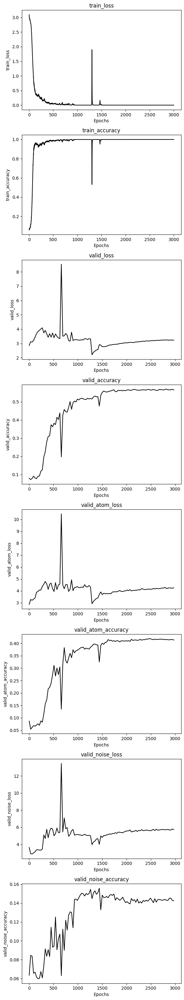

In [6]:
trainer.plot_training_metrics()

In [7]:
wandb.finish()

wandb: WARNING Source type is set to 'repo' but some required information is missing from the environment. A job will not be created from this run. See https://docs.wandb.ai/guides/launch/create-job


epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
records,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
train_accuracy,▁▅███████████████▇██████████████████████
train_loss,█▅▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
valid_accuracy,▁▁▁▁▃▄▅▅▆▃▆▇▇▇▇▇▇▇▇▇████████████████████
valid_atom_accuracy,▁▁▁▂▂▄▅▆▅▆▆▇▇▇▇▇▇▇▇▇▇▇████▇██████████▇▇█
valid_atom_loss,▂▂▅▆█▆▆▅███▆▇▆▆█▇▁▃▅▄▅▄▅▅▅▆▅▅▅▆▆▆▆▇▇▆▇▇▆
valid_loss,▂▂▃▃▃▃▂▂▂█▃▂▂▂▂▂▂▁▁▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂
valid_noise_accuracy,▃▂▁▁▃▃▅▆▄▅▅▆▅▇▆█▇▇█▇▇▇█▇▇██▇▇▇▇█▇▆▆▇▇▇▇▆
valid_noise_loss,▁▁▂▂▆▆█▇▇▇█▆█▆▆▆▆▃▄▅▆▆▆▆▇▇▇▇▇▇▇▇▇██▇█▇██
epoch,3000


### 100K dataset

107101


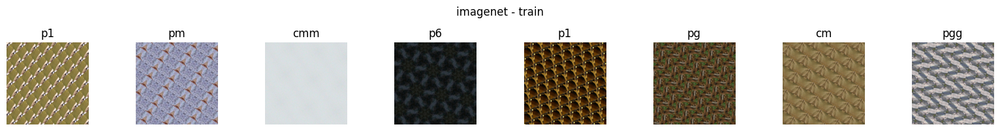

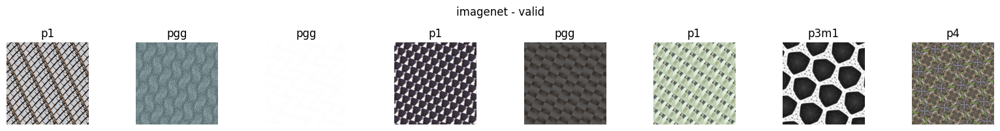

In [8]:
# imagenet
imagenet_ds = hdf5_dataset('../../datasets/imagenet_v5_rot_10m.h5', folder='train', transform=transforms.ToTensor())
_, imagenet_ds = split_train_valid(imagenet_ds, 0.99, seed=42)
print(len(imagenet_ds))
train_ds, valid_ds = split_train_valid(imagenet_ds, 0.8, seed=42)
train_dl = DataLoader(train_ds, batch_size=bs, shuffle=True, num_workers=n_cpus)
viz_dataloader(train_dl, label_converter=label_converter, title='imagenet - train')
valid_dl = DataLoader(valid_ds, batch_size=bs, shuffle=False, num_workers=n_cpus)
viz_dataloader(valid_dl, label_converter=label_converter, title='imagenet - valid')

In [9]:
model = fpn_resnet50_classification(in_channels=3, n_classes=17)
outputs = model(torch.randn(2,3,256,256))
print(outputs.shape)
model = torch.nn.DataParallel(model, device_ids=[3,5,6,8])
device = torch.device('cuda:3')
# model

torch.Size([2, 17])


In [10]:
config = {'dataset': '100k datasets',
          'loss_func': 'CrossEntropyLoss', # nn.MSELoss()
          'optimizer': 'Adam',
          'scheduler': 'OneCycleLR'}
NAME = '09242024-FPN-dataset_v5_size-100k'
wandb.login()
proj_name = 'Understanding-Experimental-Images-by-Identifying-Symmetries-with-Deep-Learning'
wandb.init(project=proj_name, entity='yig319', name=NAME, id=NAME, group='dataset_v5_size_vs_records-FPN', save_code=True, config=config)
config = wandb.config

In [11]:
lr = 1e-3
per_epoch = 3
epoch_start = 0
epochs = 300
loss_func = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, epochs=epochs, max_lr=lr, steps_per_epoch=len(train_dl))
metrics = [accuracy]  # You can add more metrics if needed
trainer = Trainer(model=model, loss_func=loss_func, optimizer=optimizer, metrics=metrics, scheduler=scheduler, 
                  device=device, save_per_epochs=per_epoch, model_path=f'../../saved_models/{NAME}/', early_stopping_patience=None)

history = trainer.train(train_dl=train_dl, epochs=epochs, epoch_start=epoch_start, valid_per_epochs=per_epoch,
                        valid_dl_list=[valid_dl, atom_dl, noise_dl], valid_dl_names=['', 'atom', 'noise'], tracking=True)

Epoch 1/300


  0%|          | 0/36 [00:00<?, ?it/s]/home/yichen/anaconda3/envs/symmetry/lib/python3.10/site-packages/torch/nn/functional.py:3769: UserWarning: nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.")
100%|██████████| 36/36 [01:05<00:00,  1.83s/it]


train_loss: 3.0033, train_accuracy: 6.28%
Epoch 2/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 2.9421, train_accuracy: 6.59%
Epoch 3/300


100%|██████████| 36/36 [01:05<00:00,  1.83s/it]


train_loss: 2.9001, train_accuracy: 6.85%


100%|██████████| 9/9 [00:14<00:00,  1.59s/it]


valid_loss: 2.8529, valid_accuracy: 7.33%


100%|██████████| 85/85 [01:41<00:00,  1.20s/it]


valid_atom_loss: 2.8458, valid_atom_accuracy: 0.03%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 3.0042, valid_noise_accuracy: 6.39%
Model saved at epoch 3
Epoch 4/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 2.8792, train_accuracy: 7.01%
Epoch 5/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 2.8705, train_accuracy: 7.36%
Epoch 6/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 2.8555, train_accuracy: 8.06%


100%|██████████| 9/9 [00:14<00:00,  1.60s/it]


valid_loss: 2.8469, valid_accuracy: 8.82%


100%|██████████| 85/85 [01:41<00:00,  1.19s/it]


valid_atom_loss: 2.8008, valid_atom_accuracy: 5.67%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 2.9043, valid_noise_accuracy: 1.70%
Model saved at epoch 6
Epoch 7/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 2.8387, train_accuracy: 8.55%
Epoch 8/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 2.7896, train_accuracy: 10.07%
Epoch 9/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 2.6665, train_accuracy: 12.83%


100%|██████████| 9/9 [00:13<00:00,  1.55s/it]


valid_loss: 2.6528, valid_accuracy: 13.73%


100%|██████████| 85/85 [01:40<00:00,  1.19s/it]


valid_atom_loss: 2.4620, valid_atom_accuracy: 13.65%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 2.8121, valid_noise_accuracy: 7.35%
Model saved at epoch 9
Epoch 10/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 2.4008, train_accuracy: 20.76%
Epoch 11/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 2.0447, train_accuracy: 31.53%
Epoch 12/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 1.7574, train_accuracy: 41.37%


100%|██████████| 9/9 [00:14<00:00,  1.59s/it]


valid_loss: 1.6281, valid_accuracy: 45.90%


100%|██████████| 85/85 [01:41<00:00,  1.19s/it]


valid_atom_loss: 2.1356, valid_atom_accuracy: 29.59%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 2.8621, valid_noise_accuracy: 10.25%
Model saved at epoch 12
Epoch 13/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 1.5340, train_accuracy: 49.36%
Epoch 14/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 1.3544, train_accuracy: 56.39%
Epoch 15/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 1.1922, train_accuracy: 62.53%


100%|██████████| 9/9 [00:14<00:00,  1.62s/it]


valid_loss: 1.1415, valid_accuracy: 62.51%


100%|██████████| 85/85 [01:41<00:00,  1.19s/it]


valid_atom_loss: 1.6949, valid_atom_accuracy: 48.54%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 2.6800, valid_noise_accuracy: 13.16%
Model saved at epoch 15
Epoch 16/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 1.0473, train_accuracy: 68.23%
Epoch 17/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.9308, train_accuracy: 72.28%
Epoch 18/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.8273, train_accuracy: 75.73%


100%|██████████| 9/9 [00:13<00:00,  1.55s/it]


valid_loss: 0.9339, valid_accuracy: 68.47%


100%|██████████| 85/85 [01:40<00:00,  1.19s/it]


valid_atom_loss: 1.5769, valid_atom_accuracy: 48.52%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 3.0699, valid_noise_accuracy: 10.57%
Model saved at epoch 18
Epoch 19/300


100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


train_loss: 0.7368, train_accuracy: 78.66%
Epoch 20/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 0.6590, train_accuracy: 81.16%
Epoch 21/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.5926, train_accuracy: 83.00%


100%|██████████| 9/9 [00:13<00:00,  1.55s/it]


valid_loss: 0.7778, valid_accuracy: 72.95%


100%|██████████| 85/85 [01:41<00:00,  1.19s/it]


valid_atom_loss: 1.3893, valid_atom_accuracy: 55.23%


100%|██████████| 43/43 [00:52<00:00,  1.21s/it]


valid_noise_loss: 2.9381, valid_noise_accuracy: 14.74%
Model saved at epoch 21
Epoch 22/300


100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


train_loss: 0.5626, train_accuracy: 83.32%
Epoch 23/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.5115, train_accuracy: 84.91%
Epoch 24/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 0.4632, train_accuracy: 86.49%


100%|██████████| 9/9 [00:14<00:00,  1.59s/it]


valid_loss: 1.1571, valid_accuracy: 61.56%


100%|██████████| 85/85 [01:40<00:00,  1.19s/it]


valid_atom_loss: 1.9870, valid_atom_accuracy: 42.84%


100%|██████████| 43/43 [00:53<00:00,  1.23s/it]


valid_noise_loss: 3.3777, valid_noise_accuracy: 13.25%
Model saved at epoch 24
Epoch 25/300


100%|██████████| 36/36 [01:05<00:00,  1.83s/it]


train_loss: 0.4392, train_accuracy: 86.88%
Epoch 26/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.4310, train_accuracy: 86.72%
Epoch 27/300


100%|██████████| 36/36 [01:05<00:00,  1.83s/it]


train_loss: 0.3854, train_accuracy: 88.45%


100%|██████████| 9/9 [00:14<00:00,  1.59s/it]


valid_loss: 0.7265, valid_accuracy: 75.06%


100%|██████████| 85/85 [01:40<00:00,  1.19s/it]


valid_atom_loss: 1.9389, valid_atom_accuracy: 48.58%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 3.2362, valid_noise_accuracy: 14.68%
Model saved at epoch 27
Epoch 28/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 0.3606, train_accuracy: 89.12%
Epoch 29/300


100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


train_loss: 0.3352, train_accuracy: 89.81%
Epoch 30/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 0.3101, train_accuracy: 90.67%


100%|██████████| 9/9 [00:13<00:00,  1.54s/it]


valid_loss: 0.9304, valid_accuracy: 71.85%


100%|██████████| 85/85 [01:40<00:00,  1.19s/it]


valid_atom_loss: 2.3034, valid_atom_accuracy: 45.49%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 4.4082, valid_noise_accuracy: 10.89%
Model saved at epoch 30
Epoch 31/300


100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


train_loss: 0.2883, train_accuracy: 91.28%
Epoch 32/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.2845, train_accuracy: 91.34%
Epoch 33/300


100%|██████████| 36/36 [01:06<00:00,  1.84s/it]


train_loss: 0.2647, train_accuracy: 91.97%


100%|██████████| 9/9 [00:14<00:00,  1.58s/it]


valid_loss: 0.7705, valid_accuracy: 75.95%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 2.0207, valid_atom_accuracy: 52.29%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 3.4745, valid_noise_accuracy: 16.11%
Model saved at epoch 33
Epoch 34/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 0.2536, train_accuracy: 92.39%
Epoch 35/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 0.2352, train_accuracy: 93.03%
Epoch 36/300


100%|██████████| 36/36 [01:05<00:00,  1.83s/it]


train_loss: 0.2592, train_accuracy: 92.09%


100%|██████████| 9/9 [00:14<00:00,  1.62s/it]


valid_loss: 0.7973, valid_accuracy: 75.27%


100%|██████████| 85/85 [01:41<00:00,  1.19s/it]


valid_atom_loss: 1.5991, valid_atom_accuracy: 57.68%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 2.9442, valid_noise_accuracy: 18.24%
Model saved at epoch 36
Epoch 37/300


100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


train_loss: 0.2393, train_accuracy: 92.70%
Epoch 38/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 0.2131, train_accuracy: 93.60%
Epoch 39/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 0.1893, train_accuracy: 94.45%


100%|██████████| 9/9 [00:14<00:00,  1.59s/it]


valid_loss: 0.8351, valid_accuracy: 77.19%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 2.5535, valid_atom_accuracy: 49.56%


100%|██████████| 43/43 [00:53<00:00,  1.25s/it]


valid_noise_loss: 3.5783, valid_noise_accuracy: 19.14%
Model saved at epoch 39
Epoch 40/300


100%|██████████| 36/36 [01:05<00:00,  1.83s/it]


train_loss: 0.1882, train_accuracy: 94.35%
Epoch 41/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.2072, train_accuracy: 93.66%
Epoch 42/300


100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


train_loss: 0.2002, train_accuracy: 93.80%


100%|██████████| 9/9 [00:14<00:00,  1.56s/it]


valid_loss: 0.9876, valid_accuracy: 75.90%


100%|██████████| 85/85 [01:42<00:00,  1.20s/it]


valid_atom_loss: 2.8433, valid_atom_accuracy: 50.62%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 3.4902, valid_noise_accuracy: 21.85%
Model saved at epoch 42
Epoch 43/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.1802, train_accuracy: 94.52%
Epoch 44/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 0.1680, train_accuracy: 95.04%
Epoch 45/300


100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


train_loss: 0.1545, train_accuracy: 95.37%


100%|██████████| 9/9 [00:14<00:00,  1.59s/it]


valid_loss: 0.7453, valid_accuracy: 78.96%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 2.6758, valid_atom_accuracy: 46.97%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 4.0976, valid_noise_accuracy: 15.64%
Model saved at epoch 45
Epoch 46/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.1601, train_accuracy: 95.14%
Epoch 47/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 0.1597, train_accuracy: 95.09%
Epoch 48/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.1460, train_accuracy: 95.58%


100%|██████████| 9/9 [00:13<00:00,  1.55s/it]


valid_loss: 0.6776, valid_accuracy: 81.68%


100%|██████████| 85/85 [01:40<00:00,  1.19s/it]


valid_atom_loss: 2.4590, valid_atom_accuracy: 52.32%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 3.4692, valid_noise_accuracy: 17.88%
Model saved at epoch 48
Epoch 49/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.1491, train_accuracy: 95.53%
Epoch 50/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 0.1452, train_accuracy: 95.59%
Epoch 51/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.1353, train_accuracy: 95.96%


100%|██████████| 9/9 [00:13<00:00,  1.55s/it]


valid_loss: 0.6594, valid_accuracy: 81.15%


100%|██████████| 85/85 [01:40<00:00,  1.19s/it]


valid_atom_loss: 2.1192, valid_atom_accuracy: 53.95%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 3.2206, valid_noise_accuracy: 21.40%
Model saved at epoch 51
Epoch 52/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 0.1494, train_accuracy: 95.51%
Epoch 53/300


100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


train_loss: 0.1485, train_accuracy: 95.45%
Epoch 54/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.1394, train_accuracy: 95.86%


100%|██████████| 9/9 [00:14<00:00,  1.59s/it]


valid_loss: 0.7163, valid_accuracy: 82.22%


100%|██████████| 85/85 [01:41<00:00,  1.19s/it]


valid_atom_loss: 2.6026, valid_atom_accuracy: 52.96%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 2.8950, valid_noise_accuracy: 25.50%
Model saved at epoch 54
Epoch 55/300


100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


train_loss: 0.1227, train_accuracy: 96.25%
Epoch 56/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.1165, train_accuracy: 96.49%
Epoch 57/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.1056, train_accuracy: 96.85%


100%|██████████| 9/9 [00:14<00:00,  1.59s/it]


valid_loss: 0.7238, valid_accuracy: 81.53%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 2.5354, valid_atom_accuracy: 53.21%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 3.3507, valid_noise_accuracy: 22.68%
Model saved at epoch 57
Epoch 58/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0944, train_accuracy: 97.17%
Epoch 59/300


100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


train_loss: 0.1003, train_accuracy: 96.95%
Epoch 60/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 0.0856, train_accuracy: 97.42%


100%|██████████| 9/9 [00:13<00:00,  1.55s/it]


valid_loss: 0.6906, valid_accuracy: 82.81%


100%|██████████| 85/85 [01:41<00:00,  1.20s/it]


valid_atom_loss: 2.5580, valid_atom_accuracy: 55.13%


100%|██████████| 43/43 [00:53<00:00,  1.24s/it]


valid_noise_loss: 2.9135, valid_noise_accuracy: 26.58%
Model saved at epoch 60
Epoch 61/300


100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


train_loss: 0.0906, train_accuracy: 97.24%
Epoch 62/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 0.0930, train_accuracy: 97.20%
Epoch 63/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0911, train_accuracy: 97.18%


100%|██████████| 9/9 [00:14<00:00,  1.58s/it]


valid_loss: 0.7155, valid_accuracy: 83.73%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 2.4791, valid_atom_accuracy: 57.82%


100%|██████████| 43/43 [00:52<00:00,  1.21s/it]


valid_noise_loss: 3.0214, valid_noise_accuracy: 27.08%
Model saved at epoch 63
Epoch 64/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0797, train_accuracy: 97.54%
Epoch 65/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0780, train_accuracy: 97.61%
Epoch 66/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 0.0845, train_accuracy: 97.44%


100%|██████████| 9/9 [00:13<00:00,  1.54s/it]


valid_loss: 0.7079, valid_accuracy: 83.86%


100%|██████████| 85/85 [01:40<00:00,  1.19s/it]


valid_atom_loss: 3.0394, valid_atom_accuracy: 50.80%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 3.6033, valid_noise_accuracy: 25.14%
Model saved at epoch 66
Epoch 67/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0831, train_accuracy: 97.52%
Epoch 68/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 0.0718, train_accuracy: 97.81%
Epoch 69/300


100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


train_loss: 0.0707, train_accuracy: 97.88%


100%|██████████| 9/9 [00:14<00:00,  1.59s/it]


valid_loss: 0.6632, valid_accuracy: 84.33%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 2.9461, valid_atom_accuracy: 54.49%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 2.9510, valid_noise_accuracy: 29.76%
Model saved at epoch 69
Epoch 70/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0724, train_accuracy: 97.81%
Epoch 71/300


100%|██████████| 36/36 [01:05<00:00,  1.83s/it]


train_loss: 0.0732, train_accuracy: 97.81%
Epoch 72/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0687, train_accuracy: 97.90%


100%|██████████| 9/9 [00:14<00:00,  1.63s/it]


valid_loss: 0.7567, valid_accuracy: 82.19%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 2.9317, valid_atom_accuracy: 50.96%


100%|██████████| 43/43 [00:53<00:00,  1.24s/it]


valid_noise_loss: 3.5436, valid_noise_accuracy: 26.15%
Model saved at epoch 72
Epoch 73/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0652, train_accuracy: 98.01%
Epoch 74/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 0.0521, train_accuracy: 98.48%
Epoch 75/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0506, train_accuracy: 98.46%


100%|██████████| 9/9 [00:14<00:00,  1.59s/it]


valid_loss: 0.6848, valid_accuracy: 83.82%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 2.6022, valid_atom_accuracy: 58.07%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 2.7577, valid_noise_accuracy: 30.84%
Model saved at epoch 75
Epoch 76/300


100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


train_loss: 0.0578, train_accuracy: 98.23%
Epoch 77/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 0.0597, train_accuracy: 98.18%
Epoch 78/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 0.0604, train_accuracy: 98.24%


100%|██████████| 9/9 [00:13<00:00,  1.54s/it]


valid_loss: 0.6967, valid_accuracy: 85.16%


100%|██████████| 85/85 [01:40<00:00,  1.19s/it]


valid_atom_loss: 3.2645, valid_atom_accuracy: 49.32%


100%|██████████| 43/43 [00:53<00:00,  1.25s/it]


valid_noise_loss: 2.5291, valid_noise_accuracy: 34.73%
Model saved at epoch 78
Epoch 79/300


100%|██████████| 36/36 [01:06<00:00,  1.84s/it]


train_loss: 0.0454, train_accuracy: 98.63%
Epoch 80/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 0.0444, train_accuracy: 98.67%
Epoch 81/300


100%|██████████| 36/36 [01:05<00:00,  1.83s/it]


train_loss: 0.0393, train_accuracy: 98.82%


100%|██████████| 9/9 [00:13<00:00,  1.54s/it]


valid_loss: 0.6440, valid_accuracy: 86.14%


100%|██████████| 85/85 [01:42<00:00,  1.20s/it]


valid_atom_loss: 2.9757, valid_atom_accuracy: 53.19%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 3.2509, valid_noise_accuracy: 31.90%
Model saved at epoch 81
Epoch 82/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0462, train_accuracy: 98.64%
Epoch 83/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0478, train_accuracy: 98.58%
Epoch 84/300


100%|██████████| 36/36 [01:06<00:00,  1.85s/it]


train_loss: 0.0463, train_accuracy: 98.61%


100%|██████████| 9/9 [00:13<00:00,  1.54s/it]


valid_loss: 0.6017, valid_accuracy: 86.87%


100%|██████████| 85/85 [01:41<00:00,  1.20s/it]


valid_atom_loss: 3.4877, valid_atom_accuracy: 48.84%


100%|██████████| 43/43 [00:52<00:00,  1.21s/it]


valid_noise_loss: 3.5441, valid_noise_accuracy: 28.26%
Model saved at epoch 84
Epoch 85/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0372, train_accuracy: 98.90%
Epoch 86/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0467, train_accuracy: 98.63%
Epoch 87/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0473, train_accuracy: 98.55%


100%|██████████| 9/9 [00:14<00:00,  1.56s/it]


valid_loss: 0.5866, valid_accuracy: 86.89%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 2.6415, valid_atom_accuracy: 57.50%


100%|██████████| 43/43 [00:52<00:00,  1.21s/it]


valid_noise_loss: 3.3488, valid_noise_accuracy: 31.22%
Model saved at epoch 87
Epoch 88/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0466, train_accuracy: 98.55%
Epoch 89/300


100%|██████████| 36/36 [01:06<00:00,  1.84s/it]


train_loss: 0.0401, train_accuracy: 98.84%
Epoch 90/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 0.0365, train_accuracy: 98.91%


100%|██████████| 9/9 [00:13<00:00,  1.54s/it]


valid_loss: 0.6418, valid_accuracy: 86.62%


100%|██████████| 85/85 [01:40<00:00,  1.19s/it]


valid_atom_loss: 2.6472, valid_atom_accuracy: 57.05%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 3.2210, valid_noise_accuracy: 28.55%
Model saved at epoch 90
Epoch 91/300


100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


train_loss: 0.0369, train_accuracy: 98.91%
Epoch 92/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0378, train_accuracy: 98.88%
Epoch 93/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0371, train_accuracy: 98.86%


100%|██████████| 9/9 [00:14<00:00,  1.58s/it]


valid_loss: 0.5866, valid_accuracy: 87.43%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 2.8604, valid_atom_accuracy: 57.68%


100%|██████████| 43/43 [00:52<00:00,  1.21s/it]


valid_noise_loss: 2.9553, valid_noise_accuracy: 34.21%
Model saved at epoch 93
Epoch 94/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0286, train_accuracy: 99.13%
Epoch 95/300


100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


train_loss: 0.0268, train_accuracy: 99.26%
Epoch 96/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 0.0276, train_accuracy: 99.22%


100%|██████████| 9/9 [00:13<00:00,  1.54s/it]


valid_loss: 0.8198, valid_accuracy: 83.81%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 3.7133, valid_atom_accuracy: 50.07%


100%|██████████| 43/43 [00:52<00:00,  1.21s/it]


valid_noise_loss: 4.5649, valid_noise_accuracy: 26.59%
Model saved at epoch 96
Epoch 97/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0315, train_accuracy: 99.08%
Epoch 98/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0313, train_accuracy: 99.06%
Epoch 99/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 0.0347, train_accuracy: 98.94%


100%|██████████| 9/9 [00:13<00:00,  1.54s/it]


valid_loss: 0.5610, valid_accuracy: 88.19%


100%|██████████| 85/85 [01:40<00:00,  1.19s/it]


valid_atom_loss: 3.6600, valid_atom_accuracy: 50.01%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 2.9781, valid_noise_accuracy: 33.17%
Model saved at epoch 99
Epoch 100/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 0.0343, train_accuracy: 98.99%
Epoch 101/300


100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


train_loss: 0.0320, train_accuracy: 99.04%
Epoch 102/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0289, train_accuracy: 99.18%


100%|██████████| 9/9 [00:13<00:00,  1.54s/it]


valid_loss: 0.6985, valid_accuracy: 86.83%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 3.1618, valid_atom_accuracy: 57.68%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 3.4802, valid_noise_accuracy: 32.23%
Model saved at epoch 102
Epoch 103/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0254, train_accuracy: 99.25%
Epoch 104/300


100%|██████████| 36/36 [01:05<00:00,  1.83s/it]


train_loss: 0.0281, train_accuracy: 99.15%
Epoch 105/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 0.0319, train_accuracy: 99.03%


100%|██████████| 9/9 [00:14<00:00,  1.59s/it]


valid_loss: 0.6790, valid_accuracy: 86.99%


100%|██████████| 85/85 [01:43<00:00,  1.22s/it]


valid_atom_loss: 3.5563, valid_atom_accuracy: 51.06%


100%|██████████| 43/43 [00:53<00:00,  1.24s/it]


valid_noise_loss: 3.2250, valid_noise_accuracy: 32.61%
Model saved at epoch 105
Epoch 106/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0329, train_accuracy: 98.96%
Epoch 107/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0300, train_accuracy: 99.10%
Epoch 108/300


100%|██████████| 36/36 [01:06<00:00,  1.84s/it]


train_loss: 0.0234, train_accuracy: 99.31%


100%|██████████| 9/9 [00:14<00:00,  1.56s/it]


valid_loss: 0.6238, valid_accuracy: 87.57%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 3.2605, valid_atom_accuracy: 53.15%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 3.4639, valid_noise_accuracy: 32.74%
Model saved at epoch 108
Epoch 109/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0240, train_accuracy: 99.28%
Epoch 110/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0212, train_accuracy: 99.39%
Epoch 111/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0236, train_accuracy: 99.30%


100%|██████████| 9/9 [00:14<00:00,  1.59s/it]


valid_loss: 0.5955, valid_accuracy: 88.34%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 3.3919, valid_atom_accuracy: 54.50%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 3.3582, valid_noise_accuracy: 35.37%
Model saved at epoch 111
Epoch 112/300


100%|██████████| 36/36 [01:06<00:00,  1.84s/it]


train_loss: 0.0196, train_accuracy: 99.46%
Epoch 113/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0262, train_accuracy: 99.25%
Epoch 114/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 0.0273, train_accuracy: 99.16%


100%|██████████| 9/9 [00:14<00:00,  1.63s/it]


valid_loss: 0.7040, valid_accuracy: 87.45%


100%|██████████| 85/85 [01:40<00:00,  1.19s/it]


valid_atom_loss: 3.3474, valid_atom_accuracy: 56.72%


100%|██████████| 43/43 [00:53<00:00,  1.23s/it]


valid_noise_loss: 2.9871, valid_noise_accuracy: 35.56%
Model saved at epoch 114
Epoch 115/300


100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


train_loss: 0.0272, train_accuracy: 99.16%
Epoch 116/300


100%|██████████| 36/36 [01:06<00:00,  1.84s/it]


train_loss: 0.0274, train_accuracy: 99.18%
Epoch 117/300


100%|██████████| 36/36 [01:06<00:00,  1.86s/it]


train_loss: 0.0268, train_accuracy: 99.18%


100%|██████████| 9/9 [00:14<00:00,  1.59s/it]


valid_loss: 0.5898, valid_accuracy: 87.76%


100%|██████████| 85/85 [01:41<00:00,  1.20s/it]


valid_atom_loss: 3.1685, valid_atom_accuracy: 56.42%


100%|██████████| 43/43 [00:53<00:00,  1.23s/it]


valid_noise_loss: 2.7657, valid_noise_accuracy: 37.65%
Model saved at epoch 117
Epoch 118/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0247, train_accuracy: 99.28%
Epoch 119/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 0.0206, train_accuracy: 99.40%
Epoch 120/300


100%|██████████| 36/36 [01:04<00:00,  1.81s/it]


train_loss: 0.0154, train_accuracy: 99.54%


100%|██████████| 9/9 [00:14<00:00,  1.58s/it]


valid_loss: 0.6096, valid_accuracy: 88.67%


100%|██████████| 85/85 [01:42<00:00,  1.20s/it]


valid_atom_loss: 3.9177, valid_atom_accuracy: 49.15%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 2.8330, valid_noise_accuracy: 37.99%
Model saved at epoch 120
Epoch 121/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0132, train_accuracy: 99.62%
Epoch 122/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0148, train_accuracy: 99.56%
Epoch 123/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 0.0218, train_accuracy: 99.32%


100%|██████████| 9/9 [00:13<00:00,  1.55s/it]


valid_loss: 0.7310, valid_accuracy: 86.79%


100%|██████████| 85/85 [01:41<00:00,  1.19s/it]


valid_atom_loss: 3.1293, valid_atom_accuracy: 55.36%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 3.0265, valid_noise_accuracy: 34.34%
Model saved at epoch 123
Epoch 124/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0255, train_accuracy: 99.27%
Epoch 125/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0221, train_accuracy: 99.36%
Epoch 126/300


100%|██████████| 36/36 [01:06<00:00,  1.85s/it]


train_loss: 0.0236, train_accuracy: 99.30%


100%|██████████| 9/9 [00:14<00:00,  1.59s/it]


valid_loss: 0.5665, valid_accuracy: 88.74%


100%|██████████| 85/85 [01:46<00:00,  1.25s/it]


valid_atom_loss: 3.2118, valid_atom_accuracy: 55.12%


100%|██████████| 43/43 [00:55<00:00,  1.29s/it]


valid_noise_loss: 3.2765, valid_noise_accuracy: 37.25%
Model saved at epoch 126
Epoch 127/300


100%|██████████| 36/36 [01:06<00:00,  1.85s/it]


train_loss: 0.0230, train_accuracy: 99.30%
Epoch 128/300


100%|██████████| 36/36 [01:06<00:00,  1.84s/it]


train_loss: 0.0216, train_accuracy: 99.36%
Epoch 129/300


100%|██████████| 36/36 [01:06<00:00,  1.86s/it]


train_loss: 0.0217, train_accuracy: 99.35%


100%|██████████| 9/9 [00:14<00:00,  1.64s/it]


valid_loss: 0.6940, valid_accuracy: 87.41%


100%|██████████| 85/85 [01:48<00:00,  1.27s/it]


valid_atom_loss: 4.0343, valid_atom_accuracy: 49.48%


100%|██████████| 43/43 [00:54<00:00,  1.27s/it]


valid_noise_loss: 3.0398, valid_noise_accuracy: 35.02%
Model saved at epoch 129
Epoch 130/300


100%|██████████| 36/36 [01:04<00:00,  1.79s/it]


train_loss: 0.0232, train_accuracy: 99.31%
Epoch 131/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0286, train_accuracy: 99.14%
Epoch 132/300


100%|██████████| 36/36 [01:05<00:00,  1.83s/it]


train_loss: 0.0274, train_accuracy: 99.17%


100%|██████████| 9/9 [00:14<00:00,  1.59s/it]


valid_loss: 0.5500, valid_accuracy: 88.65%


100%|██████████| 85/85 [01:42<00:00,  1.21s/it]


valid_atom_loss: 3.1010, valid_atom_accuracy: 55.35%


100%|██████████| 43/43 [00:54<00:00,  1.27s/it]


valid_noise_loss: 2.6649, valid_noise_accuracy: 36.91%
Model saved at epoch 132
Epoch 133/300


100%|██████████| 36/36 [01:06<00:00,  1.84s/it]


train_loss: 0.0199, train_accuracy: 99.39%
Epoch 134/300


100%|██████████| 36/36 [01:06<00:00,  1.84s/it]


train_loss: 0.0155, train_accuracy: 99.54%
Epoch 135/300


100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


train_loss: 0.0143, train_accuracy: 99.61%


100%|██████████| 9/9 [00:14<00:00,  1.61s/it]


valid_loss: 0.5259, valid_accuracy: 89.21%


100%|██████████| 85/85 [01:41<00:00,  1.19s/it]


valid_atom_loss: 3.5271, valid_atom_accuracy: 53.31%


100%|██████████| 43/43 [00:54<00:00,  1.26s/it]


valid_noise_loss: 2.5587, valid_noise_accuracy: 40.02%
Model saved at epoch 135
Epoch 136/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 0.0156, train_accuracy: 99.56%
Epoch 137/300


100%|██████████| 36/36 [01:07<00:00,  1.87s/it]


train_loss: 0.0144, train_accuracy: 99.57%
Epoch 138/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0136, train_accuracy: 99.61%


100%|██████████| 9/9 [00:14<00:00,  1.59s/it]


valid_loss: 0.6066, valid_accuracy: 89.07%


100%|██████████| 85/85 [01:48<00:00,  1.27s/it]


valid_atom_loss: 4.1583, valid_atom_accuracy: 49.76%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 3.0007, valid_noise_accuracy: 35.97%
Model saved at epoch 138
Epoch 139/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 0.0209, train_accuracy: 99.39%
Epoch 140/300


100%|██████████| 36/36 [01:07<00:00,  1.87s/it]


train_loss: 0.0235, train_accuracy: 99.29%
Epoch 141/300


100%|██████████| 36/36 [01:07<00:00,  1.89s/it]


train_loss: 0.0203, train_accuracy: 99.42%


100%|██████████| 9/9 [00:14<00:00,  1.62s/it]


valid_loss: 0.5611, valid_accuracy: 89.90%


100%|██████████| 85/85 [01:40<00:00,  1.19s/it]


valid_atom_loss: 3.4107, valid_atom_accuracy: 55.82%


100%|██████████| 43/43 [00:53<00:00,  1.25s/it]


valid_noise_loss: 2.7008, valid_noise_accuracy: 39.82%
Model saved at epoch 141
Epoch 142/300


100%|██████████| 36/36 [01:06<00:00,  1.84s/it]


train_loss: 0.0149, train_accuracy: 99.57%
Epoch 143/300


100%|██████████| 36/36 [01:06<00:00,  1.86s/it]


train_loss: 0.0142, train_accuracy: 99.57%
Epoch 144/300


100%|██████████| 36/36 [01:08<00:00,  1.89s/it]


train_loss: 0.0163, train_accuracy: 99.54%


100%|██████████| 9/9 [00:14<00:00,  1.61s/it]


valid_loss: 0.6047, valid_accuracy: 89.21%


100%|██████████| 85/85 [01:48<00:00,  1.28s/it]


valid_atom_loss: 3.5426, valid_atom_accuracy: 55.72%


100%|██████████| 43/43 [00:56<00:00,  1.30s/it]


valid_noise_loss: 3.0803, valid_noise_accuracy: 40.12%
Model saved at epoch 144
Epoch 145/300


100%|██████████| 36/36 [01:05<00:00,  1.83s/it]


train_loss: 0.0117, train_accuracy: 99.65%
Epoch 146/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0148, train_accuracy: 99.58%
Epoch 147/300


100%|██████████| 36/36 [01:07<00:00,  1.87s/it]


train_loss: 0.0116, train_accuracy: 99.70%


100%|██████████| 9/9 [00:14<00:00,  1.65s/it]


valid_loss: 0.5364, valid_accuracy: 89.72%


100%|██████████| 85/85 [01:40<00:00,  1.19s/it]


valid_atom_loss: 3.6195, valid_atom_accuracy: 52.58%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 2.8793, valid_noise_accuracy: 39.65%
Model saved at epoch 147
Epoch 148/300


100%|██████████| 36/36 [01:05<00:00,  1.83s/it]


train_loss: 0.0201, train_accuracy: 99.42%
Epoch 149/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 0.0158, train_accuracy: 99.55%
Epoch 150/300


100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


train_loss: 0.0141, train_accuracy: 99.58%


100%|██████████| 9/9 [00:14<00:00,  1.60s/it]


valid_loss: 0.5984, valid_accuracy: 89.26%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 3.6582, valid_atom_accuracy: 53.23%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 3.0577, valid_noise_accuracy: 39.02%
Model saved at epoch 150
Epoch 151/300


100%|██████████| 36/36 [01:04<00:00,  1.79s/it]


train_loss: 0.0143, train_accuracy: 99.58%
Epoch 152/300


100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


train_loss: 0.0141, train_accuracy: 99.58%
Epoch 153/300


100%|██████████| 36/36 [01:06<00:00,  1.84s/it]


train_loss: 0.0164, train_accuracy: 99.53%


100%|██████████| 9/9 [00:13<00:00,  1.54s/it]


valid_loss: 0.6469, valid_accuracy: 88.60%


100%|██████████| 85/85 [01:43<00:00,  1.21s/it]


valid_atom_loss: 3.4471, valid_atom_accuracy: 56.25%


100%|██████████| 43/43 [00:52<00:00,  1.21s/it]


valid_noise_loss: 3.9853, valid_noise_accuracy: 33.67%
Model saved at epoch 153
Epoch 154/300


100%|██████████| 36/36 [01:06<00:00,  1.84s/it]


train_loss: 0.0164, train_accuracy: 99.53%
Epoch 155/300


100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


train_loss: 0.0148, train_accuracy: 99.57%
Epoch 156/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0258, train_accuracy: 99.25%


100%|██████████| 9/9 [00:13<00:00,  1.54s/it]


valid_loss: 0.5599, valid_accuracy: 88.94%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 3.7400, valid_atom_accuracy: 51.91%


100%|██████████| 43/43 [00:53<00:00,  1.23s/it]


valid_noise_loss: 3.0255, valid_noise_accuracy: 35.66%
Model saved at epoch 156
Epoch 157/300


100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


train_loss: 0.0271, train_accuracy: 99.18%
Epoch 158/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 0.0224, train_accuracy: 99.34%
Epoch 159/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0175, train_accuracy: 99.50%


100%|██████████| 9/9 [00:14<00:00,  1.59s/it]


valid_loss: 0.5528, valid_accuracy: 89.66%


100%|██████████| 85/85 [01:42<00:00,  1.21s/it]


valid_atom_loss: 3.7640, valid_atom_accuracy: 52.84%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 3.3406, valid_noise_accuracy: 37.15%
Model saved at epoch 159
Epoch 160/300


100%|██████████| 36/36 [01:05<00:00,  1.83s/it]


train_loss: 0.0117, train_accuracy: 99.67%
Epoch 161/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 0.0079, train_accuracy: 99.76%
Epoch 162/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 0.0088, train_accuracy: 99.76%


100%|██████████| 9/9 [00:14<00:00,  1.58s/it]


valid_loss: 0.5625, valid_accuracy: 89.99%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 3.6333, valid_atom_accuracy: 54.75%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 3.1402, valid_noise_accuracy: 39.35%
Model saved at epoch 162
Epoch 163/300


100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


train_loss: 0.0087, train_accuracy: 99.76%
Epoch 164/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 0.0071, train_accuracy: 99.80%
Epoch 165/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0048, train_accuracy: 99.88%


100%|██████████| 9/9 [00:14<00:00,  1.60s/it]


valid_loss: 0.5381, valid_accuracy: 90.75%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 3.2812, valid_atom_accuracy: 57.45%


100%|██████████| 43/43 [00:52<00:00,  1.21s/it]


valid_noise_loss: 2.8231, valid_noise_accuracy: 42.17%
Model saved at epoch 165
Epoch 166/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0044, train_accuracy: 99.88%
Epoch 167/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0045, train_accuracy: 99.88%
Epoch 168/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 0.0043, train_accuracy: 99.89%


100%|██████████| 9/9 [00:14<00:00,  1.58s/it]


valid_loss: 0.5271, valid_accuracy: 90.90%


100%|██████████| 85/85 [01:42<00:00,  1.21s/it]


valid_atom_loss: 3.6854, valid_atom_accuracy: 56.41%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 2.5452, valid_noise_accuracy: 44.88%
Model saved at epoch 168
Epoch 169/300


100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


train_loss: 0.0047, train_accuracy: 99.87%
Epoch 170/300


100%|██████████| 36/36 [01:04<00:00,  1.79s/it]


train_loss: 0.0057, train_accuracy: 99.84%
Epoch 171/300


100%|██████████| 36/36 [01:05<00:00,  1.83s/it]


train_loss: 0.0048, train_accuracy: 99.86%


100%|██████████| 9/9 [00:14<00:00,  1.58s/it]


valid_loss: 0.5487, valid_accuracy: 90.71%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 3.7736, valid_atom_accuracy: 55.04%


100%|██████████| 43/43 [00:51<00:00,  1.21s/it]


valid_noise_loss: 2.7603, valid_noise_accuracy: 41.96%
Model saved at epoch 171
Epoch 172/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0046, train_accuracy: 99.88%
Epoch 173/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0046, train_accuracy: 99.87%
Epoch 174/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 0.0059, train_accuracy: 99.84%


100%|██████████| 9/9 [00:14<00:00,  1.63s/it]


valid_loss: 0.5871, valid_accuracy: 90.39%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 3.5436, valid_atom_accuracy: 56.00%


100%|██████████| 43/43 [00:53<00:00,  1.24s/it]


valid_noise_loss: 3.0207, valid_noise_accuracy: 40.15%
Model saved at epoch 174
Epoch 175/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0079, train_accuracy: 99.76%
Epoch 176/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0111, train_accuracy: 99.68%
Epoch 177/300


100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


train_loss: 0.0175, train_accuracy: 99.48%


100%|██████████| 9/9 [00:14<00:00,  1.58s/it]


valid_loss: 0.6744, valid_accuracy: 88.86%


100%|██████████| 85/85 [01:42<00:00,  1.21s/it]


valid_atom_loss: 3.7542, valid_atom_accuracy: 54.24%


100%|██████████| 43/43 [00:53<00:00,  1.25s/it]


valid_noise_loss: 3.4033, valid_noise_accuracy: 37.49%
Model saved at epoch 177
Epoch 178/300


100%|██████████| 36/36 [01:04<00:00,  1.81s/it]


train_loss: 0.0238, train_accuracy: 99.28%
Epoch 179/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 0.0238, train_accuracy: 99.29%
Epoch 180/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0184, train_accuracy: 99.42%


100%|██████████| 9/9 [00:14<00:00,  1.61s/it]


valid_loss: 0.6004, valid_accuracy: 89.42%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 3.6307, valid_atom_accuracy: 55.27%


100%|██████████| 43/43 [00:53<00:00,  1.24s/it]


valid_noise_loss: 3.1370, valid_noise_accuracy: 37.25%
Model saved at epoch 180
Epoch 181/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 0.0141, train_accuracy: 99.60%
Epoch 182/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 0.0137, train_accuracy: 99.63%
Epoch 183/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 0.0157, train_accuracy: 99.55%


100%|██████████| 9/9 [00:14<00:00,  1.58s/it]


valid_loss: 0.5985, valid_accuracy: 89.76%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 3.8883, valid_atom_accuracy: 52.91%


100%|██████████| 43/43 [00:52<00:00,  1.21s/it]


valid_noise_loss: 2.8500, valid_noise_accuracy: 39.26%
Model saved at epoch 183
Epoch 184/300


100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


train_loss: 0.0113, train_accuracy: 99.66%
Epoch 185/300


100%|██████████| 36/36 [01:04<00:00,  1.79s/it]


train_loss: 0.0077, train_accuracy: 99.77%
Epoch 186/300


100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


train_loss: 0.0083, train_accuracy: 99.76%


100%|██████████| 9/9 [00:13<00:00,  1.54s/it]


valid_loss: 0.5494, valid_accuracy: 90.34%


100%|██████████| 85/85 [01:40<00:00,  1.19s/it]


valid_atom_loss: 4.0851, valid_atom_accuracy: 53.67%


100%|██████████| 43/43 [00:51<00:00,  1.21s/it]


valid_noise_loss: 2.6142, valid_noise_accuracy: 42.18%
Model saved at epoch 186
Epoch 187/300


100%|██████████| 36/36 [01:05<00:00,  1.83s/it]


train_loss: 0.0070, train_accuracy: 99.81%
Epoch 188/300


100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


train_loss: 0.0054, train_accuracy: 99.84%
Epoch 189/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0045, train_accuracy: 99.87%


100%|██████████| 9/9 [00:14<00:00,  1.62s/it]


valid_loss: 0.5336, valid_accuracy: 90.95%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 3.9037, valid_atom_accuracy: 55.32%


100%|██████████| 43/43 [00:52<00:00,  1.21s/it]


valid_noise_loss: 2.6245, valid_noise_accuracy: 43.86%
Model saved at epoch 189
Epoch 190/300


100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


train_loss: 0.0033, train_accuracy: 99.91%
Epoch 191/300


100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


train_loss: 0.0035, train_accuracy: 99.90%
Epoch 192/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0036, train_accuracy: 99.90%


100%|██████████| 9/9 [00:14<00:00,  1.57s/it]


valid_loss: 0.5450, valid_accuracy: 91.10%


100%|██████████| 85/85 [01:41<00:00,  1.19s/it]


valid_atom_loss: 4.0901, valid_atom_accuracy: 56.07%


100%|██████████| 43/43 [00:53<00:00,  1.24s/it]


valid_noise_loss: 2.8803, valid_noise_accuracy: 42.49%
Model saved at epoch 192
Epoch 193/300


100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


train_loss: 0.0034, train_accuracy: 99.90%
Epoch 194/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0052, train_accuracy: 99.85%
Epoch 195/300


100%|██████████| 36/36 [01:04<00:00,  1.81s/it]


train_loss: 0.0140, train_accuracy: 99.64%


100%|██████████| 9/9 [00:14<00:00,  1.56s/it]


valid_loss: 0.5965, valid_accuracy: 89.89%


100%|██████████| 85/85 [01:42<00:00,  1.21s/it]


valid_atom_loss: 4.7547, valid_atom_accuracy: 50.45%


100%|██████████| 43/43 [00:53<00:00,  1.25s/it]


valid_noise_loss: 3.0153, valid_noise_accuracy: 38.55%
Model saved at epoch 195
Epoch 196/300


100%|██████████| 36/36 [01:04<00:00,  1.79s/it]


train_loss: 0.0300, train_accuracy: 99.17%
Epoch 197/300


100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


train_loss: 0.0180, train_accuracy: 99.44%
Epoch 198/300


100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


train_loss: 0.0143, train_accuracy: 99.57%


100%|██████████| 9/9 [00:13<00:00,  1.55s/it]


valid_loss: 0.5473, valid_accuracy: 90.43%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 3.6194, valid_atom_accuracy: 57.66%


100%|██████████| 43/43 [00:51<00:00,  1.21s/it]


valid_noise_loss: 2.7838, valid_noise_accuracy: 42.19%
Model saved at epoch 198
Epoch 199/300


100%|██████████| 36/36 [01:04<00:00,  1.79s/it]


train_loss: 0.0078, train_accuracy: 99.77%
Epoch 200/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0067, train_accuracy: 99.81%
Epoch 201/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0046, train_accuracy: 99.87%


100%|██████████| 9/9 [00:13<00:00,  1.53s/it]


valid_loss: 0.5160, valid_accuracy: 91.15%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 4.2577, valid_atom_accuracy: 51.00%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 2.6975, valid_noise_accuracy: 43.43%
Model saved at epoch 201
Epoch 202/300


100%|██████████| 36/36 [01:05<00:00,  1.83s/it]


train_loss: 0.0041, train_accuracy: 99.89%
Epoch 203/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 0.0033, train_accuracy: 99.91%
Epoch 204/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 0.0031, train_accuracy: 99.91%


100%|██████████| 9/9 [00:14<00:00,  1.60s/it]


valid_loss: 0.5235, valid_accuracy: 91.41%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 3.9239, valid_atom_accuracy: 55.40%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 2.6229, valid_noise_accuracy: 43.85%
Model saved at epoch 204
Epoch 205/300


100%|██████████| 36/36 [01:05<00:00,  1.83s/it]


train_loss: 0.0033, train_accuracy: 99.91%
Epoch 206/300


100%|██████████| 36/36 [01:06<00:00,  1.84s/it]


train_loss: 0.0032, train_accuracy: 99.91%
Epoch 207/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0026, train_accuracy: 99.92%


100%|██████████| 9/9 [00:14<00:00,  1.62s/it]


valid_loss: 0.5514, valid_accuracy: 91.34%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 3.9789, valid_atom_accuracy: 55.78%


100%|██████████| 43/43 [00:53<00:00,  1.23s/it]


valid_noise_loss: 2.7411, valid_noise_accuracy: 44.34%
Model saved at epoch 207
Epoch 208/300


100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


train_loss: 0.0027, train_accuracy: 99.92%
Epoch 209/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0026, train_accuracy: 99.92%
Epoch 210/300


100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


train_loss: 0.0026, train_accuracy: 99.92%


100%|██████████| 9/9 [00:14<00:00,  1.58s/it]


valid_loss: 0.5552, valid_accuracy: 91.46%


100%|██████████| 85/85 [01:42<00:00,  1.20s/it]


valid_atom_loss: 3.8714, valid_atom_accuracy: 56.86%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 2.6822, valid_noise_accuracy: 44.69%
Model saved at epoch 210
Epoch 211/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0025, train_accuracy: 99.93%
Epoch 212/300


100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


train_loss: 0.0023, train_accuracy: 99.93%
Epoch 213/300


100%|██████████| 36/36 [01:05<00:00,  1.83s/it]


train_loss: 0.0024, train_accuracy: 99.93%


100%|██████████| 9/9 [00:14<00:00,  1.59s/it]


valid_loss: 0.5480, valid_accuracy: 91.51%


100%|██████████| 85/85 [01:40<00:00,  1.19s/it]


valid_atom_loss: 3.7967, valid_atom_accuracy: 57.17%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 2.8814, valid_noise_accuracy: 43.62%
Model saved at epoch 213
Epoch 214/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0024, train_accuracy: 99.93%
Epoch 215/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0023, train_accuracy: 99.93%
Epoch 216/300


100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


train_loss: 0.0023, train_accuracy: 99.93%


100%|██████████| 9/9 [00:14<00:00,  1.59s/it]


valid_loss: 0.5444, valid_accuracy: 91.59%


100%|██████████| 85/85 [01:40<00:00,  1.19s/it]


valid_atom_loss: 3.8335, valid_atom_accuracy: 57.08%


100%|██████████| 43/43 [00:52<00:00,  1.21s/it]


valid_noise_loss: 2.9125, valid_noise_accuracy: 43.80%
Model saved at epoch 216
Epoch 217/300


100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


train_loss: 0.0023, train_accuracy: 99.93%
Epoch 218/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 0.0023, train_accuracy: 99.93%
Epoch 219/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0022, train_accuracy: 99.94%


100%|██████████| 9/9 [00:14<00:00,  1.59s/it]


valid_loss: 0.5490, valid_accuracy: 91.65%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 3.8905, valid_atom_accuracy: 56.72%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 2.8910, valid_noise_accuracy: 44.14%
Model saved at epoch 219
Epoch 220/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0023, train_accuracy: 99.93%
Epoch 221/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0022, train_accuracy: 99.93%
Epoch 222/300


100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


train_loss: 0.0021, train_accuracy: 99.93%


100%|██████████| 9/9 [00:14<00:00,  1.59s/it]


valid_loss: 0.5409, valid_accuracy: 91.70%


100%|██████████| 85/85 [01:41<00:00,  1.19s/it]


valid_atom_loss: 3.8919, valid_atom_accuracy: 56.92%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 2.8877, valid_noise_accuracy: 44.37%
Model saved at epoch 222
Epoch 223/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0023, train_accuracy: 99.93%
Epoch 224/300


100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


train_loss: 0.0022, train_accuracy: 99.93%
Epoch 225/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0022, train_accuracy: 99.93%


100%|██████████| 9/9 [00:14<00:00,  1.62s/it]


valid_loss: 0.5441, valid_accuracy: 91.69%


100%|██████████| 85/85 [01:41<00:00,  1.19s/it]


valid_atom_loss: 3.9115, valid_atom_accuracy: 57.06%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 2.9521, valid_noise_accuracy: 43.83%
Model saved at epoch 225
Epoch 226/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 0.0023, train_accuracy: 99.93%
Epoch 227/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0025, train_accuracy: 99.93%
Epoch 228/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0031, train_accuracy: 99.91%


100%|██████████| 9/9 [00:14<00:00,  1.63s/it]


valid_loss: 0.5661, valid_accuracy: 91.54%


100%|██████████| 85/85 [01:41<00:00,  1.19s/it]


valid_atom_loss: 4.0657, valid_atom_accuracy: 55.38%


100%|██████████| 43/43 [00:52<00:00,  1.21s/it]


valid_noise_loss: 3.2896, valid_noise_accuracy: 41.69%
Model saved at epoch 228
Epoch 229/300


100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


train_loss: 0.0024, train_accuracy: 99.92%
Epoch 230/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 0.0023, train_accuracy: 99.93%
Epoch 231/300


100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


train_loss: 0.0023, train_accuracy: 99.93%


100%|██████████| 9/9 [00:14<00:00,  1.59s/it]


valid_loss: 0.5708, valid_accuracy: 91.52%


100%|██████████| 85/85 [01:40<00:00,  1.19s/it]


valid_atom_loss: 4.0813, valid_atom_accuracy: 56.01%


100%|██████████| 43/43 [00:52<00:00,  1.21s/it]


valid_noise_loss: 3.1457, valid_noise_accuracy: 42.89%
Model saved at epoch 231
Epoch 232/300


100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


train_loss: 0.0024, train_accuracy: 99.93%
Epoch 233/300


100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


train_loss: 0.0022, train_accuracy: 99.93%
Epoch 234/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 0.0022, train_accuracy: 99.93%


100%|██████████| 9/9 [00:14<00:00,  1.59s/it]


valid_loss: 0.5667, valid_accuracy: 91.47%


100%|██████████| 85/85 [01:42<00:00,  1.21s/it]


valid_atom_loss: 3.9856, valid_atom_accuracy: 56.29%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 2.9730, valid_noise_accuracy: 44.00%
Model saved at epoch 234
Epoch 235/300


100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


train_loss: 0.0022, train_accuracy: 99.93%
Epoch 236/300


100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


train_loss: 0.0021, train_accuracy: 99.93%
Epoch 237/300


100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


train_loss: 0.0021, train_accuracy: 99.94%


100%|██████████| 9/9 [00:14<00:00,  1.58s/it]


valid_loss: 0.5611, valid_accuracy: 91.57%


100%|██████████| 85/85 [01:43<00:00,  1.21s/it]


valid_atom_loss: 3.9895, valid_atom_accuracy: 56.12%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 3.0548, valid_noise_accuracy: 43.57%
Model saved at epoch 237
Epoch 238/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 0.0020, train_accuracy: 99.93%
Epoch 239/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0031, train_accuracy: 99.90%
Epoch 240/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0033, train_accuracy: 99.90%


100%|██████████| 9/9 [00:14<00:00,  1.56s/it]


valid_loss: 0.5955, valid_accuracy: 91.39%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 4.0678, valid_atom_accuracy: 55.24%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 3.1145, valid_noise_accuracy: 44.05%
Model saved at epoch 240
Epoch 241/300


100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


train_loss: 0.0030, train_accuracy: 99.90%
Epoch 242/300


100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


train_loss: 0.0025, train_accuracy: 99.92%
Epoch 243/300


100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


train_loss: 0.0023, train_accuracy: 99.93%


100%|██████████| 9/9 [00:13<00:00,  1.55s/it]


valid_loss: 0.6043, valid_accuracy: 91.48%


100%|██████████| 85/85 [01:42<00:00,  1.21s/it]


valid_atom_loss: 4.2602, valid_atom_accuracy: 54.72%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 3.2383, valid_noise_accuracy: 43.08%
Model saved at epoch 243
Epoch 244/300


100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


train_loss: 0.0022, train_accuracy: 99.93%
Epoch 245/300


100%|██████████| 36/36 [01:05<00:00,  1.83s/it]


train_loss: 0.0021, train_accuracy: 99.93%
Epoch 246/300


100%|██████████| 36/36 [01:05<00:00,  1.83s/it]


train_loss: 0.0021, train_accuracy: 99.93%


100%|██████████| 9/9 [00:14<00:00,  1.59s/it]


valid_loss: 0.5770, valid_accuracy: 91.60%


100%|██████████| 85/85 [01:40<00:00,  1.19s/it]


valid_atom_loss: 4.2113, valid_atom_accuracy: 54.73%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 3.1356, valid_noise_accuracy: 43.76%
Model saved at epoch 246
Epoch 247/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 0.0020, train_accuracy: 99.94%
Epoch 248/300


100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


train_loss: 0.0020, train_accuracy: 99.93%
Epoch 249/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 0.0020, train_accuracy: 99.94%


100%|██████████| 9/9 [00:16<00:00,  1.83s/it]


valid_loss: 0.5714, valid_accuracy: 91.70%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 4.1385, valid_atom_accuracy: 54.90%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 3.1432, valid_noise_accuracy: 43.75%
Model saved at epoch 249
Epoch 250/300


100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


train_loss: 0.0020, train_accuracy: 99.93%
Epoch 251/300


100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


train_loss: 0.0021, train_accuracy: 99.93%
Epoch 252/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 0.0020, train_accuracy: 99.94%


100%|██████████| 9/9 [00:13<00:00,  1.55s/it]


valid_loss: 0.5757, valid_accuracy: 91.67%


100%|██████████| 85/85 [01:40<00:00,  1.19s/it]


valid_atom_loss: 4.1938, valid_atom_accuracy: 54.97%


100%|██████████| 43/43 [00:52<00:00,  1.21s/it]


valid_noise_loss: 3.1276, valid_noise_accuracy: 44.02%
Model saved at epoch 252
Epoch 253/300


100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


train_loss: 0.0020, train_accuracy: 99.94%
Epoch 254/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0021, train_accuracy: 99.93%
Epoch 255/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0021, train_accuracy: 99.93%


100%|██████████| 9/9 [00:14<00:00,  1.59s/it]


valid_loss: 0.5775, valid_accuracy: 91.69%


100%|██████████| 85/85 [01:40<00:00,  1.19s/it]


valid_atom_loss: 4.1030, valid_atom_accuracy: 56.04%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 3.1810, valid_noise_accuracy: 43.49%
Model saved at epoch 255
Epoch 256/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0020, train_accuracy: 99.94%
Epoch 257/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 0.0019, train_accuracy: 99.94%
Epoch 258/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 0.0021, train_accuracy: 99.93%


100%|██████████| 9/9 [00:13<00:00,  1.55s/it]


valid_loss: 0.5725, valid_accuracy: 91.50%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 4.2102, valid_atom_accuracy: 55.23%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 3.0916, valid_noise_accuracy: 44.00%
Model saved at epoch 258
Epoch 259/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0018, train_accuracy: 99.94%
Epoch 260/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0020, train_accuracy: 99.94%
Epoch 261/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0019, train_accuracy: 99.94%


100%|██████████| 9/9 [00:14<00:00,  1.57s/it]


valid_loss: 0.5731, valid_accuracy: 91.66%


100%|██████████| 85/85 [01:42<00:00,  1.21s/it]


valid_atom_loss: 4.1449, valid_atom_accuracy: 55.56%


100%|██████████| 43/43 [00:53<00:00,  1.24s/it]


valid_noise_loss: 3.1446, valid_noise_accuracy: 43.85%
Model saved at epoch 261
Epoch 262/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0019, train_accuracy: 99.93%
Epoch 263/300


100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


train_loss: 0.0019, train_accuracy: 99.93%
Epoch 264/300


100%|██████████| 36/36 [01:05<00:00,  1.83s/it]


train_loss: 0.0019, train_accuracy: 99.94%


100%|██████████| 9/9 [00:14<00:00,  1.59s/it]


valid_loss: 0.5769, valid_accuracy: 91.70%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 4.1851, valid_atom_accuracy: 55.28%


100%|██████████| 43/43 [00:53<00:00,  1.23s/it]


valid_noise_loss: 3.1298, valid_noise_accuracy: 43.91%
Model saved at epoch 264
Epoch 265/300


100%|██████████| 36/36 [01:05<00:00,  1.83s/it]


train_loss: 0.0020, train_accuracy: 99.93%
Epoch 266/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 0.0020, train_accuracy: 99.93%
Epoch 267/300


100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


train_loss: 0.0020, train_accuracy: 99.94%


100%|██████████| 9/9 [00:14<00:00,  1.59s/it]


valid_loss: 0.5643, valid_accuracy: 91.69%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 4.1671, valid_atom_accuracy: 55.02%


100%|██████████| 43/43 [00:52<00:00,  1.21s/it]


valid_noise_loss: 3.0978, valid_noise_accuracy: 44.41%
Model saved at epoch 267
Epoch 268/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 0.0019, train_accuracy: 99.94%
Epoch 269/300


100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


train_loss: 0.0022, train_accuracy: 99.93%
Epoch 270/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0020, train_accuracy: 99.93%


100%|██████████| 9/9 [00:14<00:00,  1.59s/it]


valid_loss: 0.5715, valid_accuracy: 91.70%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 4.2352, valid_atom_accuracy: 55.05%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 3.2278, valid_noise_accuracy: 43.48%
Model saved at epoch 270
Epoch 271/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0019, train_accuracy: 99.94%
Epoch 272/300


100%|██████████| 36/36 [01:06<00:00,  1.85s/it]


train_loss: 0.0018, train_accuracy: 99.94%
Epoch 273/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0019, train_accuracy: 99.93%


100%|██████████| 9/9 [00:14<00:00,  1.62s/it]


valid_loss: 0.5694, valid_accuracy: 91.63%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 4.2059, valid_atom_accuracy: 55.36%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 3.2689, valid_noise_accuracy: 43.26%
Model saved at epoch 273
Epoch 274/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0018, train_accuracy: 99.95%
Epoch 275/300


100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


train_loss: 0.0018, train_accuracy: 99.94%
Epoch 276/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0018, train_accuracy: 99.94%


100%|██████████| 9/9 [00:14<00:00,  1.59s/it]


valid_loss: 0.5720, valid_accuracy: 91.76%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 4.2617, valid_atom_accuracy: 55.04%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 3.1717, valid_noise_accuracy: 43.99%
Model saved at epoch 276
Epoch 277/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0019, train_accuracy: 99.93%
Epoch 278/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0018, train_accuracy: 99.94%
Epoch 279/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 0.0018, train_accuracy: 99.94%


100%|██████████| 9/9 [00:14<00:00,  1.60s/it]


valid_loss: 0.5643, valid_accuracy: 91.79%


100%|██████████| 85/85 [01:40<00:00,  1.19s/it]


valid_atom_loss: 4.1928, valid_atom_accuracy: 55.24%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 3.2199, valid_noise_accuracy: 43.72%
Model saved at epoch 279
Epoch 280/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 0.0017, train_accuracy: 99.95%
Epoch 281/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0018, train_accuracy: 99.94%
Epoch 282/300


100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


train_loss: 0.0017, train_accuracy: 99.95%


100%|██████████| 9/9 [00:14<00:00,  1.63s/it]


valid_loss: 0.5638, valid_accuracy: 91.80%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 4.1616, valid_atom_accuracy: 55.32%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 3.2995, valid_noise_accuracy: 43.10%
Model saved at epoch 282
Epoch 283/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0018, train_accuracy: 99.94%
Epoch 284/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0018, train_accuracy: 99.94%
Epoch 285/300


100%|██████████| 36/36 [01:06<00:00,  1.84s/it]


train_loss: 0.0016, train_accuracy: 99.95%


100%|██████████| 9/9 [00:13<00:00,  1.55s/it]


valid_loss: 0.5728, valid_accuracy: 91.77%


100%|██████████| 85/85 [01:40<00:00,  1.19s/it]


valid_atom_loss: 4.3067, valid_atom_accuracy: 54.73%


100%|██████████| 43/43 [00:53<00:00,  1.25s/it]


valid_noise_loss: 3.2344, valid_noise_accuracy: 43.54%
Model saved at epoch 285
Epoch 286/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 0.0017, train_accuracy: 99.94%
Epoch 287/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 0.0017, train_accuracy: 99.94%
Epoch 288/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0017, train_accuracy: 99.95%


100%|██████████| 9/9 [00:14<00:00,  1.64s/it]


valid_loss: 0.5655, valid_accuracy: 91.84%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 4.2182, valid_atom_accuracy: 55.37%


100%|██████████| 43/43 [00:53<00:00,  1.24s/it]


valid_noise_loss: 3.1951, valid_noise_accuracy: 43.84%
Model saved at epoch 288
Epoch 289/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0018, train_accuracy: 99.94%
Epoch 290/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0017, train_accuracy: 99.95%
Epoch 291/300


100%|██████████| 36/36 [01:05<00:00,  1.83s/it]


train_loss: 0.0017, train_accuracy: 99.94%


100%|██████████| 9/9 [00:14<00:00,  1.56s/it]


valid_loss: 0.5719, valid_accuracy: 91.73%


100%|██████████| 85/85 [01:40<00:00,  1.19s/it]


valid_atom_loss: 4.2232, valid_atom_accuracy: 55.34%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 3.1442, valid_noise_accuracy: 44.14%
Model saved at epoch 291
Epoch 292/300


100%|██████████| 36/36 [01:06<00:00,  1.83s/it]


train_loss: 0.0016, train_accuracy: 99.94%
Epoch 293/300


100%|██████████| 36/36 [01:06<00:00,  1.85s/it]


train_loss: 0.0016, train_accuracy: 99.95%
Epoch 294/300


100%|██████████| 36/36 [01:06<00:00,  1.85s/it]


train_loss: 0.0017, train_accuracy: 99.94%


100%|██████████| 9/9 [00:13<00:00,  1.55s/it]


valid_loss: 0.5662, valid_accuracy: 91.76%


100%|██████████| 85/85 [01:43<00:00,  1.22s/it]


valid_atom_loss: 4.2164, valid_atom_accuracy: 55.33%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 3.2432, valid_noise_accuracy: 43.71%
Model saved at epoch 294
Epoch 295/300


100%|██████████| 36/36 [01:05<00:00,  1.83s/it]


train_loss: 0.0017, train_accuracy: 99.94%
Epoch 296/300


100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


train_loss: 0.0016, train_accuracy: 99.94%
Epoch 297/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0016, train_accuracy: 99.94%


100%|██████████| 9/9 [00:14<00:00,  1.60s/it]


valid_loss: 0.5628, valid_accuracy: 91.77%


100%|██████████| 85/85 [01:41<00:00,  1.19s/it]


valid_atom_loss: 4.1995, valid_atom_accuracy: 55.40%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 3.2149, valid_noise_accuracy: 43.74%
Model saved at epoch 297
Epoch 298/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0017, train_accuracy: 99.94%
Epoch 299/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0018, train_accuracy: 99.94%
Epoch 300/300


100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


train_loss: 0.0016, train_accuracy: 99.95%


100%|██████████| 9/9 [00:13<00:00,  1.55s/it]


valid_loss: 0.5610, valid_accuracy: 91.84%


100%|██████████| 85/85 [01:41<00:00,  1.19s/it]


valid_atom_loss: 4.1225, valid_atom_accuracy: 55.78%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 3.2345, valid_noise_accuracy: 43.47%
Model saved at epoch 300


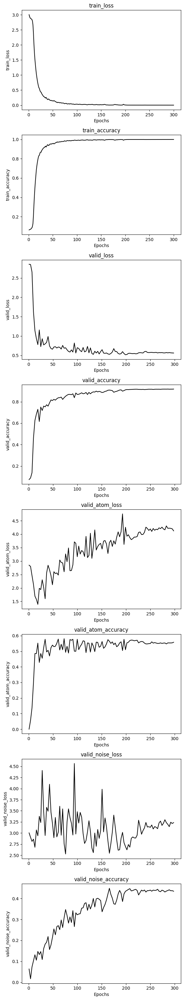

In [12]:
trainer.plot_training_metrics()

In [13]:
wandb.finish()

wandb: WARNING Source type is set to 'repo' but some required information is missing from the environment. A job will not be created from this run. See https://docs.wandb.ai/guides/launch/create-job


epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
records,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
train_accuracy,▁▃▆▇▇███████████████████████████████████
train_loss,█▆▃▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
valid_accuracy,▁▄▆▅▇▇▇▇▇▇▇█▇███████████████████████████
valid_atom_accuracy,▁▂▆▇▇▇▇▇█▇▆█▇▇▇█▇▇█▇█▇▇▇▇█▇▇████▇███▇▇▇▇
valid_atom_loss,▄▃▁▂▂▄▂▃▄▄▅▄▆▆▅▄▅▅▆▆▆▆▆▆▇▇▇▇▆▆▇▇▇▇██▇▇██
valid_loss,█▄▂▃▂▂▁▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
valid_noise_accuracy,▁▂▂▃▃▄▄▄▅▅▆▅▆▆▇▆▆▇▆▇▆▇█▇▇█████▇█████████
valid_noise_loss,▃▂▄▅▅▆▅▅▃▆▄▆▃▆▅▃▄▂▃▄█▄▁▅▁▁▂▂▃▃▅▃▄▄▄▃▄▅▄▅
epoch,300


### 500K dataset

524792


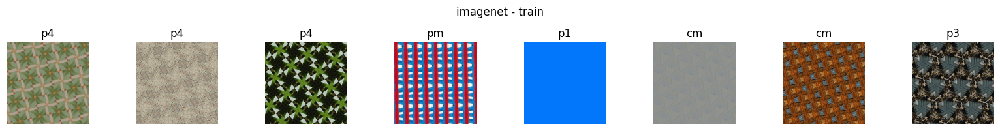

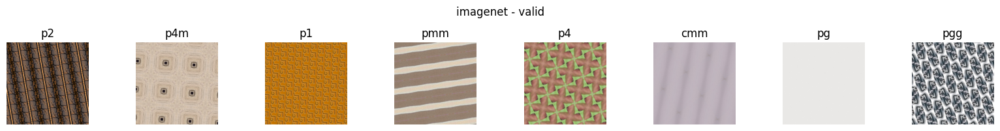

In [2]:
# imagenet
imagenet_ds = hdf5_dataset('../../datasets/imagenet_v5_rot_10m.h5', folder='train', transform=transforms.ToTensor())
_, imagenet_ds = split_train_valid(imagenet_ds, 0.951, seed=42) # model can't process single image batch
print(len(imagenet_ds))
train_ds, valid_ds = split_train_valid(imagenet_ds, 0.8, seed=42)
train_dl = DataLoader(train_ds, batch_size=bs, shuffle=True, num_workers=n_cpus)
viz_dataloader(train_dl, label_converter=label_converter, title='imagenet - train')
valid_dl = DataLoader(valid_ds, batch_size=bs, shuffle=False, num_workers=n_cpus)
viz_dataloader(valid_dl, label_converter=label_converter, title='imagenet - valid')

In [3]:
model = fpn_resnet50_classification(in_channels=3, n_classes=17)
outputs = model(torch.randn(2,3,256,256))
print(outputs.shape)
model = torch.nn.DataParallel(model, device_ids=[3,5,6,8])
device = torch.device('cuda:3')
# model

/home/yichen/anaconda3/envs/symmetry/lib/python3.10/site-packages/torch/nn/functional.py:3769: UserWarning: nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.")


torch.Size([2, 17])


In [4]:
config = {'dataset': '500k datasets',
          'loss_func': 'CrossEntropyLoss', # nn.MSELoss()
          'optimizer': 'Adam',
          'scheduler': 'OneCycleLR'}
NAME = '09252024-FPN-dataset_v5_size-500k'
wandb.login()
proj_name = 'Understanding-Experimental-Images-by-Identifying-Symmetries-with-Deep-Learning'
wandb.init(project=proj_name, entity='yig319', name=NAME, id=NAME, group='dataset_v5_size_vs_records-FPN', save_code=True, config=config, resume='allow')
config = wandb.config

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: yig319. Use `wandb login --relogin` to force relogin


In [5]:
lr = 1e-3
per_epoch = 5
epoch_start = 0
epochs = 200
loss_func = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, epochs=epochs, max_lr=lr, steps_per_epoch=len(train_dl))
metrics = [accuracy]  # You can add more metrics if needed
trainer = Trainer(model=model, loss_func=loss_func, optimizer=optimizer, metrics=metrics, scheduler=scheduler, 
                  device=device, save_per_epochs=per_epoch, model_path=f'../../saved_models/{NAME}/', early_stopping_patience=None)

history = trainer.train(train_dl=train_dl, epochs=epochs, epoch_start=epoch_start, valid_per_epochs=per_epoch,
                        valid_dl_list=[valid_dl, atom_dl, noise_dl], valid_dl_names=['', 'atom', 'noise'], tracking=True)

Epoch 1/200


  0%|          | 0/175 [00:00<?, ?it/s]/home/yichen/anaconda3/envs/symmetry/lib/python3.10/site-packages/torch/nn/functional.py:3769: UserWarning: nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.")
100%|██████████| 175/175 [05:21<00:00,  1.84s/it]


train_loss: 2.9345, train_accuracy: 6.55%
Epoch 2/200


100%|██████████| 175/175 [05:06<00:00,  1.75s/it]


train_loss: 2.7698, train_accuracy: 10.33%
Epoch 3/200


100%|██████████| 175/175 [05:11<00:00,  1.78s/it]


train_loss: 1.9829, train_accuracy: 35.14%
Epoch 4/200


100%|██████████| 175/175 [05:06<00:00,  1.75s/it]


train_loss: 1.2867, train_accuracy: 60.40%
Epoch 5/200


100%|██████████| 175/175 [05:06<00:00,  1.75s/it]


train_loss: 0.9404, train_accuracy: 71.86%


100%|██████████| 44/44 [00:54<00:00,  1.23s/it]


valid_loss: 0.7559, valid_accuracy: 75.90%


100%|██████████| 85/85 [01:42<00:00,  1.20s/it]


valid_atom_loss: 1.5912, valid_atom_accuracy: 48.13%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 2.6489, valid_noise_accuracy: 17.13%
Model saved at epoch 5
Epoch 6/200


100%|██████████| 175/175 [05:05<00:00,  1.75s/it]


train_loss: 0.7371, train_accuracy: 77.70%
Epoch 7/200


100%|██████████| 175/175 [05:05<00:00,  1.75s/it]


train_loss: 0.6047, train_accuracy: 81.52%
Epoch 8/200


100%|██████████| 175/175 [05:19<00:00,  1.82s/it]


train_loss: 0.5113, train_accuracy: 84.21%
Epoch 9/200


100%|██████████| 175/175 [05:21<00:00,  1.84s/it]


train_loss: 0.4372, train_accuracy: 86.50%
Epoch 10/200


100%|██████████| 175/175 [05:22<00:00,  1.84s/it]


train_loss: 0.3768, train_accuracy: 88.23%


100%|██████████| 44/44 [00:59<00:00,  1.36s/it]


valid_loss: 0.4242, valid_accuracy: 85.21%


100%|██████████| 85/85 [01:49<00:00,  1.29s/it]


valid_atom_loss: 1.6113, valid_atom_accuracy: 57.01%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 3.0910, valid_noise_accuracy: 16.82%
Model saved at epoch 10
Epoch 11/200


100%|██████████| 175/175 [05:07<00:00,  1.76s/it]


train_loss: 0.3329, train_accuracy: 89.48%
Epoch 12/200


100%|██████████| 175/175 [05:07<00:00,  1.76s/it]


train_loss: 0.2897, train_accuracy: 90.84%
Epoch 13/200


100%|██████████| 175/175 [05:07<00:00,  1.76s/it]


train_loss: 0.2643, train_accuracy: 91.55%
Epoch 14/200


100%|██████████| 175/175 [05:10<00:00,  1.77s/it]


train_loss: 0.2475, train_accuracy: 91.96%
Epoch 15/200


100%|██████████| 175/175 [05:09<00:00,  1.77s/it]


train_loss: 0.2184, train_accuracy: 92.88%


100%|██████████| 44/44 [00:54<00:00,  1.24s/it]


valid_loss: 0.2997, valid_accuracy: 89.78%


100%|██████████| 85/85 [01:42<00:00,  1.20s/it]


valid_atom_loss: 1.5618, valid_atom_accuracy: 62.06%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 3.5282, valid_noise_accuracy: 15.08%
Model saved at epoch 15
Epoch 16/200


100%|██████████| 175/175 [05:05<00:00,  1.75s/it]


train_loss: 0.2133, train_accuracy: 93.03%
Epoch 17/200


100%|██████████| 175/175 [05:06<00:00,  1.75s/it]


train_loss: 0.2044, train_accuracy: 93.39%
Epoch 18/200


100%|██████████| 175/175 [05:09<00:00,  1.77s/it]


train_loss: 0.1775, train_accuracy: 94.24%
Epoch 19/200


100%|██████████| 175/175 [05:05<00:00,  1.75s/it]


train_loss: 0.1638, train_accuracy: 94.60%
Epoch 20/200


100%|██████████| 175/175 [05:08<00:00,  1.77s/it]


train_loss: 0.1564, train_accuracy: 94.93%


100%|██████████| 44/44 [00:53<00:00,  1.22s/it]


valid_loss: 0.2255, valid_accuracy: 92.46%


100%|██████████| 85/85 [01:41<00:00,  1.19s/it]


valid_atom_loss: 1.7263, valid_atom_accuracy: 62.45%


100%|██████████| 43/43 [00:53<00:00,  1.25s/it]


valid_noise_loss: 2.0823, valid_noise_accuracy: 37.31%
Model saved at epoch 20
Epoch 21/200


100%|██████████| 175/175 [05:05<00:00,  1.75s/it]


train_loss: 0.1448, train_accuracy: 95.33%
Epoch 22/200


100%|██████████| 175/175 [05:09<00:00,  1.77s/it]


train_loss: 0.1370, train_accuracy: 95.60%
Epoch 23/200


100%|██████████| 175/175 [05:05<00:00,  1.75s/it]


train_loss: 0.1325, train_accuracy: 95.74%
Epoch 24/200


100%|██████████| 175/175 [05:05<00:00,  1.75s/it]


train_loss: 0.1398, train_accuracy: 95.53%
Epoch 25/200


100%|██████████| 175/175 [05:05<00:00,  1.75s/it]


train_loss: 0.1286, train_accuracy: 95.96%


100%|██████████| 44/44 [00:54<00:00,  1.24s/it]


valid_loss: 0.2314, valid_accuracy: 92.26%


100%|██████████| 85/85 [01:43<00:00,  1.21s/it]


valid_atom_loss: 1.3488, valid_atom_accuracy: 66.43%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 2.2607, valid_noise_accuracy: 37.17%
Model saved at epoch 25
Epoch 26/200


100%|██████████| 175/175 [05:05<00:00,  1.75s/it]


train_loss: 0.1065, train_accuracy: 96.66%
Epoch 27/200


100%|██████████| 175/175 [05:06<00:00,  1.75s/it]


train_loss: 0.0979, train_accuracy: 96.94%
Epoch 28/200


100%|██████████| 175/175 [05:10<00:00,  1.77s/it]


train_loss: 0.0951, train_accuracy: 96.97%
Epoch 29/200


100%|██████████| 175/175 [05:06<00:00,  1.75s/it]


train_loss: 0.0869, train_accuracy: 97.31%
Epoch 30/200


100%|██████████| 175/175 [05:06<00:00,  1.75s/it]


train_loss: 0.0835, train_accuracy: 97.39%


100%|██████████| 44/44 [00:54<00:00,  1.23s/it]


valid_loss: 0.1685, valid_accuracy: 95.02%


100%|██████████| 85/85 [01:41<00:00,  1.20s/it]


valid_atom_loss: 2.0413, valid_atom_accuracy: 59.72%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 1.5738, valid_noise_accuracy: 53.08%
Model saved at epoch 30
Epoch 31/200


100%|██████████| 175/175 [05:05<00:00,  1.75s/it]


train_loss: 0.0809, train_accuracy: 97.51%
Epoch 32/200


100%|██████████| 175/175 [05:05<00:00,  1.75s/it]


train_loss: 0.0744, train_accuracy: 97.73%
Epoch 33/200


100%|██████████| 175/175 [05:06<00:00,  1.75s/it]


train_loss: 0.0716, train_accuracy: 97.79%
Epoch 34/200


100%|██████████| 175/175 [05:05<00:00,  1.75s/it]


train_loss: 0.0723, train_accuracy: 97.77%
Epoch 35/200


100%|██████████| 175/175 [05:15<00:00,  1.80s/it]


train_loss: 0.0638, train_accuracy: 98.05%


100%|██████████| 44/44 [00:54<00:00,  1.25s/it]


valid_loss: 0.1572, valid_accuracy: 95.61%


100%|██████████| 85/85 [01:48<00:00,  1.27s/it]


valid_atom_loss: 1.6617, valid_atom_accuracy: 68.82%


100%|██████████| 43/43 [00:56<00:00,  1.32s/it]


valid_noise_loss: 1.2515, valid_noise_accuracy: 63.40%
Model saved at epoch 35
Epoch 36/200


100%|██████████| 175/175 [05:09<00:00,  1.77s/it]


train_loss: 0.0605, train_accuracy: 98.14%
Epoch 37/200


100%|██████████| 175/175 [05:05<00:00,  1.75s/it]


train_loss: 0.0589, train_accuracy: 98.18%
Epoch 38/200


100%|██████████| 175/175 [05:07<00:00,  1.76s/it]


train_loss: 0.0597, train_accuracy: 98.14%
Epoch 39/200


100%|██████████| 175/175 [05:06<00:00,  1.75s/it]


train_loss: 0.0566, train_accuracy: 98.24%
Epoch 40/200


100%|██████████| 175/175 [05:08<00:00,  1.77s/it]


train_loss: 0.0504, train_accuracy: 98.42%


100%|██████████| 44/44 [00:54<00:00,  1.25s/it]


valid_loss: 0.1271, valid_accuracy: 96.36%


100%|██████████| 85/85 [01:43<00:00,  1.21s/it]


valid_atom_loss: 2.1908, valid_atom_accuracy: 62.86%


100%|██████████| 43/43 [00:52<00:00,  1.21s/it]


valid_noise_loss: 1.1470, valid_noise_accuracy: 64.72%
Model saved at epoch 40
Epoch 41/200


100%|██████████| 175/175 [05:05<00:00,  1.75s/it]


train_loss: 0.0510, train_accuracy: 98.40%
Epoch 42/200


100%|██████████| 175/175 [05:05<00:00,  1.75s/it]


train_loss: 0.0468, train_accuracy: 98.54%
Epoch 43/200


100%|██████████| 175/175 [05:05<00:00,  1.75s/it]


train_loss: 0.0454, train_accuracy: 98.58%
Epoch 44/200


100%|██████████| 175/175 [05:05<00:00,  1.75s/it]


train_loss: 0.0449, train_accuracy: 98.57%
Epoch 45/200


100%|██████████| 175/175 [05:05<00:00,  1.75s/it]


train_loss: 0.0437, train_accuracy: 98.61%


100%|██████████| 44/44 [00:53<00:00,  1.23s/it]


valid_loss: 0.1368, valid_accuracy: 96.08%


100%|██████████| 85/85 [01:43<00:00,  1.22s/it]


valid_atom_loss: 1.8758, valid_atom_accuracy: 64.10%


100%|██████████| 43/43 [00:55<00:00,  1.28s/it]


valid_noise_loss: 1.3645, valid_noise_accuracy: 62.40%
Model saved at epoch 45
Epoch 46/200


100%|██████████| 175/175 [05:09<00:00,  1.77s/it]


train_loss: 0.0423, train_accuracy: 98.67%
Epoch 47/200


100%|██████████| 175/175 [05:05<00:00,  1.75s/it]


train_loss: 0.0404, train_accuracy: 98.73%
Epoch 48/200


100%|██████████| 175/175 [05:09<00:00,  1.77s/it]


train_loss: 0.0367, train_accuracy: 98.83%
Epoch 49/200


100%|██████████| 175/175 [05:13<00:00,  1.79s/it]


train_loss: 0.0362, train_accuracy: 98.84%
Epoch 50/200


100%|██████████| 175/175 [05:06<00:00,  1.75s/it]


train_loss: 0.0352, train_accuracy: 98.87%


100%|██████████| 44/44 [00:53<00:00,  1.22s/it]


valid_loss: 0.1287, valid_accuracy: 96.90%


100%|██████████| 85/85 [01:43<00:00,  1.21s/it]


valid_atom_loss: 2.1079, valid_atom_accuracy: 64.23%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 1.0946, valid_noise_accuracy: 69.81%
Model saved at epoch 50
Epoch 51/200


100%|██████████| 175/175 [05:05<00:00,  1.75s/it]


train_loss: 0.0344, train_accuracy: 98.89%
Epoch 52/200


100%|██████████| 175/175 [05:05<00:00,  1.75s/it]


train_loss: 0.0334, train_accuracy: 98.93%
Epoch 53/200


100%|██████████| 175/175 [05:05<00:00,  1.75s/it]


train_loss: 0.0321, train_accuracy: 98.96%
Epoch 54/200


100%|██████████| 175/175 [05:07<00:00,  1.76s/it]


train_loss: 0.0314, train_accuracy: 98.99%
Epoch 55/200


100%|██████████| 175/175 [05:05<00:00,  1.75s/it]


train_loss: 0.0294, train_accuracy: 99.05%


100%|██████████| 44/44 [00:53<00:00,  1.22s/it]


valid_loss: 0.1065, valid_accuracy: 97.34%


100%|██████████| 85/85 [01:43<00:00,  1.21s/it]


valid_atom_loss: 1.9001, valid_atom_accuracy: 65.88%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 0.8197, valid_noise_accuracy: 76.08%
Model saved at epoch 55
Epoch 56/200


100%|██████████| 175/175 [05:06<00:00,  1.75s/it]


train_loss: 0.0273, train_accuracy: 99.11%
Epoch 57/200


100%|██████████| 175/175 [05:05<00:00,  1.75s/it]


train_loss: 0.0286, train_accuracy: 99.07%
Epoch 58/200


100%|██████████| 175/175 [05:05<00:00,  1.75s/it]


train_loss: 0.0265, train_accuracy: 99.15%
Epoch 59/200


100%|██████████| 175/175 [05:05<00:00,  1.74s/it]


train_loss: 0.0248, train_accuracy: 99.19%
Epoch 60/200


100%|██████████| 175/175 [05:05<00:00,  1.75s/it]


train_loss: 0.0245, train_accuracy: 99.21%


100%|██████████| 44/44 [00:53<00:00,  1.23s/it]


valid_loss: 0.1194, valid_accuracy: 97.29%


100%|██████████| 85/85 [01:41<00:00,  1.20s/it]


valid_atom_loss: 2.4548, valid_atom_accuracy: 65.78%


100%|██████████| 43/43 [00:53<00:00,  1.24s/it]


valid_noise_loss: 0.7679, valid_noise_accuracy: 77.90%
Model saved at epoch 60
Epoch 61/200


100%|██████████| 175/175 [05:05<00:00,  1.74s/it]


train_loss: 0.0240, train_accuracy: 99.23%
Epoch 62/200


100%|██████████| 175/175 [05:10<00:00,  1.77s/it]


train_loss: 0.0227, train_accuracy: 99.27%
Epoch 63/200


100%|██████████| 175/175 [05:05<00:00,  1.75s/it]


train_loss: 0.0223, train_accuracy: 99.28%
Epoch 64/200


100%|██████████| 175/175 [05:05<00:00,  1.75s/it]


train_loss: 0.0197, train_accuracy: 99.36%
Epoch 65/200


100%|██████████| 175/175 [05:06<00:00,  1.75s/it]


train_loss: 0.0204, train_accuracy: 99.35%


100%|██████████| 44/44 [00:54<00:00,  1.23s/it]


valid_loss: 0.1248, valid_accuracy: 97.22%


100%|██████████| 85/85 [01:41<00:00,  1.20s/it]


valid_atom_loss: 2.7200, valid_atom_accuracy: 62.28%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 0.7773, valid_noise_accuracy: 79.07%
Model saved at epoch 65
Epoch 66/200


100%|██████████| 175/175 [05:05<00:00,  1.74s/it]


train_loss: 0.0198, train_accuracy: 99.36%
Epoch 67/200


100%|██████████| 175/175 [05:05<00:00,  1.75s/it]


train_loss: 0.0210, train_accuracy: 99.32%
Epoch 68/200


100%|██████████| 175/175 [05:06<00:00,  1.75s/it]


train_loss: 0.0179, train_accuracy: 99.42%
Epoch 69/200


100%|██████████| 175/175 [05:08<00:00,  1.77s/it]


train_loss: 0.0182, train_accuracy: 99.42%
Epoch 70/200


100%|██████████| 175/175 [05:09<00:00,  1.77s/it]


train_loss: 0.0188, train_accuracy: 99.40%


100%|██████████| 44/44 [00:54<00:00,  1.23s/it]


valid_loss: 0.1244, valid_accuracy: 97.03%


100%|██████████| 85/85 [01:41<00:00,  1.20s/it]


valid_atom_loss: 2.2857, valid_atom_accuracy: 64.72%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 0.9807, valid_noise_accuracy: 75.96%
Model saved at epoch 70
Epoch 71/200


100%|██████████| 175/175 [05:08<00:00,  1.76s/it]


train_loss: 0.0180, train_accuracy: 99.42%
Epoch 72/200


100%|██████████| 175/175 [05:08<00:00,  1.76s/it]


train_loss: 0.0169, train_accuracy: 99.45%
Epoch 73/200


100%|██████████| 175/175 [05:05<00:00,  1.75s/it]


train_loss: 0.0153, train_accuracy: 99.51%
Epoch 74/200


100%|██████████| 175/175 [05:08<00:00,  1.76s/it]


train_loss: 0.0172, train_accuracy: 99.46%
Epoch 75/200


100%|██████████| 175/175 [05:06<00:00,  1.75s/it]


train_loss: 0.0140, train_accuracy: 99.55%


100%|██████████| 44/44 [00:56<00:00,  1.29s/it]


valid_loss: 0.1230, valid_accuracy: 97.53%


100%|██████████| 85/85 [01:50<00:00,  1.30s/it]


valid_atom_loss: 2.8499, valid_atom_accuracy: 63.19%


100%|██████████| 43/43 [00:55<00:00,  1.29s/it]


valid_noise_loss: 0.7089, valid_noise_accuracy: 81.96%
Model saved at epoch 75
Epoch 76/200


100%|██████████| 175/175 [05:08<00:00,  1.76s/it]


train_loss: 0.0161, train_accuracy: 99.48%
Epoch 77/200


100%|██████████| 175/175 [05:06<00:00,  1.75s/it]


train_loss: 0.0126, train_accuracy: 99.59%
Epoch 78/200


100%|██████████| 175/175 [05:05<00:00,  1.75s/it]


train_loss: 0.0144, train_accuracy: 99.54%
Epoch 79/200


100%|██████████| 175/175 [05:06<00:00,  1.75s/it]


train_loss: 0.0136, train_accuracy: 99.56%
Epoch 80/200


100%|██████████| 175/175 [05:05<00:00,  1.75s/it]


train_loss: 0.0142, train_accuracy: 99.55%


100%|██████████| 44/44 [00:55<00:00,  1.25s/it]


valid_loss: 0.1163, valid_accuracy: 97.68%


100%|██████████| 85/85 [01:42<00:00,  1.21s/it]


valid_atom_loss: 2.2170, valid_atom_accuracy: 69.04%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 0.7230, valid_noise_accuracy: 81.88%
Model saved at epoch 80
Epoch 81/200


100%|██████████| 175/175 [05:05<00:00,  1.75s/it]


train_loss: 0.0143, train_accuracy: 99.55%
Epoch 82/200


100%|██████████| 175/175 [05:05<00:00,  1.74s/it]


train_loss: 0.0137, train_accuracy: 99.57%
Epoch 83/200


100%|██████████| 175/175 [05:05<00:00,  1.74s/it]


train_loss: 0.0132, train_accuracy: 99.59%
Epoch 84/200


100%|██████████| 175/175 [05:09<00:00,  1.77s/it]


train_loss: 0.0131, train_accuracy: 99.60%
Epoch 85/200


100%|██████████| 175/175 [05:05<00:00,  1.75s/it]


train_loss: 0.0100, train_accuracy: 99.68%


100%|██████████| 44/44 [00:53<00:00,  1.23s/it]


valid_loss: 0.1045, valid_accuracy: 97.95%


100%|██████████| 85/85 [01:42<00:00,  1.20s/it]


valid_atom_loss: 3.0111, valid_atom_accuracy: 64.30%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 0.8239, valid_noise_accuracy: 80.86%
Model saved at epoch 85
Epoch 86/200


100%|██████████| 175/175 [05:09<00:00,  1.77s/it]


train_loss: 0.0122, train_accuracy: 99.62%
Epoch 87/200


100%|██████████| 175/175 [05:05<00:00,  1.74s/it]


train_loss: 0.0108, train_accuracy: 99.65%
Epoch 88/200


100%|██████████| 175/175 [05:05<00:00,  1.75s/it]


train_loss: 0.0102, train_accuracy: 99.68%
Epoch 89/200


100%|██████████| 175/175 [05:05<00:00,  1.75s/it]


train_loss: 0.0116, train_accuracy: 99.63%
Epoch 90/200


100%|██████████| 175/175 [05:05<00:00,  1.74s/it]


train_loss: 0.0117, train_accuracy: 99.63%


100%|██████████| 44/44 [00:54<00:00,  1.23s/it]


valid_loss: 0.1039, valid_accuracy: 97.86%


100%|██████████| 85/85 [01:41<00:00,  1.20s/it]


valid_atom_loss: 2.3907, valid_atom_accuracy: 67.56%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 0.7042, valid_noise_accuracy: 82.80%
Model saved at epoch 90
Epoch 91/200


100%|██████████| 175/175 [05:05<00:00,  1.75s/it]


train_loss: 0.0111, train_accuracy: 99.65%
Epoch 92/200


100%|██████████| 175/175 [05:05<00:00,  1.75s/it]


train_loss: 0.0106, train_accuracy: 99.66%
Epoch 93/200


100%|██████████| 175/175 [05:05<00:00,  1.75s/it]


train_loss: 0.0106, train_accuracy: 99.67%
Epoch 94/200


100%|██████████| 175/175 [05:08<00:00,  1.76s/it]


train_loss: 0.0087, train_accuracy: 99.73%
Epoch 95/200


100%|██████████| 175/175 [05:05<00:00,  1.75s/it]


train_loss: 0.0105, train_accuracy: 99.67%


100%|██████████| 44/44 [00:53<00:00,  1.22s/it]


valid_loss: 0.1002, valid_accuracy: 98.05%


100%|██████████| 85/85 [01:41<00:00,  1.20s/it]


valid_atom_loss: 2.5240, valid_atom_accuracy: 65.73%


100%|██████████| 43/43 [00:53<00:00,  1.24s/it]


valid_noise_loss: 0.6131, valid_noise_accuracy: 84.74%
Model saved at epoch 95
Epoch 96/200


100%|██████████| 175/175 [05:05<00:00,  1.74s/it]


train_loss: 0.0085, train_accuracy: 99.74%
Epoch 97/200


100%|██████████| 175/175 [05:05<00:00,  1.75s/it]


train_loss: 0.0076, train_accuracy: 99.77%
Epoch 98/200


100%|██████████| 175/175 [05:09<00:00,  1.77s/it]


train_loss: 0.0069, train_accuracy: 99.78%
Epoch 99/200


100%|██████████| 175/175 [05:10<00:00,  1.77s/it]


train_loss: 0.0088, train_accuracy: 99.72%
Epoch 100/200


100%|██████████| 175/175 [05:05<00:00,  1.75s/it]


train_loss: 0.0090, train_accuracy: 99.72%


100%|██████████| 44/44 [00:53<00:00,  1.22s/it]


valid_loss: 0.1043, valid_accuracy: 98.17%


100%|██████████| 85/85 [01:42<00:00,  1.21s/it]


valid_atom_loss: 2.9932, valid_atom_accuracy: 65.50%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 0.5822, valid_noise_accuracy: 86.71%
Model saved at epoch 100
Epoch 101/200


100%|██████████| 175/175 [05:05<00:00,  1.74s/it]


train_loss: 0.0086, train_accuracy: 99.73%
Epoch 102/200


100%|██████████| 175/175 [05:05<00:00,  1.74s/it]


train_loss: 0.0075, train_accuracy: 99.77%
Epoch 103/200


100%|██████████| 175/175 [05:05<00:00,  1.75s/it]


train_loss: 0.0063, train_accuracy: 99.80%
Epoch 104/200


100%|██████████| 175/175 [05:05<00:00,  1.75s/it]


train_loss: 0.0067, train_accuracy: 99.79%
Epoch 105/200


100%|██████████| 175/175 [05:06<00:00,  1.75s/it]


train_loss: 0.0077, train_accuracy: 99.76%


100%|██████████| 44/44 [00:53<00:00,  1.22s/it]


valid_loss: 0.1042, valid_accuracy: 98.13%


100%|██████████| 85/85 [01:41<00:00,  1.20s/it]


valid_atom_loss: 2.9017, valid_atom_accuracy: 64.79%


100%|██████████| 43/43 [00:53<00:00,  1.23s/it]


valid_noise_loss: 0.7316, valid_noise_accuracy: 85.17%
Model saved at epoch 105
Epoch 106/200


100%|██████████| 175/175 [05:10<00:00,  1.77s/it]


train_loss: 0.0071, train_accuracy: 99.78%
Epoch 107/200


100%|██████████| 175/175 [05:05<00:00,  1.75s/it]


train_loss: 0.0070, train_accuracy: 99.78%
Epoch 108/200


100%|██████████| 175/175 [05:05<00:00,  1.75s/it]


train_loss: 0.0080, train_accuracy: 99.76%
Epoch 109/200


100%|██████████| 175/175 [05:12<00:00,  1.78s/it]


train_loss: 0.0057, train_accuracy: 99.82%
Epoch 110/200


100%|██████████| 175/175 [05:09<00:00,  1.77s/it]


train_loss: 0.0065, train_accuracy: 99.80%


100%|██████████| 44/44 [00:58<00:00,  1.32s/it]


valid_loss: 0.1192, valid_accuracy: 97.97%


100%|██████████| 85/85 [01:45<00:00,  1.24s/it]


valid_atom_loss: 3.2996, valid_atom_accuracy: 64.93%


100%|██████████| 43/43 [00:54<00:00,  1.26s/it]


valid_noise_loss: 0.5702, valid_noise_accuracy: 86.38%
Model saved at epoch 110
Epoch 111/200


100%|██████████| 175/175 [05:12<00:00,  1.78s/it]


train_loss: 0.0055, train_accuracy: 99.82%
Epoch 112/200


100%|██████████| 175/175 [05:10<00:00,  1.78s/it]


train_loss: 0.0056, train_accuracy: 99.82%
Epoch 113/200


100%|██████████| 175/175 [05:15<00:00,  1.80s/it]


train_loss: 0.0056, train_accuracy: 99.82%
Epoch 114/200


100%|██████████| 175/175 [05:10<00:00,  1.78s/it]


train_loss: 0.0054, train_accuracy: 99.84%
Epoch 115/200


100%|██████████| 175/175 [05:11<00:00,  1.78s/it]


train_loss: 0.0048, train_accuracy: 99.85%


100%|██████████| 44/44 [00:55<00:00,  1.27s/it]


valid_loss: 0.1114, valid_accuracy: 98.15%


100%|██████████| 85/85 [01:45<00:00,  1.24s/it]


valid_atom_loss: 3.5662, valid_atom_accuracy: 62.62%


100%|██████████| 43/43 [00:54<00:00,  1.27s/it]


valid_noise_loss: 0.7004, valid_noise_accuracy: 85.32%
Model saved at epoch 115
Epoch 116/200


100%|██████████| 175/175 [05:10<00:00,  1.78s/it]


train_loss: 0.0061, train_accuracy: 99.81%
Epoch 117/200


100%|██████████| 175/175 [05:11<00:00,  1.78s/it]


train_loss: 0.0065, train_accuracy: 99.80%
Epoch 118/200


100%|██████████| 175/175 [05:11<00:00,  1.78s/it]


train_loss: 0.0054, train_accuracy: 99.83%
Epoch 119/200


100%|██████████| 175/175 [05:10<00:00,  1.78s/it]


train_loss: 0.0056, train_accuracy: 99.82%
Epoch 120/200


100%|██████████| 175/175 [05:12<00:00,  1.79s/it]


train_loss: 0.0054, train_accuracy: 99.83%


100%|██████████| 44/44 [00:58<00:00,  1.33s/it]


valid_loss: 0.1165, valid_accuracy: 98.07%


100%|██████████| 85/85 [01:51<00:00,  1.31s/it]


valid_atom_loss: 2.8207, valid_atom_accuracy: 68.33%


100%|██████████| 43/43 [00:54<00:00,  1.27s/it]


valid_noise_loss: 0.6876, valid_noise_accuracy: 86.17%
Model saved at epoch 120
Epoch 121/200


100%|██████████| 175/175 [05:11<00:00,  1.78s/it]


train_loss: 0.0058, train_accuracy: 99.82%
Epoch 122/200


100%|██████████| 175/175 [05:10<00:00,  1.78s/it]


train_loss: 0.0053, train_accuracy: 99.83%
Epoch 123/200


100%|██████████| 175/175 [05:17<00:00,  1.81s/it]


train_loss: 0.0045, train_accuracy: 99.86%
Epoch 124/200


100%|██████████| 175/175 [05:10<00:00,  1.78s/it]


train_loss: 0.0046, train_accuracy: 99.86%
Epoch 125/200


100%|██████████| 175/175 [05:10<00:00,  1.77s/it]


train_loss: 0.0045, train_accuracy: 99.86%


100%|██████████| 44/44 [00:55<00:00,  1.26s/it]


valid_loss: 0.1106, valid_accuracy: 98.27%


100%|██████████| 85/85 [01:44<00:00,  1.23s/it]


valid_atom_loss: 3.0448, valid_atom_accuracy: 67.13%


100%|██████████| 43/43 [00:53<00:00,  1.25s/it]


valid_noise_loss: 0.6633, valid_noise_accuracy: 86.99%
Model saved at epoch 125
Epoch 126/200


100%|██████████| 175/175 [05:15<00:00,  1.80s/it]


train_loss: 0.0038, train_accuracy: 99.88%
Epoch 127/200


100%|██████████| 175/175 [05:10<00:00,  1.77s/it]


train_loss: 0.0065, train_accuracy: 99.80%
Epoch 128/200


100%|██████████| 175/175 [05:10<00:00,  1.78s/it]


train_loss: 0.0049, train_accuracy: 99.85%
Epoch 129/200


100%|██████████| 175/175 [05:10<00:00,  1.78s/it]


train_loss: 0.0038, train_accuracy: 99.88%
Epoch 130/200


100%|██████████| 175/175 [05:13<00:00,  1.79s/it]


train_loss: 0.0034, train_accuracy: 99.89%


100%|██████████| 44/44 [00:55<00:00,  1.26s/it]


valid_loss: 0.1069, valid_accuracy: 98.36%


100%|██████████| 85/85 [01:44<00:00,  1.23s/it]


valid_atom_loss: 2.8113, valid_atom_accuracy: 69.84%


100%|██████████| 43/43 [00:54<00:00,  1.26s/it]


valid_noise_loss: 0.6645, valid_noise_accuracy: 86.91%
Model saved at epoch 130
Epoch 131/200


100%|██████████| 175/175 [05:11<00:00,  1.78s/it]


train_loss: 0.0040, train_accuracy: 99.88%
Epoch 132/200


100%|██████████| 175/175 [05:10<00:00,  1.78s/it]


train_loss: 0.0039, train_accuracy: 99.88%
Epoch 133/200


100%|██████████| 175/175 [05:14<00:00,  1.79s/it]


train_loss: 0.0035, train_accuracy: 99.88%
Epoch 134/200


100%|██████████| 175/175 [05:13<00:00,  1.79s/it]


train_loss: 0.0039, train_accuracy: 99.88%
Epoch 135/200


100%|██████████| 175/175 [05:13<00:00,  1.79s/it]


train_loss: 0.0046, train_accuracy: 99.86%


100%|██████████| 44/44 [00:56<00:00,  1.29s/it]


valid_loss: 0.1224, valid_accuracy: 98.16%


100%|██████████| 85/85 [01:44<00:00,  1.23s/it]


valid_atom_loss: 3.3345, valid_atom_accuracy: 65.46%


100%|██████████| 43/43 [00:54<00:00,  1.26s/it]


valid_noise_loss: 0.6575, valid_noise_accuracy: 87.06%
Model saved at epoch 135
Epoch 136/200


100%|██████████| 175/175 [05:10<00:00,  1.78s/it]


train_loss: 0.0042, train_accuracy: 99.87%
Epoch 137/200


100%|██████████| 175/175 [05:11<00:00,  1.78s/it]


train_loss: 0.0030, train_accuracy: 99.90%
Epoch 138/200


100%|██████████| 175/175 [05:10<00:00,  1.78s/it]


train_loss: 0.0028, train_accuracy: 99.91%
Epoch 139/200


100%|██████████| 175/175 [05:11<00:00,  1.78s/it]


train_loss: 0.0028, train_accuracy: 99.91%
Epoch 140/200


100%|██████████| 175/175 [05:13<00:00,  1.79s/it]


train_loss: 0.0028, train_accuracy: 99.91%


100%|██████████| 44/44 [00:57<00:00,  1.32s/it]


valid_loss: 0.1070, valid_accuracy: 98.51%


100%|██████████| 85/85 [01:48<00:00,  1.27s/it]


valid_atom_loss: 3.2450, valid_atom_accuracy: 68.07%


100%|██████████| 43/43 [00:54<00:00,  1.28s/it]


valid_noise_loss: 0.6356, valid_noise_accuracy: 87.69%
Model saved at epoch 140
Epoch 141/200


100%|██████████| 175/175 [05:10<00:00,  1.78s/it]


train_loss: 0.0027, train_accuracy: 99.91%
Epoch 142/200


100%|██████████| 175/175 [05:10<00:00,  1.78s/it]


train_loss: 0.0027, train_accuracy: 99.91%
Epoch 143/200


100%|██████████| 175/175 [05:12<00:00,  1.78s/it]


train_loss: 0.0027, train_accuracy: 99.91%
Epoch 144/200


100%|██████████| 175/175 [05:12<00:00,  1.78s/it]


train_loss: 0.0027, train_accuracy: 99.91%
Epoch 145/200


100%|██████████| 175/175 [05:11<00:00,  1.78s/it]


train_loss: 0.0027, train_accuracy: 99.91%


100%|██████████| 44/44 [00:56<00:00,  1.30s/it]


valid_loss: 0.1092, valid_accuracy: 98.53%


100%|██████████| 85/85 [01:46<00:00,  1.26s/it]


valid_atom_loss: 3.3116, valid_atom_accuracy: 67.82%


100%|██████████| 43/43 [00:54<00:00,  1.27s/it]


valid_noise_loss: 0.6658, valid_noise_accuracy: 87.42%
Model saved at epoch 145
Epoch 146/200


100%|██████████| 175/175 [05:13<00:00,  1.79s/it]


train_loss: 0.0027, train_accuracy: 99.91%
Epoch 147/200


100%|██████████| 175/175 [05:10<00:00,  1.77s/it]


train_loss: 0.0026, train_accuracy: 99.91%
Epoch 148/200


100%|██████████| 175/175 [05:11<00:00,  1.78s/it]


train_loss: 0.0027, train_accuracy: 99.91%
Epoch 149/200


100%|██████████| 175/175 [05:13<00:00,  1.79s/it]


train_loss: 0.0026, train_accuracy: 99.91%
Epoch 150/200


100%|██████████| 175/175 [05:10<00:00,  1.77s/it]


train_loss: 0.0026, train_accuracy: 99.91%


100%|██████████| 44/44 [00:57<00:00,  1.32s/it]


valid_loss: 0.1089, valid_accuracy: 98.57%


100%|██████████| 85/85 [01:45<00:00,  1.24s/it]


valid_atom_loss: 3.3063, valid_atom_accuracy: 67.83%


100%|██████████| 43/43 [00:53<00:00,  1.25s/it]


valid_noise_loss: 0.6922, valid_noise_accuracy: 87.38%
Model saved at epoch 150
Epoch 151/200


100%|██████████| 175/175 [05:14<00:00,  1.80s/it]


train_loss: 0.0026, train_accuracy: 99.91%
Epoch 152/200


100%|██████████| 175/175 [05:11<00:00,  1.78s/it]


train_loss: 0.0026, train_accuracy: 99.91%
Epoch 153/200


100%|██████████| 175/175 [05:11<00:00,  1.78s/it]


train_loss: 0.0034, train_accuracy: 99.89%
Epoch 154/200


100%|██████████| 175/175 [05:12<00:00,  1.79s/it]


train_loss: 0.0060, train_accuracy: 99.81%
Epoch 155/200


100%|██████████| 175/175 [05:14<00:00,  1.80s/it]


train_loss: 0.0032, train_accuracy: 99.90%


100%|██████████| 44/44 [00:55<00:00,  1.27s/it]


valid_loss: 0.1086, valid_accuracy: 98.37%


100%|██████████| 85/85 [01:44<00:00,  1.23s/it]


valid_atom_loss: 3.3188, valid_atom_accuracy: 67.10%


100%|██████████| 43/43 [00:53<00:00,  1.25s/it]


valid_noise_loss: 0.6711, valid_noise_accuracy: 86.58%
Model saved at epoch 155
Epoch 156/200


100%|██████████| 175/175 [05:13<00:00,  1.79s/it]


train_loss: 0.0029, train_accuracy: 99.91%
Epoch 157/200


100%|██████████| 175/175 [05:11<00:00,  1.78s/it]


train_loss: 0.0028, train_accuracy: 99.91%
Epoch 158/200


100%|██████████| 175/175 [05:12<00:00,  1.79s/it]


train_loss: 0.0026, train_accuracy: 99.91%
Epoch 159/200


100%|██████████| 175/175 [05:11<00:00,  1.78s/it]


train_loss: 0.0025, train_accuracy: 99.91%
Epoch 160/200


100%|██████████| 175/175 [05:15<00:00,  1.80s/it]


train_loss: 0.0025, train_accuracy: 99.91%


100%|██████████| 44/44 [00:55<00:00,  1.27s/it]


valid_loss: 0.1069, valid_accuracy: 98.52%


100%|██████████| 85/85 [01:46<00:00,  1.26s/it]


valid_atom_loss: 3.2058, valid_atom_accuracy: 67.67%


100%|██████████| 43/43 [00:53<00:00,  1.25s/it]


valid_noise_loss: 0.6998, valid_noise_accuracy: 86.97%
Model saved at epoch 160
Epoch 161/200


100%|██████████| 175/175 [05:10<00:00,  1.77s/it]


train_loss: 0.0026, train_accuracy: 99.91%
Epoch 162/200


100%|██████████| 175/175 [05:13<00:00,  1.79s/it]


train_loss: 0.0025, train_accuracy: 99.91%
Epoch 163/200


100%|██████████| 175/175 [05:11<00:00,  1.78s/it]


train_loss: 0.0026, train_accuracy: 99.91%
Epoch 164/200


100%|██████████| 175/175 [05:17<00:00,  1.81s/it]


train_loss: 0.0026, train_accuracy: 99.91%
Epoch 165/200


100%|██████████| 175/175 [05:13<00:00,  1.79s/it]


train_loss: 0.0025, train_accuracy: 99.91%


100%|██████████| 44/44 [00:55<00:00,  1.27s/it]


valid_loss: 0.1091, valid_accuracy: 98.53%


100%|██████████| 85/85 [01:45<00:00,  1.24s/it]


valid_atom_loss: 3.4223, valid_atom_accuracy: 66.57%


100%|██████████| 43/43 [00:54<00:00,  1.26s/it]


valid_noise_loss: 0.7239, valid_noise_accuracy: 87.18%
Model saved at epoch 165
Epoch 166/200


100%|██████████| 175/175 [05:12<00:00,  1.78s/it]


train_loss: 0.0025, train_accuracy: 99.91%
Epoch 167/200


100%|██████████| 175/175 [05:12<00:00,  1.78s/it]


train_loss: 0.0025, train_accuracy: 99.91%
Epoch 168/200


100%|██████████| 175/175 [05:12<00:00,  1.79s/it]


train_loss: 0.0025, train_accuracy: 99.91%
Epoch 169/200


100%|██████████| 175/175 [05:17<00:00,  1.82s/it]


train_loss: 0.0025, train_accuracy: 99.91%
Epoch 170/200


100%|██████████| 175/175 [05:12<00:00,  1.78s/it]


train_loss: 0.0025, train_accuracy: 99.91%


100%|██████████| 44/44 [00:55<00:00,  1.27s/it]


valid_loss: 0.1075, valid_accuracy: 98.56%


100%|██████████| 85/85 [01:46<00:00,  1.26s/it]


valid_atom_loss: 3.4265, valid_atom_accuracy: 67.04%


100%|██████████| 43/43 [00:55<00:00,  1.28s/it]


valid_noise_loss: 0.7178, valid_noise_accuracy: 87.22%
Model saved at epoch 170
Epoch 171/200


100%|██████████| 175/175 [05:17<00:00,  1.81s/it]


train_loss: 0.0024, train_accuracy: 99.92%
Epoch 172/200


100%|██████████| 175/175 [05:12<00:00,  1.79s/it]


train_loss: 0.0025, train_accuracy: 99.91%
Epoch 173/200


100%|██████████| 175/175 [05:16<00:00,  1.81s/it]


train_loss: 0.0025, train_accuracy: 99.92%
Epoch 174/200


100%|██████████| 175/175 [05:17<00:00,  1.81s/it]


train_loss: 0.0024, train_accuracy: 99.92%
Epoch 175/200


100%|██████████| 175/175 [05:17<00:00,  1.81s/it]


train_loss: 0.0024, train_accuracy: 99.91%


100%|██████████| 44/44 [00:55<00:00,  1.27s/it]


valid_loss: 0.1098, valid_accuracy: 98.55%


100%|██████████| 85/85 [01:47<00:00,  1.27s/it]


valid_atom_loss: 3.5977, valid_atom_accuracy: 66.18%


100%|██████████| 43/43 [00:55<00:00,  1.28s/it]


valid_noise_loss: 0.7150, valid_noise_accuracy: 87.28%
Model saved at epoch 175
Epoch 176/200


100%|██████████| 175/175 [05:11<00:00,  1.78s/it]


train_loss: 0.0024, train_accuracy: 99.92%
Epoch 177/200


100%|██████████| 175/175 [05:11<00:00,  1.78s/it]


train_loss: 0.0024, train_accuracy: 99.92%
Epoch 178/200


100%|██████████| 175/175 [05:12<00:00,  1.79s/it]


train_loss: 0.0024, train_accuracy: 99.92%
Epoch 179/200


100%|██████████| 175/175 [05:17<00:00,  1.81s/it]


train_loss: 0.0024, train_accuracy: 99.92%
Epoch 180/200


100%|██████████| 175/175 [05:11<00:00,  1.78s/it]


train_loss: 0.0023, train_accuracy: 99.92%


100%|██████████| 44/44 [00:57<00:00,  1.32s/it]


valid_loss: 0.1085, valid_accuracy: 98.56%


100%|██████████| 85/85 [01:49<00:00,  1.28s/it]


valid_atom_loss: 3.4674, valid_atom_accuracy: 67.00%


100%|██████████| 43/43 [00:55<00:00,  1.30s/it]


valid_noise_loss: 0.7309, valid_noise_accuracy: 87.14%
Model saved at epoch 180
Epoch 181/200


100%|██████████| 175/175 [05:20<00:00,  1.83s/it]


train_loss: 0.0023, train_accuracy: 99.92%
Epoch 182/200


100%|██████████| 175/175 [05:17<00:00,  1.81s/it]


train_loss: 0.0024, train_accuracy: 99.92%
Epoch 183/200


100%|██████████| 175/175 [05:17<00:00,  1.81s/it]


train_loss: 0.0023, train_accuracy: 99.92%
Epoch 184/200


100%|██████████| 175/175 [05:12<00:00,  1.79s/it]


train_loss: 0.0023, train_accuracy: 99.92%
Epoch 185/200


100%|██████████| 175/175 [05:12<00:00,  1.78s/it]


train_loss: 0.0023, train_accuracy: 99.92%


100%|██████████| 44/44 [00:56<00:00,  1.29s/it]


valid_loss: 0.1102, valid_accuracy: 98.57%


100%|██████████| 85/85 [01:45<00:00,  1.24s/it]


valid_atom_loss: 3.6901, valid_atom_accuracy: 65.80%


100%|██████████| 43/43 [00:55<00:00,  1.29s/it]


valid_noise_loss: 0.7036, valid_noise_accuracy: 87.49%
Model saved at epoch 185
Epoch 186/200


100%|██████████| 175/175 [05:12<00:00,  1.79s/it]


train_loss: 0.0023, train_accuracy: 99.92%
Epoch 187/200


100%|██████████| 175/175 [05:13<00:00,  1.79s/it]


train_loss: 0.0022, train_accuracy: 99.92%
Epoch 188/200


100%|██████████| 175/175 [05:17<00:00,  1.81s/it]


train_loss: 0.0022, train_accuracy: 99.92%
Epoch 189/200


100%|██████████| 175/175 [05:13<00:00,  1.79s/it]


train_loss: 0.0022, train_accuracy: 99.92%
Epoch 190/200


100%|██████████| 175/175 [05:12<00:00,  1.79s/it]


train_loss: 0.0022, train_accuracy: 99.92%


100%|██████████| 44/44 [00:55<00:00,  1.27s/it]


valid_loss: 0.1108, valid_accuracy: 98.58%


100%|██████████| 85/85 [01:45<00:00,  1.24s/it]


valid_atom_loss: 3.6582, valid_atom_accuracy: 66.10%


100%|██████████| 43/43 [00:54<00:00,  1.26s/it]


valid_noise_loss: 0.7266, valid_noise_accuracy: 87.35%
Model saved at epoch 190
Epoch 191/200


100%|██████████| 175/175 [05:15<00:00,  1.80s/it]


train_loss: 0.0022, train_accuracy: 99.92%
Epoch 192/200


100%|██████████| 175/175 [05:11<00:00,  1.78s/it]


train_loss: 0.0022, train_accuracy: 99.92%
Epoch 193/200


100%|██████████| 175/175 [05:12<00:00,  1.79s/it]


train_loss: 0.0022, train_accuracy: 99.92%
Epoch 194/200


100%|██████████| 175/175 [05:17<00:00,  1.81s/it]


train_loss: 0.0022, train_accuracy: 99.92%
Epoch 195/200


100%|██████████| 175/175 [05:12<00:00,  1.78s/it]


train_loss: 0.0022, train_accuracy: 99.93%


100%|██████████| 44/44 [00:55<00:00,  1.27s/it]


valid_loss: 0.1096, valid_accuracy: 98.58%


100%|██████████| 85/85 [01:47<00:00,  1.27s/it]


valid_atom_loss: 3.5998, valid_atom_accuracy: 66.38%


100%|██████████| 43/43 [00:54<00:00,  1.26s/it]


valid_noise_loss: 0.7558, valid_noise_accuracy: 87.05%
Model saved at epoch 195
Epoch 196/200


100%|██████████| 175/175 [05:15<00:00,  1.80s/it]


train_loss: 0.0021, train_accuracy: 99.93%
Epoch 197/200


100%|██████████| 175/175 [05:16<00:00,  1.81s/it]


train_loss: 0.0022, train_accuracy: 99.92%
Epoch 198/200


100%|██████████| 175/175 [05:16<00:00,  1.81s/it]


train_loss: 0.0022, train_accuracy: 99.92%
Epoch 199/200


100%|██████████| 175/175 [05:16<00:00,  1.81s/it]


train_loss: 0.0022, train_accuracy: 99.93%
Epoch 200/200


100%|██████████| 175/175 [05:16<00:00,  1.81s/it]


train_loss: 0.0022, train_accuracy: 99.92%


100%|██████████| 44/44 [00:55<00:00,  1.27s/it]


valid_loss: 0.1083, valid_accuracy: 98.60%


100%|██████████| 85/85 [01:45<00:00,  1.24s/it]


valid_atom_loss: 3.5502, valid_atom_accuracy: 66.53%


100%|██████████| 43/43 [00:54<00:00,  1.28s/it]


valid_noise_loss: 0.7664, valid_noise_accuracy: 86.90%
Model saved at epoch 200


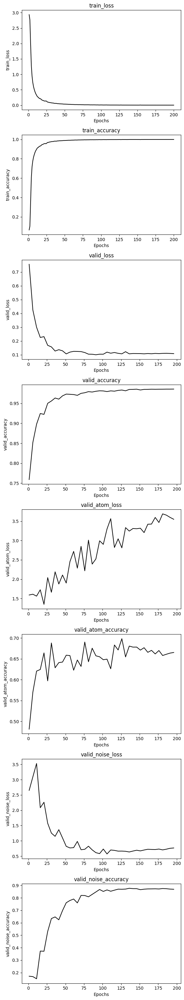

In [6]:
trainer.plot_training_metrics()

In [7]:
wandb.finish()

wandb: WARNING Source type is set to 'repo' but some required information is missing from the environment. A job will not be created from this run. See https://docs.wandb.ai/guides/launch/create-job


epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
records,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
train_accuracy,▁▅▇▇▇███████████████████████████████████
train_loss,█▄▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
valid_accuracy,▁▄▆▆▆▇▇▇▇▇▇▇█▇██████████████████████████
valid_atom_accuracy,▁▃▆▆▆▄▇▆▆▆▇▆▆▆▅█▆▇▆▇▆▆▅▇▇█▆▇▇▇▆▇▇▆▆▇▆▆▇▆
valid_atom_loss,▂▂▂▂▁▃▂▃▂▃▂▅▅▄▅▃▆▄▅▅▆▇█▅▆▅▆▇▆▇▇▆▇▇█▇██▇█
valid_loss,█▅▃▃▃▂▂▁▂▂▁▂▂▂▂▂▂▂▁▁▁▁▁▂▁▁▁▁▂▂▁▁▂▂▁▁▂▁▂▂
valid_noise_accuracy,▁▁▁▃▃▅▆▆▆▆▇▇▇▇▇▇▇▇██████████████████████
valid_noise_loss,▆▇█▅▅▃▃▂▃▂▂▁▂▂▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,200


### 1 million dataset

1070897


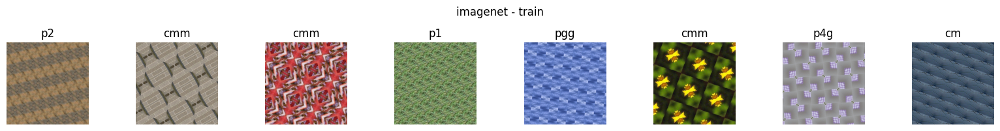

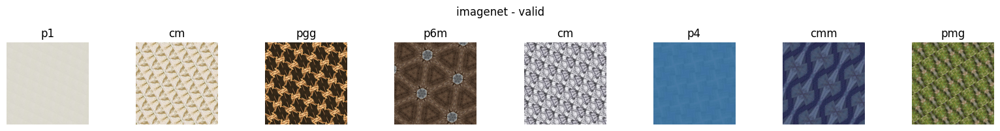

In [8]:
# imagenet
imagenet_ds = hdf5_dataset('../../datasets/imagenet_v5_rot_10m.h5', folder='train', transform=transforms.ToTensor())
_, imagenet_ds = split_train_valid(imagenet_ds, 0.90001, seed=42)
print(len(imagenet_ds))
train_ds, valid_ds = split_train_valid(imagenet_ds, 0.8, seed=42)
train_dl = DataLoader(train_ds, batch_size=bs, shuffle=True, num_workers=n_cpus)
viz_dataloader(train_dl, label_converter=label_converter, title='imagenet - train')
valid_dl = DataLoader(valid_ds, batch_size=bs, shuffle=False, num_workers=n_cpus)
viz_dataloader(valid_dl, label_converter=label_converter, title='imagenet - valid')

In [9]:
model = fpn_resnet50_classification(in_channels=3, n_classes=17)
outputs = model(torch.randn(2,3,256,256))
print(outputs.shape)
model = torch.nn.DataParallel(model, device_ids=[3,5,6,8])
device = torch.device('cuda:3')
# model

torch.Size([2, 17])


In [10]:
config = {'dataset': '1m datasets',
          'loss_func': 'CrossEntropyLoss', # nn.MSELoss()
          'optimizer': 'Adam',
          'scheduler': 'OneCycleLR'}
NAME = '09252024-FPN-dataset_v5_size-1m'
wandb.login()
proj_name = 'Understanding-Experimental-Images-by-Identifying-Symmetries-with-Deep-Learning'
wandb.init(project=proj_name, entity='yig319', name=NAME, id=NAME, group='dataset_v5_size_vs_records-FPN', save_code=True, config=config, resume='allow')  
config = wandb.config

In [11]:
lr = 1e-3
per_epoch = 2
epoch_start = 0
epochs = 100
loss_func = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, epochs=epochs, max_lr=lr, steps_per_epoch=len(train_dl))
metrics = [accuracy]  # You can add more metrics if needed
trainer = Trainer(model=model, loss_func=loss_func, optimizer=optimizer, metrics=metrics, scheduler=scheduler, 
                  device=device, save_per_epochs=per_epoch, model_path=f'../../saved_models/{NAME}/', early_stopping_patience=None)

history = trainer.train(train_dl=train_dl, epochs=epochs, epoch_start=epoch_start, valid_per_epochs=per_epoch,
                        valid_dl_list=[valid_dl, atom_dl, noise_dl], valid_dl_names=['', 'atom', 'noise'], tracking=True)

Epoch 1/100


  0%|          | 0/357 [00:00<?, ?it/s]/home/yichen/anaconda3/envs/symmetry/lib/python3.10/site-packages/torch/nn/functional.py:3769: UserWarning: nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.")
100%|██████████| 357/357 [10:14<00:00,  1.72s/it]


train_loss: 2.8687, train_accuracy: 8.04%
Epoch 2/100


100%|██████████| 357/357 [10:16<00:00,  1.73s/it]


train_loss: 1.6797, train_accuracy: 45.30%


100%|██████████| 90/90 [01:47<00:00,  1.20s/it]


valid_loss: 1.0325, valid_accuracy: 66.99%


100%|██████████| 85/85 [01:44<00:00,  1.23s/it]


valid_atom_loss: 1.6351, valid_atom_accuracy: 45.87%


100%|██████████| 43/43 [00:52<00:00,  1.21s/it]


valid_noise_loss: 2.8592, valid_noise_accuracy: 6.92%
Model saved at epoch 2
Epoch 3/100


100%|██████████| 357/357 [10:26<00:00,  1.76s/it]


train_loss: 0.8708, train_accuracy: 72.89%
Epoch 4/100


100%|██████████| 357/357 [10:13<00:00,  1.72s/it]


train_loss: 0.5812, train_accuracy: 81.86%


100%|██████████| 90/90 [01:45<00:00,  1.18s/it]


valid_loss: 0.4508, valid_accuracy: 84.28%


100%|██████████| 85/85 [01:42<00:00,  1.21s/it]


valid_atom_loss: 1.4874, valid_atom_accuracy: 54.19%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 2.9289, valid_noise_accuracy: 4.52%
Model saved at epoch 4
Epoch 5/100


100%|██████████| 357/357 [10:14<00:00,  1.72s/it]


train_loss: 0.4219, train_accuracy: 86.85%
Epoch 6/100


100%|██████████| 357/357 [10:27<00:00,  1.76s/it]


train_loss: 0.3234, train_accuracy: 89.81%


100%|██████████| 90/90 [01:46<00:00,  1.18s/it]


valid_loss: 0.3027, valid_accuracy: 89.37%


100%|██████████| 85/85 [01:41<00:00,  1.19s/it]


valid_atom_loss: 1.2405, valid_atom_accuracy: 63.40%


100%|██████████| 43/43 [00:53<00:00,  1.24s/it]


valid_noise_loss: 2.4987, valid_noise_accuracy: 28.15%
Model saved at epoch 6
Epoch 7/100


100%|██████████| 357/357 [10:27<00:00,  1.76s/it]


train_loss: 0.2587, train_accuracy: 91.80%
Epoch 8/100


100%|██████████| 357/357 [10:14<00:00,  1.72s/it]


train_loss: 0.2051, train_accuracy: 93.57%


100%|██████████| 90/90 [01:48<00:00,  1.20s/it]


valid_loss: 0.2081, valid_accuracy: 93.04%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 1.5158, valid_atom_accuracy: 63.23%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 2.1937, valid_noise_accuracy: 34.63%
Model saved at epoch 8
Epoch 9/100


100%|██████████| 357/357 [10:14<00:00,  1.72s/it]


train_loss: 0.1802, train_accuracy: 94.43%
Epoch 10/100


100%|██████████| 357/357 [10:14<00:00,  1.72s/it]


train_loss: 0.1502, train_accuracy: 95.38%


100%|██████████| 90/90 [01:48<00:00,  1.20s/it]


valid_loss: 0.2135, valid_accuracy: 92.96%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 1.0653, valid_atom_accuracy: 67.11%


100%|██████████| 43/43 [00:53<00:00,  1.24s/it]


valid_noise_loss: 2.0023, valid_noise_accuracy: 39.29%
Model saved at epoch 10
Epoch 11/100


100%|██████████| 357/357 [10:14<00:00,  1.72s/it]


train_loss: 0.1355, train_accuracy: 95.89%
Epoch 12/100


100%|██████████| 357/357 [10:14<00:00,  1.72s/it]


train_loss: 0.1251, train_accuracy: 96.26%


100%|██████████| 90/90 [01:49<00:00,  1.21s/it]


valid_loss: 0.1420, valid_accuracy: 95.69%


100%|██████████| 85/85 [01:43<00:00,  1.21s/it]


valid_atom_loss: 1.4002, valid_atom_accuracy: 67.85%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 1.4811, valid_noise_accuracy: 53.91%
Model saved at epoch 12
Epoch 13/100


100%|██████████| 357/357 [10:27<00:00,  1.76s/it]


train_loss: 0.1023, train_accuracy: 97.01%
Epoch 14/100


100%|██████████| 357/357 [10:20<00:00,  1.74s/it]


train_loss: 0.0905, train_accuracy: 97.36%


100%|██████████| 90/90 [01:49<00:00,  1.21s/it]


valid_loss: 0.1222, valid_accuracy: 96.20%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 1.2816, valid_atom_accuracy: 73.08%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 1.2808, valid_noise_accuracy: 58.69%
Model saved at epoch 14
Epoch 15/100


100%|██████████| 357/357 [10:14<00:00,  1.72s/it]


train_loss: 0.0827, train_accuracy: 97.58%
Epoch 16/100


100%|██████████| 357/357 [10:26<00:00,  1.75s/it]


train_loss: 0.0767, train_accuracy: 97.76%


100%|██████████| 90/90 [01:46<00:00,  1.18s/it]


valid_loss: 0.1043, valid_accuracy: 97.00%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 1.3546, valid_atom_accuracy: 70.66%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 1.0444, valid_noise_accuracy: 66.41%
Model saved at epoch 16
Epoch 17/100


100%|██████████| 357/357 [10:13<00:00,  1.72s/it]


train_loss: 0.0704, train_accuracy: 97.94%
Epoch 18/100


100%|██████████| 357/357 [10:14<00:00,  1.72s/it]


train_loss: 0.0668, train_accuracy: 98.05%


100%|██████████| 90/90 [01:45<00:00,  1.17s/it]


valid_loss: 0.0962, valid_accuracy: 96.93%


100%|██████████| 85/85 [01:40<00:00,  1.19s/it]


valid_atom_loss: 0.8717, valid_atom_accuracy: 78.29%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 0.7636, valid_noise_accuracy: 74.18%
Model saved at epoch 18
Epoch 19/100


100%|██████████| 357/357 [10:13<00:00,  1.72s/it]


train_loss: 0.0637, train_accuracy: 98.14%
Epoch 20/100


100%|██████████| 357/357 [10:16<00:00,  1.73s/it]


train_loss: 0.0596, train_accuracy: 98.26%


100%|██████████| 90/90 [01:45<00:00,  1.18s/it]


valid_loss: 0.0980, valid_accuracy: 97.06%


100%|██████████| 85/85 [01:43<00:00,  1.21s/it]


valid_atom_loss: 1.2645, valid_atom_accuracy: 70.97%


100%|██████████| 43/43 [00:54<00:00,  1.27s/it]


valid_noise_loss: 1.0164, valid_noise_accuracy: 70.48%
Model saved at epoch 20
Epoch 21/100


100%|██████████| 357/357 [10:15<00:00,  1.72s/it]


train_loss: 0.0563, train_accuracy: 98.37%
Epoch 22/100


100%|██████████| 357/357 [10:15<00:00,  1.72s/it]


train_loss: 0.0523, train_accuracy: 98.49%


100%|██████████| 90/90 [01:48<00:00,  1.21s/it]


valid_loss: 0.0817, valid_accuracy: 97.61%


100%|██████████| 85/85 [01:43<00:00,  1.21s/it]


valid_atom_loss: 1.3942, valid_atom_accuracy: 74.26%


100%|██████████| 43/43 [00:52<00:00,  1.21s/it]


valid_noise_loss: 0.7053, valid_noise_accuracy: 78.43%
Model saved at epoch 22
Epoch 23/100


100%|██████████| 357/357 [10:13<00:00,  1.72s/it]


train_loss: 0.0513, train_accuracy: 98.48%
Epoch 24/100


100%|██████████| 357/357 [10:15<00:00,  1.72s/it]


train_loss: 0.0469, train_accuracy: 98.63%


100%|██████████| 90/90 [01:47<00:00,  1.20s/it]


valid_loss: 0.0696, valid_accuracy: 98.09%


100%|██████████| 85/85 [01:43<00:00,  1.22s/it]


valid_atom_loss: 1.1079, valid_atom_accuracy: 78.00%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 0.6637, valid_noise_accuracy: 79.52%
Model saved at epoch 24
Epoch 25/100


100%|██████████| 357/357 [10:14<00:00,  1.72s/it]


train_loss: 0.0447, train_accuracy: 98.69%
Epoch 26/100


100%|██████████| 357/357 [10:13<00:00,  1.72s/it]


train_loss: 0.0419, train_accuracy: 98.77%


100%|██████████| 90/90 [01:49<00:00,  1.22s/it]


valid_loss: 0.0701, valid_accuracy: 98.02%


100%|██████████| 85/85 [01:43<00:00,  1.21s/it]


valid_atom_loss: 1.0391, valid_atom_accuracy: 78.84%


100%|██████████| 43/43 [00:51<00:00,  1.21s/it]


valid_noise_loss: 0.5635, valid_noise_accuracy: 81.82%
Model saved at epoch 26
Epoch 27/100


100%|██████████| 357/357 [10:13<00:00,  1.72s/it]


train_loss: 0.0393, train_accuracy: 98.84%
Epoch 28/100


100%|██████████| 357/357 [10:13<00:00,  1.72s/it]


train_loss: 0.0384, train_accuracy: 98.86%


100%|██████████| 90/90 [01:46<00:00,  1.18s/it]


valid_loss: 0.0763, valid_accuracy: 97.86%


100%|██████████| 85/85 [01:40<00:00,  1.19s/it]


valid_atom_loss: 1.5489, valid_atom_accuracy: 74.47%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 0.4238, valid_noise_accuracy: 86.78%
Model saved at epoch 28
Epoch 29/100


100%|██████████| 357/357 [10:13<00:00,  1.72s/it]


train_loss: 0.0361, train_accuracy: 98.92%
Epoch 30/100


100%|██████████| 357/357 [10:14<00:00,  1.72s/it]


train_loss: 0.0337, train_accuracy: 98.99%


100%|██████████| 90/90 [01:48<00:00,  1.20s/it]


valid_loss: 0.0671, valid_accuracy: 98.21%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 1.5056, valid_atom_accuracy: 73.55%


100%|██████████| 43/43 [00:53<00:00,  1.24s/it]


valid_noise_loss: 0.4918, valid_noise_accuracy: 85.83%
Model saved at epoch 30
Epoch 31/100


100%|██████████| 357/357 [10:14<00:00,  1.72s/it]


train_loss: 0.0316, train_accuracy: 99.06%
Epoch 32/100


100%|██████████| 357/357 [10:14<00:00,  1.72s/it]


train_loss: 0.0292, train_accuracy: 99.10%


100%|██████████| 90/90 [01:48<00:00,  1.20s/it]


valid_loss: 0.0645, valid_accuracy: 98.36%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 1.9704, valid_atom_accuracy: 69.40%


100%|██████████| 43/43 [00:53<00:00,  1.24s/it]


valid_noise_loss: 0.3706, valid_noise_accuracy: 88.56%
Model saved at epoch 32
Epoch 33/100


100%|██████████| 357/357 [10:14<00:00,  1.72s/it]


train_loss: 0.0280, train_accuracy: 99.14%
Epoch 34/100


100%|██████████| 357/357 [10:25<00:00,  1.75s/it]


train_loss: 0.0252, train_accuracy: 99.20%


100%|██████████| 90/90 [01:45<00:00,  1.18s/it]


valid_loss: 0.0651, valid_accuracy: 98.26%


100%|██████████| 85/85 [01:42<00:00,  1.21s/it]


valid_atom_loss: 1.7681, valid_atom_accuracy: 73.44%


100%|██████████| 43/43 [00:51<00:00,  1.21s/it]


valid_noise_loss: 0.3350, valid_noise_accuracy: 90.26%
Model saved at epoch 34
Epoch 35/100


100%|██████████| 357/357 [10:13<00:00,  1.72s/it]


train_loss: 0.0246, train_accuracy: 99.23%
Epoch 36/100


100%|██████████| 357/357 [10:14<00:00,  1.72s/it]


train_loss: 0.0232, train_accuracy: 99.27%


100%|██████████| 90/90 [01:45<00:00,  1.17s/it]


valid_loss: 0.0549, valid_accuracy: 98.56%


100%|██████████| 85/85 [01:42<00:00,  1.21s/it]


valid_atom_loss: 1.3782, valid_atom_accuracy: 75.60%


100%|██████████| 43/43 [00:53<00:00,  1.24s/it]


valid_noise_loss: 0.4697, valid_noise_accuracy: 87.46%
Model saved at epoch 36
Epoch 37/100


100%|██████████| 357/357 [10:13<00:00,  1.72s/it]


train_loss: 0.0213, train_accuracy: 99.31%
Epoch 38/100


100%|██████████| 357/357 [10:13<00:00,  1.72s/it]


train_loss: 0.0198, train_accuracy: 99.33%


100%|██████████| 90/90 [01:46<00:00,  1.18s/it]


valid_loss: 0.0583, valid_accuracy: 98.61%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 2.0726, valid_atom_accuracy: 68.63%


100%|██████████| 43/43 [00:53<00:00,  1.24s/it]


valid_noise_loss: 0.4084, valid_noise_accuracy: 88.76%
Model saved at epoch 38
Epoch 39/100


100%|██████████| 357/357 [10:13<00:00,  1.72s/it]


train_loss: 0.0190, train_accuracy: 99.37%
Epoch 40/100


100%|██████████| 357/357 [10:13<00:00,  1.72s/it]


train_loss: 0.0187, train_accuracy: 99.38%


100%|██████████| 90/90 [01:45<00:00,  1.18s/it]


valid_loss: 0.0614, valid_accuracy: 98.55%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 1.8708, valid_atom_accuracy: 72.59%


100%|██████████| 43/43 [00:52<00:00,  1.21s/it]


valid_noise_loss: 0.3145, valid_noise_accuracy: 90.84%
Model saved at epoch 40
Epoch 41/100


100%|██████████| 357/357 [10:13<00:00,  1.72s/it]


train_loss: 0.0170, train_accuracy: 99.43%
Epoch 42/100


100%|██████████| 357/357 [10:25<00:00,  1.75s/it]


train_loss: 0.0156, train_accuracy: 99.47%


100%|██████████| 90/90 [01:46<00:00,  1.19s/it]


valid_loss: 0.0616, valid_accuracy: 98.61%


100%|██████████| 85/85 [01:42<00:00,  1.21s/it]


valid_atom_loss: 1.8449, valid_atom_accuracy: 73.38%


100%|██████████| 43/43 [00:51<00:00,  1.21s/it]


valid_noise_loss: 0.3965, valid_noise_accuracy: 89.80%
Model saved at epoch 42
Epoch 43/100


100%|██████████| 357/357 [10:23<00:00,  1.75s/it]


train_loss: 0.0144, train_accuracy: 99.51%
Epoch 44/100


100%|██████████| 357/357 [10:14<00:00,  1.72s/it]


train_loss: 0.0144, train_accuracy: 99.51%


100%|██████████| 90/90 [01:47<00:00,  1.19s/it]


valid_loss: 0.0623, valid_accuracy: 98.63%


100%|██████████| 85/85 [01:41<00:00,  1.19s/it]


valid_atom_loss: 1.6475, valid_atom_accuracy: 75.50%


100%|██████████| 43/43 [00:52<00:00,  1.21s/it]


valid_noise_loss: 0.4547, valid_noise_accuracy: 89.03%
Model saved at epoch 44
Epoch 45/100


100%|██████████| 357/357 [10:24<00:00,  1.75s/it]


train_loss: 0.0138, train_accuracy: 99.53%
Epoch 46/100


100%|██████████| 357/357 [10:14<00:00,  1.72s/it]


train_loss: 0.0129, train_accuracy: 99.56%


100%|██████████| 90/90 [01:46<00:00,  1.18s/it]


valid_loss: 0.0613, valid_accuracy: 98.64%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 1.4557, valid_atom_accuracy: 77.21%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 0.4992, valid_noise_accuracy: 88.82%
Model saved at epoch 46
Epoch 47/100


100%|██████████| 357/357 [10:13<00:00,  1.72s/it]


train_loss: 0.0121, train_accuracy: 99.59%
Epoch 48/100


100%|██████████| 357/357 [10:13<00:00,  1.72s/it]


train_loss: 0.0118, train_accuracy: 99.60%


100%|██████████| 90/90 [01:45<00:00,  1.18s/it]


valid_loss: 0.0531, valid_accuracy: 98.80%


100%|██████████| 85/85 [01:42<00:00,  1.21s/it]


valid_atom_loss: 1.2890, valid_atom_accuracy: 79.12%


100%|██████████| 43/43 [00:53<00:00,  1.23s/it]


valid_noise_loss: 0.3778, valid_noise_accuracy: 90.41%
Model saved at epoch 48
Epoch 49/100


100%|██████████| 357/357 [10:15<00:00,  1.72s/it]


train_loss: 0.0107, train_accuracy: 99.63%
Epoch 50/100


100%|██████████| 357/357 [10:13<00:00,  1.72s/it]


train_loss: 0.0110, train_accuracy: 99.62%


100%|██████████| 90/90 [01:48<00:00,  1.20s/it]


valid_loss: 0.0588, valid_accuracy: 98.78%


100%|██████████| 85/85 [01:42<00:00,  1.21s/it]


valid_atom_loss: 1.7112, valid_atom_accuracy: 76.38%


100%|██████████| 43/43 [00:53<00:00,  1.24s/it]


valid_noise_loss: 0.3800, valid_noise_accuracy: 90.67%
Model saved at epoch 50
Epoch 51/100


100%|██████████| 357/357 [10:25<00:00,  1.75s/it]


train_loss: 0.0108, train_accuracy: 99.63%
Epoch 52/100


100%|██████████| 357/357 [10:25<00:00,  1.75s/it]


train_loss: 0.0091, train_accuracy: 99.69%


100%|██████████| 90/90 [01:45<00:00,  1.17s/it]


valid_loss: 0.0608, valid_accuracy: 98.82%


100%|██████████| 85/85 [01:42<00:00,  1.21s/it]


valid_atom_loss: 1.7876, valid_atom_accuracy: 76.05%


100%|██████████| 43/43 [00:53<00:00,  1.25s/it]


valid_noise_loss: 0.4071, valid_noise_accuracy: 91.28%
Model saved at epoch 52
Epoch 53/100


100%|██████████| 357/357 [10:29<00:00,  1.76s/it]


train_loss: 0.0093, train_accuracy: 99.68%
Epoch 54/100


100%|██████████| 357/357 [10:24<00:00,  1.75s/it]


train_loss: 0.0085, train_accuracy: 99.71%


100%|██████████| 90/90 [01:48<00:00,  1.21s/it]


valid_loss: 0.0584, valid_accuracy: 98.88%


100%|██████████| 85/85 [01:44<00:00,  1.23s/it]


valid_atom_loss: 1.4906, valid_atom_accuracy: 79.20%


100%|██████████| 43/43 [00:54<00:00,  1.26s/it]


valid_noise_loss: 0.4754, valid_noise_accuracy: 90.55%
Model saved at epoch 54
Epoch 55/100


100%|██████████| 357/357 [10:07<00:00,  1.70s/it]


train_loss: 0.0082, train_accuracy: 99.72%
Epoch 56/100


100%|██████████| 357/357 [10:39<00:00,  1.79s/it]


train_loss: 0.0081, train_accuracy: 99.72%


100%|██████████| 90/90 [01:47<00:00,  1.20s/it]


valid_loss: 0.0598, valid_accuracy: 98.87%


100%|██████████| 85/85 [01:44<00:00,  1.23s/it]


valid_atom_loss: 1.8019, valid_atom_accuracy: 75.59%


100%|██████████| 43/43 [00:56<00:00,  1.32s/it]


valid_noise_loss: 0.4074, valid_noise_accuracy: 91.37%
Model saved at epoch 56
Epoch 57/100


100%|██████████| 357/357 [10:13<00:00,  1.72s/it]


train_loss: 0.0077, train_accuracy: 99.74%
Epoch 58/100


100%|██████████| 357/357 [10:23<00:00,  1.75s/it]


train_loss: 0.0068, train_accuracy: 99.77%


100%|██████████| 90/90 [01:46<00:00,  1.18s/it]


valid_loss: 0.0584, valid_accuracy: 98.91%


100%|██████████| 85/85 [01:43<00:00,  1.21s/it]


valid_atom_loss: 1.8248, valid_atom_accuracy: 77.37%


100%|██████████| 43/43 [00:54<00:00,  1.27s/it]


valid_noise_loss: 0.4363, valid_noise_accuracy: 91.11%
Model saved at epoch 58
Epoch 59/100


100%|██████████| 357/357 [10:32<00:00,  1.77s/it]


train_loss: 0.0074, train_accuracy: 99.75%
Epoch 60/100


100%|██████████| 357/357 [10:07<00:00,  1.70s/it]


train_loss: 0.0066, train_accuracy: 99.77%


100%|██████████| 90/90 [01:47<00:00,  1.19s/it]


valid_loss: 0.0587, valid_accuracy: 98.95%


100%|██████████| 85/85 [01:42<00:00,  1.20s/it]


valid_atom_loss: 1.8812, valid_atom_accuracy: 77.06%


100%|██████████| 43/43 [00:55<00:00,  1.28s/it]


valid_noise_loss: 0.4643, valid_noise_accuracy: 90.63%
Model saved at epoch 60
Epoch 61/100


100%|██████████| 357/357 [10:45<00:00,  1.81s/it]


train_loss: 0.0064, train_accuracy: 99.78%
Epoch 62/100


100%|██████████| 357/357 [10:37<00:00,  1.78s/it]


train_loss: 0.0063, train_accuracy: 99.79%


100%|██████████| 90/90 [01:48<00:00,  1.21s/it]


valid_loss: 0.0611, valid_accuracy: 98.91%


100%|██████████| 85/85 [01:41<00:00,  1.19s/it]


valid_atom_loss: 1.9964, valid_atom_accuracy: 75.60%


100%|██████████| 43/43 [00:54<00:00,  1.27s/it]


valid_noise_loss: 0.5335, valid_noise_accuracy: 90.86%
Model saved at epoch 62
Epoch 63/100


100%|██████████| 357/357 [10:48<00:00,  1.82s/it]


train_loss: 0.0060, train_accuracy: 99.80%
Epoch 64/100


100%|██████████| 357/357 [10:35<00:00,  1.78s/it]


train_loss: 0.0054, train_accuracy: 99.81%


100%|██████████| 90/90 [01:51<00:00,  1.24s/it]


valid_loss: 0.0664, valid_accuracy: 98.93%


100%|██████████| 85/85 [01:44<00:00,  1.23s/it]


valid_atom_loss: 2.1418, valid_atom_accuracy: 74.33%


100%|██████████| 43/43 [00:56<00:00,  1.31s/it]


valid_noise_loss: 0.5328, valid_noise_accuracy: 90.41%
Model saved at epoch 64
Epoch 65/100


100%|██████████| 357/357 [10:41<00:00,  1.80s/it]


train_loss: 0.0056, train_accuracy: 99.81%
Epoch 66/100


100%|██████████| 357/357 [10:25<00:00,  1.75s/it]


train_loss: 0.0049, train_accuracy: 99.83%


100%|██████████| 90/90 [01:49<00:00,  1.21s/it]


valid_loss: 0.0635, valid_accuracy: 98.97%


100%|██████████| 85/85 [01:44<00:00,  1.23s/it]


valid_atom_loss: 1.9219, valid_atom_accuracy: 76.47%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 0.5067, valid_noise_accuracy: 91.08%
Model saved at epoch 66
Epoch 67/100


100%|██████████| 357/357 [10:38<00:00,  1.79s/it]


train_loss: 0.0050, train_accuracy: 99.83%
Epoch 68/100


100%|██████████| 357/357 [10:31<00:00,  1.77s/it]


train_loss: 0.0043, train_accuracy: 99.86%


100%|██████████| 90/90 [01:49<00:00,  1.22s/it]


valid_loss: 0.0635, valid_accuracy: 99.01%


100%|██████████| 85/85 [01:45<00:00,  1.24s/it]


valid_atom_loss: 1.8296, valid_atom_accuracy: 78.64%


100%|██████████| 43/43 [00:56<00:00,  1.32s/it]


valid_noise_loss: 0.4625, valid_noise_accuracy: 91.07%
Model saved at epoch 68
Epoch 69/100


100%|██████████| 357/357 [10:14<00:00,  1.72s/it]


train_loss: 0.0042, train_accuracy: 99.86%
Epoch 70/100


100%|██████████| 357/357 [10:22<00:00,  1.75s/it]


train_loss: 0.0043, train_accuracy: 99.86%


100%|██████████| 90/90 [01:45<00:00,  1.18s/it]


valid_loss: 0.0632, valid_accuracy: 99.01%


100%|██████████| 85/85 [01:44<00:00,  1.22s/it]


valid_atom_loss: 2.0515, valid_atom_accuracy: 77.11%


100%|██████████| 43/43 [00:54<00:00,  1.27s/it]


valid_noise_loss: 0.4623, valid_noise_accuracy: 91.64%
Model saved at epoch 70
Epoch 71/100


100%|██████████| 357/357 [10:06<00:00,  1.70s/it]


train_loss: 0.0043, train_accuracy: 99.86%
Epoch 72/100


100%|██████████| 357/357 [10:06<00:00,  1.70s/it]


train_loss: 0.0039, train_accuracy: 99.87%


100%|██████████| 90/90 [01:46<00:00,  1.18s/it]


valid_loss: 0.0637, valid_accuracy: 99.06%


100%|██████████| 85/85 [01:44<00:00,  1.23s/it]


valid_atom_loss: 2.3791, valid_atom_accuracy: 75.15%


100%|██████████| 43/43 [00:51<00:00,  1.21s/it]


valid_noise_loss: 0.4754, valid_noise_accuracy: 91.57%
Model saved at epoch 72
Epoch 73/100


100%|██████████| 357/357 [10:05<00:00,  1.70s/it]


train_loss: 0.0037, train_accuracy: 99.88%
Epoch 74/100


100%|██████████| 357/357 [10:05<00:00,  1.70s/it]


train_loss: 0.0037, train_accuracy: 99.88%


100%|██████████| 90/90 [01:49<00:00,  1.21s/it]


valid_loss: 0.0690, valid_accuracy: 99.02%


100%|██████████| 85/85 [01:43<00:00,  1.21s/it]


valid_atom_loss: 2.4016, valid_atom_accuracy: 74.40%


100%|██████████| 43/43 [00:53<00:00,  1.23s/it]


valid_noise_loss: 0.4711, valid_noise_accuracy: 92.04%
Model saved at epoch 74
Epoch 75/100


100%|██████████| 357/357 [10:32<00:00,  1.77s/it]


train_loss: 0.0035, train_accuracy: 99.88%
Epoch 76/100


100%|██████████| 357/357 [10:27<00:00,  1.76s/it]


train_loss: 0.0035, train_accuracy: 99.88%


100%|██████████| 90/90 [01:44<00:00,  1.16s/it]


valid_loss: 0.0636, valid_accuracy: 99.08%


100%|██████████| 85/85 [01:38<00:00,  1.16s/it]


valid_atom_loss: 2.1932, valid_atom_accuracy: 76.94%


100%|██████████| 43/43 [00:55<00:00,  1.29s/it]


valid_noise_loss: 0.4545, valid_noise_accuracy: 91.94%
Model saved at epoch 76
Epoch 77/100


100%|██████████| 357/357 [10:18<00:00,  1.73s/it]


train_loss: 0.0033, train_accuracy: 99.89%
Epoch 78/100


100%|██████████| 357/357 [10:05<00:00,  1.70s/it]


train_loss: 0.0031, train_accuracy: 99.90%


100%|██████████| 90/90 [01:48<00:00,  1.21s/it]


valid_loss: 0.0649, valid_accuracy: 99.11%


100%|██████████| 85/85 [01:44<00:00,  1.23s/it]


valid_atom_loss: 2.1861, valid_atom_accuracy: 76.81%


100%|██████████| 43/43 [00:54<00:00,  1.27s/it]


valid_noise_loss: 0.5194, valid_noise_accuracy: 91.76%
Model saved at epoch 78
Epoch 79/100


100%|██████████| 357/357 [10:31<00:00,  1.77s/it]


train_loss: 0.0029, train_accuracy: 99.90%
Epoch 80/100


100%|██████████| 357/357 [10:35<00:00,  1.78s/it]


train_loss: 0.0030, train_accuracy: 99.90%


100%|██████████| 90/90 [01:47<00:00,  1.20s/it]


valid_loss: 0.0681, valid_accuracy: 99.10%


100%|██████████| 85/85 [01:39<00:00,  1.17s/it]


valid_atom_loss: 2.1594, valid_atom_accuracy: 77.41%


100%|██████████| 43/43 [00:52<00:00,  1.21s/it]


valid_noise_loss: 0.4756, valid_noise_accuracy: 92.21%
Model saved at epoch 80
Epoch 81/100


100%|██████████| 357/357 [10:10<00:00,  1.71s/it]


train_loss: 0.0029, train_accuracy: 99.90%
Epoch 82/100


100%|██████████| 357/357 [10:16<00:00,  1.73s/it]


train_loss: 0.0029, train_accuracy: 99.90%


100%|██████████| 90/90 [01:44<00:00,  1.16s/it]


valid_loss: 0.0674, valid_accuracy: 99.11%


100%|██████████| 85/85 [01:38<00:00,  1.16s/it]


valid_atom_loss: 2.2786, valid_atom_accuracy: 76.80%


100%|██████████| 43/43 [00:51<00:00,  1.19s/it]


valid_noise_loss: 0.4778, valid_noise_accuracy: 92.19%
Model saved at epoch 82
Epoch 83/100


100%|██████████| 357/357 [10:06<00:00,  1.70s/it]


train_loss: 0.0028, train_accuracy: 99.91%
Epoch 84/100


100%|██████████| 357/357 [10:07<00:00,  1.70s/it]


train_loss: 0.0027, train_accuracy: 99.91%


100%|██████████| 90/90 [01:45<00:00,  1.17s/it]


valid_loss: 0.0686, valid_accuracy: 99.12%


100%|██████████| 85/85 [01:40<00:00,  1.18s/it]


valid_atom_loss: 2.2590, valid_atom_accuracy: 76.96%


100%|██████████| 43/43 [00:51<00:00,  1.19s/it]


valid_noise_loss: 0.4751, valid_noise_accuracy: 92.37%
Model saved at epoch 84
Epoch 85/100


100%|██████████| 357/357 [10:07<00:00,  1.70s/it]


train_loss: 0.0027, train_accuracy: 99.91%
Epoch 86/100


100%|██████████| 357/357 [10:41<00:00,  1.80s/it]


train_loss: 0.0028, train_accuracy: 99.91%


100%|██████████| 90/90 [01:50<00:00,  1.23s/it]


valid_loss: 0.0685, valid_accuracy: 99.12%


100%|██████████| 85/85 [01:39<00:00,  1.17s/it]


valid_atom_loss: 2.2386, valid_atom_accuracy: 77.15%


100%|██████████| 43/43 [00:51<00:00,  1.20s/it]


valid_noise_loss: 0.5006, valid_noise_accuracy: 92.22%
Model saved at epoch 86
Epoch 87/100


100%|██████████| 357/357 [10:06<00:00,  1.70s/it]


train_loss: 0.0027, train_accuracy: 99.91%
Epoch 88/100


100%|██████████| 357/357 [10:07<00:00,  1.70s/it]


train_loss: 0.0027, train_accuracy: 99.91%


100%|██████████| 90/90 [01:43<00:00,  1.15s/it]


valid_loss: 0.0677, valid_accuracy: 99.14%


100%|██████████| 85/85 [01:41<00:00,  1.20s/it]


valid_atom_loss: 2.2644, valid_atom_accuracy: 77.24%


100%|██████████| 43/43 [00:53<00:00,  1.24s/it]


valid_noise_loss: 0.4847, valid_noise_accuracy: 92.30%
Model saved at epoch 88
Epoch 89/100


100%|██████████| 357/357 [10:43<00:00,  1.80s/it]


train_loss: 0.0027, train_accuracy: 99.91%
Epoch 90/100


100%|██████████| 357/357 [10:30<00:00,  1.77s/it]


train_loss: 0.0027, train_accuracy: 99.91%


100%|██████████| 90/90 [01:49<00:00,  1.22s/it]


valid_loss: 0.0684, valid_accuracy: 99.14%


100%|██████████| 85/85 [01:44<00:00,  1.23s/it]


valid_atom_loss: 2.2254, valid_atom_accuracy: 77.52%


100%|██████████| 43/43 [00:51<00:00,  1.20s/it]


valid_noise_loss: 0.4670, valid_noise_accuracy: 92.43%
Model saved at epoch 90
Epoch 91/100


100%|██████████| 357/357 [10:06<00:00,  1.70s/it]


train_loss: 0.0027, train_accuracy: 99.91%
Epoch 92/100


100%|██████████| 357/357 [10:07<00:00,  1.70s/it]


train_loss: 0.0027, train_accuracy: 99.91%


100%|██████████| 90/90 [01:44<00:00,  1.16s/it]


valid_loss: 0.0684, valid_accuracy: 99.14%


100%|██████████| 85/85 [01:39<00:00,  1.17s/it]


valid_atom_loss: 2.2416, valid_atom_accuracy: 77.52%


100%|██████████| 43/43 [00:51<00:00,  1.19s/it]


valid_noise_loss: 0.4851, valid_noise_accuracy: 92.34%
Model saved at epoch 92
Epoch 93/100


100%|██████████| 357/357 [10:07<00:00,  1.70s/it]


train_loss: 0.0027, train_accuracy: 99.91%
Epoch 94/100


100%|██████████| 357/357 [10:15<00:00,  1.72s/it]


train_loss: 0.0027, train_accuracy: 99.91%


100%|██████████| 90/90 [01:49<00:00,  1.21s/it]


valid_loss: 0.0686, valid_accuracy: 99.15%


100%|██████████| 85/85 [01:44<00:00,  1.24s/it]


valid_atom_loss: 2.2484, valid_atom_accuracy: 77.47%


100%|██████████| 43/43 [00:51<00:00,  1.19s/it]


valid_noise_loss: 0.4936, valid_noise_accuracy: 92.27%
Model saved at epoch 94
Epoch 95/100


100%|██████████| 357/357 [10:20<00:00,  1.74s/it]


train_loss: 0.0027, train_accuracy: 99.91%
Epoch 96/100


100%|██████████| 357/357 [10:12<00:00,  1.72s/it]


train_loss: 0.0027, train_accuracy: 99.91%


100%|██████████| 90/90 [01:43<00:00,  1.16s/it]


valid_loss: 0.0679, valid_accuracy: 99.16%


100%|██████████| 85/85 [01:41<00:00,  1.19s/it]


valid_atom_loss: 2.2211, valid_atom_accuracy: 77.71%


100%|██████████| 43/43 [00:51<00:00,  1.20s/it]


valid_noise_loss: 0.4880, valid_noise_accuracy: 92.26%
Model saved at epoch 96
Epoch 97/100


100%|██████████| 357/357 [10:14<00:00,  1.72s/it]


train_loss: 0.0026, train_accuracy: 99.91%
Epoch 98/100


100%|██████████| 357/357 [10:15<00:00,  1.72s/it]


train_loss: 0.0026, train_accuracy: 99.91%


100%|██████████| 90/90 [01:43<00:00,  1.15s/it]


valid_loss: 0.0687, valid_accuracy: 99.14%


100%|██████████| 85/85 [01:42<00:00,  1.21s/it]


valid_atom_loss: 2.2590, valid_atom_accuracy: 77.47%


100%|██████████| 43/43 [00:52<00:00,  1.22s/it]


valid_noise_loss: 0.4924, valid_noise_accuracy: 92.33%
Model saved at epoch 98
Epoch 99/100


100%|██████████| 357/357 [10:05<00:00,  1.70s/it]


train_loss: 0.0026, train_accuracy: 99.91%
Epoch 100/100


100%|██████████| 357/357 [10:06<00:00,  1.70s/it]


train_loss: 0.0026, train_accuracy: 99.91%


100%|██████████| 90/90 [01:43<00:00,  1.15s/it]


valid_loss: 0.0690, valid_accuracy: 99.15%


100%|██████████| 85/85 [01:38<00:00,  1.16s/it]


valid_atom_loss: 2.2732, valid_atom_accuracy: 77.45%


100%|██████████| 43/43 [00:51<00:00,  1.19s/it]


valid_noise_loss: 0.4977, valid_noise_accuracy: 92.26%
Model saved at epoch 100


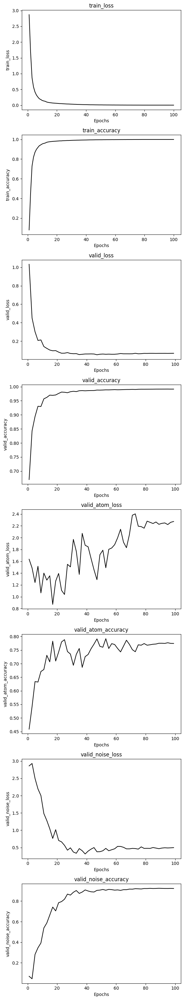

In [12]:
trainer.plot_training_metrics()

In [13]:
wandb.finish()

wandb: WARNING Source type is set to 'repo' but some required information is missing from the environment. A job will not be created from this run. See https://docs.wandb.ai/guides/launch/create-job


epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
records,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇████
train_accuracy,▁▅▇▇████████████████████████████████████
train_loss,█▄▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
valid_accuracy,▁▅▆▇▇▇▇█▇███████████████████████████████
valid_atom_accuracy,▁▃▅▆▆▇██▇██▇▆▇▇▇▇▇██▇███▇▇██▇███▇█▇█▇███
valid_atom_loss,▄▄▃▂▃▃▁▁▃▂▂▄▅▃▃▅▅▅▃▄▅▃▅▅▆▆▅▆█▇▆▆▇▆▇▆▇▇▇▇
valid_loss,█▄▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
valid_noise_accuracy,▁▁▃▄▅▅▆▆▇▇▇▇████████████████████████████
valid_noise_loss,██▇▆▄▄▃▃▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▁▂▁▁▁▁▁▁▁▁▁▂▁▁▂
epoch,100


### 2 million dataset

2142007


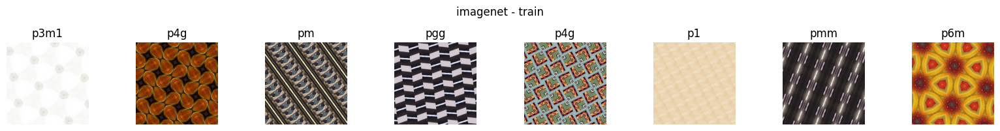

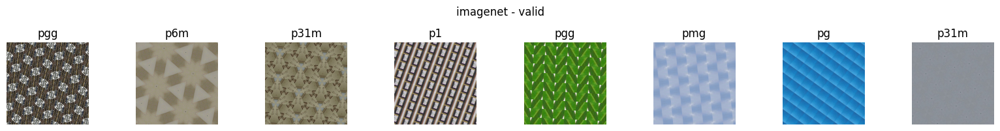

In [14]:
# imagenet
imagenet_ds = hdf5_dataset('../../datasets/imagenet_v5_rot_10m.h5', folder='train', transform=transforms.ToTensor())
_, imagenet_ds = split_train_valid(imagenet_ds, 0.8, seed=42)
print(len(imagenet_ds))
train_ds, valid_ds = split_train_valid(imagenet_ds, 0.80001, seed=42)
train_dl = DataLoader(train_ds, batch_size=bs, shuffle=True, num_workers=n_cpus)
viz_dataloader(train_dl, label_converter=label_converter, title='imagenet - train')
valid_dl = DataLoader(valid_ds, batch_size=bs, shuffle=False, num_workers=n_cpus)
viz_dataloader(valid_dl, label_converter=label_converter, title='imagenet - valid')

In [15]:
model = fpn_resnet50_classification(in_channels=3, n_classes=17)
outputs = model(torch.randn(2,3,256,256))
print(outputs.shape)
model = torch.nn.DataParallel(model, device_ids=[3,5,6,8])
device = torch.device('cuda:3')
# model

torch.Size([2, 17])


In [16]:
config = {'dataset': '2m datasets',
          'loss_func': 'CrossEntropyLoss', # nn.MSELoss()
          'optimizer': 'Adam',
          'scheduler': 'OneCycleLR'}
NAME = '09262024-FPN-dataset_v5_size-2m'
wandb.login()
proj_name = 'Understanding-Experimental-Images-by-Identifying-Symmetries-with-Deep-Learning'
wandb.init(project=proj_name, entity='yig319', name=NAME, id=NAME, group='dataset_v5_size_vs_records-FPN', save_code=True, config=config, resume='allow')
config = wandb.config

In [17]:
lr = 1e-3
per_epoch = 1
epoch_start = 0
epochs = 50
loss_func = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, epochs=epochs, max_lr=lr, steps_per_epoch=len(train_dl))
metrics = [accuracy]  # You can add more metrics if needed
trainer = Trainer(model=model, loss_func=loss_func, optimizer=optimizer, metrics=metrics, scheduler=scheduler, 
                  device=device, save_per_epochs=per_epoch, model_path=f'../../saved_models/{NAME}/', early_stopping_patience=None)

history = trainer.train(train_dl=train_dl, epochs=epochs, epoch_start=epoch_start, valid_per_epochs=per_epoch,
                        valid_dl_list=[valid_dl, atom_dl, noise_dl], valid_dl_names=['', 'atom', 'noise'], tracking=True)

Epoch 1/50


  0%|          | 0/715 [00:00<?, ?it/s]/home/yichen/anaconda3/envs/symmetry/lib/python3.10/site-packages/torch/nn/functional.py:3769: UserWarning: nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.")
100%|██████████| 715/715 [20:17<00:00,  1.70s/it]


train_loss: 2.2502, train_accuracy: 27.61%


100%|██████████| 179/179 [03:28<00:00,  1.16s/it]


valid_loss: 1.1447, valid_accuracy: 63.93%


100%|██████████| 85/85 [01:40<00:00,  1.19s/it]


valid_atom_loss: 1.6919, valid_atom_accuracy: 45.48%


100%|██████████| 43/43 [00:52<00:00,  1.21s/it]


valid_noise_loss: 2.8592, valid_noise_accuracy: 5.31%
Model saved at epoch 1
Epoch 2/50


100%|██████████| 715/715 [21:01<00:00,  1.76s/it]


train_loss: 0.7716, train_accuracy: 76.21%


100%|██████████| 179/179 [03:33<00:00,  1.19s/it]


valid_loss: 0.6822, valid_accuracy: 80.95%


100%|██████████| 85/85 [01:43<00:00,  1.21s/it]


valid_atom_loss: 1.3668, valid_atom_accuracy: 56.61%


100%|██████████| 43/43 [00:52<00:00,  1.21s/it]


valid_noise_loss: 3.0208, valid_noise_accuracy: 1.33%
Model saved at epoch 2
Epoch 3/50


100%|██████████| 715/715 [21:43<00:00,  1.82s/it]


train_loss: 0.4198, train_accuracy: 86.66%


100%|██████████| 179/179 [03:46<00:00,  1.27s/it]


valid_loss: 0.6269, valid_accuracy: 78.31%


100%|██████████| 85/85 [01:50<00:00,  1.31s/it]


valid_atom_loss: 1.3953, valid_atom_accuracy: 60.38%


100%|██████████| 43/43 [00:56<00:00,  1.32s/it]


valid_noise_loss: 2.9642, valid_noise_accuracy: 2.66%
Model saved at epoch 3
Epoch 4/50


100%|██████████| 715/715 [22:15<00:00,  1.87s/it]


train_loss: 0.2673, train_accuracy: 91.55%


100%|██████████| 179/179 [03:43<00:00,  1.25s/it]


valid_loss: 0.6021, valid_accuracy: 82.51%


100%|██████████| 85/85 [01:47<00:00,  1.26s/it]


valid_atom_loss: 1.4764, valid_atom_accuracy: 59.82%


100%|██████████| 43/43 [00:55<00:00,  1.28s/it]


valid_noise_loss: 2.2308, valid_noise_accuracy: 30.66%
Model saved at epoch 4
Epoch 5/50


100%|██████████| 715/715 [21:26<00:00,  1.80s/it]


train_loss: 0.2023, train_accuracy: 93.67%


100%|██████████| 179/179 [03:34<00:00,  1.20s/it]


valid_loss: 1.6515, valid_accuracy: 59.55%


100%|██████████| 85/85 [01:44<00:00,  1.23s/it]


valid_atom_loss: 3.6540, valid_atom_accuracy: 0.83%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 4.0123, valid_noise_accuracy: 7.79%
Model saved at epoch 5
Epoch 6/50


100%|██████████| 715/715 [21:03<00:00,  1.77s/it]


train_loss: 0.1973, train_accuracy: 93.91%


100%|██████████| 179/179 [03:34<00:00,  1.20s/it]


valid_loss: 0.7504, valid_accuracy: 81.42%


100%|██████████| 85/85 [01:44<00:00,  1.23s/it]


valid_atom_loss: 2.1025, valid_atom_accuracy: 53.00%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 1.7647, valid_noise_accuracy: 44.03%
Model saved at epoch 6
Epoch 7/50


100%|██████████| 715/715 [21:03<00:00,  1.77s/it]


train_loss: 0.1469, train_accuracy: 95.60%


100%|██████████| 179/179 [03:34<00:00,  1.20s/it]


valid_loss: 0.5081, valid_accuracy: 83.96%


100%|██████████| 85/85 [01:42<00:00,  1.21s/it]


valid_atom_loss: 1.5194, valid_atom_accuracy: 59.94%


100%|██████████| 43/43 [00:54<00:00,  1.26s/it]


valid_noise_loss: 1.7036, valid_noise_accuracy: 50.28%
Model saved at epoch 7
Epoch 8/50


100%|██████████| 715/715 [21:03<00:00,  1.77s/it]


train_loss: 0.1358, train_accuracy: 95.94%


100%|██████████| 179/179 [03:38<00:00,  1.22s/it]


valid_loss: 3.1971, valid_accuracy: 44.53%


100%|██████████| 85/85 [01:42<00:00,  1.21s/it]


valid_atom_loss: 3.4821, valid_atom_accuracy: 34.41%


100%|██████████| 43/43 [00:53<00:00,  1.25s/it]


valid_noise_loss: 3.9976, valid_noise_accuracy: 25.93%
Model saved at epoch 8
Epoch 9/50


100%|██████████| 715/715 [21:02<00:00,  1.77s/it]


train_loss: 0.1418, train_accuracy: 95.80%


100%|██████████| 179/179 [03:34<00:00,  1.20s/it]


valid_loss: 1.7551, valid_accuracy: 66.84%


100%|██████████| 85/85 [01:44<00:00,  1.23s/it]


valid_atom_loss: 2.8376, valid_atom_accuracy: 40.18%


100%|██████████| 43/43 [00:53<00:00,  1.23s/it]


valid_noise_loss: 2.6442, valid_noise_accuracy: 47.28%
Model saved at epoch 9
Epoch 10/50


100%|██████████| 715/715 [21:03<00:00,  1.77s/it]


train_loss: 0.1147, train_accuracy: 96.67%


100%|██████████| 179/179 [03:33<00:00,  1.20s/it]


valid_loss: 3.6660, valid_accuracy: 55.29%


100%|██████████| 85/85 [01:42<00:00,  1.21s/it]


valid_atom_loss: 4.3703, valid_atom_accuracy: 37.88%


100%|██████████| 43/43 [00:53<00:00,  1.25s/it]


valid_noise_loss: 4.0980, valid_noise_accuracy: 37.07%
Model saved at epoch 10
Epoch 11/50


100%|██████████| 715/715 [21:03<00:00,  1.77s/it]


train_loss: 0.1146, train_accuracy: 96.66%


100%|██████████| 179/179 [03:37<00:00,  1.22s/it]


valid_loss: 2.2350, valid_accuracy: 63.54%


100%|██████████| 85/85 [01:42<00:00,  1.20s/it]


valid_atom_loss: 3.6336, valid_atom_accuracy: 47.29%


100%|██████████| 43/43 [00:54<00:00,  1.26s/it]


valid_noise_loss: 3.0922, valid_noise_accuracy: 40.10%
Model saved at epoch 11
Epoch 12/50


100%|██████████| 715/715 [21:03<00:00,  1.77s/it]


train_loss: 0.1463, train_accuracy: 95.64%


100%|██████████| 179/179 [03:35<00:00,  1.20s/it]


valid_loss: 2.0584, valid_accuracy: 63.91%


100%|██████████| 85/85 [01:43<00:00,  1.21s/it]


valid_atom_loss: 2.3731, valid_atom_accuracy: 56.73%


100%|██████████| 43/43 [00:53<00:00,  1.24s/it]


valid_noise_loss: 2.4822, valid_noise_accuracy: 45.30%
Model saved at epoch 12
Epoch 13/50


100%|██████████| 715/715 [21:03<00:00,  1.77s/it]


train_loss: 0.0994, train_accuracy: 97.13%


100%|██████████| 179/179 [03:34<00:00,  1.20s/it]


valid_loss: 17.1814, valid_accuracy: 74.04%


100%|██████████| 85/85 [01:42<00:00,  1.21s/it]


valid_atom_loss: 3.4972, valid_atom_accuracy: 44.39%


100%|██████████| 43/43 [00:53<00:00,  1.25s/it]


valid_noise_loss: 1.5522, valid_noise_accuracy: 62.54%
Model saved at epoch 13
Epoch 14/50


100%|██████████| 715/715 [21:19<00:00,  1.79s/it]


train_loss: 0.0837, train_accuracy: 97.63%


100%|██████████| 179/179 [03:37<00:00,  1.21s/it]


valid_loss: 2.0181, valid_accuracy: 83.50%


100%|██████████| 85/85 [01:42<00:00,  1.21s/it]


valid_atom_loss: 2.2813, valid_atom_accuracy: 52.02%


100%|██████████| 43/43 [00:53<00:00,  1.25s/it]


valid_noise_loss: 1.5046, valid_noise_accuracy: 59.94%
Model saved at epoch 14
Epoch 15/50


100%|██████████| 715/715 [21:07<00:00,  1.77s/it]


train_loss: 0.0784, train_accuracy: 97.77%


100%|██████████| 179/179 [03:34<00:00,  1.20s/it]


valid_loss: 2.9108, valid_accuracy: 83.23%


100%|██████████| 85/85 [01:42<00:00,  1.21s/it]


valid_atom_loss: 2.3110, valid_atom_accuracy: 50.54%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 1.1646, valid_noise_accuracy: 65.05%
Model saved at epoch 15
Epoch 16/50


100%|██████████| 715/715 [21:07<00:00,  1.77s/it]


train_loss: 0.0733, train_accuracy: 97.94%


100%|██████████| 179/179 [03:34<00:00,  1.20s/it]


valid_loss: 1.1395, valid_accuracy: 80.14%


100%|██████████| 85/85 [01:42<00:00,  1.21s/it]


valid_atom_loss: 2.1590, valid_atom_accuracy: 59.68%


100%|██████████| 43/43 [00:53<00:00,  1.23s/it]


valid_noise_loss: 1.9301, valid_noise_accuracy: 62.15%
Model saved at epoch 16
Epoch 17/50


100%|██████████| 715/715 [21:14<00:00,  1.78s/it]


train_loss: 0.0622, train_accuracy: 98.26%


100%|██████████| 179/179 [03:36<00:00,  1.21s/it]


valid_loss: 1.1015, valid_accuracy: 82.02%


100%|██████████| 85/85 [01:42<00:00,  1.20s/it]


valid_atom_loss: 1.6768, valid_atom_accuracy: 69.77%


100%|██████████| 43/43 [00:53<00:00,  1.25s/it]


valid_noise_loss: 1.1231, valid_noise_accuracy: 73.60%
Model saved at epoch 17
Epoch 18/50


100%|██████████| 715/715 [21:03<00:00,  1.77s/it]


train_loss: 0.0688, train_accuracy: 98.07%


100%|██████████| 179/179 [03:36<00:00,  1.21s/it]


valid_loss: 0.6072, valid_accuracy: 83.83%


100%|██████████| 85/85 [01:43<00:00,  1.22s/it]


valid_atom_loss: 1.0715, valid_atom_accuracy: 74.80%


100%|██████████| 43/43 [00:53<00:00,  1.24s/it]


valid_noise_loss: 0.9415, valid_noise_accuracy: 74.93%
Model saved at epoch 18
Epoch 19/50


100%|██████████| 715/715 [21:02<00:00,  1.77s/it]


train_loss: 0.0614, train_accuracy: 98.28%


100%|██████████| 179/179 [03:33<00:00,  1.20s/it]


valid_loss: 0.1544, valid_accuracy: 95.17%


100%|██████████| 85/85 [01:42<00:00,  1.21s/it]


valid_atom_loss: 1.0434, valid_atom_accuracy: 75.02%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 0.4963, valid_noise_accuracy: 85.04%
Model saved at epoch 19
Epoch 20/50


100%|██████████| 715/715 [21:02<00:00,  1.77s/it]


train_loss: 0.0587, train_accuracy: 98.35%


100%|██████████| 179/179 [03:36<00:00,  1.21s/it]


valid_loss: 0.0719, valid_accuracy: 97.94%


100%|██████████| 85/85 [01:43<00:00,  1.22s/it]


valid_atom_loss: 1.2226, valid_atom_accuracy: 76.17%


100%|██████████| 43/43 [00:54<00:00,  1.26s/it]


valid_noise_loss: 0.2823, valid_noise_accuracy: 90.67%
Model saved at epoch 20
Epoch 21/50


100%|██████████| 715/715 [21:04<00:00,  1.77s/it]


train_loss: 0.0488, train_accuracy: 98.63%


100%|██████████| 179/179 [03:34<00:00,  1.20s/it]


valid_loss: 0.2611, valid_accuracy: 92.89%


100%|██████████| 85/85 [01:42<00:00,  1.21s/it]


valid_atom_loss: 1.9625, valid_atom_accuracy: 64.14%


100%|██████████| 43/43 [00:53<00:00,  1.24s/it]


valid_noise_loss: 0.5823, valid_noise_accuracy: 82.37%
Model saved at epoch 21
Epoch 22/50


100%|██████████| 715/715 [21:04<00:00,  1.77s/it]


train_loss: 0.0474, train_accuracy: 98.69%


100%|██████████| 179/179 [03:34<00:00,  1.20s/it]


valid_loss: 0.0909, valid_accuracy: 97.28%


100%|██████████| 85/85 [01:42<00:00,  1.21s/it]


valid_atom_loss: 1.0818, valid_atom_accuracy: 79.37%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 0.5627, valid_noise_accuracy: 87.63%
Model saved at epoch 22
Epoch 23/50


100%|██████████| 715/715 [21:03<00:00,  1.77s/it]


train_loss: 0.0351, train_accuracy: 99.03%


100%|██████████| 179/179 [03:35<00:00,  1.20s/it]


valid_loss: 0.1772, valid_accuracy: 96.34%


100%|██████████| 85/85 [01:43<00:00,  1.22s/it]


valid_atom_loss: 1.7854, valid_atom_accuracy: 69.26%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 0.4742, valid_noise_accuracy: 87.06%
Model saved at epoch 23
Epoch 24/50


100%|██████████| 715/715 [21:19<00:00,  1.79s/it]


train_loss: 0.0439, train_accuracy: 98.78%


100%|██████████| 179/179 [03:34<00:00,  1.20s/it]


valid_loss: 0.1390, valid_accuracy: 96.22%


100%|██████████| 85/85 [01:43<00:00,  1.21s/it]


valid_atom_loss: 1.3177, valid_atom_accuracy: 75.34%


100%|██████████| 43/43 [00:53<00:00,  1.23s/it]


valid_noise_loss: 0.3654, valid_noise_accuracy: 89.08%
Model saved at epoch 24
Epoch 25/50


100%|██████████| 715/715 [21:02<00:00,  1.77s/it]


train_loss: 0.0393, train_accuracy: 98.89%


100%|██████████| 179/179 [03:34<00:00,  1.20s/it]


valid_loss: 0.0413, valid_accuracy: 98.88%


100%|██████████| 85/85 [01:42<00:00,  1.20s/it]


valid_atom_loss: 1.2600, valid_atom_accuracy: 77.89%


100%|██████████| 43/43 [00:53<00:00,  1.25s/it]


valid_noise_loss: 0.3194, valid_noise_accuracy: 90.80%
Model saved at epoch 25
Epoch 26/50


100%|██████████| 715/715 [21:03<00:00,  1.77s/it]


train_loss: 0.0247, train_accuracy: 99.32%


100%|██████████| 179/179 [03:33<00:00,  1.19s/it]


valid_loss: 0.1031, valid_accuracy: 97.22%


100%|██████████| 85/85 [01:42<00:00,  1.21s/it]


valid_atom_loss: 1.3164, valid_atom_accuracy: 75.18%


100%|██████████| 43/43 [00:53<00:00,  1.24s/it]


valid_noise_loss: 0.3376, valid_noise_accuracy: 90.42%
Model saved at epoch 26
Epoch 27/50


100%|██████████| 715/715 [21:14<00:00,  1.78s/it]


train_loss: 0.0270, train_accuracy: 99.25%


100%|██████████| 179/179 [03:37<00:00,  1.21s/it]


valid_loss: 0.1039, valid_accuracy: 97.22%


100%|██████████| 85/85 [01:45<00:00,  1.24s/it]


valid_atom_loss: 1.3887, valid_atom_accuracy: 77.09%


100%|██████████| 43/43 [00:53<00:00,  1.25s/it]


valid_noise_loss: 0.3773, valid_noise_accuracy: 88.95%
Model saved at epoch 27
Epoch 28/50


100%|██████████| 715/715 [21:16<00:00,  1.79s/it]


train_loss: 0.0345, train_accuracy: 99.05%


100%|██████████| 179/179 [03:34<00:00,  1.20s/it]


valid_loss: 0.0441, valid_accuracy: 98.75%


100%|██████████| 85/85 [01:42<00:00,  1.21s/it]


valid_atom_loss: 1.2892, valid_atom_accuracy: 75.61%


100%|██████████| 43/43 [00:53<00:00,  1.25s/it]


valid_noise_loss: 0.3169, valid_noise_accuracy: 91.15%
Model saved at epoch 28
Epoch 29/50


100%|██████████| 715/715 [21:03<00:00,  1.77s/it]


train_loss: 0.0262, train_accuracy: 99.29%


100%|██████████| 179/179 [03:33<00:00,  1.20s/it]


valid_loss: 0.0524, valid_accuracy: 98.66%


100%|██████████| 85/85 [01:43<00:00,  1.21s/it]


valid_atom_loss: 1.7042, valid_atom_accuracy: 73.57%


100%|██████████| 43/43 [00:53<00:00,  1.24s/it]


valid_noise_loss: 0.3990, valid_noise_accuracy: 89.91%
Model saved at epoch 29
Epoch 30/50


100%|██████████| 715/715 [21:02<00:00,  1.77s/it]


train_loss: 0.0259, train_accuracy: 99.30%


100%|██████████| 179/179 [03:33<00:00,  1.19s/it]


valid_loss: 0.0387, valid_accuracy: 98.99%


100%|██████████| 85/85 [01:42<00:00,  1.21s/it]


valid_atom_loss: 1.4281, valid_atom_accuracy: 76.14%


100%|██████████| 43/43 [00:53<00:00,  1.25s/it]


valid_noise_loss: 0.3584, valid_noise_accuracy: 91.29%
Model saved at epoch 30
Epoch 31/50


100%|██████████| 715/715 [21:14<00:00,  1.78s/it]


train_loss: 0.0187, train_accuracy: 99.50%


100%|██████████| 179/179 [03:34<00:00,  1.20s/it]


valid_loss: 0.0448, valid_accuracy: 98.91%


100%|██████████| 85/85 [01:42<00:00,  1.21s/it]


valid_atom_loss: 1.5946, valid_atom_accuracy: 77.45%


100%|██████████| 43/43 [00:53<00:00,  1.25s/it]


valid_noise_loss: 0.3502, valid_noise_accuracy: 91.60%
Model saved at epoch 31
Epoch 32/50


100%|██████████| 715/715 [21:17<00:00,  1.79s/it]


train_loss: 0.0240, train_accuracy: 99.35%


100%|██████████| 179/179 [03:34<00:00,  1.20s/it]


valid_loss: 0.0462, valid_accuracy: 98.99%


100%|██████████| 85/85 [01:42<00:00,  1.21s/it]


valid_atom_loss: 1.4424, valid_atom_accuracy: 77.11%


100%|██████████| 43/43 [00:54<00:00,  1.26s/it]


valid_noise_loss: 0.3300, valid_noise_accuracy: 91.77%
Model saved at epoch 32
Epoch 33/50


100%|██████████| 715/715 [21:15<00:00,  1.78s/it]


train_loss: 0.0176, train_accuracy: 99.53%


100%|██████████| 179/179 [03:33<00:00,  1.19s/it]


valid_loss: 0.0423, valid_accuracy: 98.93%


100%|██████████| 85/85 [01:44<00:00,  1.24s/it]


valid_atom_loss: 1.2515, valid_atom_accuracy: 78.71%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 0.3803, valid_noise_accuracy: 91.25%
Model saved at epoch 33
Epoch 34/50


100%|██████████| 715/715 [21:03<00:00,  1.77s/it]


train_loss: 0.0233, train_accuracy: 99.37%


100%|██████████| 179/179 [03:34<00:00,  1.20s/it]


valid_loss: 0.0410, valid_accuracy: 99.01%


100%|██████████| 85/85 [01:42<00:00,  1.21s/it]


valid_atom_loss: 1.3991, valid_atom_accuracy: 79.19%


100%|██████████| 43/43 [00:53<00:00,  1.23s/it]


valid_noise_loss: 0.2693, valid_noise_accuracy: 92.61%
Model saved at epoch 34
Epoch 35/50


100%|██████████| 715/715 [21:14<00:00,  1.78s/it]


train_loss: 0.0210, train_accuracy: 99.44%


100%|██████████| 179/179 [03:34<00:00,  1.20s/it]


valid_loss: 0.0352, valid_accuracy: 99.15%


100%|██████████| 85/85 [01:42<00:00,  1.21s/it]


valid_atom_loss: 1.4930, valid_atom_accuracy: 79.07%


100%|██████████| 43/43 [00:53<00:00,  1.25s/it]


valid_noise_loss: 0.2902, valid_noise_accuracy: 92.41%
Model saved at epoch 35
Epoch 36/50


100%|██████████| 715/715 [21:14<00:00,  1.78s/it]


train_loss: 0.0143, train_accuracy: 99.63%


100%|██████████| 179/179 [03:34<00:00,  1.20s/it]


valid_loss: 0.0361, valid_accuracy: 99.15%


100%|██████████| 85/85 [01:44<00:00,  1.23s/it]


valid_atom_loss: 1.3772, valid_atom_accuracy: 80.37%


100%|██████████| 43/43 [00:53<00:00,  1.23s/it]


valid_noise_loss: 0.2994, valid_noise_accuracy: 92.26%
Model saved at epoch 36
Epoch 37/50


100%|██████████| 715/715 [21:03<00:00,  1.77s/it]


train_loss: 0.0160, train_accuracy: 99.58%


100%|██████████| 179/179 [03:36<00:00,  1.21s/it]


valid_loss: 0.0390, valid_accuracy: 99.16%


100%|██████████| 85/85 [01:42<00:00,  1.21s/it]


valid_atom_loss: 1.6272, valid_atom_accuracy: 77.48%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 0.3931, valid_noise_accuracy: 91.59%
Model saved at epoch 37
Epoch 38/50


100%|██████████| 715/715 [21:02<00:00,  1.77s/it]


train_loss: 0.0151, train_accuracy: 99.60%


100%|██████████| 179/179 [03:33<00:00,  1.19s/it]


valid_loss: 0.0349, valid_accuracy: 99.16%


100%|██████████| 85/85 [01:42<00:00,  1.21s/it]


valid_atom_loss: 1.3045, valid_atom_accuracy: 81.15%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 0.3064, valid_noise_accuracy: 92.25%
Model saved at epoch 38
Epoch 39/50


100%|██████████| 715/715 [21:01<00:00,  1.76s/it]


train_loss: 0.0163, train_accuracy: 99.58%


100%|██████████| 179/179 [03:36<00:00,  1.21s/it]


valid_loss: 0.0381, valid_accuracy: 99.16%


100%|██████████| 85/85 [01:42<00:00,  1.20s/it]


valid_atom_loss: 1.7891, valid_atom_accuracy: 75.76%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 0.3162, valid_noise_accuracy: 92.32%
Model saved at epoch 39
Epoch 40/50


100%|██████████| 715/715 [21:10<00:00,  1.78s/it]


train_loss: 0.0123, train_accuracy: 99.68%


100%|██████████| 179/179 [03:35<00:00,  1.20s/it]


valid_loss: 0.0359, valid_accuracy: 99.21%


100%|██████████| 85/85 [01:42<00:00,  1.21s/it]


valid_atom_loss: 1.6995, valid_atom_accuracy: 77.26%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 0.3654, valid_noise_accuracy: 92.02%
Model saved at epoch 40
Epoch 41/50


100%|██████████| 715/715 [21:02<00:00,  1.77s/it]


train_loss: 0.0128, train_accuracy: 99.68%


100%|██████████| 179/179 [03:33<00:00,  1.19s/it]


valid_loss: 0.0379, valid_accuracy: 99.18%


100%|██████████| 85/85 [01:42<00:00,  1.20s/it]


valid_atom_loss: 1.8485, valid_atom_accuracy: 75.17%


100%|██████████| 43/43 [00:52<00:00,  1.23s/it]


valid_noise_loss: 0.3377, valid_noise_accuracy: 92.47%
Model saved at epoch 41
Epoch 42/50


100%|██████████| 715/715 [21:03<00:00,  1.77s/it]


train_loss: 0.0112, train_accuracy: 99.71%


100%|██████████| 179/179 [03:36<00:00,  1.21s/it]


valid_loss: 0.0428, valid_accuracy: 99.16%


100%|██████████| 85/85 [01:43<00:00,  1.21s/it]


valid_atom_loss: 1.9218, valid_atom_accuracy: 76.48%


100%|██████████| 43/43 [00:53<00:00,  1.24s/it]


valid_noise_loss: 0.3354, valid_noise_accuracy: 92.73%
Model saved at epoch 42
Epoch 43/50


100%|██████████| 715/715 [21:05<00:00,  1.77s/it]


train_loss: 0.0107, train_accuracy: 99.72%


100%|██████████| 179/179 [03:35<00:00,  1.20s/it]


valid_loss: 0.0387, valid_accuracy: 99.19%


100%|██████████| 85/85 [01:42<00:00,  1.21s/it]


valid_atom_loss: 1.9427, valid_atom_accuracy: 75.82%


100%|██████████| 43/43 [00:53<00:00,  1.25s/it]


valid_noise_loss: 0.4001, valid_noise_accuracy: 91.88%
Model saved at epoch 43
Epoch 44/50


100%|██████████| 715/715 [21:03<00:00,  1.77s/it]


train_loss: 0.0098, train_accuracy: 99.75%


100%|██████████| 179/179 [03:34<00:00,  1.20s/it]


valid_loss: 0.0391, valid_accuracy: 99.22%


100%|██████████| 85/85 [01:43<00:00,  1.22s/it]


valid_atom_loss: 1.8675, valid_atom_accuracy: 76.45%


100%|██████████| 43/43 [00:53<00:00,  1.24s/it]


valid_noise_loss: 0.3555, valid_noise_accuracy: 92.48%
Model saved at epoch 44
Epoch 45/50


100%|██████████| 715/715 [21:03<00:00,  1.77s/it]


train_loss: 0.0096, train_accuracy: 99.75%


100%|██████████| 179/179 [03:34<00:00,  1.20s/it]


valid_loss: 0.0423, valid_accuracy: 99.19%


100%|██████████| 85/85 [01:42<00:00,  1.21s/it]


valid_atom_loss: 1.9914, valid_atom_accuracy: 76.40%


100%|██████████| 43/43 [00:53<00:00,  1.23s/it]


valid_noise_loss: 0.3329, valid_noise_accuracy: 92.78%
Model saved at epoch 45
Epoch 46/50


100%|██████████| 715/715 [21:05<00:00,  1.77s/it]


train_loss: 0.0091, train_accuracy: 99.76%


100%|██████████| 179/179 [03:34<00:00,  1.20s/it]


valid_loss: 0.0381, valid_accuracy: 99.22%


100%|██████████| 85/85 [01:42<00:00,  1.21s/it]


valid_atom_loss: 1.7583, valid_atom_accuracy: 77.78%


100%|██████████| 43/43 [00:53<00:00,  1.23s/it]


valid_noise_loss: 0.3662, valid_noise_accuracy: 92.41%
Model saved at epoch 46
Epoch 47/50


100%|██████████| 715/715 [21:06<00:00,  1.77s/it]


train_loss: 0.0087, train_accuracy: 99.78%


100%|██████████| 179/179 [03:34<00:00,  1.20s/it]


valid_loss: 0.0420, valid_accuracy: 99.21%


100%|██████████| 85/85 [01:43<00:00,  1.22s/it]


valid_atom_loss: 1.8443, valid_atom_accuracy: 77.29%


100%|██████████| 43/43 [00:53<00:00,  1.24s/it]


valid_noise_loss: 0.3655, valid_noise_accuracy: 92.44%
Model saved at epoch 47
Epoch 48/50


100%|██████████| 715/715 [21:03<00:00,  1.77s/it]


train_loss: 0.0084, train_accuracy: 99.78%


100%|██████████| 179/179 [03:34<00:00,  1.20s/it]


valid_loss: 0.0414, valid_accuracy: 99.20%


100%|██████████| 85/85 [01:43<00:00,  1.22s/it]


valid_atom_loss: 1.9837, valid_atom_accuracy: 76.21%


100%|██████████| 43/43 [00:54<00:00,  1.26s/it]


valid_noise_loss: 0.3931, valid_noise_accuracy: 92.21%
Model saved at epoch 48
Epoch 49/50


100%|██████████| 715/715 [21:06<00:00,  1.77s/it]


train_loss: 0.0085, train_accuracy: 99.78%


100%|██████████| 179/179 [03:34<00:00,  1.20s/it]


valid_loss: 0.0420, valid_accuracy: 99.19%


100%|██████████| 85/85 [01:42<00:00,  1.21s/it]


valid_atom_loss: 1.8718, valid_atom_accuracy: 77.11%


100%|██████████| 43/43 [00:53<00:00,  1.24s/it]


valid_noise_loss: 0.4120, valid_noise_accuracy: 91.96%
Model saved at epoch 49
Epoch 50/50


100%|██████████| 715/715 [21:08<00:00,  1.77s/it]


train_loss: 0.0084, train_accuracy: 99.78%


100%|██████████| 179/179 [03:34<00:00,  1.20s/it]


valid_loss: 0.0422, valid_accuracy: 99.20%


100%|██████████| 85/85 [01:42<00:00,  1.21s/it]


valid_atom_loss: 1.9153, valid_atom_accuracy: 76.99%


100%|██████████| 43/43 [00:53<00:00,  1.24s/it]


valid_noise_loss: 0.3422, valid_noise_accuracy: 92.88%
Model saved at epoch 50


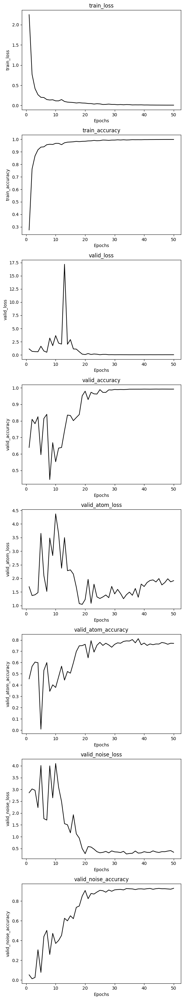

In [18]:
trainer.plot_training_metrics()

In [19]:
wandb.finish()

wandb: WARNING Source type is set to 'repo' but some required information is missing from the environment. A job will not be created from this run. See https://docs.wandb.ai/guides/launch/create-job


epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
records,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
train_accuracy,▁▅▇▇▅███▆███▇███████████████████████████
train_loss,█▄▂▂▅▂▁▁▃▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
valid_accuracy,▄▆▅▃▆▆▁▂▃▃▅▆▆▆▆█▇███████████████████████
valid_atom_accuracy,▅▆▆▁▅▆▅▅▅▆▅▅▆▇▇█▆█▇█▇█▇▇████████▇█▇█████
valid_atom_loss,▃▂▂█▄▂▆▅█▅█▄▄▁▁▁▄▁▂▁▂▂▃▂▂▂▂▂▂▂▁▃▃▃▄▃▃▃▃▃
valid_loss,▁▁▁▂▁▁▂▃▂▂█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
valid_noise_accuracy,▁▁▁▂▄▅▃▄▄▄▆▆▆▆▇▇▇███████████████████████
valid_noise_loss,▆▆▆█▄▄██▆▅▃▃▄▃▁▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,50


### 5 million dataset

5355017


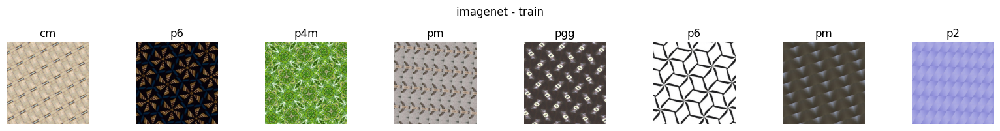

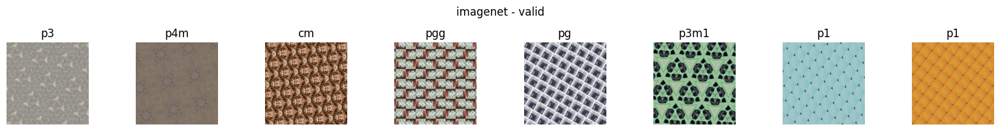

In [20]:
# imagenet
imagenet_ds = hdf5_dataset('../../datasets/imagenet_v5_rot_10m.h5', folder='train', transform=transforms.ToTensor())
_, imagenet_ds = split_train_valid(imagenet_ds, 0.5, seed=42)
print(len(imagenet_ds))
train_ds, valid_ds = split_train_valid(imagenet_ds, 0.80001, seed=42)
train_dl = DataLoader(train_ds, batch_size=bs, shuffle=True, num_workers=n_cpus)
viz_dataloader(train_dl, label_converter=label_converter, title='imagenet - train')
valid_dl = DataLoader(valid_ds, batch_size=bs, shuffle=False, num_workers=n_cpus)
viz_dataloader(valid_dl, label_converter=label_converter, title='imagenet - valid')

In [21]:
model = fpn_resnet50_classification(in_channels=3, n_classes=17)
outputs = model(torch.randn(2,3,256,256))
print(outputs.shape)
model = torch.nn.DataParallel(model, device_ids=[3,5,6,8])
device = torch.device('cuda:3')
# model

torch.Size([2, 17])


In [22]:
config = {'dataset': '5m datasets',
          'loss_func': 'CrossEntropyLoss', # nn.MSELoss()
          'optimizer': 'Adam',
          'scheduler': 'OneCycleLR'}
NAME = '09272024-FPN-dataset_v5_size-5m'
wandb.login()
proj_name = 'Understanding-Experimental-Images-by-Identifying-Symmetries-with-Deep-Learning'
wandb.init(project=proj_name, entity='yig319', name=NAME, id=NAME, group='dataset_v5_size_vs_records-FPN', save_code=True, config=config, resume='allow')
config = wandb.config

In [23]:
lr = 1e-3
per_epoch = 2
epoch_start = 0
epochs = 20
loss_func = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, epochs=epochs, max_lr=lr, steps_per_epoch=len(train_dl))
metrics = [accuracy]  # You can add more metrics if needed
trainer = Trainer(model=model, loss_func=loss_func, optimizer=optimizer, metrics=metrics, scheduler=scheduler, 
                  device=device, save_per_epochs=per_epoch, model_path=f'../../saved_models/{NAME}/', early_stopping_patience=None)

history = trainer.train(train_dl=train_dl, epochs=epochs, epoch_start=epoch_start, valid_per_epochs=per_epoch,
                        valid_dl_list=[valid_dl, atom_dl, noise_dl], valid_dl_names=['', 'atom', 'noise'], tracking=True)

Epoch 1/20


  0%|          | 0/1786 [00:00<?, ?it/s]/home/yichen/anaconda3/envs/symmetry/lib/python3.10/site-packages/torch/nn/functional.py:3769: UserWarning: nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.")
100%|██████████| 1786/1786 [52:11<00:00,  1.75s/it]


train_loss: 1.2485, train_accuracy: 60.18%
Epoch 2/20


100%|██████████| 1786/1786 [53:43<00:00,  1.81s/it]


train_loss: 0.2322, train_accuracy: 92.78%


100%|██████████| 447/447 [09:12<00:00,  1.24s/it]


valid_loss: 0.2629, valid_accuracy: 91.35%


100%|██████████| 85/85 [01:46<00:00,  1.25s/it]


valid_atom_loss: 1.4955, valid_atom_accuracy: 63.37%


100%|██████████| 43/43 [00:55<00:00,  1.29s/it]


valid_noise_loss: 1.9150, valid_noise_accuracy: 37.55%
Model saved at epoch 2
Epoch 3/20


100%|██████████| 1786/1786 [54:15<00:00,  1.82s/it]


train_loss: 0.1188, train_accuracy: 96.53%
Epoch 4/20


100%|██████████| 1786/1786 [56:38<00:00,  1.90s/it]


train_loss: 0.0753, train_accuracy: 97.86%


100%|██████████| 447/447 [10:13<00:00,  1.37s/it]


valid_loss: 0.7094, valid_accuracy: 81.27%


100%|██████████| 85/85 [01:58<00:00,  1.39s/it]


valid_atom_loss: 1.4850, valid_atom_accuracy: 64.06%


100%|██████████| 43/43 [01:00<00:00,  1.41s/it]


valid_noise_loss: 1.9272, valid_noise_accuracy: 53.53%
Model saved at epoch 4
Epoch 5/20


100%|██████████| 1786/1786 [57:30<00:00,  1.93s/it]


train_loss: 0.0601, train_accuracy: 98.29%
Epoch 6/20


100%|██████████| 1786/1786 [57:38<00:00,  1.94s/it]


train_loss: 0.0454, train_accuracy: 98.73%


100%|██████████| 447/447 [10:20<00:00,  1.39s/it]


valid_loss: 0.1158, valid_accuracy: 96.45%


100%|██████████| 85/85 [01:59<00:00,  1.41s/it]


valid_atom_loss: 1.2644, valid_atom_accuracy: 70.62%


100%|██████████| 43/43 [01:00<00:00,  1.41s/it]


valid_noise_loss: 0.4916, valid_noise_accuracy: 84.56%
Model saved at epoch 6
Epoch 7/20


100%|██████████| 1786/1786 [58:05<00:00,  1.95s/it]


train_loss: 0.0383, train_accuracy: 98.94%
Epoch 8/20


100%|██████████| 1786/1786 [58:20<00:00,  1.96s/it]


train_loss: 0.0323, train_accuracy: 99.10%


100%|██████████| 447/447 [10:23<00:00,  1.40s/it]


valid_loss: 0.0424, valid_accuracy: 98.76%


100%|██████████| 85/85 [01:59<00:00,  1.40s/it]


valid_atom_loss: 1.6258, valid_atom_accuracy: 68.76%


100%|██████████| 43/43 [01:01<00:00,  1.43s/it]


valid_noise_loss: 0.2640, valid_noise_accuracy: 91.20%
Model saved at epoch 8
Epoch 9/20


100%|██████████| 1786/1786 [58:32<00:00,  1.97s/it]


train_loss: 0.0288, train_accuracy: 99.21%
Epoch 10/20


100%|██████████| 1786/1786 [58:47<00:00,  1.98s/it]


train_loss: 0.0251, train_accuracy: 99.31%


100%|██████████| 447/447 [10:38<00:00,  1.43s/it]


valid_loss: 0.0257, valid_accuracy: 99.27%


100%|██████████| 85/85 [02:04<00:00,  1.46s/it]


valid_atom_loss: 1.4023, valid_atom_accuracy: 75.05%


100%|██████████| 43/43 [01:04<00:00,  1.49s/it]


valid_noise_loss: 0.1717, valid_noise_accuracy: 94.13%
Model saved at epoch 10
Epoch 11/20


100%|██████████| 1786/1786 [58:55<00:00,  1.98s/it]


train_loss: 0.0216, train_accuracy: 99.41%
Epoch 12/20


100%|██████████| 1786/1786 [59:08<00:00,  1.99s/it]


train_loss: 0.0203, train_accuracy: 99.45%


100%|██████████| 447/447 [10:35<00:00,  1.42s/it]


valid_loss: 0.0231, valid_accuracy: 99.36%


100%|██████████| 85/85 [02:02<00:00,  1.44s/it]


valid_atom_loss: 1.1429, valid_atom_accuracy: 81.42%


100%|██████████| 43/43 [01:03<00:00,  1.47s/it]


valid_noise_loss: 0.1927, valid_noise_accuracy: 94.16%
Model saved at epoch 12
Epoch 13/20


100%|██████████| 1786/1786 [59:04<00:00,  1.98s/it]


train_loss: 0.0175, train_accuracy: 99.53%
Epoch 14/20


100%|██████████| 1786/1786 [59:04<00:00,  1.98s/it]


train_loss: 0.0159, train_accuracy: 99.58%


100%|██████████| 447/447 [10:29<00:00,  1.41s/it]


valid_loss: 0.0199, valid_accuracy: 99.47%


100%|██████████| 85/85 [02:02<00:00,  1.44s/it]


valid_atom_loss: 1.1322, valid_atom_accuracy: 83.61%


100%|██████████| 43/43 [01:03<00:00,  1.48s/it]


valid_noise_loss: 0.2208, valid_noise_accuracy: 94.43%
Model saved at epoch 14
Epoch 15/20


100%|██████████| 1786/1786 [59:12<00:00,  1.99s/it]


train_loss: 0.0137, train_accuracy: 99.64%
Epoch 16/20


100%|██████████| 1786/1786 [58:55<00:00,  1.98s/it]


train_loss: 0.0121, train_accuracy: 99.68%


100%|██████████| 447/447 [10:35<00:00,  1.42s/it]


valid_loss: 0.0191, valid_accuracy: 99.53%


100%|██████████| 85/85 [02:00<00:00,  1.41s/it]


valid_atom_loss: 1.3744, valid_atom_accuracy: 82.47%


100%|██████████| 43/43 [01:04<00:00,  1.50s/it]


valid_noise_loss: 0.2102, valid_noise_accuracy: 95.14%
Model saved at epoch 16
Epoch 17/20


100%|██████████| 1786/1786 [58:50<00:00,  1.98s/it]


train_loss: 0.0105, train_accuracy: 99.72%
Epoch 18/20


100%|██████████| 1786/1786 [59:18<00:00,  1.99s/it]


train_loss: 0.0089, train_accuracy: 99.75%


100%|██████████| 447/447 [10:27<00:00,  1.40s/it]


valid_loss: 0.0198, valid_accuracy: 99.56%


100%|██████████| 85/85 [02:03<00:00,  1.45s/it]


valid_atom_loss: 1.6247, valid_atom_accuracy: 82.02%


100%|██████████| 43/43 [01:01<00:00,  1.43s/it]


valid_noise_loss: 0.2350, valid_noise_accuracy: 95.28%
Model saved at epoch 18
Epoch 19/20


100%|██████████| 1786/1786 [58:58<00:00,  1.98s/it]


train_loss: 0.0076, train_accuracy: 99.77%
Epoch 20/20


100%|██████████| 1786/1786 [58:18<00:00,  1.96s/it]


train_loss: 0.0070, train_accuracy: 99.78%


100%|██████████| 447/447 [10:24<00:00,  1.40s/it]


valid_loss: 0.0205, valid_accuracy: 99.56%


100%|██████████| 85/85 [01:59<00:00,  1.40s/it]


valid_atom_loss: 1.7373, valid_atom_accuracy: 81.32%


100%|██████████| 43/43 [01:03<00:00,  1.48s/it]


valid_noise_loss: 0.2377, valid_noise_accuracy: 95.33%
Model saved at epoch 20


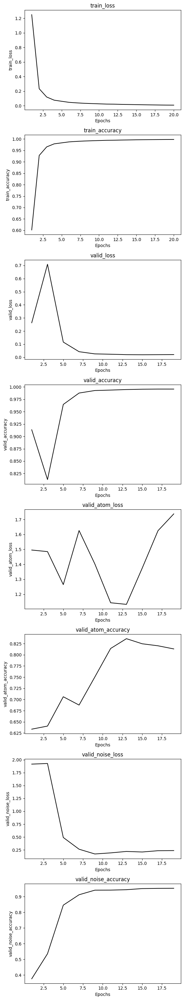

In [24]:
trainer.plot_training_metrics()

In [25]:
wandb.finish()

wandb: WARNING Source type is set to 'repo' but some required information is missing from the environment. A job will not be created from this run. See https://docs.wandb.ai/guides/launch/create-job


epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▄▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▇▇▇▇▇▇▇████
records,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇████
train_accuracy,▁▅▇▇▇███▇███████████████████████████████
train_loss,█▄▂▂▂▂▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
valid_accuracy,▅▅▅▅▁▂▂▁▇▇▇▇████████████████████████████
valid_atom_accuracy,▁▁▂▁▁▁▁▂▄▃▃▄▃▄▃▃▅▅▅▅▇▇▇▇█▇██▇██▇██▇▇▇▇█▇
valid_atom_loss,▅▅▅▅▅▆▆▅▃▃▃▂▆▅▅▇▄▄▄▄▂▂▂▁▁▃▂▂▅▂▃▅▆▆▆▆▇█▅▇
valid_loss,▃▃▃▃▇▇▇█▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
valid_noise_accuracy,▁▁▁▁▃▃▃▃▇▇▇▇██▇▇████████████████████████
valid_noise_loss,████████▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,20


### full size dataset - 10 million

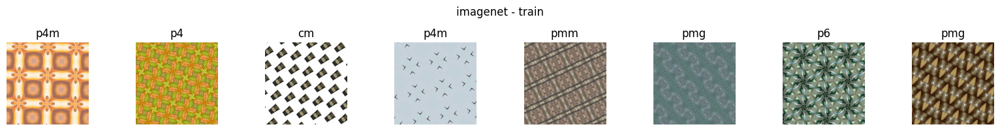

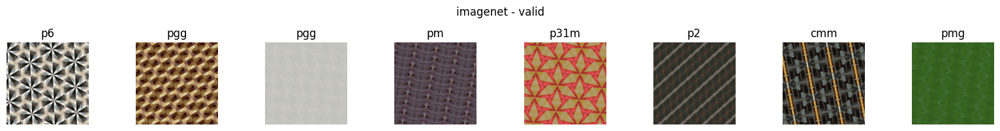

In [2]:
# imagenet
imagenet_ds = hdf5_dataset('../../datasets/imagenet_v5_rot_10m.h5', folder='train', transform=transforms.ToTensor())
train_ds, valid_ds = split_train_valid(imagenet_ds, 0.8, seed=42)
train_dl = DataLoader(train_ds, batch_size=bs, shuffle=True, num_workers=n_cpus)
viz_dataloader(train_dl, label_converter=label_converter, title='imagenet - train')
valid_dl = DataLoader(valid_ds, batch_size=bs, shuffle=False, num_workers=n_cpus)
viz_dataloader(valid_dl, label_converter=label_converter, title='imagenet - valid')

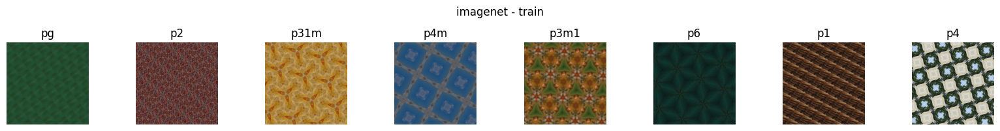

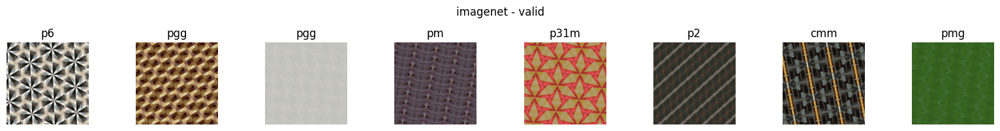

In [3]:
# imagenet
imagenet_ds = hdf5_dataset('../../datasets/imagenet_v5_rot_10m.h5', folder='train', transform=transforms.ToTensor())
train_ds, valid_ds = split_train_valid(imagenet_ds, 0.8, seed=42)
train_dl = DataLoader(train_ds, batch_size=bs, shuffle=True, num_workers=n_cpus)
viz_dataloader(train_dl, label_converter=label_converter, title='imagenet - train')
valid_dl = DataLoader(valid_ds, batch_size=bs, shuffle=False, num_workers=n_cpus)
viz_dataloader(valid_dl, label_converter=label_converter, title='imagenet - valid')

In [4]:
model = fpn_resnet50_classification(in_channels=3, n_classes=17)
outputs = model(torch.randn(2,3,256,256))
print(outputs.shape)
model = torch.nn.DataParallel(model, device_ids=[3,4,5,6,8,9])
device = torch.device('cuda:3')
# model

/home/yichen/anaconda3/envs/symmetry/lib/python3.10/site-packages/torch/nn/functional.py:3769: UserWarning: nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.")


torch.Size([2, 17])


In [5]:
config = {'dataset': '10m datasets',
          'loss_func': 'CrossEntropyLoss', # nn.MSELoss()
          'optimizer': 'Adam',
          'scheduler': 'OneCycleLR'}
NAME = '09282024-FPN-dataset_v5_size-10m'
wandb.login()
proj_name = 'Understanding-Experimental-Images-by-Identifying-Symmetries-with-Deep-Learning'
wandb.init(project=proj_name, entity='yig319', name=NAME, id=NAME, group='dataset_v5_size_vs_records-FPN', save_code=True, config=config, resume='allow')
config = wandb.config

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: yig319. Use `wandb login --relogin` to force relogin


In [6]:
lr = 1e-3
per_epoch = 1
epoch_start = 0
epochs = 20
loss_func = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, epochs=epochs, max_lr=lr, steps_per_epoch=len(train_dl))
metrics = [accuracy]  # You can add more metrics if needed
trainer = Trainer(model=model, loss_func=loss_func, optimizer=optimizer, metrics=metrics, scheduler=scheduler, 
                  device=device, save_per_epochs=per_epoch, model_path=f'../../saved_models/{NAME}/', early_stopping_patience=None)

history = trainer.train(train_dl=train_dl, epochs=epochs, epoch_start=epoch_start, valid_per_epochs=per_epoch,
                        valid_dl_list=[valid_dl, atom_dl, noise_dl], valid_dl_names=['', 'atom', 'noise'], tracking=True)

Epoch 1/20


  0%|          | 0/2381 [00:00<?, ?it/s]/home/yichen/anaconda3/envs/symmetry/lib/python3.10/site-packages/torch/nn/functional.py:3769: UserWarning: nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.")
100%|██████████| 2381/2381 [1:33:43<00:00,  2.36s/it]


train_loss: 0.9989, train_accuracy: 68.65%


100%|██████████| 596/596 [17:21<00:00,  1.75s/it]


valid_loss: 0.4244, valid_accuracy: 87.42%


100%|██████████| 57/57 [01:43<00:00,  1.82s/it]


valid_atom_loss: 1.3881, valid_atom_accuracy: 60.68%


100%|██████████| 29/29 [01:00<00:00,  2.09s/it]


valid_noise_loss: 2.0812, valid_noise_accuracy: 34.53%
Model saved at epoch 1
Epoch 2/20


100%|██████████| 2381/2381 [1:31:44<00:00,  2.31s/it]


train_loss: 0.1525, train_accuracy: 95.50%


100%|██████████| 596/596 [17:37<00:00,  1.77s/it]


valid_loss: 1.3088, valid_accuracy: 58.74%


100%|██████████| 57/57 [01:43<00:00,  1.82s/it]


valid_atom_loss: 2.9113, valid_atom_accuracy: 5.88%


100%|██████████| 29/29 [00:58<00:00,  2.00s/it]


valid_noise_loss: 1.7765, valid_noise_accuracy: 44.70%
Model saved at epoch 2
Epoch 3/20


100%|██████████| 2381/2381 [1:31:41<00:00,  2.31s/it]


train_loss: 0.0845, train_accuracy: 97.61%


100%|██████████| 596/596 [17:27<00:00,  1.76s/it]


valid_loss: 3.3958, valid_accuracy: 47.49%


100%|██████████| 57/57 [01:47<00:00,  1.89s/it]


valid_atom_loss: 4.0382, valid_atom_accuracy: 36.61%


100%|██████████| 29/29 [00:59<00:00,  2.04s/it]


valid_noise_loss: 3.7426, valid_noise_accuracy: 35.25%
Model saved at epoch 3
Epoch 4/20


100%|██████████| 2381/2381 [1:30:52<00:00,  2.29s/it]


train_loss: 0.0628, train_accuracy: 98.23%


100%|██████████| 596/596 [17:20<00:00,  1.75s/it]


valid_loss: 4.1276, valid_accuracy: 44.03%


100%|██████████| 57/57 [01:43<00:00,  1.82s/it]


valid_atom_loss: 5.2224, valid_atom_accuracy: 31.23%


100%|██████████| 29/29 [00:58<00:00,  2.01s/it]


valid_noise_loss: 4.8309, valid_noise_accuracy: 31.33%
Model saved at epoch 4
Epoch 5/20


100%|██████████| 2381/2381 [1:32:40<00:00,  2.34s/it]


train_loss: 0.0534, train_accuracy: 98.51%


100%|██████████| 596/596 [17:29<00:00,  1.76s/it]


valid_loss: 2.6467, valid_accuracy: 55.72%


100%|██████████| 57/57 [01:49<00:00,  1.92s/it]


valid_atom_loss: 3.1435, valid_atom_accuracy: 42.31%


100%|██████████| 29/29 [00:59<00:00,  2.05s/it]


valid_noise_loss: 2.6154, valid_noise_accuracy: 51.03%
Model saved at epoch 5
Epoch 6/20


100%|██████████| 2381/2381 [1:32:33<00:00,  2.33s/it]


train_loss: 0.0400, train_accuracy: 98.90%


100%|██████████| 596/596 [17:31<00:00,  1.76s/it]


valid_loss: 2.4138, valid_accuracy: 58.05%


100%|██████████| 57/57 [01:49<00:00,  1.92s/it]


valid_atom_loss: 5.9705, valid_atom_accuracy: 26.51%


100%|██████████| 29/29 [00:57<00:00,  1.99s/it]


valid_noise_loss: 3.1272, valid_noise_accuracy: 47.63%
Model saved at epoch 6
Epoch 7/20


100%|██████████| 2381/2381 [1:32:24<00:00,  2.33s/it]


train_loss: 0.0392, train_accuracy: 98.91%


100%|██████████| 596/596 [17:27<00:00,  1.76s/it]


valid_loss: 0.2804, valid_accuracy: 92.34%


100%|██████████| 57/57 [01:43<00:00,  1.82s/it]


valid_atom_loss: 2.0505, valid_atom_accuracy: 61.24%


100%|██████████| 29/29 [00:58<00:00,  2.02s/it]


valid_noise_loss: 0.7893, valid_noise_accuracy: 81.07%
Model saved at epoch 7
Epoch 8/20


100%|██████████| 2381/2381 [1:32:12<00:00,  2.32s/it]


train_loss: 0.0284, train_accuracy: 99.23%


100%|██████████| 596/596 [17:35<00:00,  1.77s/it]


valid_loss: 0.3269, valid_accuracy: 89.97%


100%|██████████| 57/57 [01:47<00:00,  1.88s/it]


valid_atom_loss: 1.5110, valid_atom_accuracy: 66.78%


100%|██████████| 29/29 [00:58<00:00,  2.01s/it]


valid_noise_loss: 0.3694, valid_noise_accuracy: 87.84%
Model saved at epoch 8
Epoch 9/20


100%|██████████| 2381/2381 [1:32:36<00:00,  2.33s/it]


train_loss: 0.0260, train_accuracy: 99.29%


100%|██████████| 596/596 [17:35<00:00,  1.77s/it]


valid_loss: 0.1562, valid_accuracy: 95.42%


100%|██████████| 57/57 [01:46<00:00,  1.88s/it]


valid_atom_loss: 1.5522, valid_atom_accuracy: 69.21%


100%|██████████| 29/29 [00:58<00:00,  2.02s/it]


valid_noise_loss: 0.4919, valid_noise_accuracy: 85.83%
Model saved at epoch 9
Epoch 10/20


100%|██████████| 2381/2381 [1:32:48<00:00,  2.34s/it]


train_loss: 0.0242, train_accuracy: 99.34%


100%|██████████| 596/596 [17:40<00:00,  1.78s/it]


valid_loss: 0.2029, valid_accuracy: 94.17%


100%|██████████| 57/57 [01:46<00:00,  1.87s/it]


valid_atom_loss: 1.2763, valid_atom_accuracy: 75.25%


100%|██████████| 29/29 [00:57<00:00,  1.99s/it]


valid_noise_loss: 0.5841, valid_noise_accuracy: 86.65%
Model saved at epoch 10
Epoch 11/20


100%|██████████| 2381/2381 [1:33:01<00:00,  2.34s/it]


train_loss: 0.0212, train_accuracy: 99.43%


100%|██████████| 596/596 [17:35<00:00,  1.77s/it]


valid_loss: 0.0291, valid_accuracy: 99.20%


100%|██████████| 57/57 [01:46<00:00,  1.87s/it]


valid_atom_loss: 1.2793, valid_atom_accuracy: 78.98%


100%|██████████| 29/29 [00:59<00:00,  2.04s/it]


valid_noise_loss: 0.2777, valid_noise_accuracy: 92.82%
Model saved at epoch 11
Epoch 12/20


100%|██████████| 2381/2381 [1:32:50<00:00,  2.34s/it]


train_loss: 0.0185, train_accuracy: 99.51%


100%|██████████| 596/596 [17:26<00:00,  1.76s/it]


valid_loss: 0.0375, valid_accuracy: 98.99%


100%|██████████| 57/57 [01:49<00:00,  1.92s/it]


valid_atom_loss: 1.2572, valid_atom_accuracy: 79.77%


100%|██████████| 29/29 [00:56<00:00,  1.96s/it]


valid_noise_loss: 0.2076, valid_noise_accuracy: 94.02%
Model saved at epoch 12
Epoch 13/20


100%|██████████| 2381/2381 [1:33:57<00:00,  2.37s/it]


train_loss: 0.0181, train_accuracy: 99.52%


100%|██████████| 596/596 [17:55<00:00,  1.80s/it]


valid_loss: 0.0217, valid_accuracy: 99.39%


100%|██████████| 57/57 [01:52<00:00,  1.98s/it]


valid_atom_loss: 1.1793, valid_atom_accuracy: 80.14%


100%|██████████| 29/29 [00:57<00:00,  2.00s/it]


valid_noise_loss: 0.1894, valid_noise_accuracy: 94.10%
Model saved at epoch 13
Epoch 14/20


100%|██████████| 2381/2381 [1:33:00<00:00,  2.34s/it]


train_loss: 0.0154, train_accuracy: 99.60%


100%|██████████| 596/596 [17:43<00:00,  1.78s/it]


valid_loss: 0.0187, valid_accuracy: 99.49%


100%|██████████| 57/57 [01:49<00:00,  1.91s/it]


valid_atom_loss: 1.0784, valid_atom_accuracy: 81.36%


100%|██████████| 29/29 [01:00<00:00,  2.08s/it]


valid_noise_loss: 0.2230, valid_noise_accuracy: 94.19%
Model saved at epoch 14
Epoch 15/20


100%|██████████| 2381/2381 [1:33:32<00:00,  2.36s/it]


train_loss: 0.0142, train_accuracy: 99.63%


100%|██████████| 596/596 [17:34<00:00,  1.77s/it]


valid_loss: 0.0172, valid_accuracy: 99.54%


100%|██████████| 57/57 [01:46<00:00,  1.87s/it]


valid_atom_loss: 1.2090, valid_atom_accuracy: 80.93%


100%|██████████| 29/29 [00:57<00:00,  1.98s/it]


valid_noise_loss: 0.1737, valid_noise_accuracy: 95.39%
Model saved at epoch 15
Epoch 16/20


100%|██████████| 2381/2381 [1:32:04<00:00,  2.32s/it]


train_loss: 0.0128, train_accuracy: 99.67%


100%|██████████| 596/596 [17:36<00:00,  1.77s/it]


valid_loss: 0.0170, valid_accuracy: 99.56%


100%|██████████| 57/57 [01:49<00:00,  1.93s/it]


valid_atom_loss: 1.4140, valid_atom_accuracy: 80.45%


100%|██████████| 29/29 [00:57<00:00,  1.98s/it]


valid_noise_loss: 0.2247, valid_noise_accuracy: 94.86%
Model saved at epoch 16
Epoch 17/20


100%|██████████| 2381/2381 [1:32:48<00:00,  2.34s/it]


train_loss: 0.0118, train_accuracy: 99.70%


100%|██████████| 596/596 [17:36<00:00,  1.77s/it]


valid_loss: 0.0171, valid_accuracy: 99.56%


100%|██████████| 57/57 [01:51<00:00,  1.96s/it]


valid_atom_loss: 1.2301, valid_atom_accuracy: 84.16%


100%|██████████| 29/29 [00:55<00:00,  1.90s/it]


valid_noise_loss: 0.2626, valid_noise_accuracy: 94.85%
Model saved at epoch 17
Epoch 18/20


100%|██████████| 2381/2381 [1:33:24<00:00,  2.35s/it]


train_loss: 0.0111, train_accuracy: 99.72%


100%|██████████| 596/596 [17:36<00:00,  1.77s/it]


valid_loss: 0.0171, valid_accuracy: 99.59%


100%|██████████| 57/57 [01:47<00:00,  1.88s/it]


valid_atom_loss: 1.5134, valid_atom_accuracy: 82.99%


100%|██████████| 29/29 [01:00<00:00,  2.08s/it]


valid_noise_loss: 0.2149, valid_noise_accuracy: 95.40%
Model saved at epoch 18
Epoch 19/20


100%|██████████| 2381/2381 [1:33:00<00:00,  2.34s/it]


train_loss: 0.0106, train_accuracy: 99.74%


100%|██████████| 596/596 [17:26<00:00,  1.76s/it]


valid_loss: 0.0167, valid_accuracy: 99.59%


100%|██████████| 57/57 [01:48<00:00,  1.91s/it]


valid_atom_loss: 1.3493, valid_atom_accuracy: 83.32%


100%|██████████| 29/29 [00:55<00:00,  1.90s/it]


valid_noise_loss: 0.2541, valid_noise_accuracy: 95.14%
Model saved at epoch 19
Epoch 20/20


100%|██████████| 2381/2381 [1:34:22<00:00,  2.38s/it]


train_loss: 0.0104, train_accuracy: 99.74%


100%|██████████| 596/596 [17:45<00:00,  1.79s/it]


valid_loss: 0.0168, valid_accuracy: 99.59%


100%|██████████| 57/57 [01:50<00:00,  1.93s/it]


valid_atom_loss: 1.4419, valid_atom_accuracy: 82.88%


100%|██████████| 29/29 [01:01<00:00,  2.12s/it]


valid_noise_loss: 0.2618, valid_noise_accuracy: 95.07%
Model saved at epoch 20


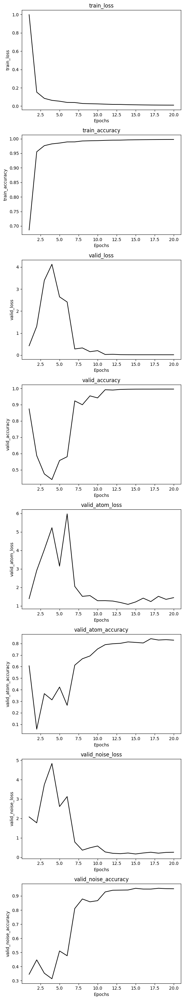

In [7]:
trainer.plot_training_metrics()

In [8]:
wandb.finish()

wandb: WARNING Ensure read and write access to run files dir: /scratch/home/yichen/Understanding-Experimental-Images-by-Identifying-Symmetries-with-Deep-Learning_root/notebooks/various_dataset_size/wandb/run-20240928_174959-09282024-FPN-dataset_v5_size-10m/files, control this via the WANDB_DIR env var. See https://docs.wandb.ai/guides/track/environment-variables


epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▇▇▇▇▇▇████
records,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇█████
train_accuracy,▁▆▇█████████████████████████████████████
train_loss,█▃▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
valid_accuracy,▇▆▃▃▂▂▁▁▃▂▃▃▇▇▇▇▇▇▇▇████████████████████
valid_atom_accuracy,▆▆▁▁▄▄▃▃▄▄▃▃▆▆▇▆▇▇▇▇█▇██████████████████
valid_atom_loss,▁▁▄▄▅▅▇▇▄▄██▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▂▁▁▂▁
valid_loss,▂▂▃▃▆▇██▅▅▅▅▁▁▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
valid_noise_accuracy,▁▁▃▃▂▂▁▁▃▃▃▃▆▆▇▇▇▇▇▇████████████████████
valid_noise_loss,▄▄▃▃▆▆██▅▅▆▅▂▂▁▁▁▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,20
